# **SAMson: An Automated Brain Extraction Tool for Rodents Using SAM**  
*Accurate and robust rodent brain segmentation for MRI data*

---

### **Authored by**  
**Daniel Panadero Soler**<sup>1</sup>, **Mohamed Kotb Selim**<sup>1</sup>, **Patricia Martínez-Tazo**<sup>1</sup>,  
**Emma Muñoz-Moreno**<sup>2</sup>, **Pedro Ramos-Cabrer**<sup>3,4</sup>, **Pilar López-Larrubia**<sup>5</sup>,  
**Silvia De Santis**<sup>1</sup>, **Santiago Canals**<sup>1</sup>, and **Antonio Pertusa**<sup>6</sup>  

<sup>1</sup>Instituto de Neurociencias, CSIC-UMH, Sant Joan d’Alacant, Spain  
<sup>2</sup>IDIBAPS, Barcelona, Spain  
<sup>3</sup>CIC biomaGUNE, BRTA, Donostia–San Sebastián, Spain  
<sup>4</sup>Ikerbasque, Basque Foundation for Science, Bilbao, Spain  
<sup>5</sup>Instituto de Investigaciones Biomédicas Sols-Morreale, CSIC-UAM, Madrid, Spain  
<sup>6</sup>University Institute for Computer Research, University of Alicante, Alicante, Spain  

📧 **Contact**: [pertusa@ua.es](mailto:pertusa@ua.es)  

---

### **Abstract**  
Accurate brain extraction is a critical step in the analysis of rodent head magnetic resonance imaging (MRI) data. However, current methods often encounter difficulties in handling the diverse range of imaging setups, resolutions, and experimental conditions commonly found in this field.
SAMson (*SAM for Segmentation Of Neuroimages*) is an automated tool based on the Segment Anything Model (SAM), designed for robust rodent brain extraction. It integrates a bounding box generator and a mask prediction pipeline, offering fully automated and semi-automated modes to address varying experimental complexities.
SAMson has been evaluated using three multi-centre rodent MRI datasets annotated at the pixel level, differing in acquisition parameters, resolution, and animal age groups. The tool demonstrates superior performance to existing methods (BET, RBM, BEN) in terms of segmentation accuracy, with Jaccard indices exceeding 90% across datasets. Its semi-automated mode is particularly effective in challenging scenarios such as low-resolution images and cases requiring refined mask precision.
By identifying errors at the individual slice level, SAMson enables rapid and targeted corrections, advancing translational neuroscience by supporting large-scale research workflows.  

---

### **Contents**  
This notebook is the fourth and final installment in the series, designed to ensure transparency and reproducibility of the visual and quantitative results reported in the SAMson study. Within this notebook, you will find:  
1. Code to generate all figures included in the SAMson manuscript.  
2. All statistical analyses presented in the SAMson article.

Both the figures and statistical analyses are showcased in the precise order of their appearance in the article.


## Setup

In [1]:
import os                                                      # files
import time                                                    # progress
import cv2                                                     # images
import matplotlib.pyplot as plt                                # plots
import numpy as np                                             # arrays
import nibabel as nib                                          # nifti
from os.path import join as pjoin                              # join paths
import pandas as pd
import seaborn as sns
from scipy.interpolate import make_interp_spline
import matplotlib.patches as mpatches
from matplotlib.legend_handler import HandlerLine2D
import matplotlib.gridspec as gridspec
from decimal import Decimal
from scipy.stats import pearsonr, ttest_ind, f_oneway, norm
from statsmodels.stats.multicomp import pairwise_tukeyhsd
from statsmodels.stats.multitest import multipletests

import warnings

# Suppress specific matplotlib warnings about tick labels
warnings.filterwarnings("ignore", message=".*set_ticklabels.*")
# Suppress specific seaborn warnings about point placement in categorical plots
warnings.filterwarnings("ignore", message=".*points cannot be placed.*")


In [2]:

"""""""""      PLOTTING  FUNCTIONS      """""""""

def redistribute_to_avoid_overlap(y_values, group_centers, min_separation=0.02):
    """
    Redistribute y-values into separate vertical groups to avoid overlap.
    """
    sorted_indices = np.argsort(y_values)
    sorted_y = np.array(y_values)[sorted_indices]
    assigned_positions = []

    for y in sorted_y:
        best_group = None
        min_overlap = float('inf')

        for x in group_centers:
            overlap = sum(
                abs(y - other_y) < min_separation
                for assigned_x, other_y in assigned_positions if assigned_x == x
            )
            if overlap < min_overlap:
                min_overlap = overlap
                best_group = x
        assigned_positions.append((best_group, y))

    unsorted_positions = [None] * len(y_values)
    for original_idx, sorted_idx in enumerate(sorted_indices):
        unsorted_positions[sorted_idx] = assigned_positions[original_idx]

    return unsorted_positions
        
def plot_mean_per_subject(jaccard_values_3, jaccard_values_4_5, jaccard_values_6, jaccard_values_12, jaccard_values_d2, jaccard_values_d3, y_under_lim=0.6,stats=False):

    # Define groups for redistribution
    group_centers_3 = [0, 0.15, -0.15]
    group_centers_4_5 = [1, 1.15, 0.85]
    group_centers_6 = [2, 2.15, 1.85]
    group_centers_12 = [3, 3.15, 2.85]
    group_centers_d2 = [0, 0.15, -0.15]
    group_centers_d3 = [1, 1.15, 0.85]

    # Redistribute points
    positions_3   = redistribute_to_avoid_overlap(jaccard_values_3, group_centers_3, min_separation=0.02)
    positions_4_5 = redistribute_to_avoid_overlap(jaccard_values_4_5, group_centers_4_5, min_separation=0.02)
    positions_6   = redistribute_to_avoid_overlap(jaccard_values_6, group_centers_6, min_separation=0.02)
    positions_12  = redistribute_to_avoid_overlap(jaccard_values_12, group_centers_12, min_separation=0.02)
    positions_d2  = redistribute_to_avoid_overlap(jaccard_values_d2, group_centers_d2, min_separation=0.02)
    positions_d3  = redistribute_to_avoid_overlap(jaccard_values_d3, group_centers_d3, min_separation=0.02)

    # Plotting
    fig, ax = plt.subplots(1, 2, gridspec_kw={'width_ratios': [2, 1]}, figsize=(9, 6), sharey=True, dpi=300)
    plt.subplots_adjust(wspace=0.2)
    alphas = 0.75
    dotsize = 50

    def plot_positions(ax, positions, group_label=None,color="tab:blue"):
        x_coords, y_coords = zip(*positions)
        ax.scatter(x_coords, y_coords, s=dotsize, c=color, edgecolor='none', alpha=alphas, label=group_label)

    # Plot each group
    plot_positions(ax[0], positions_3)
    plot_positions(ax[0], positions_4_5)
    plot_positions(ax[0], positions_6)
    plot_positions(ax[0], positions_12)
    plot_positions(ax[1], positions_d2)
    plot_positions(ax[1], positions_d3)

    # Mean and standard deviation bars
    d1_mean_jac = np.mean(np.concatenate([jaccard_values_3, jaccard_values_4_5, jaccard_values_6, jaccard_values_12]))
    d1_std_jac  = np.std(np.concatenate([jaccard_values_3, jaccard_values_4_5, jaccard_values_6, jaccard_values_12]))
    mean_jac    = [np.mean(jaccard_values_3), np.mean(jaccard_values_4_5), np.mean(jaccard_values_6), np.mean(jaccard_values_12),
                   np.mean(jaccard_values_d2), np.mean(jaccard_values_d3)]
    std_jac     = [np.std(jaccard_values_3), np.std(jaccard_values_4_5), np.std(jaccard_values_6), np.std(jaccard_values_12),
                   np.std(jaccard_values_d2), np.std(jaccard_values_d3)]

    ax[0].axhline(d1_mean_jac, color='r', linestyle='--', label='Mean')
    ax[0].axhspan(d1_mean_jac - d1_std_jac, d1_mean_jac + d1_std_jac, facecolor='r', alpha=0.05, label='SD')
    ax[0].errorbar([0, 1, 2, 3], mean_jac[:-2], std_jac[:-2], marker="_", markersize=8, capsize=10, capthick=2, elinewidth=2, linestyle="None", color="tab:orange")
    if stats=="full":
      # Plot significance stars
      ax[0].text(1,0.96,"***",fontsize=20,horizontalalignment='center',verticalalignment='center')  # Between 4.5 months and 12 months
      ax[0].text(2,0.96,"**",fontsize=20,horizontalalignment='center',verticalalignment='center')  # Between 6 months and 12 months

    elif stats=="semi":
      # Plot significance stars
      ax[0].text(0,0.965,"*",fontsize=20,horizontalalignment='center',verticalalignment='center')  # Between 6 months and 12 months
      ax[0].text(1,0.965,"***",fontsize=20,horizontalalignment='center',verticalalignment='center')  # Between 4.5 months and 12 months
      ax[0].text(2,0.965,"*",fontsize=20,horizontalalignment='center',verticalalignment='center')  # Between 6 months and 12 months

    ax[0].set_ylim(y_under_lim, 1)
    ax[1].set_ylim(y_under_lim, 1)
    ax[1].errorbar([0, 1], mean_jac[-2:], std_jac[-2:], marker="_", markersize=8, capsize=10, capthick=2,  elinewidth=2, linestyle="None", color="tab:orange")

    # Adding horizontal lines to make errorbar markers thicker
    for i, mean in enumerate(mean_jac[:-2]):
        ax[0].hlines(mean, -0.06 + i, 0.06 + i, color="tab:orange", linewidth=2)  # Horizontal lines to thick marker
    # Adding horizontal lines to make errorbar markers thicker for D2/D3
    for i, mean in enumerate(mean_jac[-2:]):
        ax[1].hlines(mean, -0.06 + i, 0.06 + i, color="tab:orange", linewidth=2)  # Horizontal lines to thick marker

    ax[0].set_ylabel('Jaccard index', fontsize=20)
    ax[0].set_xlabel('D1 (m.o.a)', fontsize=20)

    ax[0].set_xticks((-1, 0, 1, 2, 3, 4))
    ax[0].set_xticklabels(("", "3", "4.5", "6", "12", ""), fontsize=20)
    ax[0].tick_params(axis='both', which='major', labelsize=20)

    ax[0].set_yticks(np.arange(y_under_lim, 1.01, 0.05))
    y_ticks = ax[0].get_yticks()
    new_labels = ['' if i % 2 != 0 else f'{tick:.1f}' for i, tick in enumerate(y_ticks)]
    ax[0].set_yticklabels(new_labels)

    ax[1].set_xticks((-1, 0, 1, 2))
    ax[1].set_xticklabels(("", "D2", "D3", ""), fontsize=20)
    ax[1].tick_params(axis='both', which='major', labelsize=20)
    ax[1].tick_params(axis='x', which='major', pad=15)

    ax[0].legend(framealpha=1, fontsize=20, loc="lower left")
    ax[0].tick_params(which='major', length=5, direction="in", right=True, top=True)
    ax[1].tick_params(which='major', length=5, direction="in", right=True, top=True)
    ax[0].grid(axis='y')
    ax[0].tick_params(axis='y', pad=10)  # Add extra padding
    ax[1].grid(axis='y')
    plt.tight_layout()
    plt.show()

def plot_combined_mean_per_slice(
    jacc_values_per_slice,
    jacc_values_mean_per_slice,
    jacc_values_d2_per_slice,
    jacc_values_d2_mean_per_slice,
    jacc_values_d3_per_slice,
    jacc_values_d3_mean_per_slice,
    y_under_lim=0.6):
    
    labels_d1 = ["D1 (3)", "D1 (4.5)", "D1 (6)", "D1 (12)"]
    # Define figure and GridSpec with correct height ratios
    fig = plt.figure(figsize=(10, 16), dpi=300)
    # Define 8 rows, where rows 4 and 6 are small gaps
    gs = fig.add_gridspec(
        8, 1, height_ratios=[1, 1, 1, 1, -0.2, 1, -0.2, 1], hspace=0.3
    )

    axs = [
        fig.add_subplot(gs[0, 0]),
        fig.add_subplot(gs[1, 0]),
        fig.add_subplot(gs[2, 0]),
        fig.add_subplot(gs[3, 0]),
        fig.add_subplot(gs[5, 0]),  # Skipping row 4 for spacing
        fig.add_subplot(gs[7, 0]),  # Skipping row 6 for spacing
    ]
    # Share the x-axis explicitly for the first fD1 SUBplots
    for i in range(1, 4):
        axs[i].sharex(axs[0])  # Link x-axis of axs[i] to axs[0]

    # Plot D1 datasets (first four rows)
    for i in range(4):
        axs[i].text(0.5, 0.15, labels_d1[i], va='center', ha='center', fontsize=24, transform=axs[i].transAxes)
        axs[i].tick_params(which='major', length=5, direction="in", right=True, top=True)
        axs[i].set_ylim(y_under_lim, 1)
        axs[i].set_yticks(np.arange(y_under_lim, 1.01, 0.1))
        y_ticks = axs[i].get_yticks()
        new_labels = ['' if i % 2 != 0 else f'{tick:.1f}' for i, tick in enumerate(y_ticks)]
        axs[i].set_yticklabels(new_labels)
        axs[i].grid("y")
        axs[i].tick_params(axis='both', which='major', labelsize=20)

        # Add swarmplot and mean line for each D1 dataset
        sns.swarmplot(data=jacc_values_per_slice[i], size=3.8, color='tab:blue', ax=axs[i], zorder=1)
        axs[i].plot(
            range(0, 16),
            jacc_values_mean_per_slice[i],
            marker="H",
            markersize=5,
            color="tab:orange",
            linewidth=2,
            zorder=2
        )
        # Remove x-tick labels except for the last D1 subplot
        if i in [0, 1, 2]:
          axs[i].tick_params(labelbottom=False)
        else:
          original_labels = [str(label) for label in axs[i].get_xticks()]
          adjusted_numbers = [str(int(num)+ 1) for num in original_labels]
          labels_of_interest = [str(i) for i in np.arange(2, 17, 2)]
          new_labels = [label if label in labels_of_interest else "" for label in adjusted_numbers]
          axs[i].set_xticklabels(new_labels)

    # Plot D2 dataset (5th subplot)
    axs[4].set_ylim(y_under_lim, 1)
    axs[4].set_yticks(np.arange(y_under_lim, 1.01, 0.1))
    y_ticks = axs[4].get_yticks()
    new_labels = ['' if i % 2 != 0 else f'{tick:.1f}' for i, tick in enumerate(y_ticks)]
    axs[4].set_yticklabels(new_labels)
    axs[4].grid("y")
    sns.swarmplot(data=jacc_values_d2_per_slice, size=4, color='tab:blue', ax=axs[4],zorder=1)
    axs[4].plot(
        range(0, 19),
        jacc_values_d2_mean_per_slice,
        marker="H",
        markersize=3.8,
        color="tab:orange",
        zorder=2
    )
    original_labels = [str(label) for label in axs[4].get_xticks()]
    adjusted_numbers = [str(int(num)+ 1) for num in original_labels]
    labels_of_interest = [str(i) for i in np.arange(2, 19, 2)]
    new_labels = [label if label in labels_of_interest else "" for label in adjusted_numbers]
    axs[4].set_xticklabels(new_labels)
    axs[4].text(0.5, 0.15, "D2", va='center', ha='center', fontsize=24, transform=axs[4].transAxes)
    axs[4].tick_params(axis="both", which="major", labelsize=20)
    axs[4].tick_params(which='major', length=5, direction="in", right=True, top=True)

    # Plot D3 dataset (6th subplot)
    axs[5].set_ylim(y_under_lim, 1)
    axs[5].set_yticks(np.arange(y_under_lim, 1.01, 0.1))
    y_ticks = axs[5].get_yticks()
    new_labels = ['' if i % 2 != 0 else f'{tick:.1f}' for i, tick in enumerate(y_ticks)]
    axs[5].set_yticklabels(new_labels)
    axs[5].grid("y")
    sns.swarmplot(data=jacc_values_d3_per_slice, size=4, color='tab:blue', ax=axs[5], zorder=1)
    axs[5].plot(
        range(0, 42),
        jacc_values_d3_mean_per_slice,
        marker="H",
        markersize=3.8,
        color="tab:orange",
        zorder=2
    )
    original_labels = [str(label) for label in axs[5].get_xticks()]
    adjusted_numbers = [str(int(num)+ 1) for num in original_labels]
    labels_of_interest = [str(i) for i in np.arange(5, 42, 5)]
    new_labels = [label if label in labels_of_interest else "" for label in adjusted_numbers]
    axs[5].set_xticklabels(new_labels)
    axs[5].set_xlabel("Slice", fontsize=20)
    axs[5].text(0.5, 0.15, "D3", va='center', ha='center', fontsize=24, transform=axs[5].transAxes)
    axs[5].tick_params(axis="both", which="major", labelsize=20)
    axs[5].tick_params(which='major', length=5, direction="in", right=True, top=True)

    # Set the y-axis label for the entire figure
    fig.text(0.035, 0.5, 'Jaccard index', va='center', rotation='vertical', fontsize=20)
    # Adjust layout and show plot
    plt.show()

def samson_vs_another(jaccard_values_bet, jaccard_values, jacc_values_bet_all_mean_per_slice, jacc_values_bet_all_std_per_slice, jacc_values_all_mean_per_slice, jacc_values_all_std_per_slice, tool_name="BET", samson_label="SAMson", dataset="D1 (3)",stars=False):

    group1_y = jaccard_values_bet
    group1_x = np.zeros(len(jaccard_values))
    group2_y = jaccard_values
    group2_x = np.ones(len(jaccard_values))

    fig, ax = plt.subplots(1, 2, gridspec_kw={'width_ratios': [1, 2]}, figsize=(9, 6.7), sharey=True, dpi=300)

    # Plot the trajectories (left subplot)
    for i in range(len(group1_x)):
        ax[0].plot([group1_x[i], group2_x[i]], [group1_y[i], group2_y[i]], marker='o', color="grey", alpha=0.3)
    ax[0].errorbar(0, np.mean(group1_y), yerr=np.std(group1_y), marker="_", markersize=8, capsize=10, capthick=2, elinewidth=2, linestyle="None", color="tab:orange")
    ax[0].errorbar(1, np.mean(group2_y), yerr=np.std(group2_y), marker="_", markersize=8, capsize=10, capthick=2, elinewidth=2, linestyle="None", color="tab:blue")
    ax[0].hlines( np.mean(group1_y), -0.06 + 0, 0.06 + 0, color="tab:orange", linewidth=2)  # Horizontal lines to thick marker
    ax[0].hlines( np.mean(group2_y), -0.06 + 1, 0.06 + 1, color="tab:blue", linewidth=2)  # Horizontal lines to thick marker
    ax[0].set_ylim(0.4, 1)
    ax[0].set_ylabel('Jaccard index', fontsize=20)
    ax[0].set_yticks(np.arange(0.4, 1.01, 0.1))
    y_ticks = ax[0].get_yticks()
    new_labels = ['' if i % 2 != 0 else f'{tick:.1f}' for i, tick in enumerate(y_ticks)]
    ax[0].set_yticklabels(new_labels)
    ax[0].set_xticks((-0.5, 0, 1, 1.5))
    ax[0].set_xticklabels(("", tool_name, samson_label, ""), fontsize=20)
    ax[0].tick_params(axis='both', which='major', labelsize=20)
    # ax[0].spines[['right']].set_visible(False)
    ax[0].tick_params(which='major', length=5, direction="in", right=True, top=True)
    ax[0].grid(axis='y')

    # Replace error bars with shaded area (right subplot)
    x_original = np.arange(1, len(jacc_values_all_mean_per_slice) + 1)
    x_smooth = np.linspace(x_original.min(), x_original.max(), 300)

    # SAMson - Interpolate mean and std
    mean_smooth_samson = make_interp_spline(x_original, jacc_values_all_mean_per_slice)(x_smooth)
    std_smooth_samson = make_interp_spline(x_original, jacc_values_all_std_per_slice)(x_smooth)

    ax[1].fill_between(
        x_smooth,
        mean_smooth_samson - std_smooth_samson,
        mean_smooth_samson + std_smooth_samson,
        color="tab:blue",
        alpha=0.2
    )
    ax[1].plot(
        x_original,
        jacc_values_all_mean_per_slice,
        color="tab:blue",
        linewidth=2,
        marker=".",
        markersize=10
    )

    # BET - Interpolate mean and std
    mean_smooth_bet = make_interp_spline(x_original, jacc_values_bet_all_mean_per_slice)(x_smooth)
    std_smooth_bet = make_interp_spline(x_original, jacc_values_bet_all_std_per_slice)(x_smooth)

    ax[1].fill_between(
        x_smooth,
        mean_smooth_bet - std_smooth_bet,
        mean_smooth_bet + std_smooth_bet,
        color="tab:orange",
        alpha=0.2
    )
    ax[1].plot(
        x_original,
        jacc_values_bet_all_mean_per_slice,
        color="tab:orange",
        linewidth=2,
        marker=".",
        markersize=10
    )

    # Final customization for right subplot
    ax[1].set_ylim(0.4, 1)
    ax[1].grid(axis='y')
    ax[1].set_xlabel('Slice', fontsize=20)
    # Define ticks and ticklabels for each dataset
    if dataset == "D1 (3)":
        ticklabels = np.arange(2, 17, 2)
        ticks = np.arange(1, 17)  # Full range of ticks for all slices in D1
        if stars:
            ax[0].text(0.5,0.965,"***", fontsize=20, verticalalignment='center', horizontalalignment="center")
    elif dataset == "D2":
        ticklabels = np.arange(2, 19, 2)
        ticks = np.arange(1, 19)  # Full range of ticks for all slices in D2
    else:  # Assume dataset == "D3"
        ticklabels = np.arange(5, 42, 5)
        ticks = np.arange(1, 42)  # Full range of ticks for all slices in D3

    # Set the ticks
    ax[1].set_xticks(ticks)
    ax[1].tick_params(which='major', length=5, direction="in", right=True, top=True)

    # Set the tick labels: Use empty strings for ticks not in `ticklabels`
    ax[1].set_xticklabels([str(tick) if tick in ticklabels else '' for tick in ticks], fontsize=20)
    # ax[1].spines[['right', 'top']].set_visible(False)

    # Define the line and shaded patch for SAMson
    line_samson, = plt.plot([], [], color="tab:blue", lw=2, label=samson_label, marker=".", markersize=10)
    patch_samson = mpatches.Patch(facecolor="tab:blue", alpha=0.2, edgecolor="tab:blue")

    # Define the line and shaded patch for BET
    line_bet, = plt.plot([], [], color="tab:orange", lw=2, label=tool_name, marker=".", markersize=10)
    patch_bet = mpatches.Patch(facecolor="tab:orange", alpha=0.2, edgecolor="tab:orange")

    # Add the legend with both the patch and line for each
    ax[1].legend(
        [(patch_samson, line_samson), (patch_bet, line_bet)],  # Tuple of (shaded area, line)
        [samson_label, tool_name],  # Legend labels
        handler_map={line_samson: HandlerLine2D(marker_pad=0), line_bet: HandlerLine2D(marker_pad=0)},  # Handler for lines
        fontsize=20,framealpha=1, loc="lower left")
    fig.suptitle(dataset, fontsize=20, y=0.95)

    # Displaying the plot
    plt.tight_layout()
    plt.show()

def samson_vs_all(values, values_bet, values_rbm, values_ben,dataset="D1"):
    jaccard_values, jacc_values_all_mean_per_slice, jacc_values_all_std_per_slice = values[0], values[1], values[2]
    jaccard_values_bet, jacc_values_bet_all_mean_per_slice, jacc_values_bet_all_std_per_slice = values_bet[0], values_bet[1], values_bet[2]
    jaccard_values_rbm, jacc_values_rbm_all_mean_per_slice, jacc_values_rbm_all_std_per_slice = values_rbm[0], values_rbm[1], values_rbm[2]
    jaccard_values_ben, jacc_values_ben_all_mean_per_slice, jacc_values_ben_all_std_per_slice = values_ben[0], values_ben[1], values_ben[2]


    # Define x positions for each tool in the trajectory plot
    group_rbm_x = np.zeros(len(jaccard_values))      # RBM
    group_ben_x = np.ones(len(jaccard_values))       # BEN
    group_bet_x = np.full(len(jaccard_values), 2)    # BET
    group_samson_x = np.full(len(jaccard_values), 3) # SAMson

    fig, ax = plt.subplots(1, 2, gridspec_kw={'width_ratios': [1, 2]}, figsize=(12, 6), sharey=True, dpi=300)

    # Trajectory Plot (subplot on the left)
    for i in range(len(jaccard_values)):
        # Plot connecting lines between each neighboring tool
        ax[0].plot([group_rbm_x[i], group_ben_x[i]], [jaccard_values_rbm[i], jaccard_values_ben[i]], marker='o', color="grey", alpha=0.3)
        ax[0].plot([group_ben_x[i], group_bet_x[i]], [jaccard_values_ben[i], jaccard_values_bet[i]], marker='o', color="grey", alpha=0.3)
        ax[0].plot([group_bet_x[i], group_samson_x[i]], [jaccard_values_bet[i], jaccard_values[i]], marker='o', color="grey", alpha=0.3)

    # Plot mean and standard deviation for each tool with specified colors
    ax[0].errorbar(0, np.mean(jaccard_values_rbm), yerr=np.std(jaccard_values_rbm), marker="_", markersize=8, capsize=10, capthick=1.5, linestyle="None", color="tab:green", label="RBM")
    ax[0].errorbar(1, np.mean(jaccard_values_ben), yerr=np.std(jaccard_values_ben), marker="_", markersize=8, capsize=10, capthick=1.5, linestyle="None", color="tab:red", label="BEN")
    ax[0].errorbar(2, np.mean(jaccard_values_bet), yerr=np.std(jaccard_values_bet), marker="_", markersize=8, capsize=10, capthick=1.5, linestyle="None", color="tab:orange", label="BET")
    ax[0].errorbar(3, np.mean(jaccard_values), yerr=np.std(jaccard_values), marker="_", markersize=8, capsize=10, capthick=1.5, linestyle="None", color="tab:blue", label="SAMson")

    ax[0].set_ylim(0, 1)
    ax[0].set_ylabel('Jaccard index', fontsize=20)
    ax[0].set_yticks(np.arange(0, 1.01, 0.1))
    y_ticks = ax[0].get_yticks()
    new_labels = ['' if i % 2 != 0 else f'{tick:.1f}' for i, tick in enumerate(y_ticks)]
    ax[0].set_yticklabels(new_labels)
    ax[0].set_xticks((-0.5, 0, 1, 2, 3, 3.5))
    ax[0].set_xticklabels(("", "RBM", "BEN", "BET", "SAMson", ""), fontsize=20)
    ax[0].tick_params(axis='both', which='major', labelsize=20)
    ax[0].spines[['right', 'top']].set_visible(False)
    ax[0].grid(axis='y')

    # Per-Slice Comparison Plot (subplot on the right)
    slices = np.arange(1, len(jacc_values_all_mean_per_slice) + 1)

    x_original = slices
    x_smooth = np.linspace(x_original.min(), x_original.max(), 300)
    # SAMson
    mean_smooth = make_interp_spline(x_original, jacc_values_all_mean_per_slice[:len(x_original)])(x_smooth)
    std_smooth = make_interp_spline(x_original, jacc_values_all_std_per_slice[:len(x_original)])(x_smooth)
    ax[1].plot(slices, jacc_values_all_mean_per_slice, color="tab:blue", linewidth=2, marker=".", markersize=10)
    ax[1].fill_between(x_smooth, mean_smooth - std_smooth, mean_smooth + std_smooth,
        color="tab:blue", alpha=0.2)
    # BET
    mean_smooth = make_interp_spline(x_original, jacc_values_bet_all_mean_per_slice[:len(x_original)])(x_smooth)
    std_smooth = make_interp_spline(x_original, jacc_values_bet_all_std_per_slice[:len(x_original)])(x_smooth)
    ax[1].plot(slices, jacc_values_bet_all_mean_per_slice, color="tab:orange", linewidth=2, marker=".", markersize=10)
    ax[1].fill_between(x_smooth, mean_smooth - std_smooth, mean_smooth + std_smooth,
        color="tab:orange", alpha=0.2)
    # RBM
    mean_smooth = make_interp_spline(x_original, jacc_values_rbm_all_mean_per_slice[:len(x_original)])(x_smooth)
    std_smooth = make_interp_spline(x_original, jacc_values_rbm_all_std_per_slice[:len(x_original)])(x_smooth)
    ax[1].plot(slices, jacc_values_rbm_all_mean_per_slice, label="RBM", color="tab:green", linewidth=2, marker=".", markersize=10)
    ax[1].fill_between(x_smooth, mean_smooth - std_smooth, mean_smooth + std_smooth,
        color="tab:green", alpha=0.2)
    # BEN
    mean_smooth = make_interp_spline(x_original, jacc_values_ben_all_mean_per_slice[:len(x_original)])(x_smooth)
    std_smooth = make_interp_spline(x_original, jacc_values_ben_all_std_per_slice[:len(x_original)])(x_smooth)
    ax[1].plot(slices, jacc_values_ben_all_mean_per_slice, label="BEN", color="tab:red", linewidth=2, marker=".", markersize=10)
    ax[1].fill_between(x_smooth, mean_smooth - std_smooth, mean_smooth + std_smooth,
        color="tab:red", alpha=0.2)

    ax[1].set_ylim(0, 1)
    ax[1].grid(axis='y')
    ax[1].set_xlabel('Slice', fontsize=20)
    # Define ticks and ticklabels for each dataset
    if dataset == "D1":
        ticklabels = np.arange(2, 17, 2)
        ticks = np.arange(1, 17)  # Full range of ticks for all slices in D1
    elif dataset == "D2":
        ticklabels = np.arange(2, 19, 2)
        ticks = np.arange(1, 19)  # Full range of ticks for all slices in D2
    else:  # Assume dataset == "D3"
        ticklabels = np.arange(5, 42, 5)
        ticks = np.arange(1, 42)  # Full range of ticks for all slices in D3

    # Set the ticks
    ax[1].set_xticks(ticks)

    # Set the tick labels: Use empty strings for ticks not in `ticklabels`
    ax[1].set_xticklabels([str(tick) if tick in ticklabels else '' for tick in ticks], fontsize=20)
    ax[1].spines[['right', 'top']].set_visible(False)

    # Define the line and shaded patch for SAMson
    line_samson, = plt.plot([], [], color="tab:blue", lw=2, label="SAMson", marker=".", markersize=10)
    patch_samson = mpatches.Patch(facecolor="tab:blue", alpha=0.2, edgecolor="tab:blue")

    # Define the line and shaded patch for BET
    line_bet, = plt.plot([], [], color="tab:orange", lw=2, label="BET", marker=".", markersize=10)
    patch_bet = mpatches.Patch(facecolor="tab:orange", alpha=0.2, edgecolor="tab:orange")

    # Define the line and shaded patch for RBM
    line_rbm, = plt.plot([], [], color="tab:green", lw=2, label="RBM", marker=".", markersize=10)
    patch_rbm = mpatches.Patch(facecolor="tab:green", alpha=0.2, edgecolor="tab:green")

    # Define the line and shaded patch for BEN
    line_ben, = plt.plot([], [], color="tab:red", lw=2, label="BEN", marker=".", markersize=10)
    patch_ben = mpatches.Patch(facecolor="tab:red", alpha=0.2, edgecolor="tab:red")

    # Add the legend with both the patch and line for each
    ax[1].legend(
        [(patch_samson, line_samson), (patch_bet, line_bet),(patch_rbm, line_rbm), (patch_ben, line_ben)],  # Tuple of (shaded area, line)
        ["SAMson", "BET", "RBM", "BEN"],  # Legend labels
        handler_map={line_samson: HandlerLine2D(marker_pad=0), line_bet: HandlerLine2D(marker_pad=0)},  # Handler for lines
        fontsize=20,framealpha=1, loc="lower left"
    )

    # Displaying the plot
    plt.tight_layout()
    plt.show()

def compare_datasets(values_d1, values_d2, values_d3):
    # Set tool names and their colors
    tools = ["RBM", "BEN", "BET", "SAMson"]
    colors = ["tab:green", "tab:red", "tab:orange", "tab:blue"]
    dataset_titles = ["D1 (3)", "D2", "D3"]

    # Initialize figure with three subplots, one per dataset
    fig, axs = plt.subplots(1, 3, figsize=(13.84, 6.92), dpi=300, sharey=True)

    # Data structure for easy iteration through datasets
    dataset_values = [values_d1, values_d2, values_d3]

    for i, (dataset, ax) in enumerate(zip(dataset_values, axs)):
        # Unpack dataset values
        jaccard_values, jaccard_values_bet, jaccard_values_rbm, jaccard_values_ben = dataset[0], dataset[1], dataset[2], dataset[3]

        # Define x positions in the order RBM, BEN, BET, SAMson
        group_rbm_x = np.zeros(len(jaccard_values))      # RBM
        group_ben_x = np.ones(len(jaccard_values))       # BEN
        group_bet_x = np.full(len(jaccard_values), 2)    # BET
        group_samson_x = np.full(len(jaccard_values), 3) # SAMson

        # Plot connecting lines and data points for each pair of tools
        for j in range(len(jaccard_values)):
            # Connecting lines between neighboring tools
            ax.plot([group_rbm_x[j], group_ben_x[j]], [jaccard_values_rbm[j], jaccard_values_ben[j]], marker='o', color="grey", alpha=0.3)
            ax.plot([group_ben_x[j], group_bet_x[j]], [jaccard_values_ben[j], jaccard_values_bet[j]], marker='o', color="grey", alpha=0.3)
            ax.plot([group_bet_x[j], group_samson_x[j]], [jaccard_values_bet[j], jaccard_values[j]], marker='o', color="grey", alpha=0.3)

        # Mean and standard deviation bars for each tool
        for x, mean, std, color, tool_name in zip(
            [0, 1, 2, 3],
            [np.mean(jaccard_values_rbm), np.mean(jaccard_values_ben), np.mean(jaccard_values_bet), np.mean(jaccard_values)],
            [np.std(jaccard_values_rbm), np.std(jaccard_values_ben), np.std(jaccard_values_bet), np.std(jaccard_values)],
            colors, tools
        ):
            ax.errorbar(x, mean, yerr=std, marker="_", markersize=8, capsize=10, capthick=2, elinewidth=2, linestyle="None", color=color, label=tool_name if i == 1 else "")
            ax.hlines(mean, -0.06 + x, 0.06 + x, color=color, linewidth=2)  # Horizontal lines to thick marker
        # Set labels and titles
        ax.set_title(dataset_titles[i], fontsize=20)
        ax.set_xticks((-0.5, 0, 1, 2, 3, 3.5))
        ax.set_xticklabels(["","RBM", "BEN", "BET", "SAMson",""], fontsize=20)
        #if i !=2:
          #ax.spines[['right']].set_visible(False)
        ax.tick_params(which='major', length=5, direction="in", right=True, top=True)
        ax.tick_params(axis='both', which='major', labelsize=20)
        ax.grid(axis='y')
        if i == 0:
            ax.set_ylabel("Jaccard index", fontsize=20)
            ax.set_ylim(0, 1)
            ax.set_yticks(np.arange(0, 1.01, 0.1))
            y_ticks = ax.get_yticks()
            new_labels = ['' if i % 2 != 0 else f'{tick:.1f}' for i, tick in enumerate(y_ticks)]
            ax.set_yticklabels(new_labels)

    plt.tight_layout()
    plt.show()

def compare_datasets_per_slice(values_d1, values_d2, values_d3, y_under_lim=0.5, exclude_final_slices=False):
    # Tool colors for consistency
    colors = ["tab:blue", "tab:orange"]
    dataset_titles = ["D1 (3)", "D2", "D3"]

    # Initialize a vertical figure with three subplots, one per dataset
    fig, axs = plt.subplots(3, 1, figsize=(13.84, 13.84), dpi=300, sharex=False, sharey=True)

    # Data structure for easy iteration through datasets
    dataset_values = [values_d1, values_d2, values_d3]

    for i, (dataset, ax) in enumerate(zip(dataset_values, axs)):
        # Unpack dataset values
        jacc_values_mean_per_slice, jacc_values_std_per_slice = dataset[0], dataset[1]
        jacc_values_bet_mean_per_slice, jacc_values_bet_std_per_slice = dataset[2], dataset[3]

        # Determine the range of slices
        num_slices = len(jacc_values_mean_per_slice)
        if exclude_final_slices:
            if i == 2:  # Exclude final slices for D3
                num_slices -= 4
            else:
                num_slices -= 1

        # Smoothing setup
        x_original = np.arange(1, num_slices + 1)
        x_smooth = np.linspace(x_original.min(), x_original.max(), 300)

        # SAMson - Interpolate mean and std
        mean_smooth = make_interp_spline(x_original, jacc_values_mean_per_slice[:len(x_original)])(x_smooth)
        std_smooth = make_interp_spline(x_original, jacc_values_std_per_slice[:len(x_original)])(x_smooth)

        # Plot SAMson shaded area
        ax.fill_between(
            x_smooth, mean_smooth - std_smooth, mean_smooth + std_smooth,
            color=colors[0], alpha=0.2, label="SAMson (Std Dev)"
        )
        ax.plot(x_original, jacc_values_mean_per_slice[:len(x_original)], color=colors[0], label="SAMson Mean", linewidth=2, marker=".", markersize=10)

        # BET - Interpolate mean and std
        mean_bet_smooth = make_interp_spline(x_original, jacc_values_bet_mean_per_slice[:len(x_original)])(x_smooth)
        std_bet_smooth = make_interp_spline(x_original, jacc_values_bet_std_per_slice[:len(x_original)])(x_smooth)

        # Plot BET shaded area
        ax.fill_between(
            x_smooth, mean_bet_smooth - std_bet_smooth, mean_bet_smooth + std_bet_smooth,
            color=colors[1], alpha=0.2, label="BET (Std Dev)"
        )
        ax.plot(x_original, jacc_values_bet_mean_per_slice[:len(x_original)], color=colors[1], label="BET Mean", linewidth=2, marker=".", markersize=10)

        # Labels and titles
        ax.text(0.5, 0.1, dataset_titles[i], va='center', ha='center', fontsize=24, transform=ax.transAxes)
        ax.set_ylim(y_under_lim, 1)
        ax.grid(axis='y')
        ax.set_yticks(np.arange(y_under_lim, 1.01, 0.1))
        y_ticks = ax.get_yticks()
        new_labels = ['' if idx % 2 == 0 else f'{tick:.1f}' for idx, tick in enumerate(y_ticks)]
        ax.set_yticklabels(new_labels)
        ax.tick_params(axis='both', which='major', labelsize=20)
        ax.tick_params(which='major', length=5, direction="in", right=True, top=True)

        # Define ticks and ticklabels for each dataset
        if i == 0:
            ticklabels = np.arange(2, 15, 2)
            ticks = np.arange(1, 17)
        elif i == 1:
            ticklabels = np.arange(2, 19, 2)
            ticks = np.arange(1, 19)
        else:  # Assume dataset == "D3"
            ticklabels = np.arange(5, 42, 5)
            ticks = np.arange(1, 42)

        # Set the ticks
        ax.set_xticks(ticks)

        # Set the tick labels: Use empty strings for ticks not in `ticklabels`
        ax.set_xticklabels([str(tick) if tick in ticklabels else '' for tick in ticks], fontsize=20)

        if i == 2:
            ax.set_xlabel("Slice", fontsize=20)
        if i == 1:
            ax.set_ylabel("Jaccard index", fontsize=20)

    # Define the line and shaded patch for SAMson
    line_samson, = plt.plot([], [], color="tab:blue", lw=2, label="SAMson", marker=".", markersize=10)
    patch_samson = mpatches.Patch(facecolor="tab:blue", alpha=0.2, edgecolor="tab:blue")

    # Define the line and shaded patch for BET
    line_bet, = plt.plot([], [], color="tab:orange", lw=2, label="BET", marker=".", markersize=10)
    patch_bet = mpatches.Patch(facecolor="tab:orange", alpha=0.2, edgecolor="tab:orange")

    # Add the legend with both the patch and line for each
    for i in range(3):
        axs[i].legend(
            [(patch_samson, line_samson), (patch_bet, line_bet)],
            ["SAMson", "BET"],
            handler_map={line_samson: HandlerLine2D(marker_pad=0), line_bet: HandlerLine2D(marker_pad=0)},
            fontsize=20, loc="lower left"
        )

    plt.tight_layout()
    plt.show()



## Data

### Box analysis

In [3]:
accuracy_values_box_3 = np.array([79.34, 68.39, 74.37, 70.01, 77.69, 72.86, 74.5, 70.14, 76.39, 81.73, 81.59, 74.63, 77.38, 79.19, 76.52, 75.94])
jaccard_values_box_3 = np.array([0.8091, 0.7515, 0.7864, 0.7518, 0.797, 0.7633, 0.7766, 0.7618, 0.7982, 0.8289, 0.8278, 0.7824, 0.8041, 0.8116, 0.7977, 0.7964])
dice_values_box_3 = np.array([0.8939, 0.8529, 0.8794, 0.8557, 0.8853, 0.8639, 0.8708, 0.8613, 0.8861, 0.9057, 0.905, 0.8763, 0.89, 0.8948, 0.8858, 0.885])
accur_values_box_3 = np.array([79.23, 78.84, 83.86, 82.02, 82.67, 83.66, 83.12, 85.73, 80.36, 81.87, 83.22, 79.13, 75.26, 78.78999999999999, 65.22, 66.4, 65.47999999999999, 64.75, 71.6, 76.28999999999999, 83.16, 87.18, 80.0, 85.0, 84.4, 90.63, 84.94, 78.88, 38.1, 7.909999999999997, 52.37, 43.61, 74.94, 76.83, 76.4, 77.53, 80.15, 78.95, 81.76, 80.53, 84.03, 81.68, 76.7, 74.97, 74.62, 63.51, 42.05, 65.34, 67.65, 65.97, 75.32, 74.22, 79.61, 82.16, 76.0, 79.27, 82.06, 87.69, 78.52, 77.83, 59.03, 15.219999999999999, 66.74000000000001, 52.81, 68.56, 76.12, 84.5, 76.85, 81.66, 80.0, 82.5, 85.68, 89.19, 94.29, 78.94, 73.41, 69.06, 48.73, 79.17, 74.34, 70.73, 71.91, 75.08, 75.85, 80.62, 78.88, 76.91, 80.06, 84.76, 84.62, 75.65, 71.43, 82.76, 28.569999999999993, 70.48, 57.42, 63.06, 63.15, 73.46000000000001, 72.22, 81.36, 85.62, 87.38, 89.88, 88.22, 87.24, 74.77, 77.68, 64.69, 31.819999999999993, 65.8, 85.71000000000001, 81.16, 73.93, 82.2, 81.17, 85.0, 85.14, 75.24, 80.26, 81.44, 77.53, 66.67, 65.94, 59.06, 43.61, 18.180000000000007, 65.78999999999999, 73.2, 69.43, 77.52, 82.53999999999999, 82.43, 88.83, 78.64, 86.18, 86.5, 87.72, 79.34, 82.35, 68.67, 41.97, 74.7, 62.22, 78.64, 76.87, 82.83, 79.56, 87.36, 84.62, 82.5, 85.99, 86.28, 85.89, 80.0, 80.58, 76.06, 72.83, 71.97, 95.65, 73.28999999999999, 83.33, 76.13, 82.53999999999999, 84.65, 87.22, 82.07, 84.08, 87.5, 93.48, 82.12, 78.28, 78.38, 71.31, 83.33, 77.8, 69.73, 75.92, 81.7, 82.36, 77.69, 80.95, 80.24, 81.22, 86.88, 80.67, 72.1, 73.53, 78.6, 27.200000000000003, 69.17, 76.19, 72.56, 76.35, 70.82, 81.31, 84.17, 87.42, 80.37, 84.31, 82.49, 85.03999999999999, 82.7, 79.01, 86.72, 39.13, 70.08, 75.6, 74.28, 77.67, 84.1, 81.5, 85.0, 86.17, 81.75, 88.2, 88.61, 88.95, 79.82, 73.75, 81.31, 53.21, 71.97, 70.68, 73.68, 79.16, 78.31, 80.85, 84.27, 83.2, 80.14, 87.13, 85.59, 85.5, 78.37, 74.01, 84.13, 32.7, 70.08, 67.14, 80.85, 79.43, 80.65, 84.5, 84.92, 87.42, 83.05, 82.8, 84.07, 81.68, 74.66, 72.73, 71.71000000000001, 39.13, 70.91, 56.46])
jacc_values_box_3 = np.array([0.8019, 0.7957, 0.8438, 0.8258, 0.8318, 0.8437, 0.836, 0.8615, 0.812, 0.8269, 0.8431, 0.8056, 0.7717, 0.814, 0.7333, 0.6995, 0.679, 0.6806, 0.7369, 0.7685, 0.8357, 0.875, 0.8095, 0.8571, 0.85, 0.9078, 0.8627, 0.8127, 0.6, 0.5206, 0.6445, 0.5833, 0.7781, 0.7886, 0.7883, 0.8018, 0.8216, 0.8132, 0.8307, 0.8221, 0.8522, 0.8338, 0.7973, 0.7846, 0.7976, 0.7326, 0.6211, 0.7195, 0.6765, 0.6838, 0.7595, 0.7422, 0.7961, 0.8261, 0.7656, 0.8025, 0.8326, 0.8845, 0.8142, 0.8044, 0.7094, 0.5412, 0.7407, 0.6497, 0.6856, 0.7612, 0.845, 0.7685, 0.8166, 0.8, 0.825, 0.8568, 0.8919, 0.9429, 0.8035, 0.7581, 0.7568, 0.6506, 0.8128, 0.776, 0.7073, 0.7259, 0.7544, 0.7585, 0.809, 0.7947, 0.7754, 0.8112, 0.8523, 0.8563, 0.785, 0.75, 0.8421, 0.5833, 0.754, 0.6537, 0.6306, 0.6399, 0.7346, 0.7222, 0.8136, 0.8562, 0.8738, 0.8988, 0.8841, 0.8745, 0.7726, 0.8024, 0.739, 0.5833, 0.7257, 0.875, 0.8186, 0.7632, 0.8383, 0.8282, 0.8609, 0.8642, 0.7752, 0.8238, 0.8362, 0.8078, 0.7273, 0.7166, 0.6881, 0.6296, 0.5, 0.7111, 0.7453, 0.7162, 0.7866, 0.8298, 0.8285, 0.8911, 0.7964, 0.8672, 0.8705, 0.8824, 0.8164, 0.8421, 0.7614, 0.6328, 0.7905, 0.7143, 0.7864, 0.7687, 0.8371, 0.7956, 0.8736, 0.8462, 0.825, 0.862, 0.867, 0.8634, 0.8205, 0.824, 0.7905, 0.7794, 0.7643, 0.9583, 0.7329, 0.8333, 0.7753, 0.8254, 0.8465, 0.8742, 0.8233, 0.8471, 0.8803, 0.9371, 0.8368, 0.7986, 0.8123, 0.7699, 0.8571, 0.7941, 0.6973, 0.7676, 0.8199, 0.8236, 0.7833, 0.815, 0.808, 0.8253, 0.8751, 0.8258, 0.7604, 0.7692, 0.8135, 0.5787, 0.755, 0.8, 0.7468, 0.7801, 0.7451, 0.8209, 0.8441, 0.878, 0.8112, 0.8515, 0.8344, 0.859, 0.8416, 0.809, 0.8759, 0.6216, 0.7613, 0.7857, 0.7428, 0.7767, 0.841, 0.815, 0.85, 0.8637, 0.8201, 0.8838, 0.8897, 0.8951, 0.815, 0.7656, 0.8378, 0.6719, 0.7643, 0.7532, 0.7432, 0.7916, 0.7957, 0.8085, 0.8427, 0.8343, 0.8119, 0.8752, 0.865, 0.8671, 0.8136, 0.7787, 0.8553, 0.5977, 0.7613, 0.7212, 0.8085, 0.8013, 0.8179, 0.8473, 0.8537, 0.8798, 0.8377, 0.8395, 0.8528, 0.8341, 0.7839, 0.7652, 0.7736, 0.6216, 0.7664, 0.6592])
dic_values_box_3 = np.array([0.8901, 0.8862, 0.9153, 0.9046, 0.9082, 0.9152, 0.9107, 0.9256, 0.8963, 0.9052, 0.9149, 0.8923, 0.8711, 0.8975, 0.8462, 0.8232, 0.8088, 0.81, 0.8485, 0.8691, 0.9105, 0.9333, 0.8947, 0.9231, 0.9189, 0.9517, 0.9263, 0.8967, 0.75, 0.6847, 0.7839, 0.7368, 0.8752, 0.8818, 0.8816, 0.89, 0.9021, 0.897, 0.9075, 0.9024, 0.9202, 0.9094, 0.8872, 0.8793, 0.8874, 0.8457, 0.7663, 0.8369, 0.807, 0.8122, 0.8633, 0.852, 0.8864, 0.9048, 0.8672, 0.8904, 0.9086, 0.9387, 0.8976, 0.8916, 0.83, 0.7023, 0.851, 0.7876, 0.8135, 0.8644, 0.916, 0.8691, 0.899, 0.8889, 0.9041, 0.9229, 0.9429, 0.9706, 0.891, 0.8624, 0.8616, 0.7883, 0.8968, 0.8739, 0.8286, 0.8412, 0.86, 0.8627, 0.8944, 0.8856, 0.8735, 0.8958, 0.9203, 0.9226, 0.8795, 0.8571, 0.9143, 0.7368, 0.8597, 0.7906, 0.7735, 0.7804, 0.847, 0.8387, 0.8972, 0.9225, 0.9327, 0.9467, 0.9385, 0.933, 0.8717, 0.8904, 0.8499, 0.7368, 0.841, 0.9333, 0.9003, 0.8657, 0.912, 0.906, 0.9253, 0.9272, 0.8733, 0.9034, 0.9108, 0.8937, 0.8421, 0.8349, 0.8152, 0.7727, 0.6667, 0.8312, 0.8541, 0.8346, 0.8805, 0.907, 0.9062, 0.9424, 0.8867, 0.9289, 0.9307, 0.9375, 0.8989, 0.9143, 0.8646, 0.7751, 0.883, 0.8333, 0.8805, 0.8692, 0.9113, 0.8862, 0.9325, 0.9167, 0.9041, 0.9259, 0.9288, 0.9267, 0.9014, 0.9035, 0.883, 0.876, 0.8664, 0.9787, 0.8458, 0.9091, 0.8734, 0.9043, 0.9169, 0.9329, 0.9031, 0.9172, 0.9363, 0.9675, 0.9111, 0.888, 0.8964, 0.87, 0.9231, 0.8852, 0.8216, 0.8685, 0.9011, 0.9032, 0.8785, 0.8981, 0.8938, 0.9043, 0.9334, 0.9046, 0.8639, 0.8696, 0.8971, 0.7331, 0.8604, 0.8889, 0.855, 0.8765, 0.8539, 0.9016, 0.9154, 0.9351, 0.8957, 0.9198, 0.9097, 0.9241, 0.914, 0.8944, 0.9339, 0.7667, 0.8645, 0.88, 0.8524, 0.8743, 0.9136, 0.8981, 0.9189, 0.9269, 0.9011, 0.9383, 0.9416, 0.9446, 0.8981, 0.8672, 0.9117, 0.8038, 0.8664, 0.8592, 0.8527, 0.8837, 0.8862, 0.8941, 0.9147, 0.9097, 0.8962, 0.9334, 0.9276, 0.9288, 0.8972, 0.8756, 0.922, 0.7482, 0.8645, 0.838, 0.8941, 0.8897, 0.8998, 0.9174, 0.9211, 0.9361, 0.9117, 0.9128, 0.9205, 0.9095, 0.8788, 0.867, 0.8724, 0.7667, 0.8678, 0.7946])

accuracy_values_box_4_5 = np.array([82.05, 67.74, 66.07, 60.52, 74.08, 69.73, 72.28, 71.83, 75.84, 69.63, 81.61])
jaccard_values_box_4_5 = np.array([0.8388, 0.7425, 0.7266, 0.6775, 0.787, 0.7543, 0.776, 0.7778, 0.7879, 0.7474, 0.837])
dice_values_box_4_5 = np.array([0.9119, 0.8485, 0.8367, 0.8038, 0.8776, 0.8582, 0.8707, 0.8691, 0.8805, 0.8528, 0.9087])
accur_values_box_4_5 = np.array([76.12, 76.6, 79.42, 81.16, 82.94, 85.61, 83.42, 83.9, 83.56, 88.21000000000001, 84.68, 81.18, 82.92, 88.28999999999999, 67.75, 87.08, 57.66, 61.22, 68.07, 77.8, 83.5, 83.95, 77.25, 77.45, 83.33, 84.03999999999999, 74.16, 82.93, 47.81, 19.439999999999998, 56.09, 49.2, 50.07, 54.99, 52.46, 64.3, 71.82, 77.78, 77.78, 80.82, 78.25, 82.8, 90.2, 81.71000000000001, 75.22, 44.25, 37.61, 37.08, 40.43, 48.5, 53.75, 61.82, 63.88, 68.24, 65.38, 69.24, 69.87, 72.62, 74.28, 75.43, 79.92, 53.18, 45.29, 26.569999999999993, 80.76, 84.53, 88.78999999999999, 88.53999999999999, 88.83, 84.3, 81.67, 77.93, 80.77, 73.51, 70.17, 69.72, 69.17, 63.64, 34.47, 48.48, 79.33, 80.86, 79.43, 76.43, 73.9, 78.6, 76.01, 76.92, 80.41, 76.1, 68.27, 67.65, 64.28999999999999, 43.16, 38.04, 56.35, 84.14, 84.66, 77.38, 85.98, 82.85, 85.14, 76.83, 79.53999999999999, 81.17, 80.84, 70.77, 63.3, 65.50999999999999, 54.45, 30.299999999999997, 53.62, 73.17, 80.77, 86.25, 88.78, 91.73, 90.74, 87.58, 83.42, 83.5, 82.99, 68.87, 66.41, 56.32, 42.5, 17.92, 48.26, 66.57, 70.37, 71.31, 69.33, 77.15, 78.1, 77.78999999999999, 80.85, 83.2, 83.92, 82.32, 78.78999999999999, 85.61, 72.97, 66.72, 68.37, 75.17, 73.5, 74.14, 75.51, 82.07, 84.03999999999999, 76.28, 78.41, 78.23, 74.35, 69.08, 66.33, 66.57, 53.18, 40.43, 46.8, 91.82, 92.28, 85.47, 94.12, 93.81, 91.53, 86.95, 83.01, 85.49, 87.27, 72.55, 72.61, 75.77, 72.22, 67.15, 53.73])
jacc_values_box_4_5 = np.array([0.7877, 0.7877, 0.8125, 0.8335, 0.8437, 0.8682, 0.8477, 0.852, 0.8491, 0.8895, 0.8607, 0.8297, 0.8426, 0.8885, 0.7479, 0.8803, 0.6137, 0.6481, 0.7187, 0.7834, 0.8392, 0.8435, 0.7867, 0.7973, 0.85, 0.8555, 0.7849, 0.8542, 0.6485, 0.5538, 0.6839, 0.6185, 0.5862, 0.6219, 0.6187, 0.6921, 0.746, 0.8006, 0.8006, 0.8277, 0.8022, 0.8402, 0.9107, 0.8376, 0.7864, 0.6322, 0.5767, 0.545, 0.5074, 0.5678, 0.6071, 0.6602, 0.6867, 0.7254, 0.699, 0.7332, 0.737, 0.7562, 0.7825, 0.7896, 0.8247, 0.6648, 0.593, 0.5059, 0.8203, 0.8479, 0.8936, 0.891, 0.8916, 0.8544, 0.8268, 0.8031, 0.8276, 0.7758, 0.754, 0.7559, 0.7517, 0.7249, 0.5553, 0.618, 0.7933, 0.8117, 0.8103, 0.7885, 0.7717, 0.8103, 0.7791, 0.7949, 0.8239, 0.7932, 0.7363, 0.7376, 0.7297, 0.6272, 0.5908, 0.6707, 0.8556, 0.8535, 0.8012, 0.8703, 0.8463, 0.8642, 0.7865, 0.8152, 0.8305, 0.8315, 0.7577, 0.7124, 0.7306, 0.6782, 0.54, 0.6425, 0.7668, 0.8182, 0.8693, 0.8947, 0.9236, 0.913, 0.8811, 0.8477, 0.8515, 0.8474, 0.7345, 0.7235, 0.6732, 0.6145, 0.4936, 0.5918, 0.7143, 0.744, 0.7553, 0.7391, 0.796, 0.8075, 0.8011, 0.8319, 0.846, 0.8516, 0.8423, 0.8161, 0.868, 0.7537, 0.7251, 0.7145, 0.7746, 0.7588, 0.7757, 0.7874, 0.8419, 0.859, 0.7882, 0.8043, 0.8065, 0.7787, 0.7419, 0.7238, 0.7253, 0.656, 0.5614, 0.5751, 0.9201, 0.9243, 0.8662, 0.9429, 0.9402, 0.9179, 0.8734, 0.8416, 0.8615, 0.8788, 0.7598, 0.7638, 0.7939, 0.7619, 0.7155, 0.6305])
dic_values_box_4_5 = np.array([0.8812, 0.8812, 0.8966, 0.9092, 0.9152, 0.9294, 0.9176, 0.9201, 0.9184, 0.9415, 0.9251, 0.9069, 0.9146, 0.941, 0.8558, 0.9363, 0.7606, 0.7865, 0.8363, 0.8786, 0.9126, 0.9151, 0.8806, 0.8872, 0.9189, 0.9221, 0.8795, 0.9213, 0.7868, 0.7129, 0.8123, 0.7643, 0.7392, 0.7669, 0.7644, 0.818, 0.8545, 0.8892, 0.8892, 0.9057, 0.8902, 0.9132, 0.9533, 0.9116, 0.8805, 0.7747, 0.7315, 0.7055, 0.6732, 0.7243, 0.7556, 0.7953, 0.8142, 0.8409, 0.8228, 0.8461, 0.8486, 0.8612, 0.878, 0.8824, 0.9039, 0.7986, 0.7445, 0.6719, 0.9013, 0.9177, 0.9438, 0.9424, 0.9427, 0.9215, 0.9052, 0.8908, 0.9057, 0.8737, 0.8598, 0.861, 0.8582, 0.8405, 0.714, 0.7639, 0.8847, 0.896, 0.8952, 0.8818, 0.8711, 0.8952, 0.8758, 0.8857, 0.9035, 0.8847, 0.8481, 0.849, 0.8438, 0.7709, 0.7428, 0.8029, 0.9222, 0.921, 0.8896, 0.9307, 0.9167, 0.9272, 0.8805, 0.8982, 0.9074, 0.908, 0.8622, 0.832, 0.8443, 0.8083, 0.7013, 0.7823, 0.868, 0.9, 0.9301, 0.9444, 0.9603, 0.9545, 0.9368, 0.9176, 0.9198, 0.9174, 0.8469, 0.8395, 0.8047, 0.7612, 0.6609, 0.7435, 0.8333, 0.8532, 0.8606, 0.85, 0.8864, 0.8935, 0.8896, 0.9082, 0.9166, 0.9199, 0.9144, 0.8987, 0.9293, 0.8596, 0.8407, 0.8335, 0.873, 0.8629, 0.8737, 0.881, 0.9142, 0.9241, 0.8815, 0.8916, 0.8929, 0.8756, 0.8518, 0.8398, 0.8408, 0.7923, 0.7191, 0.7302, 0.9584, 0.9607, 0.9283, 0.9706, 0.9692, 0.9572, 0.9324, 0.914, 0.9256, 0.9355, 0.8635, 0.8661, 0.8851, 0.8649, 0.8341, 0.7734])

accuracy_values_box_6 = np.array([70.85, 68.82, 76.92, 73.15, 82.44, 69.75, 72.31, 79.15, 69.49, 60.88, 75.11])
jaccard_values_box_6 = np.array([0.7566, 0.7602, 0.8103, 0.7817, 0.8441, 0.7655, 0.7777, 0.817, 0.7552, 0.7154, 0.7906])
dice_values_box_6 = np.array([0.86, 0.861, 0.8919, 0.8735, 0.9143, 0.8612, 0.8711, 0.8981, 0.8558, 0.8283, 0.8805])
accur_values_box_6 = np.array([69.48, 80.0, 71.7, 77.49, 75.68, 78.26, 75.91, 75.28999999999999, 76.03999999999999, 77.36, 70.86, 70.15, 74.19, 62.65, 33.730000000000004, 64.81, 83.33, 86.05, 73.3, 85.23, 83.97, 81.78, 79.17, 71.3, 70.57, 71.38, 56.82, 60.04, 58.9, 18.180000000000007, 47.92, 73.21000000000001, 90.91, 84.59, 81.21000000000001, 85.23, 87.1, 90.63, 83.66, 84.53, 88.2, 84.08, 77.78, 71.8, 72.28, 55.72, 30.230000000000004, 62.72, 80.36, 84.91, 82.91, 86.17, 90.44, 90.74, 78.63, 83.42, 84.35, 78.62, 68.63, 68.03, 59.49, 53.16, 32.0, 48.48, 93.02, 95.2, 85.53, 85.07, 87.23, 85.82, 85.38, 85.25, 83.26, 84.89, 83.05, 67.25999999999999, 75.1, 79.22, 73.28999999999999, 70.48, 81.89, 87.41, 87.78, 90.11, 86.92, 88.09, 83.05, 78.1, 77.86, 74.92, 61.21, 58.31, 53.15, 48.88, 24.379999999999995, 33.89, 84.48, 87.91, 81.59, 82.02, 83.97, 88.39, 80.21000000000001, 82.72, 84.94, 81.25, 68.52, 65.97999999999999, 58.4, 45.33, 34.67, 46.52, 85.71000000000001, 88.74, 87.17, 80.49, 85.08, 86.11, 83.26, 78.38, 81.14, 79.51, 74.44, 71.07, 81.82, 78.66, 56.35, 68.48, 82.74, 85.47, 74.97, 92.86, 82.05, 85.88, 74.35, 74.96000000000001, 77.73, 73.66, 60.95, 59.82, 60.95, 54.17, 35.09, 36.16, 70.23, 61.54, 76.09, 75.49, 83.43, 86.71000000000001, 80.21000000000001, 78.28999999999999, 75.94, 71.71000000000001, 68.97, 52.71, 41.76, 1.7399999999999949, 24.840000000000003, 24.430000000000007, 79.73, 77.6, 79.67, 81.1, 88.51, 88.83, 80.68, 86.43, 83.88, 81.49, 70.89, 73.01, 72.19, 68.67, 33.33, 55.75])
jacc_values_box_6 = np.array([0.73, 0.8101, 0.7491, 0.7939, 0.7828, 0.8129, 0.7879, 0.7885, 0.7893, 0.8024, 0.7531, 0.7479, 0.7838, 0.6965, 0.5668, 0.711, 0.8333, 0.8653, 0.7677, 0.8591, 0.8515, 0.8383, 0.8111, 0.7577, 0.7574, 0.7723, 0.6786, 0.6947, 0.7014, 0.55, 0.6459, 0.7795, 0.9118, 0.8529, 0.8333, 0.8636, 0.8827, 0.9121, 0.846, 0.8567, 0.8893, 0.856, 0.8049, 0.7585, 0.7772, 0.6844, 0.5513, 0.684, 0.8142, 0.8532, 0.8421, 0.8699, 0.9104, 0.913, 0.8031, 0.8477, 0.855, 0.8071, 0.744, 0.734, 0.6896, 0.6626, 0.5435, 0.618, 0.9348, 0.9529, 0.8672, 0.8626, 0.884, 0.8729, 0.8665, 0.8629, 0.847, 0.8626, 0.848, 0.7308, 0.7855, 0.8175, 0.7737, 0.7359, 0.8275, 0.8777, 0.8879, 0.9074, 0.8812, 0.8936, 0.8477, 0.8075, 0.8098, 0.7847, 0.6946, 0.6773, 0.6491, 0.6517, 0.5141, 0.5363, 0.8491, 0.8812, 0.8361, 0.831, 0.8515, 0.8907, 0.8155, 0.8393, 0.8628, 0.8344, 0.7385, 0.7218, 0.6847, 0.6273, 0.5574, 0.6226, 0.8571, 0.8914, 0.8802, 0.8275, 0.8635, 0.875, 0.8462, 0.8067, 0.8306, 0.8219, 0.7778, 0.7538, 0.8376, 0.8077, 0.6543, 0.7406, 0.8404, 0.8571, 0.7851, 0.9333, 0.8439, 0.8732, 0.7772, 0.7823, 0.8057, 0.7819, 0.694, 0.6862, 0.6974, 0.6576, 0.5324, 0.5358, 0.7246, 0.6774, 0.7887, 0.7821, 0.8484, 0.8768, 0.8155, 0.8096, 0.7929, 0.7642, 0.7425, 0.6637, 0.6319, 0.4817, 0.5284, 0.5181, 0.8027, 0.7878, 0.8087, 0.8189, 0.8886, 0.8916, 0.8148, 0.8747, 0.8511, 0.8323, 0.7585, 0.7765, 0.7705, 0.7539, 0.5626, 0.6561])
dic_values_box_6 = np.array([0.844, 0.8951, 0.8565, 0.8851, 0.8782, 0.8968, 0.8814, 0.8817, 0.8822, 0.8903, 0.8592, 0.8558, 0.8788, 0.8211, 0.7235, 0.8311, 0.9091, 0.9278, 0.8686, 0.9242, 0.9198, 0.912, 0.8957, 0.8621, 0.8619, 0.8715, 0.8085, 0.8198, 0.8245, 0.7097, 0.7849, 0.8761, 0.9538, 0.9206, 0.9091, 0.9268, 0.9377, 0.954, 0.9166, 0.9228, 0.9414, 0.9224, 0.8919, 0.8627, 0.8746, 0.8126, 0.7107, 0.8124, 0.8976, 0.9208, 0.9143, 0.9304, 0.9531, 0.9545, 0.8908, 0.9176, 0.9219, 0.8933, 0.8532, 0.8466, 0.8163, 0.7971, 0.7042, 0.7639, 0.9663, 0.9759, 0.9289, 0.9262, 0.9384, 0.9321, 0.9285, 0.9264, 0.9172, 0.9262, 0.9178, 0.8445, 0.8799, 0.8996, 0.8724, 0.8479, 0.9056, 0.9349, 0.9406, 0.9515, 0.9368, 0.9438, 0.9175, 0.8935, 0.8949, 0.8794, 0.8198, 0.8076, 0.7872, 0.7891, 0.679, 0.6982, 0.9184, 0.9369, 0.9107, 0.9077, 0.9198, 0.9422, 0.8984, 0.9126, 0.9264, 0.9097, 0.8496, 0.8384, 0.8128, 0.7709, 0.7158, 0.7674, 0.9231, 0.9426, 0.9363, 0.9056, 0.9268, 0.9333, 0.9167, 0.893, 0.9075, 0.9023, 0.875, 0.8596, 0.9116, 0.8936, 0.791, 0.851, 0.9133, 0.9231, 0.8796, 0.9655, 0.9154, 0.9323, 0.8746, 0.8779, 0.8924, 0.8776, 0.8194, 0.8139, 0.8217, 0.7934, 0.6949, 0.6977, 0.8403, 0.8077, 0.8819, 0.8777, 0.918, 0.9344, 0.8984, 0.8948, 0.8845, 0.8663, 0.8522, 0.7979, 0.7745, 0.6502, 0.6914, 0.6826, 0.8906, 0.8813, 0.8942, 0.9004, 0.941, 0.9427, 0.8979, 0.9332, 0.9195, 0.9085, 0.8627, 0.8742, 0.8703, 0.8597, 0.7201, 0.7923])

accuracy_values_box_12 = np.array([66.86, 68.38, 68.27, 56.14, 45.79, 64.63, 60.28, 55.97, 61.67, 64.08, 44.73, 48.35, 51.25, 64.4, 50.12])
jaccard_values_box_12 = np.array([0.7359, 0.7492, 0.7554, 0.7015, 0.6501, 0.7312, 0.706, 0.6878, 0.7103, 0.7293, 0.6531, 0.6427, 0.664, 0.7258, 0.6667])
dice_values_box_12 = np.array([0.844, 0.8551, 0.8587, 0.8204, 0.782, 0.8431, 0.8256, 0.8084, 0.8289, 0.8415, 0.7833, 0.7798, 0.7954, 0.8378, 0.79])
accur_values_box_12 = np.array([74.42, 77.27, 65.59, 68.09, 70.45, 78.84, 74.8, 76.98, 76.55, 77.73, 75.43, 67.46000000000001, 67.05, 58.79, 36.43, 23.900000000000006, 62.7, 68.19, 55.54, 46.04, 63.18, 71.39, 65.97999999999999, 77.97, 73.4, 79.94, 75.61, 77.02, 79.91, 75.76, 49.35, 72.08, 72.11, 75.49, 68.15, 71.43, 80.7, 77.19, 75.1, 74.14, 76.88, 78.19, 67.82, 62.58, 70.2, 55.41, 29.760000000000005, 57.21, 85.19, 66.9, 65.53, 79.53, 75.82, 71.51, 68.03, 62.64, 67.37, 63.74, 54.74, 47.07, 41.84, -36.25, 37.5, 47.13, 81.7, 72.96000000000001, 59.48, 78.26, 72.13, 71.16, 55.26, 49.64, 52.52, 50.08, 33.61, 32.92, 17.180000000000007, -31.430000000000007, 13.159999999999997, 24.060000000000002, 72.6, 76.9, 60.78, 74.28999999999999, 77.51, 74.32, 69.53, 67.71000000000001, 70.31, 69.9, 60.79, 55.2, 68.87, 41.03, 35.980000000000004, 58.32, 73.55, 76.1, 66.02000000000001, 57.77, 68.88, 73.39, 66.36, 66.84, 65.78999999999999, 68.92, 55.71, 51.38, 56.19, 41.0, 19.58, 56.94, 50.2, 45.65, 38.93, 60.24, 66.18, 69.93, 67.13, 75.44, 78.14, 80.89, 81.01, 80.0, 68.98, -22.22, 29.959999999999994, 25.120000000000005, 79.8, 70.08, 62.87, 57.62, 69.63, 72.1, 65.05, 67.44, 66.03, 71.03999999999999, 60.22, 57.15, 57.85, 54.07, 25.599999999999994, 50.23, 76.19, 71.67, 60.08, 75.49, 75.37, 74.15, 70.55, 67.35, 68.02, 70.95, 59.98, 57.54, 65.57, 58.06, 19.58, 54.67, 85.24, 69.49, 65.41, 77.09, 70.53999999999999, 73.13, 53.98, 51.12, 52.63, 45.55, 32.709999999999994, 28.569999999999993, 29.150000000000006, -44.44, -3.510000000000005, 28.989999999999995, 61.44, 61.79, 54.53, 49.16, 59.65, 62.41, 57.14, 56.98, 56.36, 54.98, 50.35, 43.62, 50.21, 30.08, 0.4000000000000057, 24.560000000000002, 72.16, 67.52000000000001, 49.26, 72.73, 62.71, 65.42, 54.41, 54.05, 53.47, 51.66, 41.06, 37.37, 44.06, 27.78, 16.480000000000004, 49.78, 70.1, 65.45, 55.34, 72.37, 82.46000000000001, 81.03, 76.49, 75.6, 73.12, 76.32, 61.67, 60.61, 62.27, 53.39, 27.379999999999995, 36.84, 66.25999999999999, 61.4, 59.29, 79.46000000000001, 81.77, 80.53, 74.75, 73.9, 71.95, 63.33, 47.22, 45.81, 34.11, -8.700000000000003, -22.950000000000003, -6.150000000000006])
jacc_values_box_12 = np.array([0.767, 0.8148, 0.7326, 0.7581, 0.7617, 0.8214, 0.7856, 0.805, 0.7978, 0.8057, 0.789, 0.7313, 0.7288, 0.6637, 0.5247, 0.4874, 0.6957, 0.7358, 0.6584, 0.6205, 0.7014, 0.7626, 0.7239, 0.8154, 0.7805, 0.8251, 0.7945, 0.8038, 0.8281, 0.8049, 0.6638, 0.7724, 0.7766, 0.7984, 0.7529, 0.7778, 0.8382, 0.8143, 0.7875, 0.7858, 0.804, 0.8169, 0.7455, 0.709, 0.7704, 0.6828, 0.5496, 0.6765, 0.8545, 0.7224, 0.7206, 0.8099, 0.7877, 0.7637, 0.7419, 0.7169, 0.7487, 0.7282, 0.6884, 0.6539, 0.6323, 0.4233, 0.6025, 0.6286, 0.8332, 0.7722, 0.6991, 0.8126, 0.7673, 0.7663, 0.66, 0.6398, 0.6526, 0.6468, 0.5707, 0.566, 0.5376, 0.4321, 0.5075, 0.5375, 0.765, 0.8079, 0.7122, 0.7907, 0.8122, 0.787, 0.7518, 0.7463, 0.7574, 0.7589, 0.7009, 0.6649, 0.7511, 0.6291, 0.5868, 0.6765, 0.7908, 0.7975, 0.7405, 0.6966, 0.7518, 0.7805, 0.732, 0.7357, 0.7292, 0.7473, 0.6667, 0.6438, 0.6726, 0.6093, 0.5281, 0.6737, 0.6077, 0.5887, 0.5581, 0.6782, 0.7144, 0.7428, 0.7254, 0.7941, 0.8125, 0.8358, 0.8404, 0.8333, 0.7633, 0.45, 0.5503, 0.5095, 0.8274, 0.7588, 0.7171, 0.6895, 0.7512, 0.7723, 0.7244, 0.7442, 0.731, 0.7656, 0.6968, 0.6677, 0.6749, 0.6677, 0.5353, 0.6411, 0.8029, 0.7739, 0.7021, 0.7984, 0.7977, 0.79, 0.7626, 0.7437, 0.7427, 0.765, 0.6903, 0.6823, 0.7309, 0.7045, 0.5281, 0.6531, 0.8679, 0.7552, 0.7309, 0.8089, 0.7619, 0.7835, 0.6657, 0.6528, 0.666, 0.6339, 0.5683, 0.5516, 0.5765, 0.4091, 0.4779, 0.5399, 0.7155, 0.7173, 0.681, 0.6562, 0.6949, 0.7106, 0.6824, 0.688, 0.674, 0.6717, 0.6362, 0.6043, 0.6314, 0.5597, 0.4484, 0.5114, 0.777, 0.7493, 0.6565, 0.7857, 0.7226, 0.7378, 0.6744, 0.6792, 0.6703, 0.6675, 0.6074, 0.5921, 0.6175, 0.5517, 0.4948, 0.6405, 0.7476, 0.7246, 0.6706, 0.7783, 0.8507, 0.8406, 0.7967, 0.7952, 0.7787, 0.7995, 0.698, 0.6905, 0.6998, 0.6549, 0.5414, 0.545, 0.7155, 0.6884, 0.6851, 0.8209, 0.8384, 0.8295, 0.7809, 0.7799, 0.7713, 0.7143, 0.62, 0.625, 0.5843, 0.4444, 0.37, 0.3994])
dic_values_box_12 = np.array([0.8681, 0.898, 0.8457, 0.8624, 0.8647, 0.9019, 0.8799, 0.8919, 0.8875, 0.8924, 0.8821, 0.8448, 0.8431, 0.7978, 0.6882, 0.6554, 0.8206, 0.8478, 0.794, 0.7658, 0.8245, 0.8653, 0.8398, 0.8983, 0.8767, 0.9041, 0.8855, 0.8912, 0.906, 0.8919, 0.7979, 0.8716, 0.8743, 0.8879, 0.859, 0.875, 0.912, 0.8976, 0.8811, 0.8801, 0.8914, 0.8992, 0.8542, 0.8297, 0.8703, 0.8115, 0.7094, 0.807, 0.9216, 0.8388, 0.8376, 0.8949, 0.8813, 0.866, 0.8518, 0.8351, 0.8563, 0.8427, 0.8155, 0.7907, 0.7747, 0.5948, 0.752, 0.7719, 0.909, 0.8715, 0.8229, 0.8966, 0.8683, 0.8677, 0.7952, 0.7804, 0.7898, 0.7855, 0.7266, 0.7229, 0.6993, 0.6034, 0.6733, 0.6992, 0.8668, 0.8938, 0.8319, 0.8831, 0.8964, 0.8808, 0.8583, 0.8547, 0.8619, 0.8629, 0.8241, 0.7987, 0.8579, 0.7723, 0.7396, 0.807, 0.8832, 0.8873, 0.8509, 0.8212, 0.8583, 0.8767, 0.8453, 0.8477, 0.8434, 0.8553, 0.8, 0.7833, 0.8043, 0.7572, 0.6912, 0.805, 0.756, 0.7411, 0.7164, 0.8082, 0.8334, 0.8524, 0.8409, 0.8852, 0.8966, 0.9106, 0.9133, 0.9091, 0.8657, 0.6207, 0.7099, 0.6751, 0.9056, 0.8628, 0.8352, 0.8162, 0.8579, 0.8715, 0.8402, 0.8534, 0.8446, 0.8673, 0.8213, 0.8008, 0.8059, 0.8008, 0.6973, 0.7813, 0.8907, 0.8726, 0.825, 0.8879, 0.8875, 0.8827, 0.8653, 0.853, 0.8523, 0.8669, 0.8168, 0.8111, 0.8446, 0.8267, 0.6912, 0.7901, 0.9293, 0.8605, 0.8445, 0.8944, 0.8649, 0.8786, 0.7993, 0.7899, 0.7995, 0.7759, 0.7247, 0.711, 0.7313, 0.5806, 0.6467, 0.7012, 0.8341, 0.8354, 0.8102, 0.7925, 0.82, 0.8308, 0.8112, 0.8152, 0.8053, 0.8036, 0.7777, 0.7534, 0.7741, 0.7177, 0.6191, 0.6767, 0.8745, 0.8567, 0.7926, 0.88, 0.839, 0.8491, 0.8056, 0.809, 0.8026, 0.8006, 0.7557, 0.7438, 0.7636, 0.7111, 0.6621, 0.7809, 0.8556, 0.8403, 0.8028, 0.8753, 0.9194, 0.9134, 0.8868, 0.8859, 0.8756, 0.8886, 0.8221, 0.8169, 0.8234, 0.7915, 0.7024, 0.7055, 0.8342, 0.8155, 0.8131, 0.9016, 0.9121, 0.9068, 0.877, 0.8764, 0.8709, 0.8333, 0.7654, 0.7692, 0.7376, 0.6154, 0.5402, 0.5708])

accuracy_values_box_d2 = np.array([89.0, 87.59, 84.21, 89.48, 87.57, 89.67, 90.44, 89.73, 88.55, 88.44])
jaccard_values_box_d2 = np.array([0.8943, 0.8855, 0.8551, 0.8978, 0.8847, 0.8995, 0.9093, 0.9043, 0.8906, 0.8884])
dice_values_box_d2 = np.array([0.9426, 0.9362, 0.9203, 0.945, 0.937, 0.9463, 0.9522, 0.9489, 0.9407, 0.9407])
accur_values_box_d2 = np.array([84.33, 89.71000000000001, 91.37, 91.74, 88.95, 96.68, 95.99, 92.48, 96.39, 94.44, 93.95, 96.54, 92.06, 93.49, 89.55, 77.39, 80.63, 78.58, 66.71000000000001, 92.64, 90.36, 95.41, 85.67, 85.88, 91.94, 92.69, 95.24, 94.64, 95.45, 98.05, 92.54, 95.26, 92.21, 94.11, 76.19, 68.26, 69.13, 58.51, 87.27, 95.05, 91.16, 90.59, 89.17, 87.0, 91.6, 84.95, 86.01, 87.52, 90.2, 88.85, 85.73, 80.89, 80.2, 68.15, 70.98, 74.91, 69.84, 74.38, 86.13, 89.05, 92.73, 91.51, 92.51, 96.47, 91.84, 95.01, 94.63, 96.28, 96.94, 95.54, 91.74, 88.78999999999999, 81.35, 83.82, 85.76, 75.67, 67.72999999999999, 77.93, 79.07, 78.83, 88.2, 88.16, 93.21, 94.19, 96.16, 97.25, 93.29, 97.44, 94.23, 95.89, 93.3, 91.92, 76.26, 81.28999999999999, 79.53999999999999, 79.15, 86.99, 87.3, 92.61, 95.52, 92.53, 93.95, 95.3, 96.12, 94.91, 94.83, 86.74, 92.97, 92.47, 91.07, 79.1, 85.65, 85.28, 81.16, 81.22, 88.55, 88.95, 86.05, 95.24, 92.62, 92.18, 89.19, 94.61, 93.79, 92.19, 94.33, 89.87, 92.84, 89.39, 87.72, 86.85, 88.77, 94.0, 73.4, 80.16, 80.24, 87.5, 93.33, 93.53, 92.9, 94.87, 95.89, 93.91, 93.13, 90.72, 92.41, 95.25, 94.83, 88.67, 86.72, 87.06, 90.44, 86.27, 94.57, 96.03, 99.14, 91.26, 94.19, 96.05, 93.19, 93.53, 92.73, 91.89, 90.52, 90.36, 85.55, 80.63, 80.47, 75.26, 76.6, 74.3, 92.42, 89.24, 85.37, 88.88, 84.32, 90.88, 90.09, 89.13, 91.03, 90.91, 91.28999999999999, 88.44, 92.1, 88.52, 83.89, 83.46000000000001, 85.44, 86.42, 88.49])
jacc_values_box_d2 = np.array([0.8452, 0.8971, 0.9137, 0.9174, 0.8895, 0.9668, 0.9599, 0.9248, 0.9639, 0.9444, 0.9404, 0.9656, 0.9226, 0.9349, 0.8955, 0.7968, 0.8211, 0.7939, 0.6974, 0.9307, 0.9062, 0.9561, 0.8707, 0.8749, 0.9254, 0.9314, 0.9535, 0.948, 0.9552, 0.9807, 0.9284, 0.9537, 0.9238, 0.9411, 0.7727, 0.7307, 0.7197, 0.6211, 0.8807, 0.9518, 0.9161, 0.914, 0.9001, 0.8841, 0.9216, 0.8615, 0.8737, 0.8845, 0.9084, 0.8961, 0.8695, 0.8284, 0.8185, 0.7049, 0.7554, 0.7701, 0.7077, 0.7581, 0.8629, 0.8905, 0.9305, 0.9151, 0.9259, 0.9647, 0.9194, 0.9505, 0.9463, 0.9634, 0.9699, 0.9563, 0.9174, 0.8879, 0.828, 0.8474, 0.8576, 0.7668, 0.7177, 0.8001, 0.8079, 0.8121, 0.8887, 0.8918, 0.935, 0.9426, 0.962, 0.9728, 0.9344, 0.9747, 0.9442, 0.9595, 0.933, 0.9192, 0.7977, 0.82, 0.7954, 0.8134, 0.8763, 0.8761, 0.928, 0.9552, 0.929, 0.9417, 0.9535, 0.9616, 0.9497, 0.9489, 0.8689, 0.9297, 0.9247, 0.9107, 0.791, 0.8671, 0.8528, 0.8116, 0.8208, 0.8881, 0.8948, 0.8654, 0.9524, 0.9287, 0.9254, 0.8967, 0.9479, 0.94, 0.927, 0.9464, 0.9048, 0.9316, 0.9019, 0.8906, 0.8814, 0.8927, 0.94, 0.7577, 0.8176, 0.8234, 0.8848, 0.9357, 0.9383, 0.9323, 0.9505, 0.9593, 0.9405, 0.9348, 0.9124, 0.9277, 0.9541, 0.9503, 0.8966, 0.8828, 0.8763, 0.9069, 0.8712, 0.9457, 0.961, 0.9914, 0.9186, 0.9445, 0.9615, 0.9342, 0.9368, 0.9289, 0.9208, 0.9086, 0.9059, 0.859, 0.8113, 0.8077, 0.7795, 0.7804, 0.7552, 0.9281, 0.8962, 0.8666, 0.8951, 0.8568, 0.9136, 0.9072, 0.8973, 0.9142, 0.913, 0.9157, 0.8869, 0.9219, 0.8852, 0.8389, 0.8346, 0.8568, 0.8665, 0.8849])
dic_values_box_d2 = np.array([0.9161, 0.9458, 0.9549, 0.9569, 0.9415, 0.9831, 0.9795, 0.9609, 0.9816, 0.9714, 0.9693, 0.9825, 0.9598, 0.9664, 0.9449, 0.8869, 0.9018, 0.8851, 0.8217, 0.9641, 0.9508, 0.9776, 0.9309, 0.9333, 0.9613, 0.9645, 0.9762, 0.9733, 0.9771, 0.9902, 0.9629, 0.9763, 0.9604, 0.9696, 0.8718, 0.8444, 0.837, 0.7662, 0.9366, 0.9753, 0.9562, 0.9551, 0.9474, 0.9385, 0.9592, 0.9256, 0.9326, 0.9387, 0.952, 0.9452, 0.9302, 0.9062, 0.9002, 0.8269, 0.8607, 0.8701, 0.8288, 0.8624, 0.9264, 0.9421, 0.964, 0.9557, 0.9615, 0.982, 0.958, 0.9746, 0.9724, 0.9814, 0.9847, 0.9776, 0.9569, 0.9406, 0.9059, 0.9174, 0.9234, 0.868, 0.8357, 0.8889, 0.8937, 0.8963, 0.9411, 0.9428, 0.9664, 0.9705, 0.9806, 0.9862, 0.9661, 0.9872, 0.9713, 0.9793, 0.9653, 0.9579, 0.8875, 0.9011, 0.886, 0.8971, 0.9341, 0.934, 0.9627, 0.9771, 0.9632, 0.97, 0.9762, 0.9804, 0.9742, 0.9738, 0.9299, 0.9635, 0.9609, 0.9532, 0.8833, 0.9288, 0.9206, 0.896, 0.9016, 0.9408, 0.9445, 0.9278, 0.9756, 0.9631, 0.9612, 0.9456, 0.9733, 0.9691, 0.9621, 0.9724, 0.95, 0.9646, 0.9484, 0.9422, 0.937, 0.9433, 0.9691, 0.8622, 0.8997, 0.9031, 0.9389, 0.9668, 0.9682, 0.965, 0.9746, 0.9792, 0.9693, 0.9663, 0.9542, 0.9625, 0.9765, 0.9745, 0.9455, 0.9377, 0.9341, 0.9512, 0.9312, 0.9721, 0.9801, 0.9957, 0.9576, 0.9714, 0.9804, 0.966, 0.9674, 0.9631, 0.9587, 0.9521, 0.9506, 0.9242, 0.8958, 0.8936, 0.8761, 0.8767, 0.8605, 0.9627, 0.9453, 0.9285, 0.9446, 0.9229, 0.9549, 0.9513, 0.9459, 0.9552, 0.9545, 0.956, 0.9401, 0.9594, 0.9391, 0.9124, 0.9098, 0.9229, 0.9285, 0.939])

accuracy_values_box_d3 = np.array([76.08, 75.23, 74.64, 71.45, 74.83, 80.63, 75.97, 77.13, 74.54, 75.38, 75.86, 76.01])
jaccard_values_box_d3 = np.array([0.8097, 0.8056, 0.8099, 0.7831, 0.8133, 0.8452, 0.8126, 0.8199, 0.8054, 0.8084, 0.8174, 0.8166])
dice_values_box_d3 = np.array([0.8883, 0.8869, 0.8891, 0.872, 0.8906, 0.9124, 0.891, 0.8969, 0.8858, 0.8891, 0.8944, 0.8938])
accur_values_box_d3 = np.array([60.57, 60.83, 64.82, 71.28999999999999, 74.14, 71.69, 76.73, 77.28999999999999, 82.48, 83.45, 87.68, 88.64, 93.22, 91.61, 95.02, 94.98, 95.02, 92.74, 95.11, 95.02, 96.49, 94.94, 95.24, 98.39, 91.02, 87.85, 83.59, 81.01, 82.38, 79.38, 84.74, 83.8, 75.0, 73.3, 71.34, 50.2, 33.08, 17.879999999999995, 43.74, 46.72, 45.24, 27.58, 64.57, 60.05, 66.22999999999999, 66.75, 71.23, 63.58, 76.7, 83.62, 78.78, 81.48, 84.68, 89.42, 91.19, 91.27, 92.93, 93.9, 91.57, 94.0, 94.04, 95.94, 97.4, 96.88, 93.55, 94.98, 87.38, 84.38, 82.85, 84.23, 81.7, 84.68, 77.88, 74.53999999999999, 72.5, 70.01, 60.2, 41.03, 10.599999999999994, 32.349999999999994, 52.58, 57.65, 52.1, 38.08, 68.16, 63.81, 72.36, 77.41, 78.06, 75.08, 73.38, 88.63, 85.47, 90.85, 91.12, 91.26, 98.04, 93.9, 97.09, 90.5, 89.26, 92.1, 95.96, 97.44, 95.24, 94.69, 91.6, 90.22, 85.6, 83.33, 83.01, 78.22, 79.02, 77.16, 76.3, 66.07, 59.66, 52.92, 50.76, -8.099999999999994, 18.180000000000007, 38.41, 60.78, 63.86, 58.21, 29.810000000000002, 70.0, 67.22999999999999, 69.58, 68.62, 68.26, 72.02, 78.67, 79.41, 79.63, 80.81, 83.56, 84.63, 84.7, 86.59, 90.81, 90.31, 92.78, 93.7, 92.26, 90.96000000000001, 95.67, 93.83, 90.82, 90.65, 84.38, 80.27, 82.73, 79.62, 78.36, 79.23, 74.33, 72.13, 68.53999999999999, 63.7, 53.32, 32.599999999999994, 3.930000000000007, 35.519999999999996, 43.1, 37.91, 33.33, 2.6099999999999994, 77.63, 85.21000000000001, 77.28, 79.87, 79.71000000000001, 76.36, 81.23, 85.83, 90.91, 89.09, 91.07, 93.1, 93.1, 96.72, 96.46, 96.77, 92.01, 91.91, 94.37, 90.77, 93.18, 95.08, 91.11, 90.56, 83.3, 80.18, 80.63, 79.8, 75.63, 79.33, 76.96000000000001, 71.0, 61.23, 60.0, 46.63, 22.75, 1.8599999999999994, 28.64, 49.35, 52.46, 42.34, 21.340000000000003, 67.58, 67.86, 68.7, 75.09, 75.07, 76.44, 83.18, 86.73, 88.46000000000001, 86.62, 89.82, 89.11, 92.86, 95.65, 96.46, 98.04, 96.46, 96.48, 98.04, 94.37, 93.48, 93.75, 94.03, 95.52, 93.83, 89.77, 88.78, 85.53, 85.39, 89.15, 79.15, 75.92, 78.82, 70.75, 68.75, 59.68, 19.349999999999994, 49.04, 68.22, 69.95, 65.37, 49.26, 73.85, 66.74000000000001, 73.45, 69.3, 68.28999999999999, 68.77, 77.66, 82.5, 81.97, 83.78, 86.76, 90.39, 91.31, 94.59, 95.52, 95.49, 95.52, 94.07, 98.02, 96.88, 95.84, 95.16, 94.55, 91.11, 85.72, 82.68, 82.35, 82.34, 81.06, 87.3, 77.43, 75.76, 76.61, 68.08, 52.97, 35.900000000000006, 7.3700000000000045, 36.05, 57.42, 54.44, 49.65, 36.11, 72.88, 68.31, 73.07, 71.2, 73.78999999999999, 70.93, 75.98, 82.27, 82.78, 80.93, 85.71000000000001, 88.64, 92.82, 92.88, 92.26, 92.33, 92.41, 94.89, 94.0, 100.0, 95.31, 97.26, 93.28, 94.95, 90.26, 84.44, 84.45, 81.32, 86.74, 84.62, 73.35, 69.61, 65.18, 61.57, 40.31, 33.75, 25.33, 51.44, 68.98, 72.96000000000001, 60.09, 46.12, 59.79, 62.73, 61.85, 72.08, 74.15, 73.31, 72.17, 78.59, 86.09, 84.35, 89.07, 90.45, 94.7, 92.29, 93.93, 92.51, 91.18, 95.0, 95.05, 94.96, 94.97, 96.83, 95.65, 96.17, 89.8, 86.9, 84.31, 81.01, 76.87, 82.0, 77.43, 72.16, 72.5, 66.53, 56.65, 32.43000000000001, 3.180000000000007, 33.68000000000001, 51.17, 56.99, 46.23, 22.86, 73.4, 69.81, 66.13, 66.88, 68.62, 72.77, 71.64, 78.7, 76.4, 78.41, 83.64, 82.07, 89.83, 88.28, 90.9, 90.85, 92.79, 95.3, 97.87, 100.0, 98.9, 96.67, 92.53, 97.16, 88.12, 86.85, 88.53, 88.07, 83.49, 78.68, 70.38, 67.21000000000001, 69.44, 61.54, 57.48, 43.24, 15.11, 49.65, 68.97, 65.68, 56.56, 7.290000000000006, 72.31, 67.62, 69.03999999999999, 76.45, 75.06, 75.23, 78.2, 83.31, 80.82, 86.11, 89.23, 88.28999999999999, 93.04, 94.81, 95.49, 91.18, 94.07, 94.03, 92.65, 95.95, 95.89, 95.24, 91.38, 95.62, 89.24, 85.45, 85.18, 83.94, 84.89, 87.41, 75.87, 67.78999999999999, 60.93, 58.76, 52.97, 44.33, 14.739999999999995, 39.56, 61.54, 61.38, 54.76, 6.25, 76.73, 77.78999999999999, 69.28, 71.26, 72.5, 74.38, 79.69, 79.43, 84.78999999999999, 82.81, 85.95, 86.17, 94.05, 91.7, 94.86, 96.44, 96.46, 95.54, 95.05, 93.0, 94.87, 95.84, 92.33, 91.23, 89.92, 86.35, 86.55, 83.42, 83.83, 84.81, 73.98, 67.02000000000001, 72.45, 62.58, 49.85, 38.89, 12.819999999999993, 31.950000000000003, 56.76, 55.26, 51.66, 32.3])
jacc_values_box_d3 = np.array([0.7057, 0.6985, 0.7169, 0.7534, 0.7692, 0.7465, 0.7889, 0.8002, 0.8486, 0.8532, 0.8866, 0.8946, 0.9343, 0.92, 0.9502, 0.9498, 0.9502, 0.9274, 0.9511, 0.951, 0.9649, 0.9501, 0.9538, 0.9841, 0.9138, 0.8834, 0.8483, 0.8262, 0.8385, 0.8159, 0.8632, 0.8606, 0.7931, 0.7816, 0.7731, 0.6438, 0.5572, 0.4844, 0.5878, 0.5852, 0.5893, 0.5112, 0.7131, 0.6811, 0.7156, 0.7165, 0.7435, 0.6974, 0.7919, 0.8496, 0.8115, 0.8356, 0.859, 0.8992, 0.9147, 0.9155, 0.9304, 0.939, 0.9157, 0.94, 0.9404, 0.9594, 0.974, 0.9688, 0.9385, 0.9522, 0.8828, 0.8566, 0.8446, 0.8595, 0.8405, 0.865, 0.8189, 0.797, 0.7843, 0.7651, 0.7153, 0.6097, 0.4883, 0.5564, 0.6388, 0.6648, 0.6518, 0.5949, 0.7479, 0.7111, 0.7669, 0.7981, 0.7981, 0.7744, 0.7735, 0.8952, 0.8666, 0.9146, 0.9156, 0.9168, 0.9804, 0.94, 0.9709, 0.905, 0.8926, 0.921, 0.9596, 0.9747, 0.9531, 0.9488, 0.9225, 0.9081, 0.8684, 0.8485, 0.8458, 0.8131, 0.8213, 0.8111, 0.8084, 0.7467, 0.7126, 0.6746, 0.6701, 0.4659, 0.5263, 0.5879, 0.6905, 0.7057, 0.6967, 0.5654, 0.7523, 0.7312, 0.7379, 0.7232, 0.715, 0.7502, 0.8074, 0.8134, 0.8151, 0.8257, 0.8483, 0.8581, 0.8587, 0.8739, 0.9109, 0.9045, 0.9289, 0.9389, 0.9249, 0.9146, 0.9581, 0.9419, 0.9159, 0.9145, 0.8628, 0.8253, 0.8481, 0.8255, 0.8165, 0.8252, 0.7925, 0.7821, 0.7566, 0.729, 0.6705, 0.564, 0.4599, 0.5668, 0.5901, 0.5583, 0.5608, 0.4923, 0.8145, 0.8672, 0.8066, 0.8245, 0.8173, 0.7931, 0.8327, 0.8759, 0.9167, 0.9016, 0.918, 0.9355, 0.9355, 0.9683, 0.9651, 0.9683, 0.9212, 0.9215, 0.9454, 0.9118, 0.9349, 0.9531, 0.9184, 0.9124, 0.8505, 0.8246, 0.8279, 0.8243, 0.795, 0.8259, 0.8127, 0.7717, 0.7206, 0.7143, 0.652, 0.5572, 0.4637, 0.5432, 0.6323, 0.6396, 0.6066, 0.5361, 0.748, 0.7426, 0.7477, 0.7849, 0.779, 0.7871, 0.8465, 0.8829, 0.8966, 0.8809, 0.9068, 0.9, 0.9333, 0.9579, 0.9646, 0.9804, 0.9646, 0.9648, 0.9804, 0.9445, 0.9348, 0.9385, 0.9428, 0.9571, 0.941, 0.9042, 0.8943, 0.8676, 0.8685, 0.9005, 0.8275, 0.8059, 0.8222, 0.7737, 0.7619, 0.7073, 0.5306, 0.6415, 0.741, 0.7453, 0.7355, 0.6634, 0.7797, 0.7277, 0.7687, 0.7353, 0.721, 0.7255, 0.8027, 0.842, 0.8367, 0.8532, 0.8758, 0.9068, 0.9158, 0.9459, 0.9552, 0.9549, 0.9552, 0.9407, 0.9802, 0.9692, 0.959, 0.9531, 0.9483, 0.9171, 0.8694, 0.8435, 0.8408, 0.843, 0.8332, 0.8873, 0.8159, 0.8017, 0.8105, 0.758, 0.6802, 0.5902, 0.4722, 0.5798, 0.6727, 0.6435, 0.6384, 0.578, 0.7621, 0.7301, 0.7614, 0.7432, 0.7629, 0.7509, 0.7789, 0.8373, 0.8418, 0.8275, 0.8663, 0.8918, 0.9294, 0.9299, 0.9238, 0.9233, 0.9241, 0.9489, 0.94, 1.0, 0.9531, 0.9734, 0.937, 0.952, 0.9098, 0.8591, 0.8612, 0.8377, 0.883, 0.8667, 0.7896, 0.767, 0.7417, 0.7224, 0.6262, 0.6015, 0.549, 0.6518, 0.751, 0.7749, 0.706, 0.6499, 0.7007, 0.7089, 0.704, 0.7614, 0.7699, 0.7622, 0.7581, 0.8182, 0.8735, 0.86, 0.8997, 0.909, 0.9487, 0.9252, 0.9402, 0.9251, 0.9118, 0.95, 0.9505, 0.9503, 0.9497, 0.9688, 0.9583, 0.9632, 0.9032, 0.8771, 0.8561, 0.8332, 0.8008, 0.845, 0.8159, 0.7822, 0.7843, 0.7449, 0.6976, 0.5833, 0.4684, 0.5626, 0.6334, 0.6552, 0.6061, 0.5091, 0.7681, 0.7409, 0.7072, 0.7078, 0.7191, 0.7578, 0.7422, 0.8035, 0.7854, 0.8037, 0.8464, 0.8343, 0.8999, 0.8863, 0.909, 0.9085, 0.9279, 0.953, 0.9787, 1.0, 0.989, 0.9677, 0.9305, 0.9724, 0.8921, 0.8802, 0.8938, 0.8934, 0.8583, 0.8242, 0.7715, 0.7531, 0.7659, 0.7222, 0.7016, 0.625, 0.5155, 0.6421, 0.75, 0.7266, 0.6792, 0.5189, 0.7799, 0.7409, 0.7497, 0.7926, 0.7778, 0.782, 0.8056, 0.8515, 0.8332, 0.8758, 0.901, 0.8932, 0.9337, 0.9497, 0.9556, 0.9118, 0.9407, 0.9411, 0.9275, 0.9601, 0.9595, 0.9538, 0.9194, 0.9581, 0.9014, 0.8672, 0.8649, 0.8574, 0.8667, 0.8882, 0.8056, 0.7564, 0.7191, 0.708, 0.6802, 0.6302, 0.5095, 0.5935, 0.7027, 0.6962, 0.6724, 0.5161, 0.8055, 0.8074, 0.7477, 0.7565, 0.762, 0.7765, 0.8198, 0.8193, 0.8622, 0.8484, 0.8726, 0.8745, 0.9433, 0.9207, 0.9502, 0.9649, 0.9652, 0.9561, 0.9512, 0.932, 0.9502, 0.9596, 0.9288, 0.9186, 0.9075, 0.8762, 0.876, 0.8535, 0.8608, 0.8681, 0.7935, 0.752, 0.784, 0.7277, 0.666, 0.6207, 0.4887, 0.5711, 0.6636, 0.6567, 0.651, 0.5856])
dic_values_box_d3 = np.array([0.8274, 0.8225, 0.8351, 0.8594, 0.8696, 0.8549, 0.882, 0.889, 0.9181, 0.9208, 0.9399, 0.9443, 0.966, 0.9583, 0.9745, 0.9742, 0.9745, 0.9623, 0.975, 0.9749, 0.9821, 0.9744, 0.9764, 0.992, 0.955, 0.9381, 0.9179, 0.9049, 0.9122, 0.8986, 0.9266, 0.9251, 0.8846, 0.8774, 0.872, 0.7833, 0.7157, 0.6526, 0.7404, 0.7383, 0.7416, 0.6765, 0.8325, 0.8103, 0.8342, 0.8348, 0.8529, 0.8217, 0.8839, 0.9187, 0.8959, 0.9104, 0.9241, 0.9469, 0.9555, 0.9559, 0.9639, 0.9685, 0.956, 0.9691, 0.9693, 0.9793, 0.9868, 0.9841, 0.9683, 0.9755, 0.9378, 0.9228, 0.9157, 0.9245, 0.9133, 0.9276, 0.9004, 0.8871, 0.8791, 0.8669, 0.834, 0.7575, 0.6561, 0.715, 0.7796, 0.7987, 0.7892, 0.746, 0.8557, 0.8312, 0.8681, 0.8877, 0.8877, 0.8729, 0.8723, 0.9447, 0.9285, 0.9554, 0.9559, 0.9566, 0.9901, 0.9691, 0.9852, 0.9501, 0.9433, 0.9589, 0.9794, 0.9872, 0.976, 0.9737, 0.9597, 0.9519, 0.9296, 0.918, 0.9165, 0.8969, 0.9019, 0.8957, 0.894, 0.855, 0.8322, 0.8057, 0.8024, 0.6356, 0.6897, 0.7405, 0.8169, 0.8275, 0.8213, 0.7224, 0.8587, 0.8448, 0.8492, 0.8394, 0.8338, 0.8573, 0.8934, 0.8971, 0.8981, 0.9045, 0.9179, 0.9236, 0.924, 0.9327, 0.9534, 0.9499, 0.9632, 0.9685, 0.961, 0.9554, 0.9786, 0.9701, 0.9561, 0.9553, 0.9263, 0.9043, 0.9178, 0.9044, 0.899, 0.9043, 0.8842, 0.8777, 0.8614, 0.8432, 0.8028, 0.7212, 0.6301, 0.7235, 0.7422, 0.7165, 0.7186, 0.6598, 0.8977, 0.9289, 0.8929, 0.9038, 0.8994, 0.8846, 0.9087, 0.9338, 0.9565, 0.9483, 0.9573, 0.9667, 0.9667, 0.9839, 0.9823, 0.9839, 0.959, 0.9592, 0.9719, 0.9538, 0.9664, 0.976, 0.9574, 0.9542, 0.9192, 0.9039, 0.9059, 0.9037, 0.8858, 0.9047, 0.8967, 0.8711, 0.8376, 0.8333, 0.7894, 0.7157, 0.6336, 0.704, 0.7747, 0.7802, 0.7551, 0.698, 0.8558, 0.8523, 0.8556, 0.8795, 0.8758, 0.8809, 0.9169, 0.9378, 0.9455, 0.9367, 0.9511, 0.9474, 0.9655, 0.9785, 0.982, 0.9901, 0.982, 0.9821, 0.9901, 0.9715, 0.9663, 0.9683, 0.9706, 0.9781, 0.9696, 0.9497, 0.9442, 0.9291, 0.9296, 0.9476, 0.9056, 0.8925, 0.9025, 0.8724, 0.8649, 0.8286, 0.6933, 0.7816, 0.8512, 0.8541, 0.8476, 0.7977, 0.8762, 0.8424, 0.8692, 0.8475, 0.8379, 0.8409, 0.8906, 0.9142, 0.9111, 0.9208, 0.9338, 0.9511, 0.9561, 0.9722, 0.9771, 0.9769, 0.9771, 0.9695, 0.99, 0.9844, 0.9791, 0.976, 0.9735, 0.9568, 0.9301, 0.9151, 0.9135, 0.9148, 0.909, 0.9403, 0.8986, 0.89, 0.8953, 0.8624, 0.8096, 0.7423, 0.6414, 0.734, 0.8043, 0.7831, 0.7793, 0.7326, 0.865, 0.844, 0.8646, 0.8527, 0.8655, 0.8577, 0.8757, 0.9114, 0.9141, 0.9056, 0.9284, 0.9428, 0.9634, 0.9637, 0.9604, 0.9601, 0.9605, 0.9738, 0.9691, 1.0, 0.976, 0.9865, 0.9675, 0.9754, 0.9528, 0.9242, 0.9254, 0.9117, 0.9378, 0.9286, 0.8824, 0.8681, 0.8517, 0.8388, 0.7702, 0.7512, 0.7089, 0.7892, 0.8578, 0.8732, 0.8277, 0.7878, 0.824, 0.8296, 0.8263, 0.8645, 0.87, 0.8651, 0.8624, 0.9, 0.9325, 0.9247, 0.9472, 0.9523, 0.9737, 0.9612, 0.9692, 0.9611, 0.9538, 0.9744, 0.9746, 0.9745, 0.9742, 0.9841, 0.9787, 0.9812, 0.9491, 0.9345, 0.9225, 0.909, 0.8894, 0.916, 0.8986, 0.8778, 0.8791, 0.8538, 0.8219, 0.7368, 0.6379, 0.72, 0.7756, 0.7917, 0.7548, 0.6747, 0.8688, 0.8512, 0.8285, 0.8289, 0.8366, 0.8622, 0.852, 0.891, 0.8798, 0.8912, 0.9168, 0.9097, 0.9473, 0.9398, 0.9523, 0.9521, 0.9626, 0.976, 0.9892, 1.0, 0.9945, 0.9836, 0.964, 0.986, 0.943, 0.9363, 0.9439, 0.9437, 0.9237, 0.9037, 0.871, 0.8592, 0.8675, 0.8387, 0.8247, 0.7692, 0.6803, 0.782, 0.8571, 0.8417, 0.809, 0.6833, 0.8763, 0.8512, 0.857, 0.8843, 0.875, 0.8776, 0.8923, 0.9198, 0.909, 0.9338, 0.9479, 0.9436, 0.9657, 0.9742, 0.9773, 0.9538, 0.9695, 0.9697, 0.9624, 0.9797, 0.9793, 0.9764, 0.958, 0.9786, 0.9481, 0.9289, 0.9276, 0.9232, 0.9286, 0.9408, 0.8924, 0.8613, 0.8366, 0.829, 0.8096, 0.7732, 0.6751, 0.7449, 0.8254, 0.8209, 0.8041, 0.6809, 0.8923, 0.8934, 0.8557, 0.8614, 0.8649, 0.8742, 0.901, 0.9007, 0.926, 0.918, 0.932, 0.933, 0.9708, 0.9587, 0.9744, 0.9822, 0.9823, 0.9776, 0.975, 0.9648, 0.9745, 0.9794, 0.9631, 0.9576, 0.9515, 0.934, 0.9339, 0.9209, 0.9252, 0.9294, 0.8849, 0.8584, 0.8789, 0.8424, 0.7995, 0.766, 0.6566, 0.727, 0.7978, 0.7928, 0.7886, 0.7386])

mean_acc_box = [np.mean(accuracy_values_box_3),np.mean(accuracy_values_box_4_5),np.mean(accuracy_values_box_6),np.mean(accuracy_values_box_12),np.mean(accuracy_values_box_d2),np.mean(accuracy_values_box_d3)]
mean_jac_box = [np.mean(jaccard_values_box_3),np.mean(jaccard_values_box_4_5),np.mean(jaccard_values_box_6),np.mean(jaccard_values_box_12),np.mean(jaccard_values_box_d2),np.mean(jaccard_values_box_d3)]
mean_dice_box = [np.mean(dice_values_box_3),np.mean(dice_values_box_4_5),np.mean(dice_values_box_6),np.mean(dice_values_box_12),np.mean(dice_values_box_d2),np.mean(dice_values_box_d3)]
print("MEAN VALUES OF MEAN VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in mean_acc_box]))
print("Jaccard:\t" + "\t".join([str(round(i, 4)) for i in mean_jac_box]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in mean_dice_box]))

std_acc_box = [np.std(accuracy_values_box_3),np.std(accuracy_values_box_4_5),np.std(accuracy_values_box_6),np.std(accuracy_values_box_12),np.std(accuracy_values_box_d2),np.std(accuracy_values_box_d3)]
std_jac_box = [np.std(jaccard_values_box_3),np.std(jaccard_values_box_4_5),np.std(jaccard_values_box_6),np.std(jaccard_values_box_12),np.std(jaccard_values_box_d2),np.std(jaccard_values_box_d3)]
std_dice_box = [np.std(dice_values_box_3),np.std(dice_values_box_4_5),np.std(dice_values_box_6),np.std(dice_values_box_12),np.std(dice_values_box_d2),np.std(dice_values_box_d3)]
print("\nST. DEVIATIONS OF MEAN  VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in std_acc_box]))
print("Jaccard:\t" + "\t".join([str(round(i, 4)) for i in std_jac_box]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in std_dice_box]))

d1_mean_acc_box = np.mean(np.concatenate([accuracy_values_box_3,accuracy_values_box_4_5,accuracy_values_box_6,accuracy_values_box_12]))
d1_mean_jac_box = np.mean(np.concatenate([jaccard_values_box_3,jaccard_values_box_4_5,jaccard_values_box_6,jaccard_values_box_12]))
d1_mean_dice_box = np.mean(np.concatenate([dice_values_box_3,dice_values_box_4_5,dice_values_box_6,dice_values_box_12]))
print("\nD1 SUBJECTS MEAN VALUES")
print("Accuracy:\t",d1_mean_acc_box)
print("Jaccard:\t",d1_mean_jac_box)
print("Dice:\t\t",d1_mean_dice_box)

d1_std_acc_box = np.std(np.concatenate([accuracy_values_box_3,accuracy_values_box_4_5,accuracy_values_box_6,accuracy_values_box_12]))
d1_std_jac_box = np.std(np.concatenate([jaccard_values_box_3,jaccard_values_box_4_5,jaccard_values_box_6,jaccard_values_box_12]))
d1_std_dice_box = np.std(np.concatenate([dice_values_box_3,dice_values_box_4_5,dice_values_box_6,dice_values_box_12]))
print("D1 SUBJECTS SD VALUES")
print("Accuracy:\t",d1_std_acc_box)
print("Jaccard:\t",d1_std_jac_box)
print("Dice:\t\t",d1_std_dice_box)

all_mean_acc_box = np.mean(np.concatenate([accuracy_values_box_3,accuracy_values_box_4_5,accuracy_values_box_6,accuracy_values_box_12,accuracy_values_box_d2,accuracy_values_box_d3]))
all_mean_jac_box = np.mean(np.concatenate([jaccard_values_box_3,jaccard_values_box_4_5,jaccard_values_box_6,jaccard_values_box_12,jaccard_values_box_d2,jaccard_values_box_d3]))
all_mean_dice_box = np.mean(np.concatenate([dice_values_box_3,dice_values_box_4_5,dice_values_box_6,dice_values_box_12,dice_values_box_d2,dice_values_box_d3]))
print("\nALL SUBJECTS MEAN VALUES")
print("Accuracy:\t",all_mean_acc_box)
print("Jaccard:\t",all_mean_jac_box)
print("Dice:\t\t",all_mean_dice_box)

all_std_acc_box = np.std(np.concatenate([accuracy_values_box_3,accuracy_values_box_4_5,accuracy_values_box_6,accuracy_values_box_12,accuracy_values_box_d2,accuracy_values_box_d3]))
all_std_jac_box = np.std(np.concatenate([jaccard_values_box_3,jaccard_values_box_4_5,jaccard_values_box_6,jaccard_values_box_12,jaccard_values_box_d2,jaccard_values_box_d3]))
all_std_dice_box = np.std(np.concatenate([dice_values_box_3,dice_values_box_4_5,dice_values_box_6,dice_values_box_12,dice_values_box_d2,dice_values_box_d3]))
print("ALL SUBJECTS SD VALUES")
print("Accuracy:\t",all_std_acc_box)
print("Jaccard:\t",all_std_jac_box)
print("Dice:\t\t",all_std_dice_box)

accur_values_box_all = np.concatenate([accur_values_box_3,accur_values_box_4_5,accur_values_box_6,accur_values_box_12])
jacc_values_box_all = np.concatenate([jacc_values_box_3,jacc_values_box_4_5,jacc_values_box_6,jacc_values_box_12])
dic_values_box_all = np.concatenate([dic_values_box_3,dic_values_box_4_5,dic_values_box_6,dic_values_box_12])

accur_values_box_3_mean_per_slice = np.zeros(16)
accur_values_box_3_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_box_3_mean_per_slice[i] = np.mean(accur_values_box_3[i::16])
    accur_values_box_3_std_per_slice[i] = np.std(accur_values_box_3[i::16])
accur_values_box_4_5_mean_per_slice = np.zeros(16)
accur_values_box_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_box_4_5_mean_per_slice[i] = np.mean(accur_values_box_4_5[i::16])
    accur_values_box_4_5_std_per_slice[i] = np.std(accur_values_box_4_5[i::16])
accur_values_box_6_mean_per_slice = np.zeros(16)
accur_values_box_6_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_box_6_mean_per_slice[i] = np.mean(accur_values_box_6[i::16])
    accur_values_box_6_std_per_slice[i] = np.std(accur_values_box_6[i::16])
accur_values_box_12_mean_per_slice = np.zeros(16)
accur_values_box_12_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_box_12_mean_per_slice[i] = np.mean(accur_values_box_12[i::16])
    accur_values_box_12_std_per_slice[i] = np.std(accur_values_box_12[i::16])
accur_values_box_all_mean_per_slice = np.zeros(16)
accur_values_box_all_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_box_all_mean_per_slice[i] = np.mean(accur_values_box_all[i::16])
    accur_values_box_all_std_per_slice[i] = np.std(accur_values_box_all[i::16])

jacc_values_box_3_mean_per_slice = np.zeros(16)
jacc_values_box_3_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_box_3_mean_per_slice[i] = np.mean(jacc_values_box_3[i::16])
    jacc_values_box_3_std_per_slice[i] = np.std(jacc_values_box_3[i::16])
jacc_values_box_4_5_mean_per_slice = np.zeros(16)
jacc_values_box_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_box_4_5_mean_per_slice[i] = np.mean(jacc_values_box_4_5[i::16])
    jacc_values_box_4_5_std_per_slice[i] = np.std(jacc_values_box_4_5[i::16])
jacc_values_box_6_mean_per_slice = np.zeros(16)
jacc_values_box_6_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_box_6_mean_per_slice[i] = np.mean(jacc_values_box_6[i::16])
    jacc_values_box_6_std_per_slice[i] = np.std(jacc_values_box_6[i::16])
jacc_values_box_12_mean_per_slice = np.zeros(16)
jacc_values_box_12_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_box_12_mean_per_slice[i] = np.mean(jacc_values_box_12[i::16])
    jacc_values_box_12_std_per_slice[i] = np.std(jacc_values_box_12[i::16])
jacc_values_box_all_mean_per_slice = np.zeros(16)
jacc_values_box_all_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_box_all_mean_per_slice[i] = np.mean(jacc_values_box_all[i::16])
    jacc_values_box_all_std_per_slice[i] = np.std(jacc_values_box_all[i::16])

dic_values_box_3_mean_per_slice = np.zeros(16)
dic_values_box_3_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_box_3_mean_per_slice[i] = np.mean(dic_values_box_3[i::16])
    dic_values_box_3_std_per_slice[i] = np.std(dic_values_box_3[i::16])
dic_values_box_4_5_mean_per_slice = np.zeros(16)
dic_values_box_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_box_4_5_mean_per_slice[i] = np.mean(dic_values_box_4_5[i::16])
    dic_values_box_4_5_std_per_slice[i] = np.std(dic_values_box_4_5[i::16])
dic_values_box_6_mean_per_slice = np.zeros(16)
dic_values_box_6_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_box_6_mean_per_slice[i] = np.mean(dic_values_box_6[i::16])
    dic_values_box_6_std_per_slice[i] = np.std(dic_values_box_6[i::16])
dic_values_box_12_mean_per_slice = np.zeros(16)
dic_values_box_12_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_box_12_mean_per_slice[i] = np.mean(dic_values_box_12[i::16])
    dic_values_box_12_std_per_slice[i] = np.std(dic_values_box_12[i::16])
dic_values_box_all_mean_per_slice = np.zeros(16)
dic_values_box_all_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_box_all_mean_per_slice[i] = np.mean(dic_values_box_all[i::16])
    dic_values_box_all_std_per_slice[i] = np.std(dic_values_box_all[i::16])

accur_values_box_d2_mean_per_slice = np.zeros(19)
accur_values_box_d2_std_per_slice = np.zeros(19)
for i in range(19):
    accur_values_box_d2_mean_per_slice[i] = np.mean(accur_values_box_d2[i::19])
    accur_values_box_d2_std_per_slice[i] = np.std(accur_values_box_d2[i::19])
accur_values_box_d3_mean_per_slice = np.zeros(42)
accur_values_box_d3_std_per_slice = np.zeros(42)
for i in range(42):
    accur_values_box_d3_mean_per_slice[i] = np.mean(accur_values_box_d3[i::42])
    accur_values_box_d3_std_per_slice[i] = np.std(accur_values_box_d3[i::42])

jacc_values_box_d2_mean_per_slice = np.zeros(19)
jacc_values_box_d2_std_per_slice = np.zeros(19)
for i in range(19):
    jacc_values_box_d2_mean_per_slice[i] = np.mean(jacc_values_box_d2[i::19])
    jacc_values_box_d2_std_per_slice[i] = np.std(jacc_values_box_d2[i::19])
jacc_values_box_d3_mean_per_slice = np.zeros(42)
jacc_values_box_d3_std_per_slice = np.zeros(42)
for i in range(42):
    jacc_values_box_d3_mean_per_slice[i] = np.mean(jacc_values_box_d3[i::42])
    jacc_values_box_d3_std_per_slice[i] = np.std(jacc_values_box_d3[i::42])

dic_values_box_d2_mean_per_slice = np.zeros(19)
dic_values_box_d2_std_per_slice = np.zeros(19)
for i in range(19):
    dic_values_box_d2_mean_per_slice[i] = np.mean(dic_values_box_d2[i::19])
    dic_values_box_d2_std_per_slice[i] = np.std(dic_values_box_d2[i::19])
dic_values_box_d3_mean_per_slice = np.zeros(42)
dic_values_box_d3_std_per_slice = np.zeros(42)
for i in range(42):
    dic_values_box_d3_mean_per_slice[i] = np.mean(dic_values_box_d3[i::42])
    dic_values_box_d3_std_per_slice[i] = np.std(dic_values_box_d3[i::42])


jacc_values_box_3_per_slice = pd.DataFrame()
jacc_values_box_4_5_per_slice = pd.DataFrame()
jacc_values_box_6_per_slice = pd.DataFrame()
jacc_values_box_12_per_slice = pd.DataFrame()
jacc_values_box_d2_per_slice = pd.DataFrame()
jacc_values_box_d3_per_slice = pd.DataFrame()

for i in range(16):
    jacc_values_box_3_per_slice[i+1] = jacc_values_box_3[i::16]
    jacc_values_box_4_5_per_slice[i+1] = jacc_values_box_4_5[i::16]
    jacc_values_box_6_per_slice[i+1] = jacc_values_box_6[i::16]
    jacc_values_box_12_per_slice[i+1] = jacc_values_box_12[i::16]
for i in range(19):
    jacc_values_box_d2_per_slice[i+1] = jacc_values_box_d2[i::19]
for i in range(42):
    jacc_values_box_d3_per_slice[i+1] = jacc_values_box_d3[i::42]

jacc_values_box_per_slice = [jacc_values_box_3_per_slice,jacc_values_box_4_5_per_slice,jacc_values_box_6_per_slice,jacc_values_box_12_per_slice]
jacc_values_box_mean_per_slice = [jacc_values_box_3_mean_per_slice,jacc_values_box_4_5_mean_per_slice,jacc_values_box_6_mean_per_slice,jacc_values_box_12_mean_per_slice]

MEAN VALUES OF MEAN VALUES PER SUBJECT
Months ----->	 3	 4.5	 6	 12	 D2	 D3
Accuracy:	75.67	71.94	72.62	58.06	88.47	75.65
Jaccard:	0.7903	0.7684	0.7795	0.7006	0.8909	0.8123
Dice:		0.8807	0.8653	0.8723	0.8196	0.941	0.8909

ST. DEVIATIONS OF MEAN  VALUES PER SUBJECT
Months ----->	 3	 4.5	 6	 12	 D2	 D3
Accuracy:	3.82	6.09	5.54	8.02	1.67	2.01
Jaccard:	0.0236	0.0446	0.0336	0.0365	0.0142	0.0134
Dice:		0.0157	0.0295	0.0223	0.0268	0.0084	0.0088

D1 SUBJECTS MEAN VALUES
Accuracy:	 69.28
Jaccard:	 0.7581264150943396
Dice:		 0.8584924528301887
D1 SUBJECTS SD VALUES
Accuracy:	 9.403868533546522
Jaccard:	 0.05056477687811305
Dice:		 0.03448137506044525

ALL SUBJECTS MEAN VALUES
Accuracy:	 72.85693333333334
Jaccard:	 0.7844973333333333
Dice:		 0.8746706666666667
ALL SUBJECTS SD VALUES
Accuracy:	 10.30963639492468
Jaccard:	 0.06315092603878074
Dice:		 0.040930473646036504


### Oracle

In [4]:
accuracy_values_oracle_3 = np.array([94.89, 92.89, 95.08, 94.42, 93.11, 93.73, 92.93, 92.32, 92.92, 94.12, 90.03, 92.72, 92.47, 93.92, 92.66, 93.81])
jaccard_values_oracle_3 = np.array([0.9502, 0.9338, 0.9517, 0.946, 0.9341, 0.939, 0.9322, 0.9259, 0.932, 0.9423, 0.9024, 0.9294, 0.9272, 0.9406, 0.9285, 0.9396])
dice_values_oracle_3 = np.array([0.9743, 0.9654, 0.9752, 0.9721, 0.9654, 0.9682, 0.9647, 0.9612, 0.9648, 0.97, 0.9438, 0.9632, 0.9619, 0.9692, 0.9627, 0.9686])
accur_values_oracle_3 = np.array([94.7, 95.81, 95.28, 92.25, 96.43, 96.88, 95.48, 95.87, 96.21, 96.27, 96.1, 96.73, 95.65, 90.11, 93.58, 90.82, 95.9, 96.25, 90.51, 92.63, 97.28, 93.14, 93.59, 94.46, 94.33, 94.73, 95.39, 93.95, 78.52, 94.27, 94.87, 86.47, 94.81, 93.42, 95.71, 94.69, 97.25, 96.18, 95.9, 98.04, 96.55, 96.89, 96.32, 95.68, 91.11, 92.54, 92.99, 93.24, 94.78, 94.1, 93.71, 97.54, 96.51, 93.72, 94.71, 96.6, 96.7, 97.1, 97.17, 93.55, 91.83, 92.39, 94.55, 85.81, 97.07, 89.49, 92.81, 97.09, 97.67, 95.83, 96.18, 98.55, 97.2, 93.22, 95.74, 94.1, 83.38, 89.86, 85.42, 86.23, 96.53, 91.67, 93.39, 97.0, 96.52, 94.68, 96.59, 97.51, 95.98, 93.98, 96.57, 92.34, 85.2, 93.24, 92.16, 86.31, 92.2, 92.25, 93.57, 93.39, 94.92, 94.66, 94.3, 96.81, 96.17, 93.73, 93.27, 91.76, 90.18, 91.11, 93.16, 85.34, 92.0, 92.42, 96.28, 96.96, 92.49, 93.78, 95.33, 94.28, 95.08, 88.34, 95.22, 92.47, 91.71000000000001, 84.88, 91.52, 84.35, 90.74, 90.9, 90.57, 95.92, 94.25, 93.59, 94.95, 95.85, 93.29, 91.75, 92.76, 91.78999999999999, 91.18, 93.25, 92.94, 93.04, 94.64, 96.69, 94.29, 96.22, 97.21, 95.56, 95.82, 96.28, 94.76, 95.89, 96.68, 93.63, 91.18, 90.14, 86.31, 90.59, 93.06, 94.62, 95.17, 93.77, 95.5, 91.83, 94.32, 94.47, 94.24, 95.19, 94.48, 46.1, 92.19, 86.58, 89.31, 89.61, 93.85, 89.86, 92.42, 96.26, 97.2, 94.13, 96.05, 95.85, 93.82, 91.14, 95.29, 92.15, 92.14, 86.89, 90.91, 85.59, 91.11, 95.22, 92.79, 87.36, 95.52, 95.58, 90.95, 95.63, 95.79, 96.24, 93.2, 95.32, 90.53999999999999, 83.57, 90.99, 89.7, 94.48, 95.35, 92.68, 96.9, 96.07, 95.3, 95.11, 96.36, 96.3, 96.15, 94.37, 94.29, 90.48, 88.11, 91.44, 89.36, 96.16, 88.27, 93.17, 94.11, 95.04, 91.36, 93.67, 94.87, 94.28, 92.82, 96.31, 93.7, 91.58, 84.77, 93.54, 88.98, 97.43, 92.76, 92.89, 96.56, 95.22, 95.45, 95.62, 95.91, 96.62, 92.07, 95.22, 93.6, 91.33, 82.74, 93.81, 93.71])
jacc_values_oracle_3 = np.array([0.9484, 0.9591, 0.954, 0.9252, 0.9649, 0.9693, 0.9563, 0.9598, 0.9629, 0.9631, 0.9618, 0.9678, 0.9574, 0.9049, 0.9378, 0.9099, 0.9598, 0.9636, 0.9126, 0.9308, 0.973, 0.9353, 0.939, 0.9467, 0.945, 0.9486, 0.9546, 0.9409, 0.821, 0.9441, 0.949, 0.8763, 0.9501, 0.9346, 0.9581, 0.9475, 0.9728, 0.9627, 0.9602, 0.9806, 0.9657, 0.9692, 0.9637, 0.957, 0.9142, 0.9276, 0.9307, 0.9331, 0.9481, 0.9419, 0.9399, 0.9756, 0.9658, 0.9404, 0.9494, 0.9669, 0.9679, 0.9711, 0.972, 0.9379, 0.9213, 0.9268, 0.9462, 0.865, 0.9711, 0.8963, 0.93, 0.9712, 0.9772, 0.9593, 0.9628, 0.9856, 0.9724, 0.9354, 0.9581, 0.9427, 0.8544, 0.9014, 0.8548, 0.8733, 0.9658, 0.9182, 0.9353, 0.9703, 0.966, 0.9491, 0.9666, 0.9756, 0.9608, 0.9427, 0.9659, 0.9245, 0.8532, 0.9341, 0.9224, 0.8727, 0.926, 0.9255, 0.9391, 0.937, 0.9505, 0.9483, 0.9454, 0.9685, 0.9621, 0.9393, 0.9343, 0.9191, 0.9084, 0.9129, 0.9327, 0.8653, 0.9213, 0.9248, 0.9634, 0.9701, 0.9289, 0.9408, 0.9549, 0.9449, 0.9527, 0.895, 0.9532, 0.9278, 0.9193, 0.8537, 0.9163, 0.8479, 0.9139, 0.9107, 0.9113, 0.9603, 0.9445, 0.9389, 0.9509, 0.959, 0.9352, 0.9223, 0.931, 0.9192, 0.917, 0.9357, 0.9314, 0.931, 0.9474, 0.9676, 0.9435, 0.9628, 0.9727, 0.9567, 0.9593, 0.9633, 0.9494, 0.9595, 0.9674, 0.9368, 0.9126, 0.9025, 0.8662, 0.9091, 0.9335, 0.9466, 0.9526, 0.939, 0.9556, 0.9236, 0.9454, 0.9469, 0.9448, 0.9534, 0.9457, 0.4645, 0.9236, 0.8703, 0.8958, 0.8964, 0.9397, 0.899, 0.9248, 0.9631, 0.9721, 0.9435, 0.9612, 0.9593, 0.9405, 0.9179, 0.9534, 0.923, 0.9232, 0.8713, 0.91, 0.8689, 0.9167, 0.9537, 0.9294, 0.8869, 0.9558, 0.9568, 0.9153, 0.9573, 0.9588, 0.9626, 0.9343, 0.9537, 0.9067, 0.8373, 0.911, 0.8984, 0.9466, 0.9548, 0.9272, 0.9695, 0.9617, 0.9542, 0.9523, 0.9644, 0.964, 0.9625, 0.9449, 0.9438, 0.9109, 0.8838, 0.915, 0.8947, 0.962, 0.8839, 0.9323, 0.9422, 0.9506, 0.9196, 0.9389, 0.9503, 0.9445, 0.9314, 0.9638, 0.9388, 0.9188, 0.8519, 0.9357, 0.891, 0.9746, 0.9287, 0.9316, 0.9662, 0.9535, 0.9559, 0.9569, 0.9597, 0.9668, 0.9259, 0.9528, 0.9365, 0.9179, 0.8288, 0.9384, 0.9392])
dic_values_oracle_3 = np.array([0.9735, 0.9791, 0.9764, 0.9612, 0.9822, 0.9844, 0.9777, 0.9795, 0.9811, 0.9812, 0.9805, 0.9836, 0.9782, 0.9501, 0.9679, 0.9528, 0.9795, 0.9815, 0.9543, 0.9642, 0.9863, 0.9666, 0.9685, 0.9726, 0.9717, 0.9736, 0.9768, 0.9696, 0.9017, 0.9712, 0.9738, 0.9341, 0.9744, 0.9662, 0.9786, 0.973, 0.9862, 0.981, 0.9797, 0.9902, 0.9825, 0.9844, 0.9815, 0.978, 0.9552, 0.9624, 0.9641, 0.9654, 0.9733, 0.9701, 0.969, 0.9876, 0.9826, 0.9693, 0.9741, 0.9832, 0.9837, 0.9853, 0.9858, 0.9679, 0.959, 0.962, 0.9724, 0.9276, 0.9853, 0.9453, 0.9637, 0.9854, 0.9885, 0.9792, 0.981, 0.9927, 0.986, 0.9666, 0.9786, 0.9705, 0.9215, 0.9481, 0.9217, 0.9324, 0.9826, 0.9573, 0.9666, 0.9849, 0.9827, 0.9739, 0.983, 0.9877, 0.98, 0.9705, 0.9827, 0.9608, 0.9208, 0.9659, 0.9596, 0.932, 0.9616, 0.9613, 0.9686, 0.9675, 0.9746, 0.9735, 0.9719, 0.984, 0.9807, 0.9687, 0.966, 0.9579, 0.952, 0.9545, 0.9652, 0.9278, 0.9591, 0.961, 0.9813, 0.9848, 0.9631, 0.9695, 0.9769, 0.9717, 0.9758, 0.9446, 0.976, 0.9626, 0.9579, 0.9211, 0.9563, 0.9177, 0.955, 0.9533, 0.9536, 0.9798, 0.9715, 0.9685, 0.9748, 0.9791, 0.9665, 0.9596, 0.9642, 0.9579, 0.9567, 0.9668, 0.9645, 0.9643, 0.973, 0.9835, 0.9709, 0.981, 0.9861, 0.9779, 0.9792, 0.9813, 0.974, 0.9793, 0.9834, 0.9674, 0.9543, 0.9487, 0.9283, 0.9524, 0.9656, 0.9726, 0.9757, 0.9685, 0.9773, 0.9603, 0.9719, 0.9727, 0.9716, 0.9761, 0.9721, 0.6344, 0.9603, 0.9307, 0.9451, 0.9454, 0.9689, 0.9468, 0.9609, 0.9812, 0.9859, 0.9709, 0.9802, 0.9792, 0.9693, 0.9572, 0.9762, 0.96, 0.96, 0.9312, 0.9529, 0.9298, 0.9566, 0.9763, 0.9634, 0.94, 0.9774, 0.9779, 0.9558, 0.9782, 0.979, 0.9809, 0.966, 0.9763, 0.951, 0.9115, 0.9534, 0.9465, 0.9726, 0.9769, 0.9622, 0.9845, 0.9805, 0.9766, 0.9755, 0.9819, 0.9817, 0.9809, 0.9717, 0.9711, 0.9534, 0.9383, 0.9556, 0.9444, 0.9806, 0.9384, 0.9649, 0.9703, 0.9747, 0.9581, 0.9685, 0.9745, 0.9715, 0.9645, 0.9816, 0.9684, 0.9577, 0.92, 0.9668, 0.9423, 0.9872, 0.963, 0.9646, 0.9828, 0.9762, 0.9775, 0.978, 0.9794, 0.9831, 0.9615, 0.9759, 0.9672, 0.9572, 0.9064, 0.9682, 0.9687])

accuracy_values_oracle_4_5 = np.array([94.07, 92.96, 94.12, 93.27, 92.67, 93.46, 93.75, 92.72, 93.78, 93.57, 94.38])
jaccard_values_oracle_4_5 = np.array([0.9424, 0.9336, 0.9431, 0.9347, 0.9285, 0.9355, 0.9394, 0.9291, 0.94, 0.9369, 0.9458])
dice_values_oracle_4_5 = np.array([0.9703, 0.9654, 0.9705, 0.966, 0.9627, 0.9664, 0.9686, 0.963, 0.9688, 0.9672, 0.972])
accur_values_oracle_4_5 = np.array([94.4, 94.21, 93.11, 92.66, 96.99, 95.73, 90.88, 95.45, 96.8, 97.08, 93.25, 95.86, 92.45, 91.3, 90.93, 94.09, 95.14, 94.42, 90.59, 93.88, 97.56, 92.58, 94.57, 95.03, 93.72, 90.78, 94.9, 92.12, 83.75, 87.38, 95.71, 95.24, 92.88, 96.06, 90.85, 95.76, 95.62, 97.03, 91.63, 95.51, 96.17, 95.14, 93.19, 95.86, 95.03, 87.52, 93.92, 93.83, 93.75, 95.84, 91.45, 94.11, 96.05, 96.56, 95.02, 95.31, 95.14, 94.22, 92.44, 95.66, 90.16, 84.25, 93.21, 89.22, 93.06, 91.76, 89.19, 95.93, 95.08, 95.53, 90.76, 94.94, 95.78, 90.64, 95.49, 93.63, 90.16, 84.28999999999999, 93.78, 92.73, 89.12, 95.97, 90.98, 96.86, 96.59, 96.64, 96.09, 96.36, 96.8, 94.07, 95.61, 93.41, 89.31, 86.78999999999999, 90.96000000000001, 89.74, 90.08, 90.45, 95.28, 96.84, 96.85, 92.87, 93.91, 95.38, 94.2, 94.83, 96.39, 96.02, 94.41, 91.26, 90.59, 90.62, 92.96, 85.45, 95.53, 94.31, 95.27, 92.98, 94.0, 95.63, 95.26, 93.54, 95.27, 93.94, 90.24, 90.4, 94.33, 84.38, 82.11, 94.57, 91.03999999999999, 95.21, 97.11, 96.51, 95.38, 95.24, 96.08, 95.93, 92.4, 97.16, 95.9, 91.12, 92.11, 92.56, 94.85, 94.82, 95.17, 92.6, 96.05, 96.33, 92.59, 92.92, 96.22, 95.9, 96.46, 94.87, 92.71, 85.36, 90.78, 89.42, 93.91, 96.79, 94.52, 97.09, 97.69, 92.86, 92.26, 96.2, 97.05, 97.34, 90.25, 95.81, 91.69, 89.99, 93.21, 93.37])
jacc_values_oracle_4_5 = np.array([0.9459, 0.9423, 0.932, 0.9284, 0.9701, 0.9582, 0.9158, 0.9559, 0.9685, 0.9711, 0.9356, 0.959, 0.9274, 0.9162, 0.9097, 0.9424, 0.9531, 0.9447, 0.9131, 0.9417, 0.976, 0.9299, 0.9479, 0.9521, 0.9402, 0.9152, 0.9512, 0.9247, 0.8575, 0.879, 0.9577, 0.9532, 0.9325, 0.9617, 0.9118, 0.9584, 0.9568, 0.9704, 0.918, 0.9565, 0.9626, 0.952, 0.9353, 0.9589, 0.9518, 0.8824, 0.9412, 0.9386, 0.9397, 0.9585, 0.9155, 0.9412, 0.9609, 0.9658, 0.9514, 0.9546, 0.9529, 0.9443, 0.9283, 0.957, 0.9061, 0.8535, 0.9326, 0.8928, 0.9332, 0.9181, 0.8924, 0.9595, 0.951, 0.9562, 0.9143, 0.951, 0.9588, 0.9133, 0.9555, 0.938, 0.9043, 0.8449, 0.9381, 0.9275, 0.8913, 0.9605, 0.9104, 0.9688, 0.9659, 0.9671, 0.9616, 0.9642, 0.968, 0.9429, 0.9562, 0.9343, 0.894, 0.8748, 0.9098, 0.8989, 0.908, 0.9062, 0.9543, 0.9686, 0.9689, 0.9325, 0.9413, 0.9551, 0.9443, 0.9499, 0.9643, 0.9609, 0.9464, 0.9162, 0.9065, 0.9075, 0.9327, 0.8551, 0.9559, 0.9446, 0.9538, 0.9334, 0.943, 0.9573, 0.9542, 0.9387, 0.9535, 0.9408, 0.9081, 0.9054, 0.9435, 0.8462, 0.8343, 0.9483, 0.9116, 0.953, 0.9714, 0.9657, 0.9552, 0.9542, 0.9619, 0.9603, 0.9286, 0.972, 0.9596, 0.9154, 0.9229, 0.9261, 0.9494, 0.9483, 0.9525, 0.927, 0.9606, 0.9639, 0.9294, 0.9328, 0.9632, 0.9595, 0.9651, 0.9491, 0.9284, 0.8571, 0.9094, 0.8942, 0.9421, 0.9681, 0.9477, 0.9712, 0.9771, 0.9321, 0.9276, 0.9631, 0.9709, 0.9738, 0.9106, 0.9588, 0.9186, 0.9007, 0.9333, 0.9364])
dic_values_oracle_4_5 = np.array([0.9722, 0.9703, 0.9648, 0.9629, 0.9848, 0.9787, 0.956, 0.9774, 0.984, 0.9854, 0.9668, 0.979, 0.9624, 0.9563, 0.9527, 0.9704, 0.976, 0.9716, 0.9546, 0.97, 0.9879, 0.9637, 0.9733, 0.9754, 0.9692, 0.9557, 0.975, 0.9609, 0.9233, 0.9356, 0.9784, 0.976, 0.9651, 0.9805, 0.9538, 0.9787, 0.9779, 0.985, 0.9573, 0.9777, 0.9809, 0.9754, 0.9666, 0.979, 0.9753, 0.9375, 0.9697, 0.9683, 0.9689, 0.9788, 0.9559, 0.9697, 0.9801, 0.9826, 0.9751, 0.9768, 0.9759, 0.9714, 0.9628, 0.9781, 0.9508, 0.921, 0.9651, 0.9433, 0.9655, 0.9573, 0.9431, 0.9794, 0.9749, 0.9776, 0.9552, 0.9749, 0.979, 0.9547, 0.9772, 0.968, 0.9498, 0.9159, 0.9681, 0.9624, 0.9425, 0.9798, 0.9531, 0.9841, 0.9826, 0.9833, 0.9804, 0.9818, 0.9837, 0.9706, 0.9776, 0.9661, 0.944, 0.9332, 0.9528, 0.9467, 0.9518, 0.9508, 0.9766, 0.9841, 0.9842, 0.965, 0.9698, 0.977, 0.9714, 0.9743, 0.9818, 0.98, 0.9725, 0.9563, 0.951, 0.9515, 0.9652, 0.9219, 0.9775, 0.9715, 0.9763, 0.9656, 0.9707, 0.9782, 0.9765, 0.9684, 0.9762, 0.9695, 0.9519, 0.9503, 0.9709, 0.9167, 0.9097, 0.9735, 0.9538, 0.9759, 0.9855, 0.9825, 0.9771, 0.9766, 0.9806, 0.9798, 0.963, 0.9858, 0.9794, 0.9558, 0.9599, 0.9616, 0.9741, 0.9735, 0.9757, 0.9621, 0.9799, 0.9816, 0.9634, 0.9652, 0.9812, 0.9793, 0.9823, 0.9739, 0.9629, 0.9231, 0.9526, 0.9442, 0.9702, 0.9838, 0.9731, 0.9854, 0.9884, 0.9648, 0.9625, 0.9812, 0.9852, 0.9867, 0.9532, 0.979, 0.9576, 0.9478, 0.9655, 0.9671])

accuracy_values_oracle_6 = np.array([93.94, 92.66, 93.78, 92.31, 94.23, 93.76, 92.18, 92.62, 92.94, 93.21, 93.34])
jaccard_values_oracle_6 = np.array([0.9406, 0.9288, 0.9393, 0.9251, 0.9439, 0.9394, 0.9242, 0.9284, 0.9317, 0.9345, 0.9345])
dice_values_oracle_6 = np.array([0.9694, 0.9627, 0.9686, 0.9608, 0.9708, 0.9684, 0.9604, 0.9625, 0.9643, 0.966, 0.9657])
accur_values_oracle_6 = np.array([93.5, 92.96, 94.89, 92.51, 94.49, 96.81, 93.55, 92.7, 94.57, 95.72, 93.1, 95.18, 94.41, 90.13, 94.41, 94.03, 91.07, 88.35, 87.97, 95.54, 96.47, 96.07, 91.88, 95.76, 96.65, 97.49, 95.86, 95.13, 86.95, 86.13, 90.73, 90.49, 90.78, 90.02, 95.39, 96.68, 96.11, 92.69, 93.37, 94.72, 95.95, 95.44, 96.49, 94.28, 94.28, 89.2, 93.67, 91.37, 88.42, 85.58, 94.09, 95.81, 97.81, 95.9, 93.4, 92.95, 93.75, 90.23, 96.49, 90.86, 90.77, 89.77, 91.49, 89.67, 91.09, 93.3, 96.45, 92.99, 97.79, 97.36, 95.34, 94.86, 95.77, 97.89, 96.05, 97.08, 95.91, 89.65, 84.8, 91.38, 96.94, 96.93, 96.11, 96.18, 97.11, 92.47, 90.17, 95.72, 96.44, 95.22, 95.12, 96.88, 86.3, 88.39, 90.78999999999999, 89.37, 89.38, 89.21000000000001, 93.77, 94.49, 95.05, 92.72, 94.09, 95.47, 93.7, 89.14, 92.84, 92.79, 93.76, 86.49, 89.75, 92.29, 84.27, 86.8, 95.42, 94.48, 96.59, 96.09, 92.71, 93.9, 95.3, 97.43, 95.62, 95.58, 89.02, 89.5, 88.5, 90.74, 83.92, 88.75, 97.32, 95.63, 95.49, 94.79, 94.42, 94.28, 94.48, 95.8, 92.75, 96.58, 94.95, 87.06, 89.74, 91.07, 92.18, 92.53, 95.44, 97.01, 91.49, 92.56, 94.03, 93.32, 96.19, 92.8, 94.05, 96.48, 88.18, 94.67, 90.07, 90.35, 95.51, 94.95, 97.06, 95.93, 93.78, 95.02, 94.94, 96.21, 96.58, 92.93, 94.01, 93.03, 84.11, 91.91, 95.1, 82.34])
jacc_values_oracle_6 = np.array([0.9376, 0.9302, 0.9497, 0.9266, 0.9452, 0.9683, 0.9383, 0.9308, 0.9475, 0.9578, 0.934, 0.9521, 0.9445, 0.9028, 0.9442, 0.9407, 0.9123, 0.8847, 0.8799, 0.9567, 0.965, 0.9616, 0.9238, 0.959, 0.967, 0.975, 0.9589, 0.9525, 0.8763, 0.8726, 0.9089, 0.9059, 0.9114, 0.9009, 0.9552, 0.967, 0.9618, 0.9311, 0.9368, 0.9493, 0.9605, 0.9556, 0.9653, 0.9439, 0.945, 0.8944, 0.9369, 0.9141, 0.888, 0.8561, 0.9414, 0.9583, 0.9782, 0.96, 0.9368, 0.9324, 0.9399, 0.9094, 0.9652, 0.9121, 0.9095, 0.8993, 0.9149, 0.8997, 0.9172, 0.9337, 0.9652, 0.9329, 0.978, 0.9739, 0.9549, 0.9506, 0.9586, 0.979, 0.9612, 0.971, 0.9595, 0.9025, 0.849, 0.9146, 0.9697, 0.9698, 0.9614, 0.9625, 0.9717, 0.9294, 0.9097, 0.9584, 0.965, 0.9532, 0.9522, 0.9689, 0.8644, 0.8895, 0.9091, 0.8955, 0.8982, 0.8927, 0.9394, 0.9452, 0.9507, 0.9315, 0.9431, 0.9559, 0.9399, 0.9006, 0.9308, 0.9297, 0.9391, 0.8686, 0.8975, 0.9243, 0.8564, 0.8697, 0.9556, 0.9458, 0.966, 0.9614, 0.9306, 0.9414, 0.9546, 0.9747, 0.9568, 0.9563, 0.892, 0.8999, 0.8855, 0.9082, 0.8536, 0.8882, 0.9737, 0.9568, 0.9556, 0.9491, 0.9465, 0.945, 0.9468, 0.9587, 0.9314, 0.9661, 0.9502, 0.8727, 0.9012, 0.9115, 0.9222, 0.9293, 0.9547, 0.9705, 0.9202, 0.9303, 0.943, 0.9366, 0.9629, 0.9319, 0.9425, 0.9654, 0.8852, 0.9488, 0.9017, 0.906, 0.9556, 0.9513, 0.9709, 0.9597, 0.9407, 0.9514, 0.9507, 0.9629, 0.9659, 0.9318, 0.9402, 0.9306, 0.8429, 0.9224, 0.952, 0.8234])
dic_values_oracle_6 = np.array([0.9678, 0.9638, 0.9742, 0.9619, 0.9718, 0.9839, 0.9681, 0.9642, 0.973, 0.9784, 0.9659, 0.9755, 0.9715, 0.9489, 0.9713, 0.9695, 0.9541, 0.9388, 0.9361, 0.9779, 0.9822, 0.9804, 0.9604, 0.9791, 0.9832, 0.9873, 0.979, 0.9757, 0.9341, 0.932, 0.9523, 0.9506, 0.9537, 0.9479, 0.9771, 0.9832, 0.9805, 0.9643, 0.9674, 0.974, 0.9798, 0.9773, 0.9823, 0.9711, 0.9717, 0.9442, 0.9674, 0.9551, 0.9407, 0.9225, 0.9698, 0.9787, 0.989, 0.9796, 0.9674, 0.965, 0.969, 0.9525, 0.9823, 0.954, 0.9526, 0.947, 0.9556, 0.9472, 0.9568, 0.9657, 0.9823, 0.9653, 0.9889, 0.9868, 0.9769, 0.9747, 0.9789, 0.9894, 0.9802, 0.9853, 0.9793, 0.9487, 0.9183, 0.9554, 0.9846, 0.9847, 0.9803, 0.9809, 0.9856, 0.9634, 0.9527, 0.9787, 0.9822, 0.976, 0.9755, 0.9842, 0.9273, 0.9415, 0.9524, 0.9449, 0.9464, 0.9433, 0.9687, 0.9718, 0.9747, 0.9645, 0.9707, 0.9774, 0.969, 0.9477, 0.9642, 0.9636, 0.9686, 0.9297, 0.946, 0.9607, 0.9227, 0.9303, 0.9773, 0.9722, 0.9827, 0.9803, 0.964, 0.9698, 0.9768, 0.9872, 0.9779, 0.9776, 0.9429, 0.9473, 0.9393, 0.9519, 0.921, 0.9408, 0.9867, 0.9779, 0.9773, 0.9739, 0.9725, 0.9717, 0.9727, 0.9789, 0.9645, 0.9828, 0.9745, 0.932, 0.9481, 0.9537, 0.9595, 0.9634, 0.9768, 0.985, 0.9584, 0.9639, 0.9707, 0.9673, 0.9811, 0.9647, 0.9704, 0.9824, 0.9391, 0.9737, 0.9483, 0.9507, 0.9773, 0.9751, 0.9852, 0.9794, 0.9694, 0.9751, 0.9747, 0.9811, 0.9826, 0.9647, 0.9692, 0.9641, 0.9147, 0.9596, 0.9754, 0.9031])

accuracy_values_oracle_12 = np.array([92.58, 91.12, 92.25, 90.28, 91.41, 93.1, 90.73, 92.86, 91.46, 92.68, 93.02, 91.46, 90.98, 92.65, 91.97])
jaccard_values_oracle_12 = np.array([0.9303, 0.9181, 0.9268, 0.9097, 0.9206, 0.9352, 0.915, 0.9327, 0.9207, 0.9304, 0.9341, 0.9219, 0.9162, 0.9287, 0.9247])
dice_values_oracle_12 = np.array([0.9634, 0.957, 0.9614, 0.9522, 0.9581, 0.9663, 0.9552, 0.9649, 0.9583, 0.9638, 0.9658, 0.959, 0.9559, 0.9628, 0.9607])
accur_values_oracle_12 = np.array([81.03, 89.78999999999999, 96.0, 87.63, 96.56, 96.18, 94.19, 94.29, 96.38, 97.1, 93.21, 95.89, 96.54, 85.55, 88.24, 92.69, 84.64, 89.32, 94.62, 85.14, 92.29, 96.25, 92.83, 89.96000000000001, 90.47, 90.75, 95.82, 94.57, 92.15, 85.39, 90.6, 93.16, 79.25, 91.35, 88.44, 95.46, 95.55, 96.55, 91.92, 92.69, 96.57, 95.92, 96.51, 96.82, 95.05, 87.23, 84.58, 92.14, 92.45, 81.39, 87.46000000000001, 93.28, 95.87, 92.77, 91.13, 91.34, 91.34, 95.53, 95.08, 95.85, 83.36, 85.16, 88.03, 84.38, 94.82, 88.0, 90.81, 91.91, 96.17, 93.57, 92.84, 95.21, 96.33, 95.47, 96.1, 93.08, 90.53999999999999, 80.28999999999999, 79.85, 87.53999999999999, 92.71, 94.96, 84.24, 93.25, 97.07, 90.66, 90.9, 93.8, 97.0, 97.67, 96.94, 96.12, 90.72, 93.9, 88.86, 90.82, 86.84, 91.96000000000001, 84.65, 83.47, 94.07, 93.44, 91.08, 90.48, 94.97, 96.2, 97.02, 95.45, 90.48, 86.28, 83.86, 91.47, 93.67, 89.03, 95.9, 83.05, 91.31, 95.8, 96.07, 92.81, 96.61, 94.96, 94.16, 95.52, 89.78999999999999, 88.24, 92.86, 95.91, 89.37, 93.78, 93.23, 85.92, 92.43, 94.89, 92.2, 91.2, 94.54, 96.49, 97.23, 95.12, 91.59, 86.85, 83.33, 85.25, 89.48, 91.3, 90.12, 90.11, 95.89, 93.8, 90.15, 95.94, 95.29, 95.61, 95.77, 95.39, 89.02, 92.71, 89.9, 92.4, 93.37, 93.88, 90.94, 95.56, 95.83, 93.13, 92.65, 93.16, 95.18, 95.98, 95.35, 94.51, 92.95, 87.03, 87.68, 91.08, 90.37, 94.03, 93.34, 93.42, 92.76, 96.26, 91.62, 88.06, 93.26, 93.61, 95.44, 95.69, 92.27, 88.78, 79.4, 85.1, 87.4, 93.88, 84.38, 88.71000000000001, 94.49, 94.82, 91.85, 91.1, 93.61, 96.38, 95.64, 94.44, 89.18, 83.25, 92.31, 84.16, 91.53, 93.61, 90.22, 92.47, 95.35, 96.15, 91.07, 94.64, 95.17, 96.72, 96.92, 95.09, 90.26, 86.14, 89.25, 87.83, 93.11, 95.86, 88.45, 94.86, 95.04, 92.54, 91.57, 89.69, 94.82, 91.81, 93.95, 94.0, 84.52, 87.68, 92.7, 90.91])
jacc_values_oracle_12 = np.array([0.8403, 0.9069, 0.9605, 0.8894, 0.9661, 0.9626, 0.9446, 0.9455, 0.9647, 0.9712, 0.9346, 0.9593, 0.9657, 0.8563, 0.8867, 0.93, 0.8575, 0.901, 0.9483, 0.8696, 0.9281, 0.9633, 0.9329, 0.9085, 0.9129, 0.915, 0.9595, 0.9482, 0.9256, 0.8714, 0.9118, 0.9354, 0.804, 0.9182, 0.8954, 0.9557, 0.9568, 0.9666, 0.9248, 0.9316, 0.9667, 0.9604, 0.9657, 0.9688, 0.952, 0.8839, 0.8539, 0.9245, 0.9284, 0.8428, 0.8876, 0.9365, 0.9595, 0.9323, 0.9183, 0.9203, 0.9202, 0.9565, 0.9526, 0.9598, 0.8369, 0.8681, 0.8889, 0.8458, 0.95, 0.892, 0.9152, 0.9245, 0.9627, 0.9387, 0.9331, 0.9541, 0.9642, 0.9556, 0.9619, 0.9333, 0.9122, 0.8313, 0.8174, 0.883, 0.9305, 0.951, 0.8633, 0.936, 0.9712, 0.9144, 0.9164, 0.9415, 0.9707, 0.9771, 0.9698, 0.9621, 0.9087, 0.9414, 0.8968, 0.912, 0.8835, 0.9227, 0.8665, 0.8577, 0.9437, 0.9384, 0.9179, 0.9131, 0.952, 0.9633, 0.9706, 0.9559, 0.9071, 0.868, 0.8594, 0.92, 0.9394, 0.8972, 0.9598, 0.8546, 0.9196, 0.9593, 0.9619, 0.9324, 0.9667, 0.9518, 0.9443, 0.9557, 0.9027, 0.8862, 0.9321, 0.9596, 0.9001, 0.9403, 0.9364, 0.8765, 0.9275, 0.9514, 0.9274, 0.9189, 0.948, 0.966, 0.9727, 0.9526, 0.9185, 0.8806, 0.8512, 0.8628, 0.9039, 0.919, 0.9088, 0.9096, 0.9603, 0.9414, 0.9098, 0.961, 0.9548, 0.9574, 0.9584, 0.9548, 0.8911, 0.9281, 0.9028, 0.9253, 0.9361, 0.941, 0.916, 0.9569, 0.9591, 0.9347, 0.9311, 0.9355, 0.9534, 0.9606, 0.9548, 0.9463, 0.9318, 0.8842, 0.888, 0.9158, 0.9117, 0.9429, 0.9369, 0.9381, 0.9321, 0.9638, 0.9223, 0.8933, 0.9368, 0.9399, 0.9554, 0.9582, 0.9256, 0.8982, 0.8282, 0.8671, 0.8868, 0.9404, 0.8642, 0.8976, 0.9468, 0.9506, 0.9245, 0.9181, 0.9399, 0.9649, 0.9577, 0.9467, 0.8962, 0.8444, 0.9271, 0.8531, 0.9191, 0.9374, 0.9037, 0.9278, 0.9548, 0.9627, 0.917, 0.9487, 0.9536, 0.9677, 0.9695, 0.9514, 0.9045, 0.8638, 0.8982, 0.8794, 0.9341, 0.9594, 0.8963, 0.9508, 0.9524, 0.9304, 0.9221, 0.9063, 0.9501, 0.9237, 0.9423, 0.9411, 0.856, 0.8872, 0.93, 0.9135])
dic_values_oracle_12 = np.array([0.9132, 0.9512, 0.9798, 0.9415, 0.9827, 0.9809, 0.9715, 0.972, 0.982, 0.9854, 0.9662, 0.9792, 0.9825, 0.9226, 0.9399, 0.9637, 0.9233, 0.9479, 0.9735, 0.9303, 0.9627, 0.9813, 0.9653, 0.9521, 0.9545, 0.9556, 0.9793, 0.9734, 0.9613, 0.9313, 0.9538, 0.9666, 0.8913, 0.9573, 0.9448, 0.9773, 0.9779, 0.983, 0.9609, 0.9646, 0.9831, 0.9798, 0.9826, 0.9841, 0.9754, 0.9384, 0.9212, 0.9608, 0.9629, 0.9147, 0.9405, 0.9672, 0.9793, 0.965, 0.9574, 0.9585, 0.9584, 0.9777, 0.9757, 0.9795, 0.9112, 0.9294, 0.9412, 0.9164, 0.9744, 0.9429, 0.9557, 0.9608, 0.981, 0.9684, 0.9654, 0.9765, 0.9818, 0.9773, 0.9806, 0.9655, 0.9541, 0.9079, 0.8995, 0.9379, 0.964, 0.9749, 0.9266, 0.967, 0.9854, 0.9553, 0.9564, 0.9699, 0.9851, 0.9884, 0.9847, 0.9807, 0.9522, 0.9698, 0.9456, 0.954, 0.9382, 0.9598, 0.9285, 0.9234, 0.971, 0.9682, 0.9572, 0.9546, 0.9754, 0.9813, 0.9851, 0.9774, 0.9513, 0.9293, 0.9244, 0.9583, 0.9688, 0.9458, 0.9795, 0.9216, 0.9581, 0.9792, 0.9806, 0.965, 0.9831, 0.9753, 0.9713, 0.9774, 0.9489, 0.9397, 0.9649, 0.9794, 0.9474, 0.9692, 0.9671, 0.9342, 0.9624, 0.9751, 0.9623, 0.9577, 0.9733, 0.9827, 0.9861, 0.9757, 0.9575, 0.9365, 0.9196, 0.9263, 0.9495, 0.9578, 0.9522, 0.9527, 0.9798, 0.9698, 0.9528, 0.9801, 0.9769, 0.9782, 0.9788, 0.9769, 0.9424, 0.9627, 0.9489, 0.9612, 0.967, 0.9696, 0.9562, 0.978, 0.9791, 0.9662, 0.9643, 0.9667, 0.9761, 0.9799, 0.9769, 0.9724, 0.9647, 0.9385, 0.9407, 0.9561, 0.9538, 0.9706, 0.9674, 0.9681, 0.9649, 0.9816, 0.9596, 0.9436, 0.9674, 0.969, 0.9772, 0.9787, 0.9614, 0.9464, 0.906, 0.9288, 0.94, 0.9693, 0.9272, 0.946, 0.9727, 0.9747, 0.9608, 0.9573, 0.969, 0.9822, 0.9784, 0.9726, 0.9453, 0.9156, 0.9622, 0.9207, 0.9579, 0.9677, 0.9494, 0.9625, 0.9769, 0.981, 0.9567, 0.9737, 0.9763, 0.9836, 0.9845, 0.9751, 0.9498, 0.9269, 0.9464, 0.9358, 0.966, 0.9793, 0.9453, 0.9748, 0.9756, 0.964, 0.9594, 0.9509, 0.9744, 0.9604, 0.9703, 0.9697, 0.9224, 0.9402, 0.9637, 0.9548])

accuracy_values_oracle_d2 = np.array([95.27, 95.64, 95.88, 96.09, 95.44, 95.04, 94.85, 96.59, 94.74, 95.06])
jaccard_values_oracle_d2 = np.array([0.9534, 0.9575, 0.9594, 0.9614, 0.9553, 0.9515, 0.9502, 0.9665, 0.9481, 0.9515])
dice_values_oracle_d2 = np.array([0.976, 0.9781, 0.9792, 0.9803, 0.977, 0.9749, 0.9742, 0.9829, 0.9717, 0.9737])
accur_values_oracle_d2 = np.array([92.09, 96.81, 90.06, 88.78, 96.15, 97.98, 97.24, 97.98, 98.05, 97.0, 95.35, 96.81, 98.12, 95.52, 93.64, 96.05, 94.57, 94.87, 93.01, 93.1, 94.72, 88.82, 96.85, 95.25, 95.92, 98.14, 97.54, 98.76, 98.82, 96.23, 97.66, 96.93, 96.66, 94.41, 89.73, 96.45, 95.82, 95.36, 92.95, 95.92, 97.44, 96.6, 94.07, 97.17, 97.29, 98.22, 98.02, 97.76, 95.62, 97.91, 97.1, 96.71, 93.18, 92.23, 95.15, 95.02, 93.3, 93.41, 96.9, 96.37, 95.1, 97.55, 97.31, 97.79, 97.6, 97.14, 97.53, 95.66, 97.69, 97.03, 94.44, 96.07, 94.63, 94.37, 95.78, 93.35, 88.08, 95.6, 92.47, 94.44, 96.0, 97.64, 98.23, 98.07, 98.16, 97.26, 97.25, 96.47, 95.14, 96.15, 93.55, 93.58, 95.59, 96.05, 93.71, 87.88, 92.39, 86.43, 96.58, 95.82, 97.87, 97.76, 98.47, 98.07, 98.08, 97.59, 97.01, 95.58, 94.83, 93.44, 93.24, 94.25, 94.89, 95.49, 94.27, 96.76, 92.64, 86.37, 94.88, 97.17, 97.59, 97.4, 98.34, 98.04, 97.69, 94.83, 97.19, 93.63, 90.35, 94.42, 96.57, 94.8, 89.27, 96.87, 96.44, 96.32, 94.52, 96.26, 97.97, 97.72, 98.28, 98.17, 97.92, 97.77, 95.57, 96.28, 97.22, 93.42, 95.38, 96.06, 96.22, 96.75, 65.06, 95.39, 89.12, 96.46, 94.19, 98.05, 98.45, 98.65, 98.53, 98.29, 98.23, 97.24, 97.34, 97.33, 95.13, 94.41, 97.9, 96.48, 93.88, 66.50999999999999, 97.12, 95.04, 91.93, 95.95, 97.96, 98.48, 98.57, 98.28, 98.9, 96.89, 96.78, 97.74, 96.41, 93.65, 96.17, 96.04, 97.86, 95.82])
jacc_values_oracle_d2 = np.array([0.9252, 0.9688, 0.904, 0.8884, 0.9616, 0.9798, 0.9724, 0.9798, 0.9805, 0.9701, 0.9549, 0.9682, 0.9813, 0.9554, 0.9386, 0.9608, 0.9457, 0.9488, 0.9306, 0.9347, 0.9488, 0.8886, 0.9687, 0.9537, 0.96, 0.9816, 0.9756, 0.9877, 0.9882, 0.9631, 0.9767, 0.9698, 0.9667, 0.9457, 0.9056, 0.9646, 0.9582, 0.9536, 0.9325, 0.96, 0.9746, 0.966, 0.9424, 0.9717, 0.973, 0.9823, 0.9803, 0.9776, 0.9574, 0.9792, 0.9713, 0.9674, 0.9341, 0.9247, 0.9515, 0.9503, 0.933, 0.9366, 0.9692, 0.9643, 0.9521, 0.9756, 0.9733, 0.978, 0.976, 0.9714, 0.9753, 0.9576, 0.977, 0.9705, 0.946, 0.9607, 0.9476, 0.9437, 0.9579, 0.9347, 0.8881, 0.957, 0.9251, 0.9445, 0.9601, 0.9766, 0.9824, 0.9807, 0.9816, 0.9726, 0.9725, 0.9651, 0.9522, 0.9617, 0.9373, 0.938, 0.9567, 0.9605, 0.9371, 0.8901, 0.9243, 0.8646, 0.966, 0.9587, 0.9789, 0.9777, 0.9848, 0.9808, 0.9808, 0.9759, 0.9704, 0.957, 0.9504, 0.9373, 0.9343, 0.9429, 0.949, 0.9553, 0.9446, 0.9681, 0.927, 0.8639, 0.9495, 0.9719, 0.976, 0.974, 0.9834, 0.9804, 0.977, 0.9504, 0.9725, 0.9393, 0.9114, 0.9467, 0.9663, 0.9498, 0.9008, 0.9693, 0.9652, 0.964, 0.9455, 0.9638, 0.9797, 0.9775, 0.983, 0.9818, 0.9792, 0.9778, 0.9572, 0.9637, 0.9727, 0.9377, 0.9547, 0.9611, 0.9622, 0.968, 0.6551, 0.9551, 0.892, 0.9652, 0.9434, 0.9807, 0.9847, 0.9865, 0.9853, 0.9829, 0.9823, 0.9724, 0.9736, 0.9737, 0.9527, 0.9446, 0.9791, 0.9649, 0.9401, 0.6727, 0.9717, 0.9521, 0.9201, 0.9601, 0.9798, 0.9849, 0.9857, 0.983, 0.989, 0.9693, 0.9684, 0.9775, 0.9648, 0.9383, 0.9623, 0.9607, 0.9786, 0.9591])
dic_values_oracle_d2 = np.array([0.9611, 0.9842, 0.9496, 0.9409, 0.9804, 0.9898, 0.986, 0.9898, 0.9901, 0.9848, 0.9769, 0.9838, 0.9905, 0.9772, 0.9683, 0.98, 0.9721, 0.9737, 0.964, 0.9663, 0.9737, 0.941, 0.9841, 0.9763, 0.9796, 0.9907, 0.9876, 0.9938, 0.9941, 0.9812, 0.9882, 0.9847, 0.9831, 0.9721, 0.9505, 0.982, 0.9786, 0.9762, 0.9651, 0.9796, 0.9872, 0.9827, 0.9703, 0.9857, 0.9863, 0.9911, 0.9901, 0.9887, 0.9782, 0.9895, 0.9854, 0.9834, 0.9659, 0.9609, 0.9752, 0.9745, 0.9654, 0.9673, 0.9844, 0.9818, 0.9755, 0.9877, 0.9864, 0.9889, 0.9879, 0.9855, 0.9875, 0.9783, 0.9883, 0.985, 0.9722, 0.98, 0.9731, 0.971, 0.9785, 0.9663, 0.9407, 0.978, 0.9611, 0.9714, 0.9796, 0.9882, 0.9911, 0.9902, 0.9907, 0.9861, 0.9861, 0.9823, 0.9755, 0.9805, 0.9676, 0.968, 0.9779, 0.9798, 0.9676, 0.9418, 0.9607, 0.9274, 0.9827, 0.9789, 0.9893, 0.9887, 0.9923, 0.9903, 0.9903, 0.9878, 0.985, 0.978, 0.9745, 0.9676, 0.966, 0.9706, 0.9738, 0.9772, 0.9715, 0.9838, 0.9621, 0.927, 0.9741, 0.9857, 0.9878, 0.9868, 0.9916, 0.9901, 0.9884, 0.9746, 0.986, 0.9687, 0.9536, 0.9726, 0.9828, 0.9742, 0.9478, 0.9844, 0.9823, 0.9817, 0.972, 0.9815, 0.9898, 0.9886, 0.9914, 0.9908, 0.9895, 0.9888, 0.9781, 0.9815, 0.9862, 0.9678, 0.9768, 0.9802, 0.9807, 0.9837, 0.7916, 0.977, 0.9429, 0.9823, 0.9709, 0.9903, 0.9923, 0.9932, 0.9926, 0.9914, 0.9911, 0.986, 0.9866, 0.9867, 0.9758, 0.9715, 0.9894, 0.9822, 0.9691, 0.8043, 0.9857, 0.9755, 0.9584, 0.9796, 0.9898, 0.9924, 0.9928, 0.9914, 0.9945, 0.9844, 0.9839, 0.9886, 0.9821, 0.9682, 0.9808, 0.98, 0.9892, 0.9791])

accuracy_values_oracle_d3 = np.array([94.41, 95.39, 95.03, 95.71, 96.04, 95.36, 95.51, 96.0, 96.34, 95.1, 95.31, 95.42])
jaccard_values_oracle_d3 = np.array([0.9443, 0.9542, 0.9506, 0.9573, 0.9606, 0.9537, 0.9553, 0.9602, 0.9636, 0.9513, 0.9534, 0.9544])
dice_values_oracle_d3 = np.array([0.9713, 0.9765, 0.9745, 0.9781, 0.9799, 0.9762, 0.9771, 0.9796, 0.9814, 0.9749, 0.9761, 0.9766])
accur_values_oracle_d3 = np.array([96.4, 96.67, 92.02, 93.22, 90.49, 95.12, 92.36, 91.14, 94.64, 93.97, 94.59, 94.18, 95.28, 95.15, 94.08, 94.94, 96.15, 94.38, 96.31, 95.45, 96.34, 93.84, 95.98, 95.36, 95.72, 96.18, 95.32, 95.03, 93.8, 95.58, 95.49, 95.1, 96.44, 95.67, 95.8, 94.26, 92.97, 91.83, 91.45, 91.51, 93.3, 91.78999999999999, 95.71, 94.78, 87.53, 90.84, 96.09, 96.1, 94.16, 95.69, 95.75, 95.61, 94.73, 96.08, 95.87, 96.06, 96.43, 96.62, 96.9, 96.19, 95.97, 95.67, 94.92, 96.67, 96.89, 96.79, 96.55, 95.73, 95.96, 96.9, 97.07, 96.06, 95.92, 96.1, 95.08, 96.94, 95.39, 95.51, 94.08, 94.52, 94.65, 95.02, 94.42, 92.59, 95.35, 94.55, 89.18, 87.14, 96.61, 96.18, 93.45, 94.66, 93.37, 94.27, 94.35, 93.81, 93.84, 94.16, 95.63, 95.0, 95.68, 96.71, 96.45, 97.56, 96.0, 97.47, 97.75, 97.78, 96.88, 96.71, 96.29, 96.92, 97.67, 95.72, 93.8, 96.6, 96.57, 97.31, 96.87, 93.43, 94.83, 95.12, 94.88, 92.09, 93.18, 89.4, 97.21, 96.42, 89.75, 94.62, 96.86, 95.81, 93.42, 94.37, 95.36, 96.27, 96.15, 96.08, 96.78, 95.92, 95.23, 96.83, 96.31, 98.38, 97.04, 97.32, 96.81, 97.51, 96.68, 97.71, 97.29, 96.08, 96.91, 97.15, 95.94, 94.35, 95.99, 97.06, 97.11, 97.77, 94.96, 94.49, 90.06, 92.23, 96.01, 93.94, 94.55, 93.01, 95.45, 96.61, 96.61, 91.27, 91.49, 96.32, 94.38, 93.26, 94.19, 96.59, 95.32, 97.05, 97.14, 97.38, 96.45, 98.61, 97.82, 97.51, 97.34, 98.08, 96.5, 97.65, 98.05, 97.24, 96.71, 96.73, 96.7, 96.27, 96.44, 96.13, 94.43, 95.07, 96.07, 97.35, 96.98, 95.47, 93.75, 94.74, 96.0, 97.38, 94.21, 95.08, 95.21, 96.21, 95.12, 92.09, 96.44, 97.59, 95.47, 94.12, 93.66, 94.5, 96.42, 95.57, 97.32, 95.39, 95.25, 96.35, 95.57, 97.0, 96.68, 96.63, 95.73, 95.65, 96.65, 97.31, 96.7, 96.47, 96.24, 96.64, 96.46, 96.02, 94.62, 94.33, 96.22, 94.59, 95.61, 95.16, 94.95, 92.14, 94.39, 92.91, 93.47, 90.07, 94.39, 95.84, 91.67, 93.26, 96.8, 95.46, 92.79, 92.86, 93.77, 94.71, 94.0, 93.97, 94.48, 94.95, 95.85, 96.97, 97.17, 97.14, 97.67, 96.76, 96.73, 96.01, 97.64, 96.81, 96.62, 96.05, 97.09, 96.66, 97.46, 96.65, 95.43, 95.98, 94.75, 96.83, 95.76, 93.92, 93.28, 95.21, 94.24, 96.36, 95.89, 95.4, 96.44, 94.96, 89.27, 97.7, 96.39, 96.2, 93.01, 94.55, 95.0, 96.5, 95.9, 96.17, 96.32, 95.92, 96.65, 97.8, 97.78, 97.72, 97.2, 97.38, 97.82, 97.45, 97.58, 97.18, 96.54, 97.64, 97.74, 95.86, 96.55, 95.68, 94.34, 96.3, 96.36, 96.94, 96.51, 93.73, 94.44, 95.74, 95.75, 95.4, 95.58, 92.08, 92.82, 96.73, 97.33, 88.99, 97.27, 96.32, 94.94, 93.7, 93.59, 94.55, 96.22, 95.57, 96.66, 96.32, 96.96, 97.57, 95.76, 97.33, 97.76, 97.78, 97.82, 96.73, 97.88, 97.5, 97.73, 96.94, 97.5, 98.1, 98.3, 97.47, 96.49, 95.83, 98.0, 97.51, 97.55, 96.67, 96.96, 95.73, 95.17, 94.65, 96.12, 95.43, 97.54, 97.91, 90.18, 94.06, 95.84, 93.57, 92.99, 92.72, 93.95, 95.91, 95.44, 88.88, 96.06, 96.27, 96.48, 97.37, 97.71, 97.49, 96.9, 97.32, 96.5, 97.17, 96.79, 96.53, 96.77, 96.52, 96.16, 96.43, 94.79, 94.33, 95.49, 95.68, 95.55, 94.35, 92.22, 94.02, 91.57, 93.61, 94.84, 94.71, 94.33, 91.39, 97.24, 94.84, 96.26, 89.75, 97.05, 96.6, 95.74, 93.91, 94.95, 95.62, 96.36, 96.09, 96.24, 96.01, 96.13, 96.61, 96.29, 96.62, 95.91, 96.52, 96.38, 96.17, 97.38, 96.52, 96.25, 96.71, 96.12, 96.15, 95.91, 95.05, 94.82, 95.0, 95.38, 95.24, 95.25, 89.94, 93.22, 93.56, 94.11, 94.3, 93.15, 91.62, 95.85, 96.1, 98.4, 93.59, 98.21, 97.31, 94.56, 92.96, 93.71, 95.83, 96.4, 96.65, 96.75, 97.26, 96.73, 97.81, 97.39, 96.18, 95.76, 96.85, 96.11, 94.7, 96.87, 96.3, 95.81, 95.51, 96.04, 96.2, 95.72, 94.26, 92.16, 94.01, 90.64, 95.71, 95.33, 94.62, 92.03, 94.71, 94.9, 94.86, 93.25, 93.56])
jacc_values_oracle_d3 = np.array([0.9642, 0.9667, 0.9206, 0.9325, 0.9051, 0.9513, 0.9243, 0.9119, 0.9465, 0.9397, 0.946, 0.9425, 0.9528, 0.9515, 0.9408, 0.9494, 0.9615, 0.9438, 0.9631, 0.9554, 0.9637, 0.9398, 0.9598, 0.9536, 0.9572, 0.9618, 0.9532, 0.9503, 0.9381, 0.9558, 0.9549, 0.951, 0.9644, 0.9567, 0.958, 0.9426, 0.9297, 0.9183, 0.9145, 0.9151, 0.933, 0.9179, 0.9574, 0.948, 0.8758, 0.9087, 0.9611, 0.9612, 0.9422, 0.9573, 0.9577, 0.9561, 0.9473, 0.9608, 0.9587, 0.9606, 0.9644, 0.9663, 0.969, 0.9619, 0.9597, 0.9567, 0.9505, 0.9667, 0.9689, 0.968, 0.9655, 0.9574, 0.9599, 0.9691, 0.9707, 0.9606, 0.9592, 0.961, 0.951, 0.9694, 0.9539, 0.9553, 0.9409, 0.9453, 0.9465, 0.9504, 0.9446, 0.9288, 0.9535, 0.9458, 0.8945, 0.8718, 0.9662, 0.962, 0.935, 0.947, 0.9344, 0.9427, 0.9435, 0.9381, 0.9384, 0.9416, 0.9564, 0.95, 0.9568, 0.9671, 0.9645, 0.9756, 0.9608, 0.9747, 0.9775, 0.9779, 0.9688, 0.9671, 0.963, 0.9692, 0.9767, 0.9573, 0.938, 0.9661, 0.9657, 0.9732, 0.969, 0.9366, 0.9483, 0.9512, 0.9488, 0.9209, 0.9318, 0.898, 0.9723, 0.9647, 0.8999, 0.9462, 0.9688, 0.9583, 0.9351, 0.9451, 0.9537, 0.9627, 0.9615, 0.9608, 0.9678, 0.9599, 0.9531, 0.9686, 0.9631, 0.9838, 0.9704, 0.9732, 0.9682, 0.9751, 0.967, 0.9771, 0.9729, 0.9608, 0.9691, 0.9716, 0.9594, 0.9435, 0.96, 0.9706, 0.9713, 0.9779, 0.9497, 0.9455, 0.9006, 0.9223, 0.9601, 0.9395, 0.9456, 0.9303, 0.9547, 0.9667, 0.9663, 0.9128, 0.915, 0.9637, 0.9442, 0.934, 0.9438, 0.966, 0.9533, 0.9706, 0.9714, 0.9738, 0.9646, 0.9861, 0.9783, 0.9751, 0.9734, 0.9808, 0.9653, 0.9766, 0.9805, 0.9728, 0.9671, 0.9674, 0.9671, 0.9627, 0.9644, 0.9614, 0.9443, 0.9507, 0.9607, 0.9736, 0.97, 0.9556, 0.9375, 0.9475, 0.96, 0.9738, 0.9424, 0.9509, 0.9521, 0.9621, 0.9513, 0.9211, 0.9648, 0.9759, 0.9549, 0.9422, 0.9381, 0.9451, 0.9643, 0.9557, 0.9732, 0.9539, 0.9525, 0.9635, 0.9558, 0.97, 0.9668, 0.9664, 0.9573, 0.9565, 0.9665, 0.9731, 0.967, 0.9647, 0.9624, 0.9664, 0.9646, 0.9602, 0.9463, 0.9434, 0.9623, 0.9459, 0.9563, 0.952, 0.9495, 0.9214, 0.9439, 0.9291, 0.9347, 0.9013, 0.9443, 0.9593, 0.9171, 0.9336, 0.9682, 0.9555, 0.9286, 0.9296, 0.938, 0.9472, 0.94, 0.9397, 0.9448, 0.9495, 0.9586, 0.9699, 0.9717, 0.9714, 0.9767, 0.9676, 0.9677, 0.9607, 0.9764, 0.9681, 0.9662, 0.9608, 0.971, 0.9667, 0.9746, 0.9665, 0.9543, 0.9599, 0.9476, 0.9686, 0.9581, 0.9404, 0.9328, 0.9521, 0.9424, 0.9638, 0.959, 0.9544, 0.9645, 0.9511, 0.8931, 0.9772, 0.9645, 0.9622, 0.9309, 0.9458, 0.9502, 0.965, 0.959, 0.9617, 0.9632, 0.9593, 0.9665, 0.978, 0.9778, 0.9772, 0.972, 0.9738, 0.9783, 0.9745, 0.9758, 0.9718, 0.9654, 0.9764, 0.9774, 0.9587, 0.9655, 0.9569, 0.9434, 0.963, 0.9636, 0.9695, 0.9655, 0.938, 0.9444, 0.9574, 0.9575, 0.9541, 0.9559, 0.9239, 0.9299, 0.9676, 0.9737, 0.8904, 0.9731, 0.9638, 0.9498, 0.9372, 0.9377, 0.9456, 0.9622, 0.9557, 0.9667, 0.9634, 0.9696, 0.9759, 0.9584, 0.9733, 0.9777, 0.9779, 0.9783, 0.9677, 0.9788, 0.975, 0.9773, 0.9694, 0.975, 0.981, 0.983, 0.9747, 0.9649, 0.9583, 0.98, 0.9751, 0.9756, 0.9676, 0.9696, 0.9573, 0.9518, 0.9465, 0.9613, 0.9544, 0.9755, 0.9794, 0.9026, 0.9409, 0.9593, 0.9365, 0.9306, 0.9272, 0.9395, 0.9593, 0.9544, 0.8888, 0.9607, 0.9627, 0.9651, 0.9738, 0.9772, 0.9751, 0.969, 0.9732, 0.9652, 0.9717, 0.968, 0.9657, 0.9678, 0.9652, 0.9617, 0.9644, 0.9479, 0.9434, 0.9549, 0.9569, 0.9555, 0.9435, 0.9222, 0.9404, 0.9157, 0.9361, 0.9484, 0.9471, 0.9442, 0.9178, 0.9725, 0.9498, 0.963, 0.8979, 0.9706, 0.9661, 0.9576, 0.9398, 0.9496, 0.9563, 0.9636, 0.9609, 0.9624, 0.9601, 0.9613, 0.9664, 0.9629, 0.9662, 0.9591, 0.9652, 0.9638, 0.9622, 0.9738, 0.9654, 0.9625, 0.9671, 0.9612, 0.9615, 0.9591, 0.9509, 0.9482, 0.9506, 0.9538, 0.9531, 0.9525, 0.8999, 0.9322, 0.9356, 0.9411, 0.9432, 0.9315, 0.9209, 0.959, 0.9615, 0.9841, 0.9362, 0.9823, 0.9733, 0.946, 0.9312, 0.9384, 0.9585, 0.9641, 0.9666, 0.9676, 0.9726, 0.9673, 0.9782, 0.974, 0.9618, 0.9576, 0.9685, 0.9617, 0.9482, 0.9687, 0.963, 0.9583, 0.9551, 0.9606, 0.962, 0.9572, 0.9426, 0.9216, 0.9402, 0.9064, 0.9571, 0.9537, 0.9462, 0.9203, 0.9471, 0.949, 0.9486, 0.9327, 0.9357])
dic_values_oracle_d3 = np.array([0.9818, 0.9831, 0.9587, 0.965, 0.9502, 0.975, 0.9606, 0.9539, 0.9725, 0.9689, 0.9723, 0.9704, 0.9758, 0.9752, 0.9695, 0.974, 0.9803, 0.9711, 0.9812, 0.9772, 0.9815, 0.969, 0.9795, 0.9762, 0.9781, 0.9805, 0.9761, 0.9745, 0.9681, 0.9774, 0.9769, 0.9749, 0.9819, 0.9779, 0.9786, 0.9705, 0.9636, 0.9574, 0.9554, 0.9557, 0.9653, 0.9572, 0.9783, 0.9733, 0.9338, 0.9521, 0.9801, 0.9802, 0.9703, 0.9782, 0.9784, 0.9776, 0.9729, 0.98, 0.9789, 0.9799, 0.9819, 0.9828, 0.9843, 0.9806, 0.9794, 0.9779, 0.9746, 0.9831, 0.9842, 0.9837, 0.9825, 0.9783, 0.9795, 0.9843, 0.9851, 0.9799, 0.9792, 0.9801, 0.9749, 0.9845, 0.9764, 0.9771, 0.9696, 0.9719, 0.9725, 0.9746, 0.9715, 0.9631, 0.9762, 0.9721, 0.9443, 0.9315, 0.9828, 0.9806, 0.9664, 0.9728, 0.9661, 0.9705, 0.9709, 0.9681, 0.9682, 0.9699, 0.9777, 0.9744, 0.9779, 0.9833, 0.9819, 0.9877, 0.98, 0.9872, 0.9886, 0.9888, 0.9842, 0.9833, 0.9811, 0.9844, 0.9882, 0.9782, 0.968, 0.9827, 0.9825, 0.9864, 0.9843, 0.9673, 0.9734, 0.975, 0.9737, 0.9588, 0.9647, 0.9463, 0.986, 0.982, 0.9473, 0.9724, 0.9841, 0.9787, 0.9665, 0.9718, 0.9763, 0.981, 0.9804, 0.98, 0.9837, 0.9795, 0.976, 0.9841, 0.9812, 0.9918, 0.985, 0.9864, 0.9838, 0.9874, 0.9832, 0.9884, 0.9862, 0.98, 0.9843, 0.9856, 0.9793, 0.9709, 0.9796, 0.9851, 0.9854, 0.9888, 0.9742, 0.972, 0.9477, 0.9596, 0.9797, 0.9688, 0.972, 0.9639, 0.9768, 0.983, 0.9829, 0.9544, 0.9556, 0.9815, 0.9713, 0.9659, 0.9711, 0.9827, 0.9761, 0.9851, 0.9855, 0.9867, 0.982, 0.993, 0.989, 0.9874, 0.9865, 0.9903, 0.9824, 0.9882, 0.9902, 0.9862, 0.9833, 0.9834, 0.9833, 0.981, 0.9819, 0.9803, 0.9714, 0.9747, 0.9799, 0.9866, 0.9848, 0.9773, 0.9677, 0.973, 0.9796, 0.9867, 0.9703, 0.9749, 0.9755, 0.9807, 0.975, 0.9589, 0.9821, 0.9878, 0.9769, 0.9702, 0.9681, 0.9718, 0.9818, 0.9774, 0.9864, 0.9764, 0.9757, 0.9814, 0.9774, 0.9848, 0.9831, 0.9829, 0.9782, 0.9778, 0.983, 0.9863, 0.9832, 0.982, 0.9808, 0.9829, 0.982, 0.9797, 0.9724, 0.9709, 0.9808, 0.9722, 0.9776, 0.9754, 0.9741, 0.9591, 0.9712, 0.9633, 0.9663, 0.9481, 0.9713, 0.9792, 0.9568, 0.9657, 0.9839, 0.9773, 0.963, 0.9635, 0.968, 0.9729, 0.9691, 0.9689, 0.9716, 0.9741, 0.9789, 0.9847, 0.9857, 0.9855, 0.9882, 0.9835, 0.9836, 0.98, 0.9881, 0.9838, 0.9828, 0.98, 0.9853, 0.9831, 0.9871, 0.983, 0.9766, 0.9795, 0.9731, 0.9841, 0.9786, 0.9693, 0.9653, 0.9755, 0.9704, 0.9816, 0.979, 0.9766, 0.9819, 0.9749, 0.9436, 0.9885, 0.9819, 0.9807, 0.9642, 0.9722, 0.9745, 0.9822, 0.9791, 0.9805, 0.9813, 0.9792, 0.983, 0.9889, 0.9888, 0.9884, 0.9858, 0.9867, 0.989, 0.9871, 0.9878, 0.9857, 0.9824, 0.9881, 0.9886, 0.9789, 0.9825, 0.978, 0.9709, 0.9812, 0.9815, 0.9845, 0.9824, 0.968, 0.9714, 0.9782, 0.9783, 0.9765, 0.9774, 0.9605, 0.9637, 0.9835, 0.9867, 0.942, 0.9864, 0.9815, 0.9742, 0.9676, 0.9679, 0.972, 0.9807, 0.9774, 0.9831, 0.9813, 0.9846, 0.9878, 0.9788, 0.9865, 0.9887, 0.9888, 0.989, 0.9836, 0.9893, 0.9873, 0.9885, 0.9844, 0.9874, 0.9904, 0.9914, 0.9872, 0.9821, 0.9787, 0.9899, 0.9874, 0.9876, 0.9835, 0.9845, 0.9782, 0.9753, 0.9725, 0.9803, 0.9767, 0.9876, 0.9896, 0.9488, 0.9695, 0.9792, 0.9672, 0.9641, 0.9622, 0.9688, 0.9792, 0.9767, 0.9411, 0.9799, 0.981, 0.9822, 0.9867, 0.9884, 0.9874, 0.9843, 0.9864, 0.9823, 0.9857, 0.9838, 0.9825, 0.9836, 0.9823, 0.9805, 0.9819, 0.9733, 0.9709, 0.9769, 0.978, 0.9772, 0.9709, 0.9595, 0.9693, 0.956, 0.967, 0.9735, 0.9728, 0.9713, 0.9571, 0.9861, 0.9742, 0.9812, 0.9462, 0.9851, 0.9828, 0.9783, 0.969, 0.9741, 0.9777, 0.9815, 0.9801, 0.9808, 0.9796, 0.9803, 0.9829, 0.9811, 0.9828, 0.9791, 0.9823, 0.9816, 0.9807, 0.9867, 0.9824, 0.9809, 0.9833, 0.9802, 0.9804, 0.9791, 0.9748, 0.9734, 0.9747, 0.9764, 0.976, 0.9757, 0.9473, 0.9649, 0.9667, 0.9697, 0.9708, 0.9645, 0.9588, 0.979, 0.9803, 0.992, 0.967, 0.991, 0.9865, 0.9723, 0.9644, 0.9682, 0.9788, 0.9817, 0.983, 0.9835, 0.9861, 0.9834, 0.989, 0.9868, 0.9805, 0.9783, 0.984, 0.9805, 0.9734, 0.9841, 0.9812, 0.9787, 0.977, 0.9799, 0.9806, 0.9781, 0.9705, 0.9592, 0.9692, 0.9509, 0.9781, 0.9763, 0.9724, 0.9585, 0.9728, 0.9738, 0.9736, 0.9652, 0.9668])

mean_acc_oracle = [np.mean(accuracy_values_oracle_3),np.mean(accuracy_values_oracle_4_5),np.mean(accuracy_values_oracle_6),np.mean(accuracy_values_oracle_12),np.mean(accuracy_values_oracle_d2),np.mean(accuracy_values_oracle_d3)]
mean_jac_oracle = [np.mean(jaccard_values_oracle_3),np.mean(jaccard_values_oracle_4_5),np.mean(jaccard_values_oracle_6),np.mean(jaccard_values_oracle_12),np.mean(jaccard_values_oracle_d2),np.mean(jaccard_values_oracle_d3)]
mean_dice_oracle = [np.mean(dice_values_oracle_3),np.mean(dice_values_oracle_4_5),np.mean(dice_values_oracle_6),np.mean(dice_values_oracle_12),np.mean(dice_values_oracle_d2),np.mean(dice_values_oracle_d3)]
print("MEAN VALUES OF MEAN VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in mean_acc_oracle]))
print("Jaccard:\t" + "\t".join([str(round(i, 4)) for i in mean_jac_oracle]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in mean_dice_oracle]))

std_acc_oracle = [np.std(accuracy_values_oracle_3),np.std(accuracy_values_oracle_4_5),np.std(accuracy_values_oracle_6),np.std(accuracy_values_oracle_12),np.std(accuracy_values_oracle_d2),np.std(accuracy_values_oracle_d3)]
std_jac_oracle = [np.std(jaccard_values_oracle_3),np.std(jaccard_values_oracle_4_5),np.std(jaccard_values_oracle_6),np.std(jaccard_values_oracle_12),np.std(jaccard_values_oracle_d2),np.std(jaccard_values_oracle_d3)]
std_dice_oracle = [np.std(dice_values_oracle_3),np.std(dice_values_oracle_4_5),np.std(dice_values_oracle_6),np.std(dice_values_oracle_12),np.std(dice_values_oracle_d2),np.std(dice_values_oracle_d3)]
print("\nST. DEVIATIONS OF MEAN  VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in std_acc_oracle]))
print("Jaccard:\t" + "\t".join([str(round(i, 4)) for i in std_jac_oracle]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in std_dice_oracle]))

d1_mean_acc_oracle = np.mean(np.concatenate([accuracy_values_oracle_3,accuracy_values_oracle_4_5,accuracy_values_oracle_6,accuracy_values_oracle_12]))
d1_mean_jac_oracle = np.mean(np.concatenate([jaccard_values_oracle_3,jaccard_values_oracle_4_5,jaccard_values_oracle_6,jaccard_values_oracle_12]))
d1_mean_dice_oracle = np.mean(np.concatenate([dice_values_oracle_3,dice_values_oracle_4_5,dice_values_oracle_6,dice_values_oracle_12]))
print("\nD1 SUBJECTS MEAN VALUES")
print("Accuracy:\t",d1_mean_acc_oracle)
print("Jaccard:\t",d1_mean_jac_oracle)
print("Dice:\t\t",d1_mean_dice_oracle)

d1_std_acc_oracle = np.std(np.concatenate([accuracy_values_oracle_3,accuracy_values_oracle_4_5,accuracy_values_oracle_6,accuracy_values_oracle_12]))
d1_std_jac_oracle = np.std(np.concatenate([jaccard_values_oracle_3,jaccard_values_oracle_4_5,jaccard_values_oracle_6,jaccard_values_oracle_12]))
d1_std_dice_oracle = np.std(np.concatenate([dice_values_oracle_3,dice_values_oracle_4_5,dice_values_oracle_6,dice_values_oracle_12]))
print("D1 SUBJECTS SD VALUES")
print("Accuracy:\t",d1_std_acc_oracle)
print("Jaccard:\t",d1_std_jac_oracle)
print("Dice:\t\t",d1_std_dice_oracle)

all_mean_acc_oracle = np.mean(np.concatenate([accuracy_values_oracle_3,accuracy_values_oracle_4_5,accuracy_values_oracle_6,accuracy_values_oracle_12,accuracy_values_oracle_d2,accuracy_values_oracle_d3]))
all_mean_jac_oracle = np.mean(np.concatenate([jaccard_values_oracle_3,jaccard_values_oracle_4_5,jaccard_values_oracle_6,jaccard_values_oracle_12,jaccard_values_oracle_d2,jaccard_values_oracle_d3]))
all_mean_dice_oracle = np.mean(np.concatenate([dice_values_oracle_3,dice_values_oracle_4_5,dice_values_oracle_6,dice_values_oracle_12,dice_values_oracle_d2,dice_values_oracle_d3]))
print("\nALL SUBJECTS MEAN VALUES")
print("Accuracy:\t",all_mean_acc_oracle)
print("Jaccard:\t",all_mean_jac_oracle)
print("Dice:\t\t",all_mean_dice_oracle)

all_std_acc_oracle = np.std(np.concatenate([accuracy_values_oracle_3,accuracy_values_oracle_4_5,accuracy_values_oracle_6,accuracy_values_oracle_12,accuracy_values_oracle_d2,accuracy_values_oracle_d3]))
all_std_jac_oracle = np.std(np.concatenate([jaccard_values_oracle_3,jaccard_values_oracle_4_5,jaccard_values_oracle_6,jaccard_values_oracle_12,jaccard_values_oracle_d2,jaccard_values_oracle_d3]))
all_std_dice_oracle = np.std(np.concatenate([dice_values_oracle_3,dice_values_oracle_4_5,dice_values_oracle_6,dice_values_oracle_12,dice_values_oracle_d2,dice_values_oracle_d3]))
print("ALL SUBJECTS SD VALUES")
print("Accuracy:\t",all_std_acc_oracle)
print("Jaccard:\t",all_std_jac_oracle)
print("Dice:\t\t",all_std_dice_oracle)

accur_values_oracle_all = np.concatenate([accur_values_oracle_3,accur_values_oracle_4_5,accur_values_oracle_6,accur_values_oracle_12])
jacc_values_oracle_all = np.concatenate([jacc_values_oracle_3,jacc_values_oracle_4_5,jacc_values_oracle_6,jacc_values_oracle_12])
dic_values_oracle_all = np.concatenate([dic_values_oracle_3,dic_values_oracle_4_5,dic_values_oracle_6,dic_values_oracle_12])

accur_values_oracle_3_mean_per_slice = np.zeros(16)
accur_values_oracle_3_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_oracle_3_mean_per_slice[i] = np.mean(accur_values_oracle_3[i::16])
    accur_values_oracle_3_std_per_slice[i] = np.std(accur_values_oracle_3[i::16])
accur_values_oracle_4_5_mean_per_slice = np.zeros(16)
accur_values_oracle_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_oracle_4_5_mean_per_slice[i] = np.mean(accur_values_oracle_4_5[i::16])
    accur_values_oracle_4_5_std_per_slice[i] = np.std(accur_values_oracle_4_5[i::16])
accur_values_oracle_6_mean_per_slice = np.zeros(16)
accur_values_oracle_6_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_oracle_6_mean_per_slice[i] = np.mean(accur_values_oracle_6[i::16])
    accur_values_oracle_6_std_per_slice[i] = np.std(accur_values_oracle_6[i::16])
accur_values_oracle_12_mean_per_slice = np.zeros(16)
accur_values_oracle_12_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_oracle_12_mean_per_slice[i] = np.mean(accur_values_oracle_12[i::16])
    accur_values_oracle_12_std_per_slice[i] = np.std(accur_values_oracle_12[i::16])
accur_values_oracle_all_mean_per_slice = np.zeros(16)
accur_values_oracle_all_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_oracle_all_mean_per_slice[i] = np.mean(accur_values_oracle_all[i::16])
    accur_values_oracle_all_std_per_slice[i] = np.std(accur_values_oracle_all[i::16])

jacc_values_oracle_3_mean_per_slice = np.zeros(16)
jacc_values_oracle_3_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_oracle_3_mean_per_slice[i] = np.mean(jacc_values_oracle_3[i::16])
    jacc_values_oracle_3_std_per_slice[i] = np.std(jacc_values_oracle_3[i::16])
jacc_values_oracle_4_5_mean_per_slice = np.zeros(16)
jacc_values_oracle_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_oracle_4_5_mean_per_slice[i] = np.mean(jacc_values_oracle_4_5[i::16])
    jacc_values_oracle_4_5_std_per_slice[i] = np.std(jacc_values_oracle_4_5[i::16])
jacc_values_oracle_6_mean_per_slice = np.zeros(16)
jacc_values_oracle_6_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_oracle_6_mean_per_slice[i] = np.mean(jacc_values_oracle_6[i::16])
    jacc_values_oracle_6_std_per_slice[i] = np.std(jacc_values_oracle_6[i::16])
jacc_values_oracle_12_mean_per_slice = np.zeros(16)
jacc_values_oracle_12_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_oracle_12_mean_per_slice[i] = np.mean(jacc_values_oracle_12[i::16])
    jacc_values_oracle_12_std_per_slice[i] = np.std(jacc_values_oracle_12[i::16])
jacc_values_oracle_all_mean_per_slice = np.zeros(16)
jacc_values_oracle_all_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_oracle_all_mean_per_slice[i] = np.mean(jacc_values_oracle_all[i::16])
    jacc_values_oracle_all_std_per_slice[i] = np.std(jacc_values_oracle_all[i::16])

dic_values_oracle_3_mean_per_slice = np.zeros(16)
dic_values_oracle_3_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_oracle_3_mean_per_slice[i] = np.mean(dic_values_oracle_3[i::16])
    dic_values_oracle_3_std_per_slice[i] = np.std(dic_values_oracle_3[i::16])
dic_values_oracle_4_5_mean_per_slice = np.zeros(16)
dic_values_oracle_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_oracle_4_5_mean_per_slice[i] = np.mean(dic_values_oracle_4_5[i::16])
    dic_values_oracle_4_5_std_per_slice[i] = np.std(dic_values_oracle_4_5[i::16])
dic_values_oracle_6_mean_per_slice = np.zeros(16)
dic_values_oracle_6_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_oracle_6_mean_per_slice[i] = np.mean(dic_values_oracle_6[i::16])
    dic_values_oracle_6_std_per_slice[i] = np.std(dic_values_oracle_6[i::16])
dic_values_oracle_12_mean_per_slice = np.zeros(16)
dic_values_oracle_12_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_oracle_12_mean_per_slice[i] = np.mean(dic_values_oracle_12[i::16])
    dic_values_oracle_12_std_per_slice[i] = np.std(dic_values_oracle_12[i::16])
dic_values_oracle_all_mean_per_slice = np.zeros(16)
dic_values_oracle_all_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_oracle_all_mean_per_slice[i] = np.mean(dic_values_oracle_all[i::16])
    dic_values_oracle_all_std_per_slice[i] = np.std(dic_values_oracle_all[i::16])

accur_values_oracle_d2_mean_per_slice = np.zeros(19)
accur_values_oracle_d2_std_per_slice = np.zeros(19)
for i in range(19):
    accur_values_oracle_d2_mean_per_slice[i] = np.mean(accur_values_oracle_d2[i::19])
    accur_values_oracle_d2_std_per_slice[i] = np.std(accur_values_oracle_d2[i::19])
accur_values_oracle_d3_mean_per_slice = np.zeros(42)
accur_values_oracle_d3_std_per_slice = np.zeros(42)
for i in range(42):
    accur_values_oracle_d3_mean_per_slice[i] = np.mean(accur_values_oracle_d3[i::42])
    accur_values_oracle_d3_std_per_slice[i] = np.std(accur_values_oracle_d3[i::42])

jacc_values_oracle_d2_mean_per_slice = np.zeros(19)
jacc_values_oracle_d2_std_per_slice = np.zeros(19)
for i in range(19):
    jacc_values_oracle_d2_mean_per_slice[i] = np.mean(jacc_values_oracle_d2[i::19])
    jacc_values_oracle_d2_std_per_slice[i] = np.std(jacc_values_oracle_d2[i::19])
jacc_values_oracle_d3_mean_per_slice = np.zeros(42)
jacc_values_oracle_d3_std_per_slice = np.zeros(42)
for i in range(42):
    jacc_values_oracle_d3_mean_per_slice[i] = np.mean(jacc_values_oracle_d3[i::42])
    jacc_values_oracle_d3_std_per_slice[i] = np.std(jacc_values_oracle_d3[i::42])

dic_values_oracle_d2_mean_per_slice = np.zeros(19)
dic_values_oracle_d2_std_per_slice = np.zeros(19)
for i in range(19):
    dic_values_oracle_d2_mean_per_slice[i] = np.mean(dic_values_oracle_d2[i::19])
    dic_values_oracle_d2_std_per_slice[i] = np.std(dic_values_oracle_d2[i::19])
dic_values_oracle_d3_mean_per_slice = np.zeros(42)
dic_values_oracle_d3_std_per_slice = np.zeros(42)
for i in range(42):
    dic_values_oracle_d3_mean_per_slice[i] = np.mean(dic_values_oracle_d3[i::42])
    dic_values_oracle_d3_std_per_slice[i] = np.std(dic_values_oracle_d3[i::42])

jacc_values_oracle_3_per_slice = pd.DataFrame()
jacc_values_oracle_4_5_per_slice = pd.DataFrame()
jacc_values_oracle_6_per_slice = pd.DataFrame()
jacc_values_oracle_12_per_slice = pd.DataFrame()
jacc_values_oracle_d2_per_slice = pd.DataFrame()
jacc_values_oracle_d3_per_slice = pd.DataFrame()

for i in range(16):
    jacc_values_oracle_3_per_slice[i+1] = jacc_values_oracle_3[i::16]
    jacc_values_oracle_4_5_per_slice[i+1] = jacc_values_oracle_4_5[i::16]
    jacc_values_oracle_6_per_slice[i+1] = jacc_values_oracle_6[i::16]
    jacc_values_oracle_12_per_slice[i+1] = jacc_values_oracle_12[i::16]
for i in range(19):
    jacc_values_oracle_d2_per_slice[i+1] = jacc_values_oracle_d2[i::19]
for i in range(42):
    jacc_values_oracle_d3_per_slice[i+1] = jacc_values_oracle_d3[i::42]

jacc_values_oracle_per_slice = [jacc_values_oracle_3_per_slice,jacc_values_oracle_4_5_per_slice,jacc_values_oracle_6_per_slice,jacc_values_oracle_12_per_slice]
jacc_values_oracle_mean_per_slice = [jacc_values_oracle_3_mean_per_slice,jacc_values_oracle_4_5_mean_per_slice,jacc_values_oracle_6_mean_per_slice,jacc_values_oracle_12_mean_per_slice]

MEAN VALUES OF MEAN VALUES PER SUBJECT
Months ----->	 3	 4.5	 6	 12	 D2	 D3
Accuracy:	93.25	93.52	93.18	91.9	95.46	95.47
Jaccard:	0.9347	0.9372	0.9337	0.9243	0.9555	0.9549
Dice:		0.9657	0.9674	0.9654	0.9603	0.9768	0.9769

ST. DEVIATIONS OF MEAN  VALUES PER SUBJECT
Months ----->	 3	 4.5	 6	 12	 D2	 D3
Accuracy:	1.17	0.54	0.66	0.87	0.56	0.49
Jaccard:	0.0113	0.0053	0.0063	0.0074	0.0054	0.0049
Dice:		0.007	0.0029	0.0034	0.0041	0.0032	0.0026

D1 SUBJECTS MEAN VALUES
Accuracy:	 92.9111320754717
Jaccard:	 0.9320641509433963
Dice:		 0.9644528301886796
D1 SUBJECTS SD VALUES
Accuracy:	 1.0945760967665397
Jaccard:	 0.009655228212024443
Dice:		 0.005550849119936174

ALL SUBJECTS MEAN VALUES
Accuracy:	 93.66013333333335
Jaccard:	 0.9388413333333335
Dice:		 0.9680826666666669
ALL SUBJECTS SD VALUES
Accuracy:	 1.509662649586177
Jaccard:	 0.013577492093739398
Dice:		 0.007481289966012245


### Full-Auto

In [5]:
accuracy_values_3 = np.array([91.01, 85.19, 94.54, 87.7, 86.08, 89.68, 84.88, 86.61, 88.63, 93.41, 87.38, 88.58, 88.2, 90.94, 88.89, 93.07])
jaccard_values_3 = np.array([0.912, 0.8754, 0.9475, 0.8876, 0.8696, 0.9006, 0.8662, 0.8891, 0.8975, 0.9357, 0.8772, 0.8928, 0.8931, 0.9124, 0.8974, 0.9347])
dice_values_3 = np.array([0.9508, 0.9289, 0.9729, 0.9371, 0.922, 0.9462, 0.9246, 0.9385, 0.944, 0.9665, 0.9284, 0.9423, 0.9403, 0.952, 0.9428, 0.9659])
accur_values_3 = np.array([61.28, 69.66, 96.36, 93.6, 96.43, 96.93, 95.28, 96.16, 96.65, 96.33, 96.83, 97.3, 93.18, 89.97, 89.63, 90.59, 69.48, 66.32, 93.39, 94.12, 96.36, 92.36, 93.14, 94.56, 94.54, 95.44, 95.32, 94.43, 32.370000000000005, 87.35, 94.13, 69.71000000000001, 92.04, 92.74, 94.76, 94.89, 97.37, 96.29, 96.0, 97.93, 96.49, 96.83, 96.46, 95.11, 91.7, 86.69, 93.8, 93.52, 58.65, 91.71000000000001, 94.79, 86.03, 88.57, 85.96000000000001, 95.27, 95.88, 97.78, 96.65, 96.56, 94.44, 88.8, 70.56, 94.06, 67.57, 60.41, 87.09, 89.43, 96.3, 98.28, 95.98, 95.27, 98.24, 97.49, 96.17, 94.1, 43.56, 58.61, 90.8, 89.58, 85.93, 70.36, 85.43, 91.12, 86.83, 92.83, 95.7, 94.69, 97.51, 96.7, 95.92, 96.86, 91.76, 83.92, 82.75, 92.87, 79.61, 66.97, 70.62, 87.02, 86.48, 95.26, 94.72, 96.2, 96.87, 96.0, 92.27, 90.95, 89.19, 82.36, 40.14, 91.65, 81.43, 89.41, 92.21, 96.78, 97.22, 94.15, 94.57, 95.28, 94.13, 94.59, 87.86, 90.7, 90.61, 78.32, 64.41, 41.9, 83.55, 73.24, 79.37, 93.73, 96.35, 93.82, 92.56, 94.65, 95.7, 93.34, 96.03, 94.97, 90.99, 73.78999999999999, 63.08, 93.19, 93.33, 93.49, 86.56, 94.82, 94.46, 97.16, 95.4, 96.33, 95.92, 97.29, 95.77, 96.75, 93.55, 90.52, 86.85, 88.63, 91.13, 64.99000000000001, 93.51, 95.38, 89.25, 95.5, 90.95, 94.47, 94.11, 94.24, 95.31, 94.76, 46.02, 91.16, 77.57, 90.5, 90.39, 79.28999999999999, 87.02, 91.01, 80.82, 88.73, 94.33, 95.84, 95.74, 95.16, 95.44, 95.14, 90.81, 90.59, 72.37, 86.24, 78.68, 65.22999999999999, 63.9, 94.09, 94.07, 94.45, 95.58, 93.55, 95.57, 95.89, 96.18, 94.48, 94.26, 89.77, 61.87, 90.76, 91.6, 61.8, 92.34, 92.2, 96.23, 96.57, 89.93, 95.11, 96.31, 96.63, 97.64, 95.55, 92.55, 82.69, 87.91, 91.44, 90.16, 59.04, 87.86, 93.64, 94.05, 94.94, 92.76, 93.62, 95.13, 94.23, 92.88, 96.53, 94.2, 88.15, 61.37, 94.26, 89.52, 91.9, 91.64, 91.28, 96.74, 95.32, 95.5, 95.91, 95.81, 96.73, 94.27, 95.01, 93.84, 77.52, 89.05, 95.18, 93.43])
jacc_values_3 = np.array([0.622, 0.6975, 0.9641, 0.937, 0.9648, 0.9697, 0.9544, 0.9625, 0.9671, 0.9636, 0.9685, 0.9732, 0.9323, 0.9037, 0.905, 0.9072, 0.697, 0.6657, 0.9375, 0.9435, 0.9639, 0.9284, 0.9349, 0.9477, 0.9469, 0.955, 0.9535, 0.9448, 0.5934, 0.8877, 0.9427, 0.7638, 0.9252, 0.9283, 0.9494, 0.9494, 0.974, 0.9638, 0.9612, 0.9796, 0.9651, 0.9684, 0.9649, 0.9512, 0.9209, 0.8826, 0.9396, 0.9359, 0.5874, 0.9174, 0.9492, 0.8606, 0.8869, 0.8654, 0.954, 0.9598, 0.9781, 0.9666, 0.9662, 0.9452, 0.8976, 0.7721, 0.9423, 0.7526, 0.6063, 0.8711, 0.8948, 0.9632, 0.983, 0.9605, 0.9529, 0.9825, 0.975, 0.9619, 0.9411, 0.436, 0.7051, 0.9122, 0.8963, 0.8712, 0.7038, 0.8546, 0.9115, 0.8687, 0.9286, 0.9582, 0.9471, 0.9755, 0.9676, 0.9595, 0.9688, 0.9178, 0.8405, 0.8517, 0.9301, 0.8254, 0.6697, 0.7066, 0.8724, 0.865, 0.9531, 0.9485, 0.9627, 0.969, 0.9602, 0.9229, 0.9103, 0.8945, 0.8486, 0.6216, 0.9175, 0.8362, 0.8945, 0.9226, 0.9683, 0.9726, 0.9436, 0.948, 0.9544, 0.9436, 0.9482, 0.8914, 0.9128, 0.9106, 0.8154, 0.7264, 0.6248, 0.8484, 0.7374, 0.7955, 0.9392, 0.9643, 0.9402, 0.9297, 0.948, 0.9576, 0.9357, 0.9605, 0.9502, 0.9118, 0.7911, 0.7304, 0.9343, 0.9348, 0.9354, 0.8662, 0.9487, 0.945, 0.9721, 0.9551, 0.964, 0.9596, 0.9731, 0.9578, 0.9677, 0.9355, 0.9061, 0.8824, 0.8891, 0.9134, 0.651, 0.9353, 0.9541, 0.8935, 0.9553, 0.9142, 0.9465, 0.9436, 0.9448, 0.9546, 0.9482, 0.4611, 0.9143, 0.8063, 0.9076, 0.9051, 0.793, 0.8705, 0.9106, 0.8088, 0.8875, 0.9449, 0.959, 0.9582, 0.9528, 0.956, 0.952, 0.9084, 0.9096, 0.7831, 0.8733, 0.8179, 0.707, 0.6415, 0.9416, 0.9433, 0.9451, 0.9567, 0.938, 0.9568, 0.9598, 0.9619, 0.9453, 0.9428, 0.899, 0.7235, 0.9095, 0.9171, 0.6198, 0.9243, 0.9223, 0.9626, 0.9662, 0.9015, 0.9523, 0.9638, 0.9671, 0.9765, 0.9557, 0.9256, 0.8511, 0.8899, 0.9167, 0.9036, 0.5922, 0.8792, 0.9366, 0.9412, 0.9495, 0.9315, 0.9385, 0.9527, 0.9441, 0.932, 0.9659, 0.9434, 0.8906, 0.7213, 0.943, 0.8963, 0.9196, 0.917, 0.9162, 0.9676, 0.9544, 0.9563, 0.9598, 0.9587, 0.968, 0.9453, 0.9511, 0.9388, 0.8145, 0.8994, 0.9523, 0.9366])
dic_values_3 = np.array([0.767, 0.8218, 0.9817, 0.9675, 0.9821, 0.9846, 0.9767, 0.9809, 0.9833, 0.9815, 0.984, 0.9864, 0.9649, 0.9494, 0.9501, 0.9513, 0.8214, 0.7993, 0.9677, 0.9709, 0.9816, 0.9629, 0.9664, 0.9731, 0.9727, 0.977, 0.9762, 0.9716, 0.7448, 0.9405, 0.9705, 0.8661, 0.9612, 0.9628, 0.974, 0.9741, 0.9868, 0.9816, 0.9802, 0.9897, 0.9823, 0.984, 0.9822, 0.975, 0.9588, 0.9376, 0.9689, 0.9669, 0.7401, 0.9569, 0.974, 0.9251, 0.94, 0.9278, 0.9764, 0.9795, 0.9889, 0.983, 0.9828, 0.9718, 0.9461, 0.8714, 0.9703, 0.8588, 0.7549, 0.9311, 0.9445, 0.9812, 0.9914, 0.9799, 0.9759, 0.9912, 0.9873, 0.9806, 0.9696, 0.6073, 0.827, 0.9541, 0.9453, 0.9312, 0.8262, 0.9216, 0.9537, 0.9297, 0.963, 0.9786, 0.9728, 0.9876, 0.9835, 0.9793, 0.9841, 0.9572, 0.9133, 0.9199, 0.9638, 0.9043, 0.8022, 0.8281, 0.9318, 0.9276, 0.976, 0.9735, 0.981, 0.9843, 0.9797, 0.9599, 0.953, 0.9443, 0.9181, 0.7666, 0.957, 0.9108, 0.9443, 0.9598, 0.9839, 0.9861, 0.971, 0.9733, 0.9767, 0.971, 0.9734, 0.9426, 0.9544, 0.9532, 0.8983, 0.8415, 0.7691, 0.918, 0.8488, 0.8861, 0.9686, 0.9818, 0.9692, 0.9636, 0.9733, 0.9784, 0.9668, 0.9798, 0.9745, 0.9539, 0.8834, 0.8442, 0.966, 0.9663, 0.9666, 0.9283, 0.9737, 0.9717, 0.9858, 0.9771, 0.9817, 0.9794, 0.9864, 0.9784, 0.9836, 0.9667, 0.9507, 0.9375, 0.9413, 0.9547, 0.7886, 0.9666, 0.9765, 0.9437, 0.9771, 0.9552, 0.9725, 0.971, 0.9716, 0.9768, 0.9734, 0.6312, 0.9552, 0.8928, 0.9516, 0.9502, 0.8846, 0.9308, 0.9532, 0.8943, 0.9404, 0.9717, 0.9791, 0.9787, 0.9758, 0.9775, 0.9754, 0.952, 0.9526, 0.8784, 0.9324, 0.8999, 0.8283, 0.7816, 0.9699, 0.9708, 0.9718, 0.9779, 0.968, 0.9779, 0.9795, 0.9806, 0.9719, 0.9705, 0.9468, 0.8396, 0.9526, 0.9568, 0.7653, 0.9606, 0.9596, 0.9809, 0.9828, 0.9482, 0.9755, 0.9816, 0.9833, 0.9881, 0.9774, 0.9614, 0.9196, 0.9418, 0.9565, 0.9494, 0.7439, 0.9357, 0.9673, 0.9697, 0.9741, 0.9646, 0.9683, 0.9758, 0.9713, 0.9648, 0.9826, 0.9709, 0.9421, 0.8381, 0.9707, 0.9453, 0.9581, 0.9567, 0.9563, 0.9835, 0.9767, 0.9776, 0.9795, 0.9789, 0.9837, 0.9719, 0.9749, 0.9684, 0.8978, 0.947, 0.9756, 0.9673])

accuracy_values_4_5 = np.array([93.02, 88.04, 88.59, 88.94, 90.84, 93.5, 92.41, 91.23, 93.55, 91.52, 94.25])
jaccard_values_4_5 = np.array([0.9338, 0.8894, 0.8983, 0.897, 0.9146, 0.9369, 0.9297, 0.9175, 0.9378, 0.9231, 0.9445])
dice_values_4_5 = np.array([0.9654, 0.9385, 0.9439, 0.9433, 0.9545, 0.967, 0.963, 0.9564, 0.9677, 0.9591, 0.9713])
accur_values_4_5 = np.array([77.5, 91.82, 95.67, 92.79, 97.1, 93.34, 90.38, 95.41, 96.66, 96.66, 96.35, 96.0, 93.6, 89.86, 91.58, 93.6, 58.92, 82.66, 91.95, 89.02, 97.29, 89.67, 94.26, 93.78, 93.24, 92.76, 96.47, 91.42, 72.31, 74.76, 95.71, 94.4, 73.49, 66.49000000000001, 91.61, 96.52, 94.38, 96.65, 91.16, 94.22, 96.17, 95.14, 92.67, 95.34, 92.31, 61.68, 85.32, 94.34, 72.84, 70.55, 82.38, 92.77, 95.44, 95.83, 95.17, 94.64, 94.66, 94.45, 96.82, 95.66, 92.34, 63.7, 93.67, 92.18, 93.97, 85.53999999999999, 89.19, 95.68, 94.91, 95.78, 90.85, 95.4, 96.16, 91.56, 95.43, 92.88, 88.89, 82.82, 70.1, 94.29, 88.03999999999999, 93.24, 92.9, 96.72, 96.41, 96.7, 96.09, 96.47, 96.85, 96.97, 95.54, 93.16, 90.69, 82.6, 96.12, 87.46000000000001, 90.08, 90.6, 94.57, 96.84, 96.62, 93.75, 94.25, 95.14, 94.36, 95.23, 96.13, 95.86, 94.09, 80.94, 77.65, 92.45, 93.48, 85.17, 95.53, 93.64, 95.03, 93.25, 94.25, 95.53, 94.83, 93.42, 93.52, 93.7, 88.03, 86.78, 85.22, 78.34, 85.92, 94.0, 91.76, 95.28, 97.11, 96.62, 90.53999999999999, 94.09, 95.92, 96.21, 93.63, 97.01, 96.16, 91.0, 88.7, 92.79, 93.77, 94.75, 94.74, 92.46, 96.05, 96.33, 92.43, 92.82, 95.84, 95.62, 95.9, 95.1, 91.42, 76.28, 68.94, 91.83, 93.91, 96.79, 94.52, 97.02, 97.69, 92.97, 91.85, 96.2, 96.72, 97.1, 90.97, 95.5, 90.63, 89.71000000000001, 93.01, 93.37])
jacc_values_4_5 = np.array([0.8076, 0.9182, 0.9573, 0.9299, 0.9712, 0.9365, 0.9116, 0.9556, 0.9671, 0.967, 0.9642, 0.9603, 0.9362, 0.9039, 0.917, 0.9376, 0.5948, 0.8275, 0.9241, 0.8927, 0.9732, 0.8998, 0.9451, 0.9408, 0.9361, 0.9321, 0.9657, 0.9187, 0.7803, 0.7962, 0.9579, 0.9455, 0.7839, 0.6694, 0.9177, 0.9656, 0.9448, 0.9667, 0.9137, 0.9448, 0.9626, 0.9519, 0.9309, 0.9537, 0.9275, 0.7222, 0.872, 0.9447, 0.7415, 0.7061, 0.8243, 0.9279, 0.9545, 0.9585, 0.9528, 0.9475, 0.9483, 0.9463, 0.9685, 0.9571, 0.9256, 0.7327, 0.9374, 0.9235, 0.9412, 0.8555, 0.8924, 0.957, 0.9494, 0.9586, 0.915, 0.9553, 0.9623, 0.921, 0.9551, 0.9314, 0.8929, 0.8387, 0.7642, 0.943, 0.8804, 0.933, 0.9296, 0.9674, 0.9641, 0.9676, 0.9615, 0.9652, 0.9686, 0.9698, 0.9555, 0.9318, 0.908, 0.8499, 0.9614, 0.8771, 0.9084, 0.9072, 0.948, 0.9686, 0.9666, 0.9403, 0.9444, 0.9528, 0.9458, 0.9535, 0.9619, 0.9595, 0.9438, 0.838, 0.8108, 0.9258, 0.9363, 0.8523, 0.9559, 0.9379, 0.9517, 0.9358, 0.9452, 0.9564, 0.9503, 0.9376, 0.937, 0.9387, 0.8901, 0.8769, 0.8678, 0.8093, 0.8704, 0.9418, 0.9183, 0.954, 0.9714, 0.9666, 0.9078, 0.944, 0.9605, 0.963, 0.9392, 0.9706, 0.9621, 0.9143, 0.8923, 0.9286, 0.9379, 0.9475, 0.9486, 0.9256, 0.9606, 0.964, 0.9281, 0.932, 0.9597, 0.9569, 0.9597, 0.9514, 0.9167, 0.8032, 0.7593, 0.9183, 0.9421, 0.9681, 0.9477, 0.9705, 0.9771, 0.933, 0.924, 0.9631, 0.9677, 0.9715, 0.9163, 0.9559, 0.9089, 0.8989, 0.9315, 0.9362])
dic_values_4_5 = np.array([0.8935, 0.9574, 0.9782, 0.9637, 0.9854, 0.9672, 0.9538, 0.9773, 0.9833, 0.9832, 0.9818, 0.9798, 0.9671, 0.9495, 0.9567, 0.9678, 0.7459, 0.9056, 0.9606, 0.9433, 0.9864, 0.9473, 0.9718, 0.9695, 0.967, 0.9649, 0.9826, 0.9576, 0.8766, 0.8865, 0.9785, 0.972, 0.8789, 0.8019, 0.9571, 0.9825, 0.9716, 0.9831, 0.9549, 0.9716, 0.9809, 0.9753, 0.9642, 0.9763, 0.9624, 0.8387, 0.9316, 0.9716, 0.8516, 0.8277, 0.9037, 0.9626, 0.9767, 0.9788, 0.9758, 0.973, 0.9734, 0.9724, 0.984, 0.9781, 0.9614, 0.8457, 0.9677, 0.9602, 0.9697, 0.9221, 0.9431, 0.978, 0.9741, 0.9789, 0.9556, 0.9771, 0.9808, 0.9589, 0.977, 0.9645, 0.9434, 0.9123, 0.8663, 0.9707, 0.9364, 0.9653, 0.9635, 0.9834, 0.9817, 0.9836, 0.9804, 0.9823, 0.984, 0.9847, 0.9772, 0.9647, 0.9518, 0.9189, 0.9803, 0.9345, 0.952, 0.9514, 0.9733, 0.9841, 0.983, 0.9692, 0.9714, 0.9758, 0.9722, 0.9762, 0.9806, 0.9793, 0.9711, 0.9119, 0.8955, 0.9615, 0.9671, 0.9203, 0.9775, 0.9679, 0.9753, 0.9668, 0.9719, 0.9777, 0.9745, 0.9678, 0.9675, 0.9684, 0.9419, 0.9344, 0.9292, 0.8946, 0.9307, 0.97, 0.9574, 0.9765, 0.9855, 0.983, 0.9517, 0.9712, 0.9798, 0.9812, 0.9686, 0.9851, 0.9807, 0.9552, 0.9431, 0.963, 0.9679, 0.973, 0.9736, 0.9614, 0.9799, 0.9817, 0.9627, 0.9648, 0.9794, 0.978, 0.9794, 0.9751, 0.9566, 0.8908, 0.8632, 0.9574, 0.9702, 0.9838, 0.9731, 0.9851, 0.9884, 0.9654, 0.9605, 0.9812, 0.9836, 0.9855, 0.9563, 0.9774, 0.9523, 0.9468, 0.9645, 0.9671])

accuracy_values_6 = np.array([91.61, 90.75, 91.91, 89.63, 93.44, 90.3, 87.94, 92.47, 91.53, 82.68, 91.06])
jaccard_values_6 = np.array([0.9205, 0.9149, 0.9249, 0.9052, 0.9381, 0.9155, 0.8948, 0.927, 0.9211, 0.8647, 0.9183])
dice_values_6 = np.array([0.9579, 0.9545, 0.9604, 0.9492, 0.9676, 0.9543, 0.943, 0.9617, 0.9581, 0.9233, 0.9565])
accur_values_6 = np.array([76.67, 92.15, 94.69, 90.59, 95.23, 95.85, 92.27, 92.19, 94.36, 95.38, 95.61, 95.4, 93.94, 86.32, 80.89, 94.28, 82.76, 88.21000000000001, 91.77, 95.78, 96.24, 91.07, 91.56, 95.44, 96.54, 96.85, 95.57, 94.52, 86.24, 66.81, 89.47, 93.21, 90.19, 89.87, 93.93, 96.49, 96.35, 92.53, 93.88, 94.77, 95.9, 95.15, 97.17, 94.36, 85.81, 75.26, 87.1, 91.88, 88.65, 85.3, 94.44, 95.74, 97.92, 95.54, 92.91, 92.75, 93.65, 92.42, 95.39, 89.67, 88.49, 84.83, 69.2, 77.17, 90.03999999999999, 93.45, 96.38, 94.94, 97.68, 96.38, 94.9, 95.0, 95.14, 97.62, 96.05, 96.81, 93.33, 83.39, 83.16, 90.7, 96.6, 91.81, 96.64, 96.32, 96.73, 92.06, 89.89, 94.19, 95.57, 96.18, 95.04, 97.05, 87.14, 71.06, 60.61, 87.93, 86.36, 89.14, 93.56, 94.18, 95.1, 92.88, 94.04, 95.37, 93.22, 92.86, 91.26, 92.23, 85.47, 59.3, 81.78, 70.25, 86.58, 86.51, 95.97, 94.96, 96.35, 96.47, 92.3, 93.95, 95.36, 96.63, 95.93, 94.49, 88.6, 85.68, 91.32, 88.36, 82.2, 88.46000000000001, 96.96, 95.98, 95.25, 94.68, 94.26, 94.33, 94.48, 95.09, 92.55, 95.96, 93.56, 84.59, 73.5, 92.56, 79.67, 87.28999999999999, 95.0, 96.82, 92.43, 92.66, 93.72, 92.7, 95.41, 92.55, 92.82, 94.44, 39.63, 52.45, 61.5, 63.74, 95.1, 94.81, 93.98, 94.11, 95.8, 94.81, 95.35, 96.21, 96.58, 93.73, 94.3, 92.24, 77.11, 79.6, 75.49, 87.78999999999999])
jacc_values_6 = np.array([0.7884, 0.9217, 0.9477, 0.9066, 0.9525, 0.9595, 0.927, 0.9265, 0.9458, 0.9544, 0.9565, 0.9543, 0.9401, 0.8698, 0.8333, 0.9432, 0.8291, 0.8831, 0.918, 0.9588, 0.9628, 0.9126, 0.9211, 0.9561, 0.9659, 0.9689, 0.9564, 0.9467, 0.8725, 0.7492, 0.903, 0.9337, 0.905, 0.8994, 0.9419, 0.9651, 0.9641, 0.93, 0.9417, 0.9498, 0.96, 0.9527, 0.9719, 0.9438, 0.8741, 0.7969, 0.883, 0.9194, 0.8889, 0.8532, 0.9449, 0.9575, 0.9793, 0.9567, 0.9325, 0.9306, 0.9388, 0.927, 0.9551, 0.8986, 0.8909, 0.8624, 0.7572, 0.8091, 0.9085, 0.9352, 0.9645, 0.951, 0.977, 0.9646, 0.9509, 0.9519, 0.9528, 0.9764, 0.9612, 0.9684, 0.9337, 0.8558, 0.8464, 0.9105, 0.9663, 0.919, 0.9667, 0.9638, 0.9681, 0.9258, 0.9075, 0.9445, 0.9569, 0.9621, 0.9515, 0.9708, 0.8734, 0.7752, 0.7116, 0.8843, 0.8713, 0.8919, 0.9377, 0.9418, 0.9512, 0.933, 0.9427, 0.955, 0.9356, 0.9324, 0.9158, 0.9248, 0.8694, 0.7063, 0.8384, 0.7692, 0.872, 0.8666, 0.9607, 0.9507, 0.9637, 0.9652, 0.9273, 0.9418, 0.9551, 0.9671, 0.9596, 0.9457, 0.888, 0.8614, 0.9143, 0.8923, 0.8318, 0.8852, 0.9701, 0.9603, 0.9534, 0.9482, 0.9452, 0.9455, 0.947, 0.9524, 0.9299, 0.9604, 0.9377, 0.8602, 0.7828, 0.927, 0.7973, 0.8804, 0.9505, 0.9685, 0.9284, 0.9313, 0.9403, 0.9312, 0.9556, 0.9297, 0.9316, 0.9467, 0.6235, 0.6763, 0.7201, 0.7238, 0.9513, 0.9496, 0.9399, 0.9412, 0.959, 0.9493, 0.9545, 0.9628, 0.9659, 0.9389, 0.9431, 0.9235, 0.8004, 0.829, 0.8024, 0.8813])
dic_values_6 = np.array([0.8817, 0.9593, 0.9732, 0.951, 0.9757, 0.9793, 0.9621, 0.9618, 0.9721, 0.9767, 0.9778, 0.9766, 0.9691, 0.9304, 0.9091, 0.9708, 0.9065, 0.9379, 0.9572, 0.979, 0.981, 0.9543, 0.9589, 0.9775, 0.9826, 0.9842, 0.9777, 0.9726, 0.9319, 0.8566, 0.949, 0.9657, 0.9501, 0.947, 0.9701, 0.9822, 0.9817, 0.9637, 0.97, 0.9742, 0.9796, 0.9758, 0.9857, 0.9711, 0.9328, 0.8869, 0.9379, 0.958, 0.9412, 0.9208, 0.9717, 0.9783, 0.9896, 0.9779, 0.9651, 0.964, 0.9685, 0.9621, 0.977, 0.9466, 0.9423, 0.9261, 0.8619, 0.8945, 0.9521, 0.9665, 0.982, 0.9749, 0.9884, 0.982, 0.9748, 0.9754, 0.9758, 0.9881, 0.9802, 0.984, 0.9657, 0.9223, 0.9168, 0.9531, 0.9829, 0.9578, 0.9831, 0.9816, 0.9838, 0.9615, 0.9515, 0.9714, 0.978, 0.9807, 0.9751, 0.9852, 0.9324, 0.8734, 0.8315, 0.9386, 0.9312, 0.9429, 0.9679, 0.97, 0.975, 0.9653, 0.9705, 0.977, 0.9667, 0.965, 0.956, 0.9609, 0.9302, 0.8279, 0.9121, 0.8696, 0.9316, 0.9285, 0.98, 0.9747, 0.9815, 0.9823, 0.9623, 0.97, 0.977, 0.9833, 0.9794, 0.9721, 0.9407, 0.9256, 0.9553, 0.9431, 0.9082, 0.9391, 0.9848, 0.9797, 0.9761, 0.9734, 0.9718, 0.972, 0.9728, 0.9756, 0.9637, 0.9798, 0.9678, 0.9248, 0.8782, 0.9621, 0.8873, 0.9364, 0.9746, 0.984, 0.9629, 0.9644, 0.9692, 0.9644, 0.9773, 0.9635, 0.9646, 0.9726, 0.7681, 0.8069, 0.8373, 0.8398, 0.975, 0.9742, 0.969, 0.9697, 0.9791, 0.974, 0.9767, 0.9811, 0.9826, 0.9685, 0.9707, 0.9602, 0.8891, 0.9065, 0.8904, 0.9369])

accuracy_values_12 = np.array([88.25, 85.47, 87.44, 84.91, 81.78, 88.82, 85.12, 85.1, 89.03, 88.65, 84.27, 80.65, 84.75, 83.54, 82.71])
jaccard_values_12 = np.array([0.8999, 0.8737, 0.8946, 0.8719, 0.8618, 0.9053, 0.8758, 0.8813, 0.9023, 0.9036, 0.8823, 0.8513, 0.8752, 0.8638, 0.8629])
dice_values_12 = np.array([0.9455, 0.9283, 0.9423, 0.9288, 0.9218, 0.9486, 0.9321, 0.9324, 0.948, 0.9478, 0.9332, 0.916, 0.9304, 0.9156, 0.9232])
accur_values_12 = np.array([83.6, 88.01, 87.59, 83.32, 96.43, 95.78, 93.37, 93.8, 96.38, 97.26, 92.5, 94.99, 95.42, 83.43, 78.75, 51.44, 35.45, 73.43, 92.24, 80.24, 92.11, 96.09, 92.19, 87.86, 86.94, 89.55, 95.64, 94.35, 92.06, 79.57, 87.95, 91.9, 76.75, 85.37, 87.38, 90.71000000000001, 95.36, 93.87, 91.03, 89.42, 94.83, 95.75, 94.04, 96.67, 93.5, 72.77, 48.67, 92.87, 65.83, 80.91, 75.3, 93.86, 94.84, 91.25, 91.19, 87.64, 91.45, 94.68, 94.62, 89.48, 89.9, 45.31, 83.03999999999999, 89.32, 88.46000000000001, 78.53999999999999, 79.81, 91.14, 95.95, 93.0, 85.17, 94.78, 96.0, 95.6, 95.36, 90.33, 29.730000000000004, 48.32, 68.06, 78.19, 89.8, 95.19, 81.02, 92.9, 96.79, 89.03, 89.77, 90.65, 96.75, 97.78, 95.98, 96.84, 90.12, 67.61, 59.16, 91.76, 78.64, 86.07, 72.09, 71.82, 93.25, 91.46000000000001, 89.57, 90.0, 94.09, 95.03, 96.44, 94.12, 90.38, 82.16, 57.67, 79.2, 90.14, 63.64, 89.34, 78.97, 93.06, 95.54, 94.78, 93.23, 96.81, 94.67, 92.65, 95.91, 87.34, 18.33, 83.33, 93.86, 88.03, 94.09, 78.33, 76.27, 91.91, 92.74, 90.63, 90.77, 93.42, 96.49, 95.65, 94.59, 89.28, 85.69, 82.16, 84.5, 90.35, 90.89, 77.59, 89.44, 95.52, 92.14, 89.4, 94.38, 94.81, 95.78, 95.51, 95.62, 89.12, 90.92, 51.2, 85.78, 92.72, 85.59, 89.23, 95.37, 95.88, 92.47, 92.1, 92.99, 94.82, 95.47, 94.98, 94.86, 60.15, 64.15, 18.620000000000005, 88.92, 77.9, 92.82, 76.21000000000001, 76.47, 91.25, 96.37, 90.27, 80.88, 89.34, 92.53, 95.31, 94.89, 89.12, 47.05, 43.98, 56.06, 87.14, 93.8, 75.53999999999999, 83.95, 94.43, 94.55, 90.69, 90.03999999999999, 92.54, 90.91, 94.53, 92.86, 87.28999999999999, 67.5, 34.129999999999995, 86.05, 84.96000000000001, 94.29, 78.28999999999999, 90.16, 95.6, 95.63, 90.27, 94.12, 94.95, 96.49, 93.2, 95.62, 87.43, 81.86, 61.45, 2.3900000000000006, 83.42, 90.28, 84.34, 94.53, 94.93, 91.22, 90.78, 89.23, 93.29, 90.17, 93.45, 94.36, 62.69, 67.97, 41.06, 61.65])
jacc_values_12 = np.array([0.8509, 0.8927, 0.8886, 0.8566, 0.9649, 0.9591, 0.9373, 0.941, 0.9648, 0.9728, 0.9282, 0.951, 0.9545, 0.8405, 0.8228, 0.6731, 0.5073, 0.7396, 0.9274, 0.8346, 0.9267, 0.9617, 0.9274, 0.8917, 0.8844, 0.9051, 0.9578, 0.9462, 0.9248, 0.8296, 0.8906, 0.9243, 0.7868, 0.8708, 0.8871, 0.9142, 0.9553, 0.9422, 0.9173, 0.9041, 0.9506, 0.9588, 0.9429, 0.9674, 0.9381, 0.786, 0.6603, 0.9318, 0.6621, 0.8393, 0.8016, 0.9417, 0.9498, 0.9194, 0.9188, 0.89, 0.9212, 0.9489, 0.9485, 0.9045, 0.9064, 0.6465, 0.855, 0.897, 0.8953, 0.8222, 0.8315, 0.9181, 0.9607, 0.9341, 0.8707, 0.9503, 0.9611, 0.9572, 0.9552, 0.91, 0.587, 0.6593, 0.7575, 0.8192, 0.9062, 0.9534, 0.8398, 0.933, 0.9686, 0.901, 0.907, 0.9145, 0.9684, 0.9782, 0.9607, 0.9691, 0.9024, 0.7544, 0.7076, 0.9212, 0.824, 0.875, 0.7814, 0.7802, 0.9367, 0.9213, 0.9055, 0.909, 0.9442, 0.9524, 0.965, 0.9437, 0.9065, 0.84, 0.7015, 0.8259, 0.9096, 0.6441, 0.9032, 0.8261, 0.9348, 0.9568, 0.9495, 0.9362, 0.9687, 0.9492, 0.9311, 0.9597, 0.8842, 0.5504, 0.8557, 0.9419, 0.8908, 0.9434, 0.8218, 0.8082, 0.923, 0.9323, 0.9143, 0.9155, 0.9381, 0.966, 0.9576, 0.9479, 0.8964, 0.8748, 0.8474, 0.8594, 0.9115, 0.9158, 0.8167, 0.9041, 0.9569, 0.9269, 0.9039, 0.9468, 0.9504, 0.9592, 0.956, 0.9572, 0.8928, 0.9136, 0.6715, 0.8747, 0.9305, 0.8724, 0.9021, 0.9554, 0.9598, 0.929, 0.9265, 0.9342, 0.9503, 0.9559, 0.9516, 0.9505, 0.7125, 0.7361, 0.5513, 0.8983, 0.819, 0.9322, 0.8076, 0.8095, 0.9192, 0.9649, 0.911, 0.8395, 0.9036, 0.9303, 0.9545, 0.9508, 0.8947, 0.6478, 0.6409, 0.6947, 0.8851, 0.9401, 0.8029, 0.861, 0.9464, 0.9482, 0.9148, 0.9094, 0.9306, 0.9166, 0.9479, 0.933, 0.8805, 0.7311, 0.5836, 0.8715, 0.8515, 0.9448, 0.8215, 0.9088, 0.9574, 0.958, 0.9103, 0.9441, 0.9518, 0.9656, 0.9348, 0.9569, 0.8789, 0.8349, 0.7213, 0.2799, 0.8491, 0.9109, 0.8645, 0.9479, 0.9513, 0.9192, 0.9154, 0.9026, 0.9364, 0.9098, 0.938, 0.9452, 0.717, 0.7539, 0.6256, 0.7193])
dic_values_12 = np.array([0.9194, 0.9433, 0.941, 0.9228, 0.9821, 0.9791, 0.9677, 0.9696, 0.9821, 0.9862, 0.9628, 0.9749, 0.9767, 0.9133, 0.9028, 0.8046, 0.6731, 0.8503, 0.9623, 0.9098, 0.9619, 0.9805, 0.9623, 0.9428, 0.9386, 0.9502, 0.9785, 0.9724, 0.9609, 0.9069, 0.9421, 0.9607, 0.8807, 0.9309, 0.9402, 0.9552, 0.9771, 0.9702, 0.9569, 0.9496, 0.9747, 0.979, 0.9706, 0.9834, 0.9681, 0.8801, 0.7954, 0.9647, 0.7967, 0.9126, 0.8899, 0.97, 0.9743, 0.958, 0.9577, 0.9418, 0.959, 0.9738, 0.9736, 0.9498, 0.9509, 0.7853, 0.9218, 0.9457, 0.9448, 0.9025, 0.908, 0.9573, 0.98, 0.966, 0.9309, 0.9745, 0.9802, 0.9782, 0.9771, 0.9529, 0.7397, 0.7947, 0.862, 0.9006, 0.9508, 0.9761, 0.9129, 0.9654, 0.9841, 0.9479, 0.9512, 0.9553, 0.9839, 0.989, 0.98, 0.9843, 0.9487, 0.86, 0.8288, 0.959, 0.9035, 0.9333, 0.8773, 0.8765, 0.9673, 0.959, 0.9504, 0.9524, 0.9713, 0.9756, 0.9822, 0.971, 0.9509, 0.913, 0.8246, 0.9046, 0.9527, 0.7835, 0.9491, 0.9048, 0.9663, 0.9779, 0.9741, 0.967, 0.9841, 0.974, 0.9643, 0.9794, 0.9385, 0.71, 0.9222, 0.9701, 0.9422, 0.9709, 0.9022, 0.8939, 0.96, 0.965, 0.9552, 0.9559, 0.9681, 0.9827, 0.9784, 0.9733, 0.9454, 0.9332, 0.9174, 0.9244, 0.9537, 0.956, 0.8991, 0.9497, 0.978, 0.9621, 0.9495, 0.9727, 0.9746, 0.9792, 0.9775, 0.9781, 0.9433, 0.9548, 0.8035, 0.9332, 0.964, 0.9319, 0.9485, 0.9772, 0.9795, 0.9632, 0.9618, 0.966, 0.9745, 0.9775, 0.9752, 0.9746, 0.8321, 0.848, 0.7108, 0.9464, 0.9005, 0.9649, 0.8935, 0.8947, 0.9579, 0.9821, 0.9534, 0.9127, 0.9494, 0.9639, 0.9767, 0.9748, 0.9444, 0.7863, 0.7812, 0.8199, 0.939, 0.9691, 0.8907, 0.9253, 0.9725, 0.9734, 0.9555, 0.9525, 0.964, 0.9565, 0.9732, 0.9653, 0.9364, 0.8447, 0.737, 0.9313, 0.9198, 0.9716, 0.902, 0.9522, 0.9782, 0.9786, 0.953, 0.9713, 0.9753, 0.9825, 0.9663, 0.978, 0.9356, 0.91, 0.8381, 0.4374, 0.9184, 0.9534, 0.9273, 0.9732, 0.9751, 0.9579, 0.9558, 0.9488, 0.9672, 0.9528, 0.968, 0.9718, 0.8352, 0.8597, 0.7697, 0.8368])

accuracy_values_d2 = np.array([95.22, 93.87, 95.34, 95.7, 95.17, 94.81, 94.78, 96.02, 96.25, 93.98])
jaccard_values_d2 = np.array([0.9528, 0.9395, 0.9541, 0.9576, 0.9526, 0.9492, 0.9495, 0.9613, 0.9629, 0.9406])
dice_values_d2 = np.array([0.9756, 0.9664, 0.9763, 0.9783, 0.9755, 0.9736, 0.9738, 0.9801, 0.981, 0.9673])
accur_values_d2 = np.array([92.05, 97.48, 91.11, 88.07, 95.95, 97.91, 97.17, 97.9, 98.0, 96.95, 95.4, 96.69, 98.13, 95.41, 93.06, 96.02, 94.29, 94.66, 92.88, 93.2, 96.58, 88.96000000000001, 96.77, 95.33, 96.05, 97.82, 97.58, 98.58, 98.82, 96.26, 97.61, 96.15, 96.81, 94.3, 92.42, 96.67, 95.47, 58.21, 91.59, 95.85, 97.44, 96.43, 94.19, 97.62, 95.15, 95.81, 98.37, 97.95, 95.69, 97.91, 97.13, 96.87, 93.9, 87.23, 95.21, 94.82, 92.23, 92.26, 96.75, 91.85, 94.59, 97.5, 97.21, 97.78, 97.56, 97.08, 97.38, 95.82, 97.63, 96.97, 94.83, 95.91, 94.22, 94.2, 95.62, 93.16, 86.37, 94.54, 88.78999999999999, 95.0, 97.0, 97.78, 98.26, 98.05, 98.17, 97.29, 97.26, 96.52, 95.7, 96.11, 94.34, 94.22, 95.2, 95.68, 92.0, 87.61, 93.53, 86.15, 96.53, 95.57, 97.79, 97.76, 98.46, 98.03, 98.1, 97.49, 93.84, 96.65, 96.15, 93.57, 91.34, 94.47, 94.19, 94.18, 93.39, 96.73, 92.71, 85.86, 94.8, 97.13, 97.63, 97.33, 98.41, 98.13, 97.38, 94.73, 97.77, 93.92, 89.91, 94.14, 96.74, 94.8, 89.27, 90.76, 96.13, 91.15, 94.81, 96.3, 97.98, 97.68, 98.25, 98.15, 97.91, 97.77, 96.07, 96.51, 97.35, 93.39, 95.95, 95.29, 96.32, 96.62, 95.06, 96.43, 89.09, 96.46, 94.21, 97.73, 98.38, 98.59, 98.39, 98.32, 98.19, 97.22, 97.34, 97.22, 93.52, 93.67, 98.01, 96.33, 94.55, 84.39, 62.54, 95.44, 91.87, 95.68, 97.92, 98.22, 98.3, 98.11, 98.87, 96.9, 97.86, 97.67, 97.24, 91.62, 94.55, 95.25, 97.43, 95.71])
jacc_values_d2 = np.array([0.9245, 0.975, 0.9127, 0.8812, 0.9595, 0.9792, 0.9717, 0.979, 0.98, 0.9695, 0.9553, 0.9669, 0.9814, 0.9542, 0.9327, 0.9605, 0.9429, 0.9467, 0.9294, 0.9357, 0.966, 0.89, 0.9679, 0.9546, 0.9613, 0.9785, 0.976, 0.9859, 0.9882, 0.9634, 0.9761, 0.9625, 0.9682, 0.9447, 0.9283, 0.9668, 0.9547, 0.5825, 0.9206, 0.9593, 0.9747, 0.9647, 0.9436, 0.9763, 0.9529, 0.9594, 0.9838, 0.9795, 0.9581, 0.9792, 0.9716, 0.969, 0.9404, 0.8725, 0.9521, 0.9482, 0.9223, 0.9261, 0.9677, 0.9187, 0.9476, 0.9751, 0.9722, 0.9778, 0.9757, 0.9708, 0.9738, 0.959, 0.9764, 0.9698, 0.9494, 0.9591, 0.9438, 0.942, 0.9563, 0.9329, 0.8737, 0.9473, 0.8883, 0.9503, 0.9701, 0.9781, 0.9826, 0.9806, 0.9817, 0.9729, 0.9726, 0.9656, 0.9574, 0.9614, 0.9439, 0.9437, 0.9531, 0.9568, 0.92, 0.8875, 0.9374, 0.8618, 0.9656, 0.9564, 0.9781, 0.9778, 0.9846, 0.9803, 0.981, 0.9749, 0.9387, 0.9668, 0.9622, 0.9381, 0.9141, 0.945, 0.9419, 0.942, 0.9364, 0.9677, 0.9276, 0.8588, 0.9486, 0.9715, 0.9763, 0.9734, 0.9841, 0.9813, 0.974, 0.9495, 0.978, 0.942, 0.9077, 0.9443, 0.968, 0.9498, 0.9007, 0.9145, 0.9623, 0.9136, 0.9486, 0.9641, 0.9799, 0.977, 0.9826, 0.9815, 0.9791, 0.9778, 0.9618, 0.9659, 0.9739, 0.9375, 0.9601, 0.954, 0.9632, 0.9666, 0.9522, 0.9647, 0.8919, 0.9652, 0.9438, 0.9776, 0.984, 0.986, 0.9839, 0.9832, 0.9819, 0.9722, 0.9736, 0.9725, 0.936, 0.9369, 0.9801, 0.9634, 0.9461, 0.8506, 0.6266, 0.9559, 0.9196, 0.958, 0.9794, 0.9824, 0.9831, 0.9813, 0.9887, 0.9694, 0.9787, 0.9768, 0.9725, 0.9175, 0.946, 0.9526, 0.9744, 0.9579])
dic_values_d2 = np.array([0.9607, 0.9874, 0.9544, 0.9368, 0.9794, 0.9895, 0.9857, 0.9894, 0.9899, 0.9845, 0.9772, 0.9832, 0.9906, 0.9766, 0.9652, 0.9798, 0.9706, 0.9726, 0.9634, 0.9668, 0.9827, 0.9418, 0.9837, 0.9768, 0.9803, 0.9891, 0.9879, 0.9929, 0.9941, 0.9814, 0.9879, 0.9809, 0.9839, 0.9716, 0.9628, 0.9831, 0.9768, 0.7362, 0.9586, 0.9792, 0.9872, 0.982, 0.971, 0.988, 0.9759, 0.9793, 0.9918, 0.9896, 0.9786, 0.9895, 0.9856, 0.9843, 0.9693, 0.9319, 0.9755, 0.9734, 0.9596, 0.9616, 0.9836, 0.9576, 0.9731, 0.9874, 0.9859, 0.9888, 0.9877, 0.9852, 0.9867, 0.9791, 0.988, 0.9847, 0.974, 0.9791, 0.9711, 0.9702, 0.9777, 0.9653, 0.9326, 0.9729, 0.9408, 0.9745, 0.9848, 0.9889, 0.9912, 0.9902, 0.9908, 0.9862, 0.9861, 0.9825, 0.9782, 0.9803, 0.9711, 0.971, 0.976, 0.9779, 0.9583, 0.9404, 0.9677, 0.9258, 0.9825, 0.9777, 0.9889, 0.9888, 0.9923, 0.9901, 0.9904, 0.9873, 0.9684, 0.9831, 0.9807, 0.9681, 0.9551, 0.9717, 0.9701, 0.9701, 0.9672, 0.9836, 0.9625, 0.924, 0.9736, 0.9856, 0.988, 0.9865, 0.992, 0.9906, 0.9868, 0.9741, 0.9889, 0.9701, 0.9516, 0.9714, 0.9837, 0.9742, 0.9477, 0.9554, 0.9808, 0.9548, 0.9736, 0.9817, 0.9898, 0.9884, 0.9912, 0.9907, 0.9894, 0.9888, 0.9806, 0.9827, 0.9868, 0.9677, 0.9796, 0.9765, 0.9813, 0.983, 0.9755, 0.982, 0.9429, 0.9823, 0.9711, 0.9887, 0.9919, 0.9929, 0.9919, 0.9915, 0.9909, 0.9859, 0.9866, 0.9861, 0.967, 0.9674, 0.99, 0.9814, 0.9723, 0.9192, 0.7705, 0.9774, 0.9581, 0.9785, 0.9896, 0.9911, 0.9915, 0.9906, 0.9943, 0.9845, 0.9892, 0.9883, 0.986, 0.957, 0.9723, 0.9757, 0.987, 0.9785])

accuracy_values_d3 = np.array([94.51, 95.65, 95.17, 95.74, 95.64, 95.07, 95.66, 95.86, 96.3, 94.69, 95.27, 95.59])
jaccard_values_d3 = np.array([0.9456, 0.9568, 0.9524, 0.958, 0.958, 0.9522, 0.9571, 0.9594, 0.9635, 0.9491, 0.9538, 0.9564])
dice_values_d3 = np.array([0.972, 0.9779, 0.9755, 0.9785, 0.9783, 0.9753, 0.978, 0.9792, 0.9814, 0.9736, 0.9762, 0.9776])
accur_values_d3 = np.array([96.84, 97.07, 92.48, 93.13, 90.67, 95.1, 92.26, 90.45, 95.14, 93.1, 95.07, 94.18, 95.32, 95.17, 93.99, 94.83, 96.13, 94.34, 96.15, 95.47, 96.31, 93.92, 95.9, 95.38, 95.69, 96.2, 95.37, 94.86, 93.8, 95.67, 95.65, 95.46, 97.11, 96.07, 96.66, 96.29, 86.58, 94.28, 92.86, 92.58, 94.07, 91.68, 95.78, 95.04, 87.91, 90.78999999999999, 96.23, 96.5, 94.45, 95.18, 95.72, 95.78, 94.97, 96.08, 95.93, 96.0, 96.37, 96.55, 96.75, 96.04, 95.8, 95.61, 94.9, 96.54, 96.91, 96.82, 96.25, 95.88, 96.5, 97.15, 97.37, 96.25, 96.59, 96.61, 96.23, 97.23, 96.2, 94.96, 96.34, 94.98, 95.57, 96.42, 95.12, 93.04, 95.88, 94.88, 88.21000000000001, 87.81, 96.71, 95.99, 92.4, 94.75, 93.5, 94.37, 94.41, 93.97, 93.82, 94.14, 95.54, 94.78, 95.41, 96.52, 96.31, 97.48, 96.1, 97.53, 97.8, 97.89, 96.86, 96.76, 96.37, 97.22, 97.89, 96.49, 94.37, 97.4, 97.55, 97.12, 94.78, 91.48, 96.99, 96.29, 95.44, 93.47, 94.02, 90.51, 88.24, 95.7, 89.72, 94.43, 96.62, 95.31, 93.3, 94.39, 95.53, 96.49, 96.15, 96.08, 96.71, 96.42, 95.35, 97.5, 96.23, 98.36, 97.04, 97.49, 96.92, 97.57, 96.56, 98.02, 97.34, 96.11, 97.13, 97.39, 96.32, 94.6, 96.11, 97.48, 96.83, 97.31, 96.12, 92.84, 94.55, 92.9, 96.21, 94.6, 96.41, 94.76, 95.62, 96.64, 96.64, 91.71000000000001, 91.7, 96.32, 93.88, 92.63, 93.61, 96.78, 95.61, 97.08, 97.28, 97.38, 96.45, 98.63, 97.85, 97.42, 97.5, 98.04, 96.58, 97.65, 98.24, 98.19, 96.71, 97.02, 96.88, 96.48, 96.61, 96.25, 94.84, 94.73, 96.58, 97.47, 95.61, 90.69, 75.1, 96.59, 97.12, 97.89, 94.21, 96.67, 95.46, 96.67, 95.84, 92.09, 96.36, 97.51, 95.7, 94.18, 93.33, 95.59, 96.83, 95.84, 97.44, 95.45, 95.09, 96.34, 95.48, 96.97, 96.62, 96.48, 95.6, 94.96, 96.65, 97.5, 96.66, 96.49, 96.26, 96.61, 96.41, 96.11, 95.18, 94.69, 96.59, 95.66, 96.07, 92.88, 73.98, 92.95, 95.51, 93.3, 94.96, 92.55, 93.64, 95.71, 91.73, 95.6, 96.59, 94.78, 92.38, 92.63, 94.09, 94.78, 94.13, 93.85, 94.48, 94.87, 95.87, 96.93, 97.04, 97.12, 97.61, 96.72, 96.97, 96.31, 97.72, 96.96, 96.71, 96.6, 97.19, 96.79, 97.61, 96.87, 95.68, 96.6, 95.43, 97.07, 95.76, 91.16, 95.95, 96.02, 94.78, 96.95, 95.78, 96.37, 96.66, 94.54, 89.07, 97.53, 93.71, 95.93, 91.21000000000001, 94.78, 95.17, 96.57, 95.92, 96.11, 96.24, 95.83, 96.71, 97.68, 97.6, 97.6, 97.01, 97.34, 97.8, 97.47, 97.56, 97.25, 96.7, 97.56, 97.93, 96.06, 96.93, 96.03, 95.55, 96.35, 96.9, 96.82, 95.99, 87.28999999999999, 96.51, 97.19, 97.36, 96.12, 96.69, 88.85, 92.78, 94.91, 96.88, 92.78, 93.58, 95.53, 95.08, 94.93, 93.75, 94.8, 96.54, 95.61, 96.64, 96.3, 96.96, 97.52, 95.76, 97.25, 97.69, 97.78, 97.8, 96.73, 98.01, 97.67, 97.59, 96.96, 97.58, 98.23, 98.39, 97.66, 97.88, 96.58, 98.15, 97.87, 97.69, 95.0, 93.05, 96.38, 96.29, 95.23, 95.9, 94.76, 96.09, 97.32, 90.26, 93.69, 95.64, 93.57, 90.67, 92.59, 94.07, 96.17, 95.39, 94.96, 95.98, 96.23, 96.56, 97.45, 97.41, 97.41, 96.9, 97.28, 96.5, 97.24, 96.48, 96.58, 96.85, 96.79, 96.33, 96.68, 94.99, 94.97, 96.13, 95.98, 96.59, 95.81, 93.86, 95.47, 73.31, 94.47, 95.04, 95.61, 94.88, 80.63, 97.56, 94.91, 95.42, 90.42, 96.96, 96.85, 94.28, 93.72, 95.13, 95.82, 96.38, 96.17, 96.34, 96.03, 96.11, 96.71, 96.2, 96.62, 95.91, 96.52, 96.44, 96.38, 97.38, 96.48, 96.47, 97.0, 96.34, 96.45, 96.0, 95.41, 95.45, 95.22, 94.19, 95.61, 89.52, 93.29, 95.73, 95.28, 94.86, 95.23, 94.74, 83.83, 95.95, 94.61, 98.43, 93.53, 97.88, 97.12, 94.53, 92.75, 93.61, 95.88, 96.56, 96.77, 96.75, 97.24, 96.8, 97.79, 97.37, 96.24, 95.72, 96.81, 96.15, 94.73, 97.06, 96.45, 95.76, 95.79, 96.04, 96.49, 96.04, 94.51, 92.59, 95.35, 92.62, 96.54, 93.87, 91.6, 94.35, 96.26, 95.72, 95.55, 93.93, 94.93])
jacc_values_d3 = np.array([0.9686, 0.9707, 0.9254, 0.9318, 0.9069, 0.951, 0.9233, 0.9055, 0.9516, 0.9321, 0.9508, 0.9426, 0.9532, 0.9517, 0.9399, 0.9483, 0.9613, 0.9434, 0.9615, 0.9555, 0.9633, 0.9405, 0.959, 0.9538, 0.957, 0.962, 0.9537, 0.9486, 0.9381, 0.9567, 0.9565, 0.9547, 0.9711, 0.9608, 0.9669, 0.9632, 0.8799, 0.9431, 0.9286, 0.9258, 0.9407, 0.9168, 0.9583, 0.9507, 0.8808, 0.9083, 0.9626, 0.9652, 0.9451, 0.9524, 0.9574, 0.9578, 0.9498, 0.9608, 0.9594, 0.96, 0.9638, 0.9655, 0.9675, 0.9604, 0.958, 0.9561, 0.9503, 0.9654, 0.9691, 0.9682, 0.9625, 0.9588, 0.965, 0.9716, 0.9737, 0.9625, 0.9659, 0.9661, 0.9624, 0.9725, 0.9621, 0.9511, 0.9638, 0.9501, 0.9558, 0.9643, 0.9517, 0.9337, 0.9589, 0.9491, 0.8867, 0.8786, 0.9675, 0.9602, 0.9266, 0.9479, 0.9359, 0.9437, 0.9441, 0.9397, 0.9382, 0.9414, 0.9555, 0.9478, 0.9541, 0.9653, 0.9631, 0.9749, 0.9618, 0.9753, 0.978, 0.979, 0.9686, 0.9676, 0.9637, 0.9722, 0.9789, 0.965, 0.9437, 0.9741, 0.9755, 0.9718, 0.9503, 0.9209, 0.97, 0.9629, 0.9544, 0.9347, 0.9402, 0.9114, 0.8934, 0.9581, 0.9006, 0.9443, 0.9663, 0.9533, 0.9341, 0.9454, 0.9555, 0.9649, 0.9615, 0.9608, 0.9672, 0.9645, 0.9542, 0.9751, 0.9623, 0.9836, 0.9704, 0.9749, 0.9693, 0.9757, 0.9659, 0.9802, 0.9734, 0.9611, 0.9713, 0.974, 0.9632, 0.946, 0.9612, 0.9748, 0.9687, 0.9735, 0.9613, 0.9308, 0.9466, 0.929, 0.9622, 0.9462, 0.9642, 0.9483, 0.9564, 0.967, 0.9666, 0.9172, 0.9171, 0.9638, 0.9396, 0.9285, 0.9385, 0.9679, 0.9562, 0.9708, 0.9728, 0.9738, 0.9646, 0.9863, 0.9786, 0.9742, 0.9751, 0.9805, 0.9661, 0.9767, 0.9824, 0.982, 0.9671, 0.9702, 0.9688, 0.9648, 0.9663, 0.9627, 0.9485, 0.9476, 0.966, 0.975, 0.9576, 0.9139, 0.7994, 0.9661, 0.9712, 0.979, 0.9426, 0.9673, 0.9547, 0.9667, 0.9585, 0.9214, 0.964, 0.9751, 0.9573, 0.943, 0.9352, 0.9559, 0.9683, 0.9584, 0.9745, 0.9545, 0.9509, 0.9634, 0.9548, 0.9697, 0.9662, 0.9648, 0.956, 0.9497, 0.9665, 0.975, 0.9666, 0.965, 0.9626, 0.9662, 0.9641, 0.9611, 0.9519, 0.947, 0.966, 0.9567, 0.9612, 0.932, 0.7916, 0.9295, 0.9551, 0.933, 0.9496, 0.9268, 0.9374, 0.9583, 0.9185, 0.9575, 0.9663, 0.9491, 0.9248, 0.9272, 0.9411, 0.9479, 0.9413, 0.9385, 0.9448, 0.9487, 0.9588, 0.9695, 0.9704, 0.9713, 0.9761, 0.9672, 0.97, 0.9635, 0.9773, 0.9696, 0.9671, 0.9661, 0.9719, 0.968, 0.9761, 0.9688, 0.9569, 0.9661, 0.9545, 0.9712, 0.9587, 0.9169, 0.96, 0.9604, 0.9479, 0.9697, 0.9581, 0.9643, 0.9668, 0.9472, 0.8921, 0.9756, 0.9399, 0.9596, 0.9129, 0.9481, 0.9519, 0.9657, 0.9592, 0.9611, 0.9624, 0.9583, 0.9671, 0.9769, 0.976, 0.976, 0.9701, 0.9734, 0.9781, 0.9747, 0.9756, 0.9725, 0.967, 0.9757, 0.9793, 0.9607, 0.9693, 0.9604, 0.9556, 0.9637, 0.9691, 0.9685, 0.9611, 0.8865, 0.9653, 0.972, 0.9736, 0.9612, 0.9669, 0.8982, 0.9299, 0.9507, 0.9695, 0.9287, 0.9391, 0.9564, 0.9515, 0.9502, 0.9393, 0.948, 0.9655, 0.9562, 0.9665, 0.9632, 0.9696, 0.9753, 0.9583, 0.9725, 0.9769, 0.9779, 0.9781, 0.9677, 0.9801, 0.9767, 0.9759, 0.9696, 0.9758, 0.9824, 0.9839, 0.9766, 0.9788, 0.9658, 0.9816, 0.9788, 0.9773, 0.9522, 0.9349, 0.9639, 0.963, 0.9523, 0.959, 0.9485, 0.9618, 0.9738, 0.9035, 0.9372, 0.9576, 0.9367, 0.9071, 0.926, 0.9407, 0.9619, 0.9539, 0.9496, 0.9598, 0.9623, 0.9657, 0.9746, 0.9741, 0.9743, 0.969, 0.9728, 0.9652, 0.9724, 0.9651, 0.9662, 0.9685, 0.9679, 0.9634, 0.9668, 0.95, 0.9499, 0.9614, 0.9598, 0.9659, 0.9583, 0.9387, 0.9552, 0.787, 0.9448, 0.9506, 0.9561, 0.95, 0.8377, 0.9757, 0.9505, 0.9552, 0.9048, 0.9698, 0.9687, 0.9433, 0.9381, 0.9514, 0.9582, 0.9639, 0.9618, 0.9634, 0.9603, 0.9611, 0.9671, 0.962, 0.9662, 0.9591, 0.9653, 0.9644, 0.9642, 0.9739, 0.965, 0.9647, 0.97, 0.9634, 0.9645, 0.96, 0.9545, 0.9545, 0.9528, 0.944, 0.9572, 0.9046, 0.9357, 0.9573, 0.9528, 0.9486, 0.9526, 0.9474, 0.8606, 0.96, 0.9476, 0.9844, 0.9358, 0.9791, 0.9715, 0.9459, 0.9294, 0.9377, 0.9591, 0.9657, 0.9678, 0.9676, 0.9724, 0.9681, 0.978, 0.9738, 0.9624, 0.9572, 0.9681, 0.9621, 0.9484, 0.9706, 0.9645, 0.958, 0.9579, 0.9605, 0.9649, 0.9604, 0.9451, 0.926, 0.9536, 0.9264, 0.9658, 0.9416, 0.9216, 0.9436, 0.9626, 0.9572, 0.9555, 0.9395, 0.9494])
dic_values_d3 = np.array([0.9841, 0.9851, 0.9613, 0.9647, 0.9512, 0.9749, 0.9601, 0.9504, 0.9752, 0.9648, 0.9748, 0.9704, 0.976, 0.9753, 0.969, 0.9735, 0.9803, 0.9709, 0.9804, 0.9773, 0.9813, 0.9693, 0.9791, 0.9764, 0.978, 0.9807, 0.9763, 0.9736, 0.9681, 0.9779, 0.9778, 0.9768, 0.9853, 0.98, 0.9832, 0.9813, 0.9361, 0.9707, 0.963, 0.9615, 0.9694, 0.9566, 0.9787, 0.9747, 0.9366, 0.9519, 0.9809, 0.9823, 0.9718, 0.9756, 0.9783, 0.9784, 0.9742, 0.98, 0.9793, 0.9796, 0.9816, 0.9824, 0.9835, 0.9798, 0.9785, 0.9776, 0.9745, 0.9824, 0.9843, 0.9838, 0.9809, 0.979, 0.9822, 0.9856, 0.9867, 0.9809, 0.9827, 0.9828, 0.9809, 0.9861, 0.9807, 0.975, 0.9816, 0.9744, 0.9774, 0.9818, 0.9753, 0.9657, 0.979, 0.9739, 0.94, 0.9354, 0.9835, 0.9797, 0.9619, 0.9732, 0.9669, 0.971, 0.9713, 0.9689, 0.9681, 0.9698, 0.9772, 0.9732, 0.9765, 0.9823, 0.9812, 0.9873, 0.9805, 0.9875, 0.9889, 0.9894, 0.9841, 0.9835, 0.9815, 0.9859, 0.9893, 0.9822, 0.971, 0.9869, 0.9876, 0.9857, 0.9745, 0.9588, 0.9848, 0.9811, 0.9767, 0.9663, 0.9692, 0.9536, 0.9437, 0.9786, 0.9477, 0.9714, 0.9829, 0.9761, 0.9659, 0.9719, 0.9773, 0.9821, 0.9804, 0.98, 0.9833, 0.982, 0.9766, 0.9874, 0.9808, 0.9917, 0.985, 0.9873, 0.9844, 0.9877, 0.9827, 0.99, 0.9865, 0.9802, 0.9854, 0.9868, 0.9813, 0.9723, 0.9802, 0.9872, 0.9841, 0.9866, 0.9803, 0.9642, 0.9726, 0.9632, 0.9807, 0.9723, 0.9818, 0.9735, 0.9777, 0.9832, 0.983, 0.9568, 0.9568, 0.9815, 0.9689, 0.9629, 0.9683, 0.9837, 0.9776, 0.9852, 0.9862, 0.9867, 0.982, 0.9931, 0.9892, 0.9869, 0.9874, 0.9901, 0.9828, 0.9882, 0.9911, 0.9909, 0.9833, 0.9849, 0.9842, 0.9821, 0.9828, 0.981, 0.9736, 0.9731, 0.9827, 0.9873, 0.9783, 0.955, 0.8885, 0.9828, 0.9854, 0.9894, 0.9704, 0.9834, 0.9768, 0.9831, 0.9788, 0.9591, 0.9817, 0.9874, 0.9782, 0.9706, 0.9665, 0.9775, 0.9839, 0.9788, 0.9871, 0.9767, 0.9749, 0.9813, 0.9769, 0.9846, 0.9828, 0.9821, 0.9775, 0.9742, 0.983, 0.9873, 0.983, 0.9822, 0.9809, 0.9828, 0.9817, 0.9802, 0.9754, 0.9728, 0.9827, 0.9779, 0.9802, 0.9648, 0.8837, 0.9635, 0.9771, 0.9653, 0.9741, 0.962, 0.9677, 0.9787, 0.9575, 0.9783, 0.9828, 0.9739, 0.9609, 0.9622, 0.9696, 0.9733, 0.9698, 0.9683, 0.9716, 0.9737, 0.979, 0.9845, 0.985, 0.9854, 0.9879, 0.9833, 0.9848, 0.9814, 0.9885, 0.9846, 0.9833, 0.9828, 0.9858, 0.9837, 0.9879, 0.9841, 0.978, 0.9828, 0.9767, 0.9854, 0.9789, 0.9566, 0.9796, 0.9798, 0.9733, 0.9846, 0.9786, 0.9818, 0.9831, 0.9729, 0.943, 0.9877, 0.969, 0.9794, 0.9544, 0.9734, 0.9754, 0.9825, 0.9792, 0.9802, 0.9808, 0.9787, 0.9833, 0.9883, 0.9879, 0.9879, 0.9848, 0.9865, 0.9889, 0.9872, 0.9877, 0.9861, 0.9832, 0.9877, 0.9895, 0.98, 0.9844, 0.9798, 0.9773, 0.9815, 0.9843, 0.984, 0.9802, 0.9398, 0.9823, 0.9858, 0.9866, 0.9802, 0.9832, 0.9464, 0.9637, 0.9747, 0.9845, 0.963, 0.9686, 0.9777, 0.9751, 0.9745, 0.9687, 0.9733, 0.9824, 0.9776, 0.983, 0.9812, 0.9846, 0.9875, 0.9787, 0.9861, 0.9883, 0.9888, 0.9889, 0.9836, 0.9899, 0.9882, 0.9878, 0.9846, 0.9877, 0.9911, 0.9919, 0.9882, 0.9893, 0.9826, 0.9907, 0.9893, 0.9885, 0.9755, 0.9664, 0.9816, 0.9812, 0.9756, 0.9791, 0.9736, 0.9805, 0.9867, 0.9493, 0.9676, 0.9783, 0.9673, 0.9513, 0.9616, 0.9695, 0.9806, 0.9764, 0.9742, 0.9795, 0.9808, 0.9826, 0.9871, 0.9869, 0.987, 0.9842, 0.9862, 0.9823, 0.986, 0.9823, 0.9828, 0.984, 0.9837, 0.9814, 0.9831, 0.9744, 0.9743, 0.9803, 0.9795, 0.9827, 0.9787, 0.9684, 0.9771, 0.8808, 0.9716, 0.9747, 0.9776, 0.9744, 0.9117, 0.9877, 0.9746, 0.9771, 0.95, 0.9847, 0.9841, 0.9708, 0.9681, 0.9751, 0.9787, 0.9816, 0.9805, 0.9814, 0.9798, 0.9802, 0.9833, 0.9806, 0.9828, 0.9791, 0.9823, 0.9819, 0.9818, 0.9868, 0.9822, 0.982, 0.9848, 0.9814, 0.9819, 0.9796, 0.9767, 0.9767, 0.9758, 0.9712, 0.9781, 0.9499, 0.9668, 0.9782, 0.9758, 0.9736, 0.9757, 0.973, 0.9251, 0.9796, 0.9731, 0.9921, 0.9669, 0.9894, 0.9855, 0.9722, 0.9634, 0.9678, 0.9791, 0.9826, 0.9837, 0.9835, 0.986, 0.9838, 0.9889, 0.9867, 0.9808, 0.9781, 0.9838, 0.9807, 0.9735, 0.9851, 0.9819, 0.9785, 0.9785, 0.9799, 0.9821, 0.9798, 0.9718, 0.9616, 0.9762, 0.9618, 0.9826, 0.9699, 0.9592, 0.971, 0.9809, 0.9781, 0.9773, 0.9688, 0.974])

mean_acc = [np.mean(accuracy_values_3),np.mean(accuracy_values_4_5),np.mean(accuracy_values_6),np.mean(accuracy_values_12),np.mean(accuracy_values_d2),np.mean(accuracy_values_d3)]
mean_jac = [np.mean(jaccard_values_3),np.mean(jaccard_values_4_5),np.mean(jaccard_values_6),np.mean(jaccard_values_12),np.mean(jaccard_values_d2),np.mean(jaccard_values_d3)]
mean_dice = [np.mean(dice_values_3),np.mean(dice_values_4_5),np.mean(dice_values_6),np.mean(dice_values_12),np.mean(dice_values_d2),np.mean(dice_values_d3)]
print("MEAN VALUES OF MEAN VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in mean_acc]))
print("Jaccard:\t" + "\t".join([str(round(i, 4)) for i in mean_jac]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in mean_dice]))

std_acc = [np.std(accuracy_values_3),np.std(accuracy_values_4_5),np.std(accuracy_values_6),np.std(accuracy_values_12),np.std(accuracy_values_d2),np.std(accuracy_values_d3)]
std_jac = [np.std(jaccard_values_3),np.std(jaccard_values_4_5),np.std(jaccard_values_6),np.std(jaccard_values_12),np.std(jaccard_values_d2),np.std(jaccard_values_d3)]
std_dice = [np.std(dice_values_3),np.std(dice_values_4_5),np.std(dice_values_6),np.std(dice_values_12),np.std(dice_values_d2),np.std(dice_values_d3)]
print("\nST. DEVIATIONS OF MEAN  VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in std_acc]))
print("Jaccard:\t" + "\t".join([str(round(i, 4)) for i in std_jac]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in std_dice]))

d1_mean_acc = np.mean(np.concatenate([accuracy_values_3,accuracy_values_4_5,accuracy_values_6,accuracy_values_12]))
d1_mean_jac = np.mean(np.concatenate([jaccard_values_3,jaccard_values_4_5,jaccard_values_6,jaccard_values_12]))
d1_mean_dice = np.mean(np.concatenate([dice_values_3,dice_values_4_5,dice_values_6,dice_values_12]))
print("\nD1 SUBJECTS MEAN VALUES")
print("Accuracy:\t",d1_mean_acc)
print("Jaccard:\t",d1_mean_jac)
print("Dice:\t\t",d1_mean_dice)

d1_std_acc = np.std(np.concatenate([accuracy_values_3,accuracy_values_4_5,accuracy_values_6,accuracy_values_12]))
d1_std_jac = np.std(np.concatenate([jaccard_values_3,jaccard_values_4_5,jaccard_values_6,jaccard_values_12]))
d1_std_dice = np.std(np.concatenate([dice_values_3,dice_values_4_5,dice_values_6,dice_values_12]))
print("D1 SUBJECTS SD VALUES")
print("Accuracy:\t",d1_std_acc)
print("Jaccard:\t",d1_std_jac)
print("Dice:\t\t",d1_std_dice)

all_mean_acc = np.mean(np.concatenate([accuracy_values_3,accuracy_values_4_5,accuracy_values_6,accuracy_values_12,accuracy_values_d2,accuracy_values_d3]))
all_mean_jac = np.mean(np.concatenate([jaccard_values_3,jaccard_values_4_5,jaccard_values_6,jaccard_values_12,jaccard_values_d2,jaccard_values_d3]))
all_mean_dice = np.mean(np.concatenate([dice_values_3,dice_values_4_5,dice_values_6,dice_values_12,dice_values_d2,dice_values_d3]))
print("\nALL SUBJECTS MEAN VALUES")
print("Accuracy:\t",all_mean_acc)
print("Jaccard:\t",all_mean_jac)
print("Dice:\t\t",all_mean_dice)

all_std_acc = np.std(np.concatenate([accuracy_values_3,accuracy_values_4_5,accuracy_values_6,accuracy_values_12,accuracy_values_d2,accuracy_values_d3]))
all_std_jac = np.std(np.concatenate([jaccard_values_3,jaccard_values_4_5,jaccard_values_6,jaccard_values_12,jaccard_values_d2,jaccard_values_d3]))
all_std_dice = np.std(np.concatenate([dice_values_3,dice_values_4_5,dice_values_6,dice_values_12,dice_values_d2,dice_values_d3]))
print("ALL SUBJECTS SD VALUES")
print("Accuracy:\t",all_std_acc)
print("Jaccard:\t",all_std_jac)
print("Dice:\t\t",all_std_dice)

mean_acc = [np.mean(accuracy_values_3),np.mean(accuracy_values_4_5),np.mean(accuracy_values_6),np.mean(accuracy_values_12),np.mean(accuracy_values_d2),np.mean(accuracy_values_d3)]
mean_jac = [np.mean(jacc_values_3),np.mean(jacc_values_4_5),np.mean(jacc_values_6),np.mean(jacc_values_12),np.mean(jacc_values_d2),np.mean(jacc_values_d3)]
mean_dice = [np.mean(dice_values_3),np.mean(dice_values_4_5),np.mean(dice_values_6),np.mean(dice_values_12),np.mean(dice_values_d2),np.mean(dice_values_d3)]
print("MEAN VALUES OF MEAN VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in mean_acc]))
print("jacc:\t" + "\t".join([str(round(i, 4)) for i in mean_jac]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in mean_dice]))

std_acc = [np.std(accuracy_values_3),np.std(accuracy_values_4_5),np.std(accuracy_values_6),np.std(accuracy_values_12),np.std(accuracy_values_d2),np.std(accuracy_values_d3)]
std_jac = [np.std(jacc_values_3),np.std(jacc_values_4_5),np.std(jacc_values_6),np.std(jacc_values_12),np.std(jacc_values_d2),np.std(jacc_values_d3)]
std_dice = [np.std(dice_values_3),np.std(dice_values_4_5),np.std(dice_values_6),np.std(dice_values_12),np.std(dice_values_d2),np.std(dice_values_d3)]
print("\nST. DEVIATIONS OF MEAN  VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in std_acc]))
print("jacc:\t" + "\t".join([str(round(i, 4)) for i in std_jac]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in std_dice]))

d1_mean_acc = np.mean(np.concatenate([accuracy_values_3,accuracy_values_4_5,accuracy_values_6,accuracy_values_12]))
d1_mean_jac = np.mean(np.concatenate([jacc_values_3,jacc_values_4_5,jacc_values_6,jacc_values_12]))
d1_mean_dice = np.mean(np.concatenate([dice_values_3,dice_values_4_5,dice_values_6,dice_values_12]))
print("\nD1 SUBJECTS MEAN VALUES")
print("Accuracy:\t",d1_mean_acc)
print("jacc:\t",d1_mean_jac)
print("Dice:\t\t",d1_mean_dice)

d1_std_acc = np.std(np.concatenate([accuracy_values_3,accuracy_values_4_5,accuracy_values_6,accuracy_values_12]))
d1_std_jac = np.std(np.concatenate([jacc_values_3,jacc_values_4_5,jacc_values_6,jacc_values_12]))
d1_std_dice = np.std(np.concatenate([dice_values_3,dice_values_4_5,dice_values_6,dice_values_12]))
print("D1 SUBJECTS SD VALUES")
print("Accuracy:\t",d1_std_acc)
print("jacc:\t",d1_std_jac)
print("Dice:\t\t",d1_std_dice)

all_mean_acc = np.mean(np.concatenate([accuracy_values_3,accuracy_values_4_5,accuracy_values_6,accuracy_values_12,accuracy_values_d2,accuracy_values_d3]))
all_mean_jac = np.mean(np.concatenate([jacc_values_3,jacc_values_4_5,jacc_values_6,jacc_values_12,jacc_values_d2,jacc_values_d3]))
all_mean_dice = np.mean(np.concatenate([dice_values_3,dice_values_4_5,dice_values_6,dice_values_12,dice_values_d2,dice_values_d3]))
print("\nALL SUBJECTS MEAN VALUES")
print("Accuracy:\t",all_mean_acc)
print("jacc:\t",all_mean_jac)
print("Dice:\t\t",all_mean_dice)

all_std_acc = np.std(np.concatenate([accuracy_values_3,accuracy_values_4_5,accuracy_values_6,accuracy_values_12,accuracy_values_d2,accuracy_values_d3]))
all_std_jac = np.std(np.concatenate([jacc_values_3,jacc_values_4_5,jacc_values_6,jacc_values_12,jacc_values_d2,jacc_values_d3]))
all_std_dice = np.std(np.concatenate([dice_values_3,dice_values_4_5,dice_values_6,dice_values_12,dice_values_d2,dice_values_d3]))
print("ALL SUBJECTS SD VALUES")
print("Accuracy:\t",all_std_acc)
print("jacc:\t",all_std_jac)
print("Dice:\t\t",all_std_dice)

accur_values_all = np.concatenate([accur_values_3,accur_values_4_5,accur_values_6,accur_values_12])
jacc_values_all = np.concatenate([jacc_values_3,jacc_values_4_5,jacc_values_6,jacc_values_12])
dic_values_all = np.concatenate([dic_values_3,dic_values_4_5,dic_values_6,dic_values_12])

jaccard_values_all = np.concatenate([jaccard_values_3,jaccard_values_4_5,jaccard_values_6,jaccard_values_12])

accur_values_3_mean_per_slice = np.zeros(16)
accur_values_3_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_3_mean_per_slice[i] = np.mean(accur_values_3[i::16])
    accur_values_3_std_per_slice[i] = np.std(accur_values_3[i::16])
accur_values_4_5_mean_per_slice = np.zeros(16)
accur_values_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_4_5_mean_per_slice[i] = np.mean(accur_values_4_5[i::16])
    accur_values_4_5_std_per_slice[i] = np.std(accur_values_4_5[i::16])
accur_values_6_mean_per_slice = np.zeros(16)
accur_values_6_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_6_mean_per_slice[i] = np.mean(accur_values_6[i::16])
    accur_values_6_std_per_slice[i] = np.std(accur_values_6[i::16])
accur_values_12_mean_per_slice = np.zeros(16)
accur_values_12_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_12_mean_per_slice[i] = np.mean(accur_values_12[i::16])
    accur_values_12_std_per_slice[i] = np.std(accur_values_12[i::16])
accur_values_all_mean_per_slice = np.zeros(16)
accur_values_all_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_all_mean_per_slice[i] = np.mean(accur_values_all[i::16])
    accur_values_all_std_per_slice[i] = np.std(accur_values_all[i::16])
accur_values_d2_mean_per_slice = np.zeros(19)
accur_values_d2_std_per_slice = np.zeros(19)
for i in range(19):
    accur_values_d2_mean_per_slice[i] = np.mean(accur_values_d2[i::19])
    accur_values_d2_std_per_slice[i] = np.std(accur_values_d2[i::19])
accur_values_d3_mean_per_slice = np.zeros(42)
accur_values_d3_std_per_slice = np.zeros(42)
for i in range(42):
    accur_values_d3_mean_per_slice[i] = np.mean(accur_values_d3[i::42])
    accur_values_d3_std_per_slice[i] = np.std(accur_values_d3[i::42])

jacc_values_3_mean_per_slice = np.zeros(16)
jacc_values_3_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_3_mean_per_slice[i] = np.mean(jacc_values_3[i::16])
    jacc_values_3_std_per_slice[i] = np.std(jacc_values_3[i::16])
jacc_values_4_5_mean_per_slice = np.zeros(16)
jacc_values_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_4_5_mean_per_slice[i] = np.mean(jacc_values_4_5[i::16])
    jacc_values_4_5_std_per_slice[i] = np.std(jacc_values_4_5[i::16])
jacc_values_6_mean_per_slice = np.zeros(16)
jacc_values_6_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_6_mean_per_slice[i] = np.mean(jacc_values_6[i::16])
    jacc_values_6_std_per_slice[i] = np.std(jacc_values_6[i::16])
jacc_values_12_mean_per_slice = np.zeros(16)
jacc_values_12_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_12_mean_per_slice[i] = np.mean(jacc_values_12[i::16])
    jacc_values_12_std_per_slice[i] = np.std(jacc_values_12[i::16])
jacc_values_all_mean_per_slice = np.zeros(16)
jacc_values_all_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_all_mean_per_slice[i] = np.mean(jacc_values_all[i::16])
    jacc_values_all_std_per_slice[i] = np.std(jacc_values_all[i::16])
jacc_values_d2_mean_per_slice = np.zeros(19)
jacc_values_d2_std_per_slice = np.zeros(19)
for i in range(19):
    jacc_values_d2_mean_per_slice[i] = np.mean(jacc_values_d2[i::19])
    jacc_values_d2_std_per_slice[i] = np.std(jacc_values_d2[i::19])
jacc_values_d3_mean_per_slice = np.zeros(42)
jacc_values_d3_std_per_slice = np.zeros(42)
for i in range(42):
    jacc_values_d3_mean_per_slice[i] = np.mean(jacc_values_d3[i::42])
    jacc_values_d3_std_per_slice[i] = np.std(jacc_values_d3[i::42])

jacc_values_full_all_mean_per_slice   = jacc_values_all_mean_per_slice
jacc_values_full_all_std_per_slice    = jacc_values_all_std_per_slice
jacc_values_full_d2_mean_per_slice  = jacc_values_d2_mean_per_slice
jacc_values_full_d2_std_per_slice   = jacc_values_d2_std_per_slice
jacc_values_full_d3_mean_per_slice = jacc_values_d3_mean_per_slice
jacc_values_full_d3_std_per_slice  = jacc_values_d3_std_per_slice

dic_values_3_mean_per_slice = np.zeros(16)
dic_values_3_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_3_mean_per_slice[i] = np.mean(dic_values_3[i::16])
    dic_values_3_std_per_slice[i] = np.std(dic_values_3[i::16])
dic_values_4_5_mean_per_slice = np.zeros(16)
dic_values_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_4_5_mean_per_slice[i] = np.mean(dic_values_4_5[i::16])
    dic_values_4_5_std_per_slice[i] = np.std(dic_values_4_5[i::16])
dic_values_6_mean_per_slice = np.zeros(16)
dic_values_6_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_6_mean_per_slice[i] = np.mean(dic_values_6[i::16])
    dic_values_6_std_per_slice[i] = np.std(dic_values_6[i::16])
dic_values_12_mean_per_slice = np.zeros(16)
dic_values_12_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_12_mean_per_slice[i] = np.mean(dic_values_12[i::16])
    dic_values_12_std_per_slice[i] = np.std(dic_values_12[i::16])
dic_values_all_mean_per_slice = np.zeros(16)
dic_values_all_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_all_mean_per_slice[i] = np.mean(dic_values_all[i::16])
    dic_values_all_std_per_slice[i] = np.std(dic_values_all[i::16])
dic_values_d2_mean_per_slice = np.zeros(19)
dic_values_d2_std_per_slice = np.zeros(19)
for i in range(19):
    dic_values_d2_mean_per_slice[i] = np.mean(dic_values_d2[i::19])
    dic_values_d2_std_per_slice[i] = np.std(dic_values_d2[i::19])
dic_values_d3_mean_per_slice = np.zeros(42)
dic_values_d3_std_per_slice = np.zeros(42)
for i in range(42):
    dic_values_d3_mean_per_slice[i] = np.mean(dic_values_d3[i::42])
    dic_values_d3_std_per_slice[i] = np.std(dic_values_d3[i::42])

jacc_values_3_per_slice = pd.DataFrame()
jacc_values_4_5_per_slice = pd.DataFrame()
jacc_values_6_per_slice = pd.DataFrame()
jacc_values_12_per_slice = pd.DataFrame()
jacc_values_d2_per_slice = pd.DataFrame()
jacc_values_d3_per_slice = pd.DataFrame()

for i in range(16):
    jacc_values_3_per_slice[i+1] = jacc_values_3[i::16]
    jacc_values_4_5_per_slice[i+1] = jacc_values_4_5[i::16]
    jacc_values_6_per_slice[i+1] = jacc_values_6[i::16]
    jacc_values_12_per_slice[i+1] = jacc_values_12[i::16]
for i in range(19):
    jacc_values_d2_per_slice[i+1] = jacc_values_d2[i::19]
for i in range(42):
    jacc_values_d3_per_slice[i+1] = jacc_values_d3[i::42]

jacc_values_per_slice = [jacc_values_3_per_slice,jacc_values_4_5_per_slice,jacc_values_6_per_slice,jacc_values_12_per_slice]
jacc_values_mean_per_slice = [jacc_values_3_mean_per_slice,jacc_values_4_5_mean_per_slice,jacc_values_6_mean_per_slice,jacc_values_12_mean_per_slice]

MEAN VALUES OF MEAN VALUES PER SUBJECT
Months ----->	 3	 4.5	 6	 12	 D2	 D3
Accuracy:	89.05	91.44	90.3	85.37	95.11	95.43
Jaccard:	0.8993	0.9202	0.9132	0.8804	0.952	0.9552
Dice:		0.944	0.9573	0.9533	0.9329	0.9748	0.977

ST. DEVIATIONS OF MEAN  VALUES PER SUBJECT
Months ----->	 3	 4.5	 6	 12	 D2	 D3
Accuracy:	2.81	2.05	2.78	2.53	0.75	0.49
Jaccard:	0.0232	0.0178	0.0187	0.0167	0.0074	0.0046
Dice:		0.0145	0.0106	0.0113	0.0109	0.0046	0.0025

D1 SUBJECTS MEAN VALUES
Accuracy:	 88.76396226415093
Jaccard:	 0.9011716981132075
Dice:		 0.945543396226415
D1 SUBJECTS SD VALUES
Accuracy:	 3.4567251049810412
Jaccard:	 0.0246526693212638
Dice:		 0.015298076207009086

ALL SUBJECTS MEAN VALUES
Accuracy:	 90.67706666666666
Jaccard:	 0.9165933333333334
Dice:		 0.9544693333333335
ALL SUBJECTS SD VALUES
Accuracy:	 4.168947356614403
Jaccard:	 0.031840755155757364
Dice:		 0.0190118136840112
MEAN VALUES OF MEAN VALUES PER SUBJECT
Months ----->	 3	 4.5	 6	 12	 D2	 D3
Accuracy:	89.05	91.44	90.3	85.37	95.11	95.43


### Semi-Auto

In [6]:
accuracy_values_semi_3 = np.array([95.2, 91.38, 95.2, 92.66, 92.63, 92.89, 89.02, 88.42, 93.53, 94.18, 93.11, 92.2, 93.51, 93.97, 92.3, 94.96])
jaccard_values_semi_3 = np.array([0.9529, 0.919, 0.9531, 0.9296, 0.9309, 0.931, 0.8968, 0.9014, 0.9377, 0.9429, 0.9334, 0.9241, 0.9373, 0.9407, 0.9266, 0.9509])
dice_values_semi_3 = np.array([0.9758, 0.9567, 0.9759, 0.963, 0.9636, 0.9638, 0.9438, 0.9458, 0.9677, 0.9704, 0.9652, 0.9602, 0.9674, 0.9693, 0.9614, 0.9747])
accur_values_semi_3 = np.array([95.45, 95.74, 96.29, 93.23, 96.43, 97.23, 95.28, 96.11, 96.7, 96.33, 96.77, 97.23, 95.65, 90.66, 93.58, 90.59, 76.22, 87.25, 93.52, 95.07, 96.9, 94.51, 94.71, 94.97, 95.24, 95.97, 95.59, 94.82, 72.86, 93.32, 94.38, 86.76, 95.17, 92.89, 95.78, 95.51, 97.37, 96.45, 95.95, 98.09, 97.09, 96.95, 96.25, 96.17, 90.41, 90.93, 94.61, 93.52, 82.86, 94.73, 94.66, 91.95, 93.38, 91.88, 96.73, 95.88, 97.9, 96.91, 97.02, 94.35, 91.23, 83.25, 94.31, 85.47, 92.24, 89.42, 94.32, 96.73, 98.12, 95.78, 95.11, 98.44, 97.72, 95.54, 95.52, 89.97, 76.26, 90.33, 91.9, 84.73, 89.82, 88.28, 92.53, 92.14, 96.15, 95.96, 96.44, 97.56, 97.09, 95.92, 97.23, 93.08, 83.22, 92.77, 92.87, 85.2, 74.77, 79.03999999999999, 94.44, 93.1, 95.2, 94.55, 96.59, 96.87, 96.71, 94.74, 93.48, 88.46000000000001, 88.02, 67.78999999999999, 91.65, 78.83, 90.85, 92.35, 96.63, 96.9, 94.32, 93.99, 95.88, 94.53, 95.46, 92.95, 94.42, 90.69, 86.5, 70.11, 45.64, 83.55, 93.05, 90.83, 94.14, 95.86, 94.63, 94.21, 95.61, 96.11, 94.45, 96.21, 95.93, 91.95, 90.58, 85.86, 93.43, 93.62, 94.06, 89.94, 95.89, 96.04, 97.27, 95.72, 96.12, 96.44, 97.13, 96.08, 97.4, 94.3, 89.42, 90.33, 89.33, 91.4, 94.42, 94.62, 95.17, 94.07, 95.77, 91.62, 95.38, 94.57, 95.08, 97.41, 95.03, 94.48, 90.82, 78.86, 91.21000000000001, 91.17, 88.24, 91.06, 92.89, 91.31, 94.07, 94.65, 95.94, 95.69, 96.15, 96.89, 95.0, 92.31, 91.03, 87.35, 91.89, 80.78, 92.25, 94.83, 95.24, 95.7, 94.34, 95.63, 94.9, 95.78, 95.84, 96.7, 94.16, 95.47, 89.77, 82.96000000000001, 91.22, 91.33, 93.29, 92.07, 92.95, 96.84, 96.46, 89.26, 95.21, 96.0, 96.86, 97.64, 96.18, 94.05, 91.75, 88.52, 93.02, 93.35, 90.36, 88.27, 94.37, 94.58, 95.31, 93.33, 95.05, 94.87, 93.94, 95.44, 96.38, 95.52, 87.63, 76.38, 94.26, 91.13, 95.09, 95.33, 92.22, 96.85, 96.61, 96.56, 95.91, 95.51, 97.34, 96.71, 95.29, 94.47, 91.92, 89.05, 95.41, 95.14])
jacc_values_semi_3 = np.array([0.9553, 0.9581, 0.9633, 0.933, 0.9645, 0.9725, 0.9544, 0.962, 0.9674, 0.9635, 0.9682, 0.9727, 0.9569, 0.909, 0.9378, 0.9085, 0.7649, 0.8749, 0.9384, 0.9512, 0.9693, 0.9473, 0.9482, 0.9513, 0.953, 0.9599, 0.9562, 0.9485, 0.7828, 0.9365, 0.9444, 0.877, 0.9523, 0.9295, 0.9587, 0.9559, 0.9739, 0.9655, 0.9607, 0.9811, 0.971, 0.9696, 0.9629, 0.9619, 0.9084, 0.9144, 0.9469, 0.9366, 0.8287, 0.9477, 0.9478, 0.9197, 0.935, 0.9245, 0.9674, 0.9602, 0.9791, 0.9695, 0.9705, 0.9442, 0.9146, 0.8556, 0.9438, 0.8656, 0.9228, 0.895, 0.9447, 0.9675, 0.9814, 0.9587, 0.9522, 0.9846, 0.9774, 0.9555, 0.9553, 0.9003, 0.8056, 0.9083, 0.9203, 0.8644, 0.8986, 0.8834, 0.9265, 0.9217, 0.9621, 0.9606, 0.9651, 0.976, 0.9713, 0.9594, 0.9726, 0.9317, 0.8465, 0.9313, 0.9315, 0.8579, 0.7477, 0.7907, 0.9458, 0.9311, 0.9521, 0.9468, 0.9666, 0.9691, 0.9675, 0.9483, 0.9354, 0.8918, 0.8902, 0.7505, 0.9177, 0.7981, 0.9099, 0.924, 0.9668, 0.9692, 0.9444, 0.9427, 0.9597, 0.9469, 0.956, 0.9332, 0.9452, 0.9108, 0.8711, 0.7551, 0.6397, 0.848, 0.9332, 0.9097, 0.9426, 0.9593, 0.9467, 0.9444, 0.9566, 0.9614, 0.9452, 0.9622, 0.9595, 0.9215, 0.9106, 0.8757, 0.9366, 0.938, 0.9411, 0.902, 0.9594, 0.9607, 0.9733, 0.9583, 0.9621, 0.9647, 0.9714, 0.9613, 0.9743, 0.9437, 0.8951, 0.9069, 0.8959, 0.9164, 0.9446, 0.9464, 0.952, 0.9414, 0.9579, 0.9217, 0.9547, 0.9477, 0.9522, 0.9743, 0.9507, 0.945, 0.91, 0.8077, 0.9147, 0.9133, 0.884, 0.9112, 0.9301, 0.9136, 0.9409, 0.948, 0.9599, 0.9578, 0.9618, 0.9695, 0.9505, 0.9234, 0.9139, 0.8824, 0.9197, 0.8197, 0.925, 0.9489, 0.9541, 0.9578, 0.9438, 0.9571, 0.95, 0.9586, 0.9592, 0.9674, 0.9421, 0.9549, 0.8987, 0.8516, 0.9134, 0.9147, 0.9332, 0.9224, 0.93, 0.9688, 0.9654, 0.8948, 0.9529, 0.9608, 0.9691, 0.9768, 0.9621, 0.9407, 0.9184, 0.8884, 0.931, 0.9364, 0.9043, 0.8838, 0.9444, 0.9467, 0.9533, 0.9363, 0.951, 0.95, 0.9411, 0.9547, 0.9645, 0.9557, 0.8776, 0.8062, 0.943, 0.9132, 0.9514, 0.9543, 0.9245, 0.9688, 0.9663, 0.9662, 0.96, 0.9556, 0.9736, 0.9675, 0.9532, 0.9453, 0.9219, 0.8992, 0.9544, 0.9521])
dic_values_semi_3 = np.array([0.9771, 0.9786, 0.9813, 0.9653, 0.9819, 0.986, 0.9767, 0.9806, 0.9835, 0.9814, 0.9839, 0.9862, 0.978, 0.9523, 0.9679, 0.952, 0.8668, 0.9333, 0.9682, 0.975, 0.9844, 0.9729, 0.9734, 0.975, 0.9759, 0.9796, 0.9776, 0.9736, 0.8782, 0.9672, 0.9714, 0.9345, 0.9755, 0.9635, 0.9789, 0.9775, 0.9868, 0.9824, 0.98, 0.9904, 0.9853, 0.9846, 0.9811, 0.9806, 0.952, 0.9553, 0.9728, 0.9673, 0.9063, 0.9731, 0.9732, 0.9582, 0.9664, 0.9608, 0.9834, 0.9797, 0.9894, 0.9845, 0.985, 0.9713, 0.9554, 0.9222, 0.9711, 0.928, 0.9599, 0.9446, 0.9716, 0.9835, 0.9906, 0.9789, 0.9755, 0.9922, 0.9886, 0.9772, 0.9771, 0.9475, 0.8923, 0.9519, 0.9585, 0.9272, 0.9466, 0.9381, 0.9618, 0.9593, 0.9807, 0.9799, 0.9822, 0.9878, 0.9854, 0.9793, 0.9861, 0.9646, 0.9169, 0.9644, 0.9645, 0.9235, 0.8557, 0.8831, 0.9721, 0.9643, 0.9755, 0.9727, 0.983, 0.9843, 0.9835, 0.9734, 0.9666, 0.9428, 0.9419, 0.8574, 0.9571, 0.8877, 0.9528, 0.9605, 0.9831, 0.9843, 0.9714, 0.9705, 0.9794, 0.9727, 0.9775, 0.9655, 0.9718, 0.9533, 0.9311, 0.8605, 0.7802, 0.9178, 0.9655, 0.9527, 0.9705, 0.9792, 0.9726, 0.9714, 0.9778, 0.9803, 0.9718, 0.9807, 0.9793, 0.9592, 0.9532, 0.9337, 0.9673, 0.968, 0.9696, 0.9485, 0.9793, 0.9799, 0.9865, 0.9787, 0.9807, 0.982, 0.9855, 0.9803, 0.987, 0.971, 0.9446, 0.9512, 0.9451, 0.9564, 0.9715, 0.9725, 0.9754, 0.9698, 0.9785, 0.9592, 0.9768, 0.9731, 0.9755, 0.987, 0.9747, 0.9717, 0.9529, 0.8936, 0.9555, 0.9547, 0.9384, 0.9535, 0.9638, 0.9548, 0.9695, 0.9733, 0.9795, 0.9785, 0.9805, 0.9845, 0.9746, 0.9602, 0.955, 0.9375, 0.9582, 0.9009, 0.961, 0.9738, 0.9765, 0.9784, 0.9711, 0.9781, 0.9744, 0.9789, 0.9792, 0.9834, 0.9702, 0.9769, 0.9466, 0.9198, 0.9548, 0.9554, 0.9655, 0.9596, 0.9637, 0.9841, 0.9824, 0.9445, 0.9759, 0.98, 0.9843, 0.9883, 0.9807, 0.9694, 0.9575, 0.9409, 0.9642, 0.9671, 0.9497, 0.9383, 0.9714, 0.9726, 0.9761, 0.9671, 0.9749, 0.9744, 0.9696, 0.9768, 0.9819, 0.9773, 0.9348, 0.8927, 0.9707, 0.9546, 0.9751, 0.9766, 0.9608, 0.9842, 0.9829, 0.9828, 0.9796, 0.9773, 0.9866, 0.9835, 0.9761, 0.9719, 0.9593, 0.9469, 0.9767, 0.9755])

accuracy_values_semi_4_5 = np.array([94.88, 92.33, 92.32, 91.56, 93.15, 94.16, 94.56, 92.66, 94.33, 92.9, 95.03])
jaccard_values_semi_4_5 = np.array([0.9501, 0.9272, 0.9258, 0.918, 0.9328, 0.943, 0.9471, 0.929, 0.9449, 0.9331, 0.9515])
dice_values_semi_4_5 = np.array([0.9744, 0.9615, 0.9604, 0.9562, 0.965, 0.9704, 0.9727, 0.9629, 0.9715, 0.9648, 0.975])
accur_values_semi_4_5 = np.array([93.38, 95.58, 95.93, 93.37, 97.1, 96.19, 91.96000000000001, 95.87, 96.66, 96.77, 96.65, 95.59, 94.99, 91.67, 92.22, 94.09, 77.45, 93.46, 92.24, 93.76, 97.56, 93.86, 95.51, 94.76, 94.19, 95.46, 97.0, 92.74, 81.27, 87.62, 95.45, 94.96, 87.9, 71.4, 91.96000000000001, 96.65, 94.26, 96.43, 91.27, 95.61, 96.17, 95.37, 95.2, 96.39, 92.7, 87.34, 94.94, 93.57, 87.25, 75.81, 82.84, 91.43, 96.27, 96.82, 95.42, 95.72, 94.87, 95.89, 96.88, 96.12, 91.77, 80.99, 93.67, 93.26, 94.55, 87.68, 93.01, 96.0, 95.29, 95.63, 92.99, 95.61, 95.94, 94.13, 95.16, 94.7, 88.68, 84.78, 93.06, 93.25, 88.97, 95.54, 92.68, 96.72, 97.01, 96.58, 96.04, 96.91, 96.97, 96.53, 95.97, 94.43, 90.69, 85.95, 95.61, 90.03, 94.6, 93.96, 96.76, 96.91, 96.56, 94.47, 94.88, 95.38, 95.72, 96.04, 96.26, 95.78, 95.81, 90.73, 88.0, 91.15, 93.92, 86.73, 96.41, 94.24, 95.51, 94.56, 94.86, 95.63, 96.45, 93.78, 94.17, 93.62, 89.14, 86.78, 91.87, 84.89, 85.83, 94.32, 92.18, 95.77, 97.05, 96.95, 95.48, 96.39, 96.08, 95.87, 95.11, 97.3, 96.24, 91.36, 90.62, 92.79, 92.6, 96.77, 95.02, 95.91, 96.77, 96.44, 93.91, 93.33, 97.23, 95.84, 95.96, 94.87, 91.14, 84.48, 75.95, 90.14, 95.18, 96.95, 95.1, 96.95, 97.63, 94.06, 94.88, 96.93, 97.32, 97.7, 93.46, 96.04, 91.5, 90.96000000000001, 93.01, 92.84])
jacc_values_semi_4_5 = np.array([0.9362, 0.9559, 0.9602, 0.9362, 0.9711, 0.9623, 0.9249, 0.9597, 0.967, 0.9678, 0.9668, 0.9568, 0.9505, 0.9197, 0.9234, 0.9438, 0.7778, 0.935, 0.9265, 0.9397, 0.9758, 0.9412, 0.9564, 0.9496, 0.944, 0.9559, 0.9705, 0.9301, 0.8389, 0.8877, 0.9554, 0.9512, 0.8879, 0.7169, 0.922, 0.9666, 0.9434, 0.9645, 0.9144, 0.9574, 0.9625, 0.9543, 0.9521, 0.9643, 0.9306, 0.8864, 0.9516, 0.9378, 0.8762, 0.7586, 0.8286, 0.9144, 0.963, 0.9684, 0.9549, 0.9585, 0.95, 0.9595, 0.9691, 0.9618, 0.9205, 0.8326, 0.9374, 0.9347, 0.9462, 0.8772, 0.9324, 0.9602, 0.9533, 0.9569, 0.9328, 0.9571, 0.9601, 0.9433, 0.9521, 0.9475, 0.8903, 0.8498, 0.933, 0.9326, 0.8897, 0.9562, 0.9275, 0.9675, 0.9701, 0.9665, 0.9613, 0.9696, 0.9698, 0.9654, 0.9599, 0.9445, 0.9076, 0.8724, 0.9562, 0.903, 0.9471, 0.9406, 0.9678, 0.9695, 0.966, 0.9467, 0.9497, 0.9549, 0.9579, 0.961, 0.9629, 0.9585, 0.9589, 0.912, 0.8877, 0.913, 0.9408, 0.8686, 0.9641, 0.9443, 0.9556, 0.9475, 0.9504, 0.9573, 0.9651, 0.9403, 0.9429, 0.9376, 0.8964, 0.8761, 0.9216, 0.8561, 0.866, 0.9462, 0.9231, 0.9585, 0.9708, 0.9697, 0.9564, 0.9645, 0.9619, 0.9596, 0.9517, 0.9734, 0.9631, 0.9169, 0.9087, 0.9286, 0.9263, 0.9679, 0.9511, 0.9601, 0.9679, 0.9648, 0.9407, 0.9365, 0.9726, 0.9585, 0.9602, 0.9492, 0.9141, 0.8554, 0.8023, 0.9014, 0.9533, 0.9698, 0.9528, 0.9699, 0.9766, 0.9423, 0.9505, 0.9698, 0.9734, 0.9771, 0.9378, 0.9608, 0.9155, 0.9125, 0.9311, 0.9302])
dic_values_semi_4_5 = np.array([0.9671, 0.9774, 0.9797, 0.967, 0.9853, 0.9808, 0.961, 0.9794, 0.9832, 0.9836, 0.9831, 0.9779, 0.9746, 0.9582, 0.9602, 0.9711, 0.875, 0.9664, 0.9619, 0.9689, 0.9877, 0.9697, 0.9777, 0.9741, 0.9712, 0.9774, 0.9851, 0.9638, 0.9124, 0.9405, 0.9772, 0.975, 0.9406, 0.8351, 0.9594, 0.983, 0.9709, 0.9819, 0.9553, 0.9783, 0.9809, 0.9766, 0.9755, 0.9818, 0.964, 0.9398, 0.9752, 0.9679, 0.934, 0.8628, 0.9063, 0.9553, 0.9811, 0.9839, 0.9769, 0.9788, 0.9744, 0.9793, 0.9843, 0.9805, 0.9586, 0.9086, 0.9677, 0.9663, 0.9724, 0.9346, 0.965, 0.9797, 0.9761, 0.978, 0.9652, 0.9781, 0.9797, 0.9708, 0.9755, 0.9731, 0.9419, 0.9188, 0.9654, 0.9651, 0.9417, 0.9776, 0.9624, 0.9835, 0.9848, 0.983, 0.9803, 0.9846, 0.9847, 0.9824, 0.9796, 0.9715, 0.9516, 0.9318, 0.9776, 0.9491, 0.9728, 0.9694, 0.9837, 0.9845, 0.9827, 0.9726, 0.9742, 0.9769, 0.9785, 0.9801, 0.9811, 0.9788, 0.979, 0.954, 0.9405, 0.9545, 0.9695, 0.9297, 0.9817, 0.9714, 0.9773, 0.973, 0.9746, 0.9782, 0.9822, 0.9692, 0.9706, 0.9678, 0.9454, 0.9339, 0.9592, 0.9225, 0.9282, 0.9723, 0.96, 0.9788, 0.9852, 0.9846, 0.9777, 0.9819, 0.9806, 0.9794, 0.9753, 0.9865, 0.9812, 0.9566, 0.9522, 0.963, 0.9617, 0.9837, 0.9749, 0.9797, 0.9837, 0.9821, 0.9695, 0.9672, 0.9861, 0.9788, 0.9797, 0.9739, 0.9551, 0.9221, 0.8903, 0.9482, 0.9761, 0.9847, 0.9759, 0.9847, 0.9882, 0.9703, 0.9746, 0.9847, 0.9865, 0.9884, 0.9679, 0.98, 0.9559, 0.9543, 0.9643, 0.9639])

accuracy_values_semi_6 = np.array([93.67, 93.26, 93.62, 92.37, 94.37, 93.72, 92.36, 93.0, 92.94, 88.78, 92.85])
jaccard_values_semi_6 = np.array([0.9377, 0.9351, 0.9389, 0.9254, 0.9455, 0.9393, 0.926, 0.9321, 0.9317, 0.9004, 0.9304])
dice_values_semi_6 = np.array([0.9677, 0.9662, 0.9682, 0.9609, 0.9717, 0.9683, 0.9614, 0.9644, 0.9641, 0.9461, 0.9635])
accur_values_semi_6 = np.array([92.67, 93.03, 94.96, 89.95, 94.32, 97.13, 93.09, 92.7, 95.29, 95.72, 95.55, 95.26, 95.43, 87.63, 90.68, 95.27, 91.14, 88.71000000000001, 95.21, 95.85, 96.59, 90.58, 94.32, 95.92, 96.94, 97.36, 95.72, 95.3, 87.43, 84.66, 92.98, 93.48, 92.71, 94.3, 95.47, 96.35, 96.23, 93.02, 95.27, 96.04, 96.6, 95.44, 97.17, 95.3, 90.1, 84.67, 87.59, 91.62, 88.97, 87.28, 95.97, 95.81, 97.75, 95.9, 93.45, 93.3, 93.75, 92.72, 96.83, 91.65, 88.71000000000001, 89.07, 92.18, 84.51, 92.66, 93.75, 96.58, 94.88, 97.79, 97.41, 95.68, 95.86, 95.77, 97.68, 96.41, 96.74, 94.16, 87.85, 84.8, 91.84, 96.43, 96.64, 96.18, 96.59, 97.55, 94.37, 92.76, 95.45, 96.15, 95.92, 95.04, 96.79, 83.89, 91.34, 85.68, 88.78999999999999, 85.87, 92.57, 94.83, 94.55, 95.27, 94.45, 94.78, 95.86, 93.96, 92.8, 92.05, 92.47, 90.53, 85.78999999999999, 89.75, 92.29, 86.5, 87.16, 96.93, 95.51, 96.35, 96.42, 93.99, 95.29, 95.99, 97.6, 96.31, 95.0, 88.51, 84.84, 91.11, 90.5, 84.35, 89.84, 97.39, 95.98, 96.04, 95.17, 95.2, 95.3, 94.81, 96.22, 93.15, 97.05, 94.46, 87.35, 81.62, 93.05, 82.96000000000001, 89.24, 95.37, 96.63, 93.99, 94.77, 94.38, 93.38, 96.42, 93.97, 94.99, 95.0, 73.2, 80.17, 78.45, 67.53999999999999, 94.77, 95.45, 94.12, 96.12, 96.08, 94.6, 95.05, 96.05, 96.24, 94.34, 93.73, 93.11, 81.44, 91.73, 86.52, 86.23])
jacc_values_semi_6 = np.array([0.927, 0.931, 0.9501, 0.9004, 0.9434, 0.9715, 0.9342, 0.9309, 0.9542, 0.9576, 0.9557, 0.9532, 0.955, 0.8793, 0.9068, 0.9535, 0.9131, 0.8883, 0.9528, 0.9596, 0.9662, 0.9128, 0.9435, 0.9599, 0.9696, 0.9738, 0.9577, 0.9539, 0.8791, 0.8633, 0.9314, 0.9365, 0.9302, 0.9435, 0.955, 0.9639, 0.9629, 0.9341, 0.9539, 0.9613, 0.9662, 0.9554, 0.972, 0.9533, 0.9084, 0.8614, 0.8846, 0.9169, 0.8921, 0.8732, 0.9602, 0.9583, 0.9778, 0.96, 0.9372, 0.935, 0.9397, 0.9294, 0.9687, 0.9181, 0.8918, 0.8925, 0.9233, 0.8484, 0.9308, 0.9386, 0.9664, 0.9502, 0.978, 0.9742, 0.958, 0.9597, 0.9586, 0.9768, 0.9644, 0.9677, 0.942, 0.89, 0.8535, 0.9187, 0.9646, 0.9672, 0.9623, 0.9662, 0.9758, 0.9459, 0.9316, 0.9555, 0.9622, 0.9595, 0.9513, 0.968, 0.8409, 0.9188, 0.8689, 0.8908, 0.8693, 0.9265, 0.9486, 0.9457, 0.9529, 0.9466, 0.9489, 0.9592, 0.9422, 0.9311, 0.9212, 0.9269, 0.9069, 0.8663, 0.8977, 0.9263, 0.8697, 0.8739, 0.9696, 0.9564, 0.964, 0.9648, 0.9415, 0.9539, 0.9609, 0.9762, 0.9634, 0.9509, 0.8885, 0.8615, 0.9122, 0.9059, 0.8549, 0.8993, 0.9742, 0.9602, 0.9607, 0.9526, 0.9535, 0.9543, 0.9498, 0.9627, 0.9349, 0.9707, 0.9455, 0.8752, 0.8283, 0.9309, 0.8305, 0.8953, 0.9541, 0.9665, 0.942, 0.9499, 0.9459, 0.937, 0.9649, 0.9417, 0.9504, 0.9515, 0.7827, 0.8333, 0.8195, 0.7419, 0.9479, 0.9556, 0.9413, 0.9613, 0.9615, 0.9479, 0.9513, 0.9612, 0.9625, 0.9443, 0.9374, 0.9323, 0.8161, 0.9206, 0.8796, 0.8655])
dic_values_semi_6 = np.array([0.9621, 0.9642, 0.9744, 0.9476, 0.9709, 0.9855, 0.966, 0.9642, 0.9765, 0.9783, 0.9773, 0.976, 0.977, 0.9358, 0.9511, 0.9762, 0.9546, 0.9408, 0.9759, 0.9794, 0.9828, 0.9544, 0.9709, 0.9796, 0.9846, 0.9867, 0.9784, 0.9764, 0.9357, 0.9266, 0.9645, 0.9672, 0.9638, 0.9709, 0.977, 0.9816, 0.9811, 0.9659, 0.9764, 0.9803, 0.9828, 0.9772, 0.9858, 0.9761, 0.952, 0.9255, 0.9388, 0.9566, 0.943, 0.9323, 0.9797, 0.9787, 0.9888, 0.9796, 0.9676, 0.9664, 0.9689, 0.9634, 0.9841, 0.9573, 0.9428, 0.9432, 0.9601, 0.918, 0.9642, 0.9683, 0.9829, 0.9744, 0.9889, 0.9869, 0.9785, 0.9795, 0.9788, 0.9883, 0.9819, 0.9836, 0.9701, 0.9418, 0.9209, 0.9576, 0.982, 0.9833, 0.9808, 0.9828, 0.9878, 0.9722, 0.9646, 0.9772, 0.9807, 0.9793, 0.975, 0.9837, 0.9135, 0.9577, 0.9298, 0.9422, 0.9301, 0.9619, 0.9736, 0.9721, 0.9759, 0.9726, 0.9738, 0.9792, 0.9702, 0.9643, 0.959, 0.962, 0.9512, 0.9284, 0.9461, 0.9617, 0.9303, 0.9327, 0.9846, 0.9777, 0.9817, 0.9821, 0.9699, 0.9764, 0.9801, 0.988, 0.9813, 0.9748, 0.941, 0.9256, 0.9541, 0.9506, 0.9218, 0.947, 0.9869, 0.9797, 0.9799, 0.9757, 0.9762, 0.9766, 0.9742, 0.981, 0.9664, 0.9851, 0.972, 0.9334, 0.9061, 0.9642, 0.9074, 0.9448, 0.9765, 0.983, 0.9701, 0.9743, 0.9722, 0.9675, 0.9821, 0.97, 0.9746, 0.9751, 0.8781, 0.9091, 0.9008, 0.8518, 0.9733, 0.9773, 0.9698, 0.9803, 0.9804, 0.9733, 0.975, 0.9802, 0.9809, 0.9713, 0.9677, 0.965, 0.8987, 0.9587, 0.936, 0.9279])

accuracy_values_semi_12 = np.array([91.88, 91.68, 92.34, 89.1, 86.96, 92.19, 88.55, 89.59, 91.38, 91.51, 90.23, 86.79, 88.46, 91.93, 90.58])
jaccard_values_semi_12 = np.array([0.9244, 0.9237, 0.9276, 0.9035, 0.8958, 0.9286, 0.8995, 0.9056, 0.9203, 0.9235, 0.9172, 0.8916, 0.9007, 0.923, 0.9139])
dice_values_semi_12 = np.array([0.9601, 0.9599, 0.9617, 0.9483, 0.9422, 0.9623, 0.9461, 0.9478, 0.9581, 0.9593, 0.9551, 0.9405, 0.9461, 0.9594, 0.9543])
accur_values_semi_12 = np.array([78.53999999999999, 92.63, 90.12, 87.97, 96.69, 96.68, 94.14, 95.68, 96.48, 97.32, 92.97, 95.19, 95.42, 84.99, 84.44, 90.86, 81.64, 93.89, 93.85, 84.0, 94.22, 96.63, 93.53, 90.71000000000001, 90.95, 92.8, 96.19, 95.89, 93.8, 84.96000000000001, 90.12, 93.67, 76.75, 91.85, 89.33, 93.46, 95.42, 97.44, 94.26, 93.31, 95.67, 96.61, 95.43, 96.67, 96.31, 87.94, 82.65, 94.35, 91.91, 82.49, 85.3, 94.55, 96.03, 92.72, 92.24, 92.48, 93.26, 95.07, 95.08, 92.95, 85.53999999999999, 61.98, 88.53, 85.42, 95.22, 89.42, 90.26, 93.0, 96.44, 94.3, 92.22, 95.57, 96.45, 94.97, 95.88, 92.1, 45.14, 56.97, 73.96000000000001, 89.52, 91.76, 95.42, 84.47, 94.14, 97.07, 92.7, 92.78, 95.92, 96.75, 98.0, 96.88, 97.13, 91.14, 81.85, 77.03, 92.0, 74.09, 92.45, 79.17, 78.67, 94.38, 94.63, 92.54, 92.31, 95.19, 97.02, 96.5, 94.9, 90.67, 85.08, 76.46000000000001, 82.67, 92.04, 62.96, 90.45, 85.47, 93.29, 96.37, 93.44, 95.19, 97.02, 95.6, 96.85, 95.75, 89.3, 62.9, 91.43, 95.4, 89.45, 94.09, 88.84, 83.23, 92.89, 96.08, 92.36, 93.41, 95.7, 97.01, 96.66, 95.05, 89.64, 89.16, 83.8, 84.75, 92.7, 92.38, 82.09, 91.84, 96.99, 92.86, 91.69, 96.77, 95.94, 96.25, 95.7, 95.47, 88.93, 93.35, 66.83, 94.36, 93.29, 89.05, 90.87, 95.76, 95.83, 94.52, 95.3, 95.27, 95.59, 95.66, 95.57, 95.03, 92.71, 80.42, 49.28, 89.46000000000001, 83.0, 94.11, 87.63, 92.18, 94.57, 96.69, 93.02, 88.06, 93.57, 94.64, 95.07, 95.62, 88.87, 67.34, 46.99, 77.27, 91.51, 93.8, 81.74, 89.13, 95.2, 95.54, 94.05, 91.48, 93.39, 96.32, 95.5, 94.19, 87.39, 73.13, 56.01, 87.0, 82.8, 93.95, 87.9, 92.69, 95.86, 96.78, 92.34, 95.82, 95.6, 96.95, 95.96, 96.0, 88.07, 86.14, 86.92, 87.11, 84.44, 96.02, 87.26, 95.53, 96.31, 93.38, 94.67, 90.71000000000001, 94.38, 91.26, 93.87, 94.09, 79.19, 76.39, 93.2, 88.64])
jacc_values_semi_12 = np.array([0.8197, 0.9305, 0.9087, 0.892, 0.9673, 0.9672, 0.9437, 0.9581, 0.9657, 0.9735, 0.932, 0.9527, 0.9547, 0.8523, 0.8564, 0.9157, 0.8416, 0.9412, 0.9415, 0.8614, 0.9449, 0.9667, 0.939, 0.9148, 0.917, 0.9326, 0.9627, 0.9601, 0.94, 0.8677, 0.9077, 0.9399, 0.7832, 0.9219, 0.9026, 0.9379, 0.9557, 0.975, 0.9454, 0.9371, 0.9578, 0.9668, 0.9553, 0.9671, 0.9635, 0.8865, 0.84, 0.9461, 0.9202, 0.8503, 0.8715, 0.9474, 0.9609, 0.9319, 0.9278, 0.9301, 0.9366, 0.952, 0.9525, 0.9338, 0.8583, 0.7245, 0.8943, 0.8637, 0.9532, 0.9029, 0.9106, 0.9337, 0.9651, 0.9452, 0.9277, 0.9573, 0.9652, 0.951, 0.9599, 0.925, 0.6457, 0.6987, 0.7901, 0.9019, 0.9204, 0.9552, 0.865, 0.944, 0.9711, 0.9318, 0.9324, 0.9607, 0.9684, 0.9802, 0.9692, 0.9718, 0.9132, 0.8411, 0.8089, 0.9249, 0.7942, 0.9265, 0.827, 0.8237, 0.9463, 0.949, 0.9303, 0.9286, 0.954, 0.9709, 0.9656, 0.9508, 0.9089, 0.8576, 0.8086, 0.8506, 0.9253, 0.6345, 0.9123, 0.8725, 0.9367, 0.9644, 0.9381, 0.9536, 0.9705, 0.9575, 0.9688, 0.9582, 0.8985, 0.7244, 0.92, 0.955, 0.9012, 0.9433, 0.8994, 0.8564, 0.9314, 0.9622, 0.9268, 0.9379, 0.9586, 0.9708, 0.9671, 0.9515, 0.9, 0.8997, 0.8586, 0.8594, 0.9303, 0.9282, 0.8474, 0.924, 0.9706, 0.9331, 0.9228, 0.9687, 0.9607, 0.9634, 0.9578, 0.9556, 0.891, 0.935, 0.7421, 0.9448, 0.9353, 0.8992, 0.9152, 0.9585, 0.9592, 0.9464, 0.9548, 0.9544, 0.9571, 0.9575, 0.9569, 0.9516, 0.931, 0.8353, 0.6603, 0.9023, 0.8545, 0.9433, 0.8894, 0.9274, 0.948, 0.9674, 0.9336, 0.8926, 0.9395, 0.9486, 0.952, 0.9574, 0.8927, 0.7519, 0.6536, 0.814, 0.9206, 0.9401, 0.8448, 0.9003, 0.9532, 0.957, 0.9438, 0.9214, 0.9379, 0.9644, 0.9566, 0.9444, 0.8809, 0.7857, 0.6845, 0.8753, 0.8306, 0.9406, 0.891, 0.9296, 0.9595, 0.9686, 0.9274, 0.9596, 0.9574, 0.9698, 0.9602, 0.9604, 0.8842, 0.8665, 0.8809, 0.8818, 0.8532, 0.961, 0.8869, 0.9569, 0.964, 0.9377, 0.9492, 0.9148, 0.9457, 0.9186, 0.9417, 0.9423, 0.8138, 0.8041, 0.9357, 0.8972])
dic_values_semi_12 = np.array([0.9009, 0.964, 0.9522, 0.9429, 0.9834, 0.9833, 0.971, 0.9786, 0.9825, 0.9866, 0.9648, 0.9758, 0.9768, 0.9202, 0.9226, 0.956, 0.914, 0.9697, 0.9699, 0.9255, 0.9717, 0.9831, 0.9685, 0.9555, 0.9567, 0.9651, 0.981, 0.9797, 0.9691, 0.9291, 0.9516, 0.969, 0.8784, 0.9593, 0.9488, 0.968, 0.9774, 0.9873, 0.9719, 0.9675, 0.9785, 0.9831, 0.9771, 0.9833, 0.9814, 0.9398, 0.913, 0.9723, 0.9585, 0.9191, 0.9313, 0.973, 0.98, 0.9648, 0.9625, 0.9638, 0.9673, 0.9754, 0.9756, 0.9658, 0.9237, 0.8403, 0.9442, 0.9269, 0.976, 0.949, 0.9532, 0.9657, 0.9822, 0.9718, 0.9625, 0.9782, 0.9823, 0.9749, 0.9795, 0.961, 0.7847, 0.8226, 0.8827, 0.9484, 0.9585, 0.9771, 0.9276, 0.9712, 0.9853, 0.9647, 0.965, 0.9799, 0.9839, 0.99, 0.9843, 0.9857, 0.9546, 0.9137, 0.8943, 0.961, 0.8853, 0.9618, 0.9053, 0.9033, 0.9724, 0.9738, 0.9639, 0.963, 0.9765, 0.9852, 0.9825, 0.9748, 0.9523, 0.9233, 0.8942, 0.9193, 0.9612, 0.7764, 0.9541, 0.9319, 0.9673, 0.9819, 0.9681, 0.9763, 0.985, 0.9783, 0.9841, 0.9787, 0.9465, 0.8402, 0.9583, 0.977, 0.948, 0.9708, 0.947, 0.9226, 0.9645, 0.9807, 0.962, 0.968, 0.9789, 0.9852, 0.9833, 0.9751, 0.9474, 0.9472, 0.9239, 0.9244, 0.9639, 0.9628, 0.9174, 0.9605, 0.9851, 0.9654, 0.9599, 0.9841, 0.9799, 0.9814, 0.9784, 0.9773, 0.9424, 0.9664, 0.8519, 0.9716, 0.9666, 0.9469, 0.9557, 0.9788, 0.9792, 0.9725, 0.9769, 0.9767, 0.9781, 0.9783, 0.978, 0.9752, 0.9643, 0.9103, 0.7954, 0.9486, 0.9215, 0.9708, 0.9415, 0.9624, 0.9733, 0.9834, 0.9656, 0.9432, 0.9688, 0.9736, 0.9754, 0.9782, 0.9433, 0.8584, 0.7905, 0.8975, 0.9587, 0.9691, 0.9159, 0.9475, 0.9761, 0.978, 0.9711, 0.9591, 0.968, 0.9819, 0.9778, 0.9714, 0.9367, 0.88, 0.8127, 0.9335, 0.9075, 0.9694, 0.9424, 0.9635, 0.9793, 0.984, 0.9623, 0.9794, 0.9782, 0.9847, 0.9797, 0.9798, 0.9385, 0.9285, 0.9367, 0.9372, 0.9208, 0.9801, 0.9401, 0.978, 0.9817, 0.9679, 0.974, 0.9555, 0.9721, 0.9575, 0.97, 0.9703, 0.8974, 0.8914, 0.9668, 0.9458])

accuracy_values_semi_d2 = np.array([95.8, 95.85, 95.94, 96.37, 95.5, 95.57, 95.35, 96.82, 96.55, 96.63])
jaccard_values_semi_d2 = np.array([0.9589, 0.9593, 0.96, 0.9642, 0.956, 0.9569, 0.9547, 0.9687, 0.9661, 0.967])
dice_values_semi_d2 = np.array([0.9789, 0.9791, 0.9794, 0.9817, 0.9773, 0.9778, 0.9766, 0.9841, 0.9827, 0.9831])
accur_values_semi_d2 = np.array([92.31, 97.32, 93.21, 90.39, 96.54, 98.19, 97.45, 98.03, 98.4, 97.31, 95.61, 96.62, 98.09, 94.95, 93.37, 96.32, 95.98, 95.64, 94.5, 93.27, 93.97, 92.73, 96.93, 95.3, 96.06, 98.06, 97.88, 98.72, 99.06, 96.36, 97.73, 97.04, 96.78, 94.32, 93.64, 97.16, 96.37, 89.85, 91.83, 96.06, 97.49, 96.26, 94.26, 97.39, 97.03, 97.83, 98.15, 98.01, 97.0, 97.87, 97.34, 96.84, 93.93, 89.58, 96.51, 95.99, 93.47, 92.26, 96.85, 97.04, 94.18, 97.59, 97.65, 98.15, 97.77, 97.5, 97.86, 97.15, 97.62, 96.98, 94.96, 96.58, 95.34, 95.88, 96.83, 92.84, 87.0, 94.18, 92.16, 93.62, 96.32, 97.78, 98.13, 98.18, 98.27, 97.97, 97.57, 96.19, 95.55, 96.68, 94.21, 94.83, 95.2, 96.88, 93.71, 88.12, 90.93, 91.4, 96.3, 95.74, 98.05, 97.76, 98.78, 98.58, 98.29, 97.84, 97.02, 96.68, 96.45, 93.48, 93.98, 95.55, 95.29, 95.67, 92.86, 96.68, 95.56, 86.05, 95.06, 97.11, 97.87, 97.22, 98.74, 98.49, 97.74, 94.98, 97.69, 95.82, 91.39, 95.02, 96.62, 95.24, 91.53, 96.38, 96.08, 95.7, 94.89, 96.99, 98.09, 97.69, 98.26, 98.29, 98.2, 97.9, 97.0, 96.67, 97.53, 94.72, 96.17, 95.24, 97.01, 96.75, 94.55, 94.69, 92.69, 96.43, 94.27, 97.98, 98.44, 98.75, 98.62, 98.34, 98.34, 97.05, 97.67, 97.46, 94.45, 95.08, 97.96, 97.08, 94.61, 88.53999999999999, 97.02, 97.25, 96.38, 95.71, 97.53, 98.4, 98.48, 98.31, 98.8, 97.12, 97.69, 97.81, 97.13, 93.75, 96.35, 96.28, 97.67, 95.82])
jacc_values_semi_d2 = np.array([0.9265, 0.9734, 0.9358, 0.9063, 0.9655, 0.982, 0.9745, 0.9804, 0.984, 0.9731, 0.9574, 0.9663, 0.9809, 0.9497, 0.9365, 0.9638, 0.9603, 0.9566, 0.9455, 0.9359, 0.9414, 0.9293, 0.9696, 0.9543, 0.9614, 0.9808, 0.979, 0.9873, 0.9906, 0.9645, 0.9774, 0.9707, 0.9679, 0.9438, 0.9386, 0.972, 0.9638, 0.8986, 0.9224, 0.9612, 0.9751, 0.963, 0.9438, 0.974, 0.9705, 0.9783, 0.9815, 0.9802, 0.9701, 0.9789, 0.9738, 0.9689, 0.9412, 0.8965, 0.9653, 0.96, 0.9347, 0.9259, 0.9687, 0.9705, 0.9441, 0.9762, 0.9767, 0.9816, 0.9777, 0.9751, 0.9786, 0.9716, 0.9762, 0.97, 0.9505, 0.9659, 0.954, 0.9588, 0.9686, 0.9297, 0.8781, 0.9438, 0.9261, 0.9363, 0.9632, 0.9779, 0.9814, 0.9818, 0.9827, 0.9797, 0.9757, 0.962, 0.9559, 0.967, 0.944, 0.9493, 0.9531, 0.9688, 0.9371, 0.8909, 0.914, 0.9152, 0.9633, 0.9576, 0.9806, 0.9779, 0.9879, 0.9859, 0.9829, 0.9784, 0.9704, 0.9672, 0.9652, 0.9369, 0.9406, 0.956, 0.953, 0.9571, 0.9313, 0.9671, 0.9568, 0.8608, 0.9511, 0.9712, 0.9788, 0.9724, 0.9874, 0.9849, 0.9775, 0.9517, 0.9773, 0.9591, 0.9199, 0.9519, 0.9669, 0.9534, 0.9192, 0.9646, 0.9617, 0.9582, 0.9495, 0.9705, 0.9809, 0.9773, 0.9827, 0.983, 0.982, 0.9792, 0.9706, 0.9672, 0.9755, 0.9486, 0.9622, 0.9535, 0.9701, 0.9682, 0.9471, 0.9486, 0.9289, 0.9649, 0.9442, 0.98, 0.9845, 0.9876, 0.9862, 0.9835, 0.9835, 0.9705, 0.977, 0.9749, 0.9454, 0.951, 0.9797, 0.971, 0.9466, 0.8902, 0.9707, 0.9727, 0.9642, 0.9582, 0.9755, 0.9841, 0.9849, 0.9832, 0.9881, 0.9717, 0.977, 0.9782, 0.9716, 0.9389, 0.9641, 0.9635, 0.9769, 0.9594])
dic_values_semi_d2 = np.array([0.9618, 0.9865, 0.9669, 0.9508, 0.9825, 0.9909, 0.9871, 0.9901, 0.9919, 0.9864, 0.9782, 0.9828, 0.9904, 0.9742, 0.9672, 0.9816, 0.9797, 0.9778, 0.972, 0.9669, 0.9698, 0.9633, 0.9846, 0.9766, 0.9803, 0.9903, 0.9894, 0.9936, 0.9953, 0.9819, 0.9886, 0.9851, 0.9837, 0.9711, 0.9683, 0.9858, 0.9815, 0.9466, 0.9596, 0.9802, 0.9874, 0.9812, 0.9711, 0.9868, 0.985, 0.989, 0.9907, 0.99, 0.9848, 0.9893, 0.9867, 0.9842, 0.9697, 0.9454, 0.9823, 0.9796, 0.9663, 0.9615, 0.9841, 0.985, 0.9712, 0.988, 0.9882, 0.9907, 0.9887, 0.9874, 0.9892, 0.9856, 0.988, 0.9848, 0.9746, 0.9827, 0.9765, 0.979, 0.984, 0.9636, 0.9351, 0.9711, 0.9616, 0.9671, 0.9812, 0.9888, 0.9906, 0.9908, 0.9913, 0.9897, 0.9877, 0.9806, 0.9774, 0.9832, 0.9712, 0.974, 0.976, 0.9842, 0.9676, 0.9423, 0.9551, 0.9557, 0.9813, 0.9784, 0.9902, 0.9888, 0.9939, 0.9929, 0.9914, 0.9891, 0.985, 0.9833, 0.9823, 0.9674, 0.9694, 0.9775, 0.976, 0.9781, 0.9644, 0.9833, 0.9779, 0.9252, 0.9749, 0.9854, 0.9893, 0.986, 0.9937, 0.9924, 0.9886, 0.9752, 0.9885, 0.9791, 0.9583, 0.9754, 0.9832, 0.9762, 0.9579, 0.982, 0.9805, 0.9787, 0.9741, 0.985, 0.9904, 0.9885, 0.9913, 0.9914, 0.9909, 0.9895, 0.9851, 0.9833, 0.9876, 0.9736, 0.9807, 0.9762, 0.9848, 0.9839, 0.9729, 0.9736, 0.9632, 0.9822, 0.9713, 0.9899, 0.9922, 0.9937, 0.9931, 0.9917, 0.9917, 0.985, 0.9884, 0.9873, 0.9719, 0.9749, 0.9897, 0.9853, 0.9726, 0.9419, 0.9851, 0.9862, 0.9818, 0.9786, 0.9876, 0.992, 0.9924, 0.9915, 0.994, 0.9856, 0.9884, 0.989, 0.9856, 0.9685, 0.9817, 0.9814, 0.9883, 0.9793])

accuracy_values_semi_d3 = np.array([95.03, 96.01, 95.82, 96.22, 96.69, 96.13, 96.1, 96.59, 96.9, 95.8, 95.96, 96.16])
jaccard_values_semi_d3 = np.array([0.9506, 0.9605, 0.9587, 0.9626, 0.9672, 0.9616, 0.9613, 0.9662, 0.9693, 0.9585, 0.9601, 0.9619])
dice_values_semi_d3 = np.array([0.9746, 0.9798, 0.9788, 0.9808, 0.9833, 0.9804, 0.9802, 0.9827, 0.9844, 0.9787, 0.9796, 0.9806])
accur_values_semi_d3 = np.array([96.73, 96.9, 92.2, 93.05, 95.74, 94.99, 92.36, 90.3, 95.48, 92.98, 94.96, 95.13, 96.3, 95.94, 94.64, 95.45, 96.09, 94.63, 96.76, 95.96, 96.38, 94.66, 95.55, 95.85, 96.18, 96.67, 96.0, 95.23, 94.72, 96.37, 95.74, 96.08, 97.69, 96.27, 96.72, 95.75, 93.05, 92.01, 93.48, 93.66, 94.26, 92.35, 95.75, 96.18, 88.28, 90.51, 96.15, 96.38, 94.48, 95.18, 95.7, 96.36, 95.53, 95.97, 96.44, 96.06, 96.56, 96.76, 97.13, 96.58, 96.34, 95.95, 96.29, 97.5, 97.71, 97.31, 97.15, 96.34, 96.24, 97.29, 97.55, 96.45, 97.15, 97.24, 96.08, 97.06, 96.74, 95.28, 95.87, 95.26, 96.03, 97.51, 96.4, 93.63, 95.81, 94.91, 89.43, 91.35, 96.63, 96.04, 93.31, 94.77, 93.82, 95.11, 95.19, 94.65, 94.33, 94.72, 95.95, 95.17, 95.66, 96.85, 96.82, 97.86, 96.49, 98.26, 98.35, 97.94, 97.29, 97.45, 97.08, 98.08, 97.95, 97.69, 96.6, 97.26, 97.71, 97.57, 96.87, 93.33, 96.24, 96.56, 96.46, 95.05, 94.98, 90.98, 94.31, 96.25, 89.87, 94.76, 96.67, 95.31, 93.47, 94.15, 95.94, 96.7, 96.33, 96.7, 96.9, 96.42, 96.12, 97.23, 96.79, 98.74, 97.72, 97.26, 96.77, 98.17, 97.03, 98.0, 98.01, 97.32, 97.65, 97.33, 96.96, 96.05, 96.52, 97.66, 97.16, 97.58, 96.26, 93.74, 94.46, 95.27, 96.31, 94.6, 95.74, 95.1, 95.69, 96.43, 97.19, 97.2, 97.58, 96.27, 93.96, 92.77, 95.71, 96.88, 95.79, 97.46, 97.88, 98.01, 96.36, 97.9, 98.12, 97.6, 96.59, 97.59, 96.73, 97.51, 97.64, 97.98, 96.42, 96.62, 97.6, 96.93, 96.76, 96.13, 97.07, 95.11, 96.63, 97.83, 97.19, 94.79, 97.17, 95.39, 97.3, 97.69, 95.14, 96.24, 95.87, 97.17, 96.69, 92.15, 96.33, 98.0, 95.96, 94.3, 93.87, 96.77, 96.56, 96.39, 97.34, 95.8, 95.36, 96.7, 95.97, 97.44, 97.34, 97.38, 96.42, 96.0, 97.27, 98.17, 97.19, 97.48, 96.7, 96.74, 97.19, 96.08, 96.63, 95.96, 96.63, 95.83, 95.74, 94.93, 95.9, 93.77, 97.29, 94.17, 95.76, 92.26, 93.8, 96.38, 92.07, 96.12, 96.8, 94.78, 92.21, 92.94, 95.26, 95.24, 95.17, 94.83, 95.0, 95.17, 95.8, 97.14, 97.43, 97.93, 98.48, 97.67, 97.18, 97.21, 98.17, 96.51, 96.39, 97.12, 97.9, 96.93, 98.05, 97.32, 96.36, 97.1, 96.21, 97.01, 96.1, 93.92, 94.94, 96.02, 95.33, 96.95, 96.69, 96.37, 96.6, 95.66, 89.55, 97.34, 96.22, 95.93, 91.51, 95.09, 95.79, 97.27, 96.48, 96.55, 96.68, 96.12, 96.98, 97.87, 98.08, 98.36, 97.62, 97.87, 98.35, 97.62, 97.27, 98.12, 96.82, 98.15, 98.57, 97.96, 97.67, 96.27, 96.38, 96.76, 97.39, 97.01, 96.74, 95.39, 95.76, 96.92, 97.36, 97.65, 97.3, 91.92, 92.67, 96.66, 97.66, 93.01, 96.81, 95.88, 95.34, 94.66, 94.19, 95.92, 96.65, 96.17, 97.17, 96.99, 97.15, 97.63, 97.17, 97.62, 98.11, 98.29, 98.26, 97.22, 97.97, 98.22, 98.09, 97.57, 97.3, 98.66, 98.44, 97.83, 98.39, 97.37, 98.15, 97.93, 97.83, 96.92, 98.29, 96.66, 96.84, 95.91, 96.12, 94.22, 97.2, 97.85, 93.92, 95.28, 95.47, 92.75, 88.78999999999999, 92.97, 94.7, 96.14, 96.02, 95.07, 96.47, 96.09, 96.66, 97.39, 97.49, 97.22, 97.91, 97.99, 96.28, 97.87, 96.57, 96.6, 97.77, 97.03, 97.1, 96.59, 95.19, 95.91, 95.96, 96.76, 97.23, 96.41, 94.39, 94.88, 95.34, 95.04, 95.73, 95.95, 95.16, 90.41, 97.31, 95.48, 96.23, 93.99, 96.83, 96.85, 94.28, 92.76, 95.03, 95.87, 96.82, 96.71, 96.97, 96.32, 96.22, 96.84, 96.51, 97.31, 96.79, 97.46, 96.91, 96.81, 97.64, 96.31, 96.88, 97.83, 96.97, 96.82, 96.85, 95.22, 95.75, 95.18, 95.85, 96.05, 96.3, 93.45, 95.26, 95.83, 95.51, 96.06, 95.47, 88.82, 95.68, 96.14, 98.34, 93.51, 97.06, 96.95, 94.48, 92.72, 93.61, 95.83, 96.56, 97.48, 97.22, 97.68, 97.07, 97.95, 97.46, 97.54, 96.74, 97.8, 96.62, 95.57, 97.64, 96.22, 96.12, 96.57, 96.14, 97.1, 97.03, 95.85, 94.95, 96.4, 94.57, 96.42, 94.98, 95.68, 93.14, 97.26, 95.99, 95.65, 95.28, 95.89])
jacc_values_semi_d3 = np.array([0.9675, 0.969, 0.9258, 0.9309, 0.9576, 0.95, 0.9244, 0.9042, 0.955, 0.9309, 0.9496, 0.9514, 0.9631, 0.9595, 0.9464, 0.9545, 0.9609, 0.9463, 0.9676, 0.9604, 0.9639, 0.9472, 0.9555, 0.9585, 0.9618, 0.9667, 0.96, 0.9524, 0.9473, 0.9639, 0.9575, 0.961, 0.977, 0.9628, 0.9672, 0.9579, 0.9325, 0.9201, 0.935, 0.9366, 0.9426, 0.9235, 0.9578, 0.9622, 0.8842, 0.9117, 0.9617, 0.9641, 0.9454, 0.9525, 0.9571, 0.9637, 0.9553, 0.9597, 0.9645, 0.9607, 0.9657, 0.9676, 0.9713, 0.9658, 0.9634, 0.9595, 0.963, 0.975, 0.9772, 0.9732, 0.9716, 0.9635, 0.9624, 0.9729, 0.9755, 0.9645, 0.9715, 0.9726, 0.9609, 0.9706, 0.9678, 0.9528, 0.9588, 0.953, 0.9604, 0.9753, 0.9644, 0.9394, 0.9582, 0.9497, 0.8964, 0.9196, 0.9665, 0.9608, 0.9337, 0.9483, 0.9387, 0.9513, 0.9519, 0.9465, 0.9433, 0.9472, 0.9596, 0.9517, 0.9566, 0.9686, 0.9682, 0.9787, 0.9653, 0.9826, 0.9835, 0.9796, 0.973, 0.9745, 0.9709, 0.9808, 0.9795, 0.9771, 0.966, 0.9729, 0.9771, 0.9757, 0.969, 0.936, 0.9624, 0.9658, 0.9647, 0.9505, 0.9507, 0.9136, 0.9452, 0.9633, 0.9005, 0.9478, 0.9669, 0.9533, 0.9356, 0.9424, 0.9596, 0.9671, 0.9634, 0.967, 0.9692, 0.9644, 0.9612, 0.9726, 0.9681, 0.9875, 0.9775, 0.9726, 0.9677, 0.9817, 0.9703, 0.9801, 0.9802, 0.9732, 0.9766, 0.9733, 0.9701, 0.9607, 0.9653, 0.9769, 0.9719, 0.976, 0.9628, 0.9382, 0.9448, 0.9527, 0.9633, 0.9465, 0.9575, 0.9521, 0.9573, 0.9649, 0.9722, 0.9724, 0.976, 0.9632, 0.9401, 0.9291, 0.9577, 0.9691, 0.9581, 0.9747, 0.9788, 0.9802, 0.964, 0.9791, 0.9813, 0.9762, 0.9659, 0.9763, 0.9678, 0.9752, 0.9764, 0.9798, 0.9642, 0.9662, 0.976, 0.9693, 0.9676, 0.9614, 0.9709, 0.9521, 0.9665, 0.9784, 0.9721, 0.9492, 0.9717, 0.9541, 0.9733, 0.9771, 0.9522, 0.9634, 0.9588, 0.9718, 0.9671, 0.9227, 0.9637, 0.9801, 0.96, 0.9443, 0.9396, 0.9679, 0.9657, 0.964, 0.9734, 0.9581, 0.9537, 0.967, 0.9598, 0.9744, 0.9734, 0.9738, 0.9643, 0.9601, 0.9728, 0.9817, 0.972, 0.9748, 0.9672, 0.9677, 0.9721, 0.9613, 0.9665, 0.9601, 0.9665, 0.9589, 0.9581, 0.9495, 0.9592, 0.9377, 0.973, 0.9417, 0.9578, 0.9254, 0.9394, 0.9643, 0.9217, 0.9622, 0.9682, 0.949, 0.9232, 0.9303, 0.9528, 0.9526, 0.9518, 0.9483, 0.95, 0.9517, 0.9582, 0.9716, 0.9743, 0.9793, 0.9849, 0.9767, 0.9719, 0.9722, 0.9817, 0.9651, 0.9639, 0.9715, 0.979, 0.9695, 0.9806, 0.9734, 0.9638, 0.9712, 0.9626, 0.9706, 0.9619, 0.9406, 0.9495, 0.9605, 0.9534, 0.9697, 0.9672, 0.9645, 0.9661, 0.9574, 0.8963, 0.9738, 0.9627, 0.9596, 0.9159, 0.9512, 0.9583, 0.9727, 0.9648, 0.9655, 0.9668, 0.9614, 0.9699, 0.9788, 0.9808, 0.9836, 0.9763, 0.9787, 0.9836, 0.9764, 0.9729, 0.9812, 0.9685, 0.9815, 0.9857, 0.9797, 0.9768, 0.9628, 0.9643, 0.9679, 0.9742, 0.9706, 0.9676, 0.9547, 0.9577, 0.9693, 0.9736, 0.9766, 0.9731, 0.9222, 0.9288, 0.9669, 0.9768, 0.9308, 0.9683, 0.9597, 0.954, 0.9481, 0.9437, 0.9592, 0.9667, 0.9617, 0.9718, 0.97, 0.9716, 0.9765, 0.9717, 0.9762, 0.9812, 0.983, 0.9827, 0.9725, 0.9798, 0.9822, 0.981, 0.9758, 0.973, 0.9867, 0.9846, 0.9784, 0.984, 0.974, 0.9816, 0.9795, 0.9786, 0.9697, 0.9829, 0.9668, 0.9686, 0.9591, 0.9614, 0.9427, 0.9721, 0.9786, 0.9408, 0.9546, 0.9559, 0.9286, 0.8883, 0.9298, 0.9471, 0.9617, 0.9602, 0.9512, 0.9648, 0.9615, 0.967, 0.9741, 0.9753, 0.9728, 0.9792, 0.98, 0.9629, 0.9787, 0.9659, 0.9667, 0.9777, 0.9707, 0.9712, 0.9659, 0.952, 0.9595, 0.9598, 0.9677, 0.9723, 0.9644, 0.9453, 0.949, 0.9536, 0.9506, 0.9576, 0.9596, 0.9525, 0.9103, 0.9733, 0.9554, 0.9625, 0.9423, 0.9685, 0.9687, 0.9432, 0.9296, 0.9509, 0.9589, 0.9682, 0.9672, 0.9697, 0.9632, 0.9623, 0.9685, 0.9652, 0.9732, 0.9682, 0.9747, 0.9691, 0.9681, 0.9765, 0.9632, 0.9688, 0.9784, 0.9698, 0.9684, 0.9686, 0.9525, 0.9575, 0.9524, 0.9585, 0.9611, 0.963, 0.9359, 0.9526, 0.9583, 0.9552, 0.9609, 0.9549, 0.8978, 0.9573, 0.9616, 0.9835, 0.9355, 0.9712, 0.9699, 0.9454, 0.9292, 0.9376, 0.9586, 0.9657, 0.9749, 0.9724, 0.9768, 0.9709, 0.9796, 0.9749, 0.9755, 0.9676, 0.978, 0.9669, 0.9559, 0.9764, 0.9622, 0.9612, 0.9657, 0.9618, 0.9712, 0.9704, 0.9587, 0.95, 0.9642, 0.9463, 0.9643, 0.9502, 0.9568, 0.9315, 0.9727, 0.96, 0.9566, 0.953, 0.9591])
dic_values_semi_d3 = np.array([0.9835, 0.9843, 0.9615, 0.9642, 0.9783, 0.9744, 0.9607, 0.9497, 0.977, 0.9642, 0.9742, 0.9751, 0.9812, 0.9793, 0.9725, 0.9767, 0.9801, 0.9724, 0.9835, 0.9798, 0.9816, 0.9729, 0.9772, 0.9788, 0.9805, 0.9831, 0.9796, 0.9756, 0.9729, 0.9816, 0.9783, 0.9801, 0.9884, 0.981, 0.9833, 0.9785, 0.9651, 0.9584, 0.9664, 0.9673, 0.9704, 0.9602, 0.9785, 0.9807, 0.9386, 0.9538, 0.9805, 0.9817, 0.9719, 0.9757, 0.9781, 0.9815, 0.9772, 0.9794, 0.9819, 0.98, 0.9826, 0.9835, 0.9854, 0.9826, 0.9814, 0.9793, 0.9812, 0.9874, 0.9885, 0.9864, 0.9856, 0.9814, 0.9808, 0.9863, 0.9876, 0.9819, 0.9856, 0.9861, 0.9801, 0.9851, 0.9837, 0.9758, 0.979, 0.976, 0.9798, 0.9875, 0.9819, 0.9688, 0.9786, 0.9742, 0.9454, 0.9581, 0.983, 0.98, 0.9657, 0.9735, 0.9684, 0.9751, 0.9754, 0.9725, 0.9708, 0.9729, 0.9794, 0.9753, 0.9778, 0.984, 0.9839, 0.9892, 0.9823, 0.9912, 0.9917, 0.9897, 0.9863, 0.9871, 0.9852, 0.9903, 0.9896, 0.9884, 0.9827, 0.9863, 0.9884, 0.9877, 0.9842, 0.9669, 0.9809, 0.9826, 0.982, 0.9746, 0.9747, 0.9549, 0.9718, 0.9813, 0.9476, 0.9732, 0.9831, 0.9761, 0.9667, 0.9703, 0.9794, 0.9833, 0.9813, 0.9832, 0.9843, 0.9819, 0.9802, 0.9861, 0.9838, 0.9937, 0.9886, 0.9861, 0.9836, 0.9908, 0.9849, 0.99, 0.99, 0.9864, 0.9881, 0.9865, 0.9848, 0.9799, 0.9823, 0.9883, 0.9858, 0.9878, 0.981, 0.9681, 0.9716, 0.9758, 0.9813, 0.9725, 0.9783, 0.9754, 0.9782, 0.9821, 0.9859, 0.986, 0.9878, 0.9813, 0.9691, 0.9633, 0.9784, 0.9843, 0.9786, 0.9872, 0.9893, 0.99, 0.9817, 0.9894, 0.9905, 0.988, 0.9827, 0.988, 0.9836, 0.9874, 0.9881, 0.9898, 0.9818, 0.9828, 0.9879, 0.9844, 0.9836, 0.9803, 0.9852, 0.9755, 0.983, 0.9891, 0.9858, 0.9739, 0.9857, 0.9765, 0.9865, 0.9884, 0.9755, 0.9814, 0.979, 0.9857, 0.9833, 0.9598, 0.9815, 0.9899, 0.9796, 0.9714, 0.9689, 0.9837, 0.9825, 0.9817, 0.9865, 0.9786, 0.9763, 0.9832, 0.9795, 0.987, 0.9865, 0.9867, 0.9818, 0.9796, 0.9862, 0.9908, 0.9858, 0.9873, 0.9833, 0.9836, 0.9859, 0.9803, 0.983, 0.9797, 0.983, 0.979, 0.9786, 0.9741, 0.9792, 0.9678, 0.9863, 0.97, 0.9785, 0.9612, 0.9687, 0.9818, 0.9592, 0.9807, 0.9839, 0.9739, 0.9601, 0.9639, 0.9758, 0.9757, 0.9753, 0.9735, 0.9744, 0.9753, 0.9786, 0.9856, 0.987, 0.9896, 0.9924, 0.9882, 0.9858, 0.9859, 0.9908, 0.9822, 0.9816, 0.9855, 0.9894, 0.9845, 0.9902, 0.9865, 0.9816, 0.9854, 0.9809, 0.9851, 0.9806, 0.9694, 0.9741, 0.9799, 0.9761, 0.9846, 0.9833, 0.9819, 0.9827, 0.9782, 0.9453, 0.9867, 0.981, 0.9794, 0.9561, 0.975, 0.9787, 0.9862, 0.9821, 0.9824, 0.9831, 0.9803, 0.9847, 0.9893, 0.9903, 0.9918, 0.988, 0.9892, 0.9917, 0.988, 0.9863, 0.9905, 0.984, 0.9907, 0.9928, 0.9897, 0.9882, 0.981, 0.9818, 0.9837, 0.9869, 0.9851, 0.9835, 0.9768, 0.9784, 0.9844, 0.9866, 0.9881, 0.9864, 0.9595, 0.9631, 0.9832, 0.9883, 0.9642, 0.9839, 0.9794, 0.9765, 0.9733, 0.971, 0.9792, 0.9831, 0.9805, 0.9857, 0.9848, 0.9856, 0.9881, 0.9856, 0.988, 0.9905, 0.9914, 0.9913, 0.9861, 0.9898, 0.991, 0.9904, 0.9878, 0.9863, 0.9933, 0.9922, 0.9891, 0.9919, 0.9868, 0.9907, 0.9897, 0.9892, 0.9846, 0.9914, 0.9831, 0.984, 0.9791, 0.9803, 0.9705, 0.9859, 0.9892, 0.9695, 0.9768, 0.9774, 0.963, 0.9408, 0.9636, 0.9728, 0.9805, 0.9797, 0.975, 0.9821, 0.9804, 0.9832, 0.9869, 0.9875, 0.9862, 0.9895, 0.9899, 0.9811, 0.9892, 0.9826, 0.9831, 0.9887, 0.9852, 0.9854, 0.9826, 0.9754, 0.9793, 0.9795, 0.9836, 0.986, 0.9819, 0.9719, 0.9738, 0.9762, 0.9747, 0.9784, 0.9794, 0.9757, 0.953, 0.9865, 0.9772, 0.9809, 0.9703, 0.984, 0.9841, 0.9708, 0.9635, 0.9748, 0.979, 0.9839, 0.9833, 0.9846, 0.9813, 0.9808, 0.984, 0.9823, 0.9864, 0.9838, 0.9872, 0.9843, 0.9838, 0.9881, 0.9812, 0.9842, 0.9891, 0.9847, 0.9839, 0.984, 0.9757, 0.9783, 0.9756, 0.9788, 0.9802, 0.9812, 0.9669, 0.9757, 0.9787, 0.9771, 0.9801, 0.9769, 0.9462, 0.9782, 0.9804, 0.9917, 0.9667, 0.9854, 0.9847, 0.9719, 0.9633, 0.9678, 0.9788, 0.9825, 0.9873, 0.986, 0.9883, 0.9852, 0.9897, 0.9873, 0.9876, 0.9835, 0.9889, 0.9832, 0.9775, 0.9881, 0.9807, 0.9802, 0.9826, 0.9805, 0.9854, 0.985, 0.9789, 0.9744, 0.9818, 0.9724, 0.9818, 0.9745, 0.9779, 0.9645, 0.9862, 0.9796, 0.9778, 0.9759, 0.9791])

jaccard_values_semi_semi_3 = jaccard_values_semi_3
jaccard_values_semi_d2 = jaccard_values_semi_d2
jaccard_values_semi_d3 = jaccard_values_semi_d3

mean_acc_semi = [np.mean(accuracy_values_semi_3),np.mean(accuracy_values_semi_4_5),np.mean(accuracy_values_semi_6),np.mean(accuracy_values_semi_12),np.mean(accuracy_values_semi_d2),np.mean(accuracy_values_semi_d3)]
mean_jac_semi = [np.mean(jaccard_values_semi_3),np.mean(jaccard_values_semi_4_5),np.mean(jaccard_values_semi_6),np.mean(jaccard_values_semi_12),np.mean(jaccard_values_semi_d2),np.mean(jaccard_values_semi_d3)]
mean_dice_semi = [np.mean(dice_values_semi_3),np.mean(dice_values_semi_4_5),np.mean(dice_values_semi_6),np.mean(dice_values_semi_12),np.mean(dice_values_semi_d2),np.mean(dice_values_semi_d3)]
print("MEAN VALUES OF MEAN VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in mean_acc_semi]))
print("Jaccard:\t" + "\t".join([str(round(i, 4)) for i in mean_jac_semi]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in mean_dice_semi]))

std_acc_semi = [np.std(accuracy_values_semi_3),np.std(accuracy_values_semi_4_5),np.std(accuracy_values_semi_6),np.std(accuracy_values_semi_12),np.std(accuracy_values_semi_d2),np.std(accuracy_values_semi_d3)]
std_jac_semi = [np.std(jaccard_values_semi_3),np.std(jaccard_values_semi_4_5),np.std(jaccard_values_semi_6),np.std(jaccard_values_semi_12),np.std(jaccard_values_semi_d2),np.std(jaccard_values_semi_d3)]
std_dice_semi = [np.std(dice_values_semi_3),np.std(dice_values_semi_4_5),np.std(dice_values_semi_6),np.std(dice_values_semi_12),np.std(dice_values_semi_d2),np.std(dice_values_semi_d3)]
print("\nST. DEVIATIONS OF MEAN  VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in std_acc_semi]))
print("Jaccard:\t" + "\t".join([str(round(i, 4)) for i in std_jac_semi]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in std_dice_semi]))

d1_mean_acc_semi = np.mean(np.concatenate([accuracy_values_semi_3,accuracy_values_semi_4_5,accuracy_values_semi_6,accuracy_values_semi_12]))
d1_mean_jac_semi = np.mean(np.concatenate([jaccard_values_semi_3,jaccard_values_semi_4_5,jaccard_values_semi_6,jaccard_values_semi_12]))
d1_mean_dice_semi = np.mean(np.concatenate([dice_values_semi_3,dice_values_semi_4_5,dice_values_semi_6,dice_values_semi_12]))
print("\nD1 SUBJECTS MEAN VALUES")
print("Accuracy:\t",d1_mean_acc_semi)
print("Jaccard:\t",d1_mean_jac_semi)
print("Dice:\t\t",d1_mean_dice_semi)

d1_std_acc_semi = np.std(np.concatenate([accuracy_values_semi_3,accuracy_values_semi_4_5,accuracy_values_semi_6,accuracy_values_semi_12]))
d1_std_jac_semi = np.std(np.concatenate([jaccard_values_semi_3,jaccard_values_semi_4_5,jaccard_values_semi_6,jaccard_values_semi_12]))
d1_std_dice_semi = np.std(np.concatenate([dice_values_semi_3,dice_values_semi_4_5,dice_values_semi_6,dice_values_semi_12]))
print("D1 SUBJECTS SD VALUES")
print("Accuracy:\t",d1_std_acc_semi)
print("Jaccard:\t",d1_std_jac_semi)
print("Dice:\t\t",d1_std_dice_semi)

all_mean_acc_semi = np.mean(np.concatenate([accuracy_values_semi_3,accuracy_values_semi_4_5,accuracy_values_semi_6,accuracy_values_semi_12,accuracy_values_semi_d2,accuracy_values_semi_d3]))
all_mean_jac_semi = np.mean(np.concatenate([jaccard_values_semi_3,jaccard_values_semi_4_5,jaccard_values_semi_6,jaccard_values_semi_12,jaccard_values_semi_d2,jaccard_values_semi_d3]))
all_mean_dice_semi = np.mean(np.concatenate([dice_values_semi_3,dice_values_semi_4_5,dice_values_semi_6,dice_values_semi_12,dice_values_semi_d2,dice_values_semi_d3]))
print("\nALL SUBJECTS MEAN VALUES")
print("Accuracy:\t",all_mean_acc_semi)
print("Jaccard:\t",all_mean_jac_semi)
print("Dice:\t\t",all_mean_dice_semi)

all_std_acc_semi = np.std(np.concatenate([accuracy_values_semi_3,accuracy_values_semi_4_5,accuracy_values_semi_6,accuracy_values_semi_12,accuracy_values_semi_d2,accuracy_values_semi_d3]))
all_std_jac_semi = np.std(np.concatenate([jaccard_values_semi_3,jaccard_values_semi_4_5,jaccard_values_semi_6,jaccard_values_semi_12,jaccard_values_semi_d2,jaccard_values_semi_d3]))
all_std_dice_semi = np.std(np.concatenate([dice_values_semi_3,dice_values_semi_4_5,dice_values_semi_6,dice_values_semi_12,dice_values_semi_d2,dice_values_semi_d3]))
print("ALL SUBJECTS SD VALUES")
print("Accuracy:\t",all_std_acc_semi)
print("Jaccard:\t",all_std_jac_semi)
print("Dice:\t\t",all_std_dice_semi)

accur_values_semi_all = np.concatenate([accur_values_semi_3,accur_values_semi_4_5,accur_values_semi_6,accur_values_semi_12])
jacc_values_semi_all = np.concatenate([jacc_values_semi_3,jacc_values_semi_4_5,jacc_values_semi_6,jacc_values_semi_12])
dic_values_semi_all = np.concatenate([dic_values_semi_3,dic_values_semi_4_5,dic_values_semi_6,dic_values_semi_12])

jaccard_values_semi_all = np.concatenate([jaccard_values_semi_3,jaccard_values_semi_4_5,jaccard_values_semi_6,jaccard_values_semi_12])

accur_values_semi_3_mean_per_slice = np.zeros(16)
accur_values_semi_3_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_semi_3_mean_per_slice[i] = np.mean(accur_values_semi_3[i::16])
    accur_values_semi_3_std_per_slice[i] = np.std(accur_values_semi_3[i::16])
accur_values_semi_4_5_mean_per_slice = np.zeros(16)
accur_values_semi_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_semi_4_5_mean_per_slice[i] = np.mean(accur_values_semi_4_5[i::16])
    accur_values_semi_4_5_std_per_slice[i] = np.std(accur_values_semi_4_5[i::16])
accur_values_semi_6_mean_per_slice = np.zeros(16)
accur_values_semi_6_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_semi_6_mean_per_slice[i] = np.mean(accur_values_semi_6[i::16])
    accur_values_semi_6_std_per_slice[i] = np.std(accur_values_semi_6[i::16])
accur_values_semi_12_mean_per_slice = np.zeros(16)
accur_values_semi_12_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_semi_12_mean_per_slice[i] = np.mean(accur_values_semi_12[i::16])
    accur_values_semi_12_std_per_slice[i] = np.std(accur_values_semi_12[i::16])
accur_values_semi_all_mean_per_slice = np.zeros(16)
accur_values_semi_all_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_semi_all_mean_per_slice[i] = np.mean(accur_values_semi_all[i::16])
    accur_values_semi_all_std_per_slice[i] = np.std(accur_values_semi_all[i::16])

jacc_values_semi_3_mean_per_slice = np.zeros(16)
jacc_values_semi_3_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_semi_3_mean_per_slice[i] = np.mean(jacc_values_semi_3[i::16])
    jacc_values_semi_3_std_per_slice[i] = np.std(jacc_values_semi_3[i::16])
jacc_values_semi_4_5_mean_per_slice = np.zeros(16)
jacc_values_semi_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_semi_4_5_mean_per_slice[i] = np.mean(jacc_values_semi_4_5[i::16])
    jacc_values_semi_4_5_std_per_slice[i] = np.std(jacc_values_semi_4_5[i::16])
jacc_values_semi_6_mean_per_slice = np.zeros(16)
jacc_values_semi_6_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_semi_6_mean_per_slice[i] = np.mean(jacc_values_semi_6[i::16])
    jacc_values_semi_6_std_per_slice[i] = np.std(jacc_values_semi_6[i::16])
jacc_values_semi_12_mean_per_slice = np.zeros(16)
jacc_values_semi_12_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_semi_12_mean_per_slice[i] = np.mean(jacc_values_semi_12[i::16])
    jacc_values_semi_12_std_per_slice[i] = np.std(jacc_values_semi_12[i::16])
jacc_values_semi_all_mean_per_slice = np.zeros(16)
jacc_values_semi_all_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_semi_all_mean_per_slice[i] = np.mean(jacc_values_semi_all[i::16])
    jacc_values_semi_all_std_per_slice[i] = np.std(jacc_values_semi_all[i::16])

dic_values_semi_3_mean_per_slice = np.zeros(16)
dic_values_semi_3_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_semi_3_mean_per_slice[i] = np.mean(dic_values_semi_3[i::16])
    dic_values_semi_3_std_per_slice[i] = np.std(dic_values_semi_3[i::16])
dic_values_semi_4_5_mean_per_slice = np.zeros(16)
dic_values_semi_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_semi_4_5_mean_per_slice[i] = np.mean(dic_values_semi_4_5[i::16])
    dic_values_semi_4_5_std_per_slice[i] = np.std(dic_values_semi_4_5[i::16])
dic_values_semi_6_mean_per_slice = np.zeros(16)
dic_values_semi_6_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_semi_6_mean_per_slice[i] = np.mean(dic_values_semi_6[i::16])
    dic_values_semi_6_std_per_slice[i] = np.std(dic_values_semi_6[i::16])
dic_values_semi_12_mean_per_slice = np.zeros(16)
dic_values_semi_12_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_semi_12_mean_per_slice[i] = np.mean(dic_values_semi_12[i::16])
    dic_values_semi_12_std_per_slice[i] = np.std(dic_values_semi_12[i::16])
dic_values_semi_all_mean_per_slice = np.zeros(16)
dic_values_semi_all_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_semi_all_mean_per_slice[i] = np.mean(dic_values_semi_all[i::16])
    dic_values_semi_all_std_per_slice[i] = np.std(dic_values_semi_all[i::16])

accur_values_semi_d2_mean_per_slice = np.zeros(19)
accur_values_semi_d2_std_per_slice = np.zeros(19)
for i in range(19):
    accur_values_semi_d2_mean_per_slice[i] = np.mean(accur_values_semi_d2[i::19])
    accur_values_semi_d2_std_per_slice[i] = np.std(accur_values_semi_d2[i::19])
accur_values_semi_d3_mean_per_slice = np.zeros(42)
accur_values_semi_d3_std_per_slice = np.zeros(42)
for i in range(42):
    accur_values_semi_d3_mean_per_slice[i] = np.mean(accur_values_semi_d3[i::42])
    accur_values_semi_d3_std_per_slice[i] = np.std(accur_values_semi_d3[i::42])

jacc_values_semi_d2_mean_per_slice = np.zeros(19)
jacc_values_semi_d2_std_per_slice = np.zeros(19)
for i in range(19):
    jacc_values_semi_d2_mean_per_slice[i] = np.mean(jacc_values_semi_d2[i::19])
    jacc_values_semi_d2_std_per_slice[i] = np.std(jacc_values_semi_d2[i::19])
jacc_values_semi_d3_mean_per_slice = np.zeros(42)
jacc_values_semi_d3_std_per_slice = np.zeros(42)
for i in range(42):
    jacc_values_semi_d3_mean_per_slice[i] = np.mean(jacc_values_semi_d3[i::42])
    jacc_values_semi_d3_std_per_slice[i] = np.std(jacc_values_semi_d3[i::42])

dic_values_semi_d2_mean_per_slice = np.zeros(19)
dic_values_semi_d2_std_per_slice = np.zeros(19)
for i in range(19):
    dic_values_semi_d2_mean_per_slice[i] = np.mean(dic_values_semi_d2[i::19])
    dic_values_semi_d2_std_per_slice[i] = np.std(dic_values_semi_d2[i::19])
dic_values_semi_d3_mean_per_slice = np.zeros(42)
dic_values_semi_d3_std_per_slice = np.zeros(42)
for i in range(42):
    dic_values_semi_d3_mean_per_slice[i] = np.mean(dic_values_semi_d3[i::42])
    dic_values_semi_d3_std_per_slice[i] = np.std(dic_values_semi_d3[i::42])

jacc_values_semi_3_per_slice = pd.DataFrame()
jacc_values_semi_4_5_per_slice = pd.DataFrame()
jacc_values_semi_6_per_slice = pd.DataFrame()
jacc_values_semi_12_per_slice = pd.DataFrame()
jacc_values_semi_d2_per_slice = pd.DataFrame()
jacc_values_semi_d3_per_slice = pd.DataFrame()

for i in range(16):
    jacc_values_semi_3_per_slice[i+1] = jacc_values_semi_3[i::16]
    jacc_values_semi_4_5_per_slice[i+1] = jacc_values_semi_4_5[i::16]
    jacc_values_semi_6_per_slice[i+1] = jacc_values_semi_6[i::16]
    jacc_values_semi_12_per_slice[i+1] = jacc_values_semi_12[i::16]
for i in range(19):
    jacc_values_semi_d2_per_slice[i+1] = jacc_values_semi_d2[i::19]
for i in range(42):
    jacc_values_semi_d3_per_slice[i+1] = jacc_values_semi_d3[i::42]

jacc_values_semi_per_slice = [jacc_values_semi_3_per_slice,jacc_values_semi_4_5_per_slice,jacc_values_semi_6_per_slice,jacc_values_semi_12_per_slice]
jacc_values_semi_mean_per_slice = [jacc_values_semi_3_mean_per_slice,jacc_values_semi_4_5_mean_per_slice,jacc_values_semi_6_mean_per_slice,jacc_values_semi_12_mean_per_slice]

MEAN VALUES OF MEAN VALUES PER SUBJECT
Months ----->	 3	 4.5	 6	 12	 D2	 D3
Accuracy:	92.82	93.44	92.81	90.21	96.04	96.12
Jaccard:	0.9318	0.9366	0.9311	0.9133	0.9612	0.9615
Dice:		0.964	0.9668	0.9639	0.9534	0.9801	0.9803

ST. DEVIATIONS OF MEAN  VALUES PER SUBJECT
Months ----->	 3	 4.5	 6	 12	 D2	 D3
Accuracy:	1.88	1.14	1.4	1.81	0.49	0.46
Jaccard:	0.0157	0.0107	0.0113	0.0121	0.0047	0.0046
Dice:		0.009	0.006	0.0064	0.0072	0.0025	0.0024

D1 SUBJECTS MEAN VALUES
Accuracy:	 92.21037735849056
Jaccard:	 0.9274
Dice:		 0.9615698113207548
D1 SUBJECTS SD VALUES
Accuracy:	 2.075812150464407
Jaccard:	 0.015780618635791874
Dice:		 0.009109347985400331

ALL SUBJECTS MEAN VALUES
Accuracy:	 93.34586666666667
Jaccard:	 0.9373666666666666
Dice:		 0.9670373333333333
ALL SUBJECTS SD VALUES
Accuracy:	 2.4936533270596284
Jaccard:	 0.020534058428755757
Dice:		 0.011507768661020065


### BET & BET4animal

In [7]:
accuracy_values_bet_3 = np.array([75.62, 68.49, 74.02, 69.13, 72.21, 77.4, 72.32, 73.56, 73.76, 76.6, 74.07, 78.04, 73.42, 76.4, 77.08, 71.33])
jaccard_values_bet_3 = np.array([0.8044, 0.7718, 0.7935, 0.7666, 0.7792, 0.813, 0.7791, 0.7846, 0.7917, 0.8034, 0.7862, 0.8229, 0.7957, 0.8038, 0.8184, 0.7684])
dice_values_bet_3 = np.array([0.8892, 0.8651, 0.881, 0.8603, 0.8616, 0.893, 0.8634, 0.8723, 0.8788, 0.884, 0.8715, 0.8998, 0.8826, 0.8837, 0.8959, 0.8489])
accur_values_bet_3 = np.array([62.04, 71.52, 74.78, 76.62, 82.03999999999999, 86.21000000000001, 87.17, 88.27, 88.23, 84.33, 83.12, 80.3, 79.97, 52.2, 48.89, 64.24000000000001, 71.16, 72.84, 67.67, 77.18, 81.62, 82.78, 85.26, 84.66, 85.55, 82.47, 80.66, 79.3, 16.689999999999998, -6.680000000000007, 79.46000000000001, 55.29, 69.59, 81.0, 78.91, 78.33, 82.53999999999999, 84.65, 83.48, 87.76, 87.0, 83.53999999999999, 79.01, 78.32, 59.06, 32.06, 66.03999999999999, 52.96, 74.03, 69.15, 71.01, 81.16, 81.21000000000001, 82.18, 83.74, 84.1, 78.38, 78.41, 72.42, 75.27, 30.86, 11.170000000000002, 92.82, 40.2, 78.38, 81.24, 69.3, 81.38, 84.88, 87.74, 87.63, 87.4, 81.68, 81.78, 82.02, 79.95, 32.790000000000006, 28.540000000000006, 90.05, 20.659999999999997, 76.55, 77.85, 80.1, 81.74, 85.45, 86.7, 88.28, 86.62, 83.24, 81.63, 78.61, 84.76, 67.6, 38.0, 89.31, 51.96, 74.47, 77.02, 76.47, 78.47, 82.03999999999999, 85.71000000000001, 84.07, 86.27, 83.68, 85.94, 82.48, 75.37, 23.959999999999994, 45.19, 91.9, 24.099999999999994, 78.28, 82.03, 77.44, 78.73, 81.88, 84.62, 86.63, 88.2, 82.81, 78.8, 78.53999999999999, 78.74, 62.81, 35.05, 66.08, 36.34, 64.15, 77.52, 71.09, 73.67, 83.08, 84.6, 86.77, 88.17, 84.19, 81.48, 81.86, 84.21000000000001, 57.13, 29.75, 84.67, 47.83, 78.32, 83.25, 66.87, 81.75, 84.42, 86.21000000000001, 86.08, 86.53, 83.15, 84.07, 81.28999999999999, 79.88, 72.99, 47.58, 87.47, 35.75, 77.67, 76.25, 71.8, 78.19, 82.1, 84.34, 85.74, 85.47, 80.06, 81.11, 80.97, 78.17, 60.51, 43.75, 88.84, 30.129999999999995, 81.26, 84.26, 78.19, 81.06, 86.89, 85.86, 86.9, 86.38, 83.62, 78.97, 82.49, 85.13, 76.3, 22.480000000000004, 86.73, 62.16, 62.94, 75.65, 71.52, 70.49, 81.39, 83.48, 86.28999999999999, 85.25, 85.57, 83.63, 82.28, 80.06, 75.58, 6.689999999999998, 82.45, 61.52, 79.56, 84.01, 74.74, 80.36, 83.08, 87.42, 86.88, 87.03, 82.88, 81.48, 81.31, 84.14, 64.22999999999999, 39.34, 90.32, 35.64, 77.71000000000001, 83.36, 76.09, 83.21000000000001, 87.31, 86.7, 87.44, 87.27, 84.89, 84.52, 80.53999999999999, 82.5, 75.05, 10.150000000000006, 89.23, 57.26, 75.39, 79.67, 71.83, 81.24, 84.19, 87.41, 88.72, 89.32, 82.28999999999999, 80.61, 76.97, 81.83, 54.57, 18.53, 79.59, 9.14])
jacc_values_bet_3 = np.array([0.7204, 0.7761, 0.7938, 0.8092, 0.8477, 0.8788, 0.8863, 0.8948, 0.8946, 0.8645, 0.8556, 0.8352, 0.8331, 0.6766, 0.6618, 0.6424, 0.7687, 0.7848, 0.7503, 0.814, 0.8447, 0.8531, 0.8715, 0.8669, 0.8736, 0.8509, 0.838, 0.8285, 0.5455, 0.4838, 0.8209, 0.5529, 0.7668, 0.8404, 0.8258, 0.8219, 0.8514, 0.8669, 0.8583, 0.891, 0.885, 0.8587, 0.8265, 0.8218, 0.7095, 0.5954, 0.7465, 0.5296, 0.7896, 0.7626, 0.7747, 0.8415, 0.8418, 0.8488, 0.8601, 0.8628, 0.8223, 0.8224, 0.7838, 0.8017, 0.5912, 0.5296, 0.9311, 0.402, 0.8209, 0.8409, 0.7645, 0.843, 0.8687, 0.8905, 0.8899, 0.8881, 0.8452, 0.8459, 0.8474, 0.8319, 0.598, 0.5832, 0.9027, 0.2066, 0.805, 0.8123, 0.8315, 0.8456, 0.873, 0.8826, 0.8951, 0.882, 0.8565, 0.8448, 0.8238, 0.8678, 0.7518, 0.6173, 0.8996, 0.5196, 0.7921, 0.8118, 0.8092, 0.8228, 0.8478, 0.875, 0.8626, 0.8793, 0.8597, 0.8767, 0.8503, 0.8022, 0.5681, 0.646, 0.9202, 0.241, 0.8166, 0.8463, 0.8157, 0.8246, 0.8466, 0.8667, 0.8821, 0.8945, 0.8533, 0.8251, 0.8233, 0.8242, 0.728, 0.6063, 0.7369, 0.3634, 0.7361, 0.8165, 0.7748, 0.7916, 0.8553, 0.8665, 0.8831, 0.8942, 0.8635, 0.8437, 0.8464, 0.8635, 0.6999, 0.5874, 0.8662, 0.4783, 0.8217, 0.854, 0.7511, 0.8457, 0.8652, 0.8788, 0.8778, 0.8813, 0.8558, 0.8626, 0.8423, 0.8325, 0.7871, 0.6561, 0.8856, 0.3575, 0.8175, 0.8081, 0.7799, 0.821, 0.8482, 0.8646, 0.8752, 0.8731, 0.8337, 0.8411, 0.8401, 0.8207, 0.7164, 0.6396, 0.898, 0.3013, 0.8405, 0.8636, 0.8187, 0.8408, 0.8841, 0.8761, 0.8842, 0.8801, 0.8592, 0.8262, 0.8509, 0.8702, 0.8082, 0.5633, 0.8795, 0.6216, 0.7241, 0.8042, 0.778, 0.7721, 0.843, 0.8582, 0.8794, 0.8715, 0.8739, 0.8593, 0.8494, 0.8336, 0.8037, 0.5173, 0.8477, 0.6152, 0.8298, 0.8606, 0.7971, 0.8359, 0.8553, 0.8881, 0.8839, 0.8852, 0.8539, 0.8437, 0.8425, 0.8626, 0.7365, 0.6224, 0.9075, 0.3564, 0.8101, 0.854, 0.8057, 0.8562, 0.8874, 0.8826, 0.8883, 0.8871, 0.8687, 0.8658, 0.8371, 0.8511, 0.7993, 0.5267, 0.9017, 0.5726, 0.7991, 0.8295, 0.7789, 0.842, 0.8635, 0.8882, 0.8986, 0.9035, 0.8496, 0.8376, 0.8128, 0.8463, 0.6876, 0.551, 0.8142, 0.0914])
dic_values_bet_3 = np.array([0.8375, 0.874, 0.8851, 0.8946, 0.9176, 0.9355, 0.9397, 0.9445, 0.9444, 0.9274, 0.9222, 0.9102, 0.909, 0.8071, 0.7965, 0.7822, 0.8692, 0.8794, 0.8573, 0.8975, 0.9158, 0.9207, 0.9313, 0.9287, 0.9325, 0.9194, 0.9118, 0.9062, 0.7059, 0.6521, 0.9016, 0.7121, 0.868, 0.9133, 0.9046, 0.9022, 0.9197, 0.9287, 0.9237, 0.9423, 0.939, 0.924, 0.905, 0.9022, 0.8301, 0.7464, 0.8548, 0.6924, 0.8825, 0.8653, 0.8731, 0.9139, 0.9141, 0.9182, 0.9248, 0.9264, 0.9025, 0.9026, 0.8788, 0.89, 0.7431, 0.6924, 0.9643, 0.5735, 0.9016, 0.9136, 0.8665, 0.9148, 0.9297, 0.9421, 0.9418, 0.9407, 0.9161, 0.9165, 0.9174, 0.9082, 0.7485, 0.7368, 0.9489, 0.3424, 0.892, 0.8964, 0.908, 0.9164, 0.9322, 0.9376, 0.9446, 0.9373, 0.9227, 0.9159, 0.9034, 0.9292, 0.8583, 0.7633, 0.9471, 0.6838, 0.884, 0.8961, 0.8945, 0.9028, 0.9176, 0.9333, 0.9262, 0.9358, 0.9246, 0.9343, 0.9191, 0.8902, 0.7245, 0.7849, 0.9584, 0.3885, 0.899, 0.9168, 0.8985, 0.9039, 0.9169, 0.9286, 0.9374, 0.9443, 0.9209, 0.9042, 0.9031, 0.9037, 0.8426, 0.7549, 0.8486, 0.5331, 0.848, 0.899, 0.8731, 0.8837, 0.922, 0.9285, 0.9379, 0.9441, 0.9268, 0.9152, 0.9168, 0.9268, 0.8235, 0.74, 0.9283, 0.6471, 0.9021, 0.9212, 0.8579, 0.9164, 0.9277, 0.9355, 0.9349, 0.9369, 0.9223, 0.9262, 0.9144, 0.9086, 0.8809, 0.7923, 0.9393, 0.5267, 0.8996, 0.8939, 0.8764, 0.9017, 0.9178, 0.9274, 0.9335, 0.9323, 0.9093, 0.9137, 0.9131, 0.9015, 0.8348, 0.7802, 0.9463, 0.4631, 0.9134, 0.9268, 0.9003, 0.9135, 0.9385, 0.9339, 0.9385, 0.9362, 0.9243, 0.9048, 0.9194, 0.9306, 0.894, 0.7207, 0.9359, 0.7667, 0.84, 0.8914, 0.8751, 0.8714, 0.9148, 0.9237, 0.9358, 0.9313, 0.9327, 0.9243, 0.9186, 0.9093, 0.8912, 0.6819, 0.9176, 0.7617, 0.907, 0.9251, 0.8871, 0.9106, 0.922, 0.9408, 0.9384, 0.9391, 0.9212, 0.9152, 0.9145, 0.9263, 0.8483, 0.7673, 0.9515, 0.5255, 0.8951, 0.9212, 0.8924, 0.9225, 0.9403, 0.9377, 0.9409, 0.9402, 0.9298, 0.9281, 0.9113, 0.9196, 0.8885, 0.69, 0.9483, 0.7282, 0.8883, 0.9068, 0.8757, 0.9142, 0.9268, 0.9408, 0.9466, 0.9493, 0.9187, 0.9116, 0.8967, 0.9167, 0.8149, 0.7105, 0.8976, 0.1675])

accuracy_values_bet_4_5 = np.array([75.95, 64.71, 70.15, 76.91, 74.37, 75.62, 72.05, 70.44, 75.91, 72.5, 74.25])
jaccard_values_bet_4_5 = np.array([0.804, 0.7294, 0.7736, 0.8118, 0.7879, 0.7967, 0.7808, 0.7631, 0.8038, 0.7778, 0.7815])
dice_values_bet_4_5 = np.array([0.8892, 0.8169, 0.8694, 0.8935, 0.8753, 0.8757, 0.8728, 0.8543, 0.8886, 0.8697, 0.8646])
accur_values_bet_4_5 = np.array([59.76, 74.95, 82.3, 73.94, 83.4, 84.2, 83.03999999999999, 87.2, 85.65, 81.55, 81.23, 81.02, 80.87, 59.42, 55.29, 61.33, 72.82, 75.83, 56.97, 72.99, 78.95, 82.68, 85.08, 82.43, 76.76, 75.84, 73.59, 70.71000000000001, 34.56999999999999, 6.430000000000007, 89.65, 0.0, 51.07, 69.39, 66.5, 70.57, 78.07, 81.3, 82.43, 83.43, 83.61, 83.0, 81.57, 78.05, 69.33, 15.689999999999998, 63.29, 65.03999999999999, 67.38, 78.66, 66.53999999999999, 80.47, 82.44, 86.18, 88.92, 88.14, 86.52, 84.03999999999999, 80.11, 79.59, 77.58, 35.45, 84.62, 63.88, 78.1, 85.88, 77.68, 80.94, 87.66, 82.88, 83.5, 82.78, 81.81, 75.35, 77.87, 72.35, 68.57, 50.08, 66.99000000000001, 37.4, 83.95, 83.6, 76.5, 80.48, 84.5, 82.39, 85.87, 86.92, 86.03999999999999, 83.03999999999999, 81.28, 82.26, 55.72, 42.14, 89.92, 25.36, 60.85, 76.58, 80.89, 80.46000000000001, 79.95, 83.62, 86.5, 87.46000000000001, 83.12, 80.24, 77.23, 71.42, 58.97, 28.150000000000006, 66.12, 51.3, 69.68, 81.97, 84.53999999999999, 78.5, 79.36, 83.06, 83.11, 86.41, 79.75, 75.83, 77.45, 72.97, 55.54, 29.349999999999994, 65.75999999999999, 23.680000000000007, 62.03, 74.13, 83.08, 75.02, 82.46000000000001, 85.86, 85.65, 86.24, 86.5, 85.02, 79.65, 79.66, 78.82, 63.79, 49.04, 57.67, 72.82, 77.72, 77.26, 72.3, 82.65, 80.77, 83.7, 84.33, 82.14, 80.69, 76.33, 74.44, 71.49, 39.24, 63.73, 40.38, 68.27, 73.52, 79.38, 72.84, 78.78, 86.03999999999999, 86.25, 86.92, 85.39, 82.27, 78.86, 75.61, 70.24, 64.53, 80.24, 18.83])
jacc_values_bet_4_5 = np.array([0.7096, 0.7986, 0.8469, 0.791, 0.8575, 0.8635, 0.8549, 0.8865, 0.8745, 0.8442, 0.842, 0.8405, 0.8394, 0.7106, 0.691, 0.6133, 0.7781, 0.8052, 0.6962, 0.7873, 0.8261, 0.8524, 0.8702, 0.8506, 0.8114, 0.8054, 0.7911, 0.7734, 0.6045, 0.5166, 0.9014, 0.0, 0.6622, 0.7623, 0.7425, 0.7715, 0.8201, 0.8424, 0.8506, 0.8578, 0.8592, 0.8547, 0.8444, 0.82, 0.7653, 0.5426, 0.7315, 0.6504, 0.7342, 0.8167, 0.7404, 0.8362, 0.8506, 0.8784, 0.9001, 0.894, 0.8811, 0.8623, 0.8341, 0.8305, 0.8168, 0.6077, 0.8664, 0.6388, 0.8202, 0.8748, 0.8169, 0.8399, 0.8902, 0.8538, 0.8584, 0.8531, 0.8461, 0.8023, 0.8188, 0.7834, 0.7609, 0.667, 0.7473, 0.374, 0.8584, 0.8573, 0.8091, 0.8367, 0.8658, 0.8503, 0.8762, 0.8843, 0.8775, 0.855, 0.8423, 0.8494, 0.6931, 0.6335, 0.9053, 0.2536, 0.7187, 0.8103, 0.8396, 0.8365, 0.833, 0.8592, 0.881, 0.8886, 0.8556, 0.835, 0.8145, 0.7777, 0.7091, 0.5819, 0.7387, 0.513, 0.7673, 0.8454, 0.8658, 0.8228, 0.8289, 0.8551, 0.8555, 0.8803, 0.8316, 0.8053, 0.8158, 0.7871, 0.6918, 0.586, 0.7347, 0.2368, 0.7204, 0.7943, 0.8532, 0.7982, 0.8508, 0.8761, 0.8745, 0.8791, 0.881, 0.8697, 0.8308, 0.8309, 0.8252, 0.7339, 0.6624, 0.5797, 0.7863, 0.8178, 0.8147, 0.7831, 0.8521, 0.8387, 0.8598, 0.8645, 0.8485, 0.8382, 0.8086, 0.7964, 0.7782, 0.622, 0.7319, 0.4038, 0.7591, 0.7906, 0.8275, 0.7864, 0.825, 0.8775, 0.8786, 0.8838, 0.8725, 0.8494, 0.8255, 0.8039, 0.7707, 0.7382, 0.8272, 0.1883])
dic_values_bet_4_5 = np.array([0.8301, 0.888, 0.9171, 0.8833, 0.9233, 0.9267, 0.9218, 0.9398, 0.9331, 0.9155, 0.9142, 0.9133, 0.9127, 0.8308, 0.8173, 0.7603, 0.8752, 0.8921, 0.8209, 0.881, 0.9048, 0.9203, 0.9306, 0.9193, 0.8959, 0.8922, 0.8834, 0.8723, 0.7535, 0.6813, 0.9482, 0.0, 0.7967, 0.8651, 0.8522, 0.871, 0.9012, 0.9145, 0.9193, 0.9234, 0.9243, 0.9217, 0.9156, 0.9011, 0.867, 0.7034, 0.8449, 0.7882, 0.8467, 0.8991, 0.8509, 0.9108, 0.9193, 0.9353, 0.9474, 0.944, 0.9368, 0.9261, 0.9095, 0.9074, 0.8992, 0.756, 0.9284, 0.7796, 0.9012, 0.9332, 0.8992, 0.913, 0.9419, 0.9211, 0.9238, 0.9207, 0.9166, 0.8903, 0.9004, 0.8785, 0.8642, 0.8003, 0.8553, 0.5444, 0.9238, 0.9232, 0.8945, 0.9111, 0.9281, 0.9191, 0.934, 0.9386, 0.9348, 0.9218, 0.9144, 0.9185, 0.8187, 0.7756, 0.9503, 0.4045, 0.8363, 0.8952, 0.9128, 0.911, 0.9089, 0.9243, 0.9367, 0.941, 0.9222, 0.9101, 0.8978, 0.875, 0.8298, 0.7357, 0.8497, 0.6781, 0.8684, 0.9162, 0.9281, 0.9028, 0.9065, 0.9219, 0.9221, 0.9364, 0.9081, 0.8922, 0.8985, 0.8808, 0.8178, 0.739, 0.8471, 0.3829, 0.8375, 0.8854, 0.9208, 0.8878, 0.9194, 0.934, 0.933, 0.9356, 0.9367, 0.9303, 0.9076, 0.9076, 0.9042, 0.8465, 0.7969, 0.7339, 0.8804, 0.8998, 0.8979, 0.8784, 0.9202, 0.9123, 0.9246, 0.9273, 0.918, 0.912, 0.8942, 0.8867, 0.8753, 0.767, 0.8452, 0.5753, 0.8631, 0.8831, 0.9056, 0.8804, 0.9041, 0.9348, 0.9354, 0.9383, 0.9319, 0.9186, 0.9044, 0.8913, 0.8705, 0.8494, 0.9054, 0.317])

accuracy_values_bet_6 = np.array([76.36, 70.27, 73.47, 73.59, 73.63, 70.09, 72.65, 74.7, 73.15, 67.51, 77.16])
jaccard_values_bet_6 = np.array([0.8066, 0.762, 0.7843, 0.7814, 0.7789, 0.7604, 0.7809, 0.7825, 0.7795, 0.7428, 0.8078])
dice_values_bet_6 = np.array([0.8907, 0.8505, 0.8743, 0.8678, 0.8655, 0.8585, 0.871, 0.8617, 0.8695, 0.8292, 0.8898])
accur_values_bet_6 = np.array([75.42, 81.73, 83.19, 78.1, 84.33, 85.1, 84.53999999999999, 83.45, 85.41, 82.13, 81.24, 77.17, 70.83, 60.26, 48.95, 59.95, 81.9, 83.38, 74.24, 81.22, 82.58, 82.62, 80.84, 81.15, 78.52, 76.51, 76.98, 73.53999999999999, 56.82, 19.959999999999994, 76.69, 17.39, 75.19, 79.82, 76.02, 79.77, 78.36, 80.78, 82.78999999999999, 85.88, 83.22, 80.05, 77.8, 77.51, 60.62, 41.29, 73.48, 42.89, 81.69, 84.81, 81.65, 82.02, 82.67, 82.78, 82.78999999999999, 83.25, 79.6, 77.03, 73.76, 77.9, 62.43, 42.86, 74.71000000000001, 27.450000000000003, 72.4, 77.43, 80.36, 70.47, 81.21000000000001, 82.61, 83.01, 84.48, 84.78, 81.25, 79.43, 76.46000000000001, 75.06, 60.65, 64.27000000000001, 24.260000000000005, 74.77, 80.7, 70.38, 77.64, 79.43, 76.7, 77.37, 80.75, 76.62, 71.77, 68.93, 69.27, 54.33, 47.44, 77.49, 37.93, 76.47, 84.72, 77.92, 81.15, 83.36, 81.94, 84.96000000000001, 86.12, 80.08, 76.33, 76.94, 72.27, 57.8, 31.049999999999997, 70.84, 40.5, 79.78999999999999, 81.71000000000001, 79.78, 70.86, 81.81, 83.12, 82.38, 85.18, 81.27, 81.25, 80.96000000000001, 78.25, 78.98, 71.0, 66.81, 12.11, 72.74, 81.57, 77.62, 74.68, 82.76, 85.35, 83.99, 85.3, 82.1, 78.07, 74.75, 73.72, 65.53999999999999, 48.98, 67.95, 35.239999999999995, 81.55, 77.2, 72.85, 77.28, 82.42, 80.99, 85.03999999999999, 83.31, 81.13, 78.14, 73.37, 63.02, 30.980000000000004, 29.64, 79.66, 3.510000000000005, 79.98, 79.51, 72.33, 80.08, 83.53, 85.73, 87.87, 84.96000000000001, 83.18, 83.76, 79.47, 78.2, 73.0, 55.15, 81.13, 46.75])
jacc_values_bet_6 = np.array([0.8005, 0.8447, 0.8543, 0.8201, 0.8645, 0.8703, 0.8661, 0.858, 0.8727, 0.8484, 0.842, 0.8138, 0.7742, 0.7151, 0.662, 0.5995, 0.8441, 0.8555, 0.794, 0.8419, 0.8517, 0.8519, 0.8392, 0.8414, 0.8232, 0.8098, 0.8129, 0.7908, 0.6984, 0.5554, 0.8082, 0.1739, 0.7995, 0.8321, 0.8066, 0.8318, 0.8221, 0.8388, 0.8531, 0.8763, 0.8563, 0.8337, 0.8183, 0.8164, 0.7174, 0.6301, 0.7875, 0.4289, 0.8425, 0.8671, 0.8446, 0.8476, 0.8523, 0.8531, 0.8532, 0.8565, 0.8306, 0.8132, 0.7921, 0.819, 0.7265, 0.6364, 0.7928, 0.2745, 0.7836, 0.8149, 0.8342, 0.772, 0.8418, 0.8519, 0.8548, 0.8656, 0.8679, 0.8421, 0.8294, 0.8094, 0.8004, 0.7176, 0.7339, 0.2426, 0.7985, 0.8372, 0.7715, 0.8173, 0.8294, 0.8111, 0.8155, 0.8385, 0.8105, 0.7798, 0.763, 0.7649, 0.6862, 0.6555, 0.8079, 0.3793, 0.8094, 0.8673, 0.8191, 0.8413, 0.8573, 0.847, 0.8692, 0.8782, 0.8339, 0.8086, 0.8126, 0.7827, 0.7033, 0.5915, 0.7685, 0.405, 0.8296, 0.8446, 0.8309, 0.7743, 0.846, 0.8556, 0.8502, 0.871, 0.8422, 0.8421, 0.84, 0.8211, 0.8263, 0.7752, 0.7504, 0.1211, 0.7833, 0.8431, 0.8167, 0.798, 0.853, 0.8722, 0.862, 0.8718, 0.8482, 0.8202, 0.7984, 0.7919, 0.7437, 0.6622, 0.7549, 0.3524, 0.8414, 0.8122, 0.7864, 0.8148, 0.8504, 0.8403, 0.8699, 0.857, 0.8413, 0.8206, 0.7896, 0.73, 0.5916, 0.587, 0.8174, 0.0351, 0.8332, 0.8295, 0.7833, 0.8339, 0.8586, 0.8751, 0.8918, 0.8693, 0.856, 0.8603, 0.8297, 0.821, 0.7874, 0.6904, 0.8372, 0.4675])
dic_values_bet_6 = np.array([0.8892, 0.9158, 0.9214, 0.9012, 0.9273, 0.9307, 0.9282, 0.9236, 0.932, 0.918, 0.9143, 0.8973, 0.8727, 0.8339, 0.7967, 0.7496, 0.9155, 0.9221, 0.8852, 0.9141, 0.9199, 0.92, 0.9126, 0.9139, 0.903, 0.8949, 0.8968, 0.8832, 0.8224, 0.7142, 0.894, 0.2963, 0.8886, 0.9083, 0.893, 0.9082, 0.9024, 0.9123, 0.9207, 0.9341, 0.9226, 0.9093, 0.9001, 0.8989, 0.8355, 0.7731, 0.8811, 0.6004, 0.9145, 0.9288, 0.9158, 0.9175, 0.9202, 0.9207, 0.9208, 0.9227, 0.9075, 0.897, 0.884, 0.9005, 0.8416, 0.7778, 0.8845, 0.4307, 0.8786, 0.898, 0.9096, 0.8713, 0.9141, 0.92, 0.9217, 0.928, 0.9293, 0.9143, 0.9068, 0.8947, 0.8891, 0.8356, 0.8466, 0.3905, 0.888, 0.9114, 0.871, 0.8994, 0.9068, 0.8957, 0.8984, 0.9122, 0.8953, 0.8763, 0.8656, 0.8668, 0.8139, 0.7919, 0.8937, 0.55, 0.8947, 0.9289, 0.9006, 0.9138, 0.9232, 0.9172, 0.93, 0.9351, 0.9094, 0.8942, 0.8966, 0.8781, 0.8258, 0.7433, 0.8691, 0.5765, 0.9069, 0.9158, 0.9076, 0.8728, 0.9166, 0.9222, 0.919, 0.931, 0.9144, 0.9143, 0.913, 0.9018, 0.9049, 0.8734, 0.8574, 0.2161, 0.8785, 0.9149, 0.8991, 0.8876, 0.9207, 0.9317, 0.9259, 0.9315, 0.9178, 0.9012, 0.8879, 0.8838, 0.853, 0.7968, 0.8603, 0.5211, 0.9139, 0.8964, 0.8805, 0.898, 0.9192, 0.9132, 0.9304, 0.923, 0.9138, 0.9015, 0.8824, 0.844, 0.7434, 0.7397, 0.8995, 0.0678, 0.909, 0.9068, 0.8785, 0.9094, 0.9239, 0.9334, 0.9428, 0.9301, 0.9224, 0.9249, 0.9069, 0.9017, 0.8811, 0.8168, 0.9114, 0.6372])

accuracy_values_bet_12 = np.array([65.92, 67.43, 40.33, 29.76, 22.75, 67.7, 55.57, 68.51, 43.74, 40.71, 40.46, 49.03, 42.53, 47.33, 63.26])
jaccard_values_bet_12 = np.array([0.7325, 0.7537, 0.5894, 0.5726, 0.5541, 0.7517, 0.6811, 0.7701, 0.6096, 0.6111, 0.61, 0.6303, 0.6081, 0.6285, 0.7249])
dice_values_bet_12 = np.array([0.8344, 0.8559, 0.7188, 0.7012, 0.6897, 0.849, 0.7972, 0.8652, 0.7337, 0.7418, 0.7307, 0.7486, 0.7344, 0.749, 0.8364])
accur_values_bet_12 = np.array([76.37, 52.31, 56.41, 45.48, 72.78999999999999, 76.49, 78.83, 80.35, 79.88, 80.74, 77.5, 69.78, 64.71000000000001, 66.07, 56.17, 20.89, 63.27, 66.83, 70.02, 50.86, 76.94, 84.24, 80.15, 77.34, 81.32, 79.21000000000001, 79.55, 72.71000000000001, 71.28999999999999, 36.88, 37.11, 51.14, 59.75, 45.3, 26.709999999999994, 26.25, 46.38, 54.82, 57.14, 57.39, 59.5, 56.66, 53.24, 48.07, 43.65, 14.469999999999999, -4.099999999999994, 0.0, 67.50999999999999, 36.99, 25.370000000000005, 55.5, 69.47, 67.16, 64.7, 60.08, 54.65, 44.1, 29.459999999999994, 11.200000000000003, -21.28, -91.93, 3.239999999999995, 0.0, 60.99, 42.99, 15.549999999999997, 40.08, 62.41, 60.96, 55.96, 52.85, 46.7, 35.7, 16.849999999999994, 6.299999999999997, -45.27000000000001, -103.12, 14.989999999999995, 0.0, 74.35, 72.75, 61.49, 64.78, 78.51, 81.88, 81.31, 83.12, 84.97, 82.48, 80.02, 73.3, 73.51, 16.28, 43.85, 30.590000000000003, 50.05, 59.45, 47.55, 26.58, 68.46000000000001, 72.7, 72.86, 73.66, 74.78, 73.43, 70.49, 63.76, 65.05, 14.920000000000002, 38.89, 16.53, 51.18, 74.53, 64.8, 62.89, 74.34, 81.68, 85.74, 83.09, 88.28, 85.58, 82.21000000000001, 76.65, 73.99, -17.870000000000005, 67.86, 61.13, 66.75999999999999, 58.98, 35.3, 17.799999999999997, 58.32, 66.50999999999999, 63.98, 59.78, 60.58, 55.8, 53.18, 46.55, 47.65, 4.909999999999997, 3.760000000000005, 0.0, 59.48, 43.16, 30.36, 28.459999999999994, 52.09, 64.14, 65.12, 65.66, 64.39, 58.14, 50.46, 39.12, 32.47, -21.72, 12.739999999999995, 7.349999999999994, 75.28999999999999, 60.47, 49.26, 63.14, 73.72, 65.25999999999999, 61.25, 61.12, 57.35, 50.52, 45.76, 42.25, 14.340000000000003, -64.38999999999999, -8.019999999999996, 0.0, 76.02, 62.98, 39.89, 23.53, 53.65, 68.18, 62.83, 59.93, 64.94, 63.26, 63.26, 57.34, 59.73, 13.239999999999995, 15.739999999999995, 0.0, 69.12, 58.43, 30.739999999999995, 40.7, 60.11, 66.13, 59.28, 57.63, 58.68, 51.57, 43.84, 32.72, 35.25, 0.8299999999999983, 15.379999999999995, 0.0, 77.7, 56.01, 43.41, 50.56, 59.92, 63.48, 64.38, 65.96000000000001, 62.37, 57.03, 49.74, 41.36, 43.35, 10.769999999999996, 11.209999999999994, 0.0, 68.53999999999999, 65.34, 57.83, 71.58, 78.56, 73.2, 78.8, 76.3, 74.47, 71.0, 65.53, 61.9, 41.12, 28.950000000000003, 54.66, 44.32])
jacc_values_bet_12 = np.array([0.8052, 0.6771, 0.6964, 0.6472, 0.7861, 0.8097, 0.8253, 0.8358, 0.8325, 0.8385, 0.8163, 0.7679, 0.7391, 0.7467, 0.687, 0.2089, 0.7312, 0.7508, 0.7694, 0.6705, 0.8126, 0.8638, 0.8344, 0.8152, 0.8426, 0.8277, 0.8302, 0.7856, 0.7769, 0.613, 0.6139, 0.5211, 0.7039, 0.6443, 0.5771, 0.5755, 0.651, 0.6888, 0.6999, 0.7012, 0.7118, 0.6976, 0.681, 0.657, 0.6313, 0.4811, 0.3292, 0.0, 0.7547, 0.6134, 0.5726, 0.6921, 0.7661, 0.7528, 0.7391, 0.7147, 0.688, 0.6414, 0.5864, 0.5297, 0.4502, 0.3251, 0.3345, 0.0, 0.7163, 0.6369, 0.5422, 0.6253, 0.7268, 0.7192, 0.6943, 0.6796, 0.6523, 0.6086, 0.546, 0.5163, 0.4077, 0.3283, 0.466, 0.0, 0.7929, 0.7858, 0.722, 0.7396, 0.8231, 0.8466, 0.8426, 0.8556, 0.8692, 0.8509, 0.8335, 0.7892, 0.7906, 0.5443, 0.6355, 0.3059, 0.6669, 0.7115, 0.656, 0.5766, 0.7602, 0.7855, 0.7866, 0.7915, 0.7986, 0.7901, 0.7721, 0.734, 0.741, 0.5403, 0.6207, 0.1653, 0.6523, 0.7924, 0.7397, 0.7294, 0.7958, 0.8452, 0.8741, 0.8525, 0.8934, 0.8739, 0.8488, 0.8106, 0.7935, 0.459, 0.75, 0.6113, 0.7452, 0.7091, 0.6072, 0.5488, 0.7057, 0.7491, 0.7352, 0.7132, 0.7173, 0.6935, 0.6811, 0.6515, 0.6507, 0.4723, 0.3731, 0.0, 0.7116, 0.6376, 0.5895, 0.583, 0.6761, 0.736, 0.7414, 0.7444, 0.7374, 0.7049, 0.6687, 0.6216, 0.5969, 0.4486, 0.5068, 0.0735, 0.7909, 0.7137, 0.6632, 0.7302, 0.7912, 0.7412, 0.7207, 0.7201, 0.701, 0.669, 0.6483, 0.6339, 0.5334, 0.3552, 0.3478, 0.0, 0.8026, 0.7297, 0.6246, 0.5667, 0.6833, 0.7586, 0.7289, 0.7139, 0.7404, 0.7312, 0.7309, 0.6993, 0.7028, 0.4779, 0.3943, 0.0, 0.7612, 0.7063, 0.5908, 0.6277, 0.7148, 0.747, 0.7106, 0.7024, 0.7076, 0.6737, 0.6404, 0.5978, 0.607, 0.4893, 0.4526, 0.0, 0.8121, 0.6945, 0.6386, 0.6692, 0.7139, 0.7325, 0.7373, 0.7461, 0.7266, 0.6994, 0.6655, 0.63, 0.6369, 0.5152, 0.4379, 0.0, 0.7607, 0.7426, 0.7034, 0.7787, 0.8234, 0.7886, 0.8251, 0.8084, 0.7966, 0.7752, 0.7435, 0.7241, 0.6294, 0.5846, 0.6709, 0.4432])
dic_values_bet_12 = np.array([0.8921, 0.8075, 0.821, 0.7858, 0.8802, 0.8948, 0.9043, 0.9105, 0.9086, 0.9122, 0.8989, 0.8687, 0.85, 0.855, 0.8145, 0.3456, 0.8447, 0.8576, 0.8697, 0.8028, 0.8966, 0.927, 0.9097, 0.8982, 0.9146, 0.9057, 0.9072, 0.8799, 0.8745, 0.7601, 0.7608, 0.6852, 0.8262, 0.7837, 0.7318, 0.7306, 0.7886, 0.8157, 0.8235, 0.8244, 0.8316, 0.8219, 0.8102, 0.793, 0.774, 0.6496, 0.4953, 0.0, 0.8602, 0.7604, 0.7283, 0.818, 0.8676, 0.8589, 0.85, 0.8336, 0.8152, 0.7816, 0.7393, 0.6925, 0.6209, 0.4907, 0.5013, 0.0, 0.8347, 0.7782, 0.7031, 0.7695, 0.8418, 0.8367, 0.8196, 0.8092, 0.7896, 0.7567, 0.7063, 0.681, 0.5793, 0.4943, 0.6358, 0.0, 0.8845, 0.8801, 0.8385, 0.8503, 0.903, 0.9169, 0.9146, 0.9222, 0.93, 0.9194, 0.9092, 0.8822, 0.883, 0.7049, 0.7772, 0.4685, 0.8002, 0.8314, 0.7923, 0.7315, 0.8638, 0.8799, 0.8805, 0.8836, 0.888, 0.8827, 0.8714, 0.8466, 0.8512, 0.7016, 0.766, 0.2838, 0.7896, 0.8842, 0.8503, 0.8435, 0.8863, 0.9161, 0.9328, 0.9204, 0.9437, 0.9327, 0.9182, 0.8954, 0.8848, 0.6292, 0.8571, 0.7587, 0.854, 0.8298, 0.7556, 0.7087, 0.8275, 0.8566, 0.8474, 0.8326, 0.8354, 0.819, 0.8103, 0.789, 0.7884, 0.6416, 0.5434, 0.0, 0.8315, 0.7787, 0.7417, 0.7366, 0.8067, 0.848, 0.8515, 0.8535, 0.8489, 0.8269, 0.8015, 0.7666, 0.7476, 0.6194, 0.6727, 0.137, 0.8832, 0.8329, 0.7975, 0.8441, 0.8834, 0.8514, 0.8377, 0.8373, 0.8242, 0.8017, 0.7866, 0.7759, 0.6957, 0.5242, 0.516, 0.0, 0.8905, 0.8437, 0.7689, 0.7234, 0.8119, 0.8627, 0.8432, 0.8331, 0.8509, 0.8447, 0.8445, 0.823, 0.8255, 0.6467, 0.5656, 0.0, 0.8644, 0.8279, 0.7428, 0.7713, 0.8337, 0.8552, 0.8309, 0.8252, 0.8288, 0.805, 0.7808, 0.7483, 0.7554, 0.6571, 0.6231, 0.0, 0.8963, 0.8197, 0.7795, 0.8018, 0.8331, 0.8456, 0.8488, 0.8546, 0.8417, 0.8231, 0.7992, 0.773, 0.7782, 0.6801, 0.6091, 0.0, 0.8641, 0.8523, 0.8259, 0.8756, 0.9032, 0.8818, 0.9041, 0.894, 0.8868, 0.8733, 0.8529, 0.84, 0.7725, 0.7379, 0.8031, 0.6142])

accuracy_values_bet_d2 = np.array([81.75, 78.62, 79.97, 82.73, 82.58, 81.03, 80.58, 80.92, 78.84, 78.02])
jaccard_values_bet_d2 = np.array([0.8375, 0.8164, 0.8244, 0.846, 0.846, 0.8337, 0.8324, 0.8328, 0.8223, 0.8168])
dice_values_bet_d2 = np.array([0.8874, 0.875, 0.8802, 0.8923, 0.8922, 0.8852, 0.8839, 0.8848, 0.8776, 0.8742])
accur_values_bet_d2 = np.array([88.45, 93.2, 86.16, 81.36, 91.99, 91.53999999999999, 95.7, 94.55, 93.69, 96.86, 91.69, 92.25, 87.98, 89.83, 73.47, 54.61, 67.5, 82.47, 0.0, 77.56, 89.35, 85.28, 73.23, 77.43, 87.17, 90.77, 94.07, 95.44, 95.02, 90.56, 88.76, 86.7, 86.97, 80.0, 65.88, 39.96, 89.67, 0.0, 76.28999999999999, 82.03, 82.28999999999999, 77.67, 82.89, 88.66, 92.72, 95.26, 93.94, 96.02, 91.35, 91.06, 89.52, 84.45, 78.53, 75.62, 51.69, 89.49, 0.0, 90.07, 90.68, 88.7, 78.0, 90.52, 92.87, 95.52, 95.59, 96.79, 96.36, 91.76, 92.79, 90.35, 91.59, 82.18, 57.87, 64.36, 85.86, 0.0, 82.1, 88.96000000000001, 90.53, 86.47, 90.78999999999999, 91.45, 95.17, 95.86, 96.49, 96.25, 93.7, 92.08, 90.76, 86.78999999999999, 81.96000000000001, 67.61, 50.56, 91.58, 0.0, 73.12, 86.78999999999999, 90.23, 85.05, 86.4, 90.19, 92.96, 95.34, 93.21, 96.06, 94.31, 90.74, 90.94, 87.07, 77.48, 66.6, 50.7, 92.29, 0.0, 88.98, 90.8, 85.72, 87.62, 91.86, 92.16, 94.66, 95.79, 96.57, 95.23, 91.48, 90.2, 87.85, 84.63, 66.28999999999999, 48.13, 57.68, 85.45, 0.0, 82.27, 86.63, 87.11, 85.35, 89.61, 92.53, 93.89, 94.01, 95.76, 95.68, 91.9, 89.33, 86.57, 86.74, 72.32, 53.3, 64.68, 89.86, 0.0, 75.91, 88.0, 90.03999999999999, 83.02, 81.67, 90.75, 92.74, 94.25, 95.26, 96.63, 95.11, 90.58, 88.14, 86.6, 77.72, 46.96, 37.47, 87.02, 0.0, 73.65, 87.06, 82.35, 83.16, 83.53999999999999, 91.6, 91.78999999999999, 95.31, 94.9, 95.66, 93.23, 91.12, 89.58, 89.05, 80.28999999999999, 40.04, 37.6, 82.42, 0.0])
jacc_values_bet_d2 = np.array([0.8928, 0.9358, 0.8691, 0.8381, 0.9252, 0.922, 0.9588, 0.9471, 0.9388, 0.9695, 0.9233, 0.928, 0.8927, 0.9076, 0.79, 0.6878, 0.7547, 0.832, 0.0, 0.8137, 0.9025, 0.8643, 0.7804, 0.8158, 0.8863, 0.9154, 0.944, 0.9563, 0.9525, 0.9137, 0.8989, 0.8825, 0.8846, 0.8333, 0.7444, 0.6248, 0.8981, 0.0, 0.8083, 0.8477, 0.8442, 0.8162, 0.8539, 0.8981, 0.9321, 0.9547, 0.9428, 0.9617, 0.9203, 0.9179, 0.9051, 0.8653, 0.8232, 0.802, 0.6743, 0.8961, 0.0, 0.909, 0.9145, 0.893, 0.8197, 0.9133, 0.9334, 0.9571, 0.9577, 0.9688, 0.9648, 0.9239, 0.9327, 0.9118, 0.9222, 0.8479, 0.7036, 0.7369, 0.864, 0.0, 0.8481, 0.9005, 0.9097, 0.8808, 0.9156, 0.9212, 0.9539, 0.9602, 0.9661, 0.9638, 0.9398, 0.9265, 0.9152, 0.8832, 0.847, 0.7553, 0.6692, 0.9177, 0.0, 0.788, 0.8833, 0.908, 0.8674, 0.8799, 0.9106, 0.9342, 0.9555, 0.9343, 0.9621, 0.9458, 0.9128, 0.9165, 0.8849, 0.8162, 0.7483, 0.6698, 0.9234, 0.0, 0.8998, 0.9157, 0.8676, 0.8866, 0.924, 0.9272, 0.9493, 0.9595, 0.9668, 0.9545, 0.9215, 0.9107, 0.8916, 0.8668, 0.7479, 0.6584, 0.7026, 0.8649, 0.0, 0.8493, 0.8819, 0.8811, 0.8721, 0.9058, 0.9305, 0.9423, 0.9435, 0.9592, 0.9585, 0.925, 0.9036, 0.8815, 0.8829, 0.7832, 0.6817, 0.739, 0.902, 0.0, 0.8059, 0.8924, 0.9087, 0.854, 0.8444, 0.9152, 0.9323, 0.9456, 0.9548, 0.9674, 0.9534, 0.9139, 0.894, 0.8818, 0.8172, 0.6534, 0.6152, 0.8743, 0.0, 0.7914, 0.8848, 0.8499, 0.8533, 0.8583, 0.9225, 0.9241, 0.9552, 0.9515, 0.9584, 0.9366, 0.9183, 0.9056, 0.9012, 0.8353, 0.6241, 0.6158, 0.8331, 0.0])
dic_values_bet_d2 = np.array([0.9434, 0.9669, 0.93, 0.9119, 0.9612, 0.9594, 0.979, 0.9728, 0.9684, 0.9845, 0.9601, 0.9627, 0.9433, 0.9516, 0.8827, 0.815, 0.8602, 0.9083, 0.0, 0.8973, 0.9487, 0.9272, 0.8767, 0.8986, 0.9397, 0.9558, 0.9712, 0.9777, 0.9757, 0.9549, 0.9468, 0.9376, 0.9388, 0.9091, 0.8535, 0.7691, 0.9463, 0.0, 0.894, 0.9176, 0.9155, 0.8988, 0.9212, 0.9463, 0.9648, 0.9768, 0.9706, 0.9805, 0.9585, 0.9572, 0.9502, 0.9278, 0.903, 0.8901, 0.8054, 0.9452, 0.0, 0.9524, 0.9553, 0.9435, 0.9009, 0.9547, 0.9656, 0.9781, 0.9784, 0.9841, 0.9821, 0.9604, 0.9652, 0.9539, 0.9595, 0.9177, 0.826, 0.8485, 0.927, 0.0, 0.9178, 0.9476, 0.9527, 0.9366, 0.9559, 0.959, 0.9764, 0.9797, 0.9828, 0.9816, 0.969, 0.9619, 0.9557, 0.938, 0.9172, 0.8606, 0.8018, 0.9571, 0.0, 0.8814, 0.938, 0.9518, 0.929, 0.9361, 0.9532, 0.966, 0.9772, 0.966, 0.9807, 0.9722, 0.9544, 0.9565, 0.939, 0.8988, 0.856, 0.8023, 0.9602, 0.0, 0.9473, 0.956, 0.9291, 0.9399, 0.9605, 0.9622, 0.974, 0.9794, 0.9831, 0.9767, 0.9591, 0.9533, 0.9427, 0.9287, 0.8557, 0.794, 0.8254, 0.9275, 0.0, 0.9185, 0.9373, 0.9368, 0.9317, 0.9506, 0.964, 0.9703, 0.9709, 0.9792, 0.9788, 0.9611, 0.9494, 0.937, 0.9378, 0.8784, 0.8107, 0.8499, 0.9485, 0.0, 0.8925, 0.9431, 0.9522, 0.9212, 0.9157, 0.9557, 0.965, 0.9721, 0.9769, 0.9834, 0.9761, 0.955, 0.944, 0.9372, 0.8994, 0.7904, 0.7617, 0.9329, 0.0, 0.8835, 0.9389, 0.9188, 0.9208, 0.9237, 0.9597, 0.9605, 0.9771, 0.9751, 0.9787, 0.9672, 0.9574, 0.9505, 0.9481, 0.9103, 0.7686, 0.7622, 0.909, 0.0])

accuracy_values_bet_d3 = np.array([86.73, 84.52, 83.27, 82.54, 83.43, 84.79, 84.82, 83.29, 83.17, 82.37, 83.33, 84.2])
jaccard_values_bet_d3 = np.array([0.8783, 0.8588, 0.8496, 0.8424, 0.8537, 0.8642, 0.8639, 0.8491, 0.8498, 0.8399, 0.85, 0.8565])
dice_values_bet_d3 = np.array([0.9306, 0.9139, 0.9062, 0.902, 0.9158, 0.9227, 0.9222, 0.9064, 0.9116, 0.8991, 0.9072, 0.9138])
accur_values_bet_d3 = np.array([87.67, 88.57, 87.82, 89.06, 90.99, 90.32, 89.37, 91.12, 86.5, 90.95, 89.17, 89.58, 92.38, 93.22, 94.86, 93.84, 93.64, 96.26, 94.03, 91.11, 91.31, 91.74, 91.22, 90.64, 91.09, 90.83, 90.48, 91.28999999999999, 91.08, 89.1, 87.49, 82.44, 81.43, 78.2, 79.46000000000001, 78.81, 77.77, 83.58, 92.95, 81.23, 59.52, 30.599999999999994, 89.62, 89.69, 87.24, 88.12, 89.95, 86.92, 84.52, 85.67, 86.06, 88.2, 91.49, 91.66, 92.07, 92.86, 90.66, 92.41, 93.24, 93.71, 93.85, 93.82, 89.76, 88.9, 87.33, 87.51, 87.5, 87.62, 88.01, 87.17, 86.3, 84.92, 81.58, 82.15, 78.25, 77.52, 80.94, 80.16, 75.49, 92.57, 90.87, 76.12, 51.74, 5.780000000000001, 90.48, 90.63, 84.96000000000001, 89.02, 89.88, 88.24, 82.16, 83.11, 87.67, 87.69, 89.85, 93.11, 93.71, 93.76, 92.14, 92.85, 93.27, 92.68, 92.76, 91.33, 88.58, 88.14, 87.52, 87.6, 88.31, 87.68, 87.39, 85.93, 84.11, 82.28999999999999, 80.61, 77.05, 69.7, 71.7, 75.56, 66.85, 82.41, 95.3, 90.97, 71.91, 48.44, 0.0, 88.83, 86.24, 87.11, 88.91, 88.45, 86.17, 83.4, 83.16, 87.84, 89.27, 89.98, 91.36, 89.86, 88.58, 89.63, 89.9, 92.36, 91.28999999999999, 91.82, 90.89, 86.53999999999999, 85.24, 86.18, 85.57, 85.6, 87.89, 86.56, 84.89, 85.07, 82.62, 79.28999999999999, 74.87, 71.25, 73.61, 79.42, 81.4, 82.22, 92.42, 85.33, 72.77, 42.95, 0.0, 88.76, 90.08, 88.12, 88.83, 89.86, 87.56, 83.75, 79.78999999999999, 83.87, 85.41, 87.92, 88.28, 89.83, 90.09, 90.99, 89.83, 91.07, 91.03999999999999, 91.24, 91.73, 90.03999999999999, 87.99, 86.44, 85.15, 85.98, 85.55, 85.43, 86.24, 84.4, 83.19, 79.49, 75.78999999999999, 70.21000000000001, 69.8, 70.41, 73.1, 77.34, 91.78999999999999, 94.51, 85.41, 63.08, 24.75, 88.26, 88.81, 89.25, 88.39, 86.89, 87.78999999999999, 86.34, 79.33, 83.91, 87.24, 86.42, 89.71000000000001, 88.82, 92.3, 93.77, 92.27, 91.35, 93.12, 93.2, 92.98, 93.89, 93.44, 89.45, 88.58, 88.46000000000001, 88.1, 87.82, 85.68, 85.87, 84.74, 81.27, 80.27, 77.63, 71.48, 74.07, 80.24, 73.02, 88.98, 91.59, 84.27, 61.97, 30.36, 91.53, 88.42, 86.25, 84.52, 85.45, 85.52, 83.9, 87.26, 88.42, 88.06, 90.24, 92.65, 93.6, 95.02, 92.97, 91.0, 91.78999999999999, 92.47, 92.51, 91.98, 88.81, 89.13, 86.92, 87.73, 87.05, 86.35, 87.07, 86.13, 83.9, 84.39, 83.39, 79.12, 76.8, 72.32, 79.83, 74.94, 78.56, 91.05, 92.59, 81.32, 64.95, 26.64, 93.61, 87.73, 87.15, 86.93, 88.45, 81.51, 84.96000000000001, 87.27, 85.59, 87.28, 89.73, 91.28999999999999, 91.96000000000001, 92.47, 91.2, 91.42, 92.41, 92.41, 92.64, 91.36, 90.92, 86.33, 85.73, 86.15, 86.24, 84.67, 85.96000000000001, 86.31, 84.47, 82.45, 80.28999999999999, 78.14, 75.03999999999999, 75.62, 79.38, 74.67, 81.43, 91.66, 90.19, 76.0, 49.33, 0.0, 88.77, 89.95, 87.61, 86.38, 86.62, 87.63, 85.02, 80.32, 86.53999999999999, 89.33, 89.36, 90.71000000000001, 90.19, 90.23, 90.21000000000001, 89.03999999999999, 90.61, 91.94, 91.68, 90.22, 90.58, 87.37, 86.89, 87.01, 87.68, 87.2, 87.23, 86.66, 84.42, 82.06, 79.77, 77.05, 72.62, 70.62, 74.88, 73.33, 73.36, 90.17, 91.09, 78.31, 56.92, 15.730000000000004, 89.93, 87.01, 86.83, 87.42, 85.63, 83.85, 84.9, 91.35, 91.4, 89.96000000000001, 90.85, 91.19, 92.19, 90.21000000000001, 88.6, 89.1, 90.92, 89.7, 90.58, 90.73, 86.56, 84.99, 86.0, 86.65, 85.99, 85.85, 85.53999999999999, 84.88, 84.14, 81.99, 78.99, 77.19, 74.62, 79.06, 82.71000000000001, 82.41, 83.23, 91.23, 81.85, 62.95, 30.569999999999993, 0.0, 89.73, 87.94, 90.06, 87.31, 88.15, 87.35, 82.28999999999999, 85.5, 87.24, 89.13, 87.69, 89.34, 91.59, 92.18, 92.23, 92.37, 93.23, 92.75, 93.06, 92.36, 91.39, 87.35, 86.86, 87.42, 87.13, 86.87, 87.09, 86.35, 84.4, 84.58, 79.22, 77.16, 69.95, 68.68, 76.52, 81.23, 80.69, 91.02, 88.69, 77.1, 47.37, 1.2000000000000028, 91.36, 93.14, 89.94, 88.74, 86.5, 85.31, 84.42, 85.28, 87.22, 88.64, 89.48, 90.53, 90.77, 91.21000000000001, 91.32, 90.11, 90.71000000000001, 93.37, 94.35, 92.2, 88.48, 88.02, 86.81, 86.88, 86.86, 86.91, 87.53999999999999, 87.05, 85.09, 85.89, 81.92, 79.03, 77.92, 73.0, 78.89, 80.51, 79.52, 92.7, 89.62, 76.68, 52.42, 9.86])
jacc_values_bet_d3 = np.array([0.8885, 0.8971, 0.8903, 0.8988, 0.9145, 0.9088, 0.9018, 0.9175, 0.8811, 0.917, 0.9022, 0.9057, 0.9292, 0.9365, 0.951, 0.9419, 0.9401, 0.9639, 0.9437, 0.9183, 0.9201, 0.9237, 0.9193, 0.9144, 0.9182, 0.916, 0.9131, 0.9198, 0.918, 0.9016, 0.8888, 0.8506, 0.8434, 0.821, 0.8296, 0.8252, 0.818, 0.8573, 0.9303, 0.8128, 0.5952, 0.306, 0.9057, 0.9063, 0.8823, 0.8894, 0.9056, 0.8834, 0.866, 0.8746, 0.8777, 0.8944, 0.9216, 0.923, 0.9265, 0.9333, 0.9146, 0.9295, 0.9366, 0.9408, 0.9421, 0.9417, 0.9071, 0.9, 0.8876, 0.889, 0.8889, 0.8898, 0.8929, 0.8863, 0.8795, 0.8689, 0.8444, 0.8486, 0.8214, 0.8163, 0.8399, 0.8344, 0.8032, 0.9302, 0.9097, 0.7612, 0.5174, 0.0578, 0.9127, 0.9137, 0.8662, 0.8984, 0.905, 0.8918, 0.8486, 0.8554, 0.8903, 0.8904, 0.9078, 0.9355, 0.9408, 0.9412, 0.9271, 0.9332, 0.9369, 0.9318, 0.9325, 0.9202, 0.8975, 0.8939, 0.889, 0.8897, 0.8953, 0.8903, 0.888, 0.8767, 0.8629, 0.8496, 0.8374, 0.8134, 0.7675, 0.7794, 0.8036, 0.751, 0.8504, 0.9546, 0.9097, 0.7191, 0.4844, 0.0, 0.8994, 0.8789, 0.8838, 0.8965, 0.8932, 0.8767, 0.8576, 0.8558, 0.8916, 0.9031, 0.9089, 0.9205, 0.908, 0.8975, 0.906, 0.9082, 0.9289, 0.9199, 0.9244, 0.9165, 0.8813, 0.8714, 0.8786, 0.8739, 0.8741, 0.892, 0.8815, 0.8687, 0.8701, 0.8519, 0.8285, 0.7992, 0.7767, 0.7912, 0.8294, 0.8424, 0.8489, 0.9277, 0.8582, 0.728, 0.4325, 0.0, 0.8972, 0.9084, 0.8936, 0.8976, 0.9054, 0.8878, 0.8597, 0.8319, 0.8611, 0.8727, 0.8922, 0.8951, 0.9077, 0.9098, 0.9173, 0.9077, 0.918, 0.9178, 0.9195, 0.9236, 0.9094, 0.8928, 0.8806, 0.8707, 0.8771, 0.8737, 0.8728, 0.879, 0.865, 0.8561, 0.8298, 0.805, 0.7705, 0.768, 0.7717, 0.788, 0.815, 0.9238, 0.9459, 0.8546, 0.6325, 0.2475, 0.894, 0.8987, 0.9025, 0.8942, 0.8805, 0.8885, 0.8787, 0.8287, 0.8614, 0.8869, 0.8804, 0.9067, 0.8994, 0.9285, 0.9413, 0.9282, 0.9204, 0.9356, 0.9364, 0.9344, 0.9425, 0.9384, 0.9046, 0.8975, 0.8966, 0.8937, 0.8914, 0.8747, 0.8762, 0.8676, 0.8422, 0.8352, 0.8172, 0.7781, 0.7941, 0.835, 0.7875, 0.8993, 0.9197, 0.8445, 0.6307, 0.3036, 0.9212, 0.896, 0.8748, 0.8592, 0.8669, 0.8707, 0.8613, 0.887, 0.8963, 0.8933, 0.9111, 0.9315, 0.9398, 0.9525, 0.9343, 0.9174, 0.9241, 0.93, 0.9303, 0.9258, 0.8994, 0.9019, 0.8843, 0.8907, 0.8854, 0.8799, 0.8855, 0.8782, 0.8613, 0.865, 0.8576, 0.8272, 0.8117, 0.7832, 0.8321, 0.7996, 0.8235, 0.9175, 0.9287, 0.8192, 0.6558, 0.2725, 0.9394, 0.8905, 0.8806, 0.8783, 0.8935, 0.844, 0.8684, 0.887, 0.8741, 0.8871, 0.9069, 0.9199, 0.9256, 0.93, 0.9192, 0.921, 0.9295, 0.9294, 0.9315, 0.9205, 0.9167, 0.8797, 0.8751, 0.8783, 0.879, 0.8671, 0.8769, 0.8796, 0.8656, 0.8507, 0.8354, 0.8206, 0.8003, 0.804, 0.829, 0.7979, 0.8434, 0.9214, 0.9034, 0.7619, 0.4994, 0.0, 0.8986, 0.9083, 0.8897, 0.8741, 0.8756, 0.8854, 0.8673, 0.8356, 0.8813, 0.9036, 0.9038, 0.915, 0.9106, 0.911, 0.9108, 0.9012, 0.9141, 0.9254, 0.9232, 0.9109, 0.9139, 0.8879, 0.8841, 0.8851, 0.8903, 0.8865, 0.8868, 0.8823, 0.8652, 0.8479, 0.8318, 0.8133, 0.7851, 0.7729, 0.7992, 0.7895, 0.7896, 0.9094, 0.9133, 0.7852, 0.5702, 0.1573, 0.9077, 0.8848, 0.8792, 0.8844, 0.871, 0.8609, 0.8685, 0.9203, 0.9208, 0.9088, 0.9162, 0.9189, 0.9275, 0.9107, 0.8977, 0.9017, 0.9167, 0.9066, 0.9139, 0.9152, 0.8816, 0.8695, 0.8772, 0.8822, 0.8771, 0.876, 0.8736, 0.8686, 0.8631, 0.8474, 0.8263, 0.8143, 0.7976, 0.8268, 0.8526, 0.8504, 0.8564, 0.9161, 0.8237, 0.6432, 0.3225, 0.0, 0.9062, 0.8922, 0.9095, 0.8824, 0.8897, 0.8851, 0.849, 0.8731, 0.8866, 0.902, 0.8904, 0.9037, 0.9224, 0.9274, 0.9279, 0.9291, 0.9366, 0.9324, 0.9351, 0.929, 0.9207, 0.8877, 0.8838, 0.8883, 0.886, 0.8839, 0.8856, 0.8799, 0.8651, 0.8664, 0.8279, 0.814, 0.769, 0.7615, 0.8098, 0.8418, 0.8381, 0.9161, 0.8902, 0.7738, 0.4893, 0.012, 0.9194, 0.9352, 0.9085, 0.8953, 0.8765, 0.868, 0.8634, 0.8716, 0.8864, 0.898, 0.9048, 0.9135, 0.9155, 0.9192, 0.9201, 0.91, 0.915, 0.9378, 0.9465, 0.9276, 0.8967, 0.893, 0.8834, 0.884, 0.8839, 0.8842, 0.8892, 0.8854, 0.8702, 0.8764, 0.8469, 0.8266, 0.8192, 0.7874, 0.8257, 0.8369, 0.8284, 0.9304, 0.8974, 0.7686, 0.5284, 0.0986])
dic_values_bet_d3 = np.array([0.9409, 0.9458, 0.942, 0.9467, 0.9554, 0.9522, 0.9484, 0.957, 0.9368, 0.9567, 0.9486, 0.9505, 0.9633, 0.9672, 0.9749, 0.9701, 0.9691, 0.9816, 0.971, 0.9574, 0.9584, 0.9604, 0.9579, 0.9553, 0.9574, 0.9562, 0.9546, 0.9582, 0.9572, 0.9483, 0.9411, 0.9193, 0.915, 0.9017, 0.9069, 0.9042, 0.8999, 0.9231, 0.9639, 0.8968, 0.7463, 0.4686, 0.9505, 0.9508, 0.9375, 0.9415, 0.9504, 0.9381, 0.9282, 0.9331, 0.9348, 0.9443, 0.9592, 0.96, 0.9619, 0.9655, 0.9554, 0.9635, 0.9673, 0.9695, 0.9702, 0.97, 0.9513, 0.9474, 0.9404, 0.9412, 0.9412, 0.9417, 0.9434, 0.9397, 0.9359, 0.9299, 0.9157, 0.9181, 0.9019, 0.8988, 0.913, 0.9097, 0.8908, 0.9638, 0.9527, 0.8644, 0.682, 0.1092, 0.9544, 0.9549, 0.9283, 0.9465, 0.9502, 0.9428, 0.9181, 0.9221, 0.9419, 0.942, 0.9517, 0.9667, 0.9695, 0.9697, 0.9621, 0.9655, 0.9674, 0.9647, 0.9651, 0.9584, 0.946, 0.944, 0.9412, 0.9416, 0.9448, 0.942, 0.9407, 0.9343, 0.9264, 0.9187, 0.9115, 0.8971, 0.8684, 0.8761, 0.8911, 0.8578, 0.9192, 0.9768, 0.9527, 0.8366, 0.6527, 0.0, 0.947, 0.9355, 0.9383, 0.9454, 0.9436, 0.9343, 0.9234, 0.9223, 0.9427, 0.9491, 0.9523, 0.9586, 0.9518, 0.946, 0.9507, 0.9519, 0.9631, 0.9583, 0.9607, 0.9564, 0.9369, 0.9313, 0.9354, 0.9327, 0.9328, 0.9429, 0.937, 0.9298, 0.9305, 0.92, 0.9062, 0.8884, 0.8743, 0.8834, 0.9067, 0.9145, 0.9183, 0.9625, 0.9237, 0.8426, 0.6039, 0.0, 0.9458, 0.952, 0.9438, 0.946, 0.9504, 0.9406, 0.9245, 0.9082, 0.9254, 0.932, 0.9431, 0.9446, 0.9516, 0.9528, 0.9569, 0.9516, 0.9572, 0.9571, 0.9581, 0.9603, 0.9525, 0.9434, 0.9365, 0.9309, 0.9345, 0.9326, 0.9321, 0.9356, 0.9276, 0.9225, 0.907, 0.892, 0.8704, 0.8688, 0.8711, 0.8814, 0.8981, 0.9604, 0.9722, 0.9216, 0.7749, 0.3968, 0.944, 0.9466, 0.9487, 0.9441, 0.9365, 0.9409, 0.9354, 0.9063, 0.9255, 0.94, 0.9364, 0.9511, 0.9471, 0.9629, 0.9698, 0.9628, 0.9586, 0.9668, 0.9671, 0.9661, 0.9704, 0.9682, 0.9499, 0.946, 0.9455, 0.9439, 0.9426, 0.9332, 0.934, 0.9291, 0.9143, 0.9102, 0.8994, 0.8752, 0.8852, 0.9101, 0.8811, 0.947, 0.9582, 0.9157, 0.7735, 0.4658, 0.959, 0.9452, 0.9332, 0.9242, 0.9287, 0.9309, 0.9255, 0.9401, 0.9453, 0.9437, 0.9535, 0.9645, 0.969, 0.9757, 0.966, 0.9569, 0.9606, 0.9637, 0.9639, 0.9614, 0.947, 0.9484, 0.9386, 0.9422, 0.9392, 0.9361, 0.9393, 0.9351, 0.9255, 0.9276, 0.9233, 0.9054, 0.8961, 0.8784, 0.9084, 0.8886, 0.9032, 0.957, 0.963, 0.9006, 0.7921, 0.4283, 0.9687, 0.9421, 0.9365, 0.9352, 0.9438, 0.9154, 0.9296, 0.9401, 0.9328, 0.9402, 0.9512, 0.9583, 0.9613, 0.9637, 0.9579, 0.9589, 0.9635, 0.9634, 0.9645, 0.9586, 0.9566, 0.936, 0.9334, 0.9352, 0.9356, 0.9288, 0.9344, 0.936, 0.928, 0.9193, 0.9103, 0.9015, 0.8891, 0.8913, 0.9065, 0.8876, 0.915, 0.9591, 0.9493, 0.8649, 0.6661, 0.0, 0.9466, 0.952, 0.9416, 0.9328, 0.9337, 0.9392, 0.9289, 0.9104, 0.9369, 0.9493, 0.9495, 0.9556, 0.9532, 0.9534, 0.9533, 0.948, 0.9551, 0.9613, 0.9601, 0.9533, 0.955, 0.9406, 0.9385, 0.939, 0.942, 0.9398, 0.94, 0.9375, 0.9277, 0.9177, 0.9082, 0.897, 0.8796, 0.8719, 0.8884, 0.8824, 0.8825, 0.9526, 0.9547, 0.8797, 0.7262, 0.2718, 0.9516, 0.9389, 0.9357, 0.9386, 0.931, 0.9253, 0.9296, 0.9585, 0.9588, 0.9522, 0.9563, 0.9578, 0.9624, 0.9533, 0.9461, 0.9483, 0.9566, 0.951, 0.955, 0.9557, 0.937, 0.9302, 0.9346, 0.9374, 0.9345, 0.9339, 0.9326, 0.9297, 0.9265, 0.9174, 0.9049, 0.8976, 0.8874, 0.9052, 0.9204, 0.9192, 0.9227, 0.9562, 0.9033, 0.7828, 0.4878, 0.0, 0.9508, 0.9431, 0.9526, 0.9376, 0.9417, 0.939, 0.9183, 0.9323, 0.9399, 0.9484, 0.942, 0.9494, 0.9596, 0.9623, 0.9626, 0.9633, 0.9673, 0.965, 0.9665, 0.9632, 0.9587, 0.9405, 0.9383, 0.9408, 0.9396, 0.9384, 0.9394, 0.9361, 0.9277, 0.9284, 0.9058, 0.8975, 0.8694, 0.8646, 0.8949, 0.9141, 0.9119, 0.9562, 0.9419, 0.8725, 0.6571, 0.0237, 0.958, 0.9665, 0.952, 0.9448, 0.9342, 0.9294, 0.9267, 0.9314, 0.9398, 0.9462, 0.95, 0.9548, 0.9559, 0.9579, 0.9584, 0.9529, 0.9556, 0.9679, 0.9725, 0.9625, 0.9455, 0.9435, 0.9381, 0.9384, 0.9384, 0.9386, 0.9414, 0.9392, 0.9306, 0.9341, 0.9171, 0.9051, 0.9006, 0.8811, 0.9045, 0.9112, 0.9062, 0.964, 0.9459, 0.8692, 0.6915, 0.1796])

mean_acc_bet = [np.mean(accuracy_values_bet_3),np.mean(accuracy_values_bet_4_5),np.mean(accuracy_values_bet_6),np.mean(accuracy_values_bet_12),np.mean(accuracy_values_bet_d2),np.mean(accuracy_values_bet_d3)]
mean_jac_bet = [np.mean(jaccard_values_bet_3),np.mean(jaccard_values_bet_4_5),np.mean(jaccard_values_bet_6),np.mean(jaccard_values_bet_12),np.mean(jaccard_values_bet_d2),np.mean(jaccard_values_bet_d3)]
mean_dice_bet = [np.mean(dice_values_bet_3),np.mean(dice_values_bet_4_5),np.mean(dice_values_bet_6),np.mean(dice_values_bet_12),np.mean(dice_values_bet_d2),np.mean(dice_values_bet_d3)]
print("MEAN VALUES OF MEAN VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in mean_acc_bet]))
print("Jaccard:\t" + "\t".join([str(round(i, 4)) for i in mean_jac_bet]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in mean_dice_bet]))

std_acc_bet = [np.std(accuracy_values_bet_3),np.std(accuracy_values_bet_4_5),np.std(accuracy_values_bet_6),np.std(accuracy_values_bet_12),np.std(accuracy_values_bet_d2),np.std(accuracy_values_bet_d3)]
std_jac_bet = [np.std(jaccard_values_bet_3),np.std(jaccard_values_bet_4_5),np.std(jaccard_values_bet_6),np.std(jaccard_values_bet_12),np.std(jaccard_values_bet_d2),np.std(jaccard_values_bet_d3)]
std_dice_bet = [np.std(dice_values_bet_3),np.std(dice_values_bet_4_5),np.std(dice_values_bet_6),np.std(dice_values_bet_12),np.std(dice_values_bet_d2),np.std(dice_values_bet_d3)]
print("\nST. DEVIATIONS OF MEAN  VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in std_acc_bet]))
print("Jaccard:\t" + "\t".join([str(round(i, 4)) for i in std_jac_bet]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in std_dice_bet]))

d1_mean_acc_bet = np.mean(np.concatenate([accuracy_values_bet_3,accuracy_values_bet_4_5,accuracy_values_bet_6,accuracy_values_bet_12]))
d1_mean_jac_bet = np.mean(np.concatenate([jaccard_values_bet_3,jaccard_values_bet_4_5,jaccard_values_bet_6,jaccard_values_bet_12]))
d1_mean_dice_bet = np.mean(np.concatenate([dice_values_bet_3,dice_values_bet_4_5,dice_values_bet_6,dice_values_bet_12]))
print("\nD1 SUBJECTS MEAN VALUES")
print("Accuracy:\t",d1_mean_acc_bet)
print("Jaccard:\t",d1_mean_jac_bet)
print("Dice:\t\t",d1_mean_dice_bet)

d1_std_acc_bet = np.std(np.concatenate([accuracy_values_bet_3,accuracy_values_bet_4_5,accuracy_values_bet_6,accuracy_values_bet_12]))
d1_std_jac_bet = np.std(np.concatenate([jaccard_values_bet_3,jaccard_values_bet_4_5,jaccard_values_bet_6,jaccard_values_bet_12]))
d1_std_dice_bet = np.std(np.concatenate([dice_values_bet_3,dice_values_bet_4_5,dice_values_bet_6,dice_values_bet_12]))
print("D1 SUBJECTS SD VALUES")
print("Accuracy:\t",d1_std_acc_bet)
print("Jaccard:\t",d1_std_jac_bet)
print("Dice:\t\t",d1_std_dice_bet)

all_mean_acc_bet = np.mean(np.concatenate([accuracy_values_bet_3,accuracy_values_bet_4_5,accuracy_values_bet_6,accuracy_values_bet_12,accuracy_values_bet_d2,accuracy_values_bet_d3]))
all_mean_jac_bet = np.mean(np.concatenate([jaccard_values_bet_3,jaccard_values_bet_4_5,jaccard_values_bet_6,jaccard_values_bet_12,jaccard_values_bet_d2,jaccard_values_bet_d3]))
all_mean_dice_bet = np.mean(np.concatenate([dice_values_bet_3,dice_values_bet_4_5,dice_values_bet_6,dice_values_bet_12,dice_values_bet_d2,dice_values_bet_d3]))
print("\nALL SUBJECTS MEAN VALUES")
print("Accuracy:\t",all_mean_acc_bet)
print("Jaccard:\t",all_mean_jac_bet)
print("Dice:\t\t",all_mean_dice_bet)

all_std_acc_bet = np.std(np.concatenate([accuracy_values_bet_3,accuracy_values_bet_4_5,accuracy_values_bet_6,accuracy_values_bet_12,accuracy_values_bet_d2,accuracy_values_bet_d3]))
all_std_jac_bet = np.std(np.concatenate([jaccard_values_bet_3,jaccard_values_bet_4_5,jaccard_values_bet_6,jaccard_values_bet_12,jaccard_values_bet_d2,jaccard_values_bet_d3]))
all_std_dice_bet = np.std(np.concatenate([dice_values_bet_3,dice_values_bet_4_5,dice_values_bet_6,dice_values_bet_12,dice_values_bet_d2,dice_values_bet_d3]))
print("ALL SUBJECTS SD VALUES")
print("Accuracy:\t",all_std_acc_bet)
print("Jaccard:\t",all_std_jac_bet)
print("Dice:\t\t",all_std_dice_bet)

accur_values_bet_all = np.concatenate([accur_values_bet_3,accur_values_bet_4_5,accur_values_bet_6,accur_values_bet_12])
jacc_values_bet_all = np.concatenate([jacc_values_bet_3,jacc_values_bet_4_5,jacc_values_bet_6,jacc_values_bet_12])
dic_values_bet_all = np.concatenate([dic_values_bet_3,dic_values_bet_4_5,dic_values_bet_6,dic_values_bet_12])

jaccard_values_bet_all = np.concatenate([jaccard_values_bet_3,jaccard_values_bet_4_5,jaccard_values_bet_6,jaccard_values_bet_12])

accur_values_bet_3_mean_per_slice = np.zeros(16)
accur_values_bet_3_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_bet_3_mean_per_slice[i] = np.mean(accur_values_bet_3[i::16])
    accur_values_bet_3_std_per_slice[i] = np.std(accur_values_bet_3[i::16])
accur_values_bet_4_5_mean_per_slice = np.zeros(16)
accur_values_bet_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_bet_4_5_mean_per_slice[i] = np.mean(accur_values_bet_4_5[i::16])
    accur_values_bet_4_5_std_per_slice[i] = np.std(accur_values_bet_4_5[i::16])
accur_values_bet_6_mean_per_slice = np.zeros(16)
accur_values_bet_6_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_bet_6_mean_per_slice[i] = np.mean(accur_values_bet_6[i::16])
    accur_values_bet_6_std_per_slice[i] = np.std(accur_values_bet_6[i::16])
accur_values_bet_12_mean_per_slice = np.zeros(16)
accur_values_bet_12_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_bet_12_mean_per_slice[i] = np.mean(accur_values_bet_12[i::16])
    accur_values_bet_12_std_per_slice[i] = np.std(accur_values_bet_12[i::16])
accur_values_bet_all_mean_per_slice = np.zeros(16)
accur_values_bet_all_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_bet_all_mean_per_slice[i] = np.mean(accur_values_bet_all[i::16])
    accur_values_bet_all_std_per_slice[i] = np.std(accur_values_bet_all[i::16])

jacc_values_bet_3_mean_per_slice = np.zeros(16)
jacc_values_bet_3_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_bet_3_mean_per_slice[i] = np.mean(jacc_values_bet_3[i::16])
    jacc_values_bet_3_std_per_slice[i] = np.std(jacc_values_bet_3[i::16])
jacc_values_bet_4_5_mean_per_slice = np.zeros(16)
jacc_values_bet_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_bet_4_5_mean_per_slice[i] = np.mean(jacc_values_bet_4_5[i::16])
    jacc_values_bet_4_5_std_per_slice[i] = np.std(jacc_values_bet_4_5[i::16])
jacc_values_bet_6_mean_per_slice = np.zeros(16)
jacc_values_bet_6_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_bet_6_mean_per_slice[i] = np.mean(jacc_values_bet_6[i::16])
    jacc_values_bet_6_std_per_slice[i] = np.std(jacc_values_bet_6[i::16])
jacc_values_bet_12_mean_per_slice = np.zeros(16)
jacc_values_bet_12_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_bet_12_mean_per_slice[i] = np.mean(jacc_values_bet_12[i::16])
    jacc_values_bet_12_std_per_slice[i] = np.std(jacc_values_bet_12[i::16])
jacc_values_bet_all_mean_per_slice = np.zeros(16)
jacc_values_bet_all_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_bet_all_mean_per_slice[i] = np.mean(jacc_values_bet_all[i::16])
    jacc_values_bet_all_std_per_slice[i] = np.std(jacc_values_bet_all[i::16])

dic_values_bet_3_mean_per_slice = np.zeros(16)
dic_values_bet_3_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_bet_3_mean_per_slice[i] = np.mean(dic_values_bet_3[i::16])
    dic_values_bet_3_std_per_slice[i] = np.std(dic_values_bet_3[i::16])
dic_values_bet_4_5_mean_per_slice = np.zeros(16)
dic_values_bet_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_bet_4_5_mean_per_slice[i] = np.mean(dic_values_bet_4_5[i::16])
    dic_values_bet_4_5_std_per_slice[i] = np.std(dic_values_bet_4_5[i::16])
dic_values_bet_6_mean_per_slice = np.zeros(16)
dic_values_bet_6_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_bet_6_mean_per_slice[i] = np.mean(dic_values_bet_6[i::16])
    dic_values_bet_6_std_per_slice[i] = np.std(dic_values_bet_6[i::16])
dic_values_bet_12_mean_per_slice = np.zeros(16)
dic_values_bet_12_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_bet_12_mean_per_slice[i] = np.mean(dic_values_bet_12[i::16])
    dic_values_bet_12_std_per_slice[i] = np.std(dic_values_bet_12[i::16])
dic_values_bet_all_mean_per_slice = np.zeros(16)
dic_values_bet_all_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_bet_all_mean_per_slice[i] = np.mean(dic_values_bet_all[i::16])
    dic_values_bet_all_std_per_slice[i] = np.std(dic_values_bet_all[i::16])

accur_values_bet_d2_mean_per_slice = np.zeros(19)
accur_values_bet_d2_std_per_slice = np.zeros(19)
for i in range(19):
    accur_values_bet_d2_mean_per_slice[i] = np.mean(accur_values_bet_d2[i::19])
    accur_values_bet_d2_std_per_slice[i] = np.std(accur_values_bet_d2[i::19])
accur_values_bet_d3_mean_per_slice = np.zeros(42)
accur_values_bet_d3_std_per_slice = np.zeros(42)
for i in range(42):
    accur_values_bet_d3_mean_per_slice[i] = np.mean(accur_values_bet_d3[i::42])
    accur_values_bet_d3_std_per_slice[i] = np.std(accur_values_bet_d3[i::42])

jacc_values_bet_d2_mean_per_slice = np.zeros(19)
jacc_values_bet_d2_std_per_slice = np.zeros(19)
for i in range(19):
    jacc_values_bet_d2_mean_per_slice[i] = np.mean(jacc_values_bet_d2[i::19])
    jacc_values_bet_d2_std_per_slice[i] = np.std(jacc_values_bet_d2[i::19])
jacc_values_bet_d3_mean_per_slice = np.zeros(42)
jacc_values_bet_d3_std_per_slice = np.zeros(42)
for i in range(42):
    jacc_values_bet_d3_mean_per_slice[i] = np.mean(jacc_values_bet_d3[i::42])
    jacc_values_bet_d3_std_per_slice[i] = np.std(jacc_values_bet_d3[i::42])

dic_values_bet_d2_mean_per_slice = np.zeros(19)
dic_values_bet_d2_std_per_slice = np.zeros(19)
for i in range(19):
    dic_values_bet_d2_mean_per_slice[i] = np.mean(dic_values_bet_d2[i::19])
    dic_values_bet_d2_std_per_slice[i] = np.std(dic_values_bet_d2[i::19])
dic_values_bet_d3_mean_per_slice = np.zeros(42)
dic_values_bet_d3_std_per_slice = np.zeros(42)
for i in range(42):
    dic_values_bet_d3_mean_per_slice[i] = np.mean(dic_values_bet_d3[i::42])
    dic_values_bet_d3_std_per_slice[i] = np.std(dic_values_bet_d3[i::42])

jacc_values_bet_3_per_slice = pd.DataFrame()
jacc_values_bet_4_5_per_slice = pd.DataFrame()
jacc_values_bet_6_per_slice = pd.DataFrame()
jacc_values_bet_12_per_slice = pd.DataFrame()
jacc_values_bet_d2_per_slice = pd.DataFrame()
jacc_values_bet_d3_per_slice = pd.DataFrame()

for i in range(16):
    jacc_values_bet_3_per_slice[i+1] = jacc_values_bet_3[i::16]
    jacc_values_bet_4_5_per_slice[i+1] = jacc_values_bet_4_5[i::16]
    jacc_values_bet_6_per_slice[i+1] = jacc_values_bet_6[i::16]
    jacc_values_bet_12_per_slice[i+1] = jacc_values_bet_12[i::16]
for i in range(19):
    jacc_values_bet_d2_per_slice[i+1] = jacc_values_bet_d2[i::19]
for i in range(42):
    jacc_values_bet_d3_per_slice[i+1] = jacc_values_bet_d3[i::42]

jacc_values_bet_per_slice = [jacc_values_bet_3_per_slice,jacc_values_bet_4_5_per_slice,jacc_values_bet_6_per_slice,jacc_values_bet_12_per_slice]
jacc_values_bet_mean_per_slice = [jacc_values_bet_3_mean_per_slice,jacc_values_bet_4_5_mean_per_slice,jacc_values_bet_6_mean_per_slice,jacc_values_bet_12_mean_per_slice]

MEAN VALUES OF MEAN VALUES PER SUBJECT
Months ----->	 3	 4.5	 6	 12	 D2	 D3
Accuracy:	73.97	72.99	72.96	49.67	80.5	83.87
Jaccard:	0.7927	0.7828	0.7788	0.6552	0.8308	0.8547
Dice:		0.8769	0.87	0.8662	0.7724	0.8833	0.9126

ST. DEVIATIONS OF MEAN  VALUES PER SUBJECT
Months ----->	 3	 4.5	 6	 12	 D2	 D3
Accuracy:	2.74	3.4	2.67	14.01	1.55	1.16
Jaccard:	0.0169	0.022	0.0181	0.0706	0.0102	0.0101
Dice:		0.0139	0.0201	0.0164	0.0586	0.0061	0.0088

D1 SUBJECTS MEAN VALUES
Accuracy:	 66.6777358490566
Jaccard:	 0.7488283018867924
Dice:		 0.8436905660377358
D1 SUBJECTS SD VALUES
Accuracy:	 13.269686498907232
Jaccard:	 0.07177361258257903
Dice:		 0.05649253837572207

ALL SUBJECTS MEAN VALUES
Accuracy:	 71.27226666666667
Jaccard:	 0.7766986666666666
Dice:		 0.8599986666666666
ALL SUBJECTS SD VALUES
Accuracy:	 13.290940330248354
Jaccard:	 0.07472095376502869
Dice:		 0.054553637198224966


### Rodent U-net (RBM)

In [8]:
accuracy_values_rbm_3 = np.array([50.37, 45.96, 41.97, 41.46, 42.16, 40.7, 46.25, 43.91, 45.26, 55.62, 45.4, 49.25, 46.51, 42.3, 48.82, 47.35])
jaccard_values_rbm_3 = np.array([0.5719, 0.5207, 0.504, 0.4713, 0.4657, 0.4594, 0.5234, 0.5438, 0.5128, 0.6057, 0.5272, 0.5411, 0.5274, 0.4709, 0.5518, 0.5342])
dice_values_rbm_3 = np.array([0.647, 0.5914, 0.5791, 0.5364, 0.5317, 0.533, 0.5928, 0.6269, 0.5857, 0.6678, 0.6098, 0.6041, 0.5948, 0.5448, 0.6318, 0.613])
accur_values_rbm_3 = np.array([35.099999999999994, 56.65, 73.1, 42.03, 51.46, 78.51, 82.3, 79.67, 80.59, 71.91, 74.16, 80.51, 0.0, 0.0, 0.0, 0.0, 50.6, 73.97, 67.87, 37.67, 59.33, 70.8, 78.14, 77.58, 69.7, 65.19, 84.53, 0.0, 0.0, 0.0, 0.0, 0.0, 55.9, 54.38, 21.53, 26.159999999999997, 65.87, 82.26, 71.28, 82.28999999999999, 81.77, 68.7, 61.36, 0.0, 0.0, 0.0, 0.0, 0.0, 52.24, 61.7, 41.0, 56.18, 71.03999999999999, 80.6, 77.49, 76.18, 71.9, 75.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 60.65, 13.680000000000007, 36.88, 57.67, 83.5, 86.71000000000001, 82.7, 82.84, 75.0, 78.58, 16.42, 0.0, 0.0, 0.0, 0.0, 0.0, 57.24, 33.739999999999995, 42.5, 46.56, 79.47, 78.82, 79.56, 79.77, 70.56, 72.66, 10.290000000000006, 0.0, 0.0, 0.0, 0.0, 0.0, 49.92, 73.45, 41.82, 49.21, 55.39, 74.1, 76.08, 78.97, 81.05, 78.91, 81.17, 0.0, 0.0, 0.0, 0.0, 0.0, 53.2, 11.040000000000006, 19.629999999999995, 24.5, 74.53999999999999, 79.66, 71.46000000000001, 75.85, 77.78, 70.28, 71.1, 73.47, 0.0, 0.0, 0.0, 0.0, 32.25, 66.64, 64.22, 48.21, 70.55, 77.88, 83.24, 80.44, 70.49, 72.68, 57.59, 0.0, 0.0, 0.0, 0.0, 0.0, 70.73, 67.7, 24.599999999999994, 53.87, 83.28999999999999, 85.84, 78.53, 83.17, 87.82, 84.93, 82.51, 86.92, 0.0, 0.0, 0.0, 0.0, 52.79, 57.01, 33.95, 39.58, 60.02, 76.53, 78.34, 79.99, 70.68, 71.78999999999999, 82.62, 23.129999999999995, 0.0, 0.0, 0.0, 0.0, 58.73, 78.16, 45.57, 47.71, 82.36, 82.9, 77.66, 82.17, 73.06, 75.33, 84.4, 0.0, 0.0, 0.0, 0.0, 0.0, 36.62, 60.69, 76.28, 33.03, 60.31, 79.48, 86.34, 81.08, 75.93, 73.11, 81.26, 0.0, 0.0, 0.0, 0.0, 0.0, 53.51, 28.019999999999996, 51.27, 47.78, 75.39, 79.55, 83.0, 85.69, 76.21000000000001, 73.21000000000001, 23.14, 0.0, 0.0, 0.0, 0.0, 0.0, 58.96, 79.67, 35.83, 42.78, 63.11, 72.58, 79.88, 83.08, 77.31, 73.03, 73.37, 41.46, 0.0, 0.0, 0.0, 0.0, 54.52, 76.11, 49.63, 46.15, 64.09, 76.74, 79.7, 83.13, 74.16, 65.61, 69.73, 18.010000000000005, 0.0, 0.0, 0.0, 0.0])
jacc_values_rbm_3 = np.array([0.6064, 0.6976, 0.7867, 0.633, 0.6732, 0.8231, 0.8496, 0.8311, 0.8375, 0.7806, 0.7947, 0.8369, 0.0, 0.0, 0.0, 0.0, 0.6694, 0.7935, 0.7563, 0.616, 0.7109, 0.774, 0.8205, 0.8168, 0.7673, 0.7418, 0.8649, 0.0, 0.0, 0.0, 0.0, 0.0, 0.694, 0.6841, 0.5603, 0.5752, 0.7456, 0.8493, 0.7769, 0.8496, 0.8458, 0.7616, 0.7212, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6768, 0.7229, 0.6289, 0.6949, 0.7755, 0.8375, 0.8163, 0.8076, 0.7806, 0.8, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7176, 0.1639, 0.613, 0.7026, 0.8584, 0.8826, 0.8525, 0.8535, 0.8, 0.8236, 0.1833, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7005, 0.3583, 0.6326, 0.6517, 0.8296, 0.8252, 0.8303, 0.8318, 0.7726, 0.7852, 0.1333, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6663, 0.7889, 0.6322, 0.6632, 0.6915, 0.7943, 0.8069, 0.8263, 0.8407, 0.8257, 0.8378, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6805, 0.5292, 0.5544, 0.5698, 0.797, 0.831, 0.778, 0.8055, 0.8181, 0.7709, 0.7758, 0.7903, 0.0, 0.0, 0.0, 0.0, 0.5961, 0.7476, 0.7365, 0.6588, 0.7725, 0.8188, 0.8565, 0.8362, 0.772, 0.7853, 0.6245, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7736, 0.7559, 0.5701, 0.6843, 0.8567, 0.876, 0.8233, 0.8559, 0.8915, 0.8689, 0.8512, 0.8839, 0.0, 0.0, 0.0, 0.0, 0.6793, 0.6993, 0.6022, 0.6234, 0.7142, 0.8098, 0.8219, 0.8333, 0.7733, 0.78, 0.8517, 0.2472, 0.0, 0.0, 0.0, 0.0, 0.7078, 0.8205, 0.6475, 0.6566, 0.8499, 0.8539, 0.8174, 0.8484, 0.7878, 0.8021, 0.8651, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6121, 0.7178, 0.8083, 0.5989, 0.7159, 0.8297, 0.8795, 0.8408, 0.8059, 0.7877, 0.842, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6827, 0.2923, 0.6723, 0.6569, 0.8024, 0.8298, 0.8547, 0.8748, 0.8078, 0.7887, 0.2724, 0.0, 0.0, 0.0, 0.0, 0.0, 0.709, 0.8284, 0.6091, 0.6358, 0.7299, 0.7846, 0.8325, 0.8552, 0.815, 0.7876, 0.7897, 0.4527, 0.0, 0.0, 0.0, 0.0, 0.6874, 0.8033, 0.6644, 0.65, 0.7357, 0.8113, 0.8313, 0.8554, 0.7946, 0.7441, 0.7677, 0.2015, 0.0, 0.0, 0.0, 0.0])
dic_values_rbm_3 = np.array([0.755, 0.8219, 0.8806, 0.7753, 0.8047, 0.903, 0.9187, 0.9077, 0.9115, 0.8768, 0.8856, 0.9112, 0.0, 0.0, 0.0, 0.0, 0.8019, 0.8848, 0.8613, 0.7624, 0.831, 0.8726, 0.9014, 0.8992, 0.8683, 0.8517, 0.9276, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8193, 0.8124, 0.7182, 0.7303, 0.8542, 0.9185, 0.8744, 0.9187, 0.9165, 0.8647, 0.838, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8072, 0.8392, 0.7722, 0.82, 0.8735, 0.9116, 0.8988, 0.8936, 0.8768, 0.8889, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8356, 0.2817, 0.7601, 0.8253, 0.9238, 0.9377, 0.9204, 0.921, 0.8889, 0.9033, 0.3099, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8239, 0.5275, 0.775, 0.7891, 0.9069, 0.9043, 0.9073, 0.9081, 0.8717, 0.8797, 0.2352, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7998, 0.882, 0.7747, 0.7975, 0.8176, 0.8853, 0.8932, 0.9049, 0.9135, 0.9045, 0.9117, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8099, 0.6921, 0.7133, 0.726, 0.887, 0.9077, 0.8751, 0.8923, 0.9, 0.8706, 0.8737, 0.8829, 0.0, 0.0, 0.0, 0.0, 0.747, 0.8556, 0.8482, 0.7943, 0.8717, 0.9004, 0.9227, 0.9108, 0.8713, 0.8797, 0.7689, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8723, 0.861, 0.7262, 0.8126, 0.9228, 0.9339, 0.9031, 0.9224, 0.9426, 0.9298, 0.9196, 0.9384, 0.0, 0.0, 0.0, 0.0, 0.809, 0.8231, 0.7517, 0.768, 0.8333, 0.8949, 0.9023, 0.909, 0.8721, 0.8764, 0.9199, 0.3964, 0.0, 0.0, 0.0, 0.0, 0.8289, 0.9014, 0.7861, 0.7927, 0.9189, 0.9212, 0.8995, 0.918, 0.8813, 0.8902, 0.9276, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7594, 0.8357, 0.894, 0.7491, 0.8344, 0.9069, 0.9359, 0.9135, 0.8925, 0.8812, 0.9142, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8114, 0.4524, 0.8041, 0.793, 0.8904, 0.907, 0.9216, 0.9332, 0.8937, 0.8819, 0.4281, 0.0, 0.0, 0.0, 0.0, 0.0, 0.8297, 0.9062, 0.7571, 0.7773, 0.8439, 0.8793, 0.9086, 0.922, 0.898, 0.8812, 0.8825, 0.6233, 0.0, 0.0, 0.0, 0.0, 0.8147, 0.8909, 0.7984, 0.7879, 0.8477, 0.8958, 0.9079, 0.922, 0.8856, 0.8533, 0.8686, 0.3355, 0.0, 0.0, 0.0, 0.0])

accuracy_values_rbm_4_5 = np.array([49.47, 42.54, 41.99, 45.67, 46.52, 34.44, 44.24, 39.36, 43.44, 41.87, 42.14])
jaccard_values_rbm_4_5 = np.array([0.5666, 0.5038, 0.4895, 0.5205, 0.5516, 0.4781, 0.5445, 0.5024, 0.5387, 0.5572, 0.5356])
dice_values_rbm_4_5 = np.array([0.6437, 0.5819, 0.5753, 0.6049, 0.6395, 0.5681, 0.639, 0.5958, 0.6269, 0.6583, 0.6213])
accur_values_rbm_4_5 = np.array([43.72, 60.25, 78.56, 35.2, 42.3, 78.1, 75.99, 74.64, 77.41, 73.01, 70.71000000000001, 81.63, 0.0, 0.0, 0.0, 0.0, 24.319999999999993, 74.14, 62.43, 37.58, 58.67, 72.56, 73.87, 72.65, 68.52, 65.9, 67.67, 2.299999999999997, 0.0, 0.0, 0.0, 0.0, 34.959999999999994, 56.02, 37.52, 54.43, 51.14, 66.81, 76.3, 78.16, 71.22, 65.84, 69.89, 9.620000000000005, 0.0, 0.0, 0.0, 0.0, 38.8, 74.01, 54.37, 47.87, 47.86, 74.6, 82.36, 75.05, 74.31, 66.45, 74.07, 21.019999999999996, 0.0, 0.0, 0.0, 0.0, 46.69, 55.09, 22.03, 59.78, 79.27, 72.85, 58.1, 72.1, 77.59, 67.46000000000001, 68.86, 58.03, 6.459999999999994, 0.0, 0.0, 0.0, 21.53, 35.760000000000005, -20.92, 36.76, 76.6, 77.89, 61.0, 76.06, 74.2, 52.84, 50.47, 8.780000000000001, 0.0, 0.0, 0.0, 0.0, 36.94, 22.97, 34.629999999999995, 34.08, 64.86, 77.78, 77.49, 78.27, 73.51, 67.95, 62.8, 62.82, 0.0, 0.0, 0.0, 13.799999999999997, 15.549999999999997, 38.4, 28.269999999999996, 41.53, 71.67, 68.76, 68.9, 74.24, 66.07, 67.3, 62.54, 26.480000000000004, 0.0, 0.0, 0.0, 0.0, 4.810000000000002, 37.39, 56.93, 51.01, 40.75, 62.51, 72.95, 75.16, 76.92, 68.68, 69.53999999999999, 76.24, 2.1299999999999955, 0.0, 0.0, 0.0, 46.22, 9.079999999999998, 21.540000000000006, 37.98, 48.06, 67.67, 68.77, 61.88, 72.44, 73.23, 60.73, 72.96000000000001, 29.340000000000003, 0.0, 0.0, 0.0, 6.909999999999997, 3.2099999999999937, 43.76, 47.3, 56.23, 75.68, 79.51, 74.15, 68.49, 71.1, 70.81, 77.13, 0.0, 0.0, 0.0, 0.0])
jacc_values_rbm_4_5 = np.array([0.6399, 0.7155, 0.8233, 0.6068, 0.6341, 0.8203, 0.8063, 0.7976, 0.8157, 0.7875, 0.7735, 0.8448, 0.0, 0.0, 0.0, 0.0, 0.5692, 0.7943, 0.7269, 0.6157, 0.7076, 0.7846, 0.7928, 0.7852, 0.7606, 0.7457, 0.7557, 0.023, 0.0, 0.0, 0.0, 0.0, 0.6059, 0.6945, 0.3908, 0.6865, 0.6716, 0.7507, 0.8083, 0.8208, 0.7765, 0.7454, 0.7686, 0.1116, 0.0, 0.0, 0.0, 0.0, 0.6203, 0.7937, 0.5711, 0.6564, 0.6572, 0.7974, 0.8496, 0.8002, 0.7956, 0.7488, 0.794, 0.2436, 0.0, 0.0, 0.0, 0.0, 0.6523, 0.6881, 0.561, 0.7132, 0.8279, 0.7864, 0.7047, 0.7819, 0.8169, 0.7545, 0.7626, 0.7044, 0.0714, 0.0, 0.0, 0.0, 0.5603, 0.6088, 0.4525, 0.6126, 0.8104, 0.8189, 0.7194, 0.8068, 0.7949, 0.6795, 0.6686, 0.1169, 0.0, 0.0, 0.0, 0.0, 0.6133, 0.564, 0.6047, 0.6024, 0.74, 0.8181, 0.8162, 0.8214, 0.7906, 0.7573, 0.7288, 0.6932, 0.0, 0.0, 0.0, 0.162, 0.5422, 0.6139, 0.5821, 0.6307, 0.7793, 0.762, 0.7624, 0.7951, 0.7466, 0.7536, 0.7275, 0.3428, 0.0, 0.0, 0.0, 0.0, 0.5123, 0.615, 0.6972, 0.671, 0.6279, 0.7273, 0.7871, 0.801, 0.8125, 0.7615, 0.7665, 0.8079, 0.0313, 0.0, 0.0, 0.0, 0.6503, 0.5238, 0.5603, 0.6172, 0.6581, 0.7557, 0.762, 0.7238, 0.784, 0.7889, 0.718, 0.7871, 0.5859, 0.0, 0.0, 0.0, 0.5179, 0.5082, 0.6401, 0.6549, 0.6956, 0.8043, 0.8299, 0.7946, 0.7604, 0.7758, 0.7741, 0.8139, 0.0, 0.0, 0.0, 0.0])
dic_values_rbm_4_5 = np.array([0.7804, 0.8342, 0.9031, 0.7553, 0.7761, 0.9013, 0.8928, 0.8874, 0.8985, 0.8811, 0.8723, 0.9159, 0.0, 0.0, 0.0, 0.0, 0.7255, 0.8853, 0.8419, 0.7621, 0.8287, 0.8793, 0.8844, 0.8797, 0.864, 0.8543, 0.8608, 0.045, 0.0, 0.0, 0.0, 0.0, 0.7546, 0.8197, 0.562, 0.8141, 0.8036, 0.8576, 0.894, 0.9016, 0.8742, 0.8541, 0.8691, 0.2008, 0.0, 0.0, 0.0, 0.0, 0.7657, 0.885, 0.727, 0.7926, 0.7931, 0.8873, 0.9187, 0.889, 0.8862, 0.8564, 0.8852, 0.3918, 0.0, 0.0, 0.0, 0.0, 0.7896, 0.8153, 0.7188, 0.8326, 0.9058, 0.8804, 0.8268, 0.8776, 0.8992, 0.8601, 0.8653, 0.8265, 0.1333, 0.0, 0.0, 0.0, 0.7182, 0.7569, 0.623, 0.7598, 0.8953, 0.9005, 0.8368, 0.8931, 0.8857, 0.8092, 0.8014, 0.2094, 0.0, 0.0, 0.0, 0.0, 0.7603, 0.7212, 0.7537, 0.7519, 0.8506, 0.9, 0.8988, 0.902, 0.883, 0.8619, 0.8432, 0.8188, 0.0, 0.0, 0.0, 0.2789, 0.7031, 0.7607, 0.7359, 0.7735, 0.8759, 0.8649, 0.8652, 0.8858, 0.8549, 0.8595, 0.8422, 0.5106, 0.0, 0.0, 0.0, 0.0, 0.6775, 0.7616, 0.8216, 0.8031, 0.7714, 0.8421, 0.8809, 0.8895, 0.8965, 0.8646, 0.8678, 0.8937, 0.0607, 0.0, 0.0, 0.0, 0.7881, 0.6875, 0.7182, 0.7633, 0.7938, 0.8608, 0.8649, 0.8398, 0.8789, 0.882, 0.8359, 0.8809, 0.7389, 0.0, 0.0, 0.0, 0.6824, 0.6739, 0.7805, 0.7915, 0.8204, 0.8915, 0.907, 0.8856, 0.8639, 0.8737, 0.8726, 0.8974, 0.0, 0.0, 0.0, 0.0])

accuracy_values_rbm_6 = np.array([49.69, 43.32, 44.05, 45.22, 50.06, 37.09, 48.11, 52.46, 44.45, 40.61, 41.59])
jaccard_values_rbm_6 = np.array([0.5686, 0.5302, 0.5376, 0.5429, 0.5942, 0.4775, 0.5598, 0.6031, 0.5423, 0.5001, 0.5178])
dice_values_rbm_6 = np.array([0.6576, 0.6203, 0.6244, 0.6279, 0.6844, 0.5628, 0.639, 0.6912, 0.634, 0.5848, 0.6126])
accur_values_rbm_6 = np.array([59.33, 63.68, 57.57, 47.38, 61.9, 78.55, 76.5, 66.08, 65.03, 76.66, 60.66, 67.97999999999999, 13.790000000000006, 0.0, 0.0, 0.0, 50.55, 50.14, 42.72, 37.69, 70.18, 70.67, 65.82, 63.64, 46.88, 58.69, 63.69, 72.41, 0.0, 0.0, 0.0, 0.0, 53.73, 22.810000000000002, 23.17, 53.18, 71.01, 71.03, 71.22, 73.03, 58.55, 64.42, 66.72999999999999, 75.94, 0.0, 0.0, 0.0, 0.0, 35.760000000000005, 37.03, 37.25, 38.44, 75.97, 72.03999999999999, 69.15, 74.95, 72.24, 68.62, 64.33, 77.82, 0.0, 0.0, 0.0, 0.0, 49.26, 34.16, 43.83, 31.83, 59.71, 79.55, 79.81, 69.48, 72.13, 77.39, 70.71000000000001, 67.64, 65.47, 0.0, 0.0, 0.0, 43.25, 35.53, 12.14, 42.13, 70.19, 71.19, 58.56, 69.67, 66.88, 63.29, 59.76, 0.8700000000000045, 0.0, 0.0, 0.0, 0.0, 55.56, 49.54, 22.650000000000006, 43.08, 77.52, 77.43, 77.78, 78.92, 75.26, 66.17, 68.73, 77.18, 0.0, 0.0, 0.0, 0.0, 55.59, 52.94, 53.48, 36.33, 71.28, 75.19, 72.32, 73.09, 61.95, 73.58, 72.01, 71.07, 70.47, 0.0, 0.0, 0.0, 30.700000000000003, 50.65, 27.730000000000004, 35.83, 69.73, 78.08, 72.0, 65.08, 64.25, 72.4, 68.5, 68.2, 8.120000000000005, 0.0, 0.0, 0.0, 34.870000000000005, 23.989999999999995, 22.659999999999997, 66.84, 68.56, 71.38, 71.03, 69.27, 71.56, 66.93, 75.18, 7.510000000000005, 0.0, 0.0, 0.0, 0.0, 39.79, 27.269999999999996, 19.14, 48.31, 73.33, 77.89, 68.86, 70.99, 74.8, 70.97, 69.14, 11.680000000000007, 0.0, 0.0, -0.4899999999999949, 13.769999999999996])
jacc_values_rbm_6 = np.array([0.7109, 0.7285, 0.7011, 0.653, 0.724, 0.8234, 0.8097, 0.7467, 0.7409, 0.8108, 0.7177, 0.7574, 0.1741, 0.0, 0.0, 0.0, 0.6677, 0.6638, 0.6356, 0.6161, 0.7703, 0.7732, 0.7453, 0.7334, 0.6531, 0.7077, 0.7336, 0.7838, 0.0, 0.0, 0.0, 0.0, 0.6837, 0.5636, 0.5653, 0.6808, 0.7753, 0.7754, 0.7765, 0.7876, 0.707, 0.7376, 0.7504, 0.7986, 0.0, 0.0, 0.0, 0.0, 0.602, 0.6111, 0.6144, 0.619, 0.8063, 0.7815, 0.7642, 0.7997, 0.7826, 0.7612, 0.7371, 0.8073, 0.0, 0.0, 0.0, 0.0, 0.6634, 0.599, 0.6402, 0.5946, 0.7128, 0.83, 0.832, 0.7661, 0.782, 0.8156, 0.7735, 0.7555, 0.7433, 0.0, 0.0, 0.0, 0.6379, 0.6077, 0.5323, 0.6334, 0.7703, 0.7763, 0.707, 0.7673, 0.7512, 0.7315, 0.7131, 0.0121, 0.0, 0.0, 0.0, 0.0, 0.6921, 0.6643, 0.5638, 0.6361, 0.8164, 0.8158, 0.8182, 0.8258, 0.8015, 0.7472, 0.7618, 0.8132, 0.0, 0.0, 0.0, 0.0, 0.6899, 0.6738, 0.6821, 0.6105, 0.7767, 0.801, 0.7828, 0.788, 0.7244, 0.791, 0.7813, 0.7756, 0.7717, 0.0, 0.0, 0.0, 0.586, 0.6624, 0.5805, 0.6091, 0.7676, 0.82, 0.7813, 0.7412, 0.7367, 0.7837, 0.7605, 0.7587, 0.0893, 0.0, 0.0, 0.0, 0.6024, 0.5682, 0.5639, 0.751, 0.7607, 0.7775, 0.7754, 0.765, 0.7786, 0.7515, 0.7939, 0.1137, 0.0, 0.0, 0.0, 0.0, 0.6242, 0.5786, 0.5529, 0.6592, 0.7893, 0.819, 0.7625, 0.775, 0.7987, 0.7749, 0.7642, 0.1537, 0.0, 0.0, 0.0, 0.2333])
dic_values_rbm_6 = np.array([0.831, 0.8429, 0.8243, 0.7901, 0.8399, 0.9031, 0.8948, 0.855, 0.8512, 0.8955, 0.8356, 0.862, 0.2966, 0.0, 0.0, 0.0, 0.8008, 0.7979, 0.7772, 0.7625, 0.8702, 0.8721, 0.854, 0.8462, 0.7901, 0.8288, 0.8463, 0.8788, 0.0, 0.0, 0.0, 0.0, 0.8121, 0.7209, 0.7223, 0.8101, 0.8734, 0.8735, 0.8742, 0.8812, 0.8283, 0.849, 0.8574, 0.888, 0.0, 0.0, 0.0, 0.0, 0.7516, 0.7586, 0.7612, 0.7646, 0.8927, 0.8774, 0.8664, 0.8887, 0.878, 0.8644, 0.8486, 0.8934, 0.0, 0.0, 0.0, 0.0, 0.7976, 0.7492, 0.7806, 0.7458, 0.8323, 0.9071, 0.9083, 0.8675, 0.8777, 0.8984, 0.8723, 0.8607, 0.8528, 0.0, 0.0, 0.0, 0.779, 0.7559, 0.6948, 0.7756, 0.8703, 0.8741, 0.8284, 0.8683, 0.8579, 0.8449, 0.8325, 0.0239, 0.0, 0.0, 0.0, 0.0, 0.8181, 0.7983, 0.7211, 0.7776, 0.8989, 0.8986, 0.9, 0.9046, 0.8898, 0.8553, 0.8648, 0.897, 0.0, 0.0, 0.0, 0.0, 0.8165, 0.8051, 0.811, 0.7581, 0.8743, 0.8895, 0.8782, 0.8814, 0.8402, 0.8833, 0.8772, 0.8736, 0.8711, 0.0, 0.0, 0.0, 0.739, 0.7969, 0.7346, 0.7571, 0.8686, 0.9011, 0.8772, 0.8514, 0.8484, 0.8787, 0.8639, 0.8628, 0.164, 0.0, 0.0, 0.0, 0.7519, 0.7246, 0.7211, 0.8578, 0.8641, 0.8748, 0.8735, 0.8668, 0.8755, 0.8581, 0.8851, 0.2041, 0.0, 0.0, 0.0, 0.0, 0.7686, 0.7331, 0.7121, 0.7946, 0.8822, 0.9005, 0.8653, 0.8733, 0.8881, 0.8732, 0.8663, 0.2665, 0.0, 0.0, 0.0, 0.3783])

accuracy_values_rbm_12 = np.array([43.34, 44.92, 41.75, 39.5, 37.37, 47.15, 28.99, 36.3, 41.54, 43.21, 42.62, 41.21, 35.25, 41.12, 33.82])
jaccard_values_rbm_12 = np.array([0.5758, 0.529, 0.5445, 0.4898, 0.5073, 0.5592, 0.4632, 0.4326, 0.5562, 0.5339, 0.5306, 0.5586, 0.4732, 0.5258, 0.4709])
dice_values_rbm_12 = np.array([0.6686, 0.6155, 0.6402, 0.57, 0.603, 0.6454, 0.5623, 0.5068, 0.6575, 0.6219, 0.6195, 0.6582, 0.5675, 0.6157, 0.555])
accur_values_rbm_12 = np.array([52.57, -28.94999999999999, 33.39, -1.1599999999999966, 46.08, 79.36, 76.26, 72.01, 78.15, 75.27, 72.12, 68.8, 69.55, 0.0, 0.0, 0.0, 25.180000000000007, 48.49, 31.049999999999997, 59.51, 51.9, 72.83, 76.46000000000001, 71.32, 72.27, 68.65, 65.28999999999999, 75.78999999999999, 0.0, 0.0, 0.0, 0.0, -10.950000000000003, 31.92, 35.42, 26.39, 53.18, 78.89, 83.11, 69.67, 77.09, 71.99, 69.35, 66.09, 15.810000000000002, 0.0, 0.0, 0.0, 57.44, 44.32, 10.450000000000003, 43.51, 80.2, 75.96000000000001, 70.13, 63.67, 70.87, 63.04, 52.38, 0.0, 0.0, 0.0, 0.0, 0.0, 39.09, 23.480000000000004, 3.4599999999999937, 33.78, 69.85, 68.22, 53.16, 57.69, 58.66, 54.68, 64.03999999999999, 71.78, 0.0, 0.0, 0.0, 0.0, 44.78, 41.07, 33.650000000000006, 30.53, 60.63, 77.13, 78.05, 77.02, 79.88, 74.96000000000001, 70.85, 77.24, 8.599999999999994, 0.0, 0.0, 0.0, -0.8900000000000006, 36.24, 6.409999999999997, -36.53, 41.72, 72.36, 69.46000000000001, 56.94, 64.77000000000001, 69.46000000000001, 64.34, 19.61, 0.0, 0.0, 0.0, 0.0, 23.599999999999994, 63.11, 3.280000000000001, 71.06, 45.85, 67.72, 82.36, 74.46000000000001, 72.96000000000001, 65.32, 11.159999999999997, 0.0, 0.0, 0.0, 0.0, 0.0, 26.629999999999995, 21.89, 26.370000000000005, 10.209999999999994, 43.7, 71.83, 70.1, 60.36, 68.97, 70.75, 65.15, 60.66, 68.02, 0.0, 0.0, 0.0, 50.96, 47.39, 35.260000000000005, 14.230000000000004, 54.42, 77.14, 73.16, 71.44, 69.1, 67.50999999999999, 65.17, 65.56, 0.0, 0.0, 0.0, 0.0, 50.16, 39.86, 18.97, 28.769999999999996, 71.63, 69.47, 75.46000000000001, 59.12, 67.82, 61.72, 65.68, 73.26, 0.0, 0.0, 0.0, 0.0, 0.6599999999999966, 7.5, 20.939999999999998, 40.09, 37.24, 73.14, 73.97, 64.69, 69.23, 70.39, 68.93, 60.63, 71.88, 0.0, 0.0, 0.0, 37.71, 27.900000000000006, 30.08, 21.450000000000003, 61.71, 71.26, 63.64, 59.02, 59.24, 60.1, 63.5, 8.310000000000002, 0.0, 0.0, 0.0, 0.0, 46.67, 20.549999999999997, 42.5, 12.379999999999995, 50.23, 75.78999999999999, 69.4, 69.31, 76.7, 68.61, 58.22, 67.62, 0.0, 0.0, 0.0, 0.0, -10.799999999999997, 11.239999999999995, 13.689999999999998, 43.3, 77.56, 69.31, 70.56, 72.55, 68.03, 64.81, 60.83, 0.0, 0.0, 0.0, 0.0, 0.0])
jacc_values_rbm_12 = np.array([0.6783, 0.4368, 0.6002, 0.4971, 0.6497, 0.8289, 0.8081, 0.7813, 0.8207, 0.8016, 0.782, 0.7622, 0.7666, 0.0, 0.0, 0.0, 0.572, 0.66, 0.3797, 0.7118, 0.6752, 0.7863, 0.8094, 0.7771, 0.7829, 0.7613, 0.7424, 0.8051, 0.0, 0.0, 0.0, 0.0, 0.474, 0.595, 0.6076, 0.576, 0.6811, 0.8257, 0.8555, 0.7673, 0.8136, 0.7812, 0.7654, 0.7467, 0.2236, 0.0, 0.0, 0.0, 0.7011, 0.6424, 0.5276, 0.639, 0.8346, 0.8062, 0.77, 0.7335, 0.7744, 0.7301, 0.6774, 0.0, 0.0, 0.0, 0.0, 0.0, 0.6215, 0.5665, 0.5088, 0.6016, 0.7683, 0.7589, 0.681, 0.7027, 0.7075, 0.6881, 0.7355, 0.7756, 0.0, 0.0, 0.0, 0.0, 0.6443, 0.6292, 0.6011, 0.5901, 0.7175, 0.8139, 0.82, 0.8131, 0.8325, 0.7997, 0.7743, 0.8146, 0.0976, 0.0, 0.0, 0.0, 0.4978, 0.6106, 0.5166, 0.4228, 0.6318, 0.7834, 0.766, 0.699, 0.7395, 0.766, 0.7371, 0.2413, 0.0, 0.0, 0.0, 0.0, 0.5669, 0.7305, 0.1376, 0.7661, 0.6487, 0.756, 0.85, 0.7965, 0.787, 0.7425, 0.1393, 0.0, 0.0, 0.0, 0.0, 0.0, 0.5768, 0.5615, 0.576, 0.5269, 0.6387, 0.7802, 0.7699, 0.7161, 0.7632, 0.7737, 0.7416, 0.7177, 0.7572, 0.0, 0.0, 0.0, 0.6709, 0.6553, 0.607, 0.5383, 0.6869, 0.814, 0.7883, 0.7778, 0.764, 0.7548, 0.7417, 0.7439, 0.0, 0.0, 0.0, 0.0, 0.6674, 0.6244, 0.5524, 0.584, 0.779, 0.7661, 0.7981, 0.7098, 0.7566, 0.7232, 0.7445, 0.7835, 0.0, 0.0, 0.0, 0.0, 0.5017, 0.5195, 0.5585, 0.6254, 0.6144, 0.7883, 0.7935, 0.7391, 0.7647, 0.7716, 0.7629, 0.7175, 0.7802, 0.0, 0.0, 0.0, 0.6162, 0.5811, 0.5885, 0.5601, 0.7231, 0.7767, 0.7333, 0.7093, 0.7104, 0.7148, 0.7326, 0.1259, 0.0, 0.0, 0.0, 0.0, 0.6522, 0.5572, 0.6349, 0.5328, 0.6675, 0.8051, 0.7657, 0.7652, 0.8111, 0.7611, 0.7053, 0.7554, 0.0, 0.0, 0.0, 0.0, 0.4744, 0.5298, 0.5367, 0.6381, 0.8167, 0.7652, 0.7726, 0.7846, 0.7578, 0.7397, 0.7185, 0.0, 0.0, 0.0, 0.0, 0.0])
dic_values_rbm_12 = np.array([0.8083, 0.608, 0.7502, 0.6641, 0.7877, 0.9064, 0.8939, 0.8772, 0.9015, 0.8899, 0.8777, 0.8651, 0.8679, 0.0, 0.0, 0.0, 0.7278, 0.7952, 0.5504, 0.8316, 0.8061, 0.8804, 0.8947, 0.8746, 0.8782, 0.8645, 0.8521, 0.892, 0.0, 0.0, 0.0, 0.0, 0.6432, 0.746, 0.7559, 0.731, 0.8103, 0.9045, 0.9221, 0.8683, 0.8972, 0.8771, 0.8671, 0.855, 0.3655, 0.0, 0.0, 0.0, 0.8243, 0.7822, 0.6907, 0.7798, 0.9099, 0.8927, 0.8701, 0.8463, 0.8729, 0.844, 0.8077, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7666, 0.7233, 0.6744, 0.7513, 0.869, 0.8629, 0.8103, 0.8254, 0.8287, 0.8153, 0.8476, 0.8736, 0.0, 0.0, 0.0, 0.0, 0.7837, 0.7724, 0.7509, 0.7422, 0.8355, 0.8974, 0.9011, 0.8969, 0.9086, 0.8887, 0.8728, 0.8978, 0.1778, 0.0, 0.0, 0.0, 0.6647, 0.7583, 0.6812, 0.5943, 0.7744, 0.8786, 0.8675, 0.8228, 0.8502, 0.8675, 0.8487, 0.3888, 0.0, 0.0, 0.0, 0.0, 0.7236, 0.8443, 0.242, 0.8676, 0.787, 0.861, 0.9189, 0.8867, 0.8808, 0.8522, 0.2446, 0.0, 0.0, 0.0, 0.0, 0.0, 0.7316, 0.7191, 0.7309, 0.6901, 0.7795, 0.8765, 0.87, 0.8346, 0.8657, 0.8724, 0.8516, 0.8356, 0.8618, 0.0, 0.0, 0.0, 0.8031, 0.7917, 0.7555, 0.6999, 0.8144, 0.8974, 0.8816, 0.875, 0.8662, 0.8602, 0.8517, 0.8531, 0.0, 0.0, 0.0, 0.0, 0.8005, 0.7688, 0.7117, 0.7374, 0.8758, 0.8676, 0.8877, 0.8303, 0.8614, 0.8394, 0.8535, 0.8786, 0.0, 0.0, 0.0, 0.0, 0.6681, 0.6838, 0.7167, 0.7695, 0.7611, 0.8816, 0.8848, 0.85, 0.8667, 0.8711, 0.8655, 0.8355, 0.8765, 0.0, 0.0, 0.0, 0.7625, 0.735, 0.741, 0.718, 0.8393, 0.8743, 0.8462, 0.8299, 0.8307, 0.8337, 0.8457, 0.2236, 0.0, 0.0, 0.0, 0.0, 0.7895, 0.7157, 0.7767, 0.6952, 0.8006, 0.892, 0.8673, 0.867, 0.8957, 0.8643, 0.8272, 0.8607, 0.0, 0.0, 0.0, 0.0, 0.6435, 0.6926, 0.6985, 0.7791, 0.8991, 0.867, 0.8717, 0.8793, 0.8622, 0.8504, 0.8362, 0.0, 0.0, 0.0, 0.0, 0.0])

accuracy_values_rbm_d2 = np.array([85.85, 80.9, 81.12, 86.41, 83.85, 83.92, 81.19, 81.99, 77.85, 86.54])
jaccard_values_rbm_d2 = np.array([0.8656, 0.8379, 0.8316, 0.8718, 0.8525, 0.8537, 0.833, 0.8381, 0.8497, 0.886])
dice_values_rbm_d2 = np.array([0.9044, 0.9025, 0.8848, 0.9077, 0.8966, 0.897, 0.8853, 0.8885, 0.9123, 0.9378])
accur_values_rbm_d2 = np.array([90.72, 90.96000000000001, 92.3, 89.03, 89.68, 90.45, 95.91, 95.36, 94.24, 95.09, 90.89, 90.1, 86.59, 90.97, 85.68, 0.0, 92.23, 89.11, 81.88, 53.04, 80.67, 87.35, 88.58, 85.68, 86.2, 90.86, 95.52, 94.91, 92.55, 88.86, 90.01, 84.96000000000001, 84.42, 76.19, 23.17, 81.99, 90.18, 62.04, 62.28, 78.92, 79.49, 91.27, 85.34, 86.88, 92.02, 94.57, 90.94, 92.8, 90.22, 87.87, 88.65, 82.43, 72.38, 0.0, 85.08, 91.87, 88.18, 84.85, 89.76, 92.71, 82.84, 87.71000000000001, 93.82, 97.25, 96.67, 92.92, 95.88, 92.47, 92.34, 90.6, 90.52, 91.06, 0.0, 95.07, 91.5, 83.78, 67.59, 84.84, 91.76, 86.05, 84.34, 93.18, 96.31, 95.41, 94.92, 94.9, 95.28, 89.91, 91.18, 87.41, 87.32, 0.0, 78.72, 91.16, 82.91, 67.28999999999999, 86.14, 87.18, 89.02, 83.89, 90.41, 95.87, 95.44, 95.66, 96.92, 96.85, 95.51, 91.31, 84.84, 71.73, 0.0, 84.33, 95.44, 86.58, 73.78999999999999, 86.82, 91.25, 84.73, 86.51, 93.96, 95.85, 95.37, 94.69, 94.76, 92.19, 87.23, 83.42, 78.02, 63.98, 0.0, 83.91, 85.67, 70.41, 66.97999999999999, 85.06, 88.36, 87.74, 86.02, 92.99, 94.89, 93.05, 93.1, 95.08, 91.91, 89.51, 85.84, 81.22, 73.97, 0.0, 83.78999999999999, 91.6, 76.67, 61.96, 82.64, 86.94, 89.64, 80.2, 87.43, 95.61, 95.92, 94.8, 94.55, 94.89, 91.41, 89.02, 87.63, 75.46000000000001, -42.099999999999994, 45.14, 89.19, 78.78999999999999, 49.61, 73.46000000000001, 86.03999999999999, 91.77, 90.08, 89.36, 95.76, 96.88, 93.79, 92.13, 91.15, 91.62, 90.77, 88.87, 76.33, 77.37, 91.21000000000001, 91.83, 86.27])
jacc_values_rbm_d2 = np.array([0.9144, 0.9171, 0.9278, 0.8951, 0.9042, 0.9127, 0.9606, 0.9555, 0.9454, 0.9529, 0.9163, 0.9098, 0.8816, 0.9168, 0.8601, 0.0, 0.9279, 0.9014, 0.8466, 0.6801, 0.838, 0.8821, 0.8957, 0.8747, 0.8786, 0.9162, 0.957, 0.9516, 0.9306, 0.8995, 0.909, 0.8693, 0.8652, 0.8077, 0.2818, 0.8472, 0.9104, 0.7249, 0.7261, 0.8258, 0.8262, 0.9195, 0.8714, 0.8839, 0.926, 0.9484, 0.9168, 0.9327, 0.9107, 0.8917, 0.898, 0.8505, 0.7836, 0.0, 0.8701, 0.9246, 0.8943, 0.8683, 0.907, 0.9318, 0.8531, 0.8905, 0.9416, 0.9732, 0.9677, 0.9336, 0.9603, 0.9296, 0.9288, 0.9139, 0.9132, 0.9178, 0.0, 0.9528, 0.9213, 0.8594, 0.7546, 0.8681, 0.9222, 0.8764, 0.8638, 0.936, 0.9643, 0.9559, 0.9515, 0.9512, 0.9547, 0.908, 0.9188, 0.8879, 0.8873, 0.0, 0.8245, 0.9187, 0.8537, 0.7535, 0.8775, 0.8789, 0.8972, 0.8605, 0.9124, 0.9603, 0.9562, 0.9583, 0.97, 0.9694, 0.9569, 0.9199, 0.8683, 0.7796, 0.0, 0.8643, 0.956, 0.8805, 0.7922, 0.8832, 0.9192, 0.8617, 0.8798, 0.9428, 0.9601, 0.9556, 0.9494, 0.95, 0.9273, 0.8867, 0.8577, 0.8198, 0.7352, 0.0, 0.8614, 0.8745, 0.7708, 0.7518, 0.87, 0.893, 0.889, 0.8773, 0.9345, 0.9512, 0.9349, 0.9354, 0.953, 0.925, 0.9049, 0.8758, 0.8419, 0.7934, 0.0, 0.8604, 0.9221, 0.8108, 0.7243, 0.852, 0.8762, 0.9038, 0.8336, 0.888, 0.9579, 0.9608, 0.9505, 0.9482, 0.9511, 0.9208, 0.9009, 0.8898, 0.8029, 0.4122, 0.6458, 0.9023, 0.8234, 0.6515, 0.7901, 0.8774, 0.9221, 0.9089, 0.9036, 0.9593, 0.9697, 0.9414, 0.927, 0.9183, 0.9223, 0.9154, 0.8998, 0.8086, 0.7959, 0.9189, 0.9245, 0.8786])
dic_values_rbm_d2 = np.array([0.9553, 0.9568, 0.9625, 0.9447, 0.9497, 0.9543, 0.9799, 0.9772, 0.9719, 0.9759, 0.9563, 0.9528, 0.9371, 0.9566, 0.9248, 0.0, 0.9626, 0.9481, 0.9169, 0.8096, 0.9119, 0.9374, 0.945, 0.9332, 0.9354, 0.9563, 0.9781, 0.9752, 0.964, 0.9471, 0.9523, 0.9301, 0.9277, 0.8936, 0.4397, 0.9173, 0.9531, 0.8405, 0.8413, 0.9046, 0.9048, 0.9581, 0.9313, 0.9384, 0.9616, 0.9735, 0.9566, 0.9652, 0.9533, 0.9428, 0.9463, 0.9192, 0.8787, 0.0, 0.9305, 0.9608, 0.9442, 0.9295, 0.9512, 0.9647, 0.9207, 0.9421, 0.9699, 0.9864, 0.9836, 0.9657, 0.9797, 0.9635, 0.9631, 0.955, 0.9547, 0.9572, 0.0, 0.9758, 0.9591, 0.9244, 0.8601, 0.9294, 0.9595, 0.9341, 0.9269, 0.967, 0.9818, 0.9775, 0.9752, 0.975, 0.9768, 0.9518, 0.9577, 0.9406, 0.9403, 0.0, 0.9038, 0.9576, 0.9211, 0.8594, 0.9348, 0.9355, 0.9458, 0.925, 0.9542, 0.9797, 0.9776, 0.9787, 0.9848, 0.9844, 0.978, 0.9583, 0.9295, 0.8762, 0.0, 0.9272, 0.9775, 0.9364, 0.884, 0.938, 0.9579, 0.9257, 0.936, 0.9706, 0.9797, 0.9773, 0.974, 0.9744, 0.9623, 0.94, 0.9234, 0.901, 0.8474, 0.0, 0.9255, 0.933, 0.8706, 0.8583, 0.9305, 0.9435, 0.9413, 0.9346, 0.9661, 0.975, 0.9664, 0.9666, 0.9759, 0.961, 0.9501, 0.9338, 0.9141, 0.8848, 0.0, 0.925, 0.9595, 0.8955, 0.8401, 0.9201, 0.934, 0.9494, 0.9093, 0.9407, 0.9785, 0.98, 0.9746, 0.9734, 0.975, 0.9588, 0.9478, 0.9417, 0.8907, 0.5838, 0.7848, 0.9487, 0.9032, 0.789, 0.8828, 0.9347, 0.9595, 0.9523, 0.9494, 0.9792, 0.9846, 0.9698, 0.9621, 0.9574, 0.9596, 0.9559, 0.9473, 0.8942, 0.8863, 0.9577, 0.9607, 0.9354])

accuracy_values_rbm_d3 = np.array([81.62, 84.21, 79.95, 75.09, 84.02, 82.19, 82.12, 80.06, 81.4, 68.31, 82.18, 82.85])
jaccard_values_rbm_d3 = np.array([0.8431, 0.8638, 0.8199, 0.796, 0.8657, 0.836, 0.8513, 0.8313, 0.8359, 0.6943, 0.842, 0.8484])
dice_values_rbm_d3 = np.array([0.8956, 0.9146, 0.8751, 0.8479, 0.9246, 0.8812, 0.9038, 0.8821, 0.8923, 0.7446, 0.8877, 0.8957])
accur_values_rbm_d3 = np.array([90.69, 84.71000000000001, 79.32, 80.61, 86.36, 85.95, 82.58, 78.84, 79.23, 86.18, 91.63, 91.46000000000001, 87.53999999999999, 90.81, 97.01, 91.78, 94.51, 96.86, 94.5, 91.09, 92.52, 91.46000000000001, 88.28, 92.87, 91.92, 92.7, 93.67, 94.1, 94.59, 92.9, 90.66, 86.06, 93.63, 94.08, 95.34, 52.09, 32.010000000000005, 20.42, 94.54, 68.19, 14.260000000000005, 0.0, 82.93, 90.24, 81.05, 86.77, 88.82, 83.19, 83.28999999999999, 77.51, 80.21000000000001, 87.98, 85.66, 85.89, 85.46000000000001, 94.66, 87.4, 92.51, 95.19, 94.16, 93.01, 93.85, 90.53999999999999, 91.71000000000001, 92.24, 90.92, 89.26, 92.34, 92.46, 91.53999999999999, 91.3, 87.64, 87.32, 92.54, 90.17, 94.76, 73.07, 95.35, 95.77, 40.43, 29.89, 90.85, 86.98, 0.0, 89.22, 34.629999999999995, 68.73, 88.0, 85.72, 78.53, 76.78, 70.59, 60.95, 87.4, 92.53, 92.56, 89.81, 94.29, 93.89, 93.88, 96.91, 94.7, 92.22, 92.18, 90.78, 89.71000000000001, 89.3, 89.1, 87.13, 88.93, 91.78, 90.6, 88.28, 84.43, 83.6, 90.86, 91.28, 93.66, 68.26, 45.37, 93.6, 93.67, 93.39, 40.45, 0.0, 0.0, 79.44, 78.58, 77.82, 82.45, 84.26, 81.94, 68.28999999999999, 67.65, 80.47, 89.86, 92.27, 88.9, 88.09, 91.8, 91.69, 94.53, 93.6, 92.47, 93.03, 91.91, 88.53999999999999, 84.71000000000001, 86.43, 87.3, 88.08, 92.4, 91.34, 90.41, 90.89, 89.37, 91.65, 91.41, 90.1, 91.94, 93.09, 86.42, 91.49, 16.67, 27.25, -124.91999999999999, 0.0, 0.0, 93.38, 89.56, 84.76, 88.97, 90.75, 83.02, 79.53999999999999, 62.7, 70.96000000000001, 75.22, 89.27, 89.39, 90.78999999999999, 88.34, 91.6, 89.03, 92.58, 92.58, 93.67, 93.95, 92.92, 89.42, 88.55, 86.59, 88.43, 88.75, 91.72, 92.36, 91.14, 87.16, 83.26, 87.22, 77.98, 90.85, 74.59, 24.17, 64.84, 93.17, 96.0, 74.75, 89.81, 45.01, 90.56, 6.030000000000001, 89.97, 77.08, 85.25, 88.07, 76.46000000000001, 65.92, 55.89, 77.76, 87.32, 86.07, 82.8, 88.2, 94.8, 90.36, 94.81, 96.04, 96.17, 95.86, 95.12, 94.87, 89.1, 90.43, 91.0, 90.47, 91.14, 89.72, 91.32, 88.9, 83.69, 91.16, 91.88, 95.21, 91.68, 94.85, 93.23, 95.48, 94.39, 81.84, 1.2600000000000051, 0.0, 0.0, 30.560000000000002, 89.19, 77.59, 78.5, 76.58, 72.23, 71.28999999999999, 73.05, 81.85, 86.78, 90.18, 84.95, 94.22, 92.47, 94.27, 95.56, 93.7, 92.53, 93.84, 90.27, 87.18, 87.78, 89.57, 88.93, 88.59, 90.21000000000001, 88.63, 89.13, 85.0, 85.05, 92.21, 93.43, 95.07, 94.96, -22.060000000000002, 93.93, 93.76, 95.79, 93.61, 95.43, 83.12, 91.24, 81.98, 86.76, 79.23, 81.51, 82.76, 67.28999999999999, 78.68, 81.86, 90.17, 80.53999999999999, 80.91, 83.28, 92.59, 91.44, 95.02, 94.87, 93.66, 91.78, 93.08, 92.15, 89.53999999999999, 86.71000000000001, 88.14, 86.98, 91.73, 93.15, 93.09, 89.28999999999999, 86.21000000000001, 88.12, 89.78, 90.7, 95.23, 95.55, 88.95, 93.97, 92.84, -45.94, 60.57, -2.819999999999993, 0.0, 86.05, 83.55, 85.0, 85.84, 80.1, 79.39, 84.94, 53.32, 62.44, 79.43, 92.39, 93.48, 93.59, 91.9, 93.34, 90.2, 96.33, 95.97, 92.51, 89.78, 90.66, 89.91, 88.15, 89.17, 88.56, 88.78, 90.88, 91.35, 89.52, 86.86, 84.93, 90.69, 91.64, 95.02, 92.3, 33.33, 90.39, 95.36, 13.0, 10.799999999999997, 30.010000000000005, 87.9, 0.0, 0.0, 0.0, 0.0, 0.0, 23.519999999999996, 85.92, 83.78, 83.84, 37.64, 87.03, 86.68, 87.07, 92.47, 94.58, 94.08, 89.64, 86.64, 88.2, 88.43, 84.89, 79.76, 79.41, 82.69, 87.22, 88.01, 85.02, 86.52, 81.74, 79.21000000000001, 87.92, 88.23, 87.63, 88.83, 90.42, 92.74, 93.06, 90.09, 92.26, 13.959999999999994, 0.0, 0.0, 91.82, 88.67, 82.24, 86.66, 84.08, 78.92, 83.19, 73.28999999999999, 79.37, 89.4, 93.18, 89.98, 85.19, 93.51, 94.44, 95.51, 97.0, 94.95, 95.65, 94.04, 94.21, 89.34, 88.73, 90.36, 90.71000000000001, 91.11, 91.5, 91.09, 90.73, 88.82, 88.7, 92.4, 91.53999999999999, 92.59, 92.66, 4.790000000000006, 94.8, 96.01, 94.39, 25.799999999999997, 0.0, 0.0, 92.66, 91.09, 89.03999999999999, 82.78, 84.02, 72.74, 75.98, 74.81, 66.16, 82.42, 91.41, 92.59, 94.04, 90.84, 93.28, 93.13, 94.33, 96.37, 95.2, 93.91, 89.51, 87.07, 86.85, 89.87, 88.3, 90.65, 92.55, 91.73, 91.55, 90.3, 85.33, 92.38, 95.68, 95.59, 39.16, 57.83, 94.35, 94.07, 95.99, 84.28999999999999, 0.0, 0.0])
jacc_values_rbm_d3 = np.array([0.9148, 0.8673, 0.8235, 0.8275, 0.8762, 0.8759, 0.8495, 0.815, 0.8255, 0.8782, 0.9226, 0.9212, 0.8885, 0.9154, 0.9708, 0.9238, 0.9477, 0.9692, 0.9476, 0.9178, 0.93, 0.9206, 0.8942, 0.9328, 0.925, 0.9315, 0.9403, 0.9441, 0.9481, 0.9335, 0.9145, 0.8775, 0.9401, 0.9439, 0.9551, 0.6739, 0.5917, 0.5555, 0.9462, 0.6866, 0.145, 0.0, 0.8431, 0.9109, 0.8325, 0.8802, 0.898, 0.8556, 0.8534, 0.8094, 0.8346, 0.8926, 0.8744, 0.8762, 0.8725, 0.9491, 0.8878, 0.9301, 0.954, 0.9446, 0.9342, 0.9419, 0.9134, 0.9231, 0.9278, 0.9167, 0.9029, 0.9287, 0.9299, 0.9219, 0.9199, 0.8899, 0.8875, 0.9305, 0.9101, 0.95, 0.7318, 0.9538, 0.9587, 0.6249, 0.5852, 0.9158, 0.8821, 0.0, 0.9026, 0.3712, 0.7511, 0.8887, 0.871, 0.8183, 0.8095, 0.7694, 0.7179, 0.8881, 0.9301, 0.9302, 0.9071, 0.9455, 0.9423, 0.9422, 0.97, 0.9496, 0.9276, 0.9273, 0.9156, 0.9065, 0.9031, 0.9016, 0.886, 0.9003, 0.9239, 0.9141, 0.8951, 0.8652, 0.859, 0.9163, 0.9196, 0.9392, 0.7584, 0.6465, 0.9395, 0.9401, 0.9372, 0.4081, 0.0, 0.0, 0.8295, 0.8236, 0.8106, 0.8453, 0.8614, 0.8447, 0.7579, 0.7553, 0.8365, 0.9079, 0.9281, 0.9, 0.8934, 0.9242, 0.9232, 0.9481, 0.9399, 0.93, 0.9347, 0.9251, 0.8972, 0.8673, 0.8805, 0.8873, 0.8935, 0.9293, 0.9203, 0.9125, 0.9164, 0.9039, 0.9228, 0.9208, 0.9098, 0.9252, 0.935, 0.8657, 0.9184, 0.1675, 0.3385, 0.0, 0.0, 0.0, 0.9377, 0.9054, 0.8677, 0.8975, 0.9147, 0.8548, 0.827, 0.7272, 0.7748, 0.8014, 0.9029, 0.9039, 0.9154, 0.8955, 0.9223, 0.9006, 0.9308, 0.9309, 0.9404, 0.9428, 0.9336, 0.9041, 0.8972, 0.8817, 0.8963, 0.8988, 0.9235, 0.9289, 0.9186, 0.8862, 0.8566, 0.8866, 0.8194, 0.916, 0.7974, 0.5679, 0.7384, 0.9353, 0.9613, 0.7587, 0.9067, 0.454, 0.9131, 0.0621, 0.9084, 0.8041, 0.8693, 0.8921, 0.8076, 0.7406, 0.6934, 0.818, 0.8875, 0.8777, 0.853, 0.8941, 0.9504, 0.912, 0.9506, 0.9618, 0.963, 0.9601, 0.9532, 0.9509, 0.9012, 0.9124, 0.9172, 0.9127, 0.9186, 0.9067, 0.9201, 0.9001, 0.8598, 0.9188, 0.9249, 0.9531, 0.9226, 0.9494, 0.9363, 0.9562, 0.9452, 0.82, 0.0126, 0.0, 0.0, 0.3288, 0.8972, 0.8113, 0.8169, 0.8062, 0.7788, 0.7736, 0.7874, 0.8464, 0.8829, 0.9101, 0.8687, 0.9449, 0.9295, 0.9457, 0.9573, 0.9406, 0.9303, 0.9419, 0.9112, 0.8862, 0.8909, 0.9054, 0.9003, 0.8975, 0.9108, 0.8977, 0.9018, 0.8693, 0.8695, 0.9275, 0.938, 0.9527, 0.9514, 0.4503, 0.9428, 0.9412, 0.959, 0.9398, 0.956, 0.8553, 0.9191, 0.8473, 0.8791, 0.825, 0.8422, 0.8521, 0.7439, 0.8179, 0.8434, 0.9105, 0.8369, 0.8391, 0.8567, 0.931, 0.921, 0.9525, 0.9511, 0.9404, 0.9238, 0.9352, 0.927, 0.9052, 0.8827, 0.8939, 0.8847, 0.9235, 0.9359, 0.9353, 0.903, 0.8787, 0.8936, 0.9071, 0.9142, 0.954, 0.9565, 0.8972, 0.9431, 0.9328, 0.2315, 0.6442, 0.0024, 0.0, 0.8769, 0.8587, 0.8696, 0.8683, 0.8303, 0.8248, 0.8662, 0.6797, 0.7254, 0.8278, 0.929, 0.9385, 0.9397, 0.9249, 0.9376, 0.9106, 0.9645, 0.9613, 0.9303, 0.9072, 0.9143, 0.9083, 0.8938, 0.9022, 0.8973, 0.8989, 0.9164, 0.9203, 0.9052, 0.8839, 0.869, 0.9148, 0.9229, 0.9525, 0.9285, 0.5998, 0.912, 0.955, 0.1308, 0.108, 0.3093, 0.8917, 0.0, 0.0, 0.0, 0.0, 0.0, 0.2402, 0.8665, 0.8589, 0.8603, 0.3918, 0.8774, 0.8769, 0.8852, 0.9298, 0.948, 0.9439, 0.9059, 0.8819, 0.8943, 0.8961, 0.8684, 0.8311, 0.8293, 0.8522, 0.8866, 0.893, 0.8697, 0.8811, 0.8455, 0.8279, 0.8918, 0.8944, 0.8825, 0.8993, 0.9121, 0.9307, 0.9348, 0.9055, 0.9273, 0.1406, 0.0, 0.0, 0.9222, 0.8972, 0.8491, 0.8791, 0.8624, 0.825, 0.8492, 0.7856, 0.8281, 0.904, 0.9361, 0.9087, 0.8705, 0.9389, 0.9472, 0.957, 0.9708, 0.9518, 0.9582, 0.9436, 0.9451, 0.9035, 0.8984, 0.9116, 0.9147, 0.9183, 0.9215, 0.9181, 0.9151, 0.8993, 0.8983, 0.9292, 0.9218, 0.9306, 0.9309, 0.5089, 0.9501, 0.9614, 0.9455, 0.258, 0.0, 0.0, 0.9314, 0.9181, 0.9012, 0.8493, 0.8619, 0.7855, 0.7984, 0.7935, 0.7459, 0.8503, 0.9208, 0.9306, 0.9436, 0.916, 0.9369, 0.9356, 0.9462, 0.9649, 0.954, 0.9425, 0.9048, 0.8849, 0.8834, 0.9078, 0.895, 0.9144, 0.9301, 0.9232, 0.9219, 0.9113, 0.8717, 0.9291, 0.958, 0.9574, 0.6208, 0.6982, 0.9457, 0.9436, 0.961, 0.8446, 0.0, 0.0])
dic_values_rbm_d3 = np.array([0.9555, 0.9289, 0.9032, 0.9056, 0.934, 0.9338, 0.9186, 0.8981, 0.9044, 0.9352, 0.9598, 0.959, 0.941, 0.9558, 0.9852, 0.9604, 0.9731, 0.9844, 0.9731, 0.9571, 0.9638, 0.9586, 0.9442, 0.9652, 0.9611, 0.9646, 0.9693, 0.9713, 0.9734, 0.9656, 0.9553, 0.9347, 0.9691, 0.9712, 0.977, 0.8052, 0.7435, 0.7142, 0.9724, 0.8142, 0.2533, 0.0, 0.9149, 0.9534, 0.9086, 0.9363, 0.9462, 0.9222, 0.9209, 0.8946, 0.9098, 0.9433, 0.933, 0.934, 0.9319, 0.9739, 0.9405, 0.9638, 0.9764, 0.9715, 0.966, 0.9701, 0.9547, 0.96, 0.9626, 0.9565, 0.949, 0.9631, 0.9637, 0.9594, 0.9583, 0.9417, 0.9404, 0.964, 0.9529, 0.9744, 0.8451, 0.9764, 0.9789, 0.7692, 0.7383, 0.956, 0.9374, 0.0, 0.9488, 0.5414, 0.8579, 0.9411, 0.931, 0.9001, 0.8947, 0.8697, 0.8358, 0.9407, 0.9638, 0.9638, 0.9513, 0.972, 0.9703, 0.9702, 0.9848, 0.9741, 0.9625, 0.9623, 0.9559, 0.951, 0.9491, 0.9483, 0.9395, 0.9475, 0.9605, 0.9551, 0.9446, 0.9278, 0.9242, 0.9563, 0.9581, 0.9686, 0.8626, 0.7853, 0.9688, 0.9691, 0.9676, 0.5796, 0.0, 0.0, 0.9068, 0.9033, 0.8954, 0.9162, 0.9256, 0.9158, 0.8623, 0.8606, 0.911, 0.9517, 0.9627, 0.9474, 0.9437, 0.9606, 0.9601, 0.9734, 0.969, 0.9637, 0.9663, 0.9611, 0.9458, 0.9289, 0.9364, 0.9403, 0.9438, 0.9634, 0.9585, 0.9542, 0.9564, 0.9495, 0.9598, 0.9588, 0.9528, 0.9612, 0.9664, 0.928, 0.9575, 0.2869, 0.5058, 0.0, 0.0, 0.0, 0.9678, 0.9503, 0.9292, 0.946, 0.9555, 0.9217, 0.9053, 0.8421, 0.8731, 0.8897, 0.949, 0.9495, 0.9558, 0.9449, 0.9596, 0.9477, 0.9642, 0.9642, 0.9693, 0.9706, 0.9657, 0.9497, 0.9458, 0.9372, 0.9453, 0.9467, 0.9602, 0.9632, 0.9576, 0.9397, 0.9228, 0.9399, 0.9008, 0.9561, 0.8873, 0.7244, 0.8495, 0.9666, 0.9803, 0.8628, 0.9511, 0.6245, 0.9546, 0.117, 0.952, 0.8914, 0.9301, 0.943, 0.8936, 0.8509, 0.819, 0.8999, 0.9404, 0.9349, 0.9207, 0.9441, 0.9746, 0.954, 0.9747, 0.9805, 0.9812, 0.9796, 0.976, 0.9748, 0.9481, 0.9542, 0.9568, 0.9544, 0.9576, 0.951, 0.9584, 0.9474, 0.9246, 0.9577, 0.961, 0.976, 0.9597, 0.974, 0.9671, 0.9776, 0.9718, 0.9011, 0.0249, 0.0, 0.0, 0.4949, 0.9458, 0.8958, 0.8992, 0.8927, 0.8757, 0.8723, 0.8811, 0.9168, 0.9378, 0.9529, 0.9298, 0.9717, 0.9635, 0.9721, 0.9782, 0.9694, 0.9639, 0.9701, 0.9536, 0.9397, 0.9423, 0.9504, 0.9475, 0.946, 0.9533, 0.9461, 0.9483, 0.9301, 0.9302, 0.9624, 0.968, 0.9758, 0.9751, 0.621, 0.9705, 0.9697, 0.9791, 0.969, 0.9775, 0.922, 0.9578, 0.9173, 0.9357, 0.9041, 0.9143, 0.9202, 0.8532, 0.8998, 0.9151, 0.9531, 0.9112, 0.9125, 0.9228, 0.9643, 0.9589, 0.9756, 0.9749, 0.9693, 0.9604, 0.9665, 0.9621, 0.9502, 0.9377, 0.944, 0.9388, 0.9602, 0.9669, 0.9666, 0.949, 0.9354, 0.9438, 0.9513, 0.9552, 0.9765, 0.9777, 0.9458, 0.9707, 0.9652, 0.376, 0.7836, 0.0048, 0.0, 0.9344, 0.924, 0.9302, 0.9295, 0.9073, 0.904, 0.9283, 0.8093, 0.8408, 0.9058, 0.9632, 0.9683, 0.9689, 0.961, 0.9678, 0.9532, 0.982, 0.9802, 0.9639, 0.9513, 0.9553, 0.9519, 0.9439, 0.9486, 0.9458, 0.9468, 0.9564, 0.9585, 0.9502, 0.9383, 0.9299, 0.9555, 0.9599, 0.9757, 0.9629, 0.7498, 0.954, 0.977, 0.2313, 0.1949, 0.4725, 0.9427, 0.0, 0.0, 0.0, 0.0, 0.0, 0.3874, 0.9285, 0.9241, 0.9249, 0.563, 0.9347, 0.9344, 0.9391, 0.9636, 0.9733, 0.9712, 0.9507, 0.9373, 0.9442, 0.9452, 0.9296, 0.9077, 0.9067, 0.9202, 0.9399, 0.9434, 0.9303, 0.9368, 0.9163, 0.9058, 0.9428, 0.9443, 0.9376, 0.947, 0.9541, 0.9641, 0.9663, 0.9504, 0.9623, 0.2465, 0.0, 0.0, 0.9595, 0.9458, 0.9184, 0.9357, 0.9261, 0.9041, 0.9185, 0.8799, 0.906, 0.9496, 0.967, 0.9522, 0.9307, 0.9685, 0.9729, 0.978, 0.9852, 0.9753, 0.9787, 0.971, 0.9718, 0.9493, 0.9465, 0.9538, 0.9555, 0.9574, 0.9592, 0.9573, 0.9557, 0.947, 0.9464, 0.9633, 0.9593, 0.9641, 0.9642, 0.6745, 0.9744, 0.9803, 0.972, 0.4102, 0.0, 0.0, 0.9645, 0.9573, 0.9481, 0.9185, 0.9258, 0.8799, 0.8879, 0.8849, 0.8545, 0.9191, 0.9588, 0.9641, 0.971, 0.9561, 0.9674, 0.9667, 0.9724, 0.9821, 0.9765, 0.9704, 0.95, 0.939, 0.9381, 0.9517, 0.9446, 0.9553, 0.9638, 0.9601, 0.9593, 0.9536, 0.9315, 0.9633, 0.9785, 0.9782, 0.766, 0.8223, 0.9721, 0.971, 0.9801, 0.9157, 0.0, 0.0])

mean_acc_rbm = [np.mean(accuracy_values_rbm_3),np.mean(accuracy_values_rbm_4_5),np.mean(accuracy_values_rbm_6),np.mean(accuracy_values_rbm_12),np.mean(accuracy_values_rbm_d2),np.mean(accuracy_values_rbm_d3)]
mean_jac_rbm = [np.mean(jaccard_values_rbm_3),np.mean(jaccard_values_rbm_4_5),np.mean(jaccard_values_rbm_6),np.mean(jaccard_values_rbm_12),np.mean(jaccard_values_rbm_d2),np.mean(jaccard_values_rbm_d3)]
mean_dice_rbm = [np.mean(dice_values_rbm_3),np.mean(dice_values_rbm_4_5),np.mean(dice_values_rbm_6),np.mean(dice_values_rbm_12),np.mean(dice_values_rbm_d2),np.mean(dice_values_rbm_d3)]
print("MEAN VALUES OF MEAN VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in mean_acc_rbm]))
print("Jaccard:\t" + "\t".join([str(round(i, 4)) for i in mean_jac_rbm]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in mean_dice_rbm]))
mean_jac = mean_jac_rbm

std_acc_rbm = [np.std(accuracy_values_rbm_3),np.std(accuracy_values_rbm_4_5),np.std(accuracy_values_rbm_6),np.std(accuracy_values_rbm_12),np.std(accuracy_values_rbm_d2),np.std(accuracy_values_rbm_d3)]
std_jac_rbm = [np.std(jaccard_values_rbm_3),np.std(jaccard_values_rbm_4_5),np.std(jaccard_values_rbm_6),np.std(jaccard_values_rbm_12),np.std(jaccard_values_rbm_d2),np.std(jaccard_values_rbm_d3)]
std_dice_rbm = [np.std(dice_values_rbm_3),np.std(dice_values_rbm_4_5),np.std(dice_values_rbm_6),np.std(dice_values_rbm_12),np.std(dice_values_rbm_d2),np.std(dice_values_rbm_d3)]
print("\nST. DEVIATIONS OF MEAN  VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in std_acc_rbm]))
print("Jaccard:\t" + "\t".join([str(round(i, 4)) for i in std_jac_rbm]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in std_dice_rbm]))
std_jac = std_jac_rbm

d1_mean_acc_rbm = np.mean(np.concatenate([accuracy_values_rbm_3,accuracy_values_rbm_4_5,accuracy_values_rbm_6,accuracy_values_rbm_12]))
d1_mean_jac_rbm = np.mean(np.concatenate([jaccard_values_rbm_3,jaccard_values_rbm_4_5,jaccard_values_rbm_6,jaccard_values_rbm_12]))
d1_mean_dice_rbm = np.mean(np.concatenate([dice_values_rbm_3,dice_values_rbm_4_5,dice_values_rbm_6,dice_values_rbm_12]))
print("\nD1 SUBJECTS MEAN VALUES")
print("Accuracy:\t",d1_mean_acc_rbm)
print("Jaccard:\t",d1_mean_jac_rbm)
print("Dice:\t\t",d1_mean_dice_rbm)
d1_mean_jac = d1_mean_jac_rbm

d1_std_acc_rbm = np.std(np.concatenate([accuracy_values_rbm_3,accuracy_values_rbm_4_5,accuracy_values_rbm_6,accuracy_values_rbm_12]))
d1_std_jac_rbm = np.std(np.concatenate([jaccard_values_rbm_3,jaccard_values_rbm_4_5,jaccard_values_rbm_6,jaccard_values_rbm_12]))
d1_std_dice_rbm = np.std(np.concatenate([dice_values_rbm_3,dice_values_rbm_4_5,dice_values_rbm_6,dice_values_rbm_12]))
print("D1 SUBJECTS SD VALUES")
print("Accuracy:\t",d1_std_acc_rbm)
print("Jaccard:\t",d1_std_jac_rbm)
print("Dice:\t\t",d1_std_dice_rbm)
d1_std_jac = d1_std_jac_rbm

all_mean_acc_rbm = np.mean(np.concatenate([accuracy_values_rbm_3,accuracy_values_rbm_4_5,accuracy_values_rbm_6,accuracy_values_rbm_12,accuracy_values_rbm_d2,accuracy_values_rbm_d3]))
all_mean_jac_rbm = np.mean(np.concatenate([jaccard_values_rbm_3,jaccard_values_rbm_4_5,jaccard_values_rbm_6,jaccard_values_rbm_12,jaccard_values_rbm_d2,jaccard_values_rbm_d3]))
all_mean_dice_rbm = np.mean(np.concatenate([dice_values_rbm_3,dice_values_rbm_4_5,dice_values_rbm_6,dice_values_rbm_12,dice_values_rbm_d2,dice_values_rbm_d3]))
print("\nALL SUBJECTS MEAN VALUES")
print("Accuracy:\t",all_mean_acc_rbm)
print("Jaccard:\t",all_mean_jac_rbm)
print("Dice:\t\t",all_mean_dice_rbm)

all_std_acc_rbm = np.std(np.concatenate([accuracy_values_rbm_3,accuracy_values_rbm_4_5,accuracy_values_rbm_6,accuracy_values_rbm_12,accuracy_values_rbm_d2,accuracy_values_rbm_d3]))
all_std_jac_rbm = np.std(np.concatenate([jaccard_values_rbm_3,jaccard_values_rbm_4_5,jaccard_values_rbm_6,jaccard_values_rbm_12,jaccard_values_rbm_d2,jaccard_values_rbm_d3]))
all_std_dice_rbm = np.std(np.concatenate([dice_values_rbm_3,dice_values_rbm_4_5,dice_values_rbm_6,dice_values_rbm_12,dice_values_rbm_d2,dice_values_rbm_d3]))
print("ALL SUBJECTS SD VALUES")
print("Accuracy:\t",all_std_acc_rbm)
print("Jaccard:\t",all_std_jac_rbm)
print("Dice:\t\t",all_std_dice_rbm)

accur_values_rbm_all = np.concatenate([accur_values_rbm_3,accur_values_rbm_4_5,accur_values_rbm_6,accur_values_rbm_12])
jacc_values_rbm_all = np.concatenate([jacc_values_rbm_3,jacc_values_rbm_4_5,jacc_values_rbm_6,jacc_values_rbm_12])
dic_values_rbm_all = np.concatenate([dic_values_rbm_3,dic_values_rbm_4_5,dic_values_rbm_6,dic_values_rbm_12])

jaccard_values_rbm_all = np.concatenate([jaccard_values_rbm_3,jaccard_values_rbm_4_5,jaccard_values_rbm_6,jaccard_values_rbm_12])

accur_values_rbm_3_mean_per_slice = np.zeros(16)
accur_values_rbm_3_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_rbm_3_mean_per_slice[i] = np.mean(accur_values_rbm_3[i::16])
    accur_values_rbm_3_std_per_slice[i] = np.std(accur_values_rbm_3[i::16])
accur_values_rbm_4_5_mean_per_slice = np.zeros(16)
accur_values_rbm_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_rbm_4_5_mean_per_slice[i] = np.mean(accur_values_rbm_4_5[i::16])
    accur_values_rbm_4_5_std_per_slice[i] = np.std(accur_values_rbm_4_5[i::16])
accur_values_rbm_6_mean_per_slice = np.zeros(16)
accur_values_rbm_6_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_rbm_6_mean_per_slice[i] = np.mean(accur_values_rbm_6[i::16])
    accur_values_rbm_6_std_per_slice[i] = np.std(accur_values_rbm_6[i::16])
accur_values_rbm_12_mean_per_slice = np.zeros(16)
accur_values_rbm_12_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_rbm_12_mean_per_slice[i] = np.mean(accur_values_rbm_12[i::16])
    accur_values_rbm_12_std_per_slice[i] = np.std(accur_values_rbm_12[i::16])
accur_values_rbm_all_mean_per_slice = np.zeros(16)
accur_values_rbm_all_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_rbm_all_mean_per_slice[i] = np.mean(accur_values_rbm_all[i::16])
    accur_values_rbm_all_std_per_slice[i] = np.std(accur_values_rbm_all[i::16])

jacc_values_rbm_3_mean_per_slice = np.zeros(16)
jacc_values_rbm_3_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_rbm_3_mean_per_slice[i] = np.mean(jacc_values_rbm_3[i::16])
    jacc_values_rbm_3_std_per_slice[i] = np.std(jacc_values_rbm_3[i::16])
jacc_values_rbm_4_5_mean_per_slice = np.zeros(16)
jacc_values_rbm_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_rbm_4_5_mean_per_slice[i] = np.mean(jacc_values_rbm_4_5[i::16])
    jacc_values_rbm_4_5_std_per_slice[i] = np.std(jacc_values_rbm_4_5[i::16])
jacc_values_rbm_6_mean_per_slice = np.zeros(16)
jacc_values_rbm_6_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_rbm_6_mean_per_slice[i] = np.mean(jacc_values_rbm_6[i::16])
    jacc_values_rbm_6_std_per_slice[i] = np.std(jacc_values_rbm_6[i::16])
jacc_values_rbm_12_mean_per_slice = np.zeros(16)
jacc_values_rbm_12_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_rbm_12_mean_per_slice[i] = np.mean(jacc_values_rbm_12[i::16])
    jacc_values_rbm_12_std_per_slice[i] = np.std(jacc_values_rbm_12[i::16])
jacc_values_rbm_all_mean_per_slice = np.zeros(16)
jacc_values_rbm_all_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_rbm_all_mean_per_slice[i] = np.mean(jacc_values_rbm_all[i::16])
    jacc_values_rbm_all_std_per_slice[i] = np.std(jacc_values_rbm_all[i::16])

dic_values_rbm_3_mean_per_slice = np.zeros(16)
dic_values_rbm_3_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_rbm_3_mean_per_slice[i] = np.mean(dic_values_rbm_3[i::16])
    dic_values_rbm_3_std_per_slice[i] = np.std(dic_values_rbm_3[i::16])
dic_values_rbm_4_5_mean_per_slice = np.zeros(16)
dic_values_rbm_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_rbm_4_5_mean_per_slice[i] = np.mean(dic_values_rbm_4_5[i::16])
    dic_values_rbm_4_5_std_per_slice[i] = np.std(dic_values_rbm_4_5[i::16])
dic_values_rbm_6_mean_per_slice = np.zeros(16)
dic_values_rbm_6_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_rbm_6_mean_per_slice[i] = np.mean(dic_values_rbm_6[i::16])
    dic_values_rbm_6_std_per_slice[i] = np.std(dic_values_rbm_6[i::16])
dic_values_rbm_12_mean_per_slice = np.zeros(16)
dic_values_rbm_12_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_rbm_12_mean_per_slice[i] = np.mean(dic_values_rbm_12[i::16])
    dic_values_rbm_12_std_per_slice[i] = np.std(dic_values_rbm_12[i::16])
dic_values_rbm_all_mean_per_slice = np.zeros(16)
dic_values_rbm_all_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_rbm_all_mean_per_slice[i] = np.mean(dic_values_rbm_all[i::16])
    dic_values_rbm_all_std_per_slice[i] = np.std(dic_values_rbm_all[i::16])

accur_values_rbm_d2_mean_per_slice = np.zeros(19)
accur_values_rbm_d2_std_per_slice = np.zeros(19)
for i in range(19):
    accur_values_rbm_d2_mean_per_slice[i] = np.mean(accur_values_rbm_d2[i::19])
    accur_values_rbm_d2_std_per_slice[i] = np.std(accur_values_rbm_d2[i::19])
accur_values_rbm_d3_mean_per_slice = np.zeros(42)
accur_values_rbm_d3_std_per_slice = np.zeros(42)
for i in range(42):
    accur_values_rbm_d3_mean_per_slice[i] = np.mean(accur_values_rbm_d3[i::42])
    accur_values_rbm_d3_std_per_slice[i] = np.std(accur_values_rbm_d3[i::42])

jacc_values_rbm_d2_mean_per_slice = np.zeros(19)
jacc_values_rbm_d2_std_per_slice = np.zeros(19)
for i in range(19):
    jacc_values_rbm_d2_mean_per_slice[i] = np.mean(jacc_values_rbm_d2[i::19])
    jacc_values_rbm_d2_std_per_slice[i] = np.std(jacc_values_rbm_d2[i::19])
jacc_values_rbm_d3_mean_per_slice = np.zeros(42)
jacc_values_rbm_d3_std_per_slice = np.zeros(42)
for i in range(42):
    jacc_values_rbm_d3_mean_per_slice[i] = np.mean(jacc_values_rbm_d3[i::42])
    jacc_values_rbm_d3_std_per_slice[i] = np.std(jacc_values_rbm_d3[i::42])

dic_values_rbm_d2_mean_per_slice = np.zeros(19)
dic_values_rbm_d2_std_per_slice = np.zeros(19)
for i in range(19):
    dic_values_rbm_d2_mean_per_slice[i] = np.mean(dic_values_rbm_d2[i::19])
    dic_values_rbm_d2_std_per_slice[i] = np.std(dic_values_rbm_d2[i::19])
dic_values_rbm_d3_mean_per_slice = np.zeros(42)
dic_values_rbm_d3_std_per_slice = np.zeros(42)
for i in range(42):
    dic_values_rbm_d3_mean_per_slice[i] = np.mean(dic_values_rbm_d3[i::42])
    dic_values_rbm_d3_std_per_slice[i] = np.std(dic_values_rbm_d3[i::42])

jacc_values_rbm_3_per_slice = pd.DataFrame()
jacc_values_rbm_4_5_per_slice = pd.DataFrame()
jacc_values_rbm_6_per_slice = pd.DataFrame()
jacc_values_rbm_12_per_slice = pd.DataFrame()
jacc_values_rbm_d2_per_slice = pd.DataFrame()
jacc_values_rbm_d3_per_slice = pd.DataFrame()

for i in range(16):
    jacc_values_rbm_3_per_slice[i+1] = jacc_values_rbm_3[i::16]
    jacc_values_rbm_4_5_per_slice[i+1] = jacc_values_rbm_4_5[i::16]
    jacc_values_rbm_6_per_slice[i+1] = jacc_values_rbm_6[i::16]
    jacc_values_rbm_12_per_slice[i+1] = jacc_values_rbm_12[i::16]
for i in range(19):
    jacc_values_rbm_d2_per_slice[i+1] = jacc_values_rbm_d2[i::19]
for i in range(42):
    jacc_values_rbm_d3_per_slice[i+1] = jacc_values_rbm_d3[i::42]

jacc_values_rbm_per_slice = [jacc_values_rbm_3_per_slice,jacc_values_rbm_4_5_per_slice,jacc_values_rbm_6_per_slice,jacc_values_rbm_12_per_slice]
jacc_values_rbm_mean_per_slice = [jacc_values_rbm_3_mean_per_slice,jacc_values_rbm_4_5_mean_per_slice,jacc_values_rbm_6_mean_per_slice,jacc_values_rbm_12_mean_per_slice]

MEAN VALUES OF MEAN VALUES PER SUBJECT
Months ----->	 3	 4.5	 6	 12	 D2	 D3
Accuracy:	45.83	42.88	45.15	39.87	82.96	80.33
Jaccard:	0.5207	0.5262	0.5431	0.5167	0.852	0.8273
Dice:		0.5931	0.6141	0.6308	0.6071	0.9017	0.8788

ST. DEVIATIONS OF MEAN  VALUES PER SUBJECT
Months ----->	 3	 4.5	 6	 12	 D2	 D3
Accuracy:	3.8	3.73	4.37	4.58	2.69	4.28
Jaccard:	0.0388	0.0279	0.0358	0.0407	0.0171	0.044
Dice:		0.0396	0.0292	0.0364	0.0445	0.015	0.0446

D1 SUBJECTS MEAN VALUES
Accuracy:	 43.390754716981135
Jaccard:	 0.5253679245283018
Dice:		 0.6092622641509434
D1 SUBJECTS SD VALUES
Accuracy:	 4.8088989243240015
Jaccard:	 0.03801222133951284
Dice:		 0.040839285684876755

ALL SUBJECTS MEAN VALUES
Accuracy:	 54.57773333333333
Jaccard:	 0.6172279999999999
Dice:		 0.6913733333333334
ALL SUBJECTS SD VALUES
Accuracy:	 17.951070577049776
Jaccard:	 0.14745123990436068
Dice:		 0.13344286600972302


### BEN

In [9]:
accuracy_values_ben_3 = np.array([76.18, 72.32, 81.07, 66.64, 68.34, 69.83, 63.6, 77.26, 71.6, 73.86, 69.98, 70.03, 72.53, 67.35, 68.12, 74.44])
jaccard_values_ben_3 = np.array([0.7638, 0.7288, 0.8148, 0.6726, 0.6861, 0.6998, 0.642, 0.7769, 0.7184, 0.7405, 0.7022, 0.7017, 0.7288, 0.6747, 0.6826, 0.7471])
dice_values_ben_3 = np.array([0.8642, 0.84, 0.8971, 0.7812, 0.7899, 0.8008, 0.7468, 0.8725, 0.8211, 0.8257, 0.817, 0.8066, 0.8392, 0.7834, 0.8053, 0.8538])
accur_values_ben_3 = np.array([68.86, 68.98, 79.5, 81.85, 85.23, 86.61, 67.43, 68.96000000000001, 68.77, 66.13, 70.14, 83.57, 82.18, 83.93, 76.05, 80.71000000000001, 64.42, 73.67, 81.23, 76.05, 86.41, 83.36, 74.02, 72.55, 69.59, 70.52, 71.91, 79.22, 62.7, 68.02, 76.03999999999999, 47.35, 81.57, 75.92, 82.76, 76.47, 79.55, 88.75, 84.28, 84.25, 70.66, 75.4, 79.99, 87.45, 85.15, 76.41, 85.44, 83.1, 70.13, 72.59, 80.1, 86.47, 84.44, 74.43, 69.18, 66.41, 64.68, 69.13, 72.42, 73.21000000000001, 53.4, 69.8, 59.9, 0.0, 74.82, 79.62, 80.88, 70.89, 81.95, 82.7, 74.86, 75.53, 63.87, 75.38, 77.4, 72.62, 64.99000000000001, 66.97999999999999, 50.93, 0.0, 70.97, 78.25, 73.73, 74.18, 83.16, 72.69, 71.99, 72.56, 69.39, 76.87, 80.88, 78.42, 69.58, 72.96000000000001, 71.73, 0.0, 65.83, 72.78, 73.72, 66.65, 81.59, 78.71000000000001, 81.5, 73.5, 60.25, 70.99, 86.53, 78.39, 58.57, 56.25, 12.409999999999997, 0.0, 75.0, 88.89, 81.88, 74.14, 83.26, 87.41, 75.48, 84.78999999999999, 67.84, 74.19, 82.06, 83.55, 77.05, 64.59, 62.59, 73.47, 78.22, 79.23, 82.14, 87.58, 83.84, 78.81, 73.35, 72.66, 65.17, 68.03, 71.38, 81.5, 76.57, 69.62, 64.47999999999999, 13.040000000000006, 81.12, 87.26, 81.03999999999999, 71.62, 86.19, 88.51, 74.35, 65.15, 67.25, 76.72, 76.95, 87.43, 74.53, 76.21000000000001, 87.47, 0.0, 72.09, 75.59, 75.92, 83.81, 82.98, 77.06, 73.41, 69.18, 61.19, 69.63, 70.28, 81.33, 71.3, 63.05, 65.32, 27.53, 64.57, 78.72, 80.07, 76.66, 87.76, 81.76, 78.74, 71.21000000000001, 65.25, 79.89, 79.32, 77.28, 62.02, 54.8, 73.46000000000001, 9.010000000000005, 71.83, 78.07, 80.25, 81.3, 83.74, 84.96000000000001, 73.99, 74.06, 63.82, 67.09, 67.72, 80.28999999999999, 73.36, 71.81, 63.51, 44.72, 74.11, 72.93, 81.45, 84.13, 74.23, 76.58, 69.88, 73.74, 62.57, 68.61, 68.38, 76.61, 67.25, 68.03, 58.78, 0.269999999999996, 65.28999999999999, 66.78, 78.9, 78.2, 78.14, 77.86, 72.42, 69.46000000000001, 61.46, 70.03999999999999, 71.49, 81.76, 67.97999999999999, 66.0, 45.69, 38.44, 68.38, 72.35, 81.56, 82.23, 82.9, 81.65, 72.76, 68.51, 64.42, 69.27, 73.95, 80.57, 72.13, 65.89, 72.25, 82.28999999999999])
jacc_values_ben_3 = np.array([0.6896, 0.6991, 0.7971, 0.8205, 0.8536, 0.8665, 0.678, 0.6903, 0.6894, 0.6614, 0.7018, 0.8361, 0.8224, 0.8415, 0.764, 0.8089, 0.645, 0.7396, 0.8143, 0.7704, 0.8655, 0.8351, 0.7423, 0.7263, 0.6963, 0.7055, 0.7191, 0.7925, 0.6885, 0.6817, 0.7633, 0.4751, 0.8232, 0.7625, 0.8295, 0.7677, 0.7996, 0.8893, 0.8462, 0.8436, 0.7072, 0.7551, 0.8008, 0.8761, 0.8586, 0.7797, 0.8594, 0.8378, 0.7017, 0.7278, 0.8034, 0.8658, 0.8456, 0.7449, 0.6929, 0.6646, 0.6482, 0.6921, 0.7257, 0.7335, 0.6031, 0.7062, 0.6058, 0.0, 0.7516, 0.7978, 0.8115, 0.7107, 0.8208, 0.8273, 0.7496, 0.7557, 0.6405, 0.7542, 0.7743, 0.7267, 0.674, 0.6698, 0.5126, 0.0, 0.7144, 0.7831, 0.7384, 0.7422, 0.8322, 0.7288, 0.7213, 0.7268, 0.6947, 0.7704, 0.8093, 0.7844, 0.6962, 0.7296, 0.7245, 0.0, 0.6637, 0.7279, 0.7388, 0.6761, 0.8195, 0.7889, 0.8156, 0.7359, 0.6044, 0.7109, 0.8654, 0.7866, 0.6503, 0.5646, 0.1241, 0.0, 0.7541, 0.8897, 0.8203, 0.7452, 0.8336, 0.8753, 0.7587, 0.8489, 0.6789, 0.7429, 0.8215, 0.8363, 0.7712, 0.69, 0.6269, 0.7361, 0.7847, 0.7935, 0.8245, 0.8774, 0.8388, 0.789, 0.734, 0.7266, 0.6519, 0.6811, 0.715, 0.815, 0.7768, 0.7079, 0.6473, 0.1304, 0.8159, 0.8739, 0.8169, 0.7195, 0.8636, 0.886, 0.7456, 0.6528, 0.673, 0.7674, 0.7707, 0.8746, 0.7462, 0.7644, 0.8781, 0.0, 0.7231, 0.758, 0.7628, 0.8414, 0.8307, 0.7724, 0.7362, 0.6944, 0.613, 0.6965, 0.7028, 0.8138, 0.7182, 0.6332, 0.6628, 0.2753, 0.6554, 0.7884, 0.8038, 0.7671, 0.8777, 0.8185, 0.7892, 0.7133, 0.6529, 0.7992, 0.7935, 0.7731, 0.621, 0.548, 0.7366, 0.0901, 0.7191, 0.7823, 0.805, 0.818, 0.8385, 0.8503, 0.7403, 0.7415, 0.6394, 0.6709, 0.6772, 0.8032, 0.7336, 0.75, 0.6449, 0.4472, 0.7417, 0.7301, 0.8166, 0.842, 0.7437, 0.767, 0.7, 0.7382, 0.6265, 0.6863, 0.684, 0.7664, 0.6799, 0.6803, 0.5897, 0.0027, 0.6536, 0.6687, 0.7908, 0.7845, 0.782, 0.7802, 0.7242, 0.6962, 0.615, 0.7004, 0.7157, 0.8179, 0.6808, 0.6702, 0.4569, 0.3844, 0.7004, 0.7251, 0.8172, 0.8228, 0.8292, 0.8172, 0.7288, 0.6854, 0.6446, 0.6931, 0.74, 0.8058, 0.732, 0.6646, 0.7225, 0.8244])
dic_values_ben_3 = np.array([0.8163, 0.8229, 0.8871, 0.9014, 0.921, 0.9285, 0.8081, 0.8168, 0.8161, 0.7962, 0.8247, 0.9107, 0.9026, 0.9139, 0.8662, 0.8943, 0.7842, 0.8503, 0.8976, 0.8703, 0.9279, 0.9102, 0.8521, 0.8415, 0.8209, 0.8273, 0.8366, 0.8843, 0.8155, 0.8107, 0.8658, 0.6441, 0.903, 0.8653, 0.9068, 0.8686, 0.8887, 0.9414, 0.9167, 0.9152, 0.8285, 0.8604, 0.8894, 0.934, 0.9239, 0.8762, 0.9244, 0.9118, 0.8247, 0.8425, 0.891, 0.9281, 0.9163, 0.8538, 0.8186, 0.7985, 0.7865, 0.818, 0.841, 0.8463, 0.7524, 0.8278, 0.7545, 0.0, 0.8582, 0.8875, 0.8959, 0.8309, 0.9016, 0.9055, 0.8569, 0.8608, 0.7809, 0.8599, 0.8728, 0.8417, 0.8053, 0.8023, 0.6778, 0.0, 0.8334, 0.8784, 0.8495, 0.852, 0.9084, 0.8431, 0.8381, 0.8418, 0.8199, 0.8703, 0.8946, 0.8792, 0.8209, 0.8437, 0.8403, 0.0, 0.7978, 0.8426, 0.8498, 0.8068, 0.9008, 0.882, 0.8984, 0.8479, 0.7534, 0.831, 0.9279, 0.8806, 0.7881, 0.7217, 0.2207, 0.0, 0.8598, 0.9416, 0.9013, 0.854, 0.9093, 0.9335, 0.8628, 0.9183, 0.8087, 0.8525, 0.902, 0.9108, 0.8708, 0.8166, 0.7706, 0.848, 0.8794, 0.8849, 0.9038, 0.9347, 0.9124, 0.882, 0.8466, 0.8416, 0.7893, 0.8103, 0.8338, 0.8981, 0.8744, 0.829, 0.7859, 0.2308, 0.8986, 0.9327, 0.8992, 0.8369, 0.9268, 0.9396, 0.8542, 0.7899, 0.8046, 0.8684, 0.8705, 0.9331, 0.8546, 0.8664, 0.9351, 0.0, 0.8393, 0.8624, 0.8654, 0.9139, 0.9075, 0.8716, 0.848, 0.8196, 0.76, 0.8211, 0.8254, 0.8973, 0.836, 0.7754, 0.7972, 0.4318, 0.7918, 0.8817, 0.8912, 0.8682, 0.9349, 0.9002, 0.8822, 0.8327, 0.79, 0.8884, 0.8849, 0.8721, 0.7662, 0.708, 0.8483, 0.1653, 0.8366, 0.8778, 0.892, 0.8999, 0.9122, 0.9191, 0.8507, 0.8516, 0.78, 0.803, 0.8075, 0.8908, 0.8463, 0.8571, 0.7842, 0.618, 0.8517, 0.844, 0.8991, 0.9142, 0.853, 0.8682, 0.8235, 0.8494, 0.7704, 0.814, 0.8124, 0.8678, 0.8095, 0.8098, 0.7419, 0.0053, 0.7905, 0.8015, 0.8832, 0.8792, 0.8777, 0.8765, 0.84, 0.8209, 0.7616, 0.8238, 0.8343, 0.8998, 0.8101, 0.8026, 0.6273, 0.5553, 0.8238, 0.8406, 0.8994, 0.9028, 0.9066, 0.8994, 0.8431, 0.8134, 0.7839, 0.8187, 0.8506, 0.8925, 0.8453, 0.7985, 0.8389, 0.9037])

accuracy_values_ben_4_5 = np.array([72.97, 72.68, 71.55, 69.78, 74.0, 80.92, 78.01, 74.73, 70.79, 76.3, 76.77])
jaccard_values_ben_4_5 = np.array([0.7319, 0.7313, 0.7244, 0.6995, 0.7446, 0.8117, 0.7835, 0.7507, 0.71, 0.7666, 0.7705])
dice_values_ben_4_5 = np.array([0.8435, 0.8434, 0.8385, 0.8222, 0.8517, 0.8952, 0.8769, 0.8523, 0.8288, 0.8661, 0.8653])
accur_values_ben_4_5 = np.array([73.43, 67.63, 73.51, 75.8, 73.53, 87.6, 75.0, 69.9, 69.7, 62.99, 69.99, 80.2, 82.1, 76.81, 60.04, 69.21000000000001, 70.89, 66.78999999999999, 78.16, 75.03, 76.57, 78.5, 70.06, 71.73, 69.0, 70.97, 70.67, 83.19, 75.34, 79.28999999999999, 68.94, 57.7, 62.01, 62.63, 68.17, 70.51, 74.38, 82.53999999999999, 75.0, 75.37, 69.85, 66.00999999999999, 74.37, 82.11, 81.5, 53.83, 70.89, 75.58, 69.83, 68.53999999999999, 76.07, 67.64, 70.36, 76.53, 66.14, 69.69, 59.62, 60.61, 69.16, 75.48, 71.24, 71.92, 69.23, 74.39, 74.46000000000001, 71.42, 73.09, 73.57, 80.9, 88.59, 65.06, 71.23, 66.92, 74.19, 77.07, 86.18, 83.81, 59.25, 66.50999999999999, 71.69, 73.15, 79.42, 74.13, 81.28, 87.61, 89.52, 81.01, 85.02, 71.97, 83.03999999999999, 87.4, 86.91, 81.13, 77.15, 79.07, 76.92, 79.45, 74.78999999999999, 80.18, 81.84, 81.28999999999999, 87.28999999999999, 74.22, 77.83, 80.03999999999999, 66.4, 78.53999999999999, 88.85, 85.07, 80.24, 61.88, 70.31, 77.93, 72.82, 75.39, 74.68, 81.85, 88.23, 79.23, 79.44, 78.03, 72.69, 80.75, 84.85, 81.93, 70.83, 55.67, 41.31, 67.21000000000001, 69.67, 72.07, 72.66, 66.31, 75.21000000000001, 78.48, 72.8, 70.09, 61.73, 71.6, 70.12, 79.76, 79.67, 70.58, 54.65, 67.5, 76.37, 77.97, 73.28999999999999, 74.21000000000001, 88.6, 75.42, 79.83, 74.2, 70.22, 82.26, 85.96000000000001, 85.98, 75.84, 60.52, 72.6, 74.0, 73.92, 76.86, 82.06, 90.76, 90.84, 79.14, 81.14, 70.84, 66.19, 76.96000000000001, 84.6, 90.53, 84.01, 59.48, 46.95])
jacc_values_ben_4_5 = np.array([0.7352, 0.678, 0.7359, 0.7622, 0.7358, 0.8761, 0.751, 0.7, 0.6981, 0.6313, 0.7003, 0.8022, 0.8215, 0.7709, 0.6004, 0.712, 0.7104, 0.6902, 0.7892, 0.7527, 0.7668, 0.7859, 0.7006, 0.7178, 0.6905, 0.7097, 0.7082, 0.8329, 0.772, 0.7995, 0.694, 0.5806, 0.6228, 0.6288, 0.6817, 0.708, 0.7438, 0.8259, 0.7501, 0.7537, 0.6985, 0.6601, 0.7438, 0.8237, 0.8162, 0.6357, 0.7262, 0.7716, 0.6983, 0.6869, 0.7613, 0.6764, 0.7036, 0.7653, 0.6614, 0.6969, 0.5962, 0.6061, 0.6916, 0.7548, 0.7132, 0.7393, 0.6923, 0.748, 0.7446, 0.7156, 0.7354, 0.7362, 0.8091, 0.8862, 0.6506, 0.7132, 0.6694, 0.7424, 0.7707, 0.8626, 0.8416, 0.6493, 0.6698, 0.7169, 0.7344, 0.796, 0.7504, 0.8152, 0.8774, 0.8962, 0.8118, 0.8514, 0.7198, 0.8309, 0.8744, 0.871, 0.8168, 0.7753, 0.7939, 0.7718, 0.7967, 0.7489, 0.8034, 0.8197, 0.8147, 0.8742, 0.7444, 0.7791, 0.8029, 0.6644, 0.7861, 0.8902, 0.8582, 0.8091, 0.6276, 0.7157, 0.7844, 0.7288, 0.7544, 0.749, 0.8191, 0.8828, 0.7931, 0.7952, 0.781, 0.728, 0.8085, 0.852, 0.8259, 0.7374, 0.5577, 0.4146, 0.6891, 0.6981, 0.7211, 0.7266, 0.6633, 0.7536, 0.7857, 0.7299, 0.7014, 0.6173, 0.716, 0.7012, 0.7978, 0.7991, 0.7125, 0.5476, 0.6894, 0.7716, 0.782, 0.7366, 0.743, 0.8868, 0.7558, 0.7987, 0.7427, 0.7022, 0.8227, 0.8606, 0.8602, 0.774, 0.6076, 0.7311, 0.7502, 0.7421, 0.7701, 0.8275, 0.908, 0.9092, 0.7955, 0.8139, 0.7094, 0.6633, 0.7705, 0.8483, 0.9067, 0.8422, 0.5964, 0.4751])
dic_values_ben_4_5 = np.array([0.8474, 0.8081, 0.8479, 0.865, 0.8478, 0.934, 0.8578, 0.8235, 0.8222, 0.774, 0.8237, 0.8902, 0.902, 0.8706, 0.7503, 0.8318, 0.8307, 0.8167, 0.8822, 0.8589, 0.868, 0.8801, 0.8239, 0.8357, 0.8169, 0.8302, 0.8292, 0.9088, 0.8713, 0.8886, 0.8194, 0.7346, 0.7676, 0.7721, 0.8107, 0.8291, 0.853, 0.9046, 0.8572, 0.8596, 0.8225, 0.7952, 0.8531, 0.9033, 0.8988, 0.7773, 0.8414, 0.8711, 0.8224, 0.8144, 0.8645, 0.807, 0.826, 0.867, 0.7962, 0.8214, 0.747, 0.7548, 0.8177, 0.8602, 0.8326, 0.8501, 0.8182, 0.8558, 0.8536, 0.8342, 0.8475, 0.8481, 0.8945, 0.9396, 0.7883, 0.8326, 0.8019, 0.8521, 0.8705, 0.9262, 0.914, 0.7874, 0.8023, 0.8351, 0.8468, 0.8864, 0.8574, 0.8982, 0.9347, 0.9453, 0.8961, 0.9197, 0.8371, 0.9077, 0.933, 0.9311, 0.8992, 0.8734, 0.8851, 0.8712, 0.8868, 0.8564, 0.891, 0.9009, 0.8979, 0.9329, 0.8535, 0.8758, 0.8907, 0.7983, 0.8803, 0.9419, 0.9237, 0.8945, 0.7712, 0.8343, 0.8792, 0.8431, 0.86, 0.8565, 0.9006, 0.9378, 0.8846, 0.8859, 0.877, 0.8426, 0.8941, 0.9201, 0.9046, 0.8488, 0.7161, 0.5861, 0.8159, 0.8222, 0.8379, 0.8416, 0.7975, 0.8595, 0.88, 0.8438, 0.8245, 0.7634, 0.8345, 0.8243, 0.8875, 0.8883, 0.8321, 0.7076, 0.8162, 0.8711, 0.8777, 0.8483, 0.8525, 0.94, 0.8609, 0.8881, 0.8523, 0.825, 0.9027, 0.9251, 0.9248, 0.8726, 0.7559, 0.8447, 0.8573, 0.8519, 0.8701, 0.9056, 0.9518, 0.9524, 0.8861, 0.8974, 0.83, 0.7976, 0.8704, 0.918, 0.951, 0.9144, 0.7472, 0.6441])

accuracy_values_ben_6 = np.array([76.2, 73.71, 76.07, 75.69, 76.33, 71.67, 73.82, 74.34, 73.78, 77.55, 76.51])
jaccard_values_ben_6 = np.array([0.7638, 0.7393, 0.7632, 0.758, 0.7655, 0.7193, 0.7405, 0.7449, 0.739, 0.7789, 0.767])
dice_values_ben_6 = np.array([0.8652, 0.8468, 0.8639, 0.8611, 0.8657, 0.8315, 0.8492, 0.8521, 0.8444, 0.8737, 0.8666])
accur_values_ben_6 = np.array([78.92, 76.45, 76.26, 67.41, 69.96000000000001, 84.41, 73.63, 76.31, 72.43, 70.24, 77.48, 83.91, 85.18, 75.0, 76.92, 74.63, 73.43, 75.85, 76.71000000000001, 78.67, 84.69, 85.2, 76.43, 76.32, 66.17, 72.27, 71.24, 86.16, 74.5, 71.64, 60.65, 49.46, 75.69, 72.24, 81.58, 79.77, 80.22, 88.03, 74.15, 73.49, 64.06, 63.82, 73.68, 86.83, 85.15, 78.4, 71.53, 68.53, 76.37, 74.91, 81.58, 76.49, 79.97, 86.0, 69.53999999999999, 76.45, 72.34, 72.76, 80.44, 81.96000000000001, 79.91, 73.53999999999999, 64.14, 64.67, 76.33, 73.44, 81.84, 82.74, 80.7, 87.27, 72.91, 68.33, 68.03999999999999, 65.45, 75.19, 79.65, 84.74, 82.31, 72.9, 69.39, 75.87, 79.53, 76.56, 79.82, 82.64, 84.0, 79.28, 81.95, 69.39, 72.53, 70.93, 79.25, 62.74, 52.95, 47.83, 51.44, 78.68, 73.93, 79.83, 78.96000000000001, 75.35, 86.7, 66.41, 68.21000000000001, 65.62, 64.22999999999999, 70.96000000000001, 83.76, 79.76, 70.0, 64.92, 73.83, 73.96000000000001, 69.8, 75.89, 76.93, 83.28, 89.36, 80.23, 66.35, 68.6, 70.21000000000001, 73.51, 75.49, 83.06, 71.84, 63.99, 66.97999999999999, 72.23, 66.55, 79.51, 77.01, 81.97, 84.53999999999999, 80.08, 80.5, 70.58, 65.25, 81.6, 77.6, 88.71000000000001, 77.47, 52.78, 44.17, 78.34, 83.78, 77.99, 79.25, 87.03, 83.1, 75.2, 76.16, 66.24000000000001, 80.36, 85.2, 91.1, 75.22, 68.23, 63.44, 70.18, 79.82, 77.71000000000001, 77.35, 75.13, 84.82, 83.24, 68.86, 72.75, 62.31, 69.19, 74.7, 89.36, 78.89, 75.74, 73.53, 80.78])
jacc_values_ben_6 = np.array([0.7926, 0.7652, 0.7628, 0.6803, 0.7001, 0.8445, 0.7363, 0.7644, 0.7257, 0.7027, 0.7749, 0.8393, 0.852, 0.7561, 0.7719, 0.7512, 0.7354, 0.7599, 0.7693, 0.7887, 0.8475, 0.8535, 0.7645, 0.7647, 0.6624, 0.7232, 0.7139, 0.8629, 0.7546, 0.7251, 0.6065, 0.4959, 0.7593, 0.7245, 0.8187, 0.8003, 0.803, 0.8818, 0.7444, 0.737, 0.6412, 0.64, 0.7383, 0.8686, 0.8539, 0.7912, 0.7208, 0.6884, 0.7641, 0.7495, 0.8182, 0.7649, 0.8003, 0.8601, 0.6962, 0.7653, 0.7234, 0.7281, 0.8052, 0.8203, 0.8028, 0.7368, 0.6422, 0.6505, 0.7688, 0.7354, 0.8196, 0.8334, 0.8084, 0.8735, 0.7304, 0.685, 0.6823, 0.6549, 0.7524, 0.7981, 0.848, 0.8242, 0.7295, 0.7039, 0.7605, 0.7959, 0.7702, 0.8004, 0.8273, 0.8419, 0.794, 0.8204, 0.6949, 0.7257, 0.7123, 0.7929, 0.6292, 0.5295, 0.5, 0.5144, 0.7893, 0.7406, 0.8011, 0.7896, 0.7548, 0.8677, 0.666, 0.6825, 0.6564, 0.6427, 0.71, 0.8393, 0.8025, 0.7, 0.663, 0.7418, 0.7411, 0.6982, 0.7597, 0.7743, 0.8337, 0.894, 0.8031, 0.6637, 0.6867, 0.7025, 0.7353, 0.7561, 0.8309, 0.7246, 0.6399, 0.6752, 0.7232, 0.6667, 0.796, 0.773, 0.8203, 0.846, 0.8035, 0.8056, 0.7064, 0.6527, 0.8165, 0.7766, 0.8878, 0.7786, 0.5288, 0.4417, 0.7853, 0.8382, 0.7855, 0.7946, 0.8715, 0.833, 0.7554, 0.7636, 0.6641, 0.8042, 0.8538, 0.9132, 0.771, 0.6857, 0.6361, 0.7069, 0.799, 0.7785, 0.7772, 0.7533, 0.8496, 0.8332, 0.6929, 0.7289, 0.6234, 0.6926, 0.7472, 0.8939, 0.7898, 0.7613, 0.7422, 0.8088])
dic_values_ben_6 = np.array([0.8843, 0.867, 0.8654, 0.8097, 0.8236, 0.9157, 0.8481, 0.8665, 0.841, 0.8254, 0.8732, 0.9126, 0.9201, 0.8611, 0.8713, 0.8579, 0.8475, 0.8636, 0.8696, 0.8819, 0.9175, 0.921, 0.8665, 0.8666, 0.797, 0.8394, 0.8331, 0.9264, 0.8601, 0.8406, 0.7551, 0.663, 0.8632, 0.8402, 0.9003, 0.8891, 0.8907, 0.9372, 0.8535, 0.8486, 0.7814, 0.7805, 0.8494, 0.9297, 0.9212, 0.8835, 0.8377, 0.8155, 0.8663, 0.8568, 0.9, 0.8668, 0.8891, 0.9248, 0.8209, 0.8671, 0.8395, 0.8427, 0.8921, 0.9013, 0.8906, 0.8485, 0.7821, 0.7883, 0.8693, 0.8475, 0.9008, 0.9092, 0.8941, 0.9325, 0.8442, 0.813, 0.8112, 0.7915, 0.8587, 0.8877, 0.9178, 0.9036, 0.8436, 0.8263, 0.864, 0.8864, 0.8702, 0.8891, 0.9055, 0.9142, 0.8852, 0.9013, 0.82, 0.841, 0.832, 0.8845, 0.7724, 0.6924, 0.6667, 0.6793, 0.8823, 0.851, 0.8896, 0.8824, 0.8603, 0.9292, 0.7995, 0.8113, 0.7926, 0.7825, 0.8304, 0.9127, 0.8904, 0.8235, 0.7974, 0.8518, 0.8513, 0.8223, 0.8634, 0.8728, 0.9093, 0.944, 0.8908, 0.7979, 0.8142, 0.8252, 0.8475, 0.8611, 0.9077, 0.8403, 0.7804, 0.8061, 0.8394, 0.8, 0.8864, 0.872, 0.9013, 0.9166, 0.891, 0.8923, 0.828, 0.7898, 0.899, 0.8742, 0.9406, 0.8755, 0.6918, 0.6127, 0.8797, 0.912, 0.8798, 0.8855, 0.9313, 0.9089, 0.8607, 0.8659, 0.7981, 0.8915, 0.9211, 0.9546, 0.8707, 0.8135, 0.7776, 0.8283, 0.8883, 0.8755, 0.8746, 0.8593, 0.9187, 0.909, 0.8186, 0.8432, 0.768, 0.8184, 0.8553, 0.944, 0.8826, 0.8645, 0.8521, 0.8943])

accuracy_values_ben_12 = np.array([73.76, 74.3, 78.22, 73.72, 67.78, 74.67, 74.82, 58.15, 74.43, 76.95, 67.89, 73.51, 66.61, 75.46, 76.61])
jaccard_values_ben_12 = np.array([0.7445, 0.7486, 0.7859, 0.7433, 0.6907, 0.7514, 0.7574, 0.5919, 0.7505, 0.7741, 0.6891, 0.7414, 0.669, 0.759, 0.7731])
dice_values_ben_12 = np.array([0.8513, 0.8538, 0.8771, 0.8509, 0.8138, 0.8559, 0.8607, 0.7339, 0.8561, 0.8711, 0.8148, 0.8508, 0.7969, 0.8604, 0.8702])
accur_values_ben_12 = np.array([66.72, 84.72, 71.84, 73.11, 79.8, 87.51, 82.48, 64.17, 70.4, 61.96, 66.21000000000001, 72.63, 85.81, 74.8, 72.68, 65.27000000000001, 67.36, 75.55, 78.4, 83.92, 85.77, 85.98, 79.24, 70.84, 68.68, 58.65, 65.97, 65.96000000000001, 81.94, 79.28999999999999, 75.42, 65.82, 67.05, 83.37, 83.39, 81.71000000000001, 77.55, 89.03, 86.55, 83.05, 77.3, 67.85, 77.03, 84.94, 87.49, 80.71000000000001, 69.88, 54.55, 76.13, 76.34, 75.75, 83.84, 76.53, 72.18, 62.69, 64.53999999999999, 65.7, 73.22, 82.0, 85.52, 72.71000000000001, 80.99, 69.33, 61.98, 74.36, 70.28999999999999, 75.88, 77.84, 80.53, 77.55, 68.52, 70.07, 63.73, 63.48, 63.67, 76.4, 68.38, 48.56, 40.05, 65.16, 72.31, 78.4, 72.86, 77.81, 85.45, 86.22, 67.03, 65.25999999999999, 64.3, 64.85, 70.31, 78.89, 85.95, 80.59, 77.73, 66.82, 77.25, 82.92, 81.45, 72.18, 76.7, 82.08, 75.84, 78.76, 68.76, 64.19, 71.39, 81.33, 80.48, 65.69, 71.43, 66.67, 52.53, 63.71, 69.95, 74.55, 72.93, 63.31, 70.63, 58.12, 53.16, 57.21, 65.27000000000001, 65.41, 60.45, 46.15, 33.81, 23.269999999999996, 71.4, 80.08, 76.57, 77.28999999999999, 81.16, 82.69, 69.16, 73.7, 69.87, 65.34, 72.72, 76.8, 81.22, 80.78, 70.89, 61.25, 74.52, 86.66, 83.05, 79.4, 77.12, 85.39, 74.44, 76.38, 67.69, 67.33, 76.56, 82.86, 84.37, 78.93, 73.56, 62.99, 79.3, 67.39, 68.53999999999999, 66.34, 69.15, 72.69, 62.08, 65.63, 62.29, 59.2, 60.07, 65.77000000000001, 70.72, 78.53999999999999, 69.34, 69.19, 77.15, 77.98, 73.35, 75.62, 74.95, 76.62, 77.36, 75.12, 72.68, 61.95, 69.05, 71.73, 77.66, 76.26, 71.3, 67.42, 81.01, 79.73, 78.35, 78.62, 69.95, 66.13, 61.32, 65.15, 67.83, 59.67, 67.52000000000001, 60.88, 70.21000000000001, 66.67, 50.72, 42.08, 77.96000000000001, 80.05, 79.03999999999999, 81.95, 80.67, 85.68, 82.56, 65.86, 71.07, 65.78, 74.65, 80.08, 86.25, 74.48, 65.89, 55.37, 80.36, 76.65, 71.84, 85.66, 87.65, 87.86, 66.86, 70.24, 67.47999999999999, 70.02, 80.27, 85.19, 82.61, 72.48, 67.50999999999999, 73.01])
jacc_values_ben_12 = np.array([0.7017, 0.8507, 0.737, 0.7508, 0.7994, 0.8766, 0.8259, 0.644, 0.7057, 0.62, 0.6629, 0.7271, 0.859, 0.7503, 0.7288, 0.6716, 0.6854, 0.7623, 0.7892, 0.8514, 0.8587, 0.8602, 0.7937, 0.711, 0.6892, 0.5872, 0.6603, 0.6633, 0.8198, 0.8032, 0.7661, 0.677, 0.6705, 0.8382, 0.844, 0.826, 0.7795, 0.8927, 0.8683, 0.834, 0.7749, 0.6811, 0.7719, 0.8512, 0.8776, 0.816, 0.701, 0.5477, 0.7618, 0.7794, 0.7741, 0.841, 0.7673, 0.726, 0.6316, 0.6481, 0.6586, 0.7332, 0.8226, 0.8588, 0.7333, 0.8109, 0.7133, 0.6332, 0.7442, 0.7189, 0.7688, 0.78, 0.8055, 0.7759, 0.6887, 0.7031, 0.6428, 0.6431, 0.6421, 0.7654, 0.6909, 0.5147, 0.4948, 0.672, 0.7246, 0.7882, 0.7418, 0.7856, 0.8553, 0.8634, 0.673, 0.6541, 0.6445, 0.6503, 0.7032, 0.7904, 0.8603, 0.8273, 0.7788, 0.681, 0.7846, 0.8295, 0.8305, 0.7577, 0.7723, 0.8239, 0.7624, 0.7897, 0.6895, 0.6429, 0.715, 0.8165, 0.8068, 0.6933, 0.7143, 0.6891, 0.5262, 0.6379, 0.7152, 0.7589, 0.7314, 0.6331, 0.707, 0.5814, 0.5316, 0.5736, 0.6567, 0.661, 0.6144, 0.5449, 0.3505, 0.2462, 0.7143, 0.8023, 0.7816, 0.7977, 0.8137, 0.8296, 0.6939, 0.7389, 0.7015, 0.6542, 0.7278, 0.7718, 0.8155, 0.821, 0.7096, 0.6353, 0.75, 0.8691, 0.8409, 0.8012, 0.7743, 0.8561, 0.7466, 0.7663, 0.6818, 0.6743, 0.7671, 0.8308, 0.8449, 0.8024, 0.7356, 0.6447, 0.7931, 0.7046, 0.7071, 0.6709, 0.692, 0.7273, 0.6286, 0.6616, 0.6312, 0.606, 0.6243, 0.6736, 0.7185, 0.7941, 0.6969, 0.6952, 0.7816, 0.7814, 0.7533, 0.7724, 0.7515, 0.7691, 0.7748, 0.7513, 0.728, 0.6204, 0.6915, 0.7208, 0.7801, 0.7749, 0.7162, 0.6958, 0.811, 0.7997, 0.7942, 0.7888, 0.7019, 0.6634, 0.6145, 0.6527, 0.6793, 0.5974, 0.6761, 0.6117, 0.705, 0.6753, 0.5107, 0.4222, 0.7861, 0.8072, 0.806, 0.8228, 0.8085, 0.859, 0.8261, 0.6596, 0.7138, 0.6592, 0.7478, 0.8012, 0.8643, 0.757, 0.6605, 0.5651, 0.8051, 0.7765, 0.7394, 0.8592, 0.8777, 0.8806, 0.6703, 0.7054, 0.6759, 0.701, 0.8047, 0.8576, 0.8323, 0.7423, 0.6869, 0.7545])
dic_values_ben_12 = np.array([0.8247, 0.9193, 0.8486, 0.8576, 0.8885, 0.9342, 0.9047, 0.7834, 0.8274, 0.7655, 0.7973, 0.842, 0.9241, 0.8573, 0.8431, 0.8035, 0.8133, 0.8651, 0.8822, 0.9198, 0.924, 0.9248, 0.885, 0.8311, 0.816, 0.7399, 0.7954, 0.7976, 0.901, 0.8909, 0.8675, 0.8074, 0.8028, 0.912, 0.9154, 0.9047, 0.8761, 0.9433, 0.9295, 0.9095, 0.8732, 0.8103, 0.8713, 0.9196, 0.9348, 0.8987, 0.8242, 0.7077, 0.8648, 0.876, 0.8727, 0.9136, 0.8683, 0.8413, 0.7742, 0.7865, 0.7941, 0.8461, 0.9027, 0.924, 0.8462, 0.8956, 0.8327, 0.7754, 0.8534, 0.8365, 0.8693, 0.8764, 0.8923, 0.8738, 0.8157, 0.8257, 0.7825, 0.7828, 0.782, 0.8671, 0.8172, 0.6796, 0.662, 0.8038, 0.8403, 0.8815, 0.8518, 0.8799, 0.922, 0.9267, 0.8046, 0.7909, 0.7838, 0.7881, 0.8258, 0.883, 0.9249, 0.9055, 0.8756, 0.8102, 0.8793, 0.9068, 0.9074, 0.8622, 0.8715, 0.9034, 0.8652, 0.8825, 0.8162, 0.7827, 0.8338, 0.899, 0.8931, 0.8188, 0.8333, 0.8159, 0.6895, 0.7789, 0.834, 0.8629, 0.8449, 0.7753, 0.8283, 0.7353, 0.6942, 0.729, 0.7928, 0.7959, 0.7611, 0.7054, 0.519, 0.3952, 0.8333, 0.8903, 0.8774, 0.8875, 0.8973, 0.9069, 0.8193, 0.8498, 0.8246, 0.791, 0.8425, 0.8712, 0.8984, 0.9017, 0.8301, 0.777, 0.8571, 0.93, 0.9136, 0.8896, 0.8728, 0.9224, 0.8549, 0.8677, 0.8108, 0.8054, 0.8682, 0.9076, 0.9159, 0.8904, 0.8476, 0.784, 0.8846, 0.8267, 0.8284, 0.8031, 0.818, 0.8421, 0.7719, 0.7963, 0.7739, 0.7547, 0.7687, 0.805, 0.8362, 0.8852, 0.8214, 0.8202, 0.8774, 0.8773, 0.8593, 0.8716, 0.8581, 0.8695, 0.8731, 0.858, 0.8426, 0.7657, 0.8176, 0.8377, 0.8765, 0.8732, 0.8347, 0.8206, 0.8956, 0.8887, 0.8853, 0.8819, 0.8249, 0.7976, 0.7612, 0.7899, 0.809, 0.748, 0.8068, 0.7591, 0.827, 0.8062, 0.6761, 0.5937, 0.8802, 0.8933, 0.8926, 0.9028, 0.8941, 0.9242, 0.9048, 0.7949, 0.833, 0.7946, 0.8557, 0.8896, 0.9272, 0.8617, 0.7955, 0.7221, 0.892, 0.8742, 0.8502, 0.9243, 0.9349, 0.9365, 0.8026, 0.8273, 0.8066, 0.8242, 0.8918, 0.9234, 0.9085, 0.8521, 0.8144, 0.8601])

accuracy_values_ben_d2 = np.array([76.21, 79.78, 83.01, 76.21, 83.63, 84.78, 82.21, 80.6, 77.19, 75.04])
jaccard_values_ben_d2 = np.array([0.7912, 0.8167, 0.8513, 0.81, 0.8374, 0.8501, 0.8332, 0.8306, 0.8257, 0.8073])
dice_values_ben_d2 = np.array([0.8792, 0.8973, 0.9172, 0.89, 0.9058, 0.9184, 0.9063, 0.9051, 0.8987, 0.8858])
accur_values_ben_d2 = np.array([72.81, 82.91, 82.83, 75.28, 77.41, 89.61, 89.69, 87.07, 80.23, 76.56, 84.06, 90.1, 88.82, 89.72, 87.65, 59.28, 48.97, 38.64, 46.41, 86.01, 83.42, 75.77, 79.55, 78.48, 80.44, 91.42, 83.08, 86.14, 85.92, 79.86, 90.65, 88.18, 75.16, 88.65, 81.08, 37.23, 81.11, 63.71, 82.03999999999999, 84.71000000000001, 89.03999999999999, 85.74, 86.93, 92.42, 90.24, 87.87, 86.5, 82.52, 80.85, 90.17, 91.71000000000001, 92.31, 89.22, 84.08, 18.569999999999993, 77.09, 85.2, 73.76, 88.46000000000001, 87.96000000000001, 87.3, 89.51, 90.32, 86.71000000000001, 78.94, 78.7, 79.15, 82.59, 87.25, 86.48, 89.86, 91.39, 20.340000000000003, 6.549999999999997, 55.25, 87.45, 80.14, 83.46000000000001, 90.1, 88.63, 86.87, 91.65, 88.66, 86.77, 81.84, 83.88, 84.26, 88.82, 90.28999999999999, 90.22, 90.58, 80.25, 86.53999999999999, 79.56, 36.4, 80.73, 77.18, 80.7, 80.51, 84.63, 90.71000000000001, 90.73, 86.7, 78.83, 81.08, 83.83, 86.62, 88.51, 90.39, 86.44, 80.37, 90.08, 86.03, 86.82, 80.24, 85.11, 86.53, 79.96000000000001, 86.4, 90.14, 87.38, 83.62, 87.33, 86.42, 86.47, 86.7, 85.18, 85.67, 76.3, 46.85, 95.5, 89.27, 56.85, 82.95, 89.91, 90.03, 81.3, 79.48, 88.81, 89.31, 86.0, 85.63, 83.23, 84.1, 89.55, 83.88, 89.92, 87.03, 45.05, 64.95, 44.22, 86.02, 74.69, 86.51, 77.59, 84.71000000000001, 86.91, 87.84, 91.69, 88.25, 88.11, 87.3, 86.27, 92.49, 92.18, 91.33, 89.58, 10.549999999999997, -8.739999999999995, 78.72, 80.55, 53.7, 71.28, 83.31, 84.85, 82.5, 86.97, 89.55, 86.67, 87.03999999999999, 89.57, 82.55, 91.38, 91.45, 90.1, 88.9, 41.07, -45.0, 83.9, 85.93])
jacc_values_ben_d2 = np.array([0.7287, 0.8293, 0.8294, 0.7539, 0.7743, 0.8961, 0.8969, 0.8707, 0.8025, 0.7656, 0.8421, 0.9012, 0.8896, 0.898, 0.8801, 0.6952, 0.6373, 0.602, 0.5392, 0.8602, 0.8348, 0.7577, 0.7965, 0.7863, 0.8044, 0.9143, 0.8308, 0.8615, 0.8592, 0.8018, 0.9066, 0.8824, 0.7517, 0.8888, 0.8323, 0.6018, 0.8273, 0.7187, 0.8206, 0.849, 0.8917, 0.8574, 0.8701, 0.9242, 0.9024, 0.8787, 0.8656, 0.8252, 0.8116, 0.902, 0.9177, 0.9238, 0.8939, 0.8408, 0.5341, 0.803, 0.8628, 0.7377, 0.8847, 0.8808, 0.876, 0.8953, 0.9032, 0.8671, 0.7894, 0.7888, 0.7915, 0.8269, 0.8725, 0.8661, 0.8991, 0.9139, 0.5483, 0.4974, 0.6748, 0.8773, 0.8023, 0.8354, 0.9016, 0.8866, 0.8687, 0.9165, 0.8866, 0.8677, 0.8185, 0.8388, 0.8426, 0.8896, 0.9042, 0.9042, 0.9063, 0.8066, 0.8728, 0.7957, 0.3658, 0.8084, 0.7727, 0.8081, 0.8057, 0.8478, 0.9071, 0.9073, 0.867, 0.7883, 0.8108, 0.8383, 0.8665, 0.8867, 0.906, 0.8738, 0.8216, 0.903, 0.8648, 0.8682, 0.8026, 0.8512, 0.8666, 0.8006, 0.8643, 0.9014, 0.8738, 0.8362, 0.8735, 0.8642, 0.8658, 0.8673, 0.8545, 0.8605, 0.7873, 0.6393, 0.9553, 0.8973, 0.57, 0.8295, 0.8991, 0.9012, 0.8151, 0.7952, 0.8882, 0.8931, 0.8601, 0.8563, 0.8323, 0.8411, 0.8958, 0.8424, 0.9013, 0.879, 0.6306, 0.733, 0.6261, 0.8615, 0.7484, 0.8658, 0.7763, 0.8479, 0.8699, 0.8784, 0.9169, 0.8825, 0.8811, 0.873, 0.8627, 0.925, 0.9231, 0.914, 0.8968, 0.5139, 0.4713, 0.8175, 0.8237, 0.5376, 0.7128, 0.8349, 0.85, 0.826, 0.8697, 0.8955, 0.8667, 0.8704, 0.8957, 0.8266, 0.9139, 0.9151, 0.9039, 0.8903, 0.6115, 0.3973, 0.8549, 0.8667])
dic_values_ben_d2 = np.array([0.843, 0.9067, 0.9067, 0.8597, 0.8728, 0.9452, 0.9456, 0.9309, 0.8905, 0.8673, 0.9143, 0.948, 0.9416, 0.9463, 0.9362, 0.8202, 0.7785, 0.7515, 0.7007, 0.9249, 0.91, 0.8621, 0.8867, 0.8804, 0.8916, 0.9552, 0.9076, 0.9256, 0.9243, 0.89, 0.951, 0.9375, 0.8583, 0.9411, 0.9085, 0.7514, 0.9055, 0.8363, 0.9014, 0.9184, 0.9428, 0.9232, 0.9305, 0.9606, 0.9487, 0.9354, 0.928, 0.9042, 0.896, 0.9485, 0.9571, 0.9604, 0.944, 0.9135, 0.6963, 0.8907, 0.9264, 0.849, 0.9388, 0.9366, 0.9339, 0.9447, 0.9491, 0.9288, 0.8823, 0.882, 0.8836, 0.9052, 0.9319, 0.9283, 0.9469, 0.955, 0.7083, 0.6643, 0.8059, 0.9347, 0.8903, 0.9103, 0.9482, 0.9399, 0.9297, 0.9564, 0.9399, 0.9292, 0.9002, 0.9123, 0.9146, 0.9416, 0.9497, 0.9497, 0.9508, 0.8929, 0.9321, 0.8863, 0.5357, 0.8941, 0.8718, 0.8939, 0.8924, 0.9176, 0.9513, 0.9514, 0.9287, 0.8816, 0.8955, 0.912, 0.9285, 0.9399, 0.9507, 0.9327, 0.9021, 0.949, 0.9275, 0.9294, 0.8905, 0.9196, 0.9285, 0.8893, 0.9272, 0.9481, 0.9326, 0.9108, 0.9325, 0.9271, 0.9281, 0.9289, 0.9215, 0.925, 0.881, 0.78, 0.9772, 0.9459, 0.7261, 0.9068, 0.9469, 0.948, 0.8981, 0.8859, 0.9408, 0.9436, 0.9248, 0.9226, 0.9085, 0.9137, 0.945, 0.9144, 0.9481, 0.9356, 0.7734, 0.8459, 0.77, 0.9256, 0.8561, 0.9281, 0.8741, 0.9177, 0.9305, 0.9353, 0.9567, 0.9376, 0.9368, 0.9322, 0.9263, 0.9611, 0.96, 0.9551, 0.9456, 0.6789, 0.6406, 0.8996, 0.9033, 0.6993, 0.8323, 0.9101, 0.9189, 0.9047, 0.9303, 0.9449, 0.9286, 0.9307, 0.945, 0.905, 0.955, 0.9557, 0.9495, 0.942, 0.7589, 0.5687, 0.9218, 0.9286])

accuracy_values_ben_d3 = np.array([73.6, 78.56, 74.28, 76.64, 73.14, 72.62, 74.2, 76.45, 76.52, 74.62, 71.59, 75.28])
jaccard_values_ben_d3 = np.array([0.7388, 0.7857, 0.7457, 0.7679, 0.7403, 0.7286, 0.7436, 0.7647, 0.766, 0.7507, 0.7168, 0.7555])
dice_values_ben_d3 = np.array([0.8305, 0.8683, 0.8296, 0.8533, 0.8265, 0.8072, 0.8318, 0.8476, 0.8485, 0.8361, 0.7948, 0.8327])
accur_values_ben_d3 = np.array([0.730000000000004, 9.159999999999997, 37.0, 58.46, 61.96, 65.33, 68.51, 63.08, 64.92, 71.58, 81.64, 85.34, 85.45, 82.87, 80.82, 77.94, 74.15, 73.45, 74.78, 73.77, 71.06, 69.3, 74.26, 79.7, 81.89, 87.59, 81.81, 82.55, 83.03, 85.9, 91.26, 92.61, 91.91, 91.49, 73.71000000000001, 61.54, 76.88, 87.02, 86.61, 88.38, 85.17, 76.38, 14.950000000000003, 39.32, 41.32, 65.14, 72.17, 71.71000000000001, 71.06, 82.93, 86.83, 86.05, 84.53999999999999, 88.76, 83.06, 84.14, 81.25, 77.96000000000001, 80.31, 79.18, 75.68, 72.4, 73.07, 77.96000000000001, 86.21000000000001, 87.93, 88.38, 85.65, 85.12, 90.71000000000001, 90.16, 92.87, 93.25, 91.39, 88.13, 86.93, 83.51, 77.01, 84.98, 88.38, 88.19, 89.75, 87.56, 43.56, 0.0, 6.810000000000002, 22.58, 46.36, 63.65, 68.18, 71.51, 63.36, 65.16, 76.19, 85.06, 85.77, 83.08, 83.07, 82.56, 84.55, 80.87, 80.87, 78.02, 78.53999999999999, 74.51, 81.7, 86.46000000000001, 87.23, 89.92, 86.84, 83.68, 89.15, 92.42, 92.45, 92.29, 90.69, 86.38, 82.27, 76.15, 83.24, 86.55, 85.9, 57.73, 86.05, 83.73, 38.29, 24.92, 53.19, 65.39, 71.44, 77.64, 69.03, 67.53, 64.03, 63.02, 78.39, 86.99, 87.78, 86.15, 84.71000000000001, 79.88, 76.03, 80.87, 80.98, 76.23, 77.86, 79.23, 82.53999999999999, 86.13, 88.46000000000001, 88.51, 86.91, 89.27, 88.84, 89.51, 91.75, 92.87, 92.34, 88.6, 71.45, 79.14, 68.4, 83.08, 86.55, 84.53, 75.74, 72.74, 0.3499999999999943, 0.0, 4.260000000000005, 19.89, 44.39, 62.27, 67.93, 69.85, 69.27, 77.73, 67.96000000000001, 76.03, 88.26, 88.28, 84.5, 82.22, 80.93, 78.46000000000001, 78.12, 77.16, 75.13, 72.68, 76.31, 80.37, 88.16, 86.41, 85.2, 78.64, 80.43, 87.03, 91.28999999999999, 94.21, 92.79, 89.68, 60.71, 51.69, 55.08, 84.18, 86.16, 87.26, 90.64, 87.85, 72.36, 0.0, 0.0, 1.7800000000000011, 14.090000000000003, 51.24, 69.32, 70.85, 65.53, 65.93, 62.28, 81.76, 87.06, 89.01, 84.64, 81.03999999999999, 80.71000000000001, 83.47, 81.53, 81.91, 72.41, 72.19, 73.64, 83.08, 86.16, 85.63, 89.88, 88.28999999999999, 85.34, 86.72, 89.76, 91.14, 91.76, 91.24, 90.81, 62.02, 79.18, 86.56, 84.91, 92.15, 89.71000000000001, 82.7, 42.77, 0.0, 8.829999999999998, 25.400000000000006, 53.86, 61.07, 69.78, 67.24000000000001, 69.49, 67.28999999999999, 77.64, 83.9, 84.97, 82.18, 77.81, 71.16, 75.39, 73.61, 77.97, 73.75, 71.46000000000001, 73.88, 75.22, 84.64, 83.16, 86.24, 86.52, 81.66, 84.38, 84.9, 91.26, 91.78999999999999, 89.23, 88.42, 88.21000000000001, 86.55, 79.32, 87.4, 86.44, 87.37, 66.75999999999999, 84.82, 75.45, 1.4099999999999966, 11.239999999999995, 43.86, 61.8, 69.48, 73.82, 72.63, 75.1, 79.85, 86.69, 87.12, 88.19, 84.42, 84.52, 82.58, 76.99, 77.75, 80.83, 75.07, 71.83, 71.2, 72.01, 84.24, 84.34, 86.05, 82.36, 81.05, 89.23, 89.28999999999999, 92.67, 93.9, 91.97, 88.31, 87.65, 77.37, 72.24, 85.11, 87.49, 87.17, 88.56, 87.36, 46.2, 0.4099999999999966, 10.489999999999995, 42.81, 56.26, 66.97, 70.56, 71.16, 71.43, 65.24000000000001, 72.82, 84.47, 83.94, 85.75, 84.53, 80.26, 82.37, 77.94, 77.19, 75.99, 78.08, 75.1, 72.33, 84.06, 86.14, 87.14, 86.09, 83.71000000000001, 86.63, 90.67, 92.63, 93.71, 92.24, 89.94, 89.51, 87.89, 76.33, 84.02, 82.56, 89.69, 87.55, 80.07, 77.28, 4.040000000000006, 40.29, 65.2, 73.55, 75.41, 66.00999999999999, 66.13, 58.86, 61.75, 85.21000000000001, 88.23, 87.38, 84.68, 73.97, 75.73, 75.87, 80.11, 78.5, 71.53999999999999, 65.47999999999999, 69.59, 69.8, 84.24, 89.36, 88.4, 86.06, 87.52, 87.99, 89.95, 92.31, 92.09, 91.07, 90.06, 81.18, 73.2, 75.92, 86.9, 90.28, 88.69, 86.6, 62.66, -7.829999999999998, 0.0, 0.1700000000000017, 2.7099999999999937, 26.730000000000004, 52.48, 66.5, 68.31, 64.22, 56.74, 74.9, 84.55, 89.14, 86.73, 85.08, 83.8, 80.98, 77.48, 76.3, 72.22, 73.72, 73.62, 77.52, 82.37, 84.47, 84.87, 86.2, 84.64, 86.24, 86.76, 89.03999999999999, 89.93, 90.69, 88.58, 87.71000000000001, 80.92, 75.48, 87.28, 89.75, 91.03, 84.35, 82.5, 0.0, 0.0, 0.6200000000000045, 7.6299999999999955, 42.64, 63.31, 69.26, 67.78999999999999, 79.17, 79.09, 83.9, 85.86, 88.91, 89.39, 84.99, 79.73, 76.46000000000001, 80.02, 79.68, 79.59, 80.13, 79.03999999999999, 76.92, 82.57, 84.95, 87.74, 86.6, 84.74, 87.53, 90.13, 89.85, 90.38, 91.17, 86.61, 81.53, 63.83, 67.37, 85.82, 87.14, 86.52, 89.53, 82.56, 81.1])
jacc_values_ben_d3 = np.array([0.0073, 0.0916, 0.37, 0.5846, 0.6196, 0.6533, 0.6851, 0.6308, 0.6492, 0.7158, 0.8165, 0.8534, 0.8546, 0.8287, 0.8082, 0.7794, 0.7416, 0.7345, 0.7478, 0.7393, 0.7113, 0.6934, 0.7427, 0.797, 0.8189, 0.8759, 0.8181, 0.8255, 0.8303, 0.859, 0.9126, 0.9263, 0.9191, 0.9149, 0.7709, 0.6858, 0.7757, 0.8706, 0.8703, 0.8841, 0.8517, 0.7638, 0.1495, 0.3932, 0.4132, 0.6515, 0.7217, 0.7171, 0.7107, 0.8295, 0.8684, 0.8606, 0.8454, 0.8876, 0.8307, 0.8415, 0.8125, 0.7796, 0.8031, 0.7919, 0.7568, 0.724, 0.7316, 0.7798, 0.8621, 0.8793, 0.8838, 0.8565, 0.8512, 0.9072, 0.9016, 0.9287, 0.9326, 0.9139, 0.8813, 0.8694, 0.8351, 0.7701, 0.8506, 0.8842, 0.8821, 0.8975, 0.8756, 0.4364, 0.0, 0.0681, 0.2258, 0.4636, 0.6365, 0.6819, 0.7152, 0.6337, 0.652, 0.762, 0.8506, 0.8577, 0.8308, 0.8308, 0.8256, 0.8456, 0.8087, 0.8087, 0.7802, 0.7855, 0.7461, 0.817, 0.8646, 0.8723, 0.8992, 0.8684, 0.8368, 0.8915, 0.9243, 0.9245, 0.9229, 0.9069, 0.8641, 0.8361, 0.7617, 0.8372, 0.8675, 0.8597, 0.6746, 0.8605, 0.8373, 0.3829, 0.2492, 0.5319, 0.6539, 0.7144, 0.7764, 0.6903, 0.676, 0.6404, 0.6303, 0.7839, 0.8699, 0.8778, 0.8615, 0.8475, 0.8, 0.7611, 0.8087, 0.8099, 0.7623, 0.7786, 0.7934, 0.8255, 0.8614, 0.8846, 0.8851, 0.8691, 0.8927, 0.8885, 0.8951, 0.9175, 0.9288, 0.9234, 0.8902, 0.7641, 0.7914, 0.6842, 0.8313, 0.8658, 0.8459, 0.7577, 0.7274, 0.0035, 0.0, 0.0426, 0.1989, 0.444, 0.6227, 0.6793, 0.6985, 0.6928, 0.7776, 0.6796, 0.7605, 0.8826, 0.8828, 0.845, 0.8223, 0.8095, 0.7847, 0.7819, 0.7737, 0.7516, 0.7276, 0.7638, 0.8041, 0.8817, 0.8641, 0.852, 0.7866, 0.8043, 0.8703, 0.913, 0.9423, 0.9279, 0.8987, 0.7017, 0.6548, 0.6582, 0.8543, 0.869, 0.8781, 0.9077, 0.8788, 0.7236, 0.0, 0.0, 0.0178, 0.1409, 0.5124, 0.6932, 0.7086, 0.6553, 0.6593, 0.6232, 0.8176, 0.8707, 0.8901, 0.8465, 0.8104, 0.8076, 0.8353, 0.8154, 0.8197, 0.7241, 0.7219, 0.7364, 0.8308, 0.8616, 0.8563, 0.8989, 0.8829, 0.8535, 0.8672, 0.8977, 0.9115, 0.9176, 0.9124, 0.909, 0.7001, 0.7975, 0.8702, 0.8541, 0.9223, 0.8972, 0.827, 0.4277, 0.0, 0.0883, 0.254, 0.5386, 0.6107, 0.6978, 0.6727, 0.6949, 0.6735, 0.7765, 0.839, 0.8497, 0.8218, 0.7783, 0.7116, 0.7546, 0.7362, 0.7797, 0.7375, 0.7146, 0.7393, 0.7522, 0.8464, 0.8316, 0.8626, 0.8652, 0.8166, 0.8438, 0.849, 0.9126, 0.918, 0.8923, 0.8843, 0.8831, 0.8657, 0.7945, 0.8741, 0.867, 0.8739, 0.7254, 0.8487, 0.7552, 0.0141, 0.1124, 0.4386, 0.618, 0.6952, 0.7391, 0.7265, 0.7515, 0.7986, 0.8669, 0.8713, 0.8819, 0.8442, 0.8452, 0.826, 0.7699, 0.7776, 0.8084, 0.7507, 0.7183, 0.712, 0.7202, 0.8425, 0.8434, 0.8605, 0.8236, 0.8105, 0.8923, 0.8931, 0.927, 0.9391, 0.9198, 0.8851, 0.8767, 0.7739, 0.7224, 0.8511, 0.8757, 0.8723, 0.8856, 0.8736, 0.462, 0.0041, 0.1049, 0.4281, 0.5626, 0.6697, 0.7057, 0.7118, 0.7158, 0.6528, 0.7284, 0.8448, 0.8394, 0.8577, 0.8458, 0.8044, 0.8258, 0.7815, 0.7724, 0.7599, 0.7808, 0.7512, 0.7236, 0.8406, 0.8614, 0.8714, 0.8609, 0.8371, 0.8668, 0.9068, 0.9264, 0.9371, 0.9224, 0.8995, 0.8957, 0.879, 0.77, 0.8474, 0.8296, 0.8977, 0.8758, 0.8009, 0.7735, 0.0404, 0.4029, 0.652, 0.7355, 0.7556, 0.6602, 0.6617, 0.5889, 0.6175, 0.8522, 0.8824, 0.8738, 0.8471, 0.7577, 0.7736, 0.7669, 0.8013, 0.7852, 0.7154, 0.6548, 0.6965, 0.6986, 0.8424, 0.8936, 0.884, 0.8606, 0.8761, 0.8804, 0.8997, 0.9232, 0.9216, 0.9108, 0.9008, 0.8255, 0.7338, 0.7669, 0.8698, 0.9038, 0.8878, 0.8672, 0.6599, 0.0, 0.0, 0.0017, 0.0271, 0.2673, 0.5248, 0.6652, 0.6831, 0.6423, 0.5681, 0.7491, 0.8455, 0.8915, 0.8673, 0.8508, 0.8383, 0.8102, 0.7751, 0.7637, 0.7224, 0.7373, 0.7364, 0.777, 0.8248, 0.8447, 0.8488, 0.8621, 0.847, 0.8627, 0.8677, 0.8909, 0.9002, 0.9075, 0.8872, 0.8803, 0.81, 0.7707, 0.8745, 0.898, 0.9107, 0.8498, 0.825, 0.0, 0.0, 0.0062, 0.0763, 0.4264, 0.6331, 0.6929, 0.678, 0.7922, 0.7916, 0.8394, 0.8586, 0.8891, 0.8939, 0.8499, 0.7973, 0.7648, 0.8006, 0.7968, 0.7959, 0.8013, 0.791, 0.7696, 0.8258, 0.8495, 0.8774, 0.866, 0.8475, 0.8761, 0.9017, 0.8989, 0.9039, 0.9117, 0.8661, 0.8291, 0.699, 0.7041, 0.8604, 0.8725, 0.8653, 0.8955, 0.826, 0.811])
dic_values_ben_d3 = np.array([0.0144, 0.1679, 0.5401, 0.7379, 0.7652, 0.7903, 0.8131, 0.7736, 0.7873, 0.8343, 0.899, 0.9209, 0.9216, 0.9063, 0.8939, 0.876, 0.8516, 0.8469, 0.8557, 0.8501, 0.8313, 0.8189, 0.8523, 0.8871, 0.9004, 0.9339, 0.8999, 0.9044, 0.9073, 0.9242, 0.9543, 0.9617, 0.9579, 0.9556, 0.8706, 0.8136, 0.8737, 0.9308, 0.9307, 0.9385, 0.9199, 0.8661, 0.2601, 0.5644, 0.5848, 0.7889, 0.8384, 0.8352, 0.8309, 0.9068, 0.9295, 0.9251, 0.9162, 0.9404, 0.9075, 0.9139, 0.8966, 0.8762, 0.8908, 0.8838, 0.8616, 0.8399, 0.845, 0.8763, 0.9259, 0.9358, 0.9383, 0.9227, 0.9196, 0.9513, 0.9483, 0.9631, 0.9651, 0.955, 0.9369, 0.9301, 0.9102, 0.8701, 0.9193, 0.9385, 0.9374, 0.946, 0.9337, 0.6076, 0.0, 0.1275, 0.3684, 0.6335, 0.7778, 0.8109, 0.834, 0.7758, 0.7893, 0.8649, 0.9193, 0.9234, 0.9076, 0.9076, 0.9045, 0.9164, 0.8942, 0.8943, 0.8765, 0.8798, 0.8546, 0.8993, 0.9274, 0.9318, 0.947, 0.9295, 0.9112, 0.9426, 0.9607, 0.9608, 0.9599, 0.9512, 0.9271, 0.9107, 0.8648, 0.9114, 0.929, 0.9246, 0.8057, 0.925, 0.9115, 0.5538, 0.399, 0.6944, 0.7907, 0.8334, 0.8741, 0.8168, 0.8067, 0.7808, 0.7732, 0.8789, 0.9304, 0.9349, 0.9256, 0.9175, 0.8889, 0.8643, 0.8942, 0.895, 0.8651, 0.8755, 0.8848, 0.9044, 0.9255, 0.9388, 0.9391, 0.93, 0.9433, 0.941, 0.9447, 0.957, 0.9631, 0.9602, 0.9419, 0.8663, 0.8835, 0.8125, 0.9079, 0.9281, 0.9165, 0.8622, 0.8422, 0.007, 0.0, 0.0817, 0.3318, 0.615, 0.7675, 0.809, 0.8225, 0.8185, 0.8749, 0.8092, 0.864, 0.9376, 0.9377, 0.916, 0.9025, 0.8947, 0.8793, 0.8776, 0.8724, 0.8582, 0.8423, 0.8661, 0.8914, 0.9371, 0.9271, 0.9201, 0.8805, 0.8915, 0.9307, 0.9545, 0.9703, 0.9626, 0.9467, 0.8247, 0.7914, 0.7939, 0.9214, 0.9299, 0.9351, 0.9516, 0.9355, 0.8396, 0.0, 0.0, 0.035, 0.247, 0.6776, 0.8188, 0.8294, 0.7918, 0.7947, 0.7678, 0.8997, 0.9309, 0.9419, 0.9168, 0.8953, 0.8936, 0.9102, 0.8983, 0.9009, 0.84, 0.8385, 0.8482, 0.9076, 0.9257, 0.9226, 0.9467, 0.9378, 0.921, 0.9289, 0.9461, 0.9537, 0.957, 0.9542, 0.9523, 0.8236, 0.8873, 0.9306, 0.9213, 0.9596, 0.9458, 0.9053, 0.5992, 0.0, 0.1623, 0.4051, 0.7001, 0.7583, 0.822, 0.8043, 0.82, 0.8049, 0.8742, 0.9124, 0.9188, 0.9022, 0.8753, 0.8315, 0.8601, 0.8481, 0.8762, 0.8489, 0.8336, 0.8501, 0.8586, 0.9168, 0.9081, 0.9262, 0.9277, 0.8991, 0.9153, 0.9184, 0.9543, 0.9572, 0.9431, 0.9386, 0.9379, 0.928, 0.8855, 0.9328, 0.9288, 0.9327, 0.8409, 0.9182, 0.8605, 0.0278, 0.2021, 0.6097, 0.7639, 0.8202, 0.85, 0.8416, 0.8581, 0.888, 0.9287, 0.9312, 0.9372, 0.9155, 0.9161, 0.9047, 0.87, 0.8749, 0.8941, 0.8576, 0.836, 0.8318, 0.8374, 0.9145, 0.915, 0.925, 0.9033, 0.8953, 0.9431, 0.9435, 0.9621, 0.9686, 0.9582, 0.939, 0.9343, 0.8725, 0.8388, 0.9196, 0.9337, 0.9318, 0.9393, 0.9325, 0.632, 0.0081, 0.1898, 0.5995, 0.7201, 0.8022, 0.8275, 0.8316, 0.8343, 0.7899, 0.8428, 0.9158, 0.9127, 0.9234, 0.9165, 0.8916, 0.9046, 0.8774, 0.8716, 0.8636, 0.8769, 0.8579, 0.8397, 0.9134, 0.9256, 0.9313, 0.9253, 0.9113, 0.9286, 0.9511, 0.9618, 0.9675, 0.9596, 0.9471, 0.945, 0.9356, 0.8701, 0.9174, 0.9068, 0.9461, 0.9338, 0.8894, 0.8723, 0.0777, 0.5744, 0.7893, 0.8476, 0.8608, 0.7953, 0.7964, 0.7413, 0.7635, 0.9202, 0.9375, 0.9326, 0.9172, 0.8622, 0.8724, 0.8681, 0.8897, 0.8797, 0.8341, 0.7914, 0.8211, 0.8226, 0.9145, 0.9438, 0.9384, 0.9251, 0.9339, 0.9364, 0.9472, 0.9601, 0.9592, 0.9533, 0.9478, 0.9044, 0.8465, 0.8681, 0.9304, 0.9495, 0.9406, 0.9289, 0.7951, 0.0, 0.0, 0.0033, 0.0528, 0.4219, 0.6883, 0.7989, 0.8117, 0.7822, 0.7245, 0.8566, 0.9163, 0.9426, 0.9289, 0.9194, 0.9121, 0.8952, 0.8733, 0.866, 0.8388, 0.8488, 0.8482, 0.8745, 0.904, 0.9158, 0.9182, 0.9259, 0.9172, 0.9263, 0.9292, 0.9423, 0.9475, 0.9515, 0.9402, 0.9363, 0.895, 0.8705, 0.9331, 0.9463, 0.9533, 0.9188, 0.9041, 0.0, 0.0, 0.0124, 0.1418, 0.5979, 0.7753, 0.8186, 0.8081, 0.884, 0.8837, 0.9127, 0.9239, 0.9413, 0.944, 0.9188, 0.8872, 0.8667, 0.8893, 0.8869, 0.8864, 0.8897, 0.8833, 0.8698, 0.9046, 0.9186, 0.9347, 0.9282, 0.9174, 0.9339, 0.9483, 0.9468, 0.9495, 0.9538, 0.9282, 0.9066, 0.8228, 0.8264, 0.925, 0.9319, 0.9278, 0.9448, 0.9047, 0.8956])

mean_acc_ben = [np.mean(accuracy_values_ben_3),np.mean(accuracy_values_ben_4_5),np.mean(accuracy_values_ben_6),np.mean(accuracy_values_ben_12),np.mean(accuracy_values_ben_d2),np.mean(accuracy_values_ben_d3)]
mean_jac_ben = [np.mean(jaccard_values_ben_3),np.mean(jaccard_values_ben_4_5),np.mean(jaccard_values_ben_6),np.mean(jaccard_values_ben_12),np.mean(jaccard_values_ben_d2),np.mean(jaccard_values_ben_d3)]
mean_dice_ben = [np.mean(dice_values_ben_3),np.mean(dice_values_ben_4_5),np.mean(dice_values_ben_6),np.mean(dice_values_ben_12),np.mean(dice_values_ben_d2),np.mean(dice_values_ben_d3)]
print("MEAN VALUES OF MEAN VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in mean_acc_ben]))
print("Jaccard:\t" + "\t".join([str(round(i, 4)) for i in mean_jac_ben]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in mean_dice_ben]))
mean_jac = mean_jac_ben

std_acc_ben = [np.std(accuracy_values_ben_3),np.std(accuracy_values_ben_4_5),np.std(accuracy_values_ben_6),np.std(accuracy_values_ben_12),np.std(accuracy_values_ben_d2),np.std(accuracy_values_ben_d3)]
std_jac_ben = [np.std(jaccard_values_ben_3),np.std(jaccard_values_ben_4_5),np.std(jaccard_values_ben_6),np.std(jaccard_values_ben_12),np.std(jaccard_values_ben_d2),np.std(jaccard_values_ben_d3)]
std_dice_ben = [np.std(dice_values_ben_3),np.std(dice_values_ben_4_5),np.std(dice_values_ben_6),np.std(dice_values_ben_12),np.std(dice_values_ben_d2),np.std(dice_values_ben_d3)]
print("\nST. DEVIATIONS OF MEAN  VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in std_acc_ben]))
print("Jaccard:\t" + "\t".join([str(round(i, 4)) for i in std_jac_ben]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in std_dice_ben]))
std_jac = std_jac_ben

d1_mean_acc_ben = np.mean(np.concatenate([accuracy_values_ben_3,accuracy_values_ben_4_5,accuracy_values_ben_6,accuracy_values_ben_12]))
d1_mean_jac_ben = np.mean(np.concatenate([jaccard_values_ben_3,jaccard_values_ben_4_5,jaccard_values_ben_6,jaccard_values_ben_12]))
d1_mean_dice_ben = np.mean(np.concatenate([dice_values_ben_3,dice_values_ben_4_5,dice_values_ben_6,dice_values_ben_12]))
print("\nD1 SUBJECTS MEAN VALUES")
print("Accuracy:\t",d1_mean_acc_ben)
print("Jaccard:\t",d1_mean_jac_ben)
print("Dice:\t\t",d1_mean_dice_ben)
d1_mean_jac = d1_mean_jac_ben

d1_std_acc_ben = np.std(np.concatenate([accuracy_values_ben_3,accuracy_values_ben_4_5,accuracy_values_ben_6,accuracy_values_ben_12]))
d1_std_jac_ben = np.std(np.concatenate([jaccard_values_ben_3,jaccard_values_ben_4_5,jaccard_values_ben_6,jaccard_values_ben_12]))
d1_std_dice_ben = np.std(np.concatenate([dice_values_ben_3,dice_values_ben_4_5,dice_values_ben_6,dice_values_ben_12]))
print("D1 SUBJECTS SD VALUES")
print("Accuracy:\t",d1_std_acc_ben)
print("Jaccard:\t",d1_std_jac_ben)
print("Dice:\t\t",d1_std_dice_ben)
d1_std_jac = d1_std_jac_ben

all_mean_acc_ben = np.mean(np.concatenate([accuracy_values_ben_3,accuracy_values_ben_4_5,accuracy_values_ben_6,accuracy_values_ben_12,accuracy_values_ben_d2,accuracy_values_ben_d3]))
all_mean_jac_ben = np.mean(np.concatenate([jaccard_values_ben_3,jaccard_values_ben_4_5,jaccard_values_ben_6,jaccard_values_ben_12,jaccard_values_ben_d2,jaccard_values_ben_d3]))
all_mean_dice_ben = np.mean(np.concatenate([dice_values_ben_3,dice_values_ben_4_5,dice_values_ben_6,dice_values_ben_12,dice_values_ben_d2,dice_values_ben_d3]))
print("\nALL SUBJECTS MEAN VALUES")
print("Accuracy:\t",all_mean_acc_ben)
print("Jaccard:\t",all_mean_jac_ben)
print("Dice:\t\t",all_mean_dice_ben)

all_std_acc_ben = np.std(np.concatenate([accuracy_values_ben_3,accuracy_values_ben_4_5,accuracy_values_ben_6,accuracy_values_ben_12,accuracy_values_ben_d2,accuracy_values_ben_d3]))
all_std_jac_ben = np.std(np.concatenate([jaccard_values_ben_3,jaccard_values_ben_4_5,jaccard_values_ben_6,jaccard_values_ben_12,jaccard_values_ben_d2,jaccard_values_ben_d3]))
all_std_dice_ben = np.std(np.concatenate([dice_values_ben_3,dice_values_ben_4_5,dice_values_ben_6,dice_values_ben_12,dice_values_ben_d2,dice_values_ben_d3]))
print("ALL SUBJECTS SD VALUES")
print("Accuracy:\t",all_std_acc_ben)
print("Jaccard:\t",all_std_jac_ben)
print("Dice:\t\t",all_std_dice_ben)

accur_values_ben_all = np.concatenate([accur_values_ben_3,accur_values_ben_4_5,accur_values_ben_6,accur_values_ben_12])
jacc_values_ben_all = np.concatenate([jacc_values_ben_3,jacc_values_ben_4_5,jacc_values_ben_6,jacc_values_ben_12])
dic_values_ben_all = np.concatenate([dic_values_ben_3,dic_values_ben_4_5,dic_values_ben_6,dic_values_ben_12])

jaccard_values_ben_all = np.concatenate([jaccard_values_ben_3,jaccard_values_ben_4_5,jaccard_values_ben_6,jaccard_values_ben_12])

accur_values_ben_3_mean_per_slice = np.zeros(16)
accur_values_ben_3_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_ben_3_mean_per_slice[i] = np.mean(accur_values_ben_3[i::16])
    accur_values_ben_3_std_per_slice[i] = np.std(accur_values_ben_3[i::16])
accur_values_ben_4_5_mean_per_slice = np.zeros(16)
accur_values_ben_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_ben_4_5_mean_per_slice[i] = np.mean(accur_values_ben_4_5[i::16])
    accur_values_ben_4_5_std_per_slice[i] = np.std(accur_values_ben_4_5[i::16])
accur_values_ben_6_mean_per_slice = np.zeros(16)
accur_values_ben_6_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_ben_6_mean_per_slice[i] = np.mean(accur_values_ben_6[i::16])
    accur_values_ben_6_std_per_slice[i] = np.std(accur_values_ben_6[i::16])
accur_values_ben_12_mean_per_slice = np.zeros(16)
accur_values_ben_12_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_ben_12_mean_per_slice[i] = np.mean(accur_values_ben_12[i::16])
    accur_values_ben_12_std_per_slice[i] = np.std(accur_values_ben_12[i::16])
accur_values_ben_all_mean_per_slice = np.zeros(16)
accur_values_ben_all_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_ben_all_mean_per_slice[i] = np.mean(accur_values_ben_all[i::16])
    accur_values_ben_all_std_per_slice[i] = np.std(accur_values_ben_all[i::16])

jacc_values_ben_3_mean_per_slice = np.zeros(16)
jacc_values_ben_3_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_ben_3_mean_per_slice[i] = np.mean(jacc_values_ben_3[i::16])
    jacc_values_ben_3_std_per_slice[i] = np.std(jacc_values_ben_3[i::16])
jacc_values_ben_4_5_mean_per_slice = np.zeros(16)
jacc_values_ben_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_ben_4_5_mean_per_slice[i] = np.mean(jacc_values_ben_4_5[i::16])
    jacc_values_ben_4_5_std_per_slice[i] = np.std(jacc_values_ben_4_5[i::16])
jacc_values_ben_6_mean_per_slice = np.zeros(16)
jacc_values_ben_6_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_ben_6_mean_per_slice[i] = np.mean(jacc_values_ben_6[i::16])
    jacc_values_ben_6_std_per_slice[i] = np.std(jacc_values_ben_6[i::16])
jacc_values_ben_12_mean_per_slice = np.zeros(16)
jacc_values_ben_12_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_ben_12_mean_per_slice[i] = np.mean(jacc_values_ben_12[i::16])
    jacc_values_ben_12_std_per_slice[i] = np.std(jacc_values_ben_12[i::16])
jacc_values_ben_all_mean_per_slice = np.zeros(16)
jacc_values_ben_all_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_ben_all_mean_per_slice[i] = np.mean(jacc_values_ben_all[i::16])
    jacc_values_ben_all_std_per_slice[i] = np.std(jacc_values_ben_all[i::16])

dic_values_ben_3_mean_per_slice = np.zeros(16)
dic_values_ben_3_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_ben_3_mean_per_slice[i] = np.mean(dic_values_ben_3[i::16])
    dic_values_ben_3_std_per_slice[i] = np.std(dic_values_ben_3[i::16])
dic_values_ben_4_5_mean_per_slice = np.zeros(16)
dic_values_ben_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_ben_4_5_mean_per_slice[i] = np.mean(dic_values_ben_4_5[i::16])
    dic_values_ben_4_5_std_per_slice[i] = np.std(dic_values_ben_4_5[i::16])
dic_values_ben_6_mean_per_slice = np.zeros(16)
dic_values_ben_6_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_ben_6_mean_per_slice[i] = np.mean(dic_values_ben_6[i::16])
    dic_values_ben_6_std_per_slice[i] = np.std(dic_values_ben_6[i::16])
dic_values_ben_12_mean_per_slice = np.zeros(16)
dic_values_ben_12_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_ben_12_mean_per_slice[i] = np.mean(dic_values_ben_12[i::16])
    dic_values_ben_12_std_per_slice[i] = np.std(dic_values_ben_12[i::16])
dic_values_ben_all_mean_per_slice = np.zeros(16)
dic_values_ben_all_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_ben_all_mean_per_slice[i] = np.mean(dic_values_ben_all[i::16])
    dic_values_ben_all_std_per_slice[i] = np.std(dic_values_ben_all[i::16])

accur_values_ben_d2_mean_per_slice = np.zeros(19)
accur_values_ben_d2_std_per_slice = np.zeros(19)
for i in range(19):
    accur_values_ben_d2_mean_per_slice[i] = np.mean(accur_values_ben_d2[i::19])
    accur_values_ben_d2_std_per_slice[i] = np.std(accur_values_ben_d2[i::19])
accur_values_ben_d3_mean_per_slice = np.zeros(42)
accur_values_ben_d3_std_per_slice = np.zeros(42)
for i in range(42):
    accur_values_ben_d3_mean_per_slice[i] = np.mean(accur_values_ben_d3[i::42])
    accur_values_ben_d3_std_per_slice[i] = np.std(accur_values_ben_d3[i::42])

jacc_values_ben_d2_mean_per_slice = np.zeros(19)
jacc_values_ben_d2_std_per_slice = np.zeros(19)
for i in range(19):
    jacc_values_ben_d2_mean_per_slice[i] = np.mean(jacc_values_ben_d2[i::19])
    jacc_values_ben_d2_std_per_slice[i] = np.std(jacc_values_ben_d2[i::19])
jacc_values_ben_d3_mean_per_slice = np.zeros(42)
jacc_values_ben_d3_std_per_slice = np.zeros(42)
for i in range(42):
    jacc_values_ben_d3_mean_per_slice[i] = np.mean(jacc_values_ben_d3[i::42])
    jacc_values_ben_d3_std_per_slice[i] = np.std(jacc_values_ben_d3[i::42])

dic_values_ben_d2_mean_per_slice = np.zeros(19)
dic_values_ben_d2_std_per_slice = np.zeros(19)
for i in range(19):
    dic_values_ben_d2_mean_per_slice[i] = np.mean(dic_values_ben_d2[i::19])
    dic_values_ben_d2_std_per_slice[i] = np.std(dic_values_ben_d2[i::19])
dic_values_ben_d3_mean_per_slice = np.zeros(42)
dic_values_ben_d3_std_per_slice = np.zeros(42)
for i in range(42):
    dic_values_ben_d3_mean_per_slice[i] = np.mean(dic_values_ben_d3[i::42])
    dic_values_ben_d3_std_per_slice[i] = np.std(dic_values_ben_d3[i::42])

jacc_values_ben_3_per_slice = pd.DataFrame()
jacc_values_ben_4_5_per_slice = pd.DataFrame()
jacc_values_ben_6_per_slice = pd.DataFrame()
jacc_values_ben_12_per_slice = pd.DataFrame()
jacc_values_ben_d2_per_slice = pd.DataFrame()
jacc_values_ben_d3_per_slice = pd.DataFrame()

for i in range(16):
    jacc_values_ben_3_per_slice[i+1] = jacc_values_ben_3[i::16]
    jacc_values_ben_4_5_per_slice[i+1] = jacc_values_ben_4_5[i::16]
    jacc_values_ben_6_per_slice[i+1] = jacc_values_ben_6[i::16]
    jacc_values_ben_12_per_slice[i+1] = jacc_values_ben_12[i::16]
for i in range(19):
    jacc_values_ben_d2_per_slice[i+1] = jacc_values_ben_d2[i::19]
for i in range(42):
    jacc_values_ben_d3_per_slice[i+1] = jacc_values_ben_d3[i::42]

jacc_values_ben_per_slice = [jacc_values_ben_3_per_slice,jacc_values_ben_4_5_per_slice,jacc_values_ben_6_per_slice,jacc_values_ben_12_per_slice]
jacc_values_ben_mean_per_slice = [jacc_values_ben_3_mean_per_slice,jacc_values_ben_4_5_mean_per_slice,jacc_values_ben_6_mean_per_slice,jacc_values_ben_12_mean_per_slice]

MEAN VALUES OF MEAN VALUES PER SUBJECT
Months ----->	 3	 4.5	 6	 12	 D2	 D3
Accuracy:	71.45	74.41	75.06	72.46	79.87	74.79
Jaccard:	0.7176	0.7477	0.7527	0.7313	0.8254	0.7504
Dice:		0.8215	0.8531	0.8564	0.8412	0.9004	0.8339

ST. DEVIATIONS OF MEAN  VALUES PER SUBJECT
Months ----->	 3	 4.5	 6	 12	 D2	 D3
Accuracy:	4.29	3.2	1.64	5.06	3.34	1.9
Jaccard:	0.0428	0.0317	0.0165	0.0492	0.0182	0.0181
Dice:		0.0375	0.0205	0.012	0.0361	0.0121	0.0189

D1 SUBJECTS MEAN VALUES
Accuracy:	 73.09811320754719
Jaccard:	 0.7349962264150943
Dice:		 0.840875471698113
D1 SUBJECTS SD VALUES
Accuracy:	 4.191563880077334
Jaccard:	 0.041200347874809744
Dice:		 0.03321450527445136

ALL SUBJECTS MEAN VALUES
Accuracy:	 74.27146666666667
Jaccard:	 0.7495013333333332
Dice:		 0.8476946666666668
ALL SUBJECTS SD VALUES
Accuracy:	 4.434928543079608
Jaccard:	 0.047033926743244484
Dice:		 0.03591580485276952


### deepbet

In [10]:
accuracy_values_deepbet_3 = np.array([59.02, 36.88, 45.13, 38.94, 33.98, 42.02, 26.82, 55.86, 35.46, 47.9, 44.8, 34.12, 50.86, 44.76, 33.72, 36.49])
jaccard_values_deepbet_3 = np.array([0.7003, 0.6188, 0.6786, 0.6342, 0.6276, 0.6281, 0.6039, 0.7155, 0.624, 0.6804, 0.6451, 0.6052, 0.6691, 0.637, 0.6107, 0.6133])
dice_values_deepbet_3 = np.array([0.8046, 0.743, 0.7894, 0.7534, 0.7416, 0.7432, 0.7395, 0.8186, 0.7462, 0.7969, 0.7687, 0.7246, 0.785, 0.7584, 0.7372, 0.7413])
accur_values_deepbet_3 = np.array([17.760000000000005, 64.05, 71.75, 75.63, 80.62, 89.43, 87.55, 83.9, 80.34, 74.99, 67.82, 70.41, 77.49, 33.099999999999994, -37.03999999999999, 6.590000000000003, 20.64, 47.41, 62.66, 80.69, 81.67, 84.77, 81.34, 71.52, 70.13, 61.93, 57.73, 43.63, -50.650000000000006, -130.79, -29.580000000000013, 37.06, 33.629999999999995, 57.52, 77.09, 83.99, 92.8, 88.47, 84.12, 81.93, 84.78999999999999, 75.58, 62.06, 56.72, 16.61, -88.71000000000001, -85.97999999999999, 1.4099999999999966, 30.540000000000006, 66.2, 70.31, 75.63, 87.19, 90.35, 86.51, 82.41, 69.4, 60.23, 44.92, 37.1, -59.75999999999999, -123.1, -0.9899999999999949, 6.079999999999998, 21.459999999999994, 52.54, 62.33, 76.35, 88.76, 90.27, 90.89, 91.08, 80.42, 65.14, 59.56, 48.78, -53.120000000000005, -128.77, -57.41, -44.610000000000014, 14.180000000000007, 44.58, 58.05, 75.91, 85.72, 91.87, 90.63, 83.71000000000001, 79.22, 66.27000000000001, 56.5, 61.53, 7.810000000000002, -109.78999999999999, -39.66999999999999, 5.8700000000000045, 58.33, 72.24, 77.15, 68.11, 73.86, 72.48, 66.52000000000001, 58.52, 54.63, 49.59, 36.06, 13.64, -87.85, -123.08000000000001, -49.620000000000005, -11.400000000000006, 38.26, 67.24000000000001, 77.87, 81.84, 92.03, 91.46000000000001, 88.78999999999999, 89.41, 87.68, 80.4, 70.17, 65.87, 29.97, -38.97, -42.639999999999986, 14.319999999999993, 25.64, 51.56, 58.63, 73.36, 86.88, 89.41, 82.84, 81.72, 74.21000000000001, 65.28, 55.86, 47.29, -8.450000000000003, -118.78, -80.05000000000001, -17.97, 47.65, 66.36, 76.69, 77.41, 85.05, 87.46000000000001, 82.87, 81.62, 79.37, 74.14, 61.49, 44.84, 13.340000000000003, -78.13999999999999, -49.41999999999999, 15.590000000000003, 33.17, 59.14, 64.49000000000001, 66.16, 84.73, 87.46000000000001, 84.02, 77.92, 72.77, 65.0, 58.55, 55.52, 15.040000000000006, -58.27000000000001, -54.870000000000005, 5.969999999999999, 9.709999999999994, 39.36, 53.89, 74.49, 89.16, 88.46000000000001, 84.59, 82.49, 76.73, 58.6, 47.76, 41.52, 11.849999999999994, -137.47, -55.77000000000001, -19.519999999999996, 25.97, 53.09, 66.19, 65.86, 81.61, 86.38, 86.03999999999999, 75.94, 76.09, 71.6, 70.03, 71.6, 60.33, -77.88999999999999, -31.870000000000005, 32.790000000000006, 23.909999999999997, 44.09, 57.36, 69.67, 86.28, 88.96000000000001, 87.49, 87.95, 76.32, 61.16, 57.19, 51.86, 9.64, -77.46000000000001, -22.069999999999993, 13.829999999999998, 30.650000000000006, 48.16, 57.4, 71.24, 85.93, 91.31, 85.44, 80.67, 72.38, 55.99, 38.86, 28.11, 11.540000000000006, -136.2, -61.47999999999999, -20.430000000000007, 20.019999999999996, 53.76, 60.83, 72.78999999999999, 85.97, 85.69, 75.42, 74.55, 64.53, 53.17, 43.26, 41.39, -6.909999999999997, -112.0, -46.099999999999994, 17.430000000000007])
jacc_values_deepbet_3 = np.array([0.1783, 0.6432, 0.7205, 0.77, 0.8287, 0.9041, 0.8885, 0.8595, 0.8347, 0.7995, 0.7551, 0.7677, 0.8136, 0.5975, 0.4164, 0.4271, 0.2064, 0.4769, 0.6288, 0.8145, 0.8435, 0.8666, 0.8384, 0.7748, 0.7687, 0.7237, 0.7025, 0.6386, 0.3976, 0.3023, 0.4124, 0.5046, 0.3363, 0.5768, 0.7739, 0.8461, 0.9299, 0.8895, 0.8548, 0.8405, 0.8661, 0.8037, 0.7248, 0.698, 0.5453, 0.3459, 0.3497, 0.4768, 0.3059, 0.6685, 0.7059, 0.7696, 0.88, 0.9098, 0.879, 0.8503, 0.7657, 0.7154, 0.6448, 0.6132, 0.3839, 0.309, 0.4783, 0.2684, 0.2146, 0.5257, 0.6236, 0.7638, 0.8899, 0.9059, 0.9132, 0.9173, 0.8363, 0.7409, 0.712, 0.6609, 0.3933, 0.2991, 0.3698, 0.2748, 0.1418, 0.4458, 0.5805, 0.7598, 0.8593, 0.9209, 0.9133, 0.8599, 0.8279, 0.7478, 0.6968, 0.7219, 0.5153, 0.3213, 0.3849, 0.3532, 0.5849, 0.7239, 0.7778, 0.6987, 0.768, 0.7706, 0.7348, 0.7019, 0.6875, 0.6646, 0.61, 0.5366, 0.3474, 0.3085, 0.392, 0.3559, 0.3826, 0.6739, 0.7793, 0.8227, 0.9223, 0.9181, 0.8958, 0.902, 0.8897, 0.8361, 0.7694, 0.7445, 0.5881, 0.418, 0.4109, 0.4945, 0.2564, 0.5174, 0.5882, 0.7472, 0.8792, 0.9014, 0.8495, 0.8441, 0.7938, 0.7419, 0.6928, 0.6536, 0.4794, 0.311, 0.3526, 0.3748, 0.4765, 0.6641, 0.7678, 0.7802, 0.8564, 0.8784, 0.8433, 0.8355, 0.8239, 0.7915, 0.7214, 0.6443, 0.5349, 0.3582, 0.3976, 0.5117, 0.3339, 0.5914, 0.6513, 0.6915, 0.8581, 0.8853, 0.8581, 0.8155, 0.7854, 0.7404, 0.7063, 0.6911, 0.5407, 0.3837, 0.3785, 0.4104, 0.0971, 0.394, 0.5389, 0.7459, 0.8926, 0.8889, 0.8605, 0.8483, 0.811, 0.7069, 0.6568, 0.6286, 0.5315, 0.2963, 0.391, 0.3951, 0.2597, 0.5331, 0.6657, 0.6912, 0.8375, 0.8791, 0.8761, 0.8043, 0.8065, 0.778, 0.7684, 0.7779, 0.7144, 0.358, 0.425, 0.5312, 0.2391, 0.4409, 0.5736, 0.7106, 0.87, 0.8927, 0.8827, 0.8916, 0.8085, 0.7201, 0.7001, 0.6744, 0.5253, 0.3599, 0.4497, 0.4527, 0.3065, 0.483, 0.5808, 0.7129, 0.8613, 0.9171, 0.8676, 0.8365, 0.7828, 0.694, 0.6206, 0.5814, 0.5301, 0.297, 0.3697, 0.3293, 0.2002, 0.5386, 0.6094, 0.7499, 0.8729, 0.87, 0.7972, 0.7944, 0.7377, 0.6811, 0.6377, 0.6296, 0.4824, 0.3205, 0.3956, 0.4956])
dic_values_deepbet_3 = np.array([0.3026, 0.7828, 0.8375, 0.8701, 0.9063, 0.9496, 0.941, 0.9245, 0.9099, 0.8886, 0.8605, 0.8686, 0.8972, 0.7481, 0.588, 0.5986, 0.3422, 0.6458, 0.7721, 0.8978, 0.9151, 0.9286, 0.9121, 0.8731, 0.8692, 0.8397, 0.8252, 0.7794, 0.5689, 0.4643, 0.584, 0.6708, 0.5033, 0.7316, 0.8725, 0.9166, 0.9637, 0.9415, 0.9217, 0.9134, 0.9282, 0.8911, 0.8404, 0.8221, 0.7057, 0.514, 0.5182, 0.6457, 0.4685, 0.8013, 0.8276, 0.8698, 0.9362, 0.9528, 0.9356, 0.9191, 0.8673, 0.8341, 0.7841, 0.7602, 0.5548, 0.4721, 0.6471, 0.4232, 0.3533, 0.6891, 0.7681, 0.8661, 0.9417, 0.9506, 0.9546, 0.9569, 0.9108, 0.8512, 0.8318, 0.7958, 0.5646, 0.4605, 0.5399, 0.4311, 0.2483, 0.6167, 0.7346, 0.8635, 0.9243, 0.9588, 0.9547, 0.9247, 0.9059, 0.8557, 0.8213, 0.8385, 0.6801, 0.4863, 0.5559, 0.522, 0.7381, 0.8398, 0.875, 0.8226, 0.8688, 0.8705, 0.8472, 0.8248, 0.8148, 0.7985, 0.7578, 0.6984, 0.5157, 0.4715, 0.5632, 0.525, 0.5535, 0.8052, 0.876, 0.9027, 0.9596, 0.9573, 0.9451, 0.9485, 0.9416, 0.9107, 0.8697, 0.8535, 0.7407, 0.5896, 0.5825, 0.6618, 0.4082, 0.6819, 0.7407, 0.8553, 0.9357, 0.9481, 0.9186, 0.9155, 0.885, 0.8519, 0.8185, 0.7905, 0.6481, 0.4744, 0.5213, 0.5453, 0.6454, 0.7981, 0.8687, 0.8765, 0.9226, 0.9353, 0.915, 0.9104, 0.9034, 0.8836, 0.8381, 0.7837, 0.697, 0.5274, 0.5689, 0.677, 0.5006, 0.7433, 0.7889, 0.8176, 0.9236, 0.9392, 0.9236, 0.8984, 0.8798, 0.8508, 0.8278, 0.8173, 0.7019, 0.5546, 0.5491, 0.582, 0.177, 0.5653, 0.7004, 0.8545, 0.9432, 0.9412, 0.925, 0.9179, 0.8956, 0.8283, 0.7929, 0.772, 0.6941, 0.4572, 0.5622, 0.5664, 0.4123, 0.6955, 0.7993, 0.8174, 0.9116, 0.9357, 0.934, 0.8915, 0.8929, 0.8752, 0.869, 0.8751, 0.8334, 0.5272, 0.5965, 0.6938, 0.386, 0.612, 0.729, 0.8308, 0.9305, 0.9433, 0.9377, 0.9427, 0.8941, 0.8373, 0.8236, 0.8055, 0.6888, 0.5293, 0.6204, 0.6233, 0.4692, 0.6514, 0.7348, 0.8324, 0.9255, 0.9567, 0.9291, 0.911, 0.8782, 0.8194, 0.7659, 0.7353, 0.6929, 0.458, 0.5399, 0.4955, 0.3335, 0.7001, 0.7573, 0.8571, 0.9322, 0.9305, 0.8872, 0.8854, 0.8491, 0.8103, 0.7788, 0.7727, 0.6509, 0.4854, 0.567, 0.6628])

accuracy_values_deepbet_4_5 = np.array([61.62, 22.41, 36.21, 33.12, 41.92, 34.65, 45.3, 51.97, 49.72, 54.31, 71.46])
jaccard_values_deepbet_4_5 = np.array([0.7204, 0.5981, 0.604, 0.6064, 0.6509, 0.6254, 0.6697, 0.7112, 0.6672, 0.6881, 0.7651])
dice_values_deepbet_4_5 = np.array([0.8262, 0.7252, 0.7363, 0.7264, 0.7733, 0.7471, 0.787, 0.8178, 0.7865, 0.8006, 0.8595])
accur_values_deepbet_4_5 = np.array([40.07, 67.7, 75.67, 80.44, 77.64, 82.88, 82.84, 83.45, 80.95, 76.25, 65.69, 72.07, 79.23, 49.4, -22.89, -5.420000000000002, 57.68, 71.12, 67.6, 69.33, 80.22, 84.32, 78.98, 67.95, 54.77, 46.61, 29.409999999999997, 5.840000000000003, -62.120000000000005, -175.95, -83.59, -33.610000000000014, 27.760000000000005, 56.09, 71.01, 72.59, 71.93, 74.43, 70.89, 62.73, 61.29, 56.24, 47.7, 44.44, 21.709999999999994, -60.43000000000001, -101.00999999999999, 2.0600000000000023, 38.64, 50.38, 68.84, 77.73, 84.69, 89.1, 86.27, 73.61, 67.34, 56.39, 40.78, 30.239999999999995, 11.260000000000005, -72.43, -101.81, -71.16, 34.459999999999994, 67.53999999999999, 76.77, 81.77, 91.23, 89.36, 74.55, 75.06, 70.06, 49.11, 39.0, 24.75, 14.810000000000002, -62.68000000000001, -60.77000000000001, 5.709999999999994, 18.900000000000006, 55.83, 72.88, 75.0, 82.7, 81.77, 77.26, 79.64, 77.17, 67.02000000000001, 51.33, 45.44, -7.420000000000002, -115.72, -88.63, -18.799999999999997, 35.959999999999994, 65.62, 74.33, 75.33, 88.75, 88.37, 81.68, 79.78, 78.32, 70.48, 57.81, 42.68, 12.670000000000002, -73.43, -74.12, 20.569999999999993, 50.83, 76.15, 83.46000000000001, 82.92, 93.61, 91.56, 84.68, 84.94, 79.05, 68.72, 63.38, 44.5, 18.629999999999995, -65.75999999999999, -47.03999999999999, 21.909999999999997, 35.97, 68.45, 78.46000000000001, 77.24, 74.38, 82.14, 84.27, 76.26, 72.42, 64.22, 47.84, 45.7, 45.26, 25.120000000000005, -57.78, -24.42, 30.340000000000003, 62.27, 78.68, 83.78999999999999, 91.86, 91.62, 80.6, 76.69, 79.96000000000001, 68.11, 55.74, 52.08, 41.79, -16.25, -20.64, 12.260000000000005, 42.45, 65.97, 73.61, 70.0, 90.46000000000001, 94.0, 89.44, 88.95, 87.91, 81.62, 72.32, 75.08, 75.85, 50.21, 26.349999999999994, 59.15])
jacc_values_deepbet_4_5 = np.array([0.4218, 0.6823, 0.7616, 0.8206, 0.8109, 0.8537, 0.8518, 0.8554, 0.8397, 0.8081, 0.7445, 0.7785, 0.8253, 0.6568, 0.4338, 0.3815, 0.5768, 0.7133, 0.6999, 0.7293, 0.8326, 0.8619, 0.8229, 0.7559, 0.6884, 0.6518, 0.5862, 0.5128, 0.3802, 0.266, 0.3161, 0.1762, 0.2933, 0.567, 0.7187, 0.7474, 0.7751, 0.7963, 0.7742, 0.7268, 0.7206, 0.6945, 0.6563, 0.6423, 0.556, 0.3697, 0.2675, 0.3586, 0.3874, 0.5045, 0.6904, 0.781, 0.8648, 0.9013, 0.8785, 0.7892, 0.7529, 0.6962, 0.6271, 0.5878, 0.5226, 0.3495, 0.2542, 0.1144, 0.3446, 0.6754, 0.769, 0.8179, 0.9138, 0.9, 0.7933, 0.7988, 0.7695, 0.6627, 0.621, 0.5686, 0.5389, 0.3795, 0.3835, 0.4777, 0.189, 0.5589, 0.7301, 0.7536, 0.8402, 0.8409, 0.8108, 0.8299, 0.8138, 0.752, 0.6725, 0.6466, 0.4818, 0.3163, 0.3465, 0.424, 0.3596, 0.6603, 0.7491, 0.765, 0.893, 0.8891, 0.8369, 0.8262, 0.82, 0.772, 0.7033, 0.6356, 0.5338, 0.3645, 0.3643, 0.542, 0.515, 0.7634, 0.8379, 0.8414, 0.9387, 0.9196, 0.8641, 0.8677, 0.8266, 0.7616, 0.732, 0.6398, 0.5513, 0.3763, 0.4042, 0.5401, 0.3688, 0.6915, 0.7927, 0.7903, 0.7854, 0.8476, 0.8628, 0.8017, 0.7816, 0.7364, 0.6571, 0.6479, 0.6462, 0.5678, 0.3713, 0.3253, 0.3034, 0.6282, 0.7904, 0.8448, 0.9218, 0.9208, 0.8307, 0.8046, 0.8304, 0.7576, 0.6924, 0.6756, 0.6308, 0.4624, 0.4436, 0.4725, 0.4266, 0.6741, 0.7413, 0.712, 0.9082, 0.9426, 0.9028, 0.8996, 0.8919, 0.8447, 0.7831, 0.8001, 0.8042, 0.6673, 0.5597, 0.6831])
dic_values_deepbet_4_5 = np.array([0.5933, 0.8112, 0.8646, 0.9015, 0.8956, 0.9211, 0.92, 0.9221, 0.9128, 0.8938, 0.8536, 0.8755, 0.9043, 0.7929, 0.6051, 0.5523, 0.7316, 0.8327, 0.8235, 0.8435, 0.9087, 0.9259, 0.9029, 0.861, 0.8155, 0.7892, 0.7391, 0.678, 0.5509, 0.4202, 0.4803, 0.2996, 0.4536, 0.7237, 0.8363, 0.8554, 0.8733, 0.8866, 0.8727, 0.8418, 0.8376, 0.8197, 0.7925, 0.7822, 0.7147, 0.5399, 0.4221, 0.5279, 0.5584, 0.6707, 0.8168, 0.877, 0.9275, 0.9481, 0.9353, 0.8822, 0.859, 0.8209, 0.7708, 0.7404, 0.6865, 0.518, 0.4053, 0.2053, 0.5126, 0.8063, 0.8694, 0.8998, 0.9549, 0.9474, 0.8847, 0.8882, 0.8697, 0.7972, 0.7662, 0.725, 0.7004, 0.5502, 0.5544, 0.6465, 0.318, 0.7171, 0.844, 0.8595, 0.9131, 0.9136, 0.8955, 0.9071, 0.8974, 0.8585, 0.8042, 0.7854, 0.6503, 0.4806, 0.5146, 0.5955, 0.529, 0.7954, 0.8566, 0.8669, 0.9435, 0.9413, 0.9112, 0.9048, 0.9011, 0.8713, 0.8258, 0.7772, 0.6961, 0.5343, 0.534, 0.703, 0.6799, 0.8658, 0.9118, 0.9139, 0.9684, 0.9581, 0.9271, 0.9292, 0.9051, 0.8647, 0.8452, 0.7803, 0.7108, 0.5468, 0.5757, 0.7013, 0.5389, 0.8176, 0.8844, 0.8829, 0.8798, 0.9175, 0.9263, 0.8899, 0.8774, 0.8482, 0.7931, 0.7863, 0.7851, 0.7243, 0.5415, 0.491, 0.4656, 0.7717, 0.8829, 0.9159, 0.9593, 0.9588, 0.9075, 0.8917, 0.9073, 0.8621, 0.8183, 0.8064, 0.7736, 0.6324, 0.6146, 0.6418, 0.5981, 0.8053, 0.8515, 0.8318, 0.9519, 0.9705, 0.9489, 0.9472, 0.9429, 0.9158, 0.8783, 0.889, 0.8915, 0.8004, 0.7177, 0.8117])

accuracy_values_deepbet_6 = np.array([53.64, 36.4, 48.44, 49.9, 62.71, 48.48, 50.42, 49.95, 55.42, 33.64, 46.8])
jaccard_values_deepbet_6 = np.array([0.6783, 0.63, 0.6886, 0.7076, 0.7268, 0.6812, 0.6889, 0.6817, 0.7081, 0.64, 0.6642])
dice_values_deepbet_6 = np.array([0.7945, 0.7554, 0.7981, 0.8133, 0.8305, 0.7969, 0.8015, 0.7992, 0.8159, 0.7619, 0.785])
accur_values_deepbet_6 = np.array([37.42, 61.7, 74.92, 67.72999999999999, 80.98, 90.21000000000001, 86.02, 72.25, 73.77, 71.25, 67.94, 59.38, 50.42, 16.97, -38.0, -14.680000000000007, 34.870000000000005, 68.25, 70.72, 69.81, 88.28, 90.42, 78.45, 75.62, 69.23, 54.12, 41.47, 27.760000000000005, 0.7099999999999937, -100.63, -64.41, -22.28, 36.04, 66.47, 84.8, 88.26, 92.47, 90.74, 82.53, 79.48, 81.44, 70.63, 58.84, 54.39, 9.019999999999996, -67.25, -50.360000000000014, -2.5400000000000063, 54.77, 78.52, 82.35, 87.17, 96.4, 93.57, 82.34, 80.7, 79.34, 70.52, 56.61, 50.0, 16.069999999999993, -68.96000000000001, -51.25999999999999, -9.780000000000001, 39.39, 66.44, 82.77, 81.66, 86.87, 89.49, 88.06, 80.57, 80.45, 76.6, 67.71000000000001, 62.92, 70.31, 32.010000000000005, -14.579999999999998, 12.700000000000003, 43.84, 71.78, 75.03999999999999, 78.19, 90.44, 89.15, 84.28, 83.16, 76.33, 65.65, 49.33, 44.1, 17.67, -73.43, -24.810000000000002, 4.890000000000001, 42.65, 61.18, 77.21000000000001, 84.6, 92.82, 89.06, 82.71000000000001, 83.01, 79.61, 70.78, 67.08, 44.93, 14.530000000000001, -60.0, -34.400000000000006, 11.019999999999996, 48.32, 80.77, 77.25, 67.13, 80.05, 88.65, 76.32, 69.62, 67.97, 63.87, 58.74, 57.58, 56.68, 7.159999999999997, -72.66999999999999, -28.27000000000001, 41.44, 77.5, 90.44, 86.81, 91.78, 91.97, 83.78999999999999, 79.12, 75.18, 63.89, 51.44, 44.01, 35.94, -6.099999999999994, -31.19999999999999, 10.670000000000002, 34.95, 72.05, 81.17, 84.09, 88.81, 79.94, 75.55, 76.0, 72.4, 59.36, 35.849999999999994, 16.959999999999994, -55.33000000000001, -115.35, -60.53, -7.599999999999994, 34.8, 71.5, 79.07, 78.51, 85.32, 79.45, 75.58, 79.03999999999999, 76.23, 61.44, 48.33, 44.2, 25.22, -65.07, -44.849999999999994, 20.0])
jacc_values_deepbet_6 = np.array([0.3778, 0.6223, 0.7565, 0.7161, 0.8323, 0.9102, 0.8768, 0.7821, 0.7911, 0.7764, 0.7571, 0.7111, 0.666, 0.5381, 0.4044, 0.3348, 0.3487, 0.6854, 0.7097, 0.7054, 0.8879, 0.9094, 0.8155, 0.8017, 0.7635, 0.6852, 0.6308, 0.5789, 0.4976, 0.3326, 0.3752, 0.3525, 0.3604, 0.6659, 0.8495, 0.8868, 0.9275, 0.9104, 0.8399, 0.8215, 0.8411, 0.773, 0.7084, 0.6863, 0.5236, 0.3742, 0.3965, 0.4526, 0.5477, 0.7861, 0.8276, 0.8725, 0.9643, 0.9381, 0.8479, 0.8371, 0.8284, 0.7717, 0.6974, 0.6661, 0.5437, 0.3697, 0.3941, 0.4294, 0.3944, 0.6672, 0.8309, 0.8383, 0.8815, 0.9027, 0.8889, 0.8326, 0.8336, 0.81, 0.7549, 0.7252, 0.7703, 0.5941, 0.4588, 0.4452, 0.4394, 0.7203, 0.7596, 0.7851, 0.9073, 0.8981, 0.8599, 0.8545, 0.8083, 0.7443, 0.6637, 0.6398, 0.5464, 0.3593, 0.4448, 0.4687, 0.4265, 0.6129, 0.7767, 0.8514, 0.9308, 0.8976, 0.8432, 0.8493, 0.829, 0.7739, 0.7522, 0.6429, 0.5386, 0.3842, 0.4233, 0.4905, 0.4893, 0.8098, 0.7859, 0.7071, 0.8226, 0.897, 0.8062, 0.7603, 0.7551, 0.7342, 0.7075, 0.7021, 0.6954, 0.5091, 0.3601, 0.3662, 0.417, 0.7762, 0.9074, 0.8752, 0.9217, 0.9224, 0.8532, 0.8232, 0.799, 0.7341, 0.6727, 0.6404, 0.6079, 0.4823, 0.4197, 0.4767, 0.354, 0.7246, 0.8159, 0.8417, 0.8923, 0.8258, 0.7961, 0.7986, 0.7786, 0.711, 0.6088, 0.5463, 0.3916, 0.3171, 0.3833, 0.454, 0.348, 0.7154, 0.7928, 0.7862, 0.8572, 0.8161, 0.7954, 0.8247, 0.8069, 0.7211, 0.6587, 0.6419, 0.5722, 0.3755, 0.4078, 0.5072])
dic_values_deepbet_6 = np.array([0.5484, 0.7672, 0.8614, 0.8345, 0.9085, 0.953, 0.9344, 0.8777, 0.8834, 0.8741, 0.8618, 0.8312, 0.7995, 0.6997, 0.5759, 0.5016, 0.5171, 0.8134, 0.8302, 0.8272, 0.9406, 0.9526, 0.8984, 0.8899, 0.8659, 0.8132, 0.7736, 0.7333, 0.6645, 0.4992, 0.5457, 0.5213, 0.5299, 0.7995, 0.9186, 0.94, 0.9624, 0.9531, 0.913, 0.902, 0.9137, 0.872, 0.8293, 0.8139, 0.6873, 0.5446, 0.5678, 0.6231, 0.7078, 0.8802, 0.9056, 0.9319, 0.9818, 0.9681, 0.9177, 0.9113, 0.9061, 0.8711, 0.8217, 0.7996, 0.7044, 0.5399, 0.5654, 0.6008, 0.5657, 0.8004, 0.9077, 0.912, 0.937, 0.9489, 0.9412, 0.9087, 0.9093, 0.895, 0.8603, 0.8407, 0.8703, 0.7454, 0.629, 0.6162, 0.6105, 0.8374, 0.8634, 0.8796, 0.9514, 0.9463, 0.9247, 0.9215, 0.894, 0.8534, 0.7979, 0.7804, 0.7066, 0.5286, 0.6157, 0.6383, 0.5979, 0.76, 0.8743, 0.9198, 0.9641, 0.9461, 0.9149, 0.9185, 0.9065, 0.8725, 0.8586, 0.7826, 0.7002, 0.5551, 0.5948, 0.6582, 0.6571, 0.8949, 0.8801, 0.8284, 0.9027, 0.9457, 0.8927, 0.8638, 0.8605, 0.8468, 0.8287, 0.825, 0.8203, 0.6747, 0.5296, 0.5361, 0.5885, 0.874, 0.9514, 0.9334, 0.9593, 0.9596, 0.9208, 0.9031, 0.8883, 0.8467, 0.8043, 0.7808, 0.7561, 0.6507, 0.5912, 0.6457, 0.5229, 0.8403, 0.8986, 0.914, 0.9431, 0.9046, 0.8865, 0.888, 0.8755, 0.8311, 0.7569, 0.7066, 0.5629, 0.4815, 0.5541, 0.6245, 0.5164, 0.8341, 0.8844, 0.8803, 0.9231, 0.8987, 0.8861, 0.9039, 0.8932, 0.8379, 0.7942, 0.7819, 0.7279, 0.546, 0.5794, 0.673])

accuracy_values_deepbet_12 = np.array([60.39, 50.08, 51.24, 31.36, -31.52, 55.9, 54.28, 19.19, -23.44, 36.62, -40.56, 56.58, -35.27, 45.4, 49.52])
jaccard_values_deepbet_12 = np.array([0.7161, 0.6519, 0.6863, 0.5752, 0.4013, 0.7019, 0.6959, 0.5677, 0.4566, 0.6463, 0.4146, 0.7209, 0.4126, 0.6654, 0.6922])
dice_values_deepbet_12 = np.array([0.8215, 0.7768, 0.8006, 0.6951, 0.5496, 0.8043, 0.8109, 0.695, 0.6181, 0.7666, 0.5735, 0.8276, 0.5779, 0.7833, 0.8017])
accur_values_deepbet_12 = np.array([28.540000000000006, 70.87, 81.22, 75.68, 91.59, 89.76, 87.26, 83.87, 78.25, 72.64, 55.17, 45.4, 54.84, 52.07, -5.8799999999999955, 4.959999999999994, 25.909999999999997, 65.03999999999999, 81.63, 69.14, 74.89, 79.08, 71.59, 65.47, 64.08, 57.62, 53.62, 45.49, 44.33, 17.590000000000003, -23.129999999999995, 8.86, 37.27, 78.8, 85.91, 86.99, 85.71000000000001, 83.34, 82.53, 74.08, 74.13, 58.73, 48.41, 35.58, 28.810000000000002, -8.510000000000005, -49.639999999999986, 17.689999999999998, 55.23, 68.06, 73.36, 77.46000000000001, 83.91, 83.87, 67.02000000000001, 51.53, 44.53, 34.81999999999999, 27.540000000000006, 8.400000000000006, -12.409999999999997, -87.75999999999999, -73.82, 0.0, 9.950000000000003, -15.379999999999995, 2.9099999999999966, 23.510000000000005, 58.04, 30.739999999999995, 19.97, 20.599999999999994, 19.120000000000005, 0.4399999999999977, -28.539999999999992, -35.58000000000001, -90.0, -250.95999999999998, -183.54000000000002, -85.55000000000001, 23.689999999999998, 53.82, 70.67, 87.66, 93.46, 91.27, 89.27, 87.84, 86.92, 76.53, 67.19, 64.53999999999999, 60.05, -9.549999999999997, -50.58000000000001, 1.6500000000000057, 45.1, 73.96000000000001, 78.25, 62.76, 81.39, 83.83, 82.92, 75.81, 75.93, 69.87, 57.48, 49.73, 59.52, 7.890000000000001, -38.889999999999986, 2.930000000000007, 26.400000000000006, 54.77, 67.56, 71.73, 72.7, 79.97, 78.18, 71.98, 63.03, 43.08, 33.620000000000005, 23.900000000000006, -1.8599999999999994, -175.33999999999997, -133.33, -69.31, 56.3, 58.27, 28.689999999999998, 2.3700000000000045, 28.269999999999996, 26.83, -0.1599999999999966, -8.069999999999993, -11.560000000000002, -22.53, -27.599999999999994, -35.889999999999986, -36.75999999999999, -110.4, -218.54000000000002, -104.25, 38.87, 67.85, 74.22, 77.23, 85.83, 90.03999999999999, 78.33, 75.49, 71.75, 56.91, 43.29, 32.900000000000006, 20.650000000000006, -53.81, -129.57, -44.120000000000005, 22.180000000000007, 16.83, -3.3599999999999994, 22.11, 41.74, 26.480000000000004, 8.069999999999993, 12.680000000000007, 8.530000000000001, -8.939999999999998, -30.849999999999994, -40.41999999999999, -82.02000000000001, -295.52, -267.34, -79.19, 63.27, 80.0, 74.94, 74.3, 84.19, 91.3, 89.12, 79.31, 77.38, 65.09, 58.26, 54.42, 58.45, 17.549999999999997, -39.81, -22.47, 28.959999999999994, 22.340000000000003, -3.549999999999997, 11.150000000000006, 33.849999999999994, 16.629999999999995, -9.480000000000004, -9.239999999999995, -10.459999999999994, -23.819999999999993, -38.91999999999999, -56.47999999999999, -67.83000000000001, -166.0, -211.77999999999997, -79.66999999999999, 30.939999999999998, 63.34, 79.87, 82.33, 86.3, 90.86, 81.24, 72.92, 69.03, 59.33, 49.23, 36.6, 36.61, -23.450000000000003, -88.78999999999999, 0.0, 31.290000000000006, 68.69, 79.67, 92.66, 93.88, 78.56, 83.33, 83.22, 77.85, 63.96, 46.51, 42.15, 17.510000000000005, -83.57, -30.22999999999999, 46.88])
jacc_values_deepbet_12 = np.array([0.2877, 0.711, 0.8282, 0.797, 0.921, 0.9063, 0.8843, 0.8575, 0.8177, 0.7848, 0.6905, 0.6464, 0.6874, 0.6725, 0.4814, 0.4837, 0.2845, 0.6554, 0.8267, 0.764, 0.7977, 0.8268, 0.7786, 0.7408, 0.735, 0.7015, 0.683, 0.6472, 0.6352, 0.5436, 0.412, 0.398, 0.3727, 0.7906, 0.8721, 0.8842, 0.8748, 0.8569, 0.8494, 0.7872, 0.7898, 0.7076, 0.6595, 0.5997, 0.5705, 0.4771, 0.4, 0.4893, 0.5629, 0.6955, 0.7578, 0.7925, 0.857, 0.8603, 0.7508, 0.6713, 0.6432, 0.6054, 0.5783, 0.507, 0.4282, 0.3087, 0.1838, 0.0, 0.181, 0.2039, 0.3881, 0.5042, 0.6982, 0.5874, 0.5513, 0.5552, 0.5523, 0.5008, 0.4376, 0.4232, 0.3448, 0.2193, 0.1821, 0.0915, 0.2369, 0.5475, 0.7234, 0.8803, 0.9376, 0.9184, 0.9007, 0.8896, 0.8823, 0.808, 0.7522, 0.7364, 0.7105, 0.4772, 0.3985, 0.4313, 0.4799, 0.7504, 0.8114, 0.7258, 0.8418, 0.8596, 0.8523, 0.8033, 0.8058, 0.7684, 0.7016, 0.6647, 0.7093, 0.5197, 0.4141, 0.4259, 0.2835, 0.5551, 0.7016, 0.7531, 0.7794, 0.833, 0.8201, 0.7788, 0.7247, 0.6299, 0.5959, 0.5539, 0.4608, 0.2399, 0.2052, 0.1683, 0.5748, 0.626, 0.5321, 0.4858, 0.5766, 0.5724, 0.4931, 0.4689, 0.465, 0.4494, 0.4394, 0.4239, 0.4215, 0.3222, 0.2389, 0.2159, 0.3924, 0.6976, 0.7679, 0.8037, 0.8743, 0.9083, 0.8192, 0.8001, 0.7782, 0.698, 0.6381, 0.5983, 0.5546, 0.3873, 0.2936, 0.3295, 0.2887, 0.3924, 0.3695, 0.5199, 0.6244, 0.5723, 0.5185, 0.5308, 0.5211, 0.4781, 0.4332, 0.4159, 0.3543, 0.2018, 0.2091, 0.2031, 0.6579, 0.8083, 0.784, 0.7905, 0.8627, 0.9191, 0.8994, 0.8261, 0.813, 0.7396, 0.7055, 0.6869, 0.7029, 0.5481, 0.417, 0.3742, 0.313, 0.4167, 0.4142, 0.4862, 0.5943, 0.5374, 0.4657, 0.4711, 0.4719, 0.4463, 0.4186, 0.3899, 0.3703, 0.2719, 0.2428, 0.2917, 0.3229, 0.6443, 0.8196, 0.8461, 0.8778, 0.9156, 0.8389, 0.7813, 0.759, 0.7109, 0.6633, 0.6106, 0.6096, 0.4475, 0.3442, 0.4551, 0.3176, 0.7129, 0.8224, 0.9294, 0.9413, 0.8218, 0.8561, 0.8549, 0.8182, 0.7351, 0.6515, 0.6327, 0.5461, 0.3508, 0.4344, 0.6492])
dic_values_deepbet_12 = np.array([0.4468, 0.8311, 0.906, 0.887, 0.9589, 0.9509, 0.9386, 0.9233, 0.8997, 0.8794, 0.8169, 0.7852, 0.8148, 0.8042, 0.6499, 0.652, 0.4429, 0.7918, 0.9051, 0.8662, 0.8875, 0.9052, 0.8755, 0.8511, 0.8473, 0.8246, 0.8117, 0.7858, 0.7769, 0.7043, 0.5835, 0.5694, 0.543, 0.8831, 0.9317, 0.9385, 0.9332, 0.9229, 0.9186, 0.881, 0.8826, 0.8288, 0.7949, 0.7498, 0.7265, 0.646, 0.5714, 0.6571, 0.7203, 0.8204, 0.8622, 0.8843, 0.923, 0.9249, 0.8577, 0.8034, 0.7829, 0.7542, 0.7328, 0.6729, 0.5996, 0.4718, 0.3106, 0.0, 0.3066, 0.3388, 0.5592, 0.6704, 0.8223, 0.7401, 0.7108, 0.714, 0.7116, 0.6674, 0.6088, 0.5947, 0.5128, 0.3596, 0.3082, 0.1677, 0.383, 0.7076, 0.8395, 0.9363, 0.9678, 0.9575, 0.9477, 0.9416, 0.9375, 0.8938, 0.8585, 0.8482, 0.8307, 0.6461, 0.5699, 0.6027, 0.6485, 0.8574, 0.8959, 0.8411, 0.9141, 0.9245, 0.9202, 0.8909, 0.8925, 0.8691, 0.8247, 0.7986, 0.8299, 0.6839, 0.5856, 0.5973, 0.4417, 0.7139, 0.8247, 0.8591, 0.876, 0.9089, 0.9011, 0.8756, 0.8404, 0.7729, 0.7468, 0.7129, 0.6309, 0.3869, 0.3405, 0.2882, 0.73, 0.77, 0.6946, 0.654, 0.7314, 0.7281, 0.6605, 0.6384, 0.6348, 0.6201, 0.6105, 0.5954, 0.593, 0.4873, 0.3857, 0.3552, 0.5636, 0.8219, 0.8687, 0.8912, 0.9329, 0.9519, 0.9006, 0.8889, 0.8753, 0.8221, 0.7791, 0.7486, 0.7135, 0.5584, 0.454, 0.4957, 0.4481, 0.5636, 0.5396, 0.6841, 0.7687, 0.728, 0.6829, 0.6935, 0.6852, 0.6469, 0.6045, 0.5875, 0.5232, 0.3358, 0.3459, 0.3377, 0.7936, 0.894, 0.8789, 0.883, 0.9263, 0.9578, 0.947, 0.9048, 0.8968, 0.8503, 0.8273, 0.8144, 0.8255, 0.7081, 0.5886, 0.5446, 0.4768, 0.5883, 0.5858, 0.6543, 0.7456, 0.6991, 0.6355, 0.6405, 0.6412, 0.6172, 0.5901, 0.561, 0.5405, 0.4276, 0.3908, 0.4517, 0.4881, 0.7837, 0.9009, 0.9166, 0.9349, 0.9559, 0.9124, 0.8773, 0.863, 0.831, 0.7975, 0.7582, 0.7575, 0.6183, 0.5121, 0.6256, 0.4821, 0.8324, 0.9025, 0.9634, 0.9697, 0.9022, 0.9225, 0.9218, 0.9, 0.8473, 0.789, 0.775, 0.7064, 0.5194, 0.6056, 0.7873])

accuracy_values_deepbet_d2 = np.array([-205.42, -205.18, -197.97, -231.68, -153.97, -160.95, -143.72, -131.3, -105.74, -96.54])
jaccard_values_deepbet_d2 = np.array([0.3353, 0.3243, 0.3287, 0.3062, 0.3552, 0.3349, 0.3459, 0.3549, 0.3843, 0.3834])
dice_values_deepbet_d2 = np.array([0.4783, 0.4685, 0.4722, 0.4486, 0.5037, 0.4839, 0.4975, 0.5086, 0.5393, 0.5403])
accur_values_deepbet_d2 = np.array([39.86, 53.44, 57.28, 5.670000000000002, -35.75999999999999, -50.93000000000001, -66.24000000000001, -80.96000000000001, -76.19999999999999, -79.55000000000001, -109.9, -146.47, -200.02999999999997, -240.52999999999997, -357.43, -595.26, -755.87, -585.43, -678.64, 21.709999999999994, 59.11, 57.15, 0.980000000000004, -37.31, -43.53, -77.47, -81.32, -98.63, -100.31, -123.72, -151.7, -185.7, -224.38, -317.29, -464.11, -876.2, -650.03, -605.62, 33.16, 43.92, 45.85, 17.900000000000006, 7.400000000000006, -23.959999999999994, -78.19999999999999, -101.97999999999999, -94.06, -80.6, -114.06, -162.89, -224.89999999999998, -286.64, -368.7, -437.55999999999995, -761.76, -595.12, -579.18, 19.36, 40.27, 46.97, -36.74000000000001, -19.560000000000002, -57.31, -88.08000000000001, -102.88999999999999, -109.12, -117.46000000000001, -142.18, -170.7, -221.06, -264.15, -351.39, -638.88, -858.45, -643.91, -686.69, 27.409999999999997, 51.27, 57.65, 22.349999999999994, 1.8700000000000045, -21.700000000000003, -46.31999999999999, -64.41999999999999, -67.63999999999999, -63.49000000000001, -71.15, -112.24000000000001, -161.54000000000002, -214.83999999999997, -267.99, -394.22, -620.67, -480.19000000000005, -499.53999999999996, 33.349999999999994, 52.09, 57.16, 10.730000000000004, -54.18000000000001, -90.07, -110.83000000000001, -104.53, -95.38999999999999, -93.22, -99.1, -111.35, -143.08, -201.31, -285.68, -406.02, -577.66, -383.98, -455.04999999999995, 36.55, 46.01, 45.17, -13.260000000000005, -28.72, -38.389999999999986, -63.52000000000001, -66.86000000000001, -62.81999999999999, -61.900000000000006, -76.16999999999999, -85.9, -112.81, -158.02999999999997, -241.33999999999997, -401.16, -527.41, -421.63, -498.45000000000005, 19.72, 42.17, 42.34, -4.319999999999993, -12.260000000000005, -27.209999999999994, -51.50999999999999, -62.91, -55.93000000000001, -52.400000000000006, -68.03999999999999, -85.31, -115.46000000000001, -146.23, -212.45, -368.32, -480.83000000000004, -386.45, -469.32000000000005, 22.5, 42.92, 56.89, 29.569999999999993, -12.719999999999999, -24.67, -48.400000000000006, -47.610000000000014, -37.370000000000005, -29.02000000000001, -22.0, -36.06999999999999, -59.379999999999995, -91.50999999999999, -154.22, -316.78, -505.66999999999996, -379.73, -395.7, 11.810000000000002, 39.22, 30.790000000000006, 39.12, 0.7800000000000011, -6.939999999999998, -25.090000000000003, -37.49000000000001, -34.84, -40.34, -51.06999999999999, -68.08000000000001, -85.52000000000001, -90.85, -121.41, -241.27999999999997, -395.21, -349.83, -408.07])
jacc_values_deepbet_d2 = np.array([0.522, 0.6658, 0.695, 0.5105, 0.4178, 0.3952, 0.3726, 0.3546, 0.3597, 0.3543, 0.3213, 0.2867, 0.2494, 0.2256, 0.1765, 0.1239, 0.1046, 0.1259, 0.1098, 0.3612, 0.6621, 0.6872, 0.492, 0.4146, 0.4054, 0.359, 0.3549, 0.3342, 0.3316, 0.3074, 0.2838, 0.258, 0.2344, 0.1913, 0.1506, 0.0929, 0.1176, 0.1241, 0.4353, 0.6045, 0.6371, 0.5441, 0.5154, 0.4443, 0.3584, 0.3305, 0.3389, 0.3551, 0.3173, 0.2745, 0.2338, 0.2047, 0.1734, 0.1558, 0.104, 0.1239, 0.0945, 0.3976, 0.5911, 0.6459, 0.4202, 0.4527, 0.3861, 0.3456, 0.3289, 0.3217, 0.3137, 0.2905, 0.2683, 0.2368, 0.2141, 0.1791, 0.1188, 0.0945, 0.1171, 0.0953, 0.4087, 0.6402, 0.6872, 0.5566, 0.4978, 0.4461, 0.4031, 0.3761, 0.3714, 0.3776, 0.3674, 0.3189, 0.2751, 0.2404, 0.2128, 0.1671, 0.1219, 0.1444, 0.1359, 0.4453, 0.646, 0.6862, 0.5233, 0.3855, 0.3417, 0.3198, 0.3271, 0.3365, 0.3394, 0.3329, 0.32, 0.2904, 0.2491, 0.205, 0.1638, 0.1286, 0.1712, 0.151, 0.4613, 0.5993, 0.6297, 0.449, 0.423, 0.4137, 0.3751, 0.372, 0.3775, 0.3795, 0.36, 0.3491, 0.3189, 0.2779, 0.2252, 0.1655, 0.1374, 0.1585, 0.0997, 0.3811, 0.6056, 0.6229, 0.483, 0.4671, 0.4369, 0.3943, 0.3783, 0.3896, 0.3947, 0.3714, 0.35, 0.3165, 0.2884, 0.2414, 0.1748, 0.1465, 0.1667, 0.1341, 0.3714, 0.5671, 0.6853, 0.5775, 0.464, 0.4412, 0.4007, 0.4029, 0.4201, 0.4352, 0.4486, 0.4216, 0.3832, 0.3418, 0.2802, 0.1921, 0.1417, 0.1711, 0.1554, 0.3497, 0.5866, 0.5809, 0.6123, 0.4934, 0.4788, 0.4416, 0.4187, 0.4232, 0.4142, 0.3958, 0.3711, 0.3488, 0.3429, 0.3102, 0.2261, 0.1676, 0.1754, 0.1479])
dic_values_deepbet_d2 = np.array([0.6859, 0.7994, 0.8201, 0.6759, 0.5894, 0.5665, 0.5429, 0.5236, 0.5291, 0.5232, 0.4863, 0.4457, 0.3993, 0.3681, 0.3, 0.2204, 0.1894, 0.2237, 0.1979, 0.5307, 0.7967, 0.8146, 0.6596, 0.5862, 0.5769, 0.5283, 0.5239, 0.501, 0.4981, 0.4703, 0.4421, 0.4101, 0.3797, 0.3211, 0.2617, 0.17, 0.2105, 0.2208, 0.6065, 0.7535, 0.7784, 0.7047, 0.6802, 0.6153, 0.5277, 0.4968, 0.5062, 0.5241, 0.4818, 0.4307, 0.3791, 0.3398, 0.2955, 0.2696, 0.1884, 0.2204, 0.1726, 0.5689, 0.743, 0.7848, 0.5917, 0.6233, 0.5571, 0.5137, 0.495, 0.4868, 0.4775, 0.4502, 0.4231, 0.3829, 0.3527, 0.3037, 0.2124, 0.1726, 0.2096, 0.1739, 0.5802, 0.7806, 0.8146, 0.7151, 0.6647, 0.617, 0.5745, 0.5466, 0.5417, 0.5482, 0.5373, 0.4836, 0.4315, 0.3877, 0.3509, 0.2863, 0.2172, 0.2524, 0.2393, 0.6162, 0.7849, 0.8139, 0.6871, 0.5565, 0.5094, 0.4846, 0.4929, 0.5036, 0.5068, 0.4996, 0.4849, 0.4501, 0.3988, 0.3402, 0.2814, 0.2279, 0.2923, 0.2624, 0.6314, 0.7494, 0.7728, 0.6197, 0.5946, 0.5853, 0.5456, 0.5423, 0.5481, 0.5502, 0.5294, 0.5176, 0.4836, 0.4349, 0.3676, 0.2839, 0.2416, 0.2737, 0.1813, 0.5518, 0.7543, 0.7676, 0.6514, 0.6368, 0.6081, 0.5656, 0.549, 0.5607, 0.566, 0.5416, 0.5185, 0.4809, 0.4477, 0.3889, 0.2976, 0.2555, 0.2858, 0.2364, 0.5416, 0.7237, 0.8133, 0.7322, 0.6339, 0.6123, 0.5722, 0.5744, 0.5916, 0.6064, 0.6194, 0.5931, 0.5541, 0.5095, 0.4377, 0.3223, 0.2482, 0.2921, 0.269, 0.5182, 0.7395, 0.7349, 0.7595, 0.6607, 0.6475, 0.6127, 0.5902, 0.5948, 0.5858, 0.5672, 0.5413, 0.5172, 0.5107, 0.4735, 0.3688, 0.287, 0.2984, 0.2578])

accuracy_values_deepbet_d3 = np.array([33.58, 27.2, -54.36, -48.99, 43.07, -54.5, 5.79, 12.56, 28.38, 14.62, 16.57, 25.82])
jaccard_values_deepbet_d3 = np.array([0.6278, 0.5858, 0.4047, 0.4409, 0.6487, 0.4124, 0.5087, 0.5255, 0.5851, 0.541, 0.5129, 0.5652])
dice_values_deepbet_d3 = np.array([0.7635, 0.7299, 0.5481, 0.5925, 0.7816, 0.5697, 0.6528, 0.6725, 0.7191, 0.6914, 0.6573, 0.6899])
accur_values_deepbet_d3 = np.array([83.56, 81.24, 78.05, 75.77, 74.63, 68.64, 61.9, 59.44, 52.89, 58.67, 55.38, 55.16, 59.43, 61.68, 60.93, 58.37, 57.09, 59.4, 55.4, 47.9, 46.37, 47.96, 47.62, 47.25, 47.85, 42.95, 41.0, 38.24, 31.11, 18.930000000000007, 14.269999999999996, 0.4000000000000057, -11.36, -24.540000000000006, -24.799999999999997, -38.33000000000001, -55.860000000000014, -58.889999999999986, -42.28999999999999, -25.47, -6.219999999999999, 8.549999999999997, 17.939999999999998, 51.28, 62.5, 64.28, 62.98, 63.85, 63.75, 64.4, 68.38, 68.89, 62.23, 58.8, 60.81, 59.2, 56.15, 59.26, 54.51, 51.21, 48.55, 45.68, 37.34, 36.54, 32.92, 33.58, 35.11, 31.819999999999993, 30.730000000000004, 26.790000000000006, 25.629999999999995, 17.480000000000004, 3.1099999999999994, -7.420000000000002, -21.950000000000003, -42.02000000000001, -48.099999999999994, -56.77000000000001, -71.08000000000001, -49.81, -25.28, -21.489999999999995, -6.6299999999999955, 37.33, 0.0, 0.0, 14.680000000000007, 32.900000000000006, 35.43000000000001, 46.82, 58.53, 58.29, 56.82, 53.22, 55.38, 62.68, 62.11, 57.01, 39.75, 28.819999999999993, 25.689999999999998, 17.849999999999994, 8.849999999999994, -5.829999999999998, -27.67, -33.50999999999999, -39.93000000000001, -44.43000000000001, -52.900000000000006, -64.52000000000001, -72.94, -84.86000000000001, -103.78, -108.05000000000001, -117.22999999999999, -134.11, -165.89, -173.37, -184.05, -237.77999999999997, -206.11, -171.7, -179.24, -191.89, -251.44, -346.52, 77.8, 65.9, 65.63, 69.0, 58.36, 44.28, 30.189999999999998, 18.989999999999995, 22.549999999999997, 29.239999999999995, 32.620000000000005, 31.439999999999998, 25.42, 18.730000000000004, 13.5, 12.319999999999993, 9.719999999999999, -3.8799999999999955, -15.030000000000001, -27.989999999999995, -44.629999999999995, -52.03999999999999, -55.44999999999999, -61.46000000000001, -65.16, -64.12, -75.11000000000001, -76.43, -87.02000000000001, -106.15, -125.41, -154.23, -180.81, -184.41000000000003, -183.17000000000002, -202.22000000000003, -208.22000000000003, -173.76999999999998, -155.49, -115.44, -119.55000000000001, -145.98, 45.45, 62.29, 71.46000000000001, 81.06, 75.8, 73.73, 64.12, 54.56, 59.37, 56.71, 54.99, 64.09, 66.71000000000001, 65.17, 59.56, 54.36, 54.21, 57.0, 57.53, 58.9, 57.35, 56.2, 58.34, 57.76, 57.98, 55.83, 52.25, 49.09, 41.27, 33.959999999999994, 24.180000000000007, 8.86, -11.849999999999994, -17.39, -24.620000000000005, -24.849999999999994, -18.260000000000005, -1.2900000000000063, -3.9099999999999966, 12.269999999999996, 38.31, 70.48, 12.620000000000005, 25.47, 40.89, 33.31, 28.17, 21.260000000000005, 19.47, 18.370000000000005, 21.92, 25.11, 21.799999999999997, 28.120000000000005, 32.230000000000004, 33.58, 27.319999999999993, 16.680000000000007, 9.260000000000005, 12.569999999999993, 12.569999999999993, 9.540000000000006, 3.7900000000000063, -7.659999999999997, -20.22, -25.049999999999997, -29.400000000000006, -40.360000000000014, -51.97999999999999, -68.02000000000001, -79.97999999999999, -96.05000000000001, -121.37, -134.55, -154.84, -189.23000000000002, -206.42000000000002, -224.07, -260.82, -197.92000000000002, -184.3, -184.37, -217.98000000000002, -248.32, 0.0, 0.0, 29.75, 39.38, 42.23, 45.68, 51.52, 58.06, 62.21, 59.08, 61.69, 66.86, 69.81, 66.27000000000001, 58.2, 48.47, 47.14, 45.16, 42.04, 40.23, 32.010000000000005, 34.19, 30.569999999999993, 29.599999999999994, 27.239999999999995, 23.92, 19.590000000000003, 8.920000000000002, -10.959999999999994, -16.230000000000004, -29.830000000000013, -48.879999999999995, -70.96000000000001, -99.65, -92.47, -110.87, -109.11000000000001, -81.65, -67.69999999999999, -58.21000000000001, -59.81999999999999, -40.31, 4.780000000000001, 4.590000000000003, 12.599999999999994, 28.200000000000003, 37.73, 46.52, 48.77, 55.79, 61.23, 60.57, 54.51, 54.59, 59.61, 62.85, 59.63, 52.73, 49.13, 49.22, 43.65, 34.84, 29.89, 17.870000000000005, 17.599999999999994, 29.010000000000005, 31.14, 28.25, 24.769999999999996, 19.299999999999997, 10.870000000000005, 6.459999999999994, -8.620000000000005, -28.53, -65.69, -97.19999999999999, -100.07, -114.36000000000001, -98.87, -55.120000000000005, -45.47, -34.72999999999999, 13.25, 66.24000000000001, 0.0, 13.689999999999998, 42.88, 57.47, 59.32, 55.49, 54.22, 59.39, 61.27, 64.28, 68.0, 71.26, 69.53999999999999, 69.03, 63.38, 64.43, 64.41, 64.19, 63.55, 61.21, 64.53999999999999, 63.36, 59.7, 57.15, 56.37, 54.41, 50.71, 48.18, 43.54, 35.33, 21.47, 6.840000000000003, -21.67, -53.55000000000001, -68.37, -76.08000000000001, -68.41, -38.870000000000005, -36.77000000000001, -40.47, -47.06999999999999, -45.43000000000001, 11.89, 25.950000000000003, 37.14, 42.22, 46.25, 51.51, 52.88, 58.4, 60.49, 59.54, 60.04, 59.34, 59.78, 58.6, 55.71, 54.2, 52.65, 49.86, 48.4, 42.97, 35.14, 29.870000000000005, 27.209999999999994, 27.849999999999994, 24.310000000000002, 24.53, 25.150000000000006, 22.069999999999993, 17.599999999999994, 6.230000000000004, -15.64, -34.33000000000001, -64.74000000000001, -86.44, -82.41, -65.33000000000001, -62.400000000000006, -37.08000000000001, -41.56999999999999, -51.58000000000001, -46.19999999999999, -26.03, 0.0, 3.6500000000000057, 6.950000000000003, 17.799999999999997, 33.540000000000006, 37.61, 45.81, 49.36, 53.77, 58.29, 57.06, 50.8, 50.59, 53.11, 53.6, 52.44, 49.18, 45.81, 47.88, 45.42, 42.62, 35.8, 36.69, 38.97, 36.82, 32.989999999999995, 30.090000000000003, 22.319999999999993, 13.540000000000006, 7.430000000000007, -7.569999999999993, -25.189999999999998, -50.03, -78.88, -75.47, -70.13, -60.629999999999995, -28.49000000000001, -12.239999999999995, 5.280000000000001, -1.4699999999999989, -8.980000000000004, 0.0, 0.0, 0.0, 21.269999999999996, 37.71, 42.0, 52.07, 62.98, 69.16, 72.53, 73.16, 76.56, 79.85, 78.2, 76.94, 69.85, 64.97999999999999, 62.79, 62.02, 63.57, 60.42, 61.12, 61.23, 61.42, 61.95, 60.26, 54.68, 45.55, 33.379999999999995, 23.150000000000006, 2.8700000000000045, -16.790000000000006, -31.539999999999992, -72.88, -94.49000000000001, -103.75, -100.65, -65.88, -36.25, -25.590000000000003, -0.6700000000000017, 41.37])
jacc_values_deepbet_d3 = np.array([0.8475, 0.8344, 0.8141, 0.8003, 0.7936, 0.7572, 0.7208, 0.7079, 0.6788, 0.706, 0.6908, 0.6896, 0.7098, 0.7213, 0.7159, 0.7029, 0.6966, 0.7087, 0.6899, 0.6557, 0.6499, 0.6561, 0.6552, 0.654, 0.6569, 0.6364, 0.6289, 0.6182, 0.592, 0.5519, 0.5381, 0.5009, 0.4731, 0.4447, 0.4443, 0.4173, 0.3862, 0.3854, 0.4086, 0.4386, 0.4784, 0.512, 0.1929, 0.5374, 0.6464, 0.6825, 0.6869, 0.7093, 0.7087, 0.7137, 0.7508, 0.7606, 0.7222, 0.7047, 0.7158, 0.7078, 0.6933, 0.7098, 0.6864, 0.6712, 0.6595, 0.6474, 0.6141, 0.6112, 0.5983, 0.6007, 0.6062, 0.5938, 0.5901, 0.5768, 0.5735, 0.5476, 0.5075, 0.4817, 0.4501, 0.4132, 0.4026, 0.387, 0.3685, 0.3994, 0.4416, 0.4473, 0.4775, 0.6076, 0.0, 0.0, 0.184, 0.3849, 0.386, 0.5026, 0.647, 0.6704, 0.6766, 0.6716, 0.6832, 0.7212, 0.7209, 0.695, 0.6209, 0.5808, 0.5714, 0.5474, 0.5218, 0.4849, 0.4385, 0.4277, 0.4163, 0.4085, 0.3943, 0.3774, 0.365, 0.3505, 0.3287, 0.3243, 0.3145, 0.2986, 0.2729, 0.2658, 0.2542, 0.2238, 0.2433, 0.2646, 0.2584, 0.2435, 0.1618, 0.0923, 0.8133, 0.7392, 0.7383, 0.7595, 0.7006, 0.6367, 0.5857, 0.5486, 0.5595, 0.5813, 0.5906, 0.5854, 0.5614, 0.5394, 0.522, 0.5203, 0.5174, 0.486, 0.4619, 0.4371, 0.4068, 0.3957, 0.3901, 0.3817, 0.3767, 0.3784, 0.3632, 0.3617, 0.3476, 0.3263, 0.3065, 0.2815, 0.261, 0.2577, 0.2576, 0.2466, 0.2437, 0.2623, 0.2639, 0.2286, 0.1737, 0.1217, 0.4937, 0.6495, 0.7501, 0.8355, 0.8006, 0.789, 0.7304, 0.6825, 0.7071, 0.6958, 0.6883, 0.7335, 0.7476, 0.7401, 0.7115, 0.6861, 0.6847, 0.6987, 0.7013, 0.7083, 0.6996, 0.6948, 0.7059, 0.703, 0.7039, 0.6936, 0.6767, 0.6623, 0.6299, 0.6014, 0.5684, 0.523, 0.4714, 0.4584, 0.4439, 0.4396, 0.4579, 0.4952, 0.4874, 0.5271, 0.6052, 0.7644, 0.1751, 0.3328, 0.4888, 0.4934, 0.5197, 0.5137, 0.5169, 0.5341, 0.5515, 0.5677, 0.5578, 0.5777, 0.5926, 0.5964, 0.5721, 0.5372, 0.5177, 0.5304, 0.5312, 0.5234, 0.5083, 0.4798, 0.4529, 0.4436, 0.4349, 0.4151, 0.3964, 0.3721, 0.3567, 0.337, 0.3107, 0.2979, 0.2813, 0.2565, 0.2452, 0.2322, 0.217, 0.2499, 0.2584, 0.2564, 0.1926, 0.0938, 0.0, 0.0, 0.332, 0.4757, 0.4991, 0.5421, 0.6119, 0.6683, 0.7101, 0.7006, 0.7157, 0.746, 0.7655, 0.7435, 0.7034, 0.6593, 0.6534, 0.6451, 0.6321, 0.6255, 0.5949, 0.6027, 0.59, 0.5866, 0.5787, 0.5679, 0.5543, 0.5233, 0.474, 0.4625, 0.4351, 0.4018, 0.3685, 0.332, 0.3378, 0.3169, 0.3233, 0.3548, 0.3723, 0.3859, 0.3797, 0.3932, 0.0774, 0.1423, 0.2362, 0.3881, 0.4967, 0.5887, 0.6035, 0.6592, 0.7099, 0.7127, 0.6832, 0.6852, 0.7096, 0.7262, 0.7108, 0.6782, 0.662, 0.6624, 0.6388, 0.6048, 0.5874, 0.5484, 0.5479, 0.5844, 0.592, 0.5821, 0.5704, 0.5533, 0.5282, 0.5162, 0.4793, 0.4371, 0.376, 0.3365, 0.3329, 0.3162, 0.3338, 0.39, 0.4046, 0.4215, 0.5242, 0.731, 0.0, 0.1526, 0.4557, 0.5877, 0.6253, 0.6252, 0.6404, 0.6899, 0.7021, 0.7277, 0.7544, 0.775, 0.7657, 0.7626, 0.7307, 0.7366, 0.7363, 0.7353, 0.732, 0.7196, 0.7378, 0.7314, 0.7124, 0.6999, 0.6962, 0.6869, 0.6698, 0.6586, 0.639, 0.6072, 0.56, 0.5175, 0.4509, 0.3933, 0.3716, 0.3605, 0.3726, 0.4168, 0.4196, 0.413, 0.4013, 0.4039, 0.165, 0.3562, 0.4512, 0.5205, 0.5751, 0.6326, 0.6444, 0.6844, 0.7078, 0.7064, 0.7116, 0.7059, 0.7071, 0.701, 0.688, 0.684, 0.6773, 0.6652, 0.6588, 0.6367, 0.6059, 0.5874, 0.5787, 0.5806, 0.5691, 0.5697, 0.5714, 0.5606, 0.5473, 0.5161, 0.4636, 0.4263, 0.3777, 0.349, 0.3529, 0.3733, 0.3806, 0.4185, 0.4071, 0.3896, 0.3897, 0.426, 0.0, 0.0471, 0.1231, 0.2433, 0.4305, 0.5148, 0.5995, 0.6253, 0.6585, 0.6952, 0.6964, 0.6673, 0.6659, 0.6773, 0.6802, 0.6766, 0.6624, 0.6473, 0.6566, 0.6458, 0.6351, 0.6087, 0.6117, 0.6208, 0.6126, 0.5987, 0.5884, 0.5628, 0.5359, 0.5186, 0.4818, 0.4437, 0.3988, 0.3574, 0.3588, 0.3646, 0.3828, 0.4343, 0.4662, 0.5005, 0.4418, 0.4065, 0.0, 0.0, 0.0, 0.2773, 0.4659, 0.5113, 0.5981, 0.7015, 0.7515, 0.7785, 0.7816, 0.8034, 0.8244, 0.8121, 0.8044, 0.7616, 0.7381, 0.7275, 0.724, 0.7327, 0.716, 0.7191, 0.7203, 0.721, 0.7233, 0.7149, 0.6876, 0.6473, 0.5998, 0.5647, 0.5072, 0.4612, 0.4317, 0.3663, 0.3396, 0.3283, 0.3324, 0.3753, 0.4215, 0.4421, 0.4946, 0.6285])
dic_values_deepbet_d3 = np.array([0.9175, 0.9097, 0.8975, 0.8891, 0.8849, 0.8618, 0.8378, 0.829, 0.8087, 0.8277, 0.8172, 0.8163, 0.8303, 0.8381, 0.8344, 0.8255, 0.8212, 0.8295, 0.8165, 0.7921, 0.7878, 0.7923, 0.7917, 0.7908, 0.7929, 0.7778, 0.7722, 0.7641, 0.7438, 0.7113, 0.6997, 0.6675, 0.6423, 0.6157, 0.6152, 0.5888, 0.5572, 0.5564, 0.5802, 0.6098, 0.6472, 0.6773, 0.3235, 0.6991, 0.7852, 0.8113, 0.8144, 0.8299, 0.8295, 0.8329, 0.8577, 0.864, 0.8387, 0.8268, 0.8344, 0.8289, 0.8188, 0.8303, 0.814, 0.8033, 0.7948, 0.786, 0.7609, 0.7587, 0.7486, 0.7506, 0.7548, 0.7451, 0.7422, 0.7316, 0.7289, 0.7077, 0.6733, 0.6502, 0.6208, 0.5848, 0.574, 0.558, 0.5385, 0.5708, 0.6127, 0.6181, 0.6464, 0.7559, 0.0, 0.0, 0.3108, 0.5559, 0.557, 0.669, 0.7857, 0.8027, 0.8071, 0.8035, 0.8118, 0.838, 0.8378, 0.82, 0.7661, 0.7348, 0.7273, 0.7075, 0.6858, 0.6531, 0.6097, 0.5992, 0.5878, 0.58, 0.5656, 0.548, 0.5348, 0.5191, 0.4947, 0.4897, 0.4785, 0.4598, 0.4288, 0.42, 0.4053, 0.3658, 0.3913, 0.4184, 0.4107, 0.3917, 0.2785, 0.169, 0.8971, 0.85, 0.8495, 0.8633, 0.824, 0.778, 0.7388, 0.7085, 0.7176, 0.7352, 0.7426, 0.7385, 0.7191, 0.7008, 0.6859, 0.6844, 0.6819, 0.6541, 0.632, 0.6083, 0.5783, 0.567, 0.5612, 0.5525, 0.5472, 0.5491, 0.5329, 0.5312, 0.5159, 0.4921, 0.4692, 0.4393, 0.4139, 0.4098, 0.4097, 0.3957, 0.3919, 0.4156, 0.4177, 0.3721, 0.2959, 0.217, 0.661, 0.7875, 0.8572, 0.9104, 0.8892, 0.8821, 0.8442, 0.8113, 0.8284, 0.8206, 0.8154, 0.8463, 0.8556, 0.8507, 0.8314, 0.8138, 0.8128, 0.8226, 0.8245, 0.8293, 0.8233, 0.8199, 0.8276, 0.8256, 0.8262, 0.8191, 0.8072, 0.7968, 0.7729, 0.7511, 0.7248, 0.6868, 0.6407, 0.6286, 0.6149, 0.6108, 0.6282, 0.6624, 0.6554, 0.6903, 0.754, 0.8665, 0.298, 0.4994, 0.6566, 0.6608, 0.6839, 0.6787, 0.6815, 0.6963, 0.7109, 0.7242, 0.7162, 0.7324, 0.7442, 0.7472, 0.7278, 0.6989, 0.6822, 0.6931, 0.6938, 0.6872, 0.674, 0.6485, 0.6234, 0.6146, 0.6062, 0.5867, 0.5677, 0.5423, 0.5259, 0.5041, 0.4741, 0.4591, 0.4391, 0.4083, 0.3938, 0.3769, 0.3566, 0.3999, 0.4107, 0.4082, 0.3229, 0.1715, 0.0, 0.0, 0.4985, 0.6447, 0.6659, 0.7031, 0.7593, 0.8012, 0.8305, 0.8239, 0.8343, 0.8545, 0.8672, 0.8529, 0.8259, 0.7947, 0.7904, 0.7843, 0.7746, 0.7696, 0.746, 0.7521, 0.7421, 0.7394, 0.7331, 0.7244, 0.7132, 0.6871, 0.6432, 0.6325, 0.6064, 0.5733, 0.5385, 0.4985, 0.505, 0.4812, 0.4886, 0.5238, 0.5426, 0.5569, 0.5504, 0.5645, 0.1437, 0.2492, 0.3821, 0.5592, 0.6637, 0.7411, 0.7527, 0.7946, 0.8304, 0.8322, 0.8118, 0.8132, 0.8301, 0.8414, 0.831, 0.8082, 0.7966, 0.7969, 0.7796, 0.7537, 0.7401, 0.7084, 0.7079, 0.7377, 0.7437, 0.7358, 0.7264, 0.7124, 0.6913, 0.6809, 0.648, 0.6083, 0.5465, 0.5035, 0.4995, 0.4805, 0.5005, 0.5612, 0.5761, 0.593, 0.6879, 0.8446, 0.0, 0.2648, 0.6261, 0.7403, 0.7694, 0.7694, 0.7808, 0.8165, 0.825, 0.8424, 0.86, 0.8732, 0.8673, 0.8653, 0.8444, 0.8483, 0.8481, 0.8475, 0.8452, 0.8369, 0.8491, 0.8449, 0.8321, 0.8235, 0.8209, 0.8144, 0.8023, 0.7942, 0.7798, 0.7556, 0.718, 0.6821, 0.6215, 0.5645, 0.5419, 0.5299, 0.5429, 0.5884, 0.5912, 0.5846, 0.5727, 0.5754, 0.2833, 0.5253, 0.6218, 0.6846, 0.7303, 0.775, 0.7837, 0.8127, 0.8289, 0.828, 0.8315, 0.8276, 0.8284, 0.8243, 0.8151, 0.8123, 0.8076, 0.799, 0.7943, 0.778, 0.7546, 0.74, 0.7331, 0.7346, 0.7254, 0.7259, 0.7272, 0.7184, 0.7074, 0.6808, 0.6335, 0.5977, 0.5483, 0.5174, 0.5217, 0.5436, 0.5514, 0.5901, 0.5787, 0.5607, 0.5609, 0.5975, 0.0, 0.0899, 0.2191, 0.3913, 0.6019, 0.6797, 0.7496, 0.7695, 0.7941, 0.8202, 0.8211, 0.8005, 0.7994, 0.8076, 0.8097, 0.8071, 0.7969, 0.7859, 0.7927, 0.7848, 0.7768, 0.7568, 0.759, 0.766, 0.7598, 0.749, 0.7409, 0.7203, 0.6978, 0.683, 0.6503, 0.6147, 0.5702, 0.5266, 0.5281, 0.5343, 0.5537, 0.6056, 0.636, 0.6672, 0.6128, 0.5781, 0.0, 0.0, 0.0, 0.4342, 0.6357, 0.6767, 0.7485, 0.8246, 0.8581, 0.8754, 0.8774, 0.891, 0.9037, 0.8963, 0.8916, 0.8646, 0.8493, 0.8422, 0.8399, 0.8458, 0.8345, 0.8366, 0.8374, 0.8379, 0.8394, 0.8337, 0.8149, 0.7859, 0.7499, 0.7218, 0.673, 0.6312, 0.603, 0.5362, 0.507, 0.4943, 0.499, 0.5457, 0.593, 0.6131, 0.6619, 0.7719])

mean_acc_deepbet = [np.mean(accuracy_values_deepbet_3),np.mean(accuracy_values_deepbet_4_5),np.mean(accuracy_values_deepbet_6),np.mean(accuracy_values_deepbet_12),np.mean(accuracy_values_deepbet_d2),np.mean(accuracy_values_deepbet_d3)]
mean_jac_deepbet = [np.mean(jaccard_values_deepbet_3),np.mean(jaccard_values_deepbet_4_5),np.mean(jaccard_values_deepbet_6),np.mean(jaccard_values_deepbet_12),np.mean(jaccard_values_deepbet_d2),np.mean(jaccard_values_deepbet_d3)]
mean_dice_deepbet = [np.mean(dice_values_deepbet_3),np.mean(dice_values_deepbet_4_5),np.mean(dice_values_deepbet_6),np.mean(dice_values_deepbet_12),np.mean(dice_values_deepbet_d2),np.mean(dice_values_deepbet_d3)]
print("MEAN VALUES OF MEAN VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in mean_acc_deepbet]))
print("Jaccard:\t" + "\t".join([str(round(i, 4)) for i in mean_jac_deepbet]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in mean_dice_deepbet]))
mean_jac = mean_jac_deepbet

std_acc_deepbet = [np.std(accuracy_values_deepbet_3),np.std(accuracy_values_deepbet_4_5),np.std(accuracy_values_deepbet_6),np.std(accuracy_values_deepbet_12),np.std(accuracy_values_deepbet_d2),np.std(accuracy_values_deepbet_d3)]
std_jac_deepbet = [np.std(jaccard_values_deepbet_3),np.std(jaccard_values_deepbet_4_5),np.std(jaccard_values_deepbet_6),np.std(jaccard_values_deepbet_12),np.std(jaccard_values_deepbet_d2),np.std(jaccard_values_deepbet_d3)]
std_dice_deepbet = [np.std(dice_values_deepbet_3),np.std(dice_values_deepbet_4_5),np.std(dice_values_deepbet_6),np.std(dice_values_deepbet_12),np.std(dice_values_deepbet_d2),np.std(dice_values_deepbet_d3)]
print("\nST. DEVIATIONS OF MEAN  VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in std_acc_deepbet]))
print("Jaccard:\t" + "\t".join([str(round(i, 4)) for i in std_jac_deepbet]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in std_dice_deepbet]))
std_jac = std_jac_deepbet

d1_mean_acc_deepbet = np.mean(np.concatenate([accuracy_values_deepbet_3,accuracy_values_deepbet_4_5,accuracy_values_deepbet_6,accuracy_values_deepbet_12]))
d1_mean_jac_deepbet = np.mean(np.concatenate([jaccard_values_deepbet_3,jaccard_values_deepbet_4_5,jaccard_values_deepbet_6,jaccard_values_deepbet_12]))
d1_mean_dice_deepbet = np.mean(np.concatenate([dice_values_deepbet_3,dice_values_deepbet_4_5,dice_values_deepbet_6,dice_values_deepbet_12]))
print("\nD1 SUBJECTS MEAN VALUES")
print("Accuracy:\t",d1_mean_acc_deepbet)
print("Jaccard:\t",d1_mean_jac_deepbet)
print("Dice:\t\t",d1_mean_dice_deepbet)
d1_mean_jac = d1_mean_jac_deepbet

d1_std_acc_deepbet = np.std(np.concatenate([accuracy_values_deepbet_3,accuracy_values_deepbet_4_5,accuracy_values_deepbet_6,accuracy_values_deepbet_12]))
d1_std_jac_deepbet = np.std(np.concatenate([jaccard_values_deepbet_3,jaccard_values_deepbet_4_5,jaccard_values_deepbet_6,jaccard_values_deepbet_12]))
d1_std_dice_deepbet = np.std(np.concatenate([dice_values_deepbet_3,dice_values_deepbet_4_5,dice_values_deepbet_6,dice_values_deepbet_12]))
print("D1 SUBJECTS SD VALUES")
print("Accuracy:\t",d1_std_acc_deepbet)
print("Jaccard:\t",d1_std_jac_deepbet)
print("Dice:\t\t",d1_std_dice_deepbet)
d1_std_jac = d1_std_jac_deepbet

all_mean_acc_deepbet = np.mean(np.concatenate([accuracy_values_deepbet_3,accuracy_values_deepbet_4_5,accuracy_values_deepbet_6,accuracy_values_deepbet_12,accuracy_values_deepbet_d2,accuracy_values_deepbet_d3]))
all_mean_jac_deepbet = np.mean(np.concatenate([jaccard_values_deepbet_3,jaccard_values_deepbet_4_5,jaccard_values_deepbet_6,jaccard_values_deepbet_12,jaccard_values_deepbet_d2,jaccard_values_deepbet_d3]))
all_mean_dice_deepbet = np.mean(np.concatenate([dice_values_deepbet_3,dice_values_deepbet_4_5,dice_values_deepbet_6,dice_values_deepbet_12,dice_values_deepbet_d2,dice_values_deepbet_d3]))
print("\nALL SUBJECTS MEAN VALUES")
print("Accuracy:\t",all_mean_acc_deepbet)
print("Jaccard:\t",all_mean_jac_deepbet)
print("Dice:\t\t",all_mean_dice_deepbet)

all_std_acc_deepbet = np.std(np.concatenate([accuracy_values_deepbet_3,accuracy_values_deepbet_4_5,accuracy_values_deepbet_6,accuracy_values_deepbet_12,accuracy_values_deepbet_d2,accuracy_values_deepbet_d3]))
all_std_jac_deepbet = np.std(np.concatenate([jaccard_values_deepbet_3,jaccard_values_deepbet_4_5,jaccard_values_deepbet_6,jaccard_values_deepbet_12,jaccard_values_deepbet_d2,jaccard_values_deepbet_d3]))
all_std_dice_deepbet = np.std(np.concatenate([dice_values_deepbet_3,dice_values_deepbet_4_5,dice_values_deepbet_6,dice_values_deepbet_12,dice_values_deepbet_d2,dice_values_deepbet_d3]))
print("ALL SUBJECTS SD VALUES")
print("Accuracy:\t",all_std_acc_deepbet)
print("Jaccard:\t",all_std_jac_deepbet)
print("Dice:\t\t",all_std_dice_deepbet)

accur_values_deepbet_all = np.concatenate([accur_values_deepbet_3,accur_values_deepbet_4_5,accur_values_deepbet_6,accur_values_deepbet_12])
jacc_values_deepbet_all = np.concatenate([jacc_values_deepbet_3,jacc_values_deepbet_4_5,jacc_values_deepbet_6,jacc_values_deepbet_12])
dic_values_deepbet_all = np.concatenate([dic_values_deepbet_3,dic_values_deepbet_4_5,dic_values_deepbet_6,dic_values_deepbet_12])

accur_values_deepbet_3_mean_per_slice = np.zeros(16)
accur_values_deepbet_3_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_deepbet_3_mean_per_slice[i] = np.mean(accur_values_deepbet_3[i::16])
    accur_values_deepbet_3_std_per_slice[i] = np.std(accur_values_deepbet_3[i::16])
accur_values_deepbet_4_5_mean_per_slice = np.zeros(16)
accur_values_deepbet_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_deepbet_4_5_mean_per_slice[i] = np.mean(accur_values_deepbet_4_5[i::16])
    accur_values_deepbet_4_5_std_per_slice[i] = np.std(accur_values_deepbet_4_5[i::16])
accur_values_deepbet_6_mean_per_slice = np.zeros(16)
accur_values_deepbet_6_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_deepbet_6_mean_per_slice[i] = np.mean(accur_values_deepbet_6[i::16])
    accur_values_deepbet_6_std_per_slice[i] = np.std(accur_values_deepbet_6[i::16])
accur_values_deepbet_12_mean_per_slice = np.zeros(16)
accur_values_deepbet_12_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_deepbet_12_mean_per_slice[i] = np.mean(accur_values_deepbet_12[i::16])
    accur_values_deepbet_12_std_per_slice[i] = np.std(accur_values_deepbet_12[i::16])
accur_values_deepbet_all_mean_per_slice = np.zeros(16)
accur_values_deepbet_all_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_deepbet_all_mean_per_slice[i] = np.mean(accur_values_deepbet_all[i::16])
    accur_values_deepbet_all_std_per_slice[i] = np.std(accur_values_deepbet_all[i::16])

jacc_values_deepbet_3_mean_per_slice = np.zeros(16)
jacc_values_deepbet_3_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_deepbet_3_mean_per_slice[i] = np.mean(jacc_values_deepbet_3[i::16])
    jacc_values_deepbet_3_std_per_slice[i] = np.std(jacc_values_deepbet_3[i::16])
jacc_values_deepbet_4_5_mean_per_slice = np.zeros(16)
jacc_values_deepbet_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_deepbet_4_5_mean_per_slice[i] = np.mean(jacc_values_deepbet_4_5[i::16])
    jacc_values_deepbet_4_5_std_per_slice[i] = np.std(jacc_values_deepbet_4_5[i::16])
jacc_values_deepbet_6_mean_per_slice = np.zeros(16)
jacc_values_deepbet_6_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_deepbet_6_mean_per_slice[i] = np.mean(jacc_values_deepbet_6[i::16])
    jacc_values_deepbet_6_std_per_slice[i] = np.std(jacc_values_deepbet_6[i::16])
jacc_values_deepbet_12_mean_per_slice = np.zeros(16)
jacc_values_deepbet_12_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_deepbet_12_mean_per_slice[i] = np.mean(jacc_values_deepbet_12[i::16])
    jacc_values_deepbet_12_std_per_slice[i] = np.std(jacc_values_deepbet_12[i::16])
jacc_values_deepbet_all_mean_per_slice = np.zeros(16)
jacc_values_deepbet_all_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_deepbet_all_mean_per_slice[i] = np.mean(jacc_values_deepbet_all[i::16])
    jacc_values_deepbet_all_std_per_slice[i] = np.std(jacc_values_deepbet_all[i::16])

dic_values_deepbet_3_mean_per_slice = np.zeros(16)
dic_values_deepbet_3_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_deepbet_3_mean_per_slice[i] = np.mean(dic_values_deepbet_3[i::16])
    dic_values_deepbet_3_std_per_slice[i] = np.std(dic_values_deepbet_3[i::16])
dic_values_deepbet_4_5_mean_per_slice = np.zeros(16)
dic_values_deepbet_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_deepbet_4_5_mean_per_slice[i] = np.mean(dic_values_deepbet_4_5[i::16])
    dic_values_deepbet_4_5_std_per_slice[i] = np.std(dic_values_deepbet_4_5[i::16])
dic_values_deepbet_6_mean_per_slice = np.zeros(16)
dic_values_deepbet_6_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_deepbet_6_mean_per_slice[i] = np.mean(dic_values_deepbet_6[i::16])
    dic_values_deepbet_6_std_per_slice[i] = np.std(dic_values_deepbet_6[i::16])
dic_values_deepbet_12_mean_per_slice = np.zeros(16)
dic_values_deepbet_12_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_deepbet_12_mean_per_slice[i] = np.mean(dic_values_deepbet_12[i::16])
    dic_values_deepbet_12_std_per_slice[i] = np.std(dic_values_deepbet_12[i::16])
dic_values_deepbet_all_mean_per_slice = np.zeros(16)
dic_values_deepbet_all_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_deepbet_all_mean_per_slice[i] = np.mean(dic_values_deepbet_all[i::16])
    dic_values_deepbet_all_std_per_slice[i] = np.std(dic_values_deepbet_all[i::16])

accur_values_deepbet_d2_mean_per_slice = np.zeros(19)
accur_values_deepbet_d2_std_per_slice = np.zeros(19)
for i in range(19):
    accur_values_deepbet_d2_mean_per_slice[i] = np.mean(accur_values_deepbet_d2[i::19])
    accur_values_deepbet_d2_std_per_slice[i] = np.std(accur_values_deepbet_d2[i::19])
accur_values_deepbet_d3_mean_per_slice = np.zeros(42)
accur_values_deepbet_d3_std_per_slice = np.zeros(42)
for i in range(42):
    accur_values_deepbet_d3_mean_per_slice[i] = np.mean(accur_values_deepbet_d3[i::42])
    accur_values_deepbet_d3_std_per_slice[i] = np.std(accur_values_deepbet_d3[i::42])

jacc_values_deepbet_d2_mean_per_slice = np.zeros(19)
jacc_values_deepbet_d2_std_per_slice = np.zeros(19)
for i in range(19):
    jacc_values_deepbet_d2_mean_per_slice[i] = np.mean(jacc_values_deepbet_d2[i::19])
    jacc_values_deepbet_d2_std_per_slice[i] = np.std(jacc_values_deepbet_d2[i::19])
jacc_values_deepbet_d3_mean_per_slice = np.zeros(42)
jacc_values_deepbet_d3_std_per_slice = np.zeros(42)
for i in range(42):
    jacc_values_deepbet_d3_mean_per_slice[i] = np.mean(jacc_values_deepbet_d3[i::42])
    jacc_values_deepbet_d3_std_per_slice[i] = np.std(jacc_values_deepbet_d3[i::42])

dic_values_deepbet_d2_mean_per_slice = np.zeros(19)
dic_values_deepbet_d2_std_per_slice = np.zeros(19)
for i in range(19):
    dic_values_deepbet_d2_mean_per_slice[i] = np.mean(dic_values_deepbet_d2[i::19])
    dic_values_deepbet_d2_std_per_slice[i] = np.std(dic_values_deepbet_d2[i::19])
dic_values_deepbet_d3_mean_per_slice = np.zeros(42)
dic_values_deepbet_d3_std_per_slice = np.zeros(42)
for i in range(42):
    dic_values_deepbet_d3_mean_per_slice[i] = np.mean(dic_values_deepbet_d3[i::42])
    dic_values_deepbet_d3_std_per_slice[i] = np.std(dic_values_deepbet_d3[i::42])

jacc_values_deepbet_3_per_slice = pd.DataFrame()
jacc_values_deepbet_4_5_per_slice = pd.DataFrame()
jacc_values_deepbet_6_per_slice = pd.DataFrame()
jacc_values_deepbet_12_per_slice = pd.DataFrame()
jacc_values_deepbet_d2_per_slice = pd.DataFrame()
jacc_values_deepbet_d3_per_slice = pd.DataFrame()

for i in range(16):
    jacc_values_deepbet_3_per_slice[i+1] = jacc_values_deepbet_3[i::16]
    jacc_values_deepbet_4_5_per_slice[i+1] = jacc_values_deepbet_4_5[i::16]
    jacc_values_deepbet_6_per_slice[i+1] = jacc_values_deepbet_6[i::16]
    jacc_values_deepbet_12_per_slice[i+1] = jacc_values_deepbet_12[i::16]
for i in range(19):
    jacc_values_deepbet_d2_per_slice[i+1] = jacc_values_deepbet_d2[i::19]
for i in range(42):
    jacc_values_deepbet_d3_per_slice[i+1] = jacc_values_deepbet_d3[i::42]

jacc_values_deepbet_per_slice = [jacc_values_deepbet_3_per_slice,jacc_values_deepbet_4_5_per_slice,jacc_values_deepbet_6_per_slice,jacc_values_deepbet_12_per_slice]
jacc_values_deepbet_mean_per_slice = [jacc_values_deepbet_3_mean_per_slice,jacc_values_deepbet_4_5_mean_per_slice,jacc_values_deepbet_6_mean_per_slice,jacc_values_deepbet_12_mean_per_slice]

MEAN VALUES OF MEAN VALUES PER SUBJECT
Months ----->	 3	 4.5	 6	 12	 D2	 D3
Accuracy:	41.67	45.7	48.71	25.32	-163.25	4.15
Jaccard:	0.6432	0.6642	0.6814	0.6003	0.3453	0.5299
Dice:		0.762	0.7805	0.7957	0.7268	0.4941	0.6724

ST. DEVIATIONS OF MEAN  VALUES PER SUBJECT
Months ----->	 3	 4.5	 6	 12	 D2	 D3
Accuracy:	8.49	13.4	7.71	36.58	43.22	34.15
Jaccard:	0.0338	0.0515	0.0274	0.1166	0.0237	0.076
Dice:		0.0274	0.0419	0.021	0.0971	0.0284	0.0703

D1 SUBJECTS MEAN VALUES
Accuracy:	 39.339999999999996
Jaccard:	 0.6433698113207545
Dice:		 0.7628716981132074
D1 SUBJECTS SD VALUES
Accuracy:	 23.108862303911287
Jaccard:	 0.07624646873333887
Dice:		 0.06329668201193635

ALL SUBJECTS MEAN VALUES
Accuracy:	 6.6972
Jaccard:	 0.5854719999999999
Dice:		 0.7125520000000001
ALL SUBJECTS SD VALUES
Accuracy:	 73.60569656505308
Jaccard:	 0.1251476339475368
Dice:		 0.11018820791113115


### SHERM

In [11]:
accuracy_values_sherm_3 = np.array([-16.55, -48.25, -56.62, -40.1, -20.13, -36.58, -38.01, -34.69, -40.63, -29.45, -27.06, -38.72, -42.54, -14.44, -39.19, -24.84])
jaccard_values_sherm_3 = np.array([0.5012, 0.4455, 0.4233, 0.454, 0.4911, 0.4576, 0.4501, 0.4511, 0.4513, 0.4603, 0.4643, 0.4446, 0.4453, 0.4994, 0.4482, 0.4838])
dice_values_sherm_3 = np.array([0.6577, 0.6055, 0.5864, 0.6148, 0.6495, 0.6194, 0.6133, 0.6157, 0.6128, 0.6242, 0.6276, 0.6091, 0.608, 0.6575, 0.6117, 0.6423])
accur_values_sherm_3 = np.array([-58.0, -42.599999999999994, -36.00999999999999, -5.230000000000004, 30.200000000000003, 49.82, 42.39, 37.63, 38.67, 42.73, 28.700000000000003, 15.790000000000006, 3.9200000000000017, -79.81, -211.36, -121.65, -71.49000000000001, -52.44, -37.879999999999995, -3.0900000000000034, 16.260000000000005, 24.180000000000007, 31.879999999999995, 24.879999999999995, 28.590000000000003, 24.689999999999998, 3.1200000000000045, -15.760000000000005, -154.28, -257.52, -178.97000000000003, -154.12, -130.5, -62.75, -41.02000000000001, -15.799999999999997, 28.629999999999995, 12.64, -3.299999999999997, 2.5799999999999983, 7.280000000000001, 6.459999999999994, -8.549999999999997, -21.189999999999998, -58.00999999999999, -186.49, -253.37, -182.54000000000002, -44.150000000000006, -54.94999999999999, -28.419999999999987, 18.67, 29.86, 30.83, 22.310000000000002, 24.33, 29.519999999999996, 13.89, -16.349999999999994, -20.790000000000006, -117.4, -239.08999999999997, -140.84, -148.99, -16.709999999999994, -13.75, -24.370000000000005, 17.769999999999996, 30.400000000000006, 39.29, 35.17, 32.709999999999994, 32.129999999999995, 31.47, 22.599999999999994, 15.0, -89.75999999999999, -195.27999999999997, -124.31, -114.37, -44.34, -41.870000000000005, -23.269999999999996, 12.879999999999995, 26.629999999999995, 25.47, 24.599999999999994, 12.659999999999997, 21.790000000000006, 15.549999999999997, -6.060000000000002, -3.049999999999997, -56.99000000000001, -242.19, -169.60000000000002, -137.43, -29.090000000000003, -25.879999999999995, -22.349999999999994, -3.280000000000001, 14.680000000000007, 22.900000000000006, 19.620000000000005, 11.909999999999997, 12.310000000000002, 14.879999999999995, 2.680000000000007, -10.260000000000005, -124.46000000000001, -192.31, -142.53, -157.0, -43.44999999999999, -33.41, -32.59, 6.400000000000006, 2.4099999999999966, -0.1599999999999966, 3.519999999999996, 16.159999999999997, 19.950000000000003, 16.64, 4.450000000000003, -4.579999999999998, -30.610000000000014, -140.39, -202.74, -136.6, -63.81, -43.66999999999999, -35.31, 6.0, 28.519999999999996, 32.45, 28.569999999999993, 21.200000000000003, 17.299999999999997, 10.209999999999994, -8.14, -13.64, -76.09, -215.61, -182.73000000000002, -155.36, -59.849999999999994, -21.319999999999993, -38.31, 22.28, 18.019999999999996, 12.019999999999996, 10.450000000000003, 17.040000000000006, 12.799999999999997, 18.010000000000005, 4.909999999999997, -6.040000000000006, -28.669999999999987, -148.36, -150.12, -134.14, -36.75999999999999, -50.96000000000001, -59.870000000000005, -10.260000000000005, 21.97, 27.260000000000005, 31.709999999999994, 22.799999999999997, 24.010000000000005, 21.849999999999994, 1.3100000000000023, -8.280000000000001, -46.27000000000001, -125.0, -147.74, -98.69999999999999, -39.06999999999999, -53.83000000000001, -53.69, -7.719999999999999, 18.39, 19.439999999999998, 16.019999999999996, 9.260000000000005, 5.480000000000004, -0.6599999999999966, -9.420000000000002, -3.3400000000000034, -29.00999999999999, -213.57999999999998, -159.20999999999998, -118.62, -49.74000000000001, -41.74000000000001, -48.379999999999995, -29.97, 16.870000000000005, 22.67, 23.260000000000005, 16.379999999999995, 19.909999999999997, 20.53, -0.9599999999999937, -19.709999999999994, -42.370000000000005, -229.61, -184.99, -152.85, -43.96000000000001, -28.430000000000007, -27.930000000000007, 14.469999999999999, 35.120000000000005, 38.14, 37.79, 35.64, 35.86, 33.129999999999995, 27.450000000000003, 25.060000000000002, -27.290000000000006, -154.1, -130.18, -101.86000000000001, -36.75, -30.080000000000013, -43.66999999999999, -8.189999999999998, 19.78, 13.969999999999999, 21.599999999999994, 8.540000000000006, 7.8700000000000045, 21.409999999999997, -1.519999999999996, -17.08, -40.22999999999999, -226.93, -179.19, -136.56, -26.560000000000002, -29.870000000000005, -29.909999999999997, 16.959999999999994, 36.45, 36.8, 35.269999999999996, 29.489999999999995, 32.370000000000005, 33.41, 12.920000000000002, 7.659999999999997, -55.389999999999986, -194.52999999999997, -157.11, -145.43])
jacc_values_sherm_3 = np.array([0.3876, 0.4122, 0.4237, 0.4873, 0.5889, 0.6659, 0.6345, 0.6159, 0.6198, 0.6359, 0.5838, 0.5429, 0.51, 0.3574, 0.2431, 0.3109, 0.3683, 0.3961, 0.4204, 0.4924, 0.5442, 0.5687, 0.5948, 0.5711, 0.5834, 0.5704, 0.5079, 0.4635, 0.2823, 0.2186, 0.2639, 0.2824, 0.3026, 0.3806, 0.4149, 0.4634, 0.5835, 0.5337, 0.4919, 0.5065, 0.5189, 0.5167, 0.4795, 0.4521, 0.3876, 0.2587, 0.2206, 0.2614, 0.4096, 0.3922, 0.4378, 0.5515, 0.5877, 0.5911, 0.5628, 0.5693, 0.5866, 0.5373, 0.4622, 0.4529, 0.3151, 0.2277, 0.2934, 0.2865, 0.4615, 0.4678, 0.4457, 0.5488, 0.5896, 0.6222, 0.6067, 0.5978, 0.5957, 0.5934, 0.5637, 0.5405, 0.3451, 0.253, 0.3084, 0.3181, 0.4093, 0.4134, 0.4479, 0.5344, 0.5768, 0.573, 0.5701, 0.5338, 0.5611, 0.5421, 0.4853, 0.4925, 0.3891, 0.2261, 0.2706, 0.2964, 0.4365, 0.4427, 0.4497, 0.4919, 0.5396, 0.5647, 0.5544, 0.5317, 0.5328, 0.5402, 0.5068, 0.4756, 0.3082, 0.2549, 0.2919, 0.2801, 0.4108, 0.4284, 0.4299, 0.5165, 0.5061, 0.4996, 0.509, 0.544, 0.5554, 0.5454, 0.5114, 0.4888, 0.4336, 0.2938, 0.2483, 0.2971, 0.3791, 0.4104, 0.425, 0.5155, 0.5832, 0.5969, 0.5833, 0.5593, 0.5474, 0.5269, 0.4805, 0.4681, 0.3622, 0.2406, 0.2613, 0.2814, 0.3848, 0.4518, 0.4196, 0.5627, 0.5495, 0.532, 0.5276, 0.5466, 0.5342, 0.5495, 0.5126, 0.4854, 0.4373, 0.2871, 0.2856, 0.2993, 0.4224, 0.3985, 0.3848, 0.4756, 0.5617, 0.5789, 0.5942, 0.5643, 0.5682, 0.5613, 0.5033, 0.4801, 0.4061, 0.3077, 0.2876, 0.3348, 0.4183, 0.394, 0.3942, 0.4814, 0.5506, 0.5538, 0.5436, 0.5243, 0.5141, 0.4984, 0.4775, 0.4918, 0.4367, 0.2418, 0.2784, 0.3139, 0.4004, 0.4137, 0.4026, 0.4348, 0.5461, 0.5637, 0.5658, 0.5446, 0.5553, 0.5572, 0.4976, 0.4551, 0.4126, 0.2328, 0.2597, 0.2834, 0.4099, 0.4378, 0.4387, 0.539, 0.6065, 0.6175, 0.6165, 0.6084, 0.6092, 0.5993, 0.5795, 0.5716, 0.44, 0.2824, 0.3029, 0.3313, 0.4224, 0.4346, 0.4104, 0.4803, 0.5549, 0.5375, 0.5605, 0.5223, 0.5205, 0.5599, 0.4962, 0.4607, 0.4163, 0.2342, 0.2637, 0.2971, 0.4414, 0.435, 0.4349, 0.5463, 0.6114, 0.6128, 0.6071, 0.5865, 0.5966, 0.6003, 0.5345, 0.5199, 0.3916, 0.2535, 0.28, 0.2895])
dic_values_sherm_3 = np.array([0.5587, 0.5838, 0.5952, 0.6552, 0.7413, 0.7994, 0.7764, 0.7623, 0.7653, 0.7774, 0.7372, 0.7037, 0.6755, 0.5266, 0.3911, 0.4743, 0.5384, 0.5675, 0.5919, 0.6599, 0.7049, 0.7251, 0.7459, 0.727, 0.7369, 0.7265, 0.6737, 0.6334, 0.4403, 0.3587, 0.4176, 0.4404, 0.4646, 0.5513, 0.5865, 0.6333, 0.737, 0.696, 0.6594, 0.6725, 0.6833, 0.6813, 0.6482, 0.6227, 0.5586, 0.4111, 0.3614, 0.4145, 0.5811, 0.5635, 0.609, 0.7109, 0.7403, 0.743, 0.7202, 0.7255, 0.7394, 0.699, 0.6322, 0.6235, 0.4792, 0.371, 0.4537, 0.4454, 0.6315, 0.6374, 0.6166, 0.7086, 0.7418, 0.7671, 0.7552, 0.7483, 0.7466, 0.7448, 0.721, 0.7017, 0.5131, 0.4038, 0.4714, 0.4827, 0.5808, 0.585, 0.6187, 0.6966, 0.7316, 0.7285, 0.7262, 0.696, 0.7189, 0.7031, 0.6535, 0.66, 0.5602, 0.3689, 0.4259, 0.4572, 0.6077, 0.6137, 0.6204, 0.6595, 0.701, 0.7218, 0.7133, 0.6942, 0.6952, 0.7015, 0.6727, 0.6446, 0.4712, 0.4062, 0.4519, 0.4376, 0.5823, 0.5999, 0.6013, 0.6812, 0.6721, 0.6663, 0.6746, 0.7046, 0.7141, 0.7058, 0.6767, 0.6566, 0.605, 0.4541, 0.3978, 0.4581, 0.5497, 0.582, 0.5965, 0.6803, 0.7367, 0.7475, 0.7368, 0.7174, 0.7075, 0.6901, 0.6491, 0.6377, 0.5318, 0.3879, 0.4143, 0.4392, 0.5558, 0.6224, 0.5912, 0.7201, 0.7093, 0.6945, 0.6907, 0.7068, 0.6964, 0.7093, 0.6778, 0.6535, 0.6085, 0.4461, 0.4443, 0.4607, 0.5939, 0.5699, 0.5558, 0.6446, 0.7193, 0.7333, 0.7455, 0.7215, 0.7247, 0.719, 0.6696, 0.6488, 0.5776, 0.4706, 0.4467, 0.5016, 0.5898, 0.5652, 0.5655, 0.6499, 0.7102, 0.7129, 0.7043, 0.6879, 0.6791, 0.6652, 0.6464, 0.6593, 0.6079, 0.3894, 0.4355, 0.4778, 0.5719, 0.5852, 0.5741, 0.6061, 0.7064, 0.721, 0.7227, 0.7052, 0.714, 0.7156, 0.6645, 0.6256, 0.5842, 0.3776, 0.4124, 0.4417, 0.5815, 0.6089, 0.6099, 0.7004, 0.7551, 0.7635, 0.7627, 0.7565, 0.7572, 0.7494, 0.7338, 0.7274, 0.6111, 0.4404, 0.4649, 0.4977, 0.5939, 0.6059, 0.582, 0.6489, 0.7137, 0.6992, 0.7184, 0.6862, 0.6846, 0.7179, 0.6633, 0.6308, 0.5878, 0.3796, 0.4174, 0.4581, 0.6124, 0.6063, 0.6062, 0.7066, 0.7589, 0.7599, 0.7555, 0.7393, 0.7473, 0.7502, 0.6967, 0.6841, 0.5628, 0.4044, 0.4375, 0.449])

accuracy_values_sherm_4_5 = np.array([-17.2, -56.97, 24.35, 57.81, -51.43, 71.29, 60.57, -31.61, -34.86, -31.4])
jaccard_values_sherm_4_5 = np.array([0.4935, 0.4294, 0.6296, 0.7367, 0.4245, 0.8114, 0.756, 0.4554, 0.4479, 0.4513])
dice_values_sherm_4_5 = np.array([0.6523, 0.5899, 0.7585, 0.8398, 0.5891, 0.8875, 0.8514, 0.6194, 0.6122, 0.6164])
accur_values_sherm_4_5 = np.array([-72.24000000000001, -38.44999999999999, -30.819999999999993, -39.58000000000001, 11.230000000000004, 31.5, 33.93000000000001, 35.019999999999996, 30.049999999999997, 44.7, 34.489999999999995, 28.879999999999995, 12.480000000000004, -43.360000000000014, -170.63, -142.36, -110.12, -98.97, -80.1, -7.859999999999999, 19.61, 35.06, 25.72, 13.079999999999998, 15.650000000000006, 24.230000000000004, -8.030000000000001, -36.19, -106.06, -254.51999999999998, -205.81, -137.25, -12.370000000000005, 31.129999999999995, 54.79, 65.75999999999999, 72.5, 72.7, 55.2, 56.17, 80.03999999999999, 75.78, 60.16, 48.95, 32.81, -83.24000000000001, -157.22000000000003, -63.5, 33.97, 62.3, 53.25, 62.1, 66.25, 70.32, 81.9, 90.21000000000001, 90.86, 87.62, 82.69, 79.06, 70.1, -21.060000000000002, -35.52000000000001, 50.94, -107.94999999999999, -63.53, -40.58000000000001, -1.8700000000000045, 25.310000000000002, -2.9099999999999966, -3.8499999999999943, -1.519999999999996, 9.040000000000006, -0.060000000000002274, -11.019999999999996, -16.810000000000002, -69.81, -192.02999999999997, -202.57999999999998, -142.74, 7.0, 57.72, 84.49, 91.05, 90.78999999999999, 93.13, 92.5, 93.53, 91.07, 86.67, 81.23, 84.55, 68.31, -9.620000000000005, 37.65, 90.62, 0.7000000000000028, 53.51, 64.75, 77.43, 90.18, 91.45, 87.3, 92.15, 86.7, 82.41, 78.28999999999999, 77.75, 58.31, -23.010000000000005, -10.840000000000003, 61.96, -119.44, -73.24000000000001, -45.69999999999999, -61.69, -19.590000000000003, 8.540000000000006, 18.17, 23.849999999999994, 17.099999999999994, 24.019999999999996, 19.64, 14.5, -1.7099999999999937, -36.80000000000001, -159.7, -113.72, -89.11000000000001, -62.870000000000005, -65.96000000000001, -76.66999999999999, -21.36, -0.7099999999999937, 17.17, 23.409999999999997, 30.379999999999995, 33.709999999999994, 10.290000000000006, -4.230000000000004, -12.920000000000002, -90.47999999999999, -136.67, -111.78, -89.72999999999999, -56.81999999999999, -53.21000000000001, -59.22, -2.1899999999999977, 15.269999999999996, 20.439999999999998, 14.019999999999996, 18.540000000000006, 26.120000000000005, 12.299999999999997, -4.650000000000006, -28.02000000000001, -75.80000000000001, -121.96000000000001, -117.50999999999999])
jacc_values_sherm_4_5 = np.array([0.3673, 0.4194, 0.4332, 0.4174, 0.5298, 0.5935, 0.6021, 0.6061, 0.5884, 0.6439, 0.6042, 0.5844, 0.5333, 0.4109, 0.2698, 0.2921, 0.3225, 0.3345, 0.357, 0.4811, 0.5544, 0.6063, 0.5738, 0.535, 0.5424, 0.5689, 0.4807, 0.4234, 0.3267, 0.22, 0.2464, 0.2965, 0.4691, 0.5922, 0.6871, 0.7441, 0.784, 0.7854, 0.69, 0.695, 0.8336, 0.8047, 0.7151, 0.662, 0.5981, 0.3531, 0.2799, 0.3795, 0.6011, 0.7247, 0.6722, 0.7219, 0.7457, 0.7694, 0.8454, 0.9104, 0.9154, 0.8893, 0.852, 0.8267, 0.7692, 0.4515, 0.4213, 0.6709, 0.3247, 0.3795, 0.4157, 0.4954, 0.5725, 0.4928, 0.4906, 0.4962, 0.5237, 0.4998, 0.4739, 0.4612, 0.3706, 0.2551, 0.2484, 0.2918, 0.5181, 0.7024, 0.865, 0.9171, 0.915, 0.935, 0.9294, 0.9384, 0.9175, 0.8821, 0.8416, 0.8658, 0.758, 0.4736, 0.6109, 0.9128, 0.5017, 0.6827, 0.7386, 0.8145, 0.9103, 0.9207, 0.8871, 0.9266, 0.8823, 0.8502, 0.8196, 0.8164, 0.7046, 0.4484, 0.4731, 0.7193, 0.3131, 0.366, 0.407, 0.3821, 0.4554, 0.5223, 0.55, 0.5677, 0.5467, 0.5683, 0.5544, 0.5391, 0.4958, 0.4223, 0.278, 0.3188, 0.3459, 0.3804, 0.376, 0.3614, 0.4517, 0.4982, 0.5469, 0.5663, 0.5896, 0.6014, 0.5271, 0.4896, 0.4697, 0.3443, 0.297, 0.3207, 0.3452, 0.3894, 0.3949, 0.3858, 0.4946, 0.5413, 0.5569, 0.5377, 0.5511, 0.5751, 0.5328, 0.4886, 0.4386, 0.3626, 0.3106, 0.315])
dic_values_sherm_4_5 = np.array([0.5373, 0.5909, 0.6046, 0.589, 0.6926, 0.7449, 0.7517, 0.7548, 0.7409, 0.7834, 0.7533, 0.7377, 0.6956, 0.5825, 0.425, 0.4521, 0.4877, 0.5013, 0.5262, 0.6496, 0.7133, 0.7549, 0.7292, 0.6971, 0.7034, 0.7252, 0.6493, 0.5949, 0.4925, 0.3607, 0.3954, 0.4574, 0.6386, 0.7439, 0.8146, 0.8533, 0.8789, 0.8798, 0.8166, 0.8201, 0.9092, 0.8918, 0.8339, 0.7966, 0.7485, 0.5219, 0.4374, 0.5502, 0.7509, 0.8404, 0.804, 0.8385, 0.8543, 0.8697, 0.9162, 0.9531, 0.9558, 0.9414, 0.9201, 0.9051, 0.8695, 0.6221, 0.5928, 0.803, 0.4903, 0.5502, 0.5872, 0.6625, 0.7281, 0.6603, 0.6582, 0.6633, 0.6874, 0.6665, 0.6431, 0.6313, 0.5408, 0.4065, 0.3979, 0.4517, 0.6826, 0.8252, 0.9276, 0.9567, 0.9556, 0.9664, 0.9634, 0.9682, 0.957, 0.9373, 0.914, 0.9281, 0.8623, 0.6427, 0.7584, 0.9544, 0.6682, 0.8114, 0.8496, 0.8978, 0.9531, 0.9587, 0.9402, 0.9619, 0.9375, 0.9191, 0.9009, 0.8989, 0.8267, 0.6192, 0.6423, 0.8368, 0.4768, 0.5359, 0.5785, 0.553, 0.6258, 0.6862, 0.7097, 0.7242, 0.707, 0.7247, 0.7134, 0.7005, 0.6629, 0.5938, 0.4351, 0.4834, 0.514, 0.5512, 0.5465, 0.531, 0.6223, 0.6651, 0.7071, 0.7231, 0.7418, 0.7511, 0.6903, 0.6574, 0.6392, 0.5122, 0.458, 0.4857, 0.5132, 0.5605, 0.5662, 0.5568, 0.6618, 0.7024, 0.7154, 0.6993, 0.7106, 0.7303, 0.6952, 0.6565, 0.6097, 0.5322, 0.474, 0.479])

accuracy_values_sherm_6 = np.array([43.53, 53.71, -44.08, -36.04, -22.88, -61.94, -42.86, 74.12, -34.07, -55.47, -47.12])
jaccard_values_sherm_6 = np.array([0.6858, 0.7418, 0.4254, 0.4511, 0.483, 0.4084, 0.4446, 0.8281, 0.4539, 0.4076, 0.4231])
dice_values_sherm_6 = np.array([0.8028, 0.8386, 0.5928, 0.6149, 0.6425, 0.5736, 0.6076, 0.8981, 0.6171, 0.5749, 0.59])
accur_values_sherm_6 = np.array([22.92, 49.16, 60.86, 61.2, 75.35, 79.35, 68.77, 67.21000000000001, 81.38, 80.38, 74.47, 70.42, 53.59, -7.109999999999999, -107.93, -33.58000000000001, 23.040000000000006, 53.48, 69.95, 82.21000000000001, 87.88, 85.52, 89.49, 91.41, 88.45, 84.68, 79.38, 72.32, 35.59, -73.74000000000001, -65.41, 55.16, -93.88, -57.84, -51.389999999999986, -18.629999999999995, -3.1099999999999994, -10.450000000000003, -7.659999999999997, -2.230000000000004, 1.2399999999999949, 3.319999999999993, -7.019999999999996, -9.400000000000006, -52.47999999999999, -125.44, -172.51, -97.72, -70.27000000000001, -46.43000000000001, -22.450000000000003, 15.370000000000005, 6.8700000000000045, 4.819999999999993, 8.780000000000001, 11.75, 14.310000000000002, 17.47, 7.019999999999996, 5.010000000000005, -35.5, -149.38, -185.51999999999998, -158.42000000000002, -116.77000000000001, -70.65, -32.77000000000001, -1.9599999999999937, 33.790000000000006, 44.25, 14.61, 13.86, 25.049999999999997, 32.44, 29.459999999999994, 20.349999999999994, 10.680000000000007, -50.30000000000001, -174.74, -143.31, -83.94, -43.56999999999999, -34.889999999999986, -0.5499999999999972, -22.33, -28.930000000000007, -16.840000000000003, 1.5900000000000034, 3.969999999999999, 0.7600000000000051, -22.120000000000005, -22.739999999999995, -81.97, -211.01999999999998, -251.41000000000003, -177.01, -66.5, -33.56999999999999, -34.610000000000014, 12.959999999999994, 25.319999999999993, 0.5799999999999983, 2.0, 9.010000000000005, 11.549999999999997, 11.099999999999994, 10.379999999999995, -2.219999999999999, -49.620000000000005, -164.20999999999998, -213.44, -204.41000000000003, 30.269999999999996, 72.02, 88.05, 90.33, 93.47, 95.11, 93.58, 94.95, 93.88, 91.02, 87.16, 84.26, 85.36, 45.58, -22.129999999999995, 62.95, -135.08, -56.31, -47.650000000000006, 2.9599999999999937, 39.04, 42.0, -1.1500000000000057, -5.6200000000000045, 1.2999999999999972, 13.180000000000007, 4.840000000000003, -0.8599999999999994, -22.769999999999996, -87.35, -163.89, -127.78999999999999, -93.82, -72.80000000000001, -47.43000000000001, -13.939999999999998, -31.159999999999997, -23.760000000000005, -7.280000000000001, -3.8100000000000023, 0.060000000000002274, -1.5999999999999943, -16.11, -39.02000000000001, -113.11000000000001, -188.91000000000003, -150.36, -84.5, -94.12, -54.69, -36.629999999999995, 6.200000000000003, -11.430000000000007, -8.819999999999993, -6.519999999999996, -10.560000000000002, -2.9599999999999937, 4.3700000000000045, -12.540000000000006, -25.11, -40.22, -144.49, -190.2, -126.22999999999999])
jacc_values_sherm_6 = np.array([0.5645, 0.6629, 0.7176, 0.7204, 0.8, 0.8287, 0.7614, 0.7531, 0.8429, 0.8358, 0.7963, 0.7715, 0.683, 0.4822, 0.3248, 0.4275, 0.5651, 0.6825, 0.7684, 0.8485, 0.891, 0.8728, 0.9048, 0.9207, 0.8965, 0.8671, 0.8287, 0.7832, 0.6074, 0.3653, 0.3768, 0.6898, 0.3403, 0.3878, 0.3978, 0.4574, 0.4923, 0.4752, 0.4816, 0.4945, 0.5031, 0.5084, 0.4831, 0.4775, 0.3961, 0.3073, 0.2685, 0.3359, 0.37, 0.4058, 0.4495, 0.5416, 0.5178, 0.5124, 0.523, 0.5312, 0.5385, 0.5478, 0.5182, 0.5128, 0.4246, 0.2862, 0.2594, 0.279, 0.3157, 0.3695, 0.4296, 0.4952, 0.6016, 0.642, 0.5394, 0.5372, 0.5716, 0.5968, 0.5864, 0.5566, 0.5282, 0.3995, 0.2668, 0.2913, 0.3522, 0.4106, 0.4257, 0.4986, 0.4498, 0.4368, 0.4612, 0.504, 0.5101, 0.5019, 0.4502, 0.4489, 0.3546, 0.2433, 0.2215, 0.2652, 0.3752, 0.4281, 0.4262, 0.5347, 0.5725, 0.5014, 0.5051, 0.5236, 0.5305, 0.5294, 0.5274, 0.4945, 0.4006, 0.2746, 0.2419, 0.2473, 0.5892, 0.7798, 0.8891, 0.9108, 0.9375, 0.9529, 0.9392, 0.9516, 0.942, 0.9171, 0.8852, 0.8622, 0.8714, 0.6435, 0.4486, 0.7292, 0.2984, 0.3901, 0.4038, 0.5075, 0.6213, 0.6326, 0.4971, 0.4863, 0.5033, 0.5353, 0.5124, 0.4979, 0.4489, 0.348, 0.2748, 0.3051, 0.3403, 0.3666, 0.4042, 0.4674, 0.4326, 0.4469, 0.4824, 0.4907, 0.5001, 0.496, 0.4624, 0.4184, 0.3194, 0.2571, 0.2854, 0.3515, 0.34, 0.3926, 0.4226, 0.516, 0.473, 0.4789, 0.4842, 0.4749, 0.4927, 0.5112, 0.4705, 0.4442, 0.4163, 0.2903, 0.2563, 0.3065])
dic_values_sherm_6 = np.array([0.7216, 0.7973, 0.8356, 0.8374, 0.8889, 0.9063, 0.8646, 0.8592, 0.9148, 0.9105, 0.8866, 0.871, 0.8116, 0.6506, 0.4903, 0.599, 0.7221, 0.8113, 0.8691, 0.9181, 0.9424, 0.9321, 0.95, 0.9587, 0.9454, 0.9288, 0.9063, 0.8784, 0.7557, 0.5351, 0.5473, 0.8165, 0.5078, 0.5589, 0.5692, 0.6277, 0.6598, 0.6442, 0.6501, 0.6617, 0.6694, 0.6741, 0.6514, 0.6464, 0.5674, 0.4701, 0.4233, 0.5029, 0.5402, 0.5773, 0.6203, 0.7027, 0.6823, 0.6776, 0.6868, 0.6938, 0.7001, 0.7079, 0.6827, 0.678, 0.5961, 0.4451, 0.4119, 0.4363, 0.4799, 0.5396, 0.601, 0.6623, 0.7513, 0.7819, 0.7008, 0.699, 0.7274, 0.7475, 0.7393, 0.7152, 0.6913, 0.5709, 0.4213, 0.4512, 0.5209, 0.5821, 0.5972, 0.6655, 0.6205, 0.608, 0.6312, 0.6702, 0.6756, 0.6684, 0.6209, 0.6197, 0.5236, 0.3914, 0.3627, 0.4193, 0.5457, 0.5996, 0.5977, 0.6968, 0.7281, 0.6679, 0.6711, 0.6873, 0.6932, 0.6923, 0.6906, 0.6618, 0.572, 0.4308, 0.3895, 0.3965, 0.7415, 0.8763, 0.9413, 0.9533, 0.9677, 0.9759, 0.9686, 0.9752, 0.9701, 0.9568, 0.9391, 0.926, 0.9313, 0.7831, 0.6193, 0.8434, 0.4597, 0.5613, 0.5753, 0.6733, 0.7664, 0.775, 0.6641, 0.6544, 0.6696, 0.6973, 0.6776, 0.6648, 0.6196, 0.5163, 0.4311, 0.4675, 0.5078, 0.5365, 0.5757, 0.6371, 0.6039, 0.6177, 0.6509, 0.6583, 0.6668, 0.6631, 0.6324, 0.5899, 0.4841, 0.4091, 0.4441, 0.5202, 0.5075, 0.5639, 0.5941, 0.6807, 0.6422, 0.6476, 0.6525, 0.644, 0.6601, 0.6765, 0.6399, 0.6152, 0.5879, 0.45, 0.408, 0.4692])

accuracy_values_sherm_12 = np.array([-42.15, -46.35, -37.22, -64.34, -76.82, -42.83, 24.49, -48.58, 69.79, -50.55, -81.22, -53.3, -56.28, -57.61])
jaccard_values_sherm_12 = np.array([0.4447, 0.4378, 0.4501, 0.43, 0.4119, 0.4545, 0.6371, 0.4478, 0.7919, 0.4384, 0.4008, 0.4289, 0.4202, 0.4264])
dice_values_sherm_12 = np.array([0.6078, 0.6009, 0.6136, 0.5875, 0.5716, 0.6142, 0.7609, 0.6065, 0.8778, 0.6003, 0.5618, 0.5914, 0.5846, 0.5882])
accur_values_sherm_12 = np.array([-43.889999999999986, -68.83000000000001, -58.78, -84.72999999999999, -23.260000000000005, 1.9699999999999989, 20.14, 23.129999999999995, 19.310000000000002, 20.92, 19.019999999999996, 6.1299999999999955, -15.14, -53.41999999999999, -185.2, -251.7, -66.0, -54.93000000000001, -75.02000000000001, -99.66999999999999, -19.89, 11.469999999999999, 18.83, 16.379999999999995, 14.189999999999998, 13.420000000000002, 19.290000000000006, 5.939999999999998, -6.810000000000002, -84.25999999999999, -231.07999999999998, -203.54000000000002, -92.12, -59.849999999999994, -47.47999999999999, -2.230000000000004, 20.659999999999997, 14.370000000000005, 15.480000000000004, 10.319999999999993, 13.89, 19.92, 15.099999999999994, -5.150000000000006, -35.21000000000001, -98.30000000000001, -223.86, -141.03, -102.21000000000001, -98.5, -57.00999999999999, 28.560000000000002, 53.48, 41.96, 26.75, 3.1599999999999966, -11.340000000000003, -11.150000000000006, -11.849999999999994, -41.31, -104.37, -314.32, -250.12, -181.25, -71.66, -53.03999999999999, -41.94999999999999, 10.340000000000003, 41.48, 14.519999999999996, -13.329999999999998, -8.689999999999998, -0.10999999999999943, -1.6299999999999955, -24.120000000000005, -34.870000000000005, -129.73, -358.65, -299.02, -258.64, -72.78, -73.66, -87.06, -29.360000000000014, 27.239999999999995, 39.05, 16.760000000000005, 18.5, 22.069999999999993, 25.909999999999997, 22.08, 3.950000000000003, -6.299999999999997, -146.48, -260.32, -184.94, -42.53, 1.9099999999999966, 12.14, 12.090000000000003, 67.21000000000001, 77.56, 79.78, 80.05, 84.74, 81.92, 70.36, 61.49, 54.1, -64.49000000000001, -143.65, -40.80000000000001, -111.47999999999999, -74.97999999999999, -100.22, -60.75, -0.28000000000000114, 28.959999999999994, 34.19, 27.709999999999994, 35.269999999999996, 30.340000000000003, 19.299999999999997, 8.879999999999995, -14.920000000000002, -244.8, -205.70999999999998, -148.85, 38.87, 57.32, 68.61, 71.2, 90.4, 90.32, 89.16, 87.82, 90.88, 88.91, 86.33, 83.71000000000001, 81.4, 48.27, -5.8700000000000045, 49.25, -63.129999999999995, -62.72, -40.400000000000006, -2.469999999999999, 36.44, 20.53, 6.980000000000004, 6.8700000000000045, 5.950000000000003, 4.739999999999995, 3.7099999999999937, -15.829999999999998, -38.05000000000001, -159.32, -286.78, -225.25, -95.58000000000001, -72.06, -42.860000000000014, 2.8700000000000045, 34.519999999999996, 5.8700000000000045, -22.78, -16.849999999999994, -9.0, -8.870000000000005, -23.17, -40.41999999999999, -95.87, -316.51, -358.74, -240.0, -87.22999999999999, -73.28999999999999, -80.91, -8.519999999999996, 43.57, 30.290000000000006, 1.5999999999999943, -9.849999999999994, -4.640000000000001, -1.2900000000000063, -7.959999999999994, -24.58, -32.16999999999999, -153.23, -261.3, -183.22000000000003, -84.87, -87.63999999999999, -61.97, -23.489999999999995, 1.4899999999999949, -7.069999999999993, -1.480000000000004, 5.049999999999997, 3.3799999999999955, 6.969999999999999, 1.5400000000000063, -15.25, -23.769999999999996, -129.94, -272.66, -210.74, -96.25999999999999, -76.18, -37.34, 7.200000000000003, 10.200000000000003, 4.939999999999998, 17.75, 15.959999999999994, 17.08, 11.950000000000003, -4.6299999999999955, -29.629999999999995, -97.72, -223.41000000000003, -243.32, -198.3])
jacc_values_sherm_12 = np.array([0.41, 0.372, 0.3864, 0.3512, 0.4479, 0.505, 0.556, 0.5654, 0.5534, 0.5584, 0.5525, 0.5158, 0.4648, 0.3946, 0.2596, 0.2214, 0.3759, 0.3923, 0.3636, 0.3337, 0.4548, 0.5304, 0.552, 0.5446, 0.5382, 0.536, 0.5534, 0.5153, 0.4835, 0.3518, 0.232, 0.2478, 0.3423, 0.3848, 0.4041, 0.4945, 0.5576, 0.5387, 0.542, 0.5272, 0.5373, 0.5553, 0.5408, 0.4875, 0.4252, 0.3352, 0.2359, 0.2932, 0.3309, 0.335, 0.3891, 0.5833, 0.6825, 0.6327, 0.5772, 0.508, 0.4732, 0.4736, 0.472, 0.4144, 0.3286, 0.1944, 0.2222, 0.2623, 0.3681, 0.3952, 0.4133, 0.5273, 0.6308, 0.5391, 0.4688, 0.4792, 0.4997, 0.4959, 0.4462, 0.4258, 0.3033, 0.179, 0.2004, 0.218, 0.3666, 0.3654, 0.3484, 0.436, 0.5788, 0.6213, 0.5457, 0.551, 0.562, 0.5744, 0.562, 0.5101, 0.4847, 0.2886, 0.2172, 0.2598, 0.4123, 0.5048, 0.5323, 0.5322, 0.7529, 0.8166, 0.8318, 0.8337, 0.8676, 0.8468, 0.7709, 0.7218, 0.6854, 0.3781, 0.291, 0.4153, 0.321, 0.3637, 0.3331, 0.3835, 0.4993, 0.5846, 0.6031, 0.5804, 0.6071, 0.5894, 0.5534, 0.5232, 0.4653, 0.2248, 0.2465, 0.2867, 0.6206, 0.7007, 0.7611, 0.776, 0.91, 0.9112, 0.9021, 0.8913, 0.9159, 0.8996, 0.879, 0.8586, 0.8375, 0.659, 0.4857, 0.6622, 0.38, 0.3806, 0.416, 0.4939, 0.6114, 0.5572, 0.5181, 0.5178, 0.5153, 0.5121, 0.5095, 0.4633, 0.4201, 0.2783, 0.2054, 0.2352, 0.3383, 0.3676, 0.4118, 0.5073, 0.6043, 0.5151, 0.4489, 0.4611, 0.4785, 0.4788, 0.4481, 0.4159, 0.338, 0.1936, 0.179, 0.2273, 0.3482, 0.3659, 0.356, 0.4796, 0.6393, 0.5892, 0.504, 0.4765, 0.4887, 0.4968, 0.4809, 0.4453, 0.4307, 0.2831, 0.2168, 0.261, 0.351, 0.3477, 0.3817, 0.4474, 0.5037, 0.4829, 0.4963, 0.513, 0.5086, 0.5181, 0.5039, 0.4646, 0.4469, 0.3031, 0.2116, 0.2435, 0.3375, 0.3621, 0.4213, 0.5187, 0.5269, 0.5127, 0.5487, 0.5434, 0.5467, 0.5318, 0.4887, 0.4355, 0.3359, 0.2362, 0.2256, 0.2511])
dic_values_sherm_12 = np.array([0.5816, 0.5423, 0.5575, 0.5198, 0.6187, 0.6711, 0.7147, 0.7224, 0.7125, 0.7166, 0.7118, 0.6806, 0.6346, 0.5659, 0.4122, 0.3625, 0.5464, 0.5635, 0.5333, 0.5004, 0.6252, 0.6932, 0.7113, 0.7052, 0.6998, 0.6979, 0.7125, 0.6801, 0.6519, 0.5205, 0.3766, 0.3972, 0.51, 0.5558, 0.5756, 0.6617, 0.716, 0.7002, 0.703, 0.6904, 0.699, 0.7141, 0.702, 0.6554, 0.5966, 0.5021, 0.3818, 0.4535, 0.4973, 0.5019, 0.5602, 0.7368, 0.8113, 0.7751, 0.7319, 0.6738, 0.6424, 0.6428, 0.6413, 0.586, 0.4946, 0.3256, 0.3636, 0.4156, 0.5381, 0.5665, 0.5849, 0.6905, 0.7736, 0.7006, 0.6383, 0.6479, 0.6664, 0.6631, 0.6171, 0.5972, 0.4654, 0.3036, 0.3339, 0.358, 0.5365, 0.5352, 0.5167, 0.6072, 0.7333, 0.7664, 0.7061, 0.7105, 0.7196, 0.7297, 0.7196, 0.6756, 0.6529, 0.4479, 0.3569, 0.4124, 0.5839, 0.6709, 0.6948, 0.6947, 0.8591, 0.8991, 0.9082, 0.9093, 0.9291, 0.917, 0.8706, 0.8384, 0.8133, 0.5487, 0.4508, 0.5869, 0.486, 0.5334, 0.4997, 0.5544, 0.666, 0.7379, 0.7524, 0.7345, 0.7555, 0.7417, 0.7125, 0.687, 0.6351, 0.3671, 0.3955, 0.4456, 0.7659, 0.824, 0.8643, 0.8739, 0.9529, 0.9535, 0.9485, 0.9426, 0.9561, 0.9472, 0.9356, 0.9239, 0.9115, 0.7945, 0.6539, 0.7968, 0.5508, 0.5514, 0.5875, 0.6612, 0.7588, 0.7156, 0.6825, 0.6823, 0.6802, 0.6774, 0.675, 0.6332, 0.5916, 0.4354, 0.3408, 0.3808, 0.5056, 0.5375, 0.5833, 0.6731, 0.7533, 0.68, 0.6196, 0.6312, 0.6472, 0.6475, 0.6189, 0.5875, 0.5052, 0.3244, 0.3036, 0.3704, 0.5165, 0.5358, 0.5251, 0.6483, 0.7799, 0.7415, 0.6702, 0.6455, 0.6565, 0.6638, 0.6494, 0.6162, 0.6021, 0.4413, 0.3563, 0.4139, 0.5196, 0.5159, 0.5525, 0.6183, 0.67, 0.6513, 0.6634, 0.6781, 0.6743, 0.6825, 0.6701, 0.6344, 0.6177, 0.4652, 0.3492, 0.3916, 0.5047, 0.5317, 0.5929, 0.6831, 0.6901, 0.6778, 0.7086, 0.7041, 0.7069, 0.6943, 0.6565, 0.6067, 0.5029, 0.3821, 0.3681, 0.4014])

accuracy_values_sherm_d2 = np.array([81.12, 89.46, 87.06, 84.65, 90.27, 93.6, 84.06, 92.72, 77.2, 72.61])
jaccard_values_sherm_d2 = np.array([0.8555, 0.8957, 0.8933, 0.8503, 0.9161, 0.9397, 0.8707, 0.9309, 0.7905, 0.7272])
dice_values_sherm_d2 = np.array([0.9157, 0.9417, 0.9401, 0.913, 0.9547, 0.9685, 0.9269, 0.9634, 0.8718, 0.8055])
accur_values_sherm_d2 = np.array([65.03999999999999, 85.4, 83.43, 87.32, 90.52, 96.63, 93.35, 95.43, 96.26, 95.8, 98.82, 98.12, 96.32, 96.83, 89.61, 44.36, 28.909999999999997, 33.769999999999996, 65.37, 59.04, 75.11, 73.23, 84.45, 91.78999999999999, 91.06, 87.19, 92.34, 93.73, 96.07, 97.72, 98.18, 97.29, 97.31, 96.26, 89.33, 87.61, 95.31, 96.81, 92.12, 92.14, 87.69, 91.57, 94.23, 93.63, 90.69, 93.73, 95.86, 95.49, 98.13, 98.04, 96.57, 95.81, 93.13, 89.28999999999999, 50.05, 51.3, 54.59, 47.42, 63.24, 64.59, 80.43, 82.97, 85.02, 85.6, 91.74, 93.07, 93.71, 96.99, 97.17, 95.98, 94.29, 92.61, 82.61, 75.24, 94.83, 90.81, 88.9, 95.45, 95.74, 87.22, 89.1, 97.67, 96.15, 96.95, 98.01, 97.67, 97.27, 95.42, 96.05, 93.98, 94.16, 81.53999999999999, 69.27, 78.73, 65.83, 94.63, 95.63, 93.09, 94.17, 90.68, 96.13, 96.9, 95.89, 97.29, 97.85, 96.19, 94.59, 96.53, 93.93, 90.03999999999999, 82.27, 82.97, 95.59, 94.0, 72.26, 87.65, 85.32, 86.8, 90.98, 95.61, 94.86, 94.65, 96.45, 97.64, 98.44, 97.83, 96.26, 94.18, 86.57, 57.81, 49.58, 46.68, 67.50999999999999, 78.92, 92.59, 88.72, 92.48, 95.27, 96.65, 94.67, 97.04, 96.82, 97.05, 97.87, 97.61, 94.78, 96.48, 92.29, 75.71000000000001, 90.74, 95.06, 90.92, 31.959999999999994, 58.77, 60.27, 67.44, 73.71000000000001, 81.03, 84.0, 89.13, 90.17, 93.05, 93.15, 96.03, 94.56, 94.78, 92.04, 72.22, 42.23, 59.56, 92.61, 0.0, 25.08, 37.96, 47.05, 57.58, 71.44, 77.88, 79.43, 79.36, 86.98, 90.27, 92.85, 92.28, 91.5, 89.53, 80.19, 92.74, 94.92, 92.51])
jacc_values_sherm_d2 = np.array([0.6504, 0.8541, 0.8343, 0.8737, 0.9055, 0.9664, 0.9335, 0.9544, 0.9626, 0.958, 0.9883, 0.9813, 0.9642, 0.9686, 0.9044, 0.6398, 0.5822, 0.594, 0.7385, 0.5904, 0.7513, 0.7325, 0.8447, 0.9182, 0.9107, 0.8722, 0.9234, 0.9374, 0.9608, 0.9774, 0.9818, 0.9733, 0.9732, 0.9631, 0.8998, 0.886, 0.9531, 0.9682, 0.9216, 0.9232, 0.8796, 0.9164, 0.9427, 0.9367, 0.9073, 0.9374, 0.9588, 0.9549, 0.9814, 0.9806, 0.9663, 0.9591, 0.9337, 0.8949, 0.6523, 0.6555, 0.6703, 0.4742, 0.6324, 0.6459, 0.8081, 0.83, 0.8504, 0.856, 0.9174, 0.9308, 0.9371, 0.9699, 0.9718, 0.9599, 0.943, 0.9261, 0.8487, 0.7929, 0.9487, 0.9116, 0.8974, 0.9558, 0.9578, 0.8843, 0.8983, 0.9767, 0.9615, 0.9695, 0.9801, 0.9767, 0.9728, 0.956, 0.9617, 0.9427, 0.9443, 0.8431, 0.7627, 0.8225, 0.7427, 0.9483, 0.957, 0.9314, 0.9427, 0.9104, 0.9617, 0.969, 0.959, 0.9729, 0.9785, 0.962, 0.9463, 0.9661, 0.9422, 0.9091, 0.8474, 0.8514, 0.956, 0.9421, 0.7226, 0.8765, 0.8536, 0.8682, 0.9099, 0.9561, 0.9486, 0.9466, 0.9645, 0.9764, 0.9844, 0.9786, 0.9638, 0.9449, 0.8813, 0.7031, 0.6645, 0.6483, 0.7515, 0.7892, 0.9261, 0.8874, 0.9253, 0.9529, 0.9665, 0.9467, 0.9704, 0.9682, 0.9705, 0.9788, 0.9766, 0.9499, 0.9659, 0.9281, 0.8036, 0.9142, 0.9516, 0.9155, 0.3196, 0.5877, 0.6027, 0.6744, 0.7373, 0.8103, 0.84, 0.8913, 0.9018, 0.9305, 0.9315, 0.9603, 0.946, 0.9479, 0.9207, 0.7725, 0.6203, 0.6988, 0.9262, 0.0, 0.2508, 0.3796, 0.4705, 0.5758, 0.7144, 0.7788, 0.7943, 0.7936, 0.8698, 0.9027, 0.9285, 0.9228, 0.915, 0.8953, 0.8234, 0.9277, 0.9492, 0.9251])
dic_values_sherm_d2 = np.array([0.7882, 0.9213, 0.9097, 0.9326, 0.9504, 0.9829, 0.9656, 0.9767, 0.9809, 0.9786, 0.9941, 0.9905, 0.9818, 0.9841, 0.9498, 0.7803, 0.736, 0.7453, 0.8496, 0.7425, 0.858, 0.8456, 0.9158, 0.9574, 0.9532, 0.9318, 0.9602, 0.9677, 0.98, 0.9886, 0.9908, 0.9865, 0.9864, 0.9812, 0.9473, 0.9395, 0.976, 0.9838, 0.9592, 0.96, 0.936, 0.9564, 0.9705, 0.9673, 0.9514, 0.9677, 0.979, 0.9769, 0.9906, 0.9902, 0.9828, 0.9791, 0.9657, 0.9445, 0.7895, 0.7919, 0.8026, 0.6433, 0.7748, 0.7849, 0.8939, 0.9071, 0.9191, 0.9224, 0.9569, 0.9641, 0.9676, 0.9847, 0.9857, 0.9795, 0.9706, 0.9616, 0.9182, 0.8845, 0.9737, 0.9537, 0.946, 0.9774, 0.9785, 0.9386, 0.9464, 0.9882, 0.9804, 0.9845, 0.99, 0.9882, 0.9862, 0.9775, 0.9805, 0.9705, 0.9713, 0.9149, 0.8654, 0.9026, 0.8523, 0.9734, 0.978, 0.9645, 0.9705, 0.9531, 0.9805, 0.9843, 0.9791, 0.9863, 0.9891, 0.9806, 0.9724, 0.9828, 0.9702, 0.9524, 0.9174, 0.9197, 0.9775, 0.9702, 0.839, 0.9342, 0.921, 0.9295, 0.9528, 0.9776, 0.9736, 0.9726, 0.9819, 0.9881, 0.9921, 0.9892, 0.9815, 0.9717, 0.9369, 0.8257, 0.7985, 0.7866, 0.8581, 0.8822, 0.9616, 0.9403, 0.9612, 0.9759, 0.983, 0.9726, 0.985, 0.9839, 0.985, 0.9893, 0.9881, 0.9743, 0.9826, 0.9627, 0.8911, 0.9552, 0.9752, 0.9559, 0.4844, 0.7403, 0.7521, 0.8056, 0.8488, 0.8952, 0.913, 0.9425, 0.9483, 0.964, 0.9645, 0.9798, 0.9723, 0.9733, 0.9587, 0.8717, 0.7657, 0.8227, 0.9617, 0.0, 0.401, 0.5503, 0.6399, 0.7308, 0.8334, 0.8757, 0.8854, 0.8849, 0.9304, 0.9489, 0.9629, 0.9599, 0.9556, 0.9448, 0.9031, 0.9625, 0.9739, 0.9611])

accuracy_values_sherm_d3 = np.array([80.97, 88.03, 82.29, 85.64, 80.24, 78.38, 82.48, 82.75, 81.47, 84.96, 79.58, 77.69])
jaccard_values_sherm_d3 = np.array([0.8098, 0.881, 0.8234, 0.8568, 0.8028, 0.7841, 0.8253, 0.828, 0.8149, 0.8505, 0.7971, 0.778])
dice_values_sherm_d3 = np.array([0.8572, 0.9168, 0.8629, 0.8999, 0.8458, 0.8255, 0.8659, 0.8676, 0.8538, 0.8926, 0.8384, 0.8226])
accur_values_sherm_d3 = np.array([0.0, 0.0, 8.25, 23.730000000000004, 39.03, 50.8, 58.51, 64.25999999999999, 75.6, 80.36, 82.73, 84.21000000000001, 85.35, 88.89, 89.65, 92.74, 95.27, 92.92, 95.22, 96.48, 96.31, 96.05, 96.65, 96.25, 96.29, 96.96, 96.37, 95.79, 95.01, 95.81, 96.38, 97.55, 96.94, 96.76, 95.91, 95.34, 90.95, 93.01, 92.25, 92.94, 92.82, 94.38, 0.0, 19.900000000000006, 40.1, 62.96, 75.16, 82.42, 86.33, 89.19, 93.58, 93.31, 90.6, 89.92, 91.78, 94.19, 96.66, 96.74, 96.86, 96.28, 96.1, 95.93, 97.75, 98.19, 98.53, 97.75, 98.06, 97.92, 97.94, 98.26, 98.47, 96.98, 96.29, 94.57, 94.74, 95.59, 96.2, 93.7, 92.58, 96.0, 96.13, 95.62, 90.47, 87.41, 0.0, 0.0, 0.0, 21.150000000000006, 40.75, 54.36, 69.53, 73.37, 80.97, 84.53999999999999, 84.17, 83.98, 85.4, 89.81, 93.08, 94.91, 95.3, 96.52, 96.75, 97.14, 98.35, 98.1, 98.47, 98.44, 97.61, 98.41, 97.64, 97.72, 98.64, 97.26, 95.12, 94.79, 93.68, 95.52, 96.5, 92.41, 95.11, 95.93, 95.62, 93.87, 94.74, 90.66, 0.0, 15.049999999999997, 33.260000000000005, 50.66, 61.01, 70.64, 77.6, 82.1, 85.32, 86.06, 84.7, 85.52, 91.11, 93.69, 94.59, 95.86, 94.97, 96.84, 96.15, 95.66, 97.67, 98.33, 97.75, 98.1, 97.79, 96.26, 97.24, 97.83, 96.77, 95.88, 95.02, 96.31, 95.61, 94.37, 93.31, 93.09, 93.88, 92.99, 95.81, 96.36, 94.55, 91.08, 0.0, 0.0, 2.3299999999999983, 12.61, 27.189999999999998, 40.91, 51.36, 62.64, 72.51, 78.61, 81.28999999999999, 84.16, 85.58, 88.22, 91.52, 93.96, 94.4, 95.02, 95.51, 95.88, 96.93, 97.93, 97.83, 97.89, 97.33, 97.74, 97.32, 96.64, 97.77, 96.93, 96.48, 94.77, 94.79, 95.43, 95.25, 93.42, 95.7, 95.11, 96.37, 96.58, 95.14, 93.2, 0.0, 0.0, 0.0, 0.0, 10.310000000000002, 29.310000000000002, 46.48, 58.45, 70.82, 77.51, 82.6, 83.14, 86.37, 88.24, 90.18, 92.08, 94.2, 95.01, 95.39, 95.48, 93.88, 93.81, 97.42, 97.72, 97.44, 97.62, 97.49, 97.42, 96.57, 97.22, 96.59, 95.8, 94.46, 95.77, 94.89, 92.51, 92.76, 93.04, 96.54, 95.24, 94.16, 88.03, 0.0, 0.0, 1.0699999999999932, 28.269999999999996, 43.11, 57.85, 66.19, 72.37, 80.33, 82.91, 83.58, 84.31, 88.68, 89.98, 92.99, 96.11, 96.36, 96.41, 96.69, 96.4, 98.27, 97.45, 98.25, 97.03, 97.81, 97.88, 97.52, 95.61, 94.51, 93.87, 94.09, 95.86, 95.33, 96.72, 95.97, 91.73, 94.76, 95.57, 96.16, 96.46, 96.8, 93.03, 0.0, 0.0, 3.760000000000005, 23.069999999999993, 41.62, 59.05, 67.22999999999999, 77.7, 84.97, 86.03999999999999, 85.02, 86.02, 89.16, 91.58, 92.97, 94.93, 95.72, 96.12, 96.0, 96.0, 95.67, 98.16, 98.11, 97.68, 97.75, 98.1, 96.5, 96.63, 97.67, 97.41, 96.34, 95.3, 95.43, 96.69, 95.55, 91.47, 94.16, 94.56, 96.51, 94.99, 97.42, 86.27, 0.0, 0.0, 0.0, 13.900000000000006, 29.510000000000005, 48.32, 58.03, 67.49000000000001, 74.37, 81.38, 83.94, 83.51, 86.4, 89.28999999999999, 91.62, 94.99, 96.37, 96.36, 96.91, 97.5, 96.43, 98.44, 98.26, 98.15, 97.84, 98.16, 97.43, 97.56, 97.83, 98.31, 96.96, 96.16, 95.3, 97.45, 97.9, 95.67, 94.77, 95.08, 96.1, 96.21, 96.9, 95.03, 0.0, 7.25, 27.08, 45.76, 57.24, 70.58, 74.25, 79.97, 83.35, 84.41, 84.56, 87.02, 90.96000000000001, 93.54, 95.53, 96.85, 96.81, 97.08, 96.9, 95.97, 97.77, 97.99, 98.05, 97.82, 98.16, 97.51, 97.39, 97.93, 97.23, 96.47, 95.23, 96.32, 95.38, 95.21, 94.61, 91.8, 96.23, 94.95, 95.83, 95.61, 92.25, 83.56, 0.0, 0.0, 0.0, 5.280000000000001, 20.14, 36.03, 53.4, 62.8, 75.19, 80.43, 84.09, 85.06, 86.17, 90.61, 92.1, 93.89, 94.63, 95.62, 95.14, 95.49, 95.3, 98.18, 98.26, 97.33, 97.35, 97.69, 97.3, 97.09, 97.44, 96.32, 95.86, 97.27, 95.02, 96.11, 95.11, 91.13, 94.61, 96.01, 95.42, 95.96, 95.59, 76.05, 0.0, 0.0, 0.0, 0.0, 11.739999999999995, 30.989999999999995, 45.56, 59.61, 69.98, 76.82, 80.55, 83.01, 85.34, 87.8, 90.39, 94.29, 95.29, 94.23, 94.01, 95.39, 97.18, 96.89, 97.12, 96.75, 96.66, 96.62, 95.52, 95.88, 96.82, 94.9, 95.68, 95.56, 93.06, 93.03, 83.83, 80.83, 87.21000000000001, 94.98, 95.26, 96.05, 93.59, 94.38])
jacc_values_sherm_d3 = np.array([0.0, 0.0, 0.0825, 0.2373, 0.3903, 0.508, 0.5851, 0.6426, 0.7568, 0.8037, 0.8274, 0.8421, 0.8535, 0.8889, 0.8965, 0.9274, 0.9527, 0.9292, 0.9522, 0.9651, 0.9633, 0.9606, 0.9665, 0.9625, 0.9629, 0.9696, 0.9637, 0.9579, 0.9501, 0.9582, 0.9639, 0.9756, 0.9695, 0.968, 0.9594, 0.9535, 0.9108, 0.9305, 0.9227, 0.9294, 0.9282, 0.9441, 0.0, 0.199, 0.401, 0.6296, 0.7516, 0.8242, 0.8633, 0.8921, 0.9359, 0.9332, 0.906, 0.8992, 0.9179, 0.9419, 0.9667, 0.9674, 0.9686, 0.9628, 0.961, 0.9593, 0.9777, 0.9819, 0.9853, 0.9776, 0.9807, 0.9792, 0.9794, 0.9826, 0.9848, 0.9703, 0.9638, 0.9474, 0.949, 0.957, 0.9621, 0.9377, 0.9286, 0.9603, 0.9614, 0.957, 0.9103, 0.8868, 0.0, 0.0, 0.0, 0.2115, 0.4075, 0.5436, 0.6953, 0.7338, 0.8097, 0.8455, 0.8418, 0.8398, 0.854, 0.8981, 0.9308, 0.9492, 0.953, 0.9652, 0.9675, 0.9714, 0.9836, 0.9811, 0.9848, 0.9845, 0.9763, 0.9842, 0.9764, 0.9773, 0.9865, 0.9729, 0.9524, 0.9495, 0.94, 0.9561, 0.9652, 0.9278, 0.9517, 0.9593, 0.9563, 0.9387, 0.9484, 0.9131, 0.0, 0.1505, 0.3326, 0.5066, 0.6101, 0.7064, 0.7765, 0.8216, 0.8532, 0.8607, 0.847, 0.8553, 0.9111, 0.937, 0.9461, 0.9587, 0.9497, 0.9684, 0.9615, 0.9566, 0.9767, 0.9833, 0.9775, 0.981, 0.978, 0.9627, 0.9725, 0.9784, 0.9678, 0.959, 0.951, 0.9637, 0.9574, 0.9458, 0.9349, 0.9312, 0.9392, 0.93, 0.9584, 0.9638, 0.9471, 0.916, 0.0, 0.0, 0.0233, 0.1261, 0.2719, 0.4091, 0.5136, 0.6265, 0.7252, 0.7861, 0.8129, 0.8416, 0.8558, 0.8822, 0.9152, 0.9397, 0.9441, 0.9503, 0.9551, 0.9589, 0.9693, 0.9793, 0.9783, 0.9791, 0.9734, 0.9775, 0.9733, 0.9665, 0.9777, 0.9694, 0.9654, 0.9491, 0.9501, 0.9555, 0.9532, 0.9352, 0.9577, 0.9516, 0.964, 0.966, 0.9523, 0.9344, 0.0, 0.0, 0.0, 0.0, 0.1031, 0.2931, 0.4648, 0.5845, 0.7082, 0.7751, 0.8261, 0.8315, 0.8638, 0.8824, 0.9018, 0.9208, 0.942, 0.9501, 0.9539, 0.9548, 0.9388, 0.9381, 0.9742, 0.9772, 0.9744, 0.9762, 0.9749, 0.9743, 0.9659, 0.9723, 0.9663, 0.9583, 0.9457, 0.9587, 0.949, 0.9252, 0.9292, 0.9304, 0.9656, 0.9524, 0.9426, 0.8874, 0.0, 0.0, 0.0107, 0.2827, 0.4311, 0.5785, 0.6619, 0.7237, 0.8034, 0.8293, 0.8358, 0.8431, 0.8868, 0.8998, 0.9299, 0.9611, 0.9636, 0.9641, 0.9669, 0.9641, 0.9827, 0.9745, 0.9826, 0.9703, 0.9782, 0.9789, 0.9752, 0.957, 0.9471, 0.9413, 0.9431, 0.9593, 0.9544, 0.9677, 0.9598, 0.919, 0.9484, 0.9563, 0.962, 0.965, 0.9686, 0.9336, 0.0, 0.0, 0.0376, 0.2307, 0.4162, 0.5906, 0.6723, 0.777, 0.8499, 0.8605, 0.8502, 0.8602, 0.8916, 0.9158, 0.9298, 0.9493, 0.9572, 0.9612, 0.96, 0.96, 0.9567, 0.9816, 0.9811, 0.9769, 0.9775, 0.981, 0.9651, 0.9663, 0.9768, 0.9743, 0.9638, 0.9538, 0.9555, 0.9671, 0.9557, 0.9164, 0.9423, 0.9457, 0.9652, 0.9502, 0.9745, 0.8772, 0.0, 0.0, 0.0, 0.139, 0.2951, 0.4832, 0.5803, 0.6755, 0.7438, 0.8139, 0.8396, 0.8351, 0.8642, 0.8931, 0.9165, 0.9501, 0.9637, 0.9636, 0.9691, 0.975, 0.9643, 0.9844, 0.9826, 0.9816, 0.9785, 0.9816, 0.9743, 0.9757, 0.9784, 0.9832, 0.9701, 0.9622, 0.9543, 0.9748, 0.9791, 0.9574, 0.9489, 0.9512, 0.9613, 0.9622, 0.9694, 0.9514, 0.0, 0.0725, 0.2708, 0.4576, 0.5724, 0.7058, 0.7425, 0.7997, 0.8335, 0.8442, 0.8456, 0.8702, 0.9097, 0.9355, 0.9556, 0.9686, 0.9682, 0.971, 0.969, 0.9597, 0.9777, 0.9799, 0.9806, 0.9783, 0.9817, 0.9752, 0.974, 0.9793, 0.9725, 0.9653, 0.9538, 0.9641, 0.955, 0.9528, 0.9461, 0.9183, 0.9626, 0.9498, 0.9588, 0.9571, 0.9273, 0.8569, 0.0, 0.0, 0.0, 0.0528, 0.2014, 0.3603, 0.534, 0.628, 0.7519, 0.8045, 0.841, 0.8507, 0.8617, 0.9062, 0.9211, 0.939, 0.9463, 0.9562, 0.9515, 0.955, 0.953, 0.9818, 0.9826, 0.9733, 0.9736, 0.9769, 0.973, 0.971, 0.9744, 0.9634, 0.9593, 0.973, 0.952, 0.9619, 0.9513, 0.9117, 0.9468, 0.9603, 0.9544, 0.9598, 0.9567, 0.8065, 0.0, 0.0, 0.0, 0.0, 0.1174, 0.3099, 0.4556, 0.5961, 0.7004, 0.7686, 0.8055, 0.8301, 0.8534, 0.878, 0.9039, 0.9429, 0.9529, 0.9423, 0.9401, 0.9539, 0.9719, 0.9689, 0.9712, 0.9675, 0.9666, 0.9662, 0.9552, 0.9589, 0.9683, 0.949, 0.9569, 0.9557, 0.9312, 0.9327, 0.8528, 0.8255, 0.8799, 0.95, 0.9527, 0.9607, 0.9372, 0.9447])
dic_values_sherm_d3 = np.array([0.0, 0.0, 0.1525, 0.3836, 0.5614, 0.6737, 0.7383, 0.7824, 0.8616, 0.8912, 0.9056, 0.9143, 0.921, 0.9412, 0.9454, 0.9623, 0.9758, 0.9633, 0.9755, 0.9822, 0.9813, 0.9799, 0.983, 0.9809, 0.9811, 0.9846, 0.9815, 0.9785, 0.9744, 0.9787, 0.9816, 0.9877, 0.9845, 0.9837, 0.9793, 0.9762, 0.9533, 0.964, 0.9598, 0.9634, 0.9628, 0.9712, 0.0, 0.332, 0.5725, 0.7727, 0.8582, 0.9036, 0.9267, 0.943, 0.9669, 0.9654, 0.9507, 0.9469, 0.9572, 0.9701, 0.9831, 0.9834, 0.9841, 0.9811, 0.9801, 0.9792, 0.9887, 0.9909, 0.9926, 0.9887, 0.9902, 0.9895, 0.9896, 0.9912, 0.9923, 0.9849, 0.9815, 0.973, 0.9739, 0.978, 0.9807, 0.9679, 0.963, 0.9798, 0.9803, 0.978, 0.953, 0.94, 0.0, 0.0, 0.0, 0.3492, 0.5791, 0.7043, 0.8203, 0.8464, 0.8948, 0.9163, 0.9141, 0.9129, 0.9212, 0.9463, 0.9642, 0.9739, 0.9759, 0.9823, 0.9835, 0.9855, 0.9917, 0.9904, 0.9923, 0.9922, 0.988, 0.992, 0.9881, 0.9885, 0.9932, 0.9863, 0.9756, 0.9741, 0.9691, 0.9775, 0.9823, 0.9625, 0.9753, 0.9793, 0.9777, 0.9684, 0.9735, 0.9546, 0.0, 0.2616, 0.4992, 0.6725, 0.7578, 0.8279, 0.8742, 0.9021, 0.9208, 0.9251, 0.9171, 0.922, 0.9535, 0.9675, 0.9723, 0.9789, 0.9742, 0.9839, 0.9804, 0.9778, 0.9882, 0.9916, 0.9886, 0.9904, 0.9889, 0.981, 0.986, 0.9891, 0.9836, 0.9791, 0.9749, 0.9815, 0.9782, 0.9722, 0.9663, 0.9644, 0.9686, 0.9637, 0.9788, 0.9816, 0.9728, 0.9561, 0.0, 0.0, 0.0455, 0.224, 0.4276, 0.5806, 0.6786, 0.7704, 0.8407, 0.8802, 0.8968, 0.914, 0.9223, 0.9374, 0.9557, 0.9689, 0.9713, 0.9745, 0.977, 0.979, 0.9844, 0.9896, 0.989, 0.9894, 0.9865, 0.9886, 0.9865, 0.9829, 0.9887, 0.9845, 0.9824, 0.9739, 0.9744, 0.9773, 0.9761, 0.9665, 0.9784, 0.9752, 0.9816, 0.9827, 0.9756, 0.9661, 0.0, 0.0, 0.0, 0.0, 0.1869, 0.4533, 0.6347, 0.7377, 0.8291, 0.8733, 0.9047, 0.908, 0.9269, 0.9375, 0.9484, 0.9588, 0.9701, 0.9744, 0.9764, 0.9769, 0.9684, 0.968, 0.9869, 0.9885, 0.987, 0.988, 0.9873, 0.987, 0.9827, 0.986, 0.9828, 0.9787, 0.9721, 0.9789, 0.9738, 0.9611, 0.9633, 0.964, 0.9825, 0.9756, 0.9705, 0.9403, 0.0, 0.0, 0.0211, 0.4408, 0.6024, 0.733, 0.7965, 0.8397, 0.891, 0.9067, 0.9106, 0.9149, 0.94, 0.9473, 0.9637, 0.9802, 0.9815, 0.9817, 0.9832, 0.9817, 0.9913, 0.9871, 0.9912, 0.9849, 0.989, 0.9893, 0.9875, 0.978, 0.9728, 0.9698, 0.9707, 0.9792, 0.9767, 0.9836, 0.9795, 0.9578, 0.9735, 0.9777, 0.9806, 0.9822, 0.984, 0.9657, 0.0, 0.0, 0.0724, 0.375, 0.5878, 0.7426, 0.8041, 0.8745, 0.9188, 0.925, 0.919, 0.9249, 0.9427, 0.956, 0.9636, 0.974, 0.9781, 0.9802, 0.9796, 0.9796, 0.9779, 0.9907, 0.9905, 0.9883, 0.9886, 0.9904, 0.9822, 0.9829, 0.9883, 0.987, 0.9816, 0.9764, 0.9772, 0.9833, 0.9774, 0.9564, 0.9703, 0.9721, 0.9823, 0.9745, 0.9871, 0.9346, 0.0, 0.0, 0.0, 0.2441, 0.4557, 0.6516, 0.7344, 0.8063, 0.8531, 0.8974, 0.9128, 0.9102, 0.9272, 0.9435, 0.9564, 0.9744, 0.9815, 0.9814, 0.9843, 0.9873, 0.9818, 0.9921, 0.9912, 0.9907, 0.9891, 0.9907, 0.987, 0.9877, 0.9891, 0.9915, 0.9848, 0.9807, 0.9766, 0.9872, 0.9894, 0.9783, 0.9738, 0.975, 0.9803, 0.9807, 0.9844, 0.9751, 0.0, 0.1352, 0.4262, 0.6279, 0.728, 0.8276, 0.8522, 0.8887, 0.9092, 0.9155, 0.9163, 0.9306, 0.9527, 0.9667, 0.9773, 0.984, 0.9838, 0.9853, 0.9842, 0.9794, 0.9887, 0.9899, 0.9902, 0.9891, 0.9907, 0.9875, 0.9869, 0.9895, 0.9861, 0.9823, 0.9764, 0.9817, 0.977, 0.9758, 0.9723, 0.9574, 0.9809, 0.9743, 0.979, 0.9781, 0.9623, 0.9229, 0.0, 0.0, 0.0, 0.1003, 0.3352, 0.5298, 0.6962, 0.7715, 0.8584, 0.8916, 0.9137, 0.9193, 0.9257, 0.9508, 0.9589, 0.9685, 0.9724, 0.9776, 0.9751, 0.977, 0.976, 0.9908, 0.9912, 0.9865, 0.9866, 0.9883, 0.9863, 0.9853, 0.987, 0.9813, 0.9792, 0.9863, 0.9754, 0.9806, 0.975, 0.9538, 0.9727, 0.9797, 0.9767, 0.9795, 0.9779, 0.8929, 0.0, 0.0, 0.0, 0.0, 0.2102, 0.4732, 0.626, 0.7469, 0.8238, 0.8691, 0.8923, 0.9072, 0.9209, 0.9351, 0.9495, 0.9706, 0.9759, 0.9703, 0.9691, 0.9764, 0.9857, 0.9842, 0.9854, 0.9835, 0.983, 0.9828, 0.9771, 0.979, 0.9839, 0.9738, 0.978, 0.9774, 0.9644, 0.9652, 0.9205, 0.9044, 0.9361, 0.9743, 0.9758, 0.9799, 0.9676, 0.9715])

mean_acc_sherm = [np.mean(accuracy_values_sherm_3),np.mean(accuracy_values_sherm_4_5),np.mean(accuracy_values_sherm_6),np.mean(accuracy_values_sherm_12),np.mean(accuracy_values_sherm_d2),np.mean(accuracy_values_sherm_d3)]
mean_jac_sherm = [np.mean(jaccard_values_sherm_3),np.mean(jaccard_values_sherm_4_5),np.mean(jaccard_values_sherm_6),np.mean(jaccard_values_sherm_12),np.mean(jaccard_values_sherm_d2),np.mean(jaccard_values_sherm_d3)]
mean_dice_sherm = [np.mean(dice_values_sherm_3),np.mean(dice_values_sherm_4_5),np.mean(dice_values_sherm_6),np.mean(dice_values_sherm_12),np.mean(dice_values_sherm_d2),np.mean(dice_values_sherm_d3)]
print("MEAN VALUES OF MEAN VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in mean_acc_sherm]))
print("Jaccard:\t" + "\t".join([str(round(i, 4)) for i in mean_jac_sherm]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in mean_dice_sherm]))
mean_jac = mean_jac_sherm

std_acc_sherm = [np.std(accuracy_values_sherm_3),np.std(accuracy_values_sherm_4_5),np.std(accuracy_values_sherm_6),np.std(accuracy_values_sherm_12),np.std(accuracy_values_sherm_d2),np.std(accuracy_values_sherm_d3)]
std_jac_sherm = [np.std(jaccard_values_sherm_3),np.std(jaccard_values_sherm_4_5),np.std(jaccard_values_sherm_6),np.std(jaccard_values_sherm_12),np.std(jaccard_values_sherm_d2),np.std(jaccard_values_sherm_d3)]
std_dice_sherm = [np.std(dice_values_sherm_3),np.std(dice_values_sherm_4_5),np.std(dice_values_sherm_6),np.std(dice_values_sherm_12),np.std(dice_values_sherm_d2),np.std(dice_values_sherm_d3)]
print("\nST. DEVIATIONS OF MEAN  VALUES PER SUBJECT")
print("Months ----->\t 3\t 4.5\t 6\t 12\t D2\t D3")
print("Accuracy:\t" + "\t".join([str(round(i, 2)) for i in std_acc_sherm]))
print("Jaccard:\t" + "\t".join([str(round(i, 4)) for i in std_jac_sherm]))
print("Dice:\t\t" + "\t".join([str(round(i, 4)) for i in std_dice_sherm]))
std_jac = std_jac_sherm

d1_mean_acc_sherm = np.mean(np.concatenate([accuracy_values_sherm_3,accuracy_values_sherm_4_5,accuracy_values_sherm_6,accuracy_values_sherm_12]))
d1_mean_jac_sherm = np.mean(np.concatenate([jaccard_values_sherm_3,jaccard_values_sherm_4_5,jaccard_values_sherm_6,jaccard_values_sherm_12]))
d1_mean_dice_sherm = np.mean(np.concatenate([dice_values_sherm_3,dice_values_sherm_4_5,dice_values_sherm_6,dice_values_sherm_12]))
print("\nD1 SUBJECTS MEAN VALUES")
print("Accuracy:\t",d1_mean_acc_sherm)
print("Jaccard:\t",d1_mean_jac_sherm)
print("Dice:\t\t",d1_mean_dice_sherm)
d1_mean_jac = d1_mean_jac_sherm

d1_std_acc_sherm = np.std(np.concatenate([accuracy_values_sherm_3,accuracy_values_sherm_4_5,accuracy_values_sherm_6,accuracy_values_sherm_12]))
d1_std_jac_sherm = np.std(np.concatenate([jaccard_values_sherm_3,jaccard_values_sherm_4_5,jaccard_values_sherm_6,jaccard_values_sherm_12]))
d1_std_dice_sherm = np.std(np.concatenate([dice_values_sherm_3,dice_values_sherm_4_5,dice_values_sherm_6,dice_values_sherm_12]))
print("D1 SUBJECTS SD VALUES")
print("Accuracy:\t",d1_std_acc_sherm)
print("Jaccard:\t",d1_std_jac_sherm)
print("Dice:\t\t",d1_std_dice_sherm)
d1_std_jac = d1_std_jac_sherm

all_mean_acc_sherm = np.mean(np.concatenate([accuracy_values_sherm_3,accuracy_values_sherm_4_5,accuracy_values_sherm_6,accuracy_values_sherm_12,accuracy_values_sherm_d2,accuracy_values_sherm_d3]))
all_mean_jac_sherm = np.mean(np.concatenate([jaccard_values_sherm_3,jaccard_values_sherm_4_5,jaccard_values_sherm_6,jaccard_values_sherm_12,jaccard_values_sherm_d2,jaccard_values_sherm_d3]))
all_mean_dice_sherm = np.mean(np.concatenate([dice_values_sherm_3,dice_values_sherm_4_5,dice_values_sherm_6,dice_values_sherm_12,dice_values_sherm_d2,dice_values_sherm_d3]))
print("\nALL SUBJECTS MEAN VALUES")
print("Accuracy:\t",all_mean_acc_sherm)
print("Jaccard:\t",all_mean_jac_sherm)
print("Dice:\t\t",all_mean_dice_sherm)

all_std_acc_sherm = np.std(np.concatenate([accuracy_values_sherm_3,accuracy_values_sherm_4_5,accuracy_values_sherm_6,accuracy_values_sherm_12,accuracy_values_sherm_d2,accuracy_values_sherm_d3]))
all_std_jac_sherm = np.std(np.concatenate([jaccard_values_sherm_3,jaccard_values_sherm_4_5,jaccard_values_sherm_6,jaccard_values_sherm_12,jaccard_values_sherm_d2,jaccard_values_sherm_d3]))
all_std_dice_sherm = np.std(np.concatenate([dice_values_sherm_3,dice_values_sherm_4_5,dice_values_sherm_6,dice_values_sherm_12,dice_values_sherm_d2,dice_values_sherm_d3]))
print("ALL SUBJECTS SD VALUES")
print("Accuracy:\t",all_std_acc_sherm)
print("Jaccard:\t",all_std_jac_sherm)
print("Dice:\t\t",all_std_dice_sherm)

accur_values_sherm_all = np.concatenate([accur_values_sherm_3,accur_values_sherm_4_5,accur_values_sherm_6,accur_values_sherm_12])
jacc_values_sherm_all = np.concatenate([jacc_values_sherm_3,jacc_values_sherm_4_5,jacc_values_sherm_6,jacc_values_sherm_12])
dic_values_sherm_all = np.concatenate([dic_values_sherm_3,dic_values_sherm_4_5,dic_values_sherm_6,dic_values_sherm_12])

accur_values_sherm_3_mean_per_slice = np.zeros(16)
accur_values_sherm_3_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_sherm_3_mean_per_slice[i] = np.mean(accur_values_sherm_3[i::16])
    accur_values_sherm_3_std_per_slice[i] = np.std(accur_values_sherm_3[i::16])
accur_values_sherm_4_5_mean_per_slice = np.zeros(16)
accur_values_sherm_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_sherm_4_5_mean_per_slice[i] = np.mean(accur_values_sherm_4_5[i::16])
    accur_values_sherm_4_5_std_per_slice[i] = np.std(accur_values_sherm_4_5[i::16])
accur_values_sherm_6_mean_per_slice = np.zeros(16)
accur_values_sherm_6_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_sherm_6_mean_per_slice[i] = np.mean(accur_values_sherm_6[i::16])
    accur_values_sherm_6_std_per_slice[i] = np.std(accur_values_sherm_6[i::16])
accur_values_sherm_12_mean_per_slice = np.zeros(16)
accur_values_sherm_12_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_sherm_12_mean_per_slice[i] = np.mean(accur_values_sherm_12[i::16])
    accur_values_sherm_12_std_per_slice[i] = np.std(accur_values_sherm_12[i::16])
accur_values_sherm_all_mean_per_slice = np.zeros(16)
accur_values_sherm_all_std_per_slice = np.zeros(16)
for i in range(16):
    accur_values_sherm_all_mean_per_slice[i] = np.mean(accur_values_sherm_all[i::16])
    accur_values_sherm_all_std_per_slice[i] = np.std(accur_values_sherm_all[i::16])

jacc_values_sherm_3_mean_per_slice = np.zeros(16)
jacc_values_sherm_3_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_sherm_3_mean_per_slice[i] = np.mean(jacc_values_sherm_3[i::16])
    jacc_values_sherm_3_std_per_slice[i] = np.std(jacc_values_sherm_3[i::16])
jacc_values_sherm_4_5_mean_per_slice = np.zeros(16)
jacc_values_sherm_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_sherm_4_5_mean_per_slice[i] = np.mean(jacc_values_sherm_4_5[i::16])
    jacc_values_sherm_4_5_std_per_slice[i] = np.std(jacc_values_sherm_4_5[i::16])
jacc_values_sherm_6_mean_per_slice = np.zeros(16)
jacc_values_sherm_6_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_sherm_6_mean_per_slice[i] = np.mean(jacc_values_sherm_6[i::16])
    jacc_values_sherm_6_std_per_slice[i] = np.std(jacc_values_sherm_6[i::16])
jacc_values_sherm_12_mean_per_slice = np.zeros(16)
jacc_values_sherm_12_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_sherm_12_mean_per_slice[i] = np.mean(jacc_values_sherm_12[i::16])
    jacc_values_sherm_12_std_per_slice[i] = np.std(jacc_values_sherm_12[i::16])
jacc_values_sherm_all_mean_per_slice = np.zeros(16)
jacc_values_sherm_all_std_per_slice = np.zeros(16)
for i in range(16):
    jacc_values_sherm_all_mean_per_slice[i] = np.mean(jacc_values_sherm_all[i::16])
    jacc_values_sherm_all_std_per_slice[i] = np.std(jacc_values_sherm_all[i::16])

dic_values_sherm_3_mean_per_slice = np.zeros(16)
dic_values_sherm_3_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_sherm_3_mean_per_slice[i] = np.mean(dic_values_sherm_3[i::16])
    dic_values_sherm_3_std_per_slice[i] = np.std(dic_values_sherm_3[i::16])
dic_values_sherm_4_5_mean_per_slice = np.zeros(16)
dic_values_sherm_4_5_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_sherm_4_5_mean_per_slice[i] = np.mean(dic_values_sherm_4_5[i::16])
    dic_values_sherm_4_5_std_per_slice[i] = np.std(dic_values_sherm_4_5[i::16])
dic_values_sherm_6_mean_per_slice = np.zeros(16)
dic_values_sherm_6_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_sherm_6_mean_per_slice[i] = np.mean(dic_values_sherm_6[i::16])
    dic_values_sherm_6_std_per_slice[i] = np.std(dic_values_sherm_6[i::16])
dic_values_sherm_12_mean_per_slice = np.zeros(16)
dic_values_sherm_12_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_sherm_12_mean_per_slice[i] = np.mean(dic_values_sherm_12[i::16])
    dic_values_sherm_12_std_per_slice[i] = np.std(dic_values_sherm_12[i::16])
dic_values_sherm_all_mean_per_slice = np.zeros(16)
dic_values_sherm_all_std_per_slice = np.zeros(16)
for i in range(16):
    dic_values_sherm_all_mean_per_slice[i] = np.mean(dic_values_sherm_all[i::16])
    dic_values_sherm_all_std_per_slice[i] = np.std(dic_values_sherm_all[i::16])

accur_values_sherm_d2_mean_per_slice = np.zeros(19)
accur_values_sherm_d2_std_per_slice = np.zeros(19)
for i in range(19):
    accur_values_sherm_d2_mean_per_slice[i] = np.mean(accur_values_sherm_d2[i::19])
    accur_values_sherm_d2_std_per_slice[i] = np.std(accur_values_sherm_d2[i::19])
accur_values_sherm_d3_mean_per_slice = np.zeros(42)
accur_values_sherm_d3_std_per_slice = np.zeros(42)
for i in range(42):
    accur_values_sherm_d3_mean_per_slice[i] = np.mean(accur_values_sherm_d3[i::42])
    accur_values_sherm_d3_std_per_slice[i] = np.std(accur_values_sherm_d3[i::42])

jacc_values_sherm_d2_mean_per_slice = np.zeros(19)
jacc_values_sherm_d2_std_per_slice = np.zeros(19)
for i in range(19):
    jacc_values_sherm_d2_mean_per_slice[i] = np.mean(jacc_values_sherm_d2[i::19])
    jacc_values_sherm_d2_std_per_slice[i] = np.std(jacc_values_sherm_d2[i::19])
jacc_values_sherm_d3_mean_per_slice = np.zeros(42)
jacc_values_sherm_d3_std_per_slice = np.zeros(42)
for i in range(42):
    jacc_values_sherm_d3_mean_per_slice[i] = np.mean(jacc_values_sherm_d3[i::42])
    jacc_values_sherm_d3_std_per_slice[i] = np.std(jacc_values_sherm_d3[i::42])

dic_values_sherm_d2_mean_per_slice = np.zeros(19)
dic_values_sherm_d2_std_per_slice = np.zeros(19)
for i in range(19):
    dic_values_sherm_d2_mean_per_slice[i] = np.mean(dic_values_sherm_d2[i::19])
    dic_values_sherm_d2_std_per_slice[i] = np.std(dic_values_sherm_d2[i::19])
dic_values_sherm_d3_mean_per_slice = np.zeros(42)
dic_values_sherm_d3_std_per_slice = np.zeros(42)
for i in range(42):
    dic_values_sherm_d3_mean_per_slice[i] = np.mean(dic_values_sherm_d3[i::42])
    dic_values_sherm_d3_std_per_slice[i] = np.std(dic_values_sherm_d3[i::42])

jacc_values_sherm_3_per_slice = pd.DataFrame()
jacc_values_sherm_4_5_per_slice = pd.DataFrame()
jacc_values_sherm_6_per_slice = pd.DataFrame()
jacc_values_sherm_12_per_slice = pd.DataFrame()
jacc_values_sherm_d2_per_slice = pd.DataFrame()
jacc_values_sherm_d3_per_slice = pd.DataFrame()

for i in range(16):
    jacc_values_sherm_3_per_slice[i+1] = jacc_values_sherm_3[i::16]
    jacc_values_sherm_4_5_per_slice[i+1] = jacc_values_sherm_4_5[i::16]
    jacc_values_sherm_6_per_slice[i+1] = jacc_values_sherm_6[i::16]
    jacc_values_sherm_12_per_slice[i+1] = jacc_values_sherm_12[i::16]
for i in range(19):
    jacc_values_sherm_d2_per_slice[i+1] = jacc_values_sherm_d2[i::19]
for i in range(42):
    jacc_values_sherm_d3_per_slice[i+1] = jacc_values_sherm_d3[i::42]

MEAN VALUES OF MEAN VALUES PER SUBJECT
Months ----->	 3	 4.5	 6	 12	 D2	 D3
Accuracy:	-34.24	-0.94	-15.74	-40.21	85.28	82.04
Jaccard:	0.4607	0.5636	0.523	0.4729	0.867	0.821
Dice:		0.6222	0.7016	0.6684	0.6262	0.9201	0.8624

ST. DEVIATIONS OF MEAN  VALUES PER SUBJECT
Months ----->	 3	 4.5	 6	 12	 D2	 D3
Accuracy:	11.1	46.97	46.17	38.6	6.44	2.9
Jaccard:	0.0213	0.1458	0.1449	0.1039	0.0625	0.029
Dice:		0.0194	0.1135	0.1125	0.0832	0.0468	0.0277

D1 SUBJECTS MEAN VALUES
Accuracy:	 -25.359215686274503
Jaccard:	 0.49764901960784313
Dice:		 0.6488627450980392
D1 SUBJECTS SD VALUES
Accuracy:	 39.52380493130181
Jaccard:	 0.11573116307581968
Dice:		 0.0909186362413881

ALL SUBJECTS MEAN VALUES
Accuracy:	 7.45082191780822
Jaccard:	 0.6013931506849315
Dice:		 0.721127397260274
ALL SUBJECTS SD VALUES
Accuracy:	 59.95603614780856
Jaccard:	 0.18745635717013664
Dice:		 0.13621890949565207


# 1. Figures

## Fig. 2 (a-b): Full-Auto

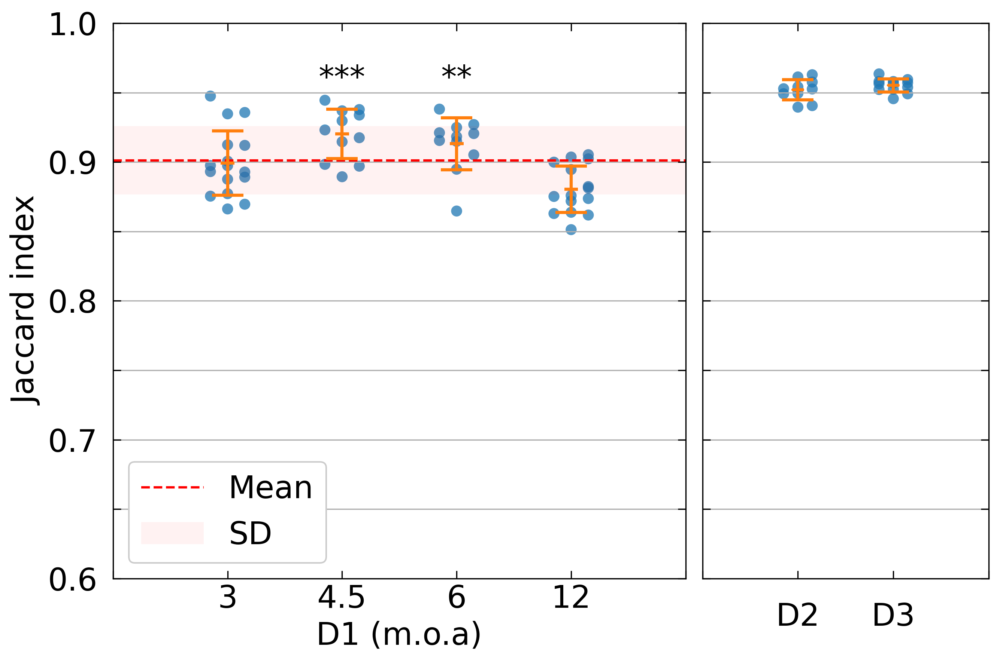

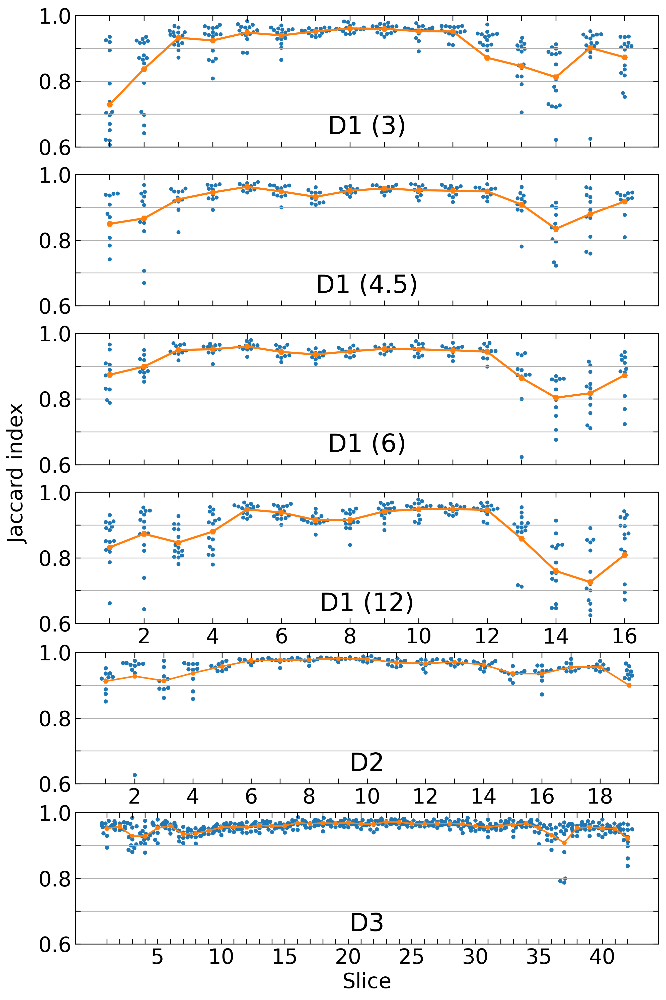

In [12]:
plot_mean_per_subject(jaccard_values_3,jaccard_values_4_5,jaccard_values_6,jaccard_values_12,jaccard_values_d2,jaccard_values_d3,y_under_lim=0.6,stats="full")
plot_combined_mean_per_slice(
    jacc_values_per_slice,jacc_values_mean_per_slice,
    jacc_values_d2_per_slice,jacc_values_d2_mean_per_slice,jacc_values_d3_per_slice,jacc_values_d3_mean_per_slice,y_under_lim=0.6)

## Fig. 2 (c-d): Semi-Auto

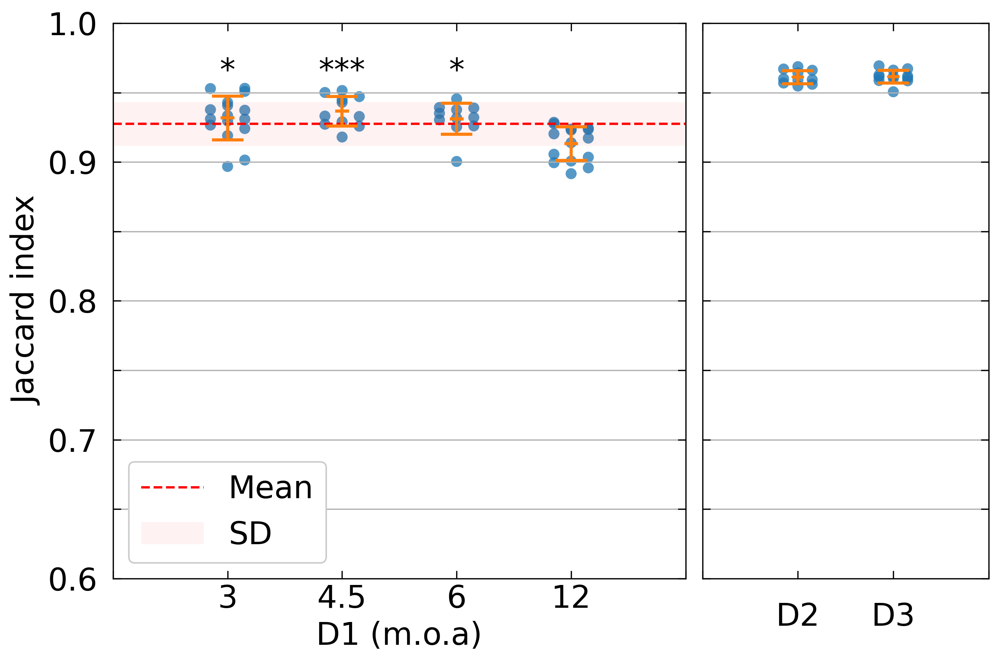

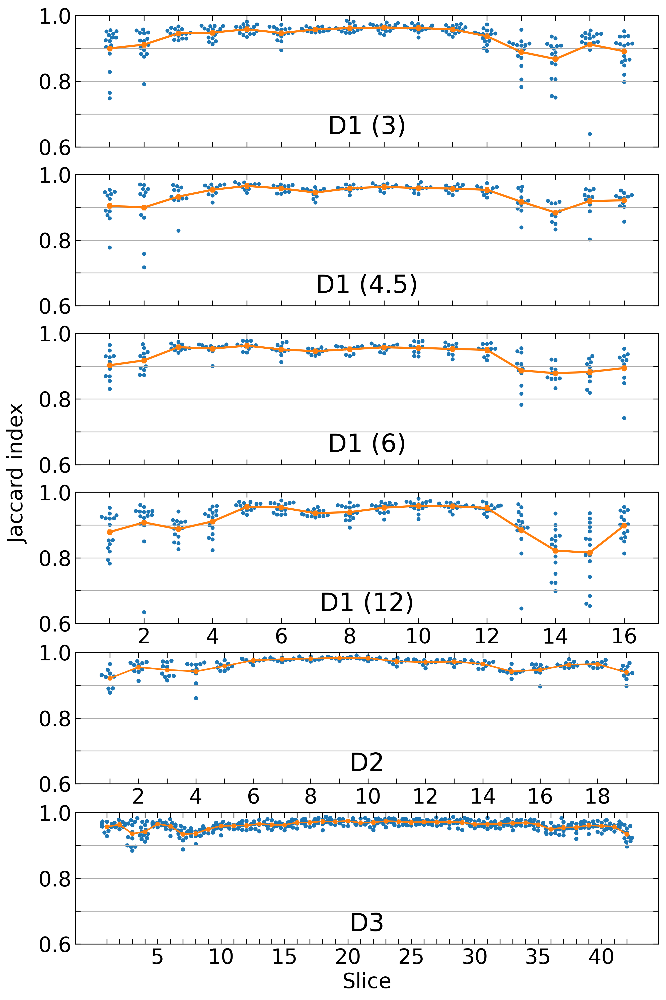

In [13]:
plot_mean_per_subject(jaccard_values_semi_3,jaccard_values_semi_4_5,jaccard_values_semi_6,jaccard_values_semi_12,jaccard_values_semi_d2,jaccard_values_semi_d3,y_under_lim=0.6,stats="semi")
plot_combined_mean_per_slice(
    jacc_values_semi_per_slice,jacc_values_semi_mean_per_slice,
    jacc_values_semi_d2_per_slice,jacc_values_semi_d2_mean_per_slice,jacc_values_semi_d3_per_slice,jacc_values_semi_d3_mean_per_slice,y_under_lim=0.6)

#### Comparison vs Full-Auto

---------------------------------------------------
D1 (3 month) for left panel, all D1 for right panel


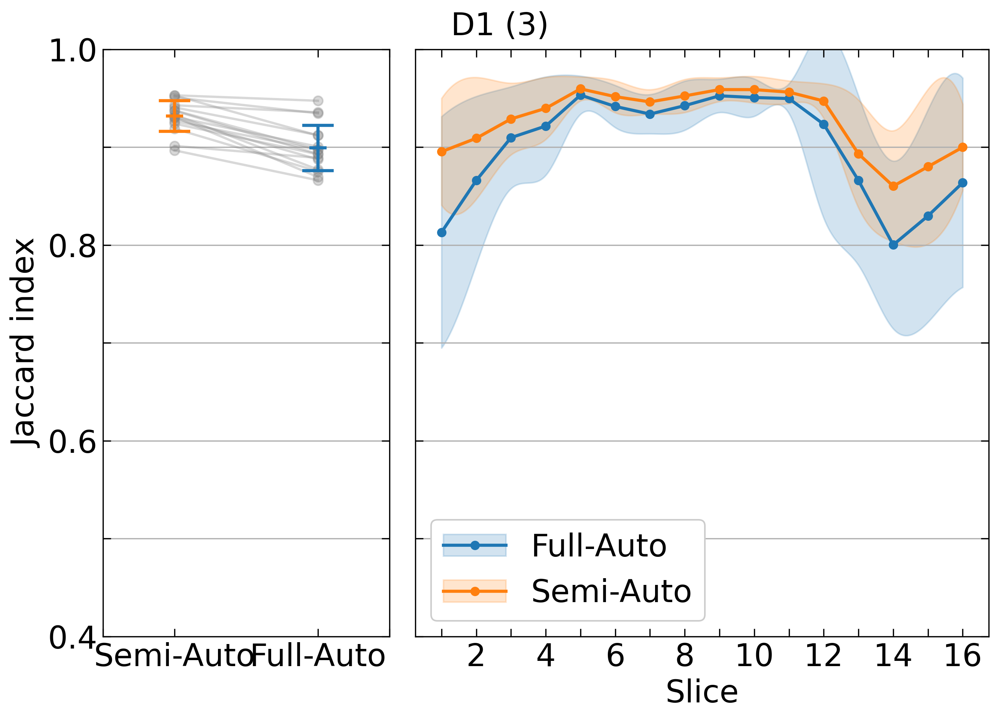

---------------------------------------------------
D2


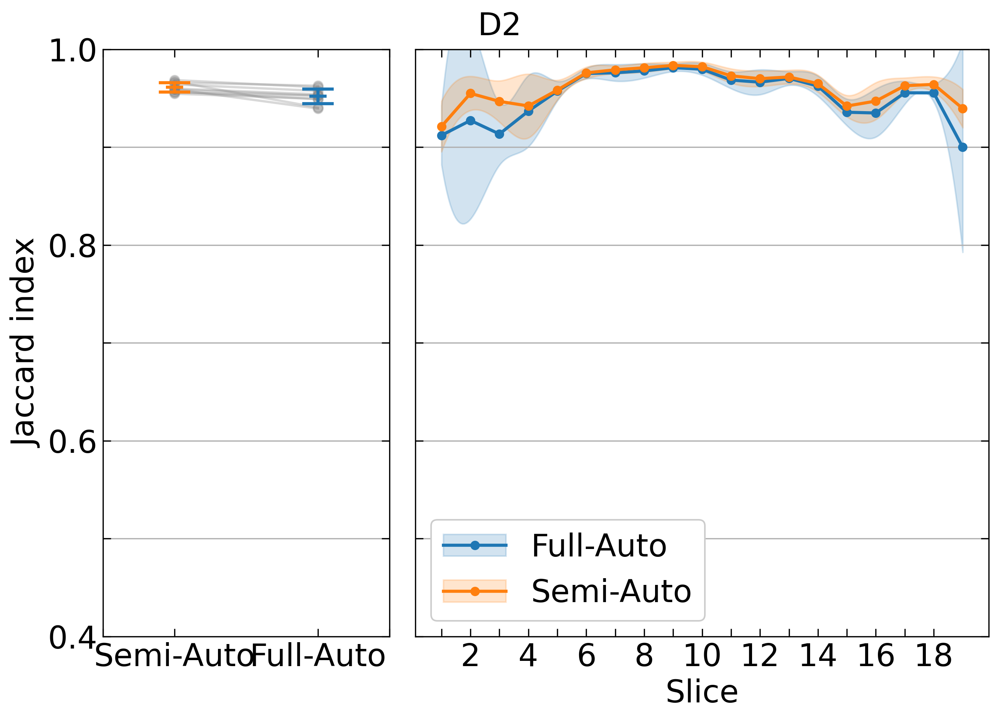

---------------------------------------------------
D3


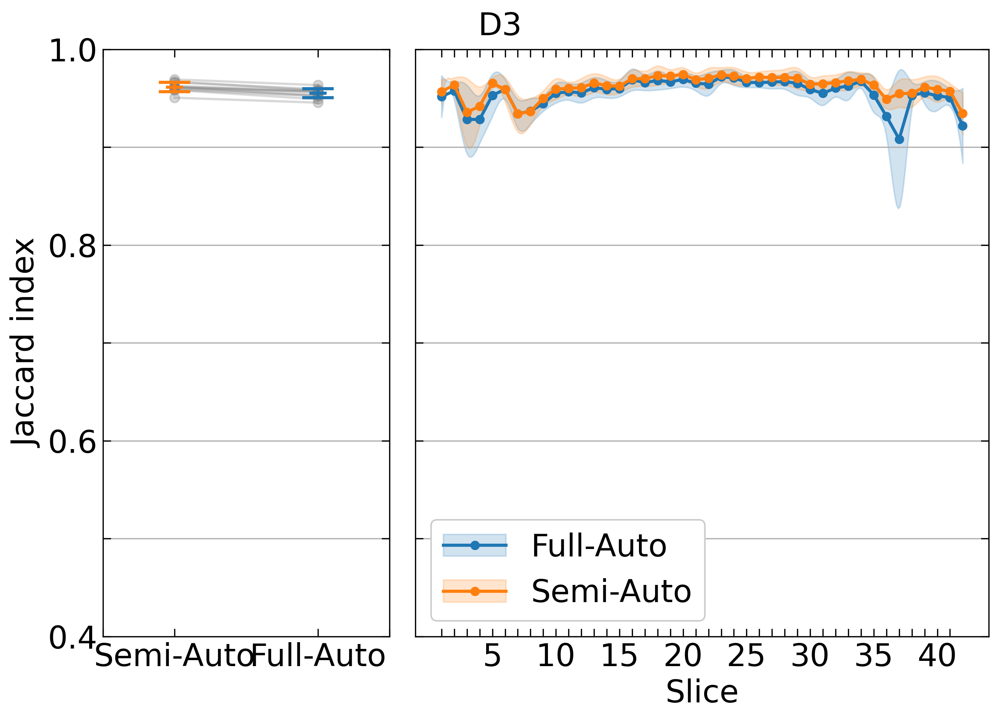

In [14]:
print("---------------------------------------------------")
print("D1 (3 month) for left panel, all D1 for right panel")
samson_vs_another(jaccard_values_semi_3,jaccard_values_3,jacc_values_semi_all_mean_per_slice,jacc_values_semi_all_std_per_slice,jacc_values_full_all_mean_per_slice,jacc_values_full_all_std_per_slice,tool_name="Semi-Auto",samson_label="Full-Auto")

print("---------------------------------------------------")
print("D2")
samson_vs_another(jaccard_values_semi_d2,jaccard_values_d2,jacc_values_semi_d2_mean_per_slice,jacc_values_semi_d2_std_per_slice,jacc_values_full_d2_mean_per_slice,jacc_values_full_d2_std_per_slice,tool_name="Semi-Auto",samson_label="Full-Auto", dataset="D2")

print("---------------------------------------------------")
print("D3")
samson_vs_another(jaccard_values_semi_d3,jaccard_values_d3,jacc_values_semi_d3_mean_per_slice,jacc_values_semi_d3_std_per_slice,jacc_values_full_d3_mean_per_slice,jacc_values_full_d3_std_per_slice,tool_name="Semi-Auto",samson_label="Full-Auto", dataset="D3")


## Fig. 4 (a-b): Box Analysis

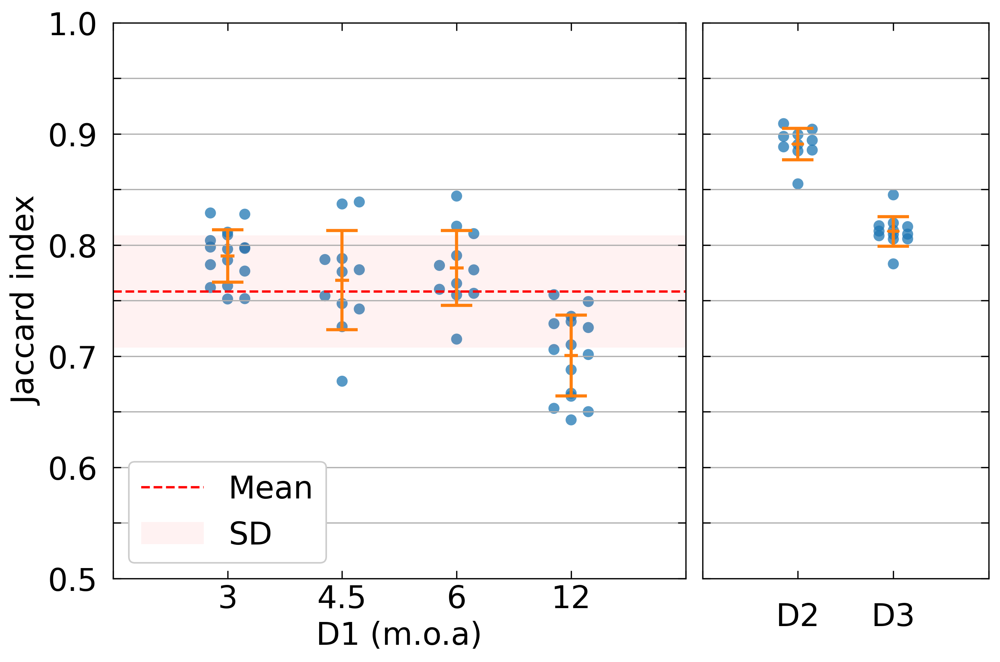

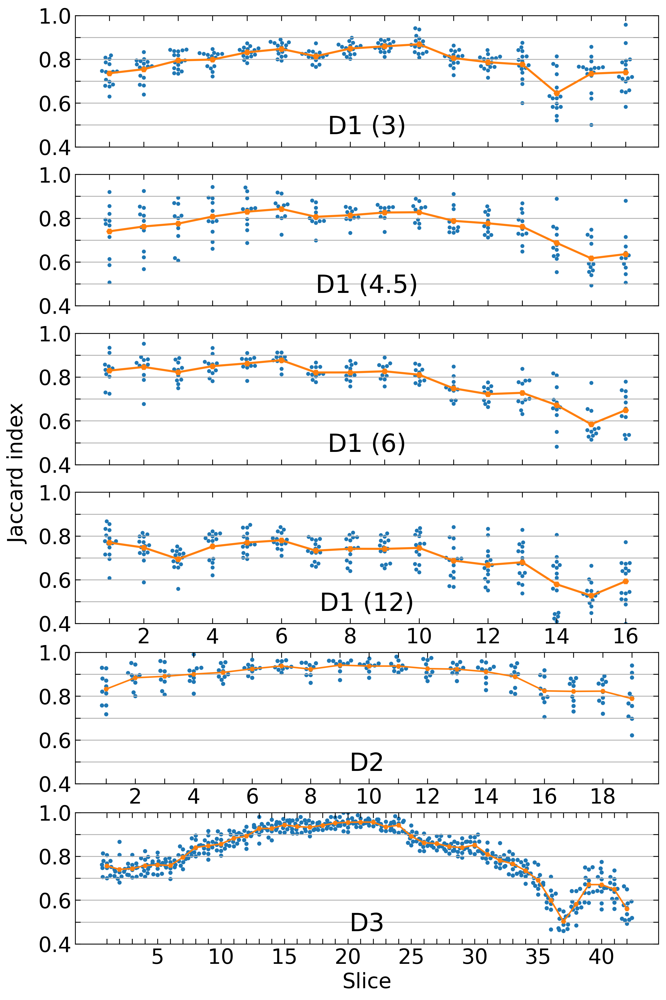

In [15]:
plot_mean_per_subject(jaccard_values_box_3,jaccard_values_box_4_5,jaccard_values_box_6,jaccard_values_box_12,jaccard_values_box_d2,jaccard_values_box_d3,y_under_lim=0.5)
plot_combined_mean_per_slice(
    jacc_values_box_per_slice,jacc_values_box_mean_per_slice,
    jacc_values_box_d2_per_slice,jacc_values_box_d2_mean_per_slice,jacc_values_box_d3_per_slice,jacc_values_box_d3_mean_per_slice,y_under_lim=0.4)

## Fig. 4 (c-e): Oracle Performance

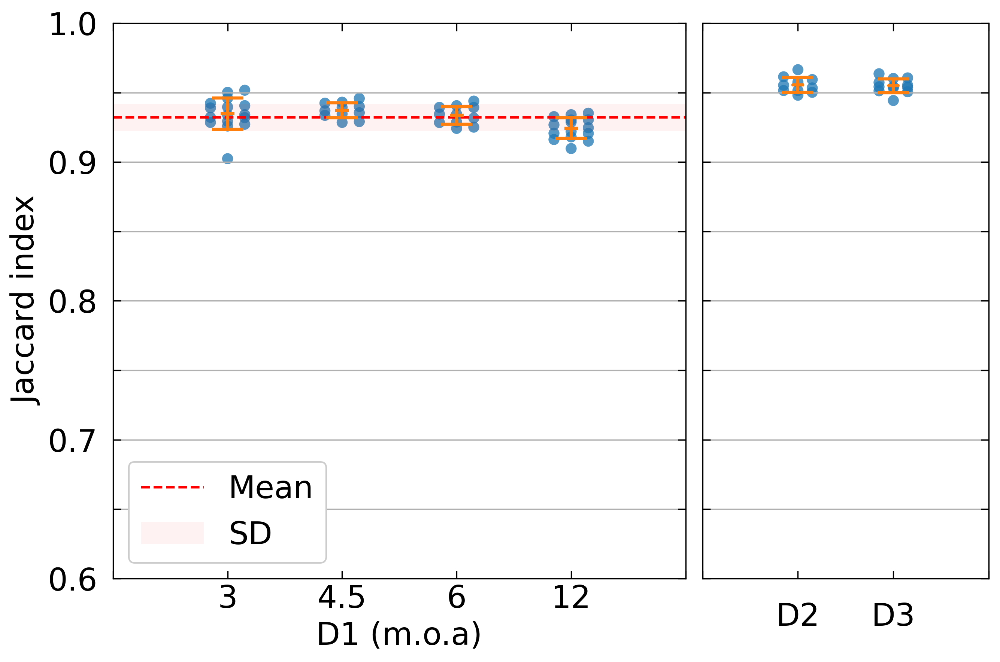

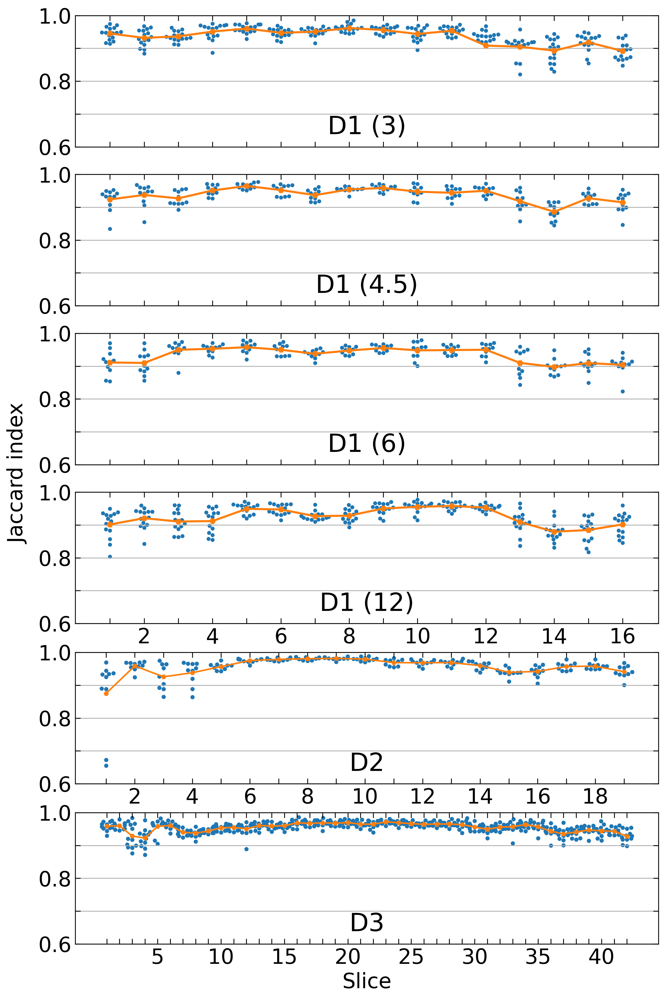

In [16]:
plot_mean_per_subject(jaccard_values_oracle_3,jaccard_values_oracle_4_5,jaccard_values_oracle_6,jaccard_values_oracle_12,jaccard_values_oracle_d2,jaccard_values_oracle_d3,y_under_lim=0.6)
plot_combined_mean_per_slice(
    jacc_values_oracle_per_slice,jacc_values_oracle_mean_per_slice,
    jacc_values_oracle_d2_per_slice,jacc_values_oracle_d2_mean_per_slice,jacc_values_oracle_d3_per_slice,jacc_values_oracle_d3_mean_per_slice,y_under_lim=0.6)

### Comparison vs Full-Auto

---------------------------------------------------
D1 (3 month) for left panel, all D1 for right panel


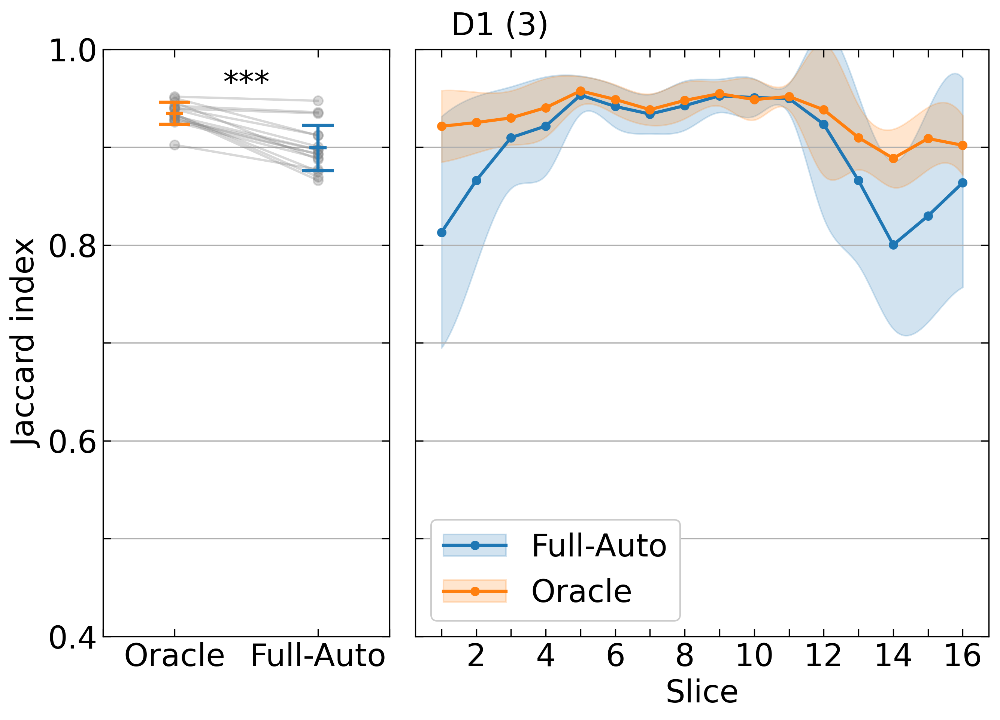

---------------------------------------------------
D2


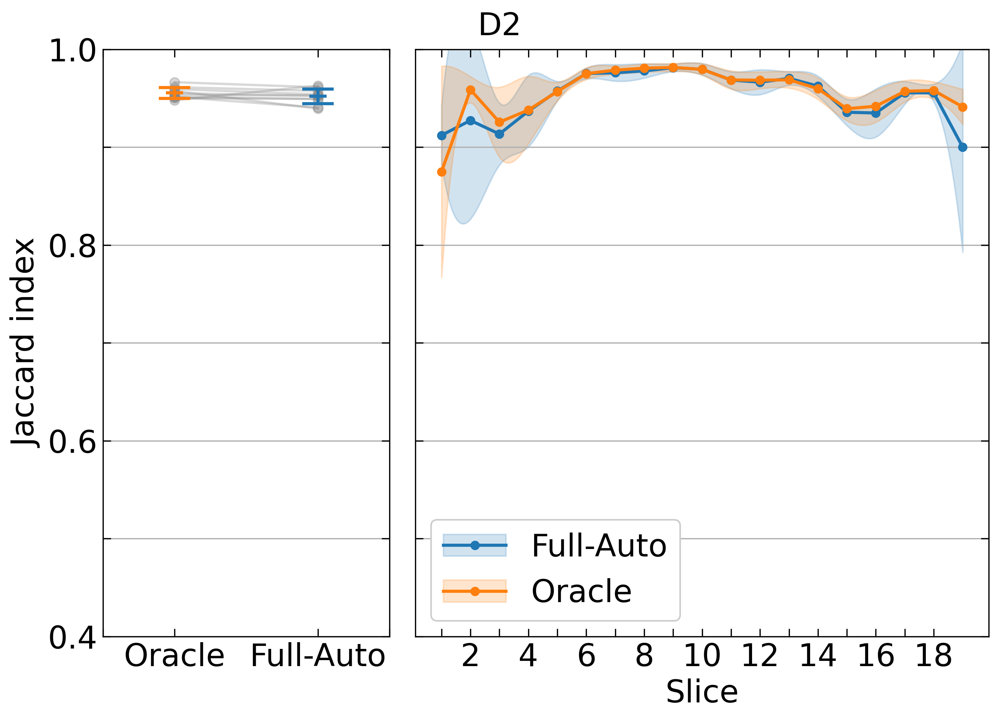

---------------------------------------------------
D3


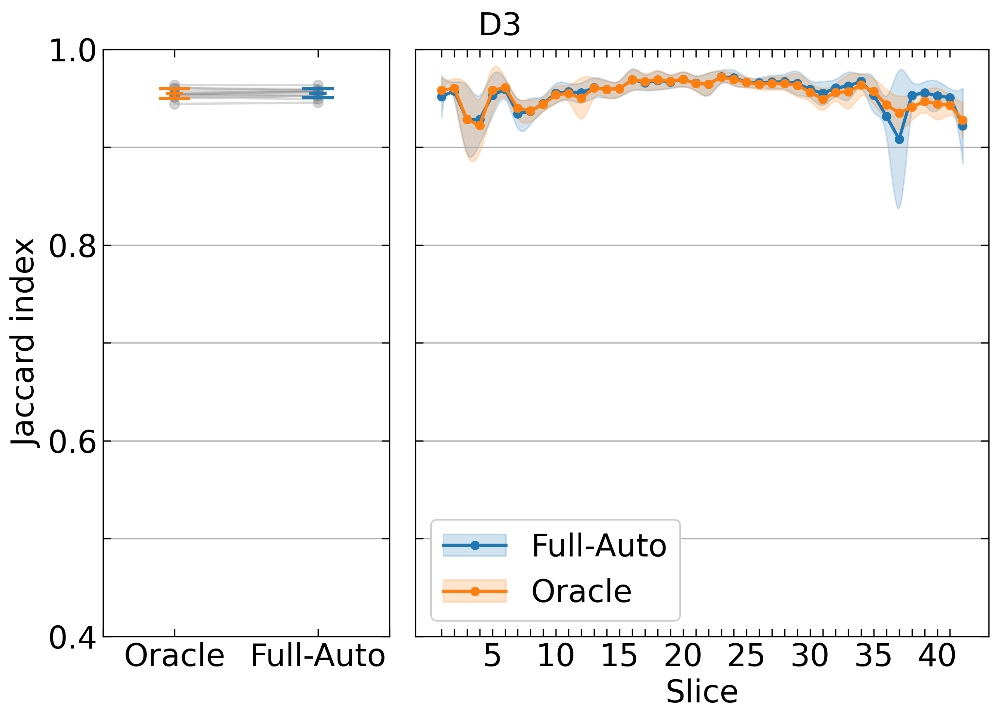

In [17]:
print("---------------------------------------------------")
print("D1 (3 month) for left panel, all D1 for right panel")
samson_vs_another(jaccard_values_oracle_3,jaccard_values_3,jacc_values_oracle_all_mean_per_slice,jacc_values_oracle_all_std_per_slice,jacc_values_full_all_mean_per_slice,jacc_values_full_all_std_per_slice,tool_name="Oracle", samson_label="Full-Auto", stars=True)

print("---------------------------------------------------")
print("D2")
samson_vs_another(jaccard_values_oracle_d2,jaccard_values_d2,jacc_values_oracle_d2_mean_per_slice,jacc_values_oracle_d2_std_per_slice,jacc_values_full_d2_mean_per_slice,jacc_values_full_d2_std_per_slice,tool_name="Oracle", samson_label="Full-Auto", dataset="D2")

print("---------------------------------------------------")
print("D3")
samson_vs_another(jaccard_values_oracle_d3,jaccard_values_d3,jacc_values_oracle_d3_mean_per_slice,jacc_values_oracle_d3_std_per_slice,jacc_values_full_d3_mean_per_slice,jacc_values_full_d3_std_per_slice,tool_name="Oracle", samson_label="Full-Auto", dataset="D3")



### Comparison vs Semi-Auto

---------------------------------------------------
D1 (3 month) for left panel, all D1 for right panel


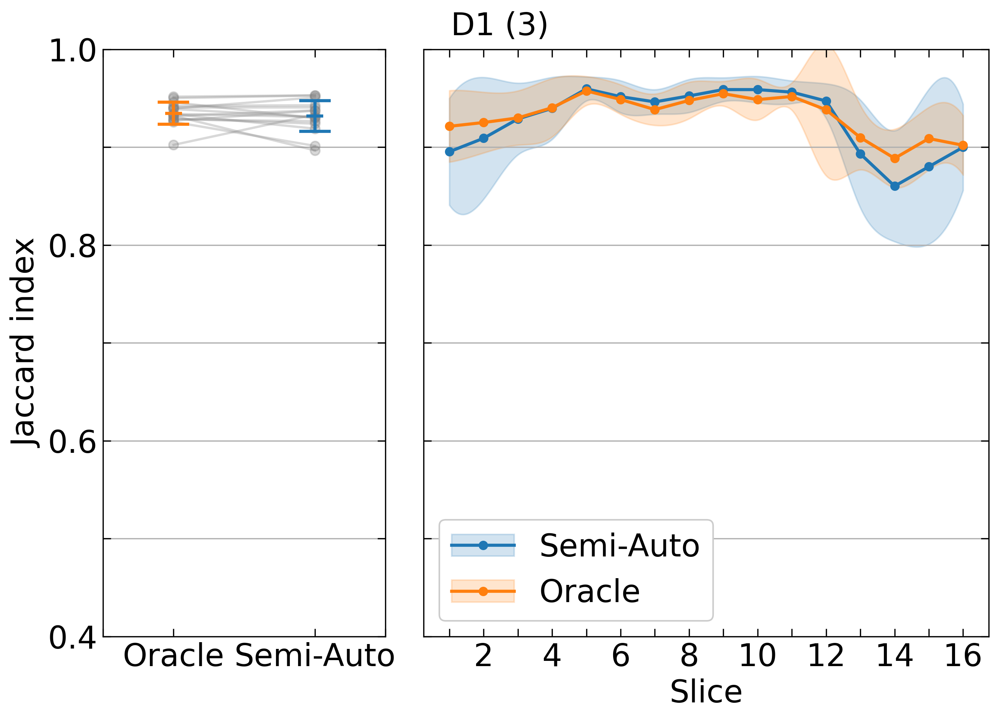

---------------------------------------------------
D2


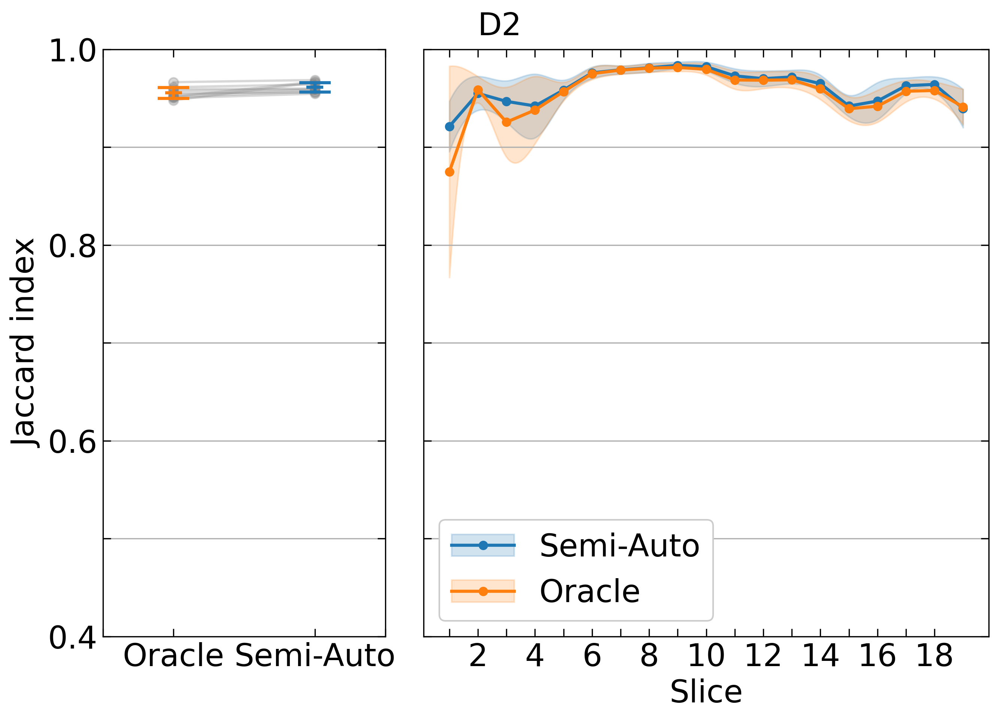

---------------------------------------------------
D3


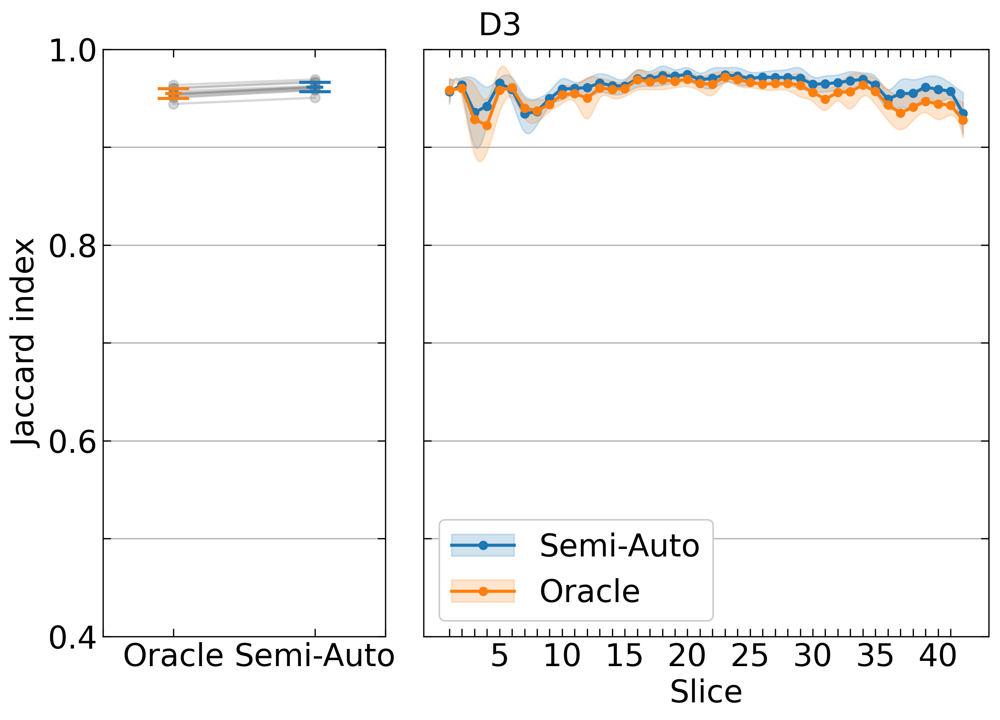

In [18]:
print("---------------------------------------------------")
print("D1 (3 month) for left panel, all D1 for right panel")
samson_vs_another(jaccard_values_oracle_3,jaccard_values_semi_3,jacc_values_oracle_all_mean_per_slice,jacc_values_oracle_all_std_per_slice,jacc_values_semi_all_mean_per_slice,jacc_values_semi_all_std_per_slice,tool_name="Oracle",samson_label="Semi-Auto")

print("---------------------------------------------------")
print("D2")
samson_vs_another(jaccard_values_oracle_d2,jaccard_values_semi_d2,jacc_values_oracle_d2_mean_per_slice,jacc_values_oracle_d2_std_per_slice,jacc_values_semi_d2_mean_per_slice,jacc_values_semi_d2_std_per_slice,tool_name="Oracle",samson_label="Semi-Auto", dataset="D2")

print("---------------------------------------------------")
print("D3")
samson_vs_another(jaccard_values_oracle_d3,jaccard_values_semi_d3,jacc_values_oracle_d3_mean_per_slice,jacc_values_oracle_d3_std_per_slice,jacc_values_semi_d3_mean_per_slice,jacc_values_semi_d3_std_per_slice,tool_name="Oracle",samson_label="Semi-Auto", dataset="D3")


## Fig. 5: Benchmark SAMson Full-Auto vs BET, RBM, BEN, SHERM

---------------------------------------------------
D1 (3 month) for left panel, all D1 for right panel


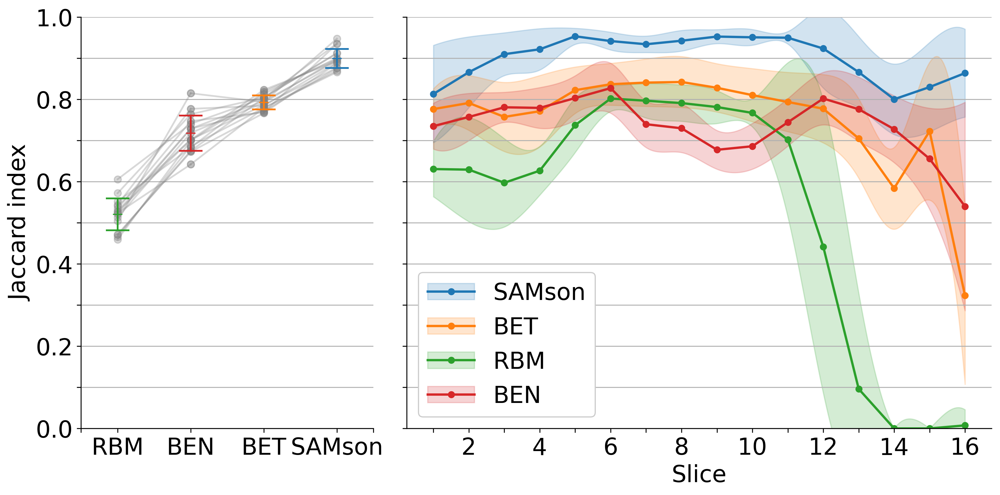

---------------------------------------------------
D2


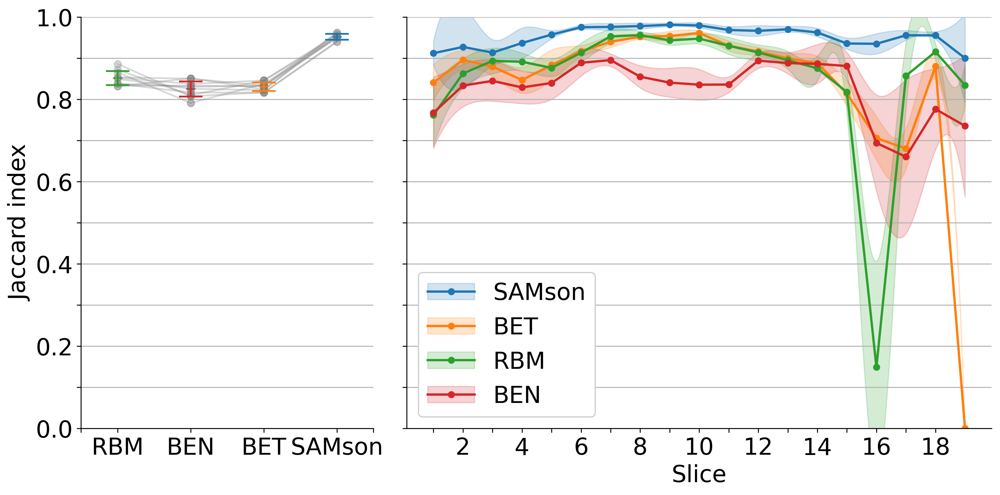

---------------------------------------------------
D3


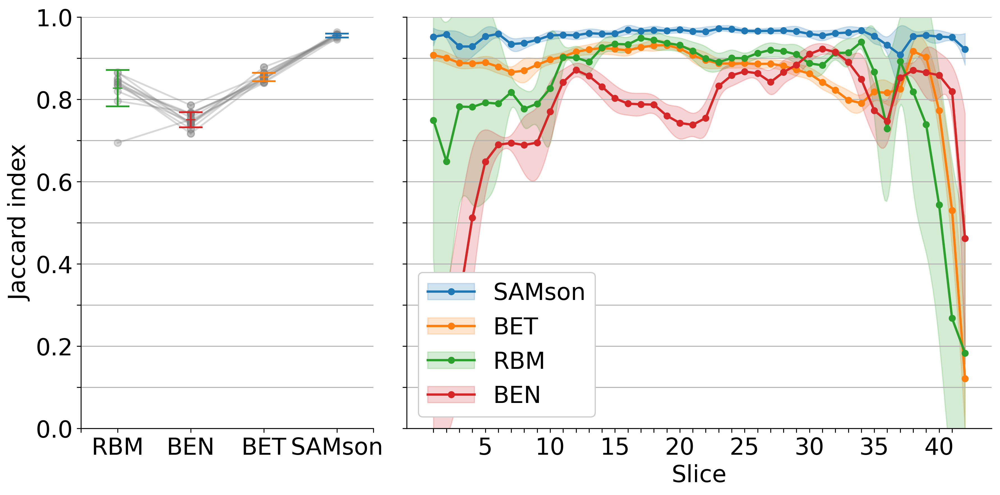

In [19]:
values     = [jaccard_values_3, jacc_values_all_mean_per_slice, jacc_values_all_std_per_slice]
values_bet = [jaccard_values_bet_3, jacc_values_bet_all_mean_per_slice, jacc_values_bet_all_std_per_slice]
values_rbm = [jaccard_values_rbm_3, jacc_values_rbm_all_mean_per_slice, jacc_values_rbm_all_std_per_slice]
values_ben = [jaccard_values_ben_3, jacc_values_ben_all_mean_per_slice, jacc_values_ben_all_std_per_slice]
print("---------------------------------------------------")
print("D1 (3 month) for left panel, all D1 for right panel")
samson_vs_all(values, values_bet, values_rbm, values_ben)

values     = [jaccard_values_d2, jacc_values_d2_mean_per_slice, jacc_values_d2_std_per_slice]
values_bet = [jaccard_values_bet_d2, jacc_values_bet_d2_mean_per_slice, jacc_values_bet_d2_std_per_slice]
values_rbm = [jaccard_values_rbm_d2, jacc_values_rbm_d2_mean_per_slice, jacc_values_rbm_d2_std_per_slice]
values_ben = [jaccard_values_ben_d2, jacc_values_ben_d2_mean_per_slice, jacc_values_ben_d2_std_per_slice]
print("---------------------------------------------------")
print("D2")
samson_vs_all(values, values_bet, values_rbm, values_ben,dataset="D2")

values     = [jaccard_values_d3, jacc_values_d3_mean_per_slice, jacc_values_d3_std_per_slice]
values_bet = [jaccard_values_bet_d3, jacc_values_bet_d3_mean_per_slice, jacc_values_bet_d3_std_per_slice]
values_rbm = [jaccard_values_rbm_d3, jacc_values_rbm_d3_mean_per_slice, jacc_values_rbm_d3_std_per_slice]
values_ben = [jaccard_values_ben_d3, jacc_values_ben_d3_mean_per_slice, jacc_values_ben_d3_std_per_slice]
print("---------------------------------------------------")
print("D3")
samson_vs_all(values, values_bet, values_rbm, values_ben,dataset="D3")

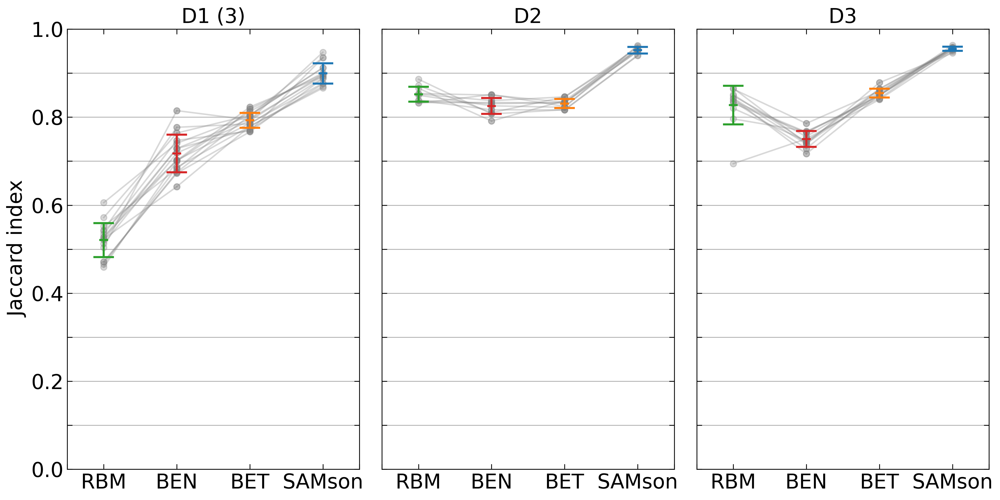

In [20]:
compare_datasets(
    [jaccard_values_3, jaccard_values_bet_3, jaccard_values_rbm_3, jaccard_values_ben_3],
    [jaccard_values_d2, jaccard_values_bet_d2, jaccard_values_rbm_d2, jaccard_values_ben_d2],
    [jaccard_values_d3, jaccard_values_bet_d3, jaccard_values_rbm_d3, jaccard_values_ben_d3]
)

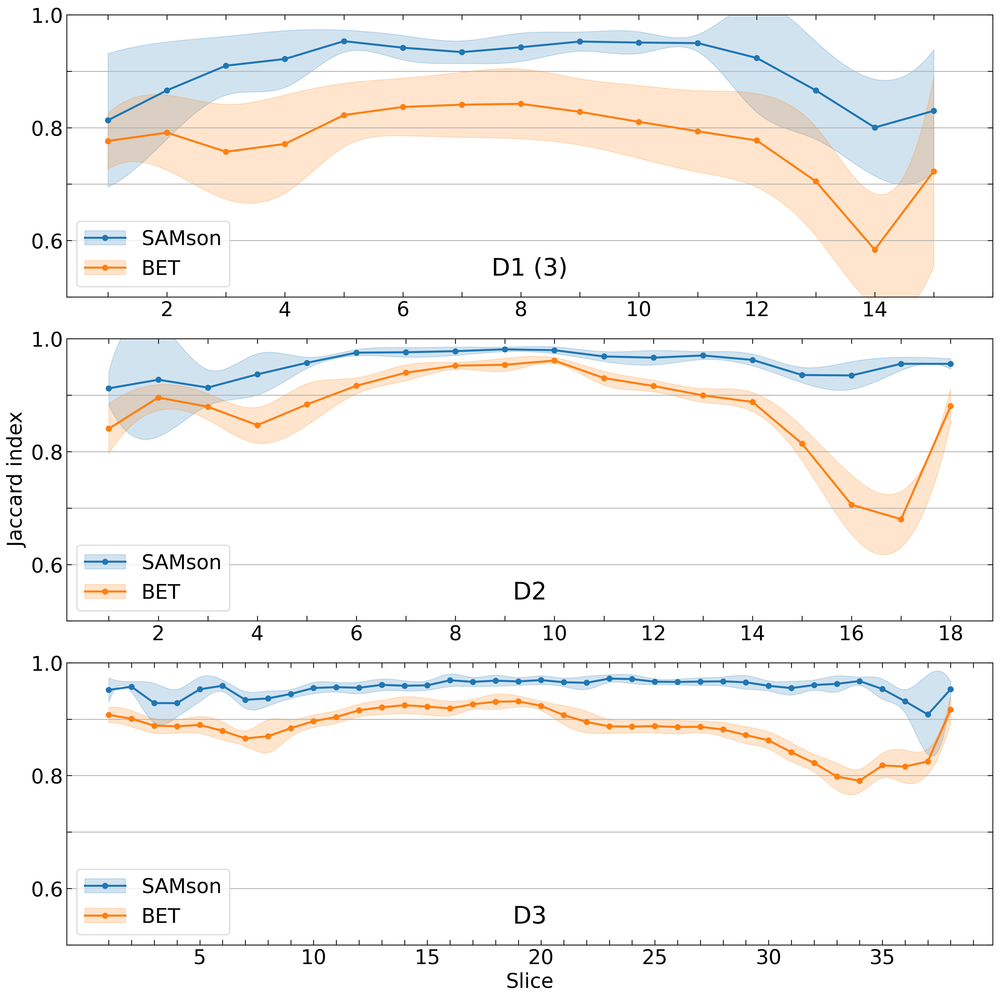

In [21]:
compare_datasets_per_slice(
    [jacc_values_all_mean_per_slice, jacc_values_all_std_per_slice, jacc_values_bet_all_mean_per_slice, jacc_values_bet_all_std_per_slice],
    [jacc_values_d2_mean_per_slice, jacc_values_d2_std_per_slice, jacc_values_bet_d2_mean_per_slice, jacc_values_bet_d2_std_per_slice],
    [jacc_values_d3_mean_per_slice, jacc_values_d3_std_per_slice, jacc_values_bet_d3_mean_per_slice, jacc_values_bet_d3_std_per_slice],
    exclude_final_slices=True)

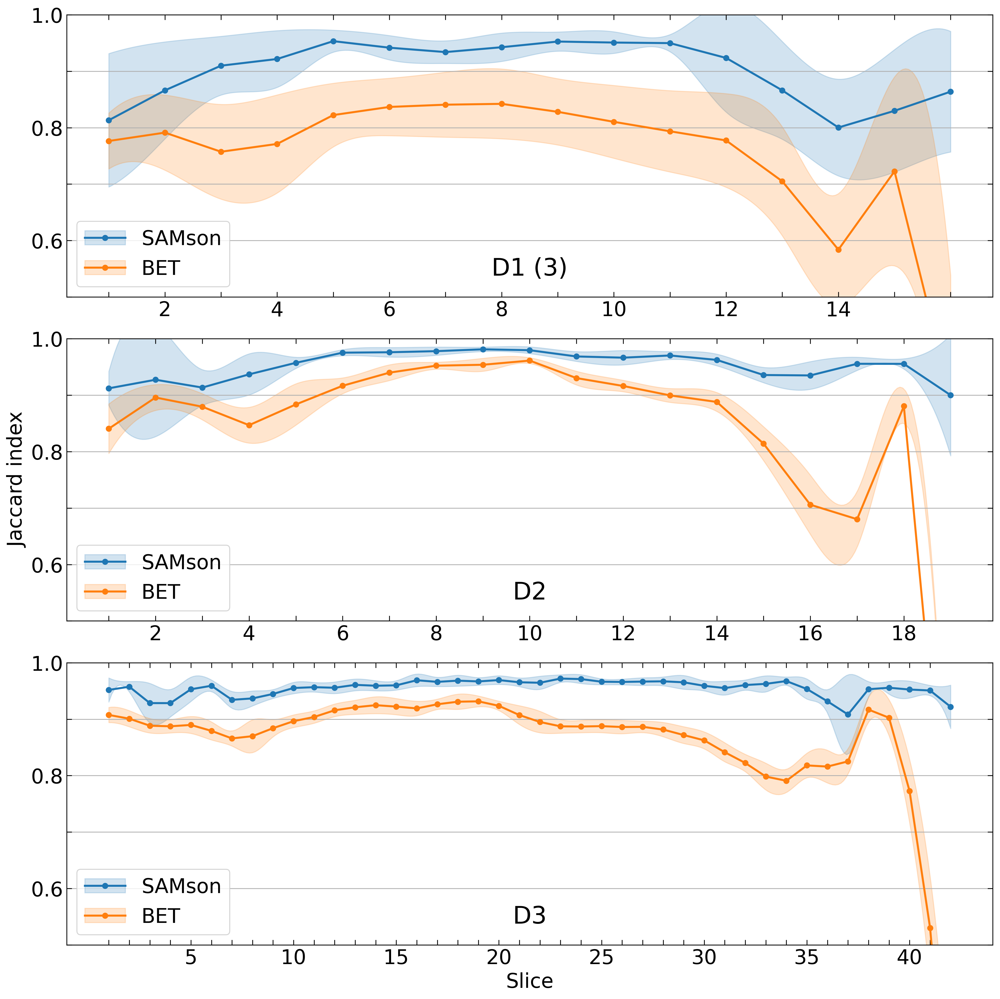

In [22]:
compare_datasets_per_slice(
    [jacc_values_all_mean_per_slice, jacc_values_all_std_per_slice, jacc_values_bet_all_mean_per_slice, jacc_values_bet_all_std_per_slice],
    [jacc_values_d2_mean_per_slice, jacc_values_d2_std_per_slice, jacc_values_bet_d2_mean_per_slice, jacc_values_bet_d2_std_per_slice],
    [jacc_values_d3_mean_per_slice, jacc_values_d3_std_per_slice, jacc_values_bet_d3_mean_per_slice, jacc_values_bet_d3_std_per_slice]
)

## Fig. 6: Compromise

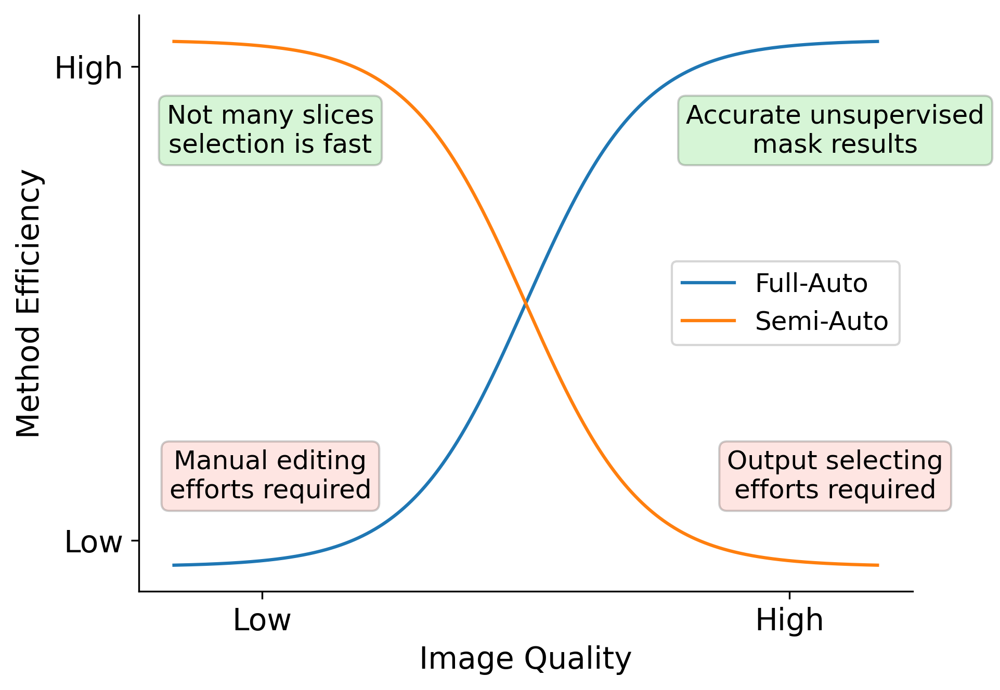

In [23]:
def smooth_heaviside(x, alpha=0.3):
    return 0.5 * (1 + np.tanh(alpha * x))

# Generate x values
x = np.linspace(-10, 10, 1000)

# Generate y values for increasing sinusoidally towards 1
y1 = smooth_heaviside(x)

# Generate y values for decreasing sinusoidally towards 0
y2 = 1 - smooth_heaviside(x)

# Plot the curves
fig,ax=plt.subplots(dpi=300)
textstr1 = '\n'.join((
    'Not many slices',
    'selection is fast'))
textstr2 = '\n'.join((
    'Manual editing',
    'efforts required'))
textstr3 = '\n'.join((
    'Accurate unsupervised',
    'mask results'))
textstr4 = '\n'.join((
    'Output selecting',
    'efforts required'))
ax.plot(x, y1, label='Full-Auto')
ax.plot(x, y2, label='Semi-Auto')
ax.spines[['right', 'top']].set_visible(False)
ax.set_xticks((-7.5,7.5))
ax.set_xticklabels(("Low","High"), fontsize=14)
ax.set_yticks((0.05,0.95))
ax.set_yticklabels(("Low","High"), fontsize=14)
#ax.set_title('Efficiency compromise of the 2 SAMson\'s Auto methods', fontsize=14)
ax.set_xlabel('Image Quality', fontsize=14)
ax.set_ylabel('Method Efficiency', fontsize=14)
props_good = dict(boxstyle='round', facecolor='limegreen', alpha=0.2)
props_bad = dict(boxstyle='round', facecolor='salmon', alpha=0.2)

ax.text(0.17, 0.8, textstr1, transform=ax.transAxes, fontsize=12,
        verticalalignment='center', horizontalalignment="center", bbox=props_good)
ax.text(0.17, 0.2, textstr2, transform=ax.transAxes, fontsize=12,
        verticalalignment='center', horizontalalignment="center", bbox=props_bad)
ax.text(0.9, 0.8, textstr3, transform=ax.transAxes, fontsize=12,
        verticalalignment='center', horizontalalignment="center", bbox=props_good)
ax.text(0.9, 0.2, textstr4, transform=ax.transAxes, fontsize=12,
        verticalalignment='center', horizontalalignment="center", bbox=props_bad)
ax.legend( fontsize=12)
# savepath = !pwd
# fig.savefig(os.path.join(savepath,"compromise.png"), bbox_inches='tight', format='svg')
plt.show()


# 2. Statistical Analyses

## Full-Auto vs Semi-Auto t-test

In [24]:
def t_test(values_1,values_2):
    # Perform a two-tailed t-test
    t_stat, p_value = ttest_ind(values_1,values_2, equal_var=False)
    
    # Print results
    print("Group 1 mean value:", np.mean(values_1))
    print("Group 2 mean value:", np.mean(values_2))
    print("t-statistic:", t_stat)
    print("Two-tailed P-value:", p_value)
    n1 = len(values_1)
    n2 = len(values_2)
    df = n1 + n2 - 2
    
    print(f"Degrees of Freedom: {df}")
    # Interpretation
    if p_value < 0.05:
        print("There is a significant difference between Full-Auto's and Semi-Auto's means (p < 0.05).")
    else:
        print("There is no significant difference between Full-Auto's and Semi-Auto's means (p >= 0.05).")
    return

    
print("----------------------------\nD1")
t_test(jaccard_values_semi_all,jaccard_values_all)

print("----------------------------\nD2")
t_test(jaccard_values_semi_d2,jaccard_values_d2)

print("----------------------------\nD3")
t_test(jaccard_values_semi_d3,jaccard_values_d3)

----------------------------
D1
Group 1 mean value: 0.9274
Group 2 mean value: 0.9011716981132075
t-statistic: 6.461549433558921
Two-tailed P-value: 5.469115877725776e-09
Degrees of Freedom: 104
There is a significant difference between Full-Auto's and Semi-Auto's means (p < 0.05).
----------------------------
D2
Group 1 mean value: 0.96118
Group 2 mean value: 0.9520099999999999
t-statistic: 3.1486093395346324
Two-tailed P-value: 0.0064986595783394245
Degrees of Freedom: 18
There is a significant difference between Full-Auto's and Semi-Auto's means (p < 0.05).
----------------------------
D3
Group 1 mean value: 0.9615416666666667
Group 2 mean value: 0.9551916666666666
t-statistic: 3.2197711495878147
Two-tailed P-value: 0.003943979461153749
Degrees of Freedom: 22
There is a significant difference between Full-Auto's and Semi-Auto's means (p < 0.05).


## Object detector accuracy

In [25]:
# Perform a two-tailed t-test
t_test(jaccard_values_box_d2, jaccard_values_box_d3)


Group 1 mean value: 0.8909499999999999
Group 2 mean value: 0.8122583333333332
t-statistic: 12.657523787831762
Two-tailed P-value: 1.222934182635667e-10
Degrees of Freedom: 20
There is a significant difference between Full-Auto's and Semi-Auto's means (p < 0.05).


In [26]:
# Perform a two-tailed t-test
t_test(jaccard_values_d2,jaccard_values_d3)


Group 1 mean value: 0.9520099999999999
Group 2 mean value: 0.9551916666666666
t-statistic: -1.126242354842424
Two-tailed P-value: 0.27831660319650997
Degrees of Freedom: 20
There is no significant difference between Full-Auto's and Semi-Auto's means (p >= 0.05).


In [27]:
def correlation_boxes_masks(values_box_1,values_1,values_box_2,values_2,label_1,label_2):
    
# Calculate Pearson correlation and p-value for D3's values
    x_1 = values_box_1
    y_1 = values_1
    
    correlation_1, p_value_1 = pearsonr(x_1, y_1)
    print(f"{label_1}'s Pearson Correlation Coefficient:", correlation_1)
    print(f"{label_1}'s P-value:", p_value_1)
    
    # Calculate Pearson correlation and p-value for D2 values
    x_2 = values_box_2
    y_2 = values_2
    
    correlation_2, p_value_2 = pearsonr(x_2, y_2)
    print(f"{label_2}'s Pearson Correlation Coefficient:", correlation_2)
    print(f"{label_2}'s P-value:", p_value_2)
    
    # Fisher z-transformation
    def fisher_z(r):
        """Convert Pearson correlation coefficient to Fisher z-score."""
        return 0.5 * np.log((1 + r) / (1 - r))
    
    # Fisher z-scores
    z_1 = fisher_z(correlation_1)
    z_2 = fisher_z(correlation_2)
    
    # Sample sizes
    n_1 = len(x_1)    # Number of data points for group 1
    n_2 = len(x_2)    # Number of data points for group 2
    
    # Standard error of the difference
    se_diff = np.sqrt(1 / (n_1 - 3) + 1 / (n_2 - 3))
    
    # z-score for the difference
    z_diff = (z_2 - z_1) / se_diff
    
    # Two-tailed p-value for the z-score
    p_value_diff = 2 * (1 - norm.cdf(abs(z_diff)))
    
    print("Fisher z for D3:", z_1)
    print("Fisher z for D1:", z_2)
    print("z-score of the difference:", z_diff)
    print("P-value for the difference:", p_value_diff)
    
    # Interpretation
    if p_value_diff < 0.05:
        print("The two correlations are significantly different (p < 0.05).")
    else:
        print("The two correlations are not significantly different (p >= 0.05).")
    return

correlation_boxes_masks(jacc_values_box_d3,jacc_values_d3,jacc_values_box_3,jacc_values_3,"D3","D1(3)")


D3's Pearson Correlation Coefficient: 0.4256971336996121
D3's P-value: 1.3295187360304447e-23
D1(3)'s Pearson Correlation Coefficient: 0.562597542648532
D1(3)'s P-value: 9.032527969498108e-23
Fisher z for D3: 0.45462964545132256
Fisher z for D1: 0.6366255403213694
z-score of the difference: 2.3596904922456323
P-value for the difference: 0.018290187768505106
The two correlations are significantly different (p < 0.05).


In [29]:
correlation_boxes_masks(jacc_values_box_d3,jacc_values_d3,jacc_values_box_d2,jacc_values_d2,"D3","D2")


D3's Pearson Correlation Coefficient: 0.4256971336996121
D3's P-value: 1.3295187360304447e-23
D2's Pearson Correlation Coefficient: 0.42116039309659414
D2's P-value: 1.4412356715340402e-09
Fisher z for D3: 0.45462964545132256
Fisher z for D1: 0.44910178668270256
z-score of the difference: -0.06450633769254215
P-value for the difference: 0.9485670608749792
The two correlations are not significantly different (p >= 0.05).


In [30]:
correlation_boxes_masks(jacc_values_box_d2,jacc_values_d2,jacc_values_box_3,jacc_values_3,"D2","D1(3)")


D2's Pearson Correlation Coefficient: 0.42116039309659414
D2's P-value: 1.4412356715340402e-09
D1(3)'s Pearson Correlation Coefficient: 0.562597542648532
D1(3)'s P-value: 9.032527969498108e-23
Fisher z for D3: 0.44910178668270256
Fisher z for D1: 0.6366255403213694
z-score of the difference: 1.944513726659837
P-value for the difference: 0.051833531755425266
The two correlations are not significantly different (p >= 0.05).


In [31]:
x = jacc_values_box_4_5
y = jacc_values_4_5

# Calculate Pearson correlation and p-value
correlation, p_value = pearsonr(x, y)

print("Pearson Correlation Coefficient:", correlation)
print("P-value:", p_value)

Pearson Correlation Coefficient: 0.5741375872327014
P-value: 8.059105018810815e-17


In [32]:
x = jacc_values_box_6
y = jacc_values_6

# Calculate Pearson correlation and p-value
correlation, p_value = pearsonr(x, y)

print("Pearson Correlation Coefficient:", correlation)
print("P-value:", p_value)

Pearson Correlation Coefficient: 0.6370825464467729
P-value: 1.9986126842159623e-21


In [33]:
x = jacc_values_box_12
y = jacc_values_12

# Calculate Pearson correlation and p-value
correlation, p_value = pearsonr(x, y)

print("Pearson Correlation Coefficient:", correlation)
print("P-value:", p_value)

Pearson Correlation Coefficient: 0.5915373502693219
P-value: 4.800058860355049e-24


## ANOVA 12 months vs the rest

### Full-Auto

In [34]:

group_3_months   = jaccard_values_3    # Data for 3 months
group_4_5_months = jaccard_values_4_5  # Data for 4.5 months
group_6_months   = jaccard_values_6    # Data for 6 months
group_12_months  = jaccard_values_12   # Data for 12 months

# Perform one-way ANOVA
f_stat, p_value = f_oneway(group_3_months, group_4_5_months, group_6_months, group_12_months)

print("ANOVA Results:")
print(f"F-statistic: {f_stat}")
print(f"P-value: {p_value}")

# If ANOVA is significant (p < 0.05), perform post-hoc test
if p_value < 0.05:
    # Combine all data and labels for Tukey's HSD
    all_data = np.concatenate([group_3_months, group_4_5_months, group_6_months, group_12_months])
    labels = (['3 months'] * len(group_3_months) +
              ['4.5 months'] * len(group_4_5_months) +
              ['6 months'] * len(group_6_months) +
              ['12 months'] * len(group_12_months))

    # Perform Tukey's HSD test
    tukey_result = pairwise_tukeyhsd(all_data, labels, alpha=0.05)
    print("\nTukey's HSD Results:")
    print(tukey_result)

    # Check if 12 months is significantly different
    print("\nComparisons involving the 12-month group:")
    for comparison in tukey_result.summary().data:
        if '12 months' in comparison[0] or '12 months' in comparison[1]:
            print(comparison)
else:
    print("No significant differences found among groups.")

# Calculate number of groups (g) and total number of samples (N)
g = 4  # Number of groups
n_samples_per_group = [len(group_3_months), len(group_4_5_months), len(group_6_months), len(group_12_months)]
N = sum(n_samples_per_group)  # Total number of observations

# Calculate degrees of freedom
df_between = g - 1
df_within = N - g
df_total = N - 1

print("\nDegrees of Freedom:")
print(f"df_between: {df_between}")
print(f"df_within: {df_within}")
print(f"df_total: {df_total}")


ANOVA Results:
F-statistic: 9.859991758974905
P-value: 3.3852500541422005e-05

Tukey's HSD Results:
    Multiple Comparison of Means - Tukey HSD, FWER=0.05    
  group1     group2   meandiff p-adj   lower  upper  reject
-----------------------------------------------------------
 12 months   3 months   0.0189 0.0575 -0.0004 0.0383  False
 12 months 4.5 months   0.0399 0.0001  0.0185 0.0612   True
 12 months   6 months   0.0328 0.0009  0.0114 0.0542   True
  3 months 4.5 months   0.0209 0.0523 -0.0002  0.042  False
  3 months   6 months   0.0139 0.3093 -0.0072  0.035  False
4.5 months   6 months  -0.0071 0.8461   -0.03 0.0159  False
-----------------------------------------------------------

Comparisons involving the 12-month group:
[np.str_('12 months'), np.str_('3 months'), np.float64(0.0189), np.float64(0.0575), np.float64(-0.0004), np.float64(0.0383), np.False_]
[np.str_('12 months'), np.str_('4.5 months'), np.float64(0.0399), np.float64(0.0001), np.float64(0.0185), np.float64(0.06

In [35]:

# Perform one-way ANOVA to compare all groups
f_stat, p_value_anova = f_oneway(group_3_months, group_4_5_months, group_6_months, group_12_months)

print("ANOVA Results:")
print(f"F-statistic: {f_stat}")
print(f"P-value: {p_value_anova}")

# If ANOVA is significant (p < 0.05), perform pairwise t-tests and adjust p-values
if p_value_anova < 0.05:
    # Combine all data and labels for pairwise comparisons
    groups = {
        '3 Months': group_3_months,
        '4.5 Months': group_4_5_months,
        '6 Months': group_6_months,
        '12 Months': group_12_months
    }

    comparisons = []
    p_values = []

    # Perform pairwise t-tests
    for group1, data1 in groups.items():
        for group2, data2 in groups.items():
            if group1 != group2:
                t_stat, p_val = ttest_ind(data1, data2, equal_var=False)
                comparisons.append(f"{group1} vs {group2}")
                p_values.append(p_val)

    # Adjust p-values using the Bonferroni or Holm method
    p_adj_bonferroni = multipletests(p_values, method='bonferroni')[1]
    p_adj_holm = multipletests(p_values, method='holm')[1]

    # Print only the p-adj values for comparisons involving the 12 months group
    print("\nPairwise t-test results with Bonferroni adjusted p-values (12 Months involved):")
    for i, (comparison, p_adj) in enumerate(zip(comparisons, p_adj_bonferroni)):
        if '12' in comparison[:3]:  # Check if the 12 Months group is involved in the comparison
            formatted_p_adj = "{:.2e}".format(p_adj)  # Format p-value in scientific notation
            print(f"{comparison}: p-adj = {formatted_p_adj}")

    print("\nPairwise t-test results with Holm adjusted p-values (12 Months involved):")
    for i, (comparison, p_adj) in enumerate(zip(comparisons, p_adj_holm)):
        if '12' in comparison[:3]:  # Check if the 12 Months group is involved in the comparison
            formatted_p_adj = "{:.2e}".format(p_adj)  # Format p-value in scientific notation
            print(f"{comparison}: p-adj = {formatted_p_adj}")

else:
    print("No significant differences found among groups.")


ANOVA Results:
F-statistic: 9.859991758974905
P-value: 3.3852500541422005e-05

Pairwise t-test results with Bonferroni adjusted p-values (12 Months involved):
12 Months vs 3 Months: p-adj = 2.07e-01
12 Months vs 4.5 Months: p-adj = 2.04e-04
12 Months vs 6 Months: p-adj = 3.11e-03

Pairwise t-test results with Holm adjusted p-values (12 Months involved):
12 Months vs 3 Months: p-adj = 1.38e-01
12 Months vs 4.5 Months: p-adj = 2.04e-04
12 Months vs 6 Months: p-adj = 2.59e-03


### Semi-Auto

In [36]:

group_3_months   = jaccard_values_semi_3    # Data for 3 months
group_4_5_months = jaccard_values_semi_4_5  # Data for 4.5 months
group_6_months   = jaccard_values_semi_6    # Data for 6 months
group_12_months  = jaccard_values_semi_12   # Data for 12 months

# Perform one-way ANOVA
f_stat, p_value = f_oneway(group_3_months, group_4_5_months, group_6_months, group_12_months)

print("ANOVA Results:")
print(f"F-statistic: {f_stat}")
print(f"P-value: {p_value}")

# If ANOVA is significant (p < 0.05), perform post-hoc test
if p_value < 0.05:
    # Combine all data and labels for Tukey's HSD
    all_data = np.concatenate([group_3_months, group_4_5_months, group_6_months, group_12_months])
    labels = (['3 months'] * len(group_3_months) +
              ['4.5 months'] * len(group_4_5_months) +
              ['6 months'] * len(group_6_months) +
              ['12 months'] * len(group_12_months))

    # Perform Tukey's HSD test
    tukey_result = pairwise_tukeyhsd(all_data, labels, alpha=0.05)
    print("\nTukey's HSD Results:")
    print(tukey_result)

    # Check if 12 months is significantly different
    print("\nComparisons involving the 12-month group:")
    for comparison in tukey_result.summary().data:
        if '12 months' in comparison[0] or '12 months' in comparison[1]:
            print(comparison)
else:
    print("No significant differences found among groups.")

# Calculate number of groups (g) and total number of samples (N)
g = 4  # Number of groups
n_samples_per_group = [len(group_3_months), len(group_4_5_months), len(group_6_months), len(group_12_months)]
N = sum(n_samples_per_group)  # Total number of observations
# Calculate degrees of freedom
df_between = g - 1
df_within = N - g
df_total = N - 1

print("Degrees of Freedom:")
print(f"df_between: {df_between}")
print(f"df_within: {df_within}")
print(f"df_total: {df_total}")


ANOVA Results:
F-statistic: 8.132582128044236
P-value: 0.0001703005511691693

Tukey's HSD Results:
    Multiple Comparison of Means - Tukey HSD, FWER=0.05    
  group1     group2   meandiff p-adj   lower  upper  reject
-----------------------------------------------------------
 12 months   3 months   0.0185 0.0019  0.0057 0.0313   True
 12 months 4.5 months   0.0233 0.0004  0.0092 0.0375   True
 12 months   6 months   0.0179  0.008  0.0037  0.032   True
  3 months 4.5 months   0.0048 0.7953 -0.0091 0.0188  False
  3 months   6 months  -0.0006 0.9994 -0.0146 0.0133  False
4.5 months   6 months  -0.0055 0.7759 -0.0207 0.0098  False
-----------------------------------------------------------

Comparisons involving the 12-month group:
[np.str_('12 months'), np.str_('3 months'), np.float64(0.0185), np.float64(0.0019), np.float64(0.0057), np.float64(0.0313), np.True_]
[np.str_('12 months'), np.str_('4.5 months'), np.float64(0.0233), np.float64(0.0004), np.float64(0.0092), np.float64(0.0375)

In [37]:
import numpy as np
from scipy.stats import f_oneway, ttest_ind
from statsmodels.stats.multitest import multipletests

# Perform one-way ANOVA to compare all groups
f_stat, p_value_anova = f_oneway(group_3_months, group_4_5_months, group_6_months, group_12_months)

print("ANOVA Results:")
print(f"F-statistic: {f_stat}")
print(f"P-value: {p_value_anova}")

# If ANOVA is significant (p < 0.05), perform pairwise t-tests and adjust p-values
if p_value_anova < 0.05:
    # Combine all data and labels for pairwise comparisons
    groups = {
        '3 Months': group_3_months,
        '4.5 Months': group_4_5_months,
        '6 Months': group_6_months,
        '12 Months': group_12_months
    }

    comparisons = []
    p_values = []

    # Perform pairwise t-tests
    for group1, data1 in groups.items():
        for group2, data2 in groups.items():
            if group1 != group2:
                t_stat, p_val = ttest_ind(data1, data2, equal_var=False)
                comparisons.append(f"{group1} vs {group2}")
                p_values.append(p_val)

    # Adjust p-values using the Bonferroni or Holm method
    p_adj_bonferroni = multipletests(p_values, method='bonferroni')[1]
    p_adj_holm = multipletests(p_values, method='holm')[1]

    # Print only the p-adj values for comparisons involving the 12 months group
    print("\nPairwise t-test results with Bonferroni adjusted p-values (12 Months involved):")
    for i, (comparison, p_adj) in enumerate(zip(comparisons, p_adj_bonferroni)):
        if '12' in comparison[:3]:  # Check if the 12 Months group is involved in the comparison
            formatted_p_adj = "{:.2e}".format(p_adj)  # Format p-value in scientific notation
            print(f"{comparison}: p-adj = {formatted_p_adj}")

    print("\nPairwise t-test results with Holm adjusted p-values (12 Months involved):")
    for i, (comparison, p_adj) in enumerate(zip(comparisons, p_adj_holm)):
        if '12' in comparison[:3]:  # Check if the 12 Months group is involved in the comparison
            formatted_p_adj = "{:.2e}".format(p_adj)  # Format p-value in scientific notation
            print(f"{comparison}: p-adj = {formatted_p_adj}")

else:
    print("No significant differences found among groups.")


ANOVA Results:
F-statistic: 8.132582128044236
P-value: 0.0001703005511691693

Pairwise t-test results with Bonferroni adjusted p-values (12 Months involved):
12 Months vs 3 Months: p-adj = 1.59e-02
12 Months vs 4.5 Months: p-adj = 5.98e-04
12 Months vs 6 Months: p-adj = 1.44e-02

Pairwise t-test results with Holm adjusted p-values (12 Months involved):
12 Months vs 3 Months: p-adj = 1.20e-02
12 Months vs 4.5 Months: p-adj = 5.98e-04
12 Months vs 6 Months: p-adj = 1.20e-02


## Full-Auto vs Oracle t-test

In [38]:

print("----------------------------\nD1")
t_test(jaccard_values_oracle_3,jaccard_values_3)

print("----------------------------\nD2")
t_test(jaccard_values_oracle_d2,jaccard_values_d2)

print("----------------------------\nD3")
t_test(jaccard_values_oracle_d3,jaccard_values_d3)


----------------------------
D1
Group 1 mean value: 0.93468125
Group 2 mean value: 0.8993
t-statistic: 5.310848839357236
Two-tailed P-value: 2.5760576315990296e-05
Degrees of Freedom: 30
There is a significant difference between Full-Auto's and Semi-Auto's means (p < 0.05).
----------------------------
D2
Group 1 mean value: 0.95548
Group 2 mean value: 0.9520099999999999
t-statistic: 1.138071998570878
Two-tailed P-value: 0.27130227966626724
Degrees of Freedom: 18
There is no significant difference between Full-Auto's and Semi-Auto's means (p >= 0.05).
----------------------------
D3
Group 1 mean value: 0.9549083333333334
Group 2 mean value: 0.9551916666666666
t-statistic: -0.1390044341874867
Two-tailed P-value: 0.8907156520676047
Degrees of Freedom: 22
There is no significant difference between Full-Auto's and Semi-Auto's means (p >= 0.05).


## ANOVA SAMson vs the rest

### D1(3)

In [39]:

group_ben    = jaccard_values_ben_3   # Data for Ben group
group_rbm    = jaccard_values_bet_3   # Data for RBM group
group_bet    = jaccard_values_bet_3   # Data for Bet group
group_samson = jaccard_values_3       # Data for Samson group

# Perform one-way ANOVA to compare all groups
f_stat, p_value_anova = f_oneway(group_ben, group_rbm, group_bet, group_samson)

print("ANOVA Results:")
print(f"F-statistic: {f_stat}")
print(f"P-value: {p_value_anova}")

# If ANOVA is significant (p < 0.05), perform pairwise t-tests and adjust p-values
if p_value_anova < 0.05:
    # Combine all data and labels for pairwise comparisons
    groups = {
        'Ben': group_ben,
        'RBM': group_rbm,
        'Bet': group_bet,
        'Samson': group_samson
    }

    comparisons = []
    p_values = []

    # Perform pairwise t-tests
    for group1, data1 in groups.items():
        for group2, data2 in groups.items():
            if group1 != group2:
                t_stat, p_val = ttest_ind(data1, data2, equal_var=False)
                comparisons.append(f"{group1} vs {group2}")
                p_values.append(p_val)

    # Adjust p-values using the Bonferroni or Holm method
    p_adj_bonferroni = multipletests(p_values, method='bonferroni')[1]
    p_adj_holm = multipletests(p_values, method='holm')[1]

    # Print only the p-adj values for comparisons involving the SAMson group
    print("\nPairwise t-test results with Bonferroni adjusted p-values (12 Months involved):")
    for i, (comparison, p_adj) in enumerate(zip(comparisons, p_adj_bonferroni)):
        if 'Sam' in comparison[:3]:  # Check if the SAMson group is involved in the comparison
            formatted_p_adj = "{:.2e}".format(p_adj)  # Format p-value in scientific notation
            print(f"{comparison}: p-adj = {formatted_p_adj}")

    print("\nPairwise t-test results with Holm adjusted p-values (12 Months involved):")
    for i, (comparison, p_adj) in enumerate(zip(comparisons, p_adj_holm)):
        if 'Sam' in comparison[:3]:  # Check if the SAMson group is involved in the comparison
            formatted_p_adj = "{:.2e}".format(p_adj)  # Format p-value in scientific notation
            print(f"{comparison}: p-adj = {formatted_p_adj}")

else:
    print("No significant differences found among groups.")


ANOVA Results:
F-statistic: 114.00182358869833
P-value: 9.551856028362305e-25

Pairwise t-test results with Bonferroni adjusted p-values (12 Months involved):
Samson vs Ben: p-adj = 5.56e-12
Samson vs RBM: p-adj = 3.16e-13
Samson vs Bet: p-adj = 3.16e-13

Pairwise t-test results with Holm adjusted p-values (12 Months involved):
Samson vs Ben: p-adj = 3.71e-12
Samson vs RBM: p-adj = 3.16e-13
Samson vs Bet: p-adj = 3.16e-13


In [40]:

# Perform one-way ANOVA to compare all groups
f_stat, p_value_anova = f_oneway(group_ben, group_rbm, group_bet, group_samson)

print("ANOVA Results:")
print(f"F-statistic: {f_stat}")
print(f"P-value: {p_value_anova}")

# If ANOVA is significant (p < 0.05), perform post-hoc Tukey's HSD test
if p_value_anova < 0.05:
    # Combine all data and labels for Tukey's HSD
    all_data = np.concatenate([group_ben, group_rbm, group_bet, group_samson])
    labels = (['Ben'] * len(group_ben) +
              ['RBM'] * len(group_rbm) +
              ['Bet'] * len(group_bet) +
              ['Samson'] * len(group_samson))

    # Perform Tukey's HSD test
    tukey_result = pairwise_tukeyhsd(all_data, labels, alpha=0.05)
    print("\nTukey's HSD Results:")
    print(tukey_result)

    # Check if "Samson" group is significantly different from the other groups
    print("\nComparisons involving the Samson group:")
    for comparison in tukey_result.summary().data:
        if 'Samson' in comparison[0] or 'Samson' in comparison[1]:
            print(comparison)
else:
    print("No significant differences found among groups.")


ANOVA Results:
F-statistic: 114.00182358869833
P-value: 9.551856028362305e-25

Tukey's HSD Results:
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower  upper  reject
--------------------------------------------------
   Ben    Bet   0.0751   0.0   0.049 0.1013   True
   Ben    RBM   0.0751   0.0   0.049 0.1013   True
   Ben Samson   0.1817   0.0  0.1556 0.2079   True
   Bet    RBM      0.0   1.0 -0.0262 0.0262  False
   Bet Samson   0.1066   0.0  0.0805 0.1328   True
   RBM Samson   0.1066   0.0  0.0805 0.1328   True
--------------------------------------------------

Comparisons involving the Samson group:
[np.str_('Ben'), np.str_('Samson'), np.float64(0.1817), np.float64(0.0), np.float64(0.1556), np.float64(0.2079), np.True_]
[np.str_('Bet'), np.str_('Samson'), np.float64(0.1066), np.float64(0.0), np.float64(0.0805), np.float64(0.1328), np.True_]
[np.str_('RBM'), np.str_('Samson'), np.float64(0.1066), np.float64(0.0), np.float64(0.0805), np.float6

In [41]:

# Combine "other groups" (Ben, RBM, and Bet)
other_groups = np.concatenate([group_ben, group_rbm, group_bet])

# Perform two-sample t-test: Samson vs. Other groups
t_stat, p_value_ttest = ttest_ind(group_samson, other_groups, equal_var=False)

print("Two-Sample T-Test Results:")
print(f"T-statistic: {t_stat}")
print(f"P-value: {p_value_ttest}")

# Perform simplified ANOVA with just two groups: Samson vs. Other groups
f_stat, p_value_anova = f_oneway(group_samson, other_groups)

print("\nANOVA Results:")
print(f"F-statistic: {f_stat}")
print(f"P-value: {p_value_anova}")
print(f"P-value: {p_value_anova}")


Two-Sample T-Test Results:
T-statistic: 14.761251688271114
P-value: 7.008688573169479e-20

ANOVA Results:
F-statistic: 120.27103338493191
P-value: 3.73881361134482e-16
P-value: 3.73881361134482e-16


### D2

In [42]:

group_ben    = jaccard_values_ben_d2   # Data for Ben group
group_rbm    = jaccard_values_bet_d2   # Data for RBM group
group_bet    = jaccard_values_bet_d2   # Data for Bet group
group_samson = jaccard_values_d2       # Data for Samson group

# Perform one-way ANOVA to compare all groups
f_stat, p_value_anova = f_oneway(group_ben, group_rbm, group_bet, group_samson)

print("ANOVA Results:")
print(f"F-statistic: {f_stat}")
print(f"P-value: {p_value_anova}")

# If ANOVA is significant (p < 0.05), perform pairwise t-tests and adjust p-values
if p_value_anova < 0.05:
    # Combine all data and labels for pairwise comparisons
    groups = {
        'Ben': group_ben,
        'RBM': group_rbm,
        'Bet': group_bet,
        'Samson': group_samson
    }

    comparisons = []
    p_values = []

    # Perform pairwise t-tests
    for group1, data1 in groups.items():
        for group2, data2 in groups.items():
            if group1 != group2:
                t_stat, p_val = ttest_ind(data1, data2, equal_var=False)
                comparisons.append(f"{group1} vs {group2}")
                p_values.append(p_val)

    # Adjust p-values using the Bonferroni or Holm method
    p_adj_bonferroni = multipletests(p_values, method='bonferroni')[1]
    p_adj_holm = multipletests(p_values, method='holm')[1]

    # Print only the p-adj values for comparisons involving the SAMson group
    print("\nPairwise t-test results with Bonferroni adjusted p-values (12 Months involved):")
    for i, (comparison, p_adj) in enumerate(zip(comparisons, p_adj_bonferroni)):
        if 'Sam' in comparison[:3]:  # Check if the SAMson group is involved in the comparison
            formatted_p_adj = "{:.2e}".format(p_adj)  # Format p-value in scientific notation
            print(f"{comparison}: p-adj = {formatted_p_adj}")

    print("\nPairwise t-test results with Holm adjusted p-values (12 Months involved):")
    for i, (comparison, p_adj) in enumerate(zip(comparisons, p_adj_holm)):
        if 'Sam' in comparison[:3]:  # Check if the SAMson group is involved in the comparison
            formatted_p_adj = "{:.2e}".format(p_adj)  # Format p-value in scientific notation
            print(f"{comparison}: p-adj = {formatted_p_adj}")

else:
    print("No significant differences found among groups.")


ANOVA Results:
F-statistic: 229.56706375090158
P-value: 1.6184176309376303e-23

Pairwise t-test results with Bonferroni adjusted p-values (12 Months involved):
Samson vs Ben: p-adj = 2.98e-09
Samson vs RBM: p-adj = 2.04e-14
Samson vs Bet: p-adj = 2.04e-14

Pairwise t-test results with Holm adjusted p-values (12 Months involved):
Samson vs Ben: p-adj = 1.99e-09
Samson vs RBM: p-adj = 2.04e-14
Samson vs Bet: p-adj = 2.04e-14


In [43]:

# Perform one-way ANOVA to compare all groups
f_stat, p_value_anova = f_oneway(group_ben, group_rbm, group_bet, group_samson)

print("ANOVA Results:")
print(f"F-statistic: {f_stat}")
print(f"P-value: {p_value_anova}")

# If ANOVA is significant (p < 0.05), perform post-hoc Tukey's HSD test
if p_value_anova < 0.05:
    # Combine all data and labels for Tukey's HSD
    all_data = np.concatenate([group_ben, group_rbm, group_bet, group_samson])
    labels = (['Ben'] * len(group_ben) +
              ['RBM'] * len(group_rbm) +
              ['Bet'] * len(group_bet) +
              ['Samson'] * len(group_samson))

    # Perform Tukey's HSD test
    tukey_result = pairwise_tukeyhsd(all_data, labels, alpha=0.05)
    print("\nTukey's HSD Results:")
    print(tukey_result)

    # Check if "Samson" group is significantly different from the other groups
    print("\nComparisons involving the Samson group:")
    for comparison in tukey_result.summary().data:
        if 'Samson' in comparison[0] or 'Samson' in comparison[1]:
            print(comparison)
else:
    print("No significant differences found among groups.")


ANOVA Results:
F-statistic: 229.56706375090158
P-value: 1.6184176309376303e-23

Tukey's HSD Results:
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj   lower  upper  reject
---------------------------------------------------
   Ben    Bet   0.0055 0.7761   -0.01  0.021  False
   Ben    RBM   0.0055 0.7761   -0.01  0.021  False
   Ben Samson   0.1267    0.0  0.1112 0.1421   True
   Bet    RBM      0.0    1.0 -0.0155 0.0155  False
   Bet Samson   0.1212    0.0  0.1057 0.1367   True
   RBM Samson   0.1212    0.0  0.1057 0.1367   True
---------------------------------------------------

Comparisons involving the Samson group:
[np.str_('Ben'), np.str_('Samson'), np.float64(0.1267), np.float64(0.0), np.float64(0.1112), np.float64(0.1421), np.True_]
[np.str_('Bet'), np.str_('Samson'), np.float64(0.1212), np.float64(0.0), np.float64(0.1057), np.float64(0.1367), np.True_]
[np.str_('RBM'), np.str_('Samson'), np.float64(0.1212), np.float64(0.0), np.float64(0.1057),

In [44]:

# Combine "other groups" (Ben, RBM, and Bet)
other_groups = np.concatenate([group_ben, group_rbm, group_bet])

# Perform two-sample t-test: Samson vs. Other groups
t_stat, p_value_ttest = ttest_ind(group_samson, other_groups, equal_var=False)

print("Two-Sample T-Test Results:")
print(f"T-statistic: {t_stat}")
print(f"P-value: {p_value_ttest}")

# Perform simplified ANOVA with just two groups: Samson vs. Other groups
f_stat, p_value_anova = f_oneway(group_samson, other_groups)

print("\nANOVA Results:")
print(f"F-statistic: {f_stat}")
print(f"P-value: {p_value_anova}")
print(f"P-value: {p_value_anova}")


Two-Sample T-Test Results:
T-statistic: 34.8427597132232
P-value: 7.193744434926303e-25

ANOVA Results:
F-statistic: 702.0300053897544
P-value: 4.1706473623771783e-26
P-value: 4.1706473623771783e-26


### D3

In [45]:

group_ben    = jaccard_values_ben_d3   # Data for Ben group
group_rbm    = jaccard_values_bet_d3   # Data for RBM group
group_bet    = jaccard_values_bet_d3   # Data for Bet group
group_samson = jaccard_values_d3       # Data for Samson group

# Perform one-way ANOVA to compare all groups
f_stat, p_value_anova = f_oneway(group_ben, group_rbm, group_bet, group_samson)

print("ANOVA Results:")
print(f"F-statistic: {f_stat}")
print(f"P-value: {p_value_anova}")

# If ANOVA is significant (p < 0.05), perform pairwise t-tests and adjust p-values
if p_value_anova < 0.05:
    # Combine all data and labels for pairwise comparisons
    groups = {
        'Ben': group_ben,
        'RBM': group_rbm,
        'Bet': group_bet,
        'Samson': group_samson
    }

    comparisons = []
    p_values = []

    # Perform pairwise t-tests
    for group1, data1 in groups.items():
        for group2, data2 in groups.items():
            if group1 != group2:
                t_stat, p_val = ttest_ind(data1, data2, equal_var=False)
                comparisons.append(f"{group1} vs {group2}")
                p_values.append(p_val)

    # Adjust p-values using the Bonferroni or Holm method
    p_adj_bonferroni = multipletests(p_values, method='bonferroni')[1]
    p_adj_holm = multipletests(p_values, method='holm')[1]

    # Print only the p-adj values for comparisons involving the SAMson group
    print("\nPairwise t-test results with Bonferroni adjusted p-values (12 Months involved):")
    for i, (comparison, p_adj) in enumerate(zip(comparisons, p_adj_bonferroni)):
        if 'Sam' in comparison[:3]:  # Check if the SAMson group is involved in the comparison
            formatted_p_adj = "{:.2e}".format(p_adj)  # Format p-value in scientific notation
            print(f"{comparison}: p-adj = {formatted_p_adj}")

    print("\nPairwise t-test results with Holm adjusted p-values (12 Months involved):")
    for i, (comparison, p_adj) in enumerate(zip(comparisons, p_adj_holm)):
        if 'Sam' in comparison[:3]:  # Check if the SAMson group is involved in the comparison
            formatted_p_adj = "{:.2e}".format(p_adj)  # Format p-value in scientific notation
            print(f"{comparison}: p-adj = {formatted_p_adj}")

else:
    print("No significant differences found among groups.")


ANOVA Results:
F-statistic: 555.5841773337397
P-value: 5.641447229922694e-35

Pairwise t-test results with Bonferroni adjusted p-values (12 Months involved):
Samson vs Ben: p-adj = 6.35e-13
Samson vs RBM: p-adj = 5.11e-14
Samson vs Bet: p-adj = 5.11e-14

Pairwise t-test results with Holm adjusted p-values (12 Months involved):
Samson vs Ben: p-adj = 4.24e-13
Samson vs RBM: p-adj = 5.11e-14
Samson vs Bet: p-adj = 5.11e-14


In [46]:

# Perform one-way ANOVA to compare all groups
f_stat, p_value_anova = f_oneway(group_ben, group_rbm, group_bet, group_samson)

print("ANOVA Results:")
print(f"F-statistic: {f_stat}")
print(f"P-value: {p_value_anova}")

# If ANOVA is significant (p < 0.05), perform post-hoc Tukey's HSD test
if p_value_anova < 0.05:
    # Combine all data and labels for Tukey's HSD
    all_data = np.concatenate([group_ben, group_rbm, group_bet, group_samson])
    labels = (['Ben'] * len(group_ben) +
              ['RBM'] * len(group_rbm) +
              ['Bet'] * len(group_bet) +
              ['Samson'] * len(group_samson))

    # Perform Tukey's HSD test
    tukey_result = pairwise_tukeyhsd(all_data, labels, alpha=0.05)
    print("\nTukey's HSD Results:")
    print(tukey_result)

    # Check if "Samson" group is significantly different from the other groups
    print("\nComparisons involving the Samson group:")
    for comparison in tukey_result.summary().data:
        if 'Samson' in comparison[0] or 'Samson' in comparison[1]:
            print(comparison)
else:
    print("No significant differences found among groups.")


ANOVA Results:
F-statistic: 555.5841773337397
P-value: 5.641447229922694e-35

Tukey's HSD Results:
Multiple Comparison of Means - Tukey HSD, FWER=0.05
group1 group2 meandiff p-adj  lower  upper  reject
--------------------------------------------------
   Ben    Bet   0.1043   0.0  0.0909 0.1177   True
   Ben    RBM   0.1043   0.0  0.0909 0.1177   True
   Ben Samson   0.2048   0.0  0.1914 0.2182   True
   Bet    RBM      0.0   1.0 -0.0134 0.0134  False
   Bet Samson   0.1005   0.0  0.0871 0.1139   True
   RBM Samson   0.1005   0.0  0.0871 0.1139   True
--------------------------------------------------

Comparisons involving the Samson group:
[np.str_('Ben'), np.str_('Samson'), np.float64(0.2048), np.float64(0.0), np.float64(0.1914), np.float64(0.2182), np.True_]
[np.str_('Bet'), np.str_('Samson'), np.float64(0.1005), np.float64(0.0), np.float64(0.0871), np.float64(0.1139), np.True_]
[np.str_('RBM'), np.str_('Samson'), np.float64(0.1005), np.float64(0.0), np.float64(0.0871), np.float64

In [47]:

# Combine "other groups" (Ben, RBM, and Bet)
other_groups = np.concatenate([group_ben, group_rbm, group_bet])

# Perform two-sample t-test: Samson vs. Other groups
t_stat, p_value_ttest = ttest_ind(group_samson, other_groups, equal_var=False)

print("Two-Sample T-Test Results:")
print(f"T-statistic: {t_stat}")
print(f"P-value: {p_value_ttest}")

# Perform simplified ANOVA with just two groups: Samson vs. Other groups
f_stat, p_value_anova = f_oneway(group_samson, other_groups)

print("\nANOVA Results:")
print(f"F-statistic: {f_stat}")
print(f"P-value: {p_value_anova}")
print(f"P-value: {p_value_anova}")


Two-Sample T-Test Results:
T-statistic: 15.505031335200737
P-value: 1.0292296374441658e-17

ANOVA Results:
F-statistic: 80.84875757600435
P-value: 1.0686726746820964e-11
P-value: 1.0686726746820964e-11
